In [1]:
"""
We simulate simplxes and relaxations of simplexes and compare MCMC with KDE sampler.
"""

import matplotlib as mpl
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
from pathlib import Path
import pickle
from pprint import pprint
import pulp
from sklearn.decomposition import PCA
from sklearn.model_selection import train_test_split
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.metrics import confusion_matrix
from sklearn.mixture import GaussianMixture
from sklearn.model_selection import GridSearchCV
from sklearn.neighbors import KernelDensity
import sys
from tqdm import tqdm

import pdb


ATOL = 1e-5
RTOL = 1.0000001e-3
DEFAULT_ATOL = 1e-8
DEFAULT_RTOL = 1.00000001e-5

In [2]:
## This block contains code from mcmc_miplib_relaxed.py.... core functional code.

def lp_solver(c_vec, A_mat, b_vec):
    prob = pulp.LpProblem('prob', pulp.LpMinimize)
    m, n = A_mat.shape
    x = [pulp.LpVariable('x{}'.format(ix)) for ix in range(n)]
    prob += pulp.lpSum([ ci * xi for ci, xi in zip(c_vec, x) ])
    for ix in range(m):
        prob += pulp.lpSum([ ai * xi for ai, xi in zip(A_mat[ix], x) ]) >= b_vec[ix], 'con{}'.format(ix)
    prob.solve(pulp.GLPK(msg=0))
    if prob.status in [1, -2, -3]:
        x_vec = np.array([ xi.varValue for xi in x ])
        return x_vec
    else:
        return None


def hit_n_run_init(A_mat, b_vec):
    """
    Generate an initial decision in the interior of the feasible set.
    """
    _, n = A_mat.shape 
    vtx0 = lp_solver(
        np.zeros(n),
        A_mat,
        b_vec + np.random.exponential(scale=1e-1, size=len(b_vec))
    )
    vertices = [vtx0]
    for row in A_mat:
        vtx2 = lp_solver(
            row,
            A_mat,
            b_vec
        )
        if vtx2 is None:
            continue

        for vtx in vertices:
            if np.isclose(vtx, vtx2, rtol=RTOL, atol=ATOL).all() == True:
                continue

        vertices.append(vtx2)
        init_pt = np.mean(np.array(vertices), axis=0)
        if is_bd(A_mat, b_vec, init_pt, rtol=DEFAULT_RTOL, atol=DEFAULT_ATOL) == True:
            continue
        else:
            break
    if is_bd(A_mat, b_vec, init_pt, rtol=DEFAULT_RTOL, atol=DEFAULT_ATOL) == True:
        raise Exception('Convex combination is still boundary')
    return init_pt


def hit_n_run(A_mat, b_vec, n_samples=200):
    """ Hit and Run Sampler:

        1. Sample current point x
        2. Generate a random direction r and make sure that x - r is feasible
        3. Solve max { lambda | A (x - lambda * r) >= b }
        4. Sample uniformly from [0, lambda]
    """
    m, n = A_mat.shape
    curr_pt = hit_n_run_init(A_mat, b_vec)
    pts = [curr_pt]
    for _ in tqdm(range(n_samples)):
        direction = np.random.randn(n)
        direction = direction / np.linalg.norm(direction)
        # push it a little bit to be feasible
        A_x = np.dot(A_mat, curr_pt) - b_vec 
        A_direction = np.dot(A_mat, direction)
        search_ub = pulp.LpProblem('search_ub', pulp.LpMaximize)
        gamma = pulp.LpVariable('gamma')
        # upper bound of search range
        search_ub += gamma
        for ix in range(m):
            search_ub += gamma * A_direction[ix] <= A_x[ix]
        search_ub.solve(pulp.GLPK(msg=0))
        if search_ub.status == 1:
            max_magnitude = gamma.varValue * 0.99
        elif search_ub.status in [-2, -3]:
            max_magnitude = 1e16
        else:
            max_magnitude = 0
        # lower bound of search range
        search_lb = pulp.LpProblem('search_lb', pulp.LpMinimize)
        gamma = pulp.LpVariable('gamma')
        search_lb += gamma
        for ix in range(m):
            search_lb += gamma * A_direction[ix] <= A_x[ix]
        search_lb.solve(pulp.GLPK(msg=0))
        if search_lb.status == 1:
            min_magnitude = gamma.varValue * 0.99
        elif search_lb.status in [-2, -3]:
            min_magnitude = -1e16
        else:
            min_magnitude = 0
        magnitude = np.random.uniform(low=min_magnitude, high=max_magnitude)
        curr_pt = curr_pt - magnitude * direction
        if is_feasible(A_mat, b_vec, curr_pt):
            pts.append(curr_pt)
    if len(pts) < min(0.5 * n_samples, 500):
        raise Exception(
            'Sampled {} points instead of {}'.format(len(pts), 0.5 * n_samples)
        )
    return pts


def hit_n_run_infeas(A_mat, b_vec, A_hid, b_hid, n_samples=200):
    """ Hit and Run Sampler:

        1. Sample current point x
        2. Generate a random direction r and make sure that x - r is feasible
        3. Solve max { lambda | A (x - lambda * r) >= b }
        4. Sample uniformly from [0, lambda]
    """
    MAX_TRIES = n_samples * 50
    m, n = A_mat.shape
    curr_pt = hit_n_run_init(A_mat, b_vec)
    pts = [curr_pt]
    bar = tqdm(total=n_samples)
    for _ in range(MAX_TRIES):
        direction = np.random.randn(n)
        direction = direction / np.linalg.norm(direction)
        # push it a little bit to be feasible
        A_x = np.dot(A_mat, curr_pt) - b_vec 
        A_direction = np.dot(A_mat, direction)
        search_ub = pulp.LpProblem('search_ub', pulp.LpMaximize)
        gamma = pulp.LpVariable('gamma')
        # upper bound of search range
        search_ub += gamma
        for ix in range(m):
            search_ub += gamma * A_direction[ix] <= A_x[ix]
        search_ub.solve(pulp.GLPK(msg=0))
        if search_ub.status == 1:
            max_magnitude = gamma.varValue * 0.99
        elif search_ub.status in [-2, -3]:
            max_magnitude = 1e16
        else:
            max_magnitude = 0
        # lower bound of search range
        search_lb = pulp.LpProblem('search_lb', pulp.LpMinimize)
        gamma = pulp.LpVariable('gamma')
        search_lb += gamma
        for ix in range(m):
            search_lb += gamma * A_direction[ix] <= A_x[ix]
        search_lb.solve(pulp.GLPK(msg=0))
        if search_lb.status == 1:
            min_magnitude = gamma.varValue * 0.99
        elif search_lb.status in [-2, -3]:
            min_magnitude = -1e16
        else:
            min_magnitude = 0
        magnitude = np.random.uniform(low=min_magnitude, high=max_magnitude)
        curr_pt = curr_pt - magnitude * direction
        if is_feasible(A_mat, b_vec, curr_pt):
            if is_feasible(A_hid, b_hid, curr_pt) == False:
                pts.append(curr_pt)
                bar.update(1)
                if len(pts) >= n_samples:
                    break
    bar.close()
    if len(pts) < min(0.5 * n_samples, 500):
        raise Exception(
            'Sampled {} points instead of {}'.format(len(pts), 0.5 * n_samples)
        )
    return pts


def direction_sample_helper(cons):
    """ Samples a random point from the unit ball then checks with
    the a vector that con'pt > 0
    """
    wrong_direction = 1
    n = len(cons[0])
    while wrong_direction > 0:
        pt = np.random.randn(n)
        # pt = np.random.rand(n) - 0.5
        pt = pt / np.linalg.norm(pt)
        if all([np.dot(con, pt) >= 0 for con in cons]):
            wrong_direction = 0
        else:
            wrong_direction += 1
            if wrong_direction > 1e12:
                raise Exception('Direction sampler stuck.')
    return pt


def direction_sample(A_mat, b_vec, bd_pt):
    """ 
    First identifies the relevant constraint on the boundary,
    then calls sample helper.
    """
    delta = np.abs(np.dot(A_mat, bd_pt) - b_vec)
    cons = [ A_mat[ix] for ix in range(len(delta)) if delta[ix] < ATOL ]
    assert len(cons) > 0, 'This is not a boundary point.'
    return direction_sample_helper(cons)


def get_next_bd_pt(A_mat, b_vec, bd_pt, dir_pt):
    """ 
    First removes boundary constraints, then finds nearest boundary.
    """
    weights = np.array([(bi - np.dot(ai, bd_pt)) / np.dot(ai, dir_pt) for ai, bi in zip(A_mat, b_vec)])
    weights[weights <= 0] = 1e12
    weight = min(weights)
    tmp = bd_pt + weight * dir_pt
    if is_bd(A_mat, b_vec, tmp) == False:
        print('not bd.')

    return bd_pt + weight * dir_pt


def shuffle_A_b(A_mat, b_vec):
    """
    Shuffle the rows of the A matrix and b vector accordingly.
    """
    m, n = A_mat.shape
    A_new = np.zeros((m, n))
    b_new = np.zeros(m)
    reorder = np.random.permutation(list(range(m)))
    for i, j in enumerate(reorder):
        A_new[i] = A_mat[j]
        b_new[i] = b_vec[j]
    return A_new, b_new


def hr_test_set(A_relax, b_relax, A_mat, b_vec, n_samples):
    """
    Generates both sets of points using hitnrun and hitnrun_infeas
    """
    A_mat, b_vec = shuffle_A_b(A_mat, b_vec)
    A_relax, b_relax = shuffle_A_b(A_relax, b_relax)
    feas_pts = hit_n_run(A_mat, b_vec, n_samples=n_samples)
    feas_pts = np.array(feas_pts)
    
    infeas_pts = hit_n_run_infeas(A_relax, b_relax, A_mat, b_vec, n_samples)
    infeas_pts = np.array(infeas_pts)
    
    X_test = np.vstack([feas_pts, infeas_pts])
    y_test = []
    for xi in X_test:
        y_test.append(int(is_feasible(A_mat, b_vec, xi)))
    print(
        'Generated {} feasible and {} infeasible pts for testing.'.format(
            np.sum(y_test),
            len(y_test) - np.sum(y_test),
        )
    )
    return X_test, np.array(y_test)


def mcmc_test_set(A_mat, b_vec, n_samples, scale=1):
    """
    Will generate feasible points using hitnrun.
    and infeasible points using shakenbake and projection.
    """
    A_mat, b_vec = shuffle_A_b(A_mat, b_vec)
    feas_pts = hit_n_run(A_mat, b_vec, n_samples=n_samples)
    feas_pts = np.array(feas_pts)

    init_pt = shake_n_bake_safe_init(A_mat, b_vec, feas_pts[-1])
    mcmc_infeas_pts = shake_n_bake_infeas(
        A_mat,
        b_vec,
        init_pt,
        n_samples=n_samples,
        scale=scale
    )
    num_pts = min(len(feas_pts), len(mcmc_infeas_pts))
    feas_pts = feas_pts[:num_pts]
    mcmc_infeas_pts = mcmc_infeas_pts[:num_pts] 

    X_test = np.vstack([feas_pts, mcmc_infeas_pts])
    y_test = []
    for xi in X_test:
        y_test.append(int(is_feasible(A_mat, b_vec, xi)))
    print(
        'Generated {} feasible and {} infeasible pts for testing.'.format(
            np.sum(y_test),
            len(y_test) - np.sum(y_test),
        )
    )
    return X_test, np.array(y_test)



def shake_n_bake_infeas(A_mat, b_vec, init_pt, n_samples=10, scale=1, hid=[0,0]):
    """
    1. randomly sample direction vector (r)
    2. randomly sample magnitude (xi)
    3. add infeasible point (y - xi * r, y)
    4. get next boundary point
    
    Use the hid feasible set if we run into numerical issues with the scale
    parameter. Then, feasibility is measured using the hidden set which must
    be satisfied, so even if it is "infeasible" by a small amount on the real
    feasible set, we are okay.
    """
    if hid == [0, 0]:
        A_hid, b_hid = A_mat, b_vec
    else:
        A_hid, b_hid = hid[0], hid[1]
    dataset = []
    bd_pt = init_pt
    for ix in tqdm(range(n_samples)):
        r = direction_sample(A_mat, b_vec, bd_pt)
        xi = np.random.exponential(scale=scale)
        infeas_pt = bd_pt - xi * r
        if is_feasible(A_hid, b_hid, infeas_pt) == False:
            dataset.append(infeas_pt)
            assert is_bd(A_mat, b_vec, bd_pt), 'sb using not bd.'
        # else:
            # sys.stdout.write('.')
            # pass
        bd_pt = get_next_bd_pt(A_mat, b_vec, bd_pt, r)
    if len(dataset) < min(0.5 * n_samples, 500):
        raise Exception(
            'Sampled {} points instead of {}'.format(len(dataset), 0.5 * n_samples)
        )
    return np.array(dataset)


def shake_n_bake_init(c_vec, A_mat, b_vec):
    m, n = A_mat.shape
    init_pt = lp_solver(c_vec, A_mat, b_vec)
    if init_pt is None:
        raise Exception('Could not initialize shake_n_bake')
    return init_pt


def shake_n_bake_safe_init(A_mat, b_vec, feas_pt):
    """
    Projects a feasible point to a random facet.
    """
    m, n = A_mat.shape
    ix = np.random.choice(m)
    a_row = A_mat[ix] + np.random.randn(n) * RTOL
    bd_pt = get_next_bd_pt(A_mat, b_vec, feas_pt, a_row)
    assert is_bd(A_mat, b_vec, bd_pt), 'SB init is not a boundary point'
    return bd_pt


def is_feasible(A_mat, b_vec, pt, tol=1e-5):
    # Assuming inequality form
    true_tol = np.linalg.norm(b_vec) * tol
    if (np.dot(A_mat, pt) >= b_vec - true_tol).all():
        return True
    else:
        return False


def is_bd(A_mat, b_vec, pt, rtol=RTOL, atol=ATOL):
    # Assuming inequality form
    if is_feasible(A_mat, b_vec, pt) == False:
        return False
    if np.isclose(np.dot(A_mat, pt), b_vec, rtol=rtol, atol=atol).any():
        return True
    else:
        return False


def label_feas(A_mat, b_vec, pt, tol=1e-5):
    m = len(b_vec)
    true_tol = np.linalg.norm(b_vec) * tol
    if is_feasible(A_mat, b_vec, pt):
        label = m
    else:
        labels = []
        for ix in range(m):
            if np.dot(A_mat[ix], pt) < b_vec[ix] - true_tol:
                labels.append(ix)
        label = np.random.choice(labels)
    return label


def train_and_test_gmm(feas_pts, X_test, y_test, n_components=0.95, verbose=True):
    if n_components < 0.99:
        pca = PCA(n_components)
        X_train = pca.fit_transform(feas_pts)
        X_test = pca.transform(X_test)
    else:
        X_train = feas_pts
        X_test = X_test

    params = {
        'n_components': [ 1, 5, 10, 50, 100]
    }
    try:
        grid = GridSearchCV(GaussianMixture(), params, cv=3)
        grid.fit(X_train)

    except:
        try:
            params['n_components'] = [1, 5, 10]
            grid = GridSearchCV(GaussianMixture(), params, cv=3)
            grid.fit(X_train)

        except:
            params['n_components'] = [1, 2, 3]
            grid = GridSearchCV(GaussianMixture(), params, cv=3)
            grid.fit(X_train)

    gmm = grid.best_estimator_
    gmm.thresh = np.min(np.exp(gmm.score_samples(X_train)))
    y_pred = np.exp(gmm.score_samples(X_test))

    y_pred[y_pred > gmm.thresh] = 1
    y_pred[y_pred < gmm.thresh] = 0
    y_pred[y_pred == gmm.thresh] = 1

    acc = 1 - np.mean(np.abs(y_test - y_pred))
    tn, fp, fn, tp = confusion_matrix(y_test, y_pred).ravel()

    if verbose == True:
        print('GMM Test set score = {}'.format(acc))
        print('TP = {} FP = {}'.format(tp, fp))
        print('FN = {} TN = {}'.format(fn, tn))

    res = {
        'n_components': gmm.n_components,
        'thresh': gmm.thresh,
        'acc': np.round(acc, 3),
        'tn': tn,
        'fp': fp,
        'fn': fn,
        'tp': tp,
        'fpr': np.round(fp / (tn + fp + DEFAULT_ATOL), 3),
        'tpr': np.round(tp / (tp + fn + DEFAULT_ATOL), 3),
        'pre': np.round(tp / (tp + fp + DEFAULT_ATOL), 3),
    }
    return res


def train_and_test_kde(feas_pts, X_test, y_test, n_components=0.95, verbose=True):
    if n_components < 0.99:
        pca = PCA(n_components)
        X_train = pca.fit_transform(feas_pts)
        X_test = pca.transform(X_test)
    else:
        X_train = feas_pts
        X_test = X_test

    params = {
        'bandwidth': [0.005, 0.01, 0.05, 0.1, 0.5, 1, 5, 10, 50, 100]
    }
    grid = GridSearchCV(KernelDensity(), params, cv=3)
    grid.fit(X_train)
    kde = grid.best_estimator_
    kde.thresh = np.min(np.exp(kde.score_samples(X_train)))
    y_pred = np.exp(kde.score_samples(X_test))

    y_pred[y_pred > kde.thresh] = 1
    y_pred[y_pred < kde.thresh] = 0
    y_pred[y_pred == kde.thresh] = 1

    acc = 1 - np.mean(np.abs(y_test - y_pred))
    tn, fp, fn, tp = confusion_matrix(y_test, y_pred).ravel()

    if verbose == True:
        print('KDE Test set score = {}'.format(acc))
        print('TP = {} FP = {}'.format(tp, fp))
        print('FN = {} TN = {}'.format(fn, tn))

    res = {
        'bw': kde.bandwidth,
        'thresh': kde.thresh,
        'acc': np.round(acc, 3),
        'tn': tn,
        'fp': fp,
        'fn': fn,
        'tp': tp,
        'fpr': np.round(fp / (tn + fp + DEFAULT_ATOL), 3),
        'tpr': np.round(tp / (tp + fn + DEFAULT_ATOL), 3),
        'pre': np.round(tp / (tp + fp + DEFAULT_ATOL), 3),
    }
    return res


def train_and_test_classifier(
        feas_pts,
        infeas_pts,
        X_test,
        y_test,
        model=GradientBoostingClassifier,
        use_pca=False,
        n_components=0.95,
        verbose=True,
    ):
    X_train = np.vstack((feas_pts, infeas_pts))
    feas_labels = np.array([np.ones(len(feas_pts))]).T
    infeas_labels = np.array([np.zeros(len(infeas_pts))]).T
    y_train = np.vstack(
        (feas_labels, infeas_labels)
    ).T[0]
    
    if use_pca == True:
        pca = PCA(n_components)
        X_train = pca.fit_transform(X_train)
        X_test = pca.transform(X_test)
    
    clf = model()
    clf.fit(X_train, y_train)
    acc = clf.score(X_test, y_test)
    tn, fp, fn, tp = confusion_matrix(y_test, clf.predict(X_test)).ravel()
    
    if verbose == True:
        print('MDL Test set score = {}'.format(acc))
        print('TP = {} FP = {}'.format(tp, fp))
        print('FN = {} TN = {}'.format(fn, tn))

    res = {
        'acc': np.round(acc, 3),
        'tn': tn,
        'fp': fp,
        'fn': fn,
        'tp': tp,
        'fpr': np.round(fp / (tn + fp + DEFAULT_ATOL), 3),
        'tpr': np.round(tp / (tp + fn + DEFAULT_ATOL), 3),
        'pre': np.round(tp / (tp + fp + DEFAULT_ATOL), 3),
    }
    return res

In [3]:
## This block contains all of the code for generating random instances and relaxations

def get_simplex_constraints(n=2, size=-1, scale=1):
    """
    Note that the simplex is not random in these experiments
    """
    A_mat = [ -1 * np.ones(n) ]
    for ix in range(n):
        row = np.zeros(n)
        row[ix] = 1
        A_mat.append(row)
    b_vec = np.zeros(n+1)
    b_vec[0] = size
    b_relax = b_vec - np.random.exponential(scale=scale)
    # b_relax = b_vec - scale
    return np.array(A_mat), b_vec, np.array(A_mat), b_relax


def get_pentagon_feasible_set():
    ''' Generates the A matrix and b vector by matrix inversion.'''
    X1 = np.array([
        [4, 0],
        [1.26, 3.79],
    ])
    X2 = np.array([
        [1.26, 3.79],
        [-3.2, 2.39],
    ])
    X3 = np.array([
        [-3.2, 2.39],
        [-3.28, -2.28],
    ])
    X4 = np.array([
        [-3.28, -2.28],
        [1.13, -3.83],
    ])
    X5 = np.array([
        [1.13, -3.83],
        [4, 0],
    ])
    Xs = [X1, X2, X3, X4, X5]
    ones = np.array([1, 1])

    A_mat = []
    b_vec = -1 * np.ones(5)
    for X in Xs:
        A_mat.append(np.linalg.solve(X, ones))
    A_mat = np.array(A_mat)
    A_mat = -1 * A_mat
    print(A_mat)
    print(b_vec)
    return A_mat, b_vec


In [4]:
## Core experiment

def experiment(params):
    n = params.get('n', 2)
    size = params.get('size', -5)
    n_samples = params.get('n_samples', 200)
    pca_n_components = params.get('pca_n_components', 0.99)
    scale = params.get('scale', 1)
    train_scale = params.get('train_scale', 0.5)
    test_n_samples = params.get('test_n_samples', 200)
    use_pca = params.get('use_pca', False)  # only for classifier
    verbose = params.get('verbose', True)
    if verbose:
        pprint(params)

    A_mat, b_vec, A_relax, b_relax = get_simplex_constraints(n=n, size=size, scale=scale)

    feas_pts = hit_n_run(A_mat, b_vec, n_samples=n_samples)
    feas_pts = np.array(feas_pts)
    feas_check = [ is_feasible(A_mat, b_vec, pt) == True for pt in feas_pts ]
    assert all(feas_check), 'Generated an infeasible point'
    n_samples = len(feas_pts)

    init_pt = shake_n_bake_safe_init(A_relax, b_relax, feas_pts[-1])
    mcmc_infeas_pts = shake_n_bake_infeas(
        A_relax,
        b_relax,
        init_pt,
        n_samples=n_samples,
        scale=train_scale,
    )
    feas_check = [ is_feasible(A_mat, b_vec, pt) == False for pt in mcmc_infeas_pts ]
    assert all(feas_check), 'Generated feasible point instead of infeasible'

    # cut to make sure we have the same training set for everything
    n_samples = min(len(feas_pts), len(mcmc_infeas_pts))
    feas_pts = feas_pts[:n_samples]
    mcmc_infeas_pts = mcmc_infeas_pts[:n_samples]
    print(
        'Generated {} feasible and {} infeasible for training.'.format(
            len(feas_pts),
            len(mcmc_infeas_pts)
        )
    )

    X_test, y_test = hr_test_set(
        A_relax,
        b_relax,
        A_mat,
        b_vec,
        n_samples=test_n_samples,
    )
    kde_res = train_and_test_kde(
        feas_pts,
        X_test,
        y_test,
        n_components=pca_n_components,
        verbose=verbose
    )
    gmm_res = train_and_test_gmm(
        feas_pts,
        X_test,
        y_test,
        n_components=pca_n_components,
        verbose=verbose
    )
    mcmc_res = train_and_test_classifier(
        feas_pts,
        mcmc_infeas_pts,
        X_test,
        y_test,
        model=GradientBoostingClassifier,
        use_pca=use_pca,
        n_components=pca_n_components,
        verbose=verbose,
    )
    stats = {
        'training_n_samples': len(feas_pts) + len(mcmc_infeas_pts),
        'testing_n_samples': len(y_test),
    }
    return kde_res, mcmc_res, gmm_res, stats

In [5]:
def experiment_n_tries(params):
    MAX_RUNS = params.get('MAX_RUNS', 50)
    n_runs = params.get('n_runs', 1)
    verbose = params.get('verbose', True)

    _run = [0, 0]  # number of success, number of runs
    all_kde_res = []
    all_mcmc_res = []
    all_gmm_res = []
    while _run[0] < n_runs:
        try:
            kde_res, mcmc_res, gmm_res, stats = experiment(params)
            all_kde_res.append(kde_res)
            all_mcmc_res.append(mcmc_res)
            all_gmm_res.append(gmm_res)
            _run[0] += 1
            print(
                'Run {} - \tScores:\tGMM:{}\tKDE:{}\tMCMC:{}'.format(
                    _run,
                    gmm_res['acc'],
                    kde_res['acc'],
                    mcmc_res['acc']
                )
            )
        except Exception as inst:
            print(inst)
            _run[1] += 1

            if _run[1] > MAX_RUNS:
                print('\tCould only run up to {}'.format(_run))
                _run[0] = n_runs

    res = {
        'kde_acc': np.mean([kde['acc'] for kde in all_kde_res]),
        'kde_tn': np.mean([kde['tn'] for kde in all_kde_res]),
        'kde_tp': np.mean([kde['tp'] for kde in all_kde_res]),
        'kde_fn': np.mean([kde['fn'] for kde in all_kde_res]),
        'kde_fp': np.mean([kde['fp'] for kde in all_kde_res]),
        'kde_fpr': np.mean([kde['fpr'] for kde in all_kde_res]),
        'kde_tpr': np.mean([kde['tpr'] for kde in all_kde_res]),
        'kde_pre': np.mean([kde['pre'] for kde in all_kde_res]),
        'mcmc_acc': np.mean([mcmc['acc'] for mcmc in all_mcmc_res]),
        'mcmc_tn': np.mean([mcmc['tn'] for mcmc in all_mcmc_res]),
        'mcmc_tp': np.mean([mcmc['tp'] for mcmc in all_mcmc_res]),
        'mcmc_fn': np.mean([mcmc['fn'] for mcmc in all_mcmc_res]),
        'mcmc_fp': np.mean([mcmc['fp'] for mcmc in all_mcmc_res]),
        'mcmc_fpr': np.mean([mcmc['fpr'] for mcmc in all_mcmc_res]),
        'mcmc_tpr': np.mean([mcmc['tpr'] for mcmc in all_mcmc_res]),
        'mcmc_pre': np.mean([mcmc['pre'] for mcmc in all_mcmc_res]),
        'gmm_acc': np.mean([gmm['acc'] for gmm in all_gmm_res]),
        'gmm_tn': np.mean([gmm['tn'] for gmm in all_gmm_res]),
        'gmm_tp': np.mean([gmm['tp'] for gmm in all_gmm_res]),
        'gmm_fn': np.mean([gmm['fn'] for gmm in all_gmm_res]),
        'gmm_fp': np.mean([gmm['fp'] for gmm in all_gmm_res]),
        'gmm_fpr': np.mean([gmm['fpr'] for gmm in all_gmm_res]),
        'gmm_tpr': np.mean([gmm['tpr'] for gmm in all_gmm_res]),
        'gmm_pre': np.mean([gmm['pre'] for gmm in all_gmm_res]),
    }
    summary = res.copy()
    summary.update(params)
    if verbose == True:
        pprint(summary)
    return summary

params = {
    'verbose': False
}
experiment_n_tries(params)

  4%|▎         | 7/200 [00:00<00:02, 68.71it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:04<00:00, 45.57it/s]


Generated 201 feasible and 200 infeasible pts for testing.
Run [1, 0] - 	Scores:	GMM:0.838	KDE:0.833	MCMC:0.913


{'kde_acc': 0.833,
 'kde_tn': 136.0,
 'kde_tp': 198.0,
 'kde_fn': 3.0,
 'kde_fp': 64.0,
 'kde_fpr': 0.32,
 'kde_tpr': 0.985,
 'kde_pre': 0.756,
 'mcmc_acc': 0.913,
 'mcmc_tn': 171.0,
 'mcmc_tp': 195.0,
 'mcmc_fn': 6.0,
 'mcmc_fp': 29.0,
 'mcmc_fpr': 0.145,
 'mcmc_tpr': 0.97,
 'mcmc_pre': 0.871,
 'gmm_acc': 0.838,
 'gmm_tn': 138.0,
 'gmm_tp': 198.0,
 'gmm_fn': 3.0,
 'gmm_fp': 62.0,
 'gmm_fpr': 0.31,
 'gmm_tpr': 0.985,
 'gmm_pre': 0.762,
 'verbose': False}

100%|██████████| 500/500 [00:00<00:00, 5128.31it/s]

[[-0.25       -0.18073879]
 [ 0.09247394 -0.29459556]
 [ 0.30855225 -0.00528569]
 [ 0.10238592  0.29130446]
 [-0.25        0.18733681]]
[-1. -1. -1. -1. -1.]



100%|██████████| 500/500 [00:00<00:00, 5204.70it/s]

[[-0.25       -0.18073879]
 [ 0.09247394 -0.29459556]
 [ 0.30855225 -0.00528569]
 [ 0.10238592  0.29130446]
 [-0.25        0.18733681]]
[-1. -1. -1. -1. -1.]


(<Figure size 576x288 with 2 Axes>,
 <matplotlib.axes._subplots.AxesSubplot at 0x1284facc0>)

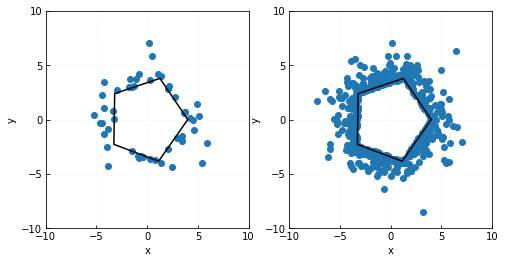

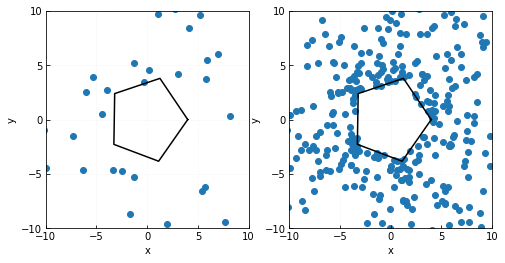

In [6]:
## Visualize the pentagon

def experiment_pentagon(params):
    n_samples = params.get('n_samples', 500)
    train_scale = params.get('train_scale', 1)
    
    A_mat, b_vec = get_pentagon_feasible_set()
    
    init_pt = shake_n_bake_safe_init(A_mat, b_vec, np.array([0.1, 0.1]))
    mcmc_infeas_pts = shake_n_bake_infeas(
        A_mat,
        b_vec,
        init_pt,
        n_samples=n_samples,
        scale=train_scale,
    )
    
    pts = [ mcmc_infeas_pts[:50], mcmc_infeas_pts ]
    
    xy = mcmc_infeas_pts.T
    fig, axs = plt.subplots(nrows=1, ncols=2, figsize=(8, 4))
    
    for i, ax in enumerate(axs):
        # plot the polyhedron lines
        xpoly = [4, 1.26, -3.2, -3.28, 1.13, 4]
        ypoly = [0, 3.79, 2.39, -2.28, -3.83, 0]
        ax.plot(
            xpoly, ypoly, markersize=0, color='black', 
        )

        # then plot sampled points
        xy = pts[i].T
        ax.scatter(
            xy[0], xy[1]
        )

        ax.tick_params(direction='in')
        ax.grid(True, ls='--', alpha=0.1)
        ax.set(
            xlabel='x', 
            ylabel='y', 
            xlim=(-10, 10),
            xticks=[-10, -5, 0, 5, 10],
            ylim=(-10, 10),
            yticks=[-10, -5, 0, 5, 10],
        )
        save_settings = {
            'bbox_inches': 'tight',
            'dpi': 300,
        }
        fig.savefig(
            'img/pentagon_scale{}_pts50-500.png'.format(train_scale),
            **save_settings,
        )
        fig.savefig(
            'img/pentagon_scale{}_pts50-500.eps'.format(train_scale),
            **save_settings,
        )
    return fig, ax

params = {
    'train_scale': 1,
}
experiment_pentagon(params)
params = {
    'train_scale': 10,
}
experiment_pentagon(params)

  4%|▍         | 8/200 [00:00<00:02, 74.47it/s]

{}


100%|█████████▉| 199/200 [00:03<00:00, 52.95it/s]


Generated 201 feasible and 200 infeasible pts for testing.


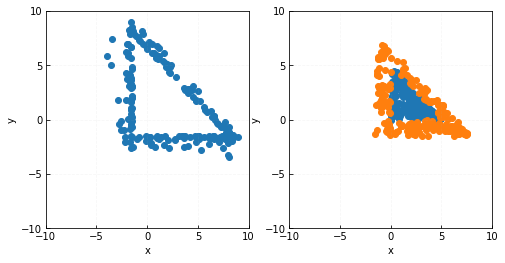

In [7]:
def experiment_simplex_plot_infeas(params):
    n = params.get('n', 2)
    size = params.get('size', -5)
    n_samples = params.get('n_samples', 200)
    scale = params.get('scale', 1)
    train_scale = params.get('train_scale', 0.5)
    test_n_samples = params.get('test_n_samples', 200)
    verbose = params.get('verbose', True)
    if verbose:
        pprint(params)

    A_mat, b_vec, A_relax, b_relax = get_simplex_constraints(n=n, size=size, scale=scale)

    feas_pts = hit_n_run(A_mat, b_vec, n_samples=n_samples)
    feas_pts = np.array(feas_pts)

    init_pt = shake_n_bake_safe_init(A_relax, b_relax, feas_pts[-1])
    mcmc_infeas_pts = shake_n_bake_infeas(
        A_relax,
        b_relax,
        init_pt,
        n_samples=n_samples,
        scale=train_scale,
    )

    X_test, y_test = hr_test_set(
        A_relax,
        b_relax,
        A_mat,
        b_vec,
        n_samples=test_n_samples,
    )
    X_test_feas = [ xi for xi, yi in zip(X_test, y_test) if yi == 1 ]
    X_test_feas = np.array(X_test_feas).T
    X_test_infeas = [ xi for xi, yi in zip(X_test, y_test) if yi == 0 ]
    X_test_infeas = np.array(X_test_infeas).T
    
    fig, axs = plt.subplots(nrows=1, ncols=2, figsize=(8, 4))
    xy = mcmc_infeas_pts.T
    axs[0].scatter(xy[0], xy[1])

    axs[0].tick_params(direction='in')
    axs[0].grid(True, ls='--', alpha=0.1)
    axs[0].set(
        xlabel='x', 
        ylabel='y', 
        xlim=(-10, 10),
        xticks=[-10, -5, 0, 5, 10],
        ylim=(-10, 10),
        yticks=[-10, -5, 0, 5, 10],
    )
    
    axs[1].scatter(X_test_feas[0], X_test_feas[1])
    axs[1].scatter(X_test_infeas[0], X_test_infeas[1])
    axs[1].tick_params(direction='in')
    axs[1].grid(True, ls='--', alpha=0.1)
    axs[1].set(
        xlabel='x', 
        ylabel='y', 
        xlim=(-10, 10),
        xticks=[-10, -5, 0, 5, 10],
        ylim=(-10, 10),
        yticks=[-10, -5, 0, 5, 10],
    )


experiment_simplex_plot_infeas({})    

  4%|▎         | 7/200 [00:00<00:03, 61.91it/s]

********************************************************************************
	Scale = 0.25
********************************************************************************


  4%|▍         | 8/200 [00:00<00:02, 73.59it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [01:06<00:00,  2.99it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 73.83it/s]

Run [1, 0] - 	Scores:	GMM:0.589	KDE:0.613	MCMC:0.835


  4%|▍         | 8/200 [00:00<00:02, 78.31it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:09<00:00, 21.62it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 78.50it/s]

Run [2, 0] - 	Scores:	GMM:0.803	KDE:0.693	MCMC:0.905


  4%|▍         | 8/200 [00:00<00:02, 78.85it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:06<00:00, 30.80it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 78.67it/s]

Run [3, 0] - 	Scores:	GMM:0.818	KDE:0.636	MCMC:0.91


  4%|▍         | 8/200 [00:00<00:02, 77.93it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:11<00:00, 17.51it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 78.69it/s]

Run [4, 0] - 	Scores:	GMM:0.698	KDE:0.571	MCMC:0.855


  4%|▍         | 8/200 [00:00<00:02, 76.95it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:06<00:00, 32.55it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 79.18it/s]

Run [5, 0] - 	Scores:	GMM:0.601	KDE:0.676	MCMC:0.893


  4%|▍         | 8/200 [00:00<00:02, 76.19it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:35<00:00,  5.66it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 74.24it/s]

Run [6, 0] - 	Scores:	GMM:0.626	KDE:0.519	MCMC:0.835


  4%|▍         | 8/200 [00:00<00:02, 78.20it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:22<00:00,  8.92it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 78.91it/s]

Run [7, 0] - 	Scores:	GMM:0.626	KDE:0.599	MCMC:0.858


  4%|▍         | 8/200 [00:00<00:02, 78.32it/s]

Generated 199 feasible and 199 infeasible for training.


  4%|▍         | 8/200 [00:00<00:02, 79.81it/s]

Sampled 77 points instead of 100.0


  4%|▍         | 9/200 [00:00<00:02, 80.00it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:36<00:00,  5.43it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 78.57it/s]

Run [8, 1] - 	Scores:	GMM:0.599	KDE:0.603	MCMC:0.893


  4%|▍         | 8/200 [00:00<00:02, 78.30it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:04<00:00, 44.68it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 78.86it/s]

Run [9, 1] - 	Scores:	GMM:0.898	KDE:0.716	MCMC:0.918


  4%|▍         | 8/200 [00:00<00:02, 75.36it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:10<00:00, 19.65it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 78.43it/s]

Run [10, 1] - 	Scores:	GMM:0.633	KDE:0.748	MCMC:0.855


  4%|▍         | 8/200 [00:00<00:02, 73.82it/s]

Generated 201 feasible and 201 infeasible for training.


  4%|▍         | 8/200 [00:00<00:02, 73.66it/s]

Sampled 24 points instead of 100.0


  4%|▍         | 8/200 [00:00<00:02, 75.24it/s]

Generated 201 feasible and 201 infeasible for training.


  4%|▍         | 8/200 [00:00<00:02, 76.18it/s]

Sampled 27 points instead of 100.0


  4%|▍         | 8/200 [00:00<00:02, 75.78it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:44<00:00,  4.45it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 72.42it/s]

Run [11, 3] - 	Scores:	GMM:0.678	KDE:0.516	MCMC:0.825


  4%|▍         | 8/200 [00:00<00:02, 75.57it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:48<00:00,  4.07it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▎         | 7/200 [00:00<00:02, 67.78it/s]

Run [12, 3] - 	Scores:	GMM:0.623	KDE:0.574	MCMC:0.898


  4%|▍         | 8/200 [00:00<00:02, 71.47it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:08<00:00, 22.98it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 74.62it/s]

Run [13, 3] - 	Scores:	GMM:0.529	KDE:0.556	MCMC:0.885


  4%|▍         | 8/200 [00:00<00:02, 77.10it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [01:18<00:00,  2.54it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 75.22it/s]

Run [14, 3] - 	Scores:	GMM:0.514	KDE:0.496	MCMC:0.84


  4%|▍         | 8/200 [00:00<00:02, 75.88it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:05<00:00, 37.40it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 74.93it/s]

Run [15, 3] - 	Scores:	GMM:0.895	KDE:0.9	MCMC:0.91


  4%|▍         | 8/200 [00:00<00:02, 76.26it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:06<00:00, 28.96it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 75.74it/s]

Run [16, 3] - 	Scores:	GMM:0.878	KDE:0.845	MCMC:0.858


  4%|▍         | 8/200 [00:00<00:02, 75.05it/s]

Generated 201 feasible and 201 infeasible for training.


  4%|▍         | 8/200 [00:00<00:02, 74.14it/s]

Sampled 51 points instead of 100.0


  4%|▍         | 8/200 [00:00<00:02, 77.91it/s]

Generated 200 feasible and 200 infeasible for training.


  4%|▍         | 8/200 [00:00<00:02, 75.53it/s]

Sampled 79 points instead of 100.0


  4%|▍         | 8/200 [00:00<00:02, 74.78it/s]

Generated 200 feasible and 200 infeasible for training.


100%|█████████▉| 199/200 [00:39<00:00,  5.07it/s]
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


Generated 201 feasible and 200 infeasible pts for testing.


/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)
  4%|▍         | 8/200 [00:00<00:02, 75.68it/s]

Run [17, 5] - 	Scores:	GMM:0.603	KDE:0.608	MCMC:0.753


  4%|▍         | 8/200 [00:00<00:02, 71.95it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [01:34<00:00,  2.11it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 74.58it/s]

Run [18, 5] - 	Scores:	GMM:0.638	KDE:0.584	MCMC:0.888


  4%|▍         | 8/200 [00:00<00:02, 75.54it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:09<00:00, 21.41it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 75.71it/s]

Run [19, 5] - 	Scores:	GMM:0.726	KDE:0.683	MCMC:0.888


  4%|▍         | 8/200 [00:00<00:02, 75.95it/s]

Generated 200 feasible and 200 infeasible for training.


100%|█████████▉| 199/200 [00:11<00:00, 16.89it/s]
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


Generated 201 feasible and 200 infeasible pts for testing.


/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)
  4%|▍         | 8/200 [00:00<00:02, 75.26it/s]

Run [20, 5] - 	Scores:	GMM:0.815	KDE:0.608	MCMC:0.893


  4%|▍         | 8/200 [00:00<00:02, 76.38it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:34<00:00,  5.84it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 76.23it/s]

Run [21, 5] - 	Scores:	GMM:0.561	KDE:0.643	MCMC:0.845


  4%|▍         | 8/200 [00:00<00:02, 74.72it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:12<00:00, 15.34it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 72.57it/s]

Run [22, 5] - 	Scores:	GMM:0.611	KDE:0.589	MCMC:0.91


  4%|▍         | 8/200 [00:00<00:02, 75.73it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [01:00<00:00,  3.27it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 74.79it/s]

Run [23, 5] - 	Scores:	GMM:0.574	KDE:0.561	MCMC:0.751


  4%|▍         | 8/200 [00:00<00:02, 75.49it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:09<00:00, 21.60it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 74.81it/s]

Run [24, 5] - 	Scores:	GMM:0.815	KDE:0.643	MCMC:0.873


  4%|▍         | 8/200 [00:00<00:02, 74.45it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:25<00:00,  7.91it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 74.90it/s]

Run [25, 5] - 	Scores:	GMM:0.631	KDE:0.743	MCMC:0.798


  4%|▍         | 8/200 [00:00<00:02, 75.76it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:15<00:00, 12.57it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 75.78it/s]

Run [26, 5] - 	Scores:	GMM:0.753	KDE:0.628	MCMC:0.853


  4%|▍         | 8/200 [00:00<00:02, 74.45it/s]

Generated 201 feasible and 201 infeasible for training.


 72%|███████▏  | 143/200 [02:11<00:52,  1.08it/s]


Generated 201 feasible and 144 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 75.35it/s]

Run [27, 5] - 	Scores:	GMM:0.655	KDE:0.71	MCMC:0.725


  4%|▍         | 8/200 [00:00<00:02, 74.86it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:27<00:00,  7.31it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 75.21it/s]

Run [28, 5] - 	Scores:	GMM:0.536	KDE:0.599	MCMC:0.88


  4%|▍         | 8/200 [00:00<00:02, 74.52it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:19<00:00, 10.40it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 75.86it/s]

Run [29, 5] - 	Scores:	GMM:0.603	KDE:0.611	MCMC:0.818


  4%|▍         | 8/200 [00:00<00:02, 75.09it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:10<00:00, 19.42it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▎         | 7/200 [00:00<00:02, 69.86it/s]

Run [30, 5] - 	Scores:	GMM:0.798	KDE:0.763	MCMC:0.88


  4%|▍         | 8/200 [00:00<00:02, 75.84it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:10<00:00, 18.70it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 75.12it/s]

Run [31, 5] - 	Scores:	GMM:0.706	KDE:0.701	MCMC:0.898


  4%|▍         | 8/200 [00:00<00:02, 75.40it/s]

Generated 200 feasible and 200 infeasible for training.


100%|█████████▉| 199/200 [00:34<00:00,  5.82it/s]
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


Generated 201 feasible and 200 infeasible pts for testing.


/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)
  4%|▍         | 8/200 [00:00<00:02, 75.89it/s]

Run [32, 5] - 	Scores:	GMM:0.561	KDE:0.564	MCMC:0.905


  4%|▍         | 8/200 [00:00<00:02, 75.90it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:06<00:00, 32.84it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 74.69it/s]

Run [33, 5] - 	Scores:	GMM:0.833	KDE:0.748	MCMC:0.918


  4%|▍         | 8/200 [00:00<00:02, 71.21it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:43<00:00,  4.63it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 73.37it/s]

Run [34, 5] - 	Scores:	GMM:0.569	KDE:0.591	MCMC:0.798


  4%|▎         | 7/200 [00:00<00:02, 68.42it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:08<00:00, 24.68it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 75.09it/s]

Run [35, 5] - 	Scores:	GMM:0.616	KDE:0.628	MCMC:0.86


  4%|▍         | 8/200 [00:00<00:02, 71.12it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:04<00:00, 49.51it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 75.04it/s]

Run [36, 5] - 	Scores:	GMM:0.933	KDE:0.92	MCMC:0.925


  4%|▍         | 8/200 [00:00<00:02, 77.75it/s]

Generated 200 feasible and 200 infeasible for training.


  4%|▍         | 8/200 [00:00<00:02, 79.99it/s]

Sampled 8 points instead of 100.0


  4%|▍         | 8/200 [00:00<00:02, 78.61it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:10<00:00, 18.41it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 75.89it/s]

Run [37, 6] - 	Scores:	GMM:0.586	KDE:0.603	MCMC:0.928


  4%|▍         | 8/200 [00:00<00:02, 76.18it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:22<00:00,  8.80it/s]


Generated 202 feasible and 199 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 76.10it/s]

Run [38, 6] - 	Scores:	GMM:0.611	KDE:0.611	MCMC:0.905


  4%|▍         | 8/200 [00:00<00:02, 74.66it/s]

Generated 200 feasible and 200 infeasible for training.


100%|█████████▉| 199/200 [00:19<00:00, 10.11it/s]
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


Generated 201 feasible and 200 infeasible pts for testing.


/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)
  4%|▍         | 8/200 [00:00<00:02, 73.26it/s]

Run [39, 6] - 	Scores:	GMM:0.633	KDE:0.571	MCMC:0.865


  4%|▍         | 8/200 [00:00<00:02, 76.17it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:24<00:00,  8.11it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 71.52it/s]

Run [40, 6] - 	Scores:	GMM:0.561	KDE:0.519	MCMC:0.815


  4%|▍         | 8/200 [00:00<00:02, 75.69it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:12<00:00, 15.64it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 72.88it/s]

Run [41, 6] - 	Scores:	GMM:0.581	KDE:0.591	MCMC:0.768


  4%|▍         | 8/200 [00:00<00:02, 76.48it/s]

Generated 200 feasible and 200 infeasible for training.


100%|█████████▉| 199/200 [00:24<00:00,  7.99it/s]
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


Generated 201 feasible and 200 infeasible pts for testing.


/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)
  4%|▍         | 8/200 [00:00<00:02, 75.78it/s]

Run [42, 6] - 	Scores:	GMM:0.586	KDE:0.549	MCMC:0.798


  4%|▍         | 8/200 [00:00<00:02, 76.19it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:15<00:00, 12.92it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 75.16it/s]

Run [43, 6] - 	Scores:	GMM:0.608	KDE:0.594	MCMC:0.88


  4%|▍         | 8/200 [00:00<00:02, 75.58it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:26<00:00,  7.46it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 75.88it/s]

Run [44, 6] - 	Scores:	GMM:0.601	KDE:0.616	MCMC:0.783


  4%|▍         | 8/200 [00:00<00:02, 73.48it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:07<00:00, 26.75it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 75.79it/s]

Run [45, 6] - 	Scores:	GMM:0.87	KDE:0.756	MCMC:0.925


  4%|▎         | 7/200 [00:00<00:02, 69.43it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:08<00:00, 23.71it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 74.60it/s]

Run [46, 6] - 	Scores:	GMM:0.646	KDE:0.815	MCMC:0.903


  4%|▍         | 8/200 [00:00<00:02, 76.39it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:09<00:00, 19.95it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 74.49it/s]

Run [47, 6] - 	Scores:	GMM:0.746	KDE:0.686	MCMC:0.865


  4%|▍         | 8/200 [00:00<00:02, 75.98it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:56<00:00,  3.53it/s]


Generated 202 feasible and 199 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 75.74it/s]

Run [48, 6] - 	Scores:	GMM:0.536	KDE:0.531	MCMC:0.783


  4%|▍         | 8/200 [00:00<00:02, 74.07it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:15<00:00, 12.44it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 73.98it/s]

Run [49, 6] - 	Scores:	GMM:0.803	KDE:0.656	MCMC:0.923


  4%|▍         | 8/200 [00:00<00:02, 76.55it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:15<00:00, 12.73it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 74.57it/s]

Run [50, 6] - 	Scores:	GMM:0.559	KDE:0.576	MCMC:0.858
********************************************************************************
	Scale = 0.5
********************************************************************************


  4%|▍         | 8/200 [00:00<00:02, 75.59it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:06<00:00, 32.69it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 73.83it/s]

Run [1, 0] - 	Scores:	GMM:0.781	KDE:0.753	MCMC:0.868


  4%|▍         | 8/200 [00:00<00:02, 71.05it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:26<00:00,  7.41it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 72.22it/s]

Run [2, 0] - 	Scores:	GMM:0.539	KDE:0.544	MCMC:0.87


  4%|▍         | 8/200 [00:00<00:02, 76.38it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:34<00:00,  5.85it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 74.60it/s]

Run [3, 0] - 	Scores:	GMM:0.589	KDE:0.663	MCMC:0.875


  4%|▍         | 8/200 [00:00<00:02, 74.42it/s]

Generated 200 feasible and 200 infeasible for training.


100%|█████████▉| 199/200 [00:09<00:00, 20.88it/s]
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


Generated 201 feasible and 200 infeasible pts for testing.


/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)
  4%|▍         | 8/200 [00:00<00:02, 75.90it/s]

Run [4, 0] - 	Scores:	GMM:0.511	KDE:0.534	MCMC:0.898


  4%|▍         | 8/200 [00:00<00:02, 74.59it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:45<00:00,  4.37it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 74.86it/s]

Run [5, 0] - 	Scores:	GMM:0.526	KDE:0.524	MCMC:0.815


  4%|▍         | 8/200 [00:00<00:02, 75.24it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:09<00:00, 21.95it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 73.44it/s]

Run [6, 0] - 	Scores:	GMM:0.608	KDE:0.544	MCMC:0.898


  4%|▍         | 8/200 [00:00<00:02, 75.31it/s]

Generated 200 feasible and 200 infeasible for training.


100%|█████████▉| 199/200 [00:08<00:00, 24.08it/s]
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


Generated 201 feasible and 200 infeasible pts for testing.


/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)
  4%|▍         | 8/200 [00:00<00:02, 76.43it/s]

Run [7, 0] - 	Scores:	GMM:0.688	KDE:0.673	MCMC:0.893


  4%|▍         | 8/200 [00:00<00:02, 75.84it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:07<00:00, 25.84it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 75.79it/s]

Run [8, 0] - 	Scores:	GMM:0.758	KDE:0.698	MCMC:0.883


  4%|▍         | 8/200 [00:00<00:02, 72.83it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:10<00:00, 19.52it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 74.86it/s]

Run [9, 0] - 	Scores:	GMM:0.696	KDE:0.544	MCMC:0.9


  4%|▍         | 8/200 [00:00<00:02, 74.72it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:24<00:00,  8.03it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 70.85it/s]

Run [10, 0] - 	Scores:	GMM:0.648	KDE:0.586	MCMC:0.918


  4%|▍         | 8/200 [00:00<00:02, 75.68it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:11<00:00, 17.82it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▎         | 7/200 [00:00<00:02, 69.23it/s]

Run [11, 0] - 	Scores:	GMM:0.83	KDE:0.701	MCMC:0.895


  4%|▍         | 8/200 [00:00<00:02, 72.72it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:16<00:00, 12.39it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 76.46it/s]

Run [12, 0] - 	Scores:	GMM:0.676	KDE:0.628	MCMC:0.858


  4%|▍         | 8/200 [00:00<00:02, 75.56it/s]

Generated 200 feasible and 200 infeasible for training.


100%|█████████▉| 199/200 [00:04<00:00, 46.65it/s]
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


Generated 201 feasible and 200 infeasible pts for testing.


/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)
  4%|▍         | 8/200 [00:00<00:02, 75.92it/s]

Run [13, 0] - 	Scores:	GMM:0.748	KDE:0.783	MCMC:0.898


  4%|▍         | 8/200 [00:00<00:02, 75.47it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:14<00:00, 13.59it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 75.38it/s]

Run [14, 0] - 	Scores:	GMM:0.691	KDE:0.653	MCMC:0.84


  4%|▍         | 8/200 [00:00<00:02, 71.47it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:06<00:00, 29.40it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 75.25it/s]

Run [15, 0] - 	Scores:	GMM:0.758	KDE:0.763	MCMC:0.893


  4%|▍         | 8/200 [00:00<00:02, 74.03it/s]

Generated 200 feasible and 200 infeasible for training.


100%|█████████▉| 199/200 [00:25<00:00,  7.72it/s]
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


Generated 201 feasible and 200 infeasible pts for testing.


/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)
  4%|▍         | 8/200 [00:00<00:02, 74.75it/s]

Run [16, 0] - 	Scores:	GMM:0.546	KDE:0.589	MCMC:0.873


  4%|▍         | 8/200 [00:00<00:02, 75.41it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:04<00:00, 45.06it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 75.22it/s]

Run [17, 0] - 	Scores:	GMM:0.691	KDE:0.818	MCMC:0.945


  4%|▍         | 8/200 [00:00<00:02, 75.34it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:04<00:00, 41.96it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 75.55it/s]

Run [18, 0] - 	Scores:	GMM:0.883	KDE:0.835	MCMC:0.905


  4%|▍         | 8/200 [00:00<00:02, 75.00it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:12<00:00, 16.09it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 77.06it/s]

Run [19, 0] - 	Scores:	GMM:0.676	KDE:0.636	MCMC:0.838


  4%|▍         | 8/200 [00:00<00:02, 75.04it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:07<00:00, 27.25it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 75.31it/s]

Run [20, 0] - 	Scores:	GMM:0.626	KDE:0.618	MCMC:0.885


  4%|▍         | 8/200 [00:00<00:02, 74.82it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:08<00:00, 24.33it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 76.74it/s]

Run [21, 0] - 	Scores:	GMM:0.616	KDE:0.596	MCMC:0.903


  4%|▍         | 8/200 [00:00<00:02, 76.07it/s]

Generated 199 feasible and 199 infeasible for training.


100%|█████████▉| 199/200 [00:07<00:00, 26.68it/s]
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


Generated 201 feasible and 200 infeasible pts for testing.


/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)
  4%|▍         | 8/200 [00:00<00:02, 75.10it/s]

Run [22, 0] - 	Scores:	GMM:0.791	KDE:0.686	MCMC:0.873


  4%|▍         | 8/200 [00:00<00:02, 73.18it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:08<00:00, 22.73it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 71.70it/s]

Run [23, 0] - 	Scores:	GMM:0.571	KDE:0.768	MCMC:0.878


  4%|▍         | 8/200 [00:00<00:02, 76.06it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:05<00:00, 39.21it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 74.33it/s]

Run [24, 0] - 	Scores:	GMM:0.865	KDE:0.873	MCMC:0.935


  4%|▍         | 8/200 [00:00<00:02, 75.38it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:15<00:00, 12.61it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 75.75it/s]

Run [25, 0] - 	Scores:	GMM:0.509	KDE:0.501	MCMC:0.855


  4%|▍         | 8/200 [00:00<00:02, 71.27it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:24<00:00,  7.97it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 76.42it/s]

Run [26, 0] - 	Scores:	GMM:0.671	KDE:0.661	MCMC:0.8


  4%|▍         | 8/200 [00:00<00:02, 74.41it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:54<00:00,  3.68it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▎         | 7/200 [00:00<00:02, 69.45it/s]

Run [27, 0] - 	Scores:	GMM:0.556	KDE:0.559	MCMC:0.726


  4%|▍         | 8/200 [00:00<00:02, 72.14it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:12<00:00, 16.08it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 74.57it/s]

Run [28, 0] - 	Scores:	GMM:0.686	KDE:0.703	MCMC:0.92


  4%|▍         | 8/200 [00:00<00:02, 74.58it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:04<00:00, 46.06it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 75.63it/s]

Run [29, 0] - 	Scores:	GMM:0.708	KDE:0.9	MCMC:0.888


  4%|▍         | 8/200 [00:00<00:02, 74.29it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:29<00:00,  6.72it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 74.15it/s]

Run [30, 0] - 	Scores:	GMM:0.651	KDE:0.569	MCMC:0.786


  4%|▍         | 8/200 [00:00<00:02, 75.72it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:05<00:00, 34.65it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 75.07it/s]

Run [31, 0] - 	Scores:	GMM:0.895	KDE:0.883	MCMC:0.925


  4%|▍         | 8/200 [00:00<00:02, 74.07it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:05<00:00, 36.34it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 75.07it/s]

Run [32, 0] - 	Scores:	GMM:0.91	KDE:0.81	MCMC:0.898


  4%|▍         | 8/200 [00:00<00:02, 75.73it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [01:30<00:00,  2.19it/s]


Generated 202 feasible and 199 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 72.80it/s]

Run [33, 0] - 	Scores:	GMM:0.581	KDE:0.581	MCMC:0.86


  4%|▍         | 8/200 [00:00<00:02, 73.82it/s]

Generated 201 feasible and 201 infeasible for training.


  4%|▍         | 8/200 [00:00<00:02, 77.92it/s]

Sampled 5 points instead of 100.0


  4%|▍         | 8/200 [00:00<00:02, 78.01it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:03<00:00, 64.44it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 74.25it/s]

Run [34, 1] - 	Scores:	GMM:0.933	KDE:0.915	MCMC:0.878


  4%|▍         | 8/200 [00:00<00:02, 73.73it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:04<00:00, 46.47it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 75.44it/s]

Run [35, 1] - 	Scores:	GMM:0.843	KDE:0.85	MCMC:0.91


  4%|▍         | 8/200 [00:00<00:02, 78.39it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:10<00:00, 19.74it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 74.20it/s]

Run [36, 1] - 	Scores:	GMM:0.848	KDE:0.673	MCMC:0.87


  4%|▍         | 8/200 [00:00<00:02, 74.81it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:03<00:00, 50.01it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 75.69it/s]

Run [37, 1] - 	Scores:	GMM:0.738	KDE:0.915	MCMC:0.91


  4%|▍         | 8/200 [00:00<00:02, 76.07it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:57<00:00,  3.49it/s]


Generated 202 feasible and 199 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 74.02it/s]

Run [38, 1] - 	Scores:	GMM:0.579	KDE:0.544	MCMC:0.788


  4%|▍         | 8/200 [00:00<00:02, 73.60it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:10<00:00, 18.35it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 75.41it/s]

Run [39, 1] - 	Scores:	GMM:0.666	KDE:0.773	MCMC:0.913


  4%|▍         | 8/200 [00:00<00:02, 75.49it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:05<00:00, 34.06it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 72.69it/s]

Run [40, 1] - 	Scores:	GMM:0.681	KDE:0.768	MCMC:0.89


  4%|▍         | 8/200 [00:00<00:02, 77.81it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:11<00:00, 17.93it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 71.79it/s]

Run [41, 1] - 	Scores:	GMM:0.636	KDE:0.551	MCMC:0.845


  4%|▍         | 8/200 [00:00<00:02, 77.03it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:07<00:00, 25.18it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▎         | 7/200 [00:00<00:02, 64.53it/s]

Run [42, 1] - 	Scores:	GMM:0.648	KDE:0.581	MCMC:0.858


  4%|▍         | 8/200 [00:00<00:02, 75.01it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:04<00:00, 43.26it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 69.48it/s]

Run [43, 1] - 	Scores:	GMM:0.9	KDE:0.878	MCMC:0.84


  4%|▍         | 8/200 [00:00<00:02, 76.43it/s]

Generated 200 feasible and 200 infeasible for training.


100%|█████████▉| 199/200 [00:03<00:00, 50.61it/s]


Generated 201 feasible and 200 infeasible pts for testing.


/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)
  4%|▍         | 8/200 [00:00<00:02, 74.27it/s]

Run [44, 1] - 	Scores:	GMM:0.935	KDE:0.905	MCMC:0.9


  4%|▍         | 8/200 [00:00<00:02, 75.64it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:28<00:00,  6.93it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 74.26it/s]

Run [45, 1] - 	Scores:	GMM:0.586	KDE:0.549	MCMC:0.786


  4%|▍         | 8/200 [00:00<00:02, 74.43it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:08<00:00, 24.01it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 73.46it/s]

Run [46, 1] - 	Scores:	GMM:0.586	KDE:0.663	MCMC:0.918


  4%|▍         | 8/200 [00:00<00:02, 75.63it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:06<00:00, 31.54it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 74.40it/s]

Run [47, 1] - 	Scores:	GMM:0.833	KDE:0.768	MCMC:0.89


  4%|▍         | 8/200 [00:00<00:02, 74.35it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:36<00:00,  5.49it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 75.18it/s]

Run [48, 1] - 	Scores:	GMM:0.603	KDE:0.631	MCMC:0.87


  4%|▎         | 7/200 [00:00<00:03, 60.20it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:08<00:00, 24.03it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 72.06it/s]

Run [49, 1] - 	Scores:	GMM:0.805	KDE:0.756	MCMC:0.87


  4%|▍         | 8/200 [00:00<00:02, 75.42it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:08<00:00, 22.81it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 74.36it/s]

Run [50, 1] - 	Scores:	GMM:0.838	KDE:0.698	MCMC:0.895
********************************************************************************
	Scale = 0.75
********************************************************************************


  4%|▍         | 8/200 [00:00<00:02, 73.32it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:07<00:00, 27.06it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 74.41it/s]

Run [1, 0] - 	Scores:	GMM:0.758	KDE:0.611	MCMC:0.89


  3%|▎         | 6/200 [00:00<00:03, 58.33it/s]

Generated 201 feasible and 201 infeasible for training.


 65%|██████▌   | 130/200 [02:11<01:10,  1.01s/it]


Generated 202 feasible and 130 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 76.18it/s]

Run [2, 0] - 	Scores:	GMM:0.645	KDE:0.693	MCMC:0.919


  4%|▍         | 8/200 [00:00<00:02, 75.76it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:48<00:00,  4.09it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 75.87it/s]

Run [3, 0] - 	Scores:	GMM:0.536	KDE:0.561	MCMC:0.858


  4%|▍         | 8/200 [00:00<00:02, 74.40it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:18<00:00, 10.86it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 73.95it/s]

Run [4, 0] - 	Scores:	GMM:0.561	KDE:0.591	MCMC:0.908


  4%|▍         | 8/200 [00:00<00:02, 74.58it/s]

Generated 201 feasible and 201 infeasible for training.


  4%|▍         | 8/200 [00:00<00:02, 77.22it/s]

Sampled 4 points instead of 100.0


  4%|▍         | 8/200 [00:00<00:02, 77.24it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:18<00:00, 11.04it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 74.86it/s]

Run [5, 1] - 	Scores:	GMM:0.584	KDE:0.673	MCMC:0.895


  4%|▍         | 8/200 [00:00<00:02, 74.42it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:13<00:00, 14.95it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 75.06it/s]

Run [6, 1] - 	Scores:	GMM:0.721	KDE:0.668	MCMC:0.848


  4%|▍         | 8/200 [00:00<00:02, 72.40it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [01:10<00:00,  2.82it/s]


Generated 202 feasible and 199 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 75.29it/s]

Run [7, 1] - 	Scores:	GMM:0.536	KDE:0.591	MCMC:0.88


  4%|▎         | 7/200 [00:00<00:02, 69.35it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:07<00:00, 27.31it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 74.59it/s]

Run [8, 1] - 	Scores:	GMM:0.623	KDE:0.713	MCMC:0.85


  4%|▍         | 8/200 [00:00<00:02, 75.22it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:17<00:00, 11.49it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 75.02it/s]

Run [9, 1] - 	Scores:	GMM:0.581	KDE:0.564	MCMC:0.835


  4%|▍         | 8/200 [00:00<00:02, 74.84it/s]

Generated 200 feasible and 200 infeasible for training.


100%|█████████▉| 199/200 [00:23<00:00,  8.37it/s]
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


Generated 201 feasible and 200 infeasible pts for testing.


/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)
  4%|▍         | 8/200 [00:00<00:02, 75.59it/s]

Run [10, 1] - 	Scores:	GMM:0.564	KDE:0.581	MCMC:0.883


  4%|▎         | 7/200 [00:00<00:02, 66.27it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:28<00:00,  7.00it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 75.57it/s]

Run [11, 1] - 	Scores:	GMM:0.633	KDE:0.586	MCMC:0.83


  4%|▍         | 8/200 [00:00<00:02, 72.24it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:50<00:00,  3.91it/s]


Generated 202 feasible and 199 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 72.85it/s]

Run [12, 1] - 	Scores:	GMM:0.561	KDE:0.539	MCMC:0.835


  4%|▍         | 8/200 [00:00<00:02, 74.71it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [02:14<00:00,  1.48it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 74.32it/s]

Run [13, 1] - 	Scores:	GMM:0.678	KDE:0.653	MCMC:0.843


  4%|▍         | 8/200 [00:00<00:02, 76.44it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:10<00:00, 19.20it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 70.97it/s]

Run [14, 1] - 	Scores:	GMM:0.648	KDE:0.544	MCMC:0.868


  4%|▍         | 8/200 [00:00<00:02, 74.69it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [01:32<00:00,  2.16it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 74.77it/s]

Run [15, 1] - 	Scores:	GMM:0.633	KDE:0.608	MCMC:0.791


  4%|▍         | 8/200 [00:00<00:02, 71.49it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:05<00:00, 37.20it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 75.96it/s]

Run [16, 1] - 	Scores:	GMM:0.646	KDE:0.838	MCMC:0.865


  4%|▍         | 8/200 [00:00<00:02, 74.38it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:04<00:00, 45.19it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 74.10it/s]

Run [17, 1] - 	Scores:	GMM:0.638	KDE:0.878	MCMC:0.925


  4%|▍         | 8/200 [00:00<00:02, 74.66it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:05<00:00, 38.35it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 72.66it/s]

Run [18, 1] - 	Scores:	GMM:0.621	KDE:0.756	MCMC:0.885


  4%|▍         | 8/200 [00:00<00:02, 73.91it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:03<00:00, 59.41it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 74.84it/s]

Run [19, 1] - 	Scores:	GMM:0.943	KDE:0.965	MCMC:0.948


  4%|▍         | 8/200 [00:00<00:02, 77.36it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:04<00:00, 48.45it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 74.29it/s]

Run [20, 1] - 	Scores:	GMM:0.875	KDE:0.783	MCMC:0.898


  4%|▍         | 8/200 [00:00<00:02, 74.00it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:06<00:00, 32.41it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 74.78it/s]

Run [21, 1] - 	Scores:	GMM:0.721	KDE:0.681	MCMC:0.853


  4%|▍         | 8/200 [00:00<00:02, 76.80it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:03<00:00, 59.67it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 74.40it/s]

Run [22, 1] - 	Scores:	GMM:0.933	KDE:0.94	MCMC:0.933


  4%|▍         | 8/200 [00:00<00:02, 73.81it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:13<00:00, 14.40it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 75.30it/s]

Run [23, 1] - 	Scores:	GMM:0.746	KDE:0.651	MCMC:0.898


  4%|▍         | 8/200 [00:00<00:02, 73.29it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:03<00:00, 58.15it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 71.61it/s]

Run [24, 1] - 	Scores:	GMM:0.873	KDE:0.945	MCMC:0.93


  4%|▍         | 8/200 [00:00<00:02, 74.18it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:06<00:00, 30.76it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 73.26it/s]

Run [25, 1] - 	Scores:	GMM:0.848	KDE:0.796	MCMC:0.903


  4%|▍         | 8/200 [00:00<00:02, 75.00it/s]

Generated 200 feasible and 200 infeasible for training.


100%|█████████▉| 199/200 [00:10<00:00, 18.37it/s]
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


Generated 201 feasible and 200 infeasible pts for testing.


/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)
  4%|▍         | 8/200 [00:00<00:02, 74.72it/s]

Run [26, 1] - 	Scores:	GMM:0.678	KDE:0.564	MCMC:0.9


  4%|▍         | 8/200 [00:00<00:02, 70.78it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:11<00:00, 17.65it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 74.88it/s]

Run [27, 1] - 	Scores:	GMM:0.81	KDE:0.736	MCMC:0.858


  4%|▍         | 8/200 [00:00<00:02, 74.55it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:50<00:00,  3.96it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 73.75it/s]

Run [28, 1] - 	Scores:	GMM:0.551	KDE:0.569	MCMC:0.726


  4%|▍         | 8/200 [00:00<00:02, 74.82it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:05<00:00, 38.63it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 73.46it/s]

Run [29, 1] - 	Scores:	GMM:0.818	KDE:0.718	MCMC:0.883


  4%|▍         | 8/200 [00:00<00:02, 74.74it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:04<00:00, 39.83it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 71.40it/s]

Run [30, 1] - 	Scores:	GMM:0.623	KDE:0.833	MCMC:0.938


  4%|▍         | 8/200 [00:00<00:02, 74.81it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:43<00:00,  4.57it/s]


Generated 202 feasible and 199 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 70.16it/s]

Run [31, 1] - 	Scores:	GMM:0.711	KDE:0.566	MCMC:0.791


  4%|▍         | 8/200 [00:00<00:02, 75.22it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:03<00:00, 57.45it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 72.85it/s]

Run [32, 1] - 	Scores:	GMM:0.945	KDE:0.923	MCMC:0.91


  4%|▍         | 8/200 [00:00<00:02, 76.94it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:04<00:00, 40.39it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 72.02it/s]

Run [33, 1] - 	Scores:	GMM:0.736	KDE:0.845	MCMC:0.89


  4%|▍         | 8/200 [00:00<00:02, 74.34it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:09<00:00, 21.51it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 76.09it/s]

Run [34, 1] - 	Scores:	GMM:0.803	KDE:0.701	MCMC:0.92


  4%|▍         | 8/200 [00:00<00:02, 75.89it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:02<00:00, 66.55it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 71.44it/s]

Run [35, 1] - 	Scores:	GMM:0.88	KDE:0.943	MCMC:0.935


  4%|▍         | 8/200 [00:00<00:02, 76.80it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:06<00:00, 30.67it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 74.49it/s]

Run [36, 1] - 	Scores:	GMM:0.938	KDE:0.843	MCMC:0.908


  4%|▍         | 8/200 [00:00<00:02, 72.77it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:05<00:00, 37.14it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 73.92it/s]

Run [37, 1] - 	Scores:	GMM:0.92	KDE:0.81	MCMC:0.935


  4%|▍         | 8/200 [00:00<00:02, 71.67it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [01:20<00:00,  2.47it/s]


Generated 202 feasible and 199 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 74.82it/s]

Run [38, 1] - 	Scores:	GMM:0.603	KDE:0.601	MCMC:0.776


  4%|▍         | 8/200 [00:00<00:02, 74.71it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:09<00:00, 20.92it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 72.53it/s]

Run [39, 1] - 	Scores:	GMM:0.731	KDE:0.686	MCMC:0.895


  4%|▍         | 8/200 [00:00<00:02, 70.24it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:03<00:00, 54.55it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 72.91it/s]

Run [40, 1] - 	Scores:	GMM:0.85	KDE:0.908	MCMC:0.92


  4%|▍         | 8/200 [00:00<00:02, 73.72it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:07<00:00, 25.22it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 76.71it/s]

Run [41, 1] - 	Scores:	GMM:0.855	KDE:0.761	MCMC:0.868


  4%|▍         | 8/200 [00:00<00:02, 71.38it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:03<00:00, 55.85it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 72.49it/s]

Run [42, 1] - 	Scores:	GMM:0.85	KDE:0.935	MCMC:0.91


  4%|▍         | 8/200 [00:00<00:02, 72.82it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:12<00:00, 16.27it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 75.16it/s]

Run [43, 1] - 	Scores:	GMM:0.641	KDE:0.546	MCMC:0.89


  4%|▍         | 8/200 [00:00<00:02, 75.22it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:03<00:00, 62.11it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 74.64it/s]

Run [44, 1] - 	Scores:	GMM:0.741	KDE:0.91	MCMC:0.928


  4%|▍         | 8/200 [00:00<00:02, 74.87it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:03<00:00, 65.01it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 75.85it/s]

Run [45, 1] - 	Scores:	GMM:0.983	KDE:0.983	MCMC:0.95


  4%|▍         | 8/200 [00:00<00:02, 71.15it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:07<00:00, 27.48it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 73.44it/s]

Run [46, 1] - 	Scores:	GMM:0.566	KDE:0.613	MCMC:0.903


  4%|▍         | 8/200 [00:00<00:02, 73.79it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:03<00:00, 50.59it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 74.85it/s]

Run [47, 1] - 	Scores:	GMM:0.701	KDE:0.838	MCMC:0.885


  4%|▍         | 8/200 [00:00<00:02, 74.97it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:03<00:00, 53.09it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 73.82it/s]

Run [48, 1] - 	Scores:	GMM:0.93	KDE:0.925	MCMC:0.903


  4%|▍         | 8/200 [00:00<00:02, 74.10it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:10<00:00, 18.59it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 76.34it/s]

Run [49, 1] - 	Scores:	GMM:0.646	KDE:0.536	MCMC:0.868


  4%|▍         | 8/200 [00:00<00:02, 75.09it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:11<00:00, 17.08it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 73.09it/s]

Run [50, 1] - 	Scores:	GMM:0.815	KDE:0.658	MCMC:0.895
********************************************************************************
	Scale = 1.0
********************************************************************************


  4%|▍         | 8/200 [00:00<00:02, 74.60it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:03<00:00, 56.90it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 75.39it/s]

Run [1, 0] - 	Scores:	GMM:0.955	KDE:0.948	MCMC:0.915


  4%|▍         | 8/200 [00:00<00:02, 70.83it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:17<00:00, 11.07it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 76.25it/s]

Run [2, 0] - 	Scores:	GMM:0.686	KDE:0.606	MCMC:0.888


  4%|▍         | 8/200 [00:00<00:02, 73.57it/s]

Generated 200 feasible and 200 infeasible for training.


100%|█████████▉| 199/200 [00:32<00:00,  6.09it/s]
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


Generated 201 feasible and 200 infeasible pts for testing.


/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)
  4%|▍         | 8/200 [00:00<00:02, 74.12it/s]

Run [3, 0] - 	Scores:	GMM:0.549	KDE:0.564	MCMC:0.853


  4%|▎         | 7/200 [00:00<00:02, 69.73it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:04<00:00, 40.06it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 72.24it/s]

Run [4, 0] - 	Scores:	GMM:0.92	KDE:0.915	MCMC:0.893


  4%|▍         | 8/200 [00:00<00:02, 75.02it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:03<00:00, 55.85it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 74.20it/s]

Run [5, 0] - 	Scores:	GMM:0.958	KDE:0.95	MCMC:0.923


  4%|▍         | 8/200 [00:00<00:02, 74.22it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:03<00:00, 51.70it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 73.45it/s]

Run [6, 0] - 	Scores:	GMM:0.925	KDE:0.9	MCMC:0.925


  4%|▍         | 8/200 [00:00<00:02, 75.55it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:03<00:00, 54.63it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 75.49it/s]

Run [7, 0] - 	Scores:	GMM:0.948	KDE:0.91	MCMC:0.95


  4%|▍         | 8/200 [00:00<00:02, 74.34it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:04<00:00, 47.79it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 74.65it/s]

Run [8, 0] - 	Scores:	GMM:0.903	KDE:0.888	MCMC:0.935


  4%|▍         | 8/200 [00:00<00:02, 73.23it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:03<00:00, 55.24it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 74.83it/s]

Run [9, 0] - 	Scores:	GMM:0.91	KDE:0.853	MCMC:0.898


  4%|▍         | 8/200 [00:00<00:02, 74.66it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:04<00:00, 41.39it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 76.39it/s]

Run [10, 0] - 	Scores:	GMM:0.955	KDE:0.933	MCMC:0.938


  4%|▎         | 7/200 [00:00<00:02, 69.63it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:09<00:00, 20.33it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 74.24it/s]

Run [11, 0] - 	Scores:	GMM:0.758	KDE:0.594	MCMC:0.913


  4%|▍         | 8/200 [00:00<00:02, 73.29it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:13<00:00, 14.36it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 73.83it/s]

Run [12, 0] - 	Scores:	GMM:0.608	KDE:0.606	MCMC:0.85


  4%|▍         | 8/200 [00:00<00:02, 75.30it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:04<00:00, 41.56it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 74.21it/s]

Run [13, 0] - 	Scores:	GMM:0.643	KDE:0.87	MCMC:0.895


  4%|▍         | 8/200 [00:00<00:02, 75.84it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:06<00:00, 33.05it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 74.34it/s]

Run [14, 0] - 	Scores:	GMM:0.618	KDE:0.628	MCMC:0.865


  4%|▍         | 8/200 [00:00<00:02, 73.96it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:14<00:00, 13.65it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 75.84it/s]

Run [15, 0] - 	Scores:	GMM:0.633	KDE:0.559	MCMC:0.918


  4%|▍         | 8/200 [00:00<00:02, 75.01it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:03<00:00, 58.35it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 74.69it/s]

Run [16, 0] - 	Scores:	GMM:0.945	KDE:0.955	MCMC:0.928


  4%|▍         | 8/200 [00:00<00:02, 75.65it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:06<00:00, 31.60it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 74.71it/s]

Run [17, 0] - 	Scores:	GMM:0.903	KDE:0.863	MCMC:0.923


  4%|▍         | 8/200 [00:00<00:02, 76.23it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:05<00:00, 36.09it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 75.36it/s]

Run [18, 0] - 	Scores:	GMM:0.638	KDE:0.751	MCMC:0.893


  4%|▍         | 8/200 [00:00<00:02, 73.31it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [02:07<00:00,  1.56it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 76.40it/s]

Run [19, 0] - 	Scores:	GMM:0.576	KDE:0.633	MCMC:0.835


  4%|▍         | 8/200 [00:00<00:02, 73.68it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:05<00:00, 35.27it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 71.75it/s]

Run [20, 0] - 	Scores:	GMM:0.85	KDE:0.908	MCMC:0.93


  4%|▍         | 8/200 [00:00<00:02, 74.52it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:07<00:00, 24.89it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 75.84it/s]

Run [21, 0] - 	Scores:	GMM:0.626	KDE:0.608	MCMC:0.893


  4%|▍         | 8/200 [00:00<00:02, 76.67it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:03<00:00, 52.77it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 72.89it/s]

Run [22, 0] - 	Scores:	GMM:0.805	KDE:0.905	MCMC:0.915


  4%|▍         | 8/200 [00:00<00:02, 71.41it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:14<00:00, 13.95it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 73.22it/s]

Run [23, 0] - 	Scores:	GMM:0.676	KDE:0.574	MCMC:0.87


  4%|▍         | 8/200 [00:00<00:02, 74.84it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:06<00:00, 32.77it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 71.56it/s]

Run [24, 0] - 	Scores:	GMM:0.783	KDE:0.818	MCMC:0.865


  4%|▍         | 8/200 [00:00<00:02, 76.10it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:03<00:00, 61.84it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 73.03it/s]

Run [25, 0] - 	Scores:	GMM:0.965	KDE:0.955	MCMC:0.97


  4%|▎         | 7/200 [00:00<00:02, 65.14it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:03<00:00, 61.52it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 74.69it/s]

Run [26, 0] - 	Scores:	GMM:0.95	KDE:0.94	MCMC:0.928


  4%|▍         | 8/200 [00:00<00:02, 76.83it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:07<00:00, 27.56it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 75.43it/s]

Run [27, 0] - 	Scores:	GMM:0.823	KDE:0.756	MCMC:0.918


  4%|▍         | 8/200 [00:00<00:02, 72.18it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:04<00:00, 49.70it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 70.67it/s]

Run [28, 0] - 	Scores:	GMM:0.825	KDE:0.815	MCMC:0.94


  4%|▍         | 8/200 [00:00<00:02, 72.84it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:04<00:00, 40.03it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 74.88it/s]

Run [29, 0] - 	Scores:	GMM:0.86	KDE:0.825	MCMC:0.908


  4%|▍         | 8/200 [00:00<00:02, 75.51it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:17<00:00, 11.40it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▎         | 7/200 [00:00<00:02, 67.50it/s]

Run [30, 0] - 	Scores:	GMM:0.596	KDE:0.631	MCMC:0.88


  4%|▍         | 8/200 [00:00<00:02, 77.36it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:03<00:00, 55.51it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 73.72it/s]

Run [31, 0] - 	Scores:	GMM:0.925	KDE:0.9	MCMC:0.903


  4%|▍         | 8/200 [00:00<00:02, 74.65it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:03<00:00, 51.79it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 73.61it/s]

Run [32, 0] - 	Scores:	GMM:0.938	KDE:0.928	MCMC:0.92


  4%|▍         | 8/200 [00:00<00:02, 77.75it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:07<00:00, 25.19it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 73.82it/s]

Run [33, 0] - 	Scores:	GMM:0.835	KDE:0.643	MCMC:0.853


  4%|▍         | 8/200 [00:00<00:02, 75.64it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:03<00:00, 62.70it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 75.56it/s]

Run [34, 0] - 	Scores:	GMM:0.761	KDE:0.935	MCMC:0.898


  4%|▍         | 8/200 [00:00<00:02, 75.67it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:26<00:00,  7.48it/s]


Generated 202 feasible and 199 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 75.15it/s]

Run [35, 0] - 	Scores:	GMM:0.509	KDE:0.531	MCMC:0.88


  4%|▍         | 8/200 [00:00<00:02, 78.59it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:30<00:00,  6.59it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 72.67it/s]

Run [36, 0] - 	Scores:	GMM:0.633	KDE:0.594	MCMC:0.82


  4%|▍         | 8/200 [00:00<00:02, 74.18it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:02<00:00, 71.01it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 71.43it/s]

Run [37, 0] - 	Scores:	GMM:0.965	KDE:0.963	MCMC:0.92


  4%|▍         | 8/200 [00:00<00:02, 76.91it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:26<00:00,  7.47it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 73.79it/s]

Run [38, 0] - 	Scores:	GMM:0.569	KDE:0.618	MCMC:0.833


  4%|▍         | 8/200 [00:00<00:02, 73.08it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:07<00:00, 26.41it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▎         | 7/200 [00:00<00:02, 70.00it/s]

Run [39, 0] - 	Scores:	GMM:0.845	KDE:0.656	MCMC:0.913


  4%|▍         | 8/200 [00:00<00:02, 77.45it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:03<00:00, 52.21it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 78.27it/s]

Run [40, 0] - 	Scores:	GMM:0.885	KDE:0.878	MCMC:0.92


  4%|▍         | 8/200 [00:00<00:02, 72.88it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:03<00:00, 50.57it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 75.37it/s]

Run [41, 0] - 	Scores:	GMM:0.955	KDE:0.865	MCMC:0.928


  4%|▎         | 7/200 [00:00<00:02, 69.30it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:04<00:00, 41.15it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 76.36it/s]

Run [42, 0] - 	Scores:	GMM:0.661	KDE:0.91	MCMC:0.93


  4%|▍         | 8/200 [00:00<00:02, 74.76it/s]

Generated 200 feasible and 200 infeasible for training.


100%|█████████▉| 199/200 [00:09<00:00, 21.26it/s]
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


Generated 201 feasible and 200 infeasible pts for testing.


/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)
  4%|▍         | 8/200 [00:00<00:02, 70.20it/s]

Run [43, 0] - 	Scores:	GMM:0.741	KDE:0.554	MCMC:0.915


  4%|▎         | 7/200 [00:00<00:02, 69.91it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:08<00:00, 23.21it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 74.96it/s]

Run [44, 0] - 	Scores:	GMM:0.81	KDE:0.748	MCMC:0.833


  4%|▍         | 8/200 [00:00<00:02, 76.37it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:05<00:00, 36.39it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 72.40it/s]

Run [45, 0] - 	Scores:	GMM:0.895	KDE:0.88	MCMC:0.888


  4%|▍         | 8/200 [00:00<00:02, 70.22it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:04<00:00, 49.23it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 72.80it/s]

Run [46, 0] - 	Scores:	GMM:0.948	KDE:0.948	MCMC:0.92


  4%|▎         | 7/200 [00:00<00:02, 65.34it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:02<00:00, 67.83it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▎         | 7/200 [00:00<00:02, 69.50it/s]

Run [47, 0] - 	Scores:	GMM:0.958	KDE:0.965	MCMC:0.958


  4%|▍         | 8/200 [00:00<00:02, 74.44it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:03<00:00, 54.03it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 77.11it/s]

Run [48, 0] - 	Scores:	GMM:0.928	KDE:0.895	MCMC:0.9


  4%|▍         | 8/200 [00:00<00:02, 74.99it/s]

Generated 200 feasible and 200 infeasible for training.


100%|█████████▉| 199/200 [00:03<00:00, 65.57it/s]
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


Generated 201 feasible and 200 infeasible pts for testing.


/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)
  4%|▍         | 8/200 [00:00<00:02, 73.23it/s]

Run [49, 0] - 	Scores:	GMM:0.965	KDE:0.96	MCMC:0.943


  4%|▍         | 8/200 [00:00<00:02, 76.78it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:02<00:00, 66.98it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 75.13it/s]

Run [50, 0] - 	Scores:	GMM:0.978	KDE:0.978	MCMC:0.943
********************************************************************************
	Scale = 1.25
********************************************************************************


  4%|▍         | 8/200 [00:00<00:02, 71.31it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:03<00:00, 57.68it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 74.29it/s]

Run [1, 0] - 	Scores:	GMM:0.865	KDE:0.87	MCMC:0.89


  4%|▍         | 8/200 [00:00<00:02, 76.90it/s]

Generated 200 feasible and 200 infeasible for training.


100%|█████████▉| 199/200 [00:04<00:00, 45.59it/s]
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


Generated 201 feasible and 200 infeasible pts for testing.


/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)
  4%|▎         | 7/200 [00:00<00:02, 66.07it/s]

Run [2, 0] - 	Scores:	GMM:0.9	KDE:0.918	MCMC:0.92


  4%|▍         | 8/200 [00:00<00:02, 75.70it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:04<00:00, 47.20it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 74.40it/s]

Run [3, 0] - 	Scores:	GMM:0.918	KDE:0.885	MCMC:0.925


  4%|▍         | 8/200 [00:00<00:02, 71.02it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:21<00:00,  9.39it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 71.91it/s]

Run [4, 0] - 	Scores:	GMM:0.596	KDE:0.526	MCMC:0.818


  4%|▍         | 8/200 [00:00<00:02, 76.68it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:17<00:00, 11.20it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 73.93it/s]

Run [5, 0] - 	Scores:	GMM:0.691	KDE:0.643	MCMC:0.878


  4%|▍         | 8/200 [00:00<00:02, 74.03it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:16<00:00, 11.86it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 71.17it/s]

Run [6, 0] - 	Scores:	GMM:0.536	KDE:0.544	MCMC:0.83


  4%|▍         | 8/200 [00:00<00:02, 73.43it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:04<00:00, 45.09it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 71.54it/s]

Run [7, 0] - 	Scores:	GMM:0.93	KDE:0.89	MCMC:0.903


  4%|▍         | 8/200 [00:00<00:02, 74.84it/s]

Generated 200 feasible and 200 infeasible for training.


100%|█████████▉| 199/200 [00:03<00:00, 61.79it/s]
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


Generated 201 feasible and 200 infeasible pts for testing.


/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)
  3%|▎         | 6/200 [00:00<00:03, 59.91it/s]

Run [8, 0] - 	Scores:	GMM:0.968	KDE:0.948	MCMC:0.883


  4%|▍         | 8/200 [00:00<00:02, 74.79it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:04<00:00, 45.10it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 73.37it/s]

Run [9, 0] - 	Scores:	GMM:0.905	KDE:0.773	MCMC:0.908


  4%|▍         | 8/200 [00:00<00:02, 70.74it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:03<00:00, 54.80it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 69.49it/s]

Run [10, 0] - 	Scores:	GMM:0.973	KDE:0.948	MCMC:0.908


  4%|▍         | 8/200 [00:00<00:02, 75.19it/s]

Generated 201 feasible and 201 infeasible for training.


  4%|▍         | 8/200 [00:00<00:02, 76.68it/s]

Sampled 16 points instead of 100.0


  4%|▍         | 8/200 [00:00<00:02, 76.56it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:05<00:00, 39.60it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 74.65it/s]

Run [11, 1] - 	Scores:	GMM:0.788	KDE:0.723	MCMC:0.905


  4%|▍         | 8/200 [00:00<00:02, 76.70it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:03<00:00, 57.31it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 77.86it/s]

Run [12, 1] - 	Scores:	GMM:0.943	KDE:0.925	MCMC:0.918


  4%|▎         | 7/200 [00:00<00:02, 69.56it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:03<00:00, 54.17it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▎         | 7/200 [00:00<00:02, 65.29it/s]

Run [13, 1] - 	Scores:	GMM:0.985	KDE:0.96	MCMC:0.92


  4%|▍         | 8/200 [00:00<00:02, 75.11it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:03<00:00, 55.76it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 75.85it/s]

Run [14, 1] - 	Scores:	GMM:0.955	KDE:0.898	MCMC:0.945


  4%|▍         | 8/200 [00:00<00:02, 76.87it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:04<00:00, 43.86it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 74.40it/s]

Run [15, 1] - 	Scores:	GMM:0.948	KDE:0.955	MCMC:0.918


  4%|▍         | 8/200 [00:00<00:02, 75.35it/s]

Generated 200 feasible and 200 infeasible for training.


100%|█████████▉| 199/200 [00:05<00:00, 37.43it/s]
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


Generated 201 feasible and 200 infeasible pts for testing.


/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)
  4%|▎         | 7/200 [00:00<00:02, 65.86it/s]

Run [16, 1] - 	Scores:	GMM:0.915	KDE:0.671	MCMC:0.938


  4%|▍         | 8/200 [00:00<00:02, 75.73it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:04<00:00, 45.45it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 77.48it/s]

Run [17, 1] - 	Scores:	GMM:0.89	KDE:0.87	MCMC:0.875


  4%|▍         | 8/200 [00:00<00:02, 75.22it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:03<00:00, 60.43it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 74.69it/s]

Run [18, 1] - 	Scores:	GMM:0.965	KDE:0.963	MCMC:0.933


  4%|▍         | 8/200 [00:00<00:02, 74.16it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:03<00:00, 55.46it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 75.47it/s]

Run [19, 1] - 	Scores:	GMM:0.82	KDE:0.95	MCMC:0.94


  4%|▍         | 8/200 [00:00<00:02, 75.62it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:08<00:00, 22.23it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 73.27it/s]

Run [20, 1] - 	Scores:	GMM:0.763	KDE:0.676	MCMC:0.863


  4%|▍         | 8/200 [00:00<00:02, 76.66it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:03<00:00, 54.15it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 75.14it/s]

Run [21, 1] - 	Scores:	GMM:0.948	KDE:0.918	MCMC:0.943


  4%|▍         | 8/200 [00:00<00:02, 74.94it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:48<00:00,  4.07it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 76.14it/s]

Run [22, 1] - 	Scores:	GMM:0.531	KDE:0.618	MCMC:0.828


  4%|▍         | 8/200 [00:00<00:02, 71.98it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:05<00:00, 37.22it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  3%|▎         | 6/200 [00:00<00:03, 58.97it/s]

Run [23, 1] - 	Scores:	GMM:0.82	KDE:0.758	MCMC:0.875


  4%|▍         | 8/200 [00:00<00:02, 75.43it/s]

Generated 201 feasible and 201 infeasible for training.


  4%|▍         | 8/200 [00:00<00:02, 77.09it/s]

Sampled 85 points instead of 100.0


  4%|▍         | 8/200 [00:00<00:02, 74.57it/s]

Generated 201 feasible and 201 infeasible for training.


 50%|█████     | 100/200 [02:14<02:14,  1.34s/it]


Generated 202 feasible and 100 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 74.60it/s]

Run [24, 2] - 	Scores:	GMM:0.702	KDE:0.692	MCMC:0.871


  4%|▍         | 8/200 [00:00<00:02, 76.42it/s]

Generated 200 feasible and 200 infeasible for training.


100%|█████████▉| 199/200 [00:03<00:00, 56.46it/s]
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


Generated 201 feasible and 200 infeasible pts for testing.


/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)
  4%|▍         | 8/200 [00:00<00:02, 73.33it/s]

Run [25, 2] - 	Scores:	GMM:0.823	KDE:0.88	MCMC:0.895


  3%|▎         | 6/200 [00:00<00:03, 53.31it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [01:03<00:00,  3.15it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 72.99it/s]

Run [26, 2] - 	Scores:	GMM:0.574	KDE:0.506	MCMC:0.858


  4%|▍         | 8/200 [00:00<00:02, 75.90it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:03<00:00, 63.66it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 75.47it/s]

Run [27, 2] - 	Scores:	GMM:0.943	KDE:0.928	MCMC:0.913


  4%|▍         | 8/200 [00:00<00:02, 76.39it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:03<00:00, 56.40it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 74.12it/s]

Run [28, 2] - 	Scores:	GMM:0.958	KDE:0.958	MCMC:0.95


  4%|▍         | 8/200 [00:00<00:02, 76.79it/s]

Generated 200 feasible and 200 infeasible for training.


100%|█████████▉| 199/200 [00:13<00:00, 14.25it/s]
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


Generated 201 feasible and 200 infeasible pts for testing.


/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)
  4%|▍         | 8/200 [00:00<00:02, 75.28it/s]

Run [29, 2] - 	Scores:	GMM:0.686	KDE:0.599	MCMC:0.848


  4%|▍         | 8/200 [00:00<00:02, 74.61it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [01:21<00:00,  2.44it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 74.07it/s]

Run [30, 2] - 	Scores:	GMM:0.514	KDE:0.519	MCMC:0.763


  4%|▍         | 8/200 [00:00<00:02, 72.31it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:04<00:00, 44.60it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▎         | 7/200 [00:00<00:02, 69.94it/s]

Run [31, 2] - 	Scores:	GMM:0.651	KDE:0.85	MCMC:0.94


  4%|▍         | 8/200 [00:00<00:02, 75.22it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:03<00:00, 57.00it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 73.07it/s]

Run [32, 2] - 	Scores:	GMM:0.97	KDE:0.945	MCMC:0.955


  4%|▍         | 8/200 [00:00<00:02, 70.14it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:03<00:00, 58.32it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 72.77it/s]

Run [33, 2] - 	Scores:	GMM:0.968	KDE:0.938	MCMC:0.915


  4%|▍         | 8/200 [00:00<00:02, 74.84it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:05<00:00, 37.62it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 72.45it/s]

Run [34, 2] - 	Scores:	GMM:0.903	KDE:0.833	MCMC:0.9


  4%|▍         | 8/200 [00:00<00:02, 77.36it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:05<00:00, 39.19it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 73.62it/s]

Run [35, 2] - 	Scores:	GMM:0.561	KDE:0.721	MCMC:0.918


  4%|▎         | 7/200 [00:00<00:02, 68.38it/s]

Generated 200 feasible and 200 infeasible for training.


100%|█████████▉| 199/200 [00:11<00:00, 16.83it/s]
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


Generated 201 feasible and 200 infeasible pts for testing.


/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)
  4%|▍         | 8/200 [00:00<00:02, 71.44it/s]

Run [36, 2] - 	Scores:	GMM:0.648	KDE:0.676	MCMC:0.918


  4%|▍         | 8/200 [00:00<00:02, 74.89it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:04<00:00, 42.80it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 71.85it/s]

Run [37, 2] - 	Scores:	GMM:0.681	KDE:0.868	MCMC:0.888


  4%|▍         | 8/200 [00:00<00:02, 71.90it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:03<00:00, 57.11it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▎         | 7/200 [00:00<00:02, 66.68it/s]

Run [38, 2] - 	Scores:	GMM:0.955	KDE:0.965	MCMC:0.93


  4%|▍         | 8/200 [00:00<00:02, 75.44it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:07<00:00, 25.32it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 72.06it/s]

Run [39, 2] - 	Scores:	GMM:0.815	KDE:0.693	MCMC:0.915


  4%|▍         | 8/200 [00:00<00:02, 76.05it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:02<00:00, 68.63it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▎         | 7/200 [00:00<00:02, 66.12it/s]

Run [40, 2] - 	Scores:	GMM:0.98	KDE:0.983	MCMC:0.935


  4%|▍         | 8/200 [00:00<00:02, 73.31it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:06<00:00, 31.40it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 72.81it/s]

Run [41, 2] - 	Scores:	GMM:0.835	KDE:0.835	MCMC:0.893


  4%|▍         | 8/200 [00:00<00:02, 75.27it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:10<00:00, 18.74it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 71.62it/s]

Run [42, 2] - 	Scores:	GMM:0.808	KDE:0.643	MCMC:0.915


  4%|▍         | 8/200 [00:00<00:02, 74.52it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:05<00:00, 35.61it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▎         | 7/200 [00:00<00:02, 65.50it/s]

Run [43, 2] - 	Scores:	GMM:0.781	KDE:0.825	MCMC:0.915


  4%|▍         | 8/200 [00:00<00:02, 75.29it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:05<00:00, 33.71it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▎         | 7/200 [00:00<00:02, 69.22it/s]

Run [44, 2] - 	Scores:	GMM:0.858	KDE:0.648	MCMC:0.87


  4%|▍         | 8/200 [00:00<00:02, 76.88it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:04<00:00, 48.84it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 74.76it/s]

Run [45, 2] - 	Scores:	GMM:0.738	KDE:0.893	MCMC:0.935


  4%|▎         | 7/200 [00:00<00:02, 69.46it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:06<00:00, 29.49it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 74.16it/s]

Run [46, 2] - 	Scores:	GMM:0.708	KDE:0.848	MCMC:0.895


  4%|▍         | 8/200 [00:00<00:02, 75.99it/s]

Generated 200 feasible and 200 infeasible for training.


100%|█████████▉| 199/200 [00:05<00:00, 33.38it/s]
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


Generated 201 feasible and 200 infeasible pts for testing.


/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)
  4%|▍         | 8/200 [00:00<00:02, 73.48it/s]

Run [47, 2] - 	Scores:	GMM:0.628	KDE:0.84	MCMC:0.885


  4%|▍         | 8/200 [00:00<00:02, 75.21it/s]

Generated 201 feasible and 201 infeasible for training.


  4%|▍         | 8/200 [00:00<00:02, 74.51it/s]

Sampled 34 points instead of 100.0


  4%|▍         | 8/200 [00:00<00:02, 74.12it/s]

Generated 200 feasible and 200 infeasible for training.


100%|█████████▉| 199/200 [00:18<00:00, 10.84it/s]
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


Generated 201 feasible and 200 infeasible pts for testing.


/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)
  4%|▍         | 8/200 [00:00<00:02, 71.88it/s]

Run [48, 3] - 	Scores:	GMM:0.596	KDE:0.616	MCMC:0.776


  4%|▎         | 7/200 [00:00<00:02, 67.94it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:09<00:00, 21.42it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 77.51it/s]

Run [49, 3] - 	Scores:	GMM:0.818	KDE:0.626	MCMC:0.893


  4%|▍         | 8/200 [00:00<00:02, 74.75it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:03<00:00, 63.60it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 75.59it/s]

Run [50, 3] - 	Scores:	GMM:0.88	KDE:0.94	MCMC:0.938
********************************************************************************
	Scale = 1.5
********************************************************************************


  4%|▍         | 8/200 [00:00<00:02, 70.97it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [01:12<00:00,  2.74it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▎         | 7/200 [00:00<00:02, 68.67it/s]

Run [1, 0] - 	Scores:	GMM:0.613	KDE:0.529	MCMC:0.863


  4%|▍         | 8/200 [00:00<00:02, 75.96it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [01:01<00:00,  3.21it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 75.93it/s]

Run [2, 0] - 	Scores:	GMM:0.556	KDE:0.559	MCMC:0.898


  4%|▍         | 8/200 [00:00<00:02, 76.34it/s]

Generated 199 feasible and 199 infeasible for training.


100%|█████████▉| 199/200 [00:03<00:00, 57.55it/s]
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


Generated 201 feasible and 200 infeasible pts for testing.


/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)
  4%|▍         | 8/200 [00:00<00:02, 71.65it/s]

Run [3, 0] - 	Scores:	GMM:0.958	KDE:0.89	MCMC:0.903


  4%|▍         | 8/200 [00:00<00:02, 73.83it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:03<00:00, 63.61it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▎         | 7/200 [00:00<00:03, 62.01it/s]

Run [4, 0] - 	Scores:	GMM:0.928	KDE:0.958	MCMC:0.963


  4%|▍         | 8/200 [00:00<00:02, 78.02it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:26<00:00,  7.49it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 71.15it/s]

Run [5, 0] - 	Scores:	GMM:0.529	KDE:0.514	MCMC:0.82


  4%|▎         | 7/200 [00:00<00:02, 65.85it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:03<00:00, 60.81it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 71.36it/s]

Run [6, 0] - 	Scores:	GMM:0.953	KDE:0.948	MCMC:0.9


  4%|▍         | 8/200 [00:00<00:02, 73.64it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:03<00:00, 57.19it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 74.85it/s]

Run [7, 0] - 	Scores:	GMM:0.973	KDE:0.973	MCMC:0.97


  4%|▍         | 8/200 [00:00<00:02, 72.32it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:06<00:00, 29.02it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▎         | 7/200 [00:00<00:02, 64.37it/s]

Run [8, 0] - 	Scores:	GMM:0.738	KDE:0.753	MCMC:0.913


  4%|▍         | 8/200 [00:00<00:02, 74.18it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:03<00:00, 50.07it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▎         | 7/200 [00:00<00:02, 69.23it/s]

Run [9, 0] - 	Scores:	GMM:0.97	KDE:0.873	MCMC:0.915


  4%|▎         | 7/200 [00:00<00:02, 67.45it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:02<00:00, 67.26it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▎         | 7/200 [00:00<00:03, 61.10it/s]

Run [10, 0] - 	Scores:	GMM:0.988	KDE:0.98	MCMC:0.948


  4%|▍         | 8/200 [00:00<00:02, 73.97it/s]

Generated 200 feasible and 200 infeasible for training.


100%|█████████▉| 199/200 [00:04<00:00, 46.31it/s]
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


Generated 201 feasible and 200 infeasible pts for testing.


/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)
  4%|▎         | 7/200 [00:00<00:03, 62.77it/s]

Run [11, 0] - 	Scores:	GMM:0.913	KDE:0.935	MCMC:0.915


  3%|▎         | 6/200 [00:00<00:03, 53.41it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:08<00:00, 23.85it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▎         | 7/200 [00:00<00:02, 67.06it/s]

Run [12, 0] - 	Scores:	GMM:0.855	KDE:0.691	MCMC:0.88


  4%|▍         | 8/200 [00:00<00:02, 73.72it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:05<00:00, 39.17it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 74.73it/s]

Run [13, 0] - 	Scores:	GMM:0.698	KDE:0.733	MCMC:0.885


  4%|▍         | 8/200 [00:00<00:02, 74.46it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:03<00:00, 53.87it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 72.83it/s]

Run [14, 0] - 	Scores:	GMM:0.925	KDE:0.908	MCMC:0.96


  3%|▎         | 6/200 [00:00<00:03, 57.77it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:04<00:00, 41.21it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 74.88it/s]

Run [15, 0] - 	Scores:	GMM:0.905	KDE:0.893	MCMC:0.885


  4%|▍         | 8/200 [00:00<00:02, 72.98it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:11<00:00, 17.95it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▎         | 7/200 [00:00<00:02, 67.87it/s]

Run [16, 0] - 	Scores:	GMM:0.638	KDE:0.643	MCMC:0.888


  4%|▍         | 8/200 [00:00<00:02, 77.64it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:33<00:00,  5.93it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 74.94it/s]

Run [17, 0] - 	Scores:	GMM:0.549	KDE:0.613	MCMC:0.903


  4%|▍         | 8/200 [00:00<00:02, 75.15it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:03<00:00, 52.70it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 72.92it/s]

Run [18, 0] - 	Scores:	GMM:0.766	KDE:0.928	MCMC:0.93


  4%|▍         | 8/200 [00:00<00:02, 73.40it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:04<00:00, 44.62it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 72.61it/s]

Run [19, 0] - 	Scores:	GMM:0.943	KDE:0.923	MCMC:0.923


  4%|▍         | 8/200 [00:00<00:02, 74.85it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:05<00:00, 37.64it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 76.01it/s]

Run [20, 0] - 	Scores:	GMM:0.883	KDE:0.87	MCMC:0.88


  4%|▍         | 8/200 [00:00<00:02, 72.81it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:03<00:00, 50.89it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 72.43it/s]

Run [21, 0] - 	Scores:	GMM:0.935	KDE:0.925	MCMC:0.903


  4%|▍         | 8/200 [00:00<00:02, 74.38it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:02<00:00, 70.82it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 72.88it/s]

Run [22, 0] - 	Scores:	GMM:0.983	KDE:0.983	MCMC:0.948


  4%|▍         | 8/200 [00:00<00:02, 77.96it/s]

Generated 199 feasible and 199 infeasible for training.


100%|█████████▉| 199/200 [00:03<00:00, 58.46it/s]
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


Generated 201 feasible and 200 infeasible pts for testing.


/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)
  4%|▍         | 8/200 [00:00<00:02, 72.55it/s]

Run [23, 0] - 	Scores:	GMM:0.93	KDE:0.918	MCMC:0.883


  4%|▍         | 8/200 [00:00<00:02, 76.70it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:03<00:00, 62.60it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 70.30it/s]

Run [24, 0] - 	Scores:	GMM:0.975	KDE:0.948	MCMC:0.955


  4%|▍         | 8/200 [00:00<00:02, 74.49it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:03<00:00, 56.14it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 73.62it/s]

Run [25, 0] - 	Scores:	GMM:0.92	KDE:0.97	MCMC:0.895


  4%|▎         | 7/200 [00:00<00:02, 66.38it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:02<00:00, 67.91it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 72.10it/s]

Run [26, 0] - 	Scores:	GMM:0.958	KDE:0.955	MCMC:0.95


  4%|▍         | 8/200 [00:00<00:02, 75.43it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:03<00:00, 62.10it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 75.13it/s]

Run [27, 0] - 	Scores:	GMM:0.908	KDE:0.968	MCMC:0.913


  4%|▍         | 8/200 [00:00<00:02, 71.50it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:09<00:00, 20.72it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 73.56it/s]

Run [28, 0] - 	Scores:	GMM:0.641	KDE:0.743	MCMC:0.903


  4%|▍         | 8/200 [00:00<00:02, 73.59it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:06<00:00, 30.48it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 75.22it/s]

Run [29, 0] - 	Scores:	GMM:0.865	KDE:0.668	MCMC:0.865


  4%|▍         | 8/200 [00:00<00:02, 74.63it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:04<00:00, 41.45it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 73.82it/s]

Run [30, 0] - 	Scores:	GMM:0.918	KDE:0.898	MCMC:0.905


  4%|▎         | 7/200 [00:00<00:02, 67.09it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:51<00:00,  3.85it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 76.12it/s]

Run [31, 0] - 	Scores:	GMM:0.636	KDE:0.581	MCMC:0.855


  4%|▍         | 8/200 [00:00<00:02, 75.27it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:38<00:00,  5.12it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 73.92it/s]

Run [32, 0] - 	Scores:	GMM:0.576	KDE:0.628	MCMC:0.863


  4%|▍         | 8/200 [00:00<00:02, 73.71it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:04<00:00, 48.85it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 72.49it/s]

Run [33, 0] - 	Scores:	GMM:0.943	KDE:0.905	MCMC:0.875


  4%|▍         | 8/200 [00:00<00:02, 75.10it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:03<00:00, 61.63it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 76.44it/s]

Run [34, 0] - 	Scores:	GMM:0.948	KDE:0.98	MCMC:0.91


  4%|▍         | 8/200 [00:00<00:02, 73.34it/s]

Generated 201 feasible and 201 infeasible for training.


  4%|▍         | 8/200 [00:00<00:02, 74.85it/s]

Sampled 96 points instead of 100.0


  4%|▍         | 8/200 [00:00<00:02, 73.31it/s]

Generated 201 feasible and 201 infeasible for training.


 97%|█████████▋| 194/200 [02:16<00:04,  1.43it/s]


Generated 202 feasible and 194 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 73.00it/s]

Run [35, 1] - 	Scores:	GMM:0.533	KDE:0.586	MCMC:0.811


  4%|▍         | 8/200 [00:00<00:02, 76.56it/s]

Generated 200 feasible and 200 infeasible for training.


100%|█████████▉| 199/200 [00:03<00:00, 59.15it/s]
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


Generated 201 feasible and 200 infeasible pts for testing.


/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)
  4%|▎         | 7/200 [00:00<00:02, 66.49it/s]

Run [36, 1] - 	Scores:	GMM:0.825	KDE:0.93	MCMC:0.87


  4%|▍         | 8/200 [00:00<00:02, 72.72it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:04<00:00, 48.51it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 73.74it/s]

Run [37, 1] - 	Scores:	GMM:0.713	KDE:0.808	MCMC:0.928


  4%|▍         | 8/200 [00:00<00:02, 72.38it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:03<00:00, 60.71it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▎         | 7/200 [00:00<00:02, 68.86it/s]

Run [38, 1] - 	Scores:	GMM:0.94	KDE:0.933	MCMC:0.903


  4%|▍         | 8/200 [00:00<00:02, 76.36it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:04<00:00, 40.41it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 72.53it/s]

Run [39, 1] - 	Scores:	GMM:0.788	KDE:0.756	MCMC:0.855


  4%|▍         | 8/200 [00:00<00:02, 74.35it/s]

Generated 200 feasible and 200 infeasible for training.


100%|█████████▉| 199/200 [00:02<00:00, 66.57it/s]
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


Generated 201 feasible and 200 infeasible pts for testing.


/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)
  4%|▎         | 7/200 [00:00<00:02, 68.04it/s]

Run [40, 1] - 	Scores:	GMM:0.958	KDE:0.945	MCMC:0.895


  4%|▍         | 8/200 [00:00<00:02, 75.60it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:08<00:00, 23.07it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▎         | 7/200 [00:00<00:02, 69.42it/s]

Run [41, 1] - 	Scores:	GMM:0.718	KDE:0.661	MCMC:0.908


  4%|▍         | 8/200 [00:00<00:02, 71.96it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:28<00:00,  6.89it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 71.32it/s]

Run [42, 1] - 	Scores:	GMM:0.731	KDE:0.678	MCMC:0.835


  4%|▍         | 8/200 [00:00<00:02, 75.69it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:06<00:00, 28.94it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 75.44it/s]

Run [43, 1] - 	Scores:	GMM:0.865	KDE:0.723	MCMC:0.91


  4%|▍         | 8/200 [00:00<00:02, 73.82it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:03<00:00, 55.97it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 74.79it/s]

Run [44, 1] - 	Scores:	GMM:0.958	KDE:0.885	MCMC:0.905


  4%|▍         | 8/200 [00:00<00:02, 75.09it/s]

Generated 200 feasible and 200 infeasible for training.


100%|█████████▉| 199/200 [00:02<00:00, 67.56it/s]
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


Generated 201 feasible and 200 infeasible pts for testing.


/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)
  4%|▍         | 8/200 [00:00<00:02, 74.08it/s]

Run [45, 1] - 	Scores:	GMM:0.988	KDE:0.983	MCMC:0.948


  4%|▍         | 8/200 [00:00<00:02, 71.39it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:05<00:00, 34.41it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 74.34it/s]

Run [46, 1] - 	Scores:	GMM:0.641	KDE:0.711	MCMC:0.938


  4%|▎         | 7/200 [00:00<00:02, 68.47it/s]

Generated 201 feasible and 201 infeasible for training.


 64%|██████▎   | 127/200 [02:15<01:17,  1.06s/it]


Generated 201 feasible and 128 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 74.01it/s]

Run [47, 1] - 	Scores:	GMM:0.602	KDE:0.626	MCMC:0.736


  4%|▍         | 8/200 [00:00<00:02, 74.14it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:03<00:00, 52.81it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 73.34it/s]

Run [48, 1] - 	Scores:	GMM:0.925	KDE:0.913	MCMC:0.908


  4%|▍         | 8/200 [00:00<00:02, 73.97it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:05<00:00, 38.02it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 70.60it/s]

Run [49, 1] - 	Scores:	GMM:0.855	KDE:0.875	MCMC:0.903


  4%|▍         | 8/200 [00:00<00:02, 74.70it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:03<00:00, 62.25it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▎         | 7/200 [00:00<00:02, 69.83it/s]

Run [50, 1] - 	Scores:	GMM:0.963	KDE:0.94	MCMC:0.925
********************************************************************************
	Scale = 1.75
********************************************************************************


  4%|▍         | 8/200 [00:00<00:02, 72.63it/s]

Generated 200 feasible and 200 infeasible for training.


100%|█████████▉| 199/200 [00:04<00:00, 48.88it/s]
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


Generated 201 feasible and 200 infeasible pts for testing.


/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)
  4%|▍         | 8/200 [00:00<00:02, 71.97it/s]

Run [1, 0] - 	Scores:	GMM:0.771	KDE:0.868	MCMC:0.92


  4%|▍         | 8/200 [00:00<00:02, 70.76it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:03<00:00, 50.26it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 73.56it/s]

Run [2, 0] - 	Scores:	GMM:0.953	KDE:0.938	MCMC:0.93


  4%|▎         | 7/200 [00:00<00:02, 68.12it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:03<00:00, 57.83it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▎         | 7/200 [00:00<00:02, 65.90it/s]

Run [3, 0] - 	Scores:	GMM:0.915	KDE:0.948	MCMC:0.958


  4%|▍         | 8/200 [00:00<00:02, 73.57it/s]

Generated 200 feasible and 200 infeasible for training.


100%|█████████▉| 199/200 [00:07<00:00, 25.10it/s]
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


Generated 201 feasible and 200 infeasible pts for testing.


/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)
  4%|▍         | 8/200 [00:00<00:02, 72.92it/s]

Run [4, 0] - 	Scores:	GMM:0.646	KDE:0.776	MCMC:0.883


  4%|▎         | 7/200 [00:00<00:02, 69.73it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:06<00:00, 30.02it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 70.70it/s]

Run [5, 0] - 	Scores:	GMM:0.905	KDE:0.733	MCMC:0.918


  4%|▎         | 7/200 [00:00<00:02, 68.13it/s]

Generated 200 feasible and 200 infeasible for training.


100%|█████████▉| 199/200 [00:11<00:00, 18.05it/s]
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


Generated 201 feasible and 200 infeasible pts for testing.


/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)
  4%|▎         | 7/200 [00:00<00:02, 66.46it/s]

Run [6, 0] - 	Scores:	GMM:0.591	KDE:0.743	MCMC:0.888


  4%|▍         | 8/200 [00:00<00:02, 72.58it/s]

Generated 200 feasible and 200 infeasible for training.


100%|█████████▉| 199/200 [00:05<00:00, 33.43it/s]
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


Generated 201 feasible and 200 infeasible pts for testing.


/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)
  4%|▎         | 7/200 [00:00<00:02, 67.85it/s]

Run [7, 0] - 	Scores:	GMM:0.631	KDE:0.86	MCMC:0.925


  4%|▍         | 8/200 [00:00<00:02, 73.00it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:04<00:00, 47.47it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 70.51it/s]

Run [8, 0] - 	Scores:	GMM:0.923	KDE:0.948	MCMC:0.923


  4%|▍         | 8/200 [00:00<00:02, 71.18it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:03<00:00, 66.29it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 73.32it/s]

Run [9, 0] - 	Scores:	GMM:0.968	KDE:0.973	MCMC:0.938


  4%|▍         | 8/200 [00:00<00:02, 72.64it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:03<00:00, 53.56it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▎         | 7/200 [00:00<00:03, 64.24it/s]

Run [10, 0] - 	Scores:	GMM:0.868	KDE:0.933	MCMC:0.923


  4%|▍         | 8/200 [00:00<00:02, 70.51it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:05<00:00, 38.89it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▎         | 7/200 [00:00<00:02, 69.74it/s]

Run [11, 0] - 	Scores:	GMM:0.905	KDE:0.86	MCMC:0.905


  4%|▎         | 7/200 [00:00<00:02, 67.98it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:04<00:00, 43.46it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 72.91it/s]

Run [12, 0] - 	Scores:	GMM:0.688	KDE:0.828	MCMC:0.91


  4%|▍         | 8/200 [00:00<00:02, 70.89it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:09<00:00, 21.69it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▎         | 7/200 [00:00<00:02, 66.84it/s]

Run [13, 0] - 	Scores:	GMM:0.771	KDE:0.663	MCMC:0.888


  3%|▎         | 6/200 [00:00<00:03, 58.93it/s]

Generated 200 feasible and 200 infeasible for training.


100%|█████████▉| 199/200 [00:09<00:00, 20.75it/s]
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


Generated 201 feasible and 200 infeasible pts for testing.


/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)
  4%|▍         | 8/200 [00:00<00:02, 72.91it/s]

Run [14, 0] - 	Scores:	GMM:0.741	KDE:0.666	MCMC:0.835


  4%|▎         | 7/200 [00:00<00:02, 69.66it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:04<00:00, 44.29it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 73.81it/s]

Run [15, 0] - 	Scores:	GMM:0.736	KDE:0.838	MCMC:0.888


  4%|▍         | 8/200 [00:00<00:02, 74.62it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [01:26<00:00,  2.29it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▎         | 7/200 [00:00<00:02, 64.82it/s]

Run [16, 0] - 	Scores:	GMM:0.631	KDE:0.631	MCMC:0.865


  4%|▍         | 8/200 [00:00<00:02, 71.05it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:05<00:00, 34.13it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 74.85it/s]

Run [17, 0] - 	Scores:	GMM:0.803	KDE:0.773	MCMC:0.898


  4%|▍         | 8/200 [00:00<00:02, 74.10it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:04<00:00, 48.91it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 74.03it/s]

Run [18, 0] - 	Scores:	GMM:0.923	KDE:0.88	MCMC:0.9


  4%|▍         | 8/200 [00:00<00:02, 74.57it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:02<00:00, 66.63it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 74.17it/s]

Run [19, 0] - 	Scores:	GMM:0.94	KDE:0.97	MCMC:0.913


  4%|▍         | 8/200 [00:00<00:02, 74.32it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:03<00:00, 56.88it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 73.44it/s]

Run [20, 0] - 	Scores:	GMM:0.965	KDE:0.968	MCMC:0.933


  4%|▍         | 8/200 [00:00<00:02, 73.68it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:03<00:00, 61.42it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 75.20it/s]

Run [21, 0] - 	Scores:	GMM:0.988	KDE:0.963	MCMC:0.925


  4%|▎         | 7/200 [00:00<00:02, 69.93it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:11<00:00, 16.86it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 74.39it/s]

Run [22, 0] - 	Scores:	GMM:0.748	KDE:0.696	MCMC:0.92


  4%|▍         | 8/200 [00:00<00:02, 73.71it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:05<00:00, 37.62it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 71.13it/s]

Run [23, 0] - 	Scores:	GMM:0.888	KDE:0.918	MCMC:0.92


  4%|▍         | 8/200 [00:00<00:02, 71.96it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:10<00:00, 19.11it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 74.48it/s]

Run [24, 0] - 	Scores:	GMM:0.753	KDE:0.603	MCMC:0.855


  4%|▍         | 8/200 [00:00<00:02, 74.45it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:09<00:00, 20.08it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 73.81it/s]

Run [25, 0] - 	Scores:	GMM:0.723	KDE:0.653	MCMC:0.888


  4%|▍         | 8/200 [00:00<00:02, 72.41it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:05<00:00, 33.87it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 73.37it/s]

Run [26, 0] - 	Scores:	GMM:0.613	KDE:0.726	MCMC:0.858


  4%|▍         | 8/200 [00:00<00:02, 72.95it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:04<00:00, 43.70it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 75.59it/s]

Run [27, 0] - 	Scores:	GMM:0.888	KDE:0.875	MCMC:0.948


  4%|▍         | 8/200 [00:00<00:02, 74.70it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:03<00:00, 60.29it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 74.08it/s]

Run [28, 0] - 	Scores:	GMM:0.746	KDE:0.903	MCMC:0.903


  4%|▍         | 8/200 [00:00<00:02, 73.89it/s]

Generated 201 feasible and 201 infeasible for training.


 60%|██████    | 121/200 [02:17<01:29,  1.14s/it]


Generated 201 feasible and 122 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 73.41it/s]

Run [29, 0] - 	Scores:	GMM:0.759	KDE:0.712	MCMC:0.926


  4%|▍         | 8/200 [00:00<00:02, 76.44it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:04<00:00, 44.88it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 72.10it/s]

Run [30, 0] - 	Scores:	GMM:0.915	KDE:0.898	MCMC:0.878


  4%|▍         | 8/200 [00:00<00:02, 74.39it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:03<00:00, 66.11it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▎         | 7/200 [00:00<00:02, 64.67it/s]

Run [31, 0] - 	Scores:	GMM:0.953	KDE:0.94	MCMC:0.92


  4%|▍         | 8/200 [00:00<00:02, 75.13it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:06<00:00, 29.09it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▎         | 7/200 [00:00<00:02, 69.69it/s]

Run [32, 0] - 	Scores:	GMM:0.845	KDE:0.711	MCMC:0.905


  4%|▍         | 8/200 [00:00<00:02, 75.81it/s]

Generated 200 feasible and 200 infeasible for training.


100%|█████████▉| 199/200 [00:03<00:00, 65.64it/s]
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


Generated 201 feasible and 200 infeasible pts for testing.


/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)
  4%|▍         | 8/200 [00:00<00:02, 72.80it/s]

Run [33, 0] - 	Scores:	GMM:0.978	KDE:0.963	MCMC:0.94


  4%|▍         | 8/200 [00:00<00:02, 74.32it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:03<00:00, 55.73it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 72.93it/s]

Run [34, 0] - 	Scores:	GMM:0.955	KDE:0.913	MCMC:0.878


  4%|▍         | 8/200 [00:00<00:02, 75.57it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:06<00:00, 31.83it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▎         | 7/200 [00:00<00:02, 65.85it/s]

Run [35, 0] - 	Scores:	GMM:0.833	KDE:0.858	MCMC:0.873


  4%|▍         | 8/200 [00:00<00:02, 73.12it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:03<00:00, 65.27it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 74.88it/s]

Run [36, 0] - 	Scores:	GMM:0.965	KDE:0.985	MCMC:0.953


  4%|▍         | 8/200 [00:00<00:02, 72.95it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:05<00:00, 34.26it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 71.27it/s]

Run [37, 0] - 	Scores:	GMM:0.576	KDE:0.766	MCMC:0.923


  4%|▍         | 8/200 [00:00<00:02, 73.96it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:03<00:00, 64.93it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▎         | 7/200 [00:00<00:02, 68.32it/s]

Run [38, 0] - 	Scores:	GMM:0.95	KDE:0.968	MCMC:0.933


  4%|▍         | 8/200 [00:00<00:02, 71.23it/s]

Generated 201 feasible and 201 infeasible for training.


  4%|▍         | 8/200 [00:00<00:02, 74.67it/s]

Sampled 46 points instead of 100.0


  4%|▍         | 8/200 [00:00<00:02, 73.12it/s]

Generated 201 feasible and 201 infeasible for training.


 52%|█████▏    | 103/200 [02:17<02:09,  1.33s/it]


Generated 202 feasible and 103 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 70.57it/s]

Run [39, 1] - 	Scores:	GMM:0.715	KDE:0.754	MCMC:0.892


  4%|▍         | 8/200 [00:00<00:02, 73.79it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:03<00:00, 61.91it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 75.63it/s]

Run [40, 1] - 	Scores:	GMM:0.978	KDE:0.973	MCMC:0.943


  4%|▍         | 8/200 [00:00<00:02, 73.88it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:03<00:00, 59.73it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 71.80it/s]

Run [41, 1] - 	Scores:	GMM:0.87	KDE:0.94	MCMC:0.898


  4%|▍         | 8/200 [00:00<00:02, 72.28it/s]

Generated 200 feasible and 200 infeasible for training.


100%|█████████▉| 199/200 [00:03<00:00, 49.76it/s]
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


Generated 201 feasible and 200 infeasible pts for testing.


/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)
  4%|▎         | 7/200 [00:00<00:02, 65.88it/s]

Run [42, 1] - 	Scores:	GMM:0.948	KDE:0.933	MCMC:0.895


  4%|▍         | 8/200 [00:00<00:02, 74.19it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:10<00:00, 18.99it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 70.81it/s]

Run [43, 1] - 	Scores:	GMM:0.651	KDE:0.561	MCMC:0.87


  4%|▎         | 7/200 [00:00<00:02, 69.86it/s]

Generated 200 feasible and 200 infeasible for training.


100%|█████████▉| 199/200 [00:04<00:00, 39.84it/s]
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


Generated 201 feasible and 200 infeasible pts for testing.


/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)
  4%|▍         | 8/200 [00:00<00:02, 72.31it/s]

Run [44, 1] - 	Scores:	GMM:0.576	KDE:0.766	MCMC:0.888


  4%|▍         | 8/200 [00:00<00:02, 73.40it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:03<00:00, 65.31it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 72.33it/s]

Run [45, 1] - 	Scores:	GMM:0.97	KDE:0.965	MCMC:0.948


  4%|▍         | 8/200 [00:00<00:02, 73.21it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:17<00:00, 11.12it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 72.31it/s]

Run [46, 1] - 	Scores:	GMM:0.564	KDE:0.579	MCMC:0.873


  4%|▍         | 8/200 [00:00<00:02, 75.99it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:03<00:00, 53.40it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 72.57it/s]

Run [47, 1] - 	Scores:	GMM:0.818	KDE:0.923	MCMC:0.908


  3%|▎         | 6/200 [00:00<00:03, 57.90it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:03<00:00, 59.22it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 72.55it/s]

Run [48, 1] - 	Scores:	GMM:0.953	KDE:0.935	MCMC:0.933


  4%|▍         | 8/200 [00:00<00:02, 69.89it/s]

Generated 200 feasible and 200 infeasible for training.


100%|█████████▉| 199/200 [00:03<00:00, 63.29it/s]
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


Generated 201 feasible and 200 infeasible pts for testing.


/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)
  4%|▍         | 8/200 [00:00<00:02, 74.39it/s]

Run [49, 1] - 	Scores:	GMM:0.96	KDE:0.99	MCMC:0.983


  4%|▍         | 8/200 [00:00<00:02, 74.81it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:02<00:00, 70.02it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 73.20it/s]

Run [50, 1] - 	Scores:	GMM:0.978	KDE:0.98	MCMC:0.965
********************************************************************************
	Scale = 2.0
********************************************************************************


  4%|▍         | 8/200 [00:00<00:02, 75.41it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:03<00:00, 59.61it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 74.17it/s]

Run [1, 0] - 	Scores:	GMM:0.965	KDE:0.975	MCMC:0.935


  4%|▍         | 8/200 [00:00<00:02, 74.83it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:04<00:00, 45.61it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 74.92it/s]

Run [2, 0] - 	Scores:	GMM:0.903	KDE:0.89	MCMC:0.923


  4%|▍         | 8/200 [00:00<00:02, 74.20it/s]

Generated 200 feasible and 200 infeasible for training.


100%|█████████▉| 199/200 [00:03<00:00, 64.29it/s]
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


Generated 201 feasible and 200 infeasible pts for testing.


/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)
  4%|▍         | 8/200 [00:00<00:02, 73.95it/s]

Run [3, 0] - 	Scores:	GMM:0.965	KDE:0.96	MCMC:0.955


  4%|▍         | 8/200 [00:00<00:02, 75.09it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:02<00:00, 70.05it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 71.19it/s]

Run [4, 0] - 	Scores:	GMM:0.99	KDE:0.985	MCMC:0.91


  4%|▍         | 8/200 [00:00<00:02, 73.90it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:09<00:00, 20.65it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 72.58it/s]

Run [5, 0] - 	Scores:	GMM:0.638	KDE:0.551	MCMC:0.9


  4%|▍         | 8/200 [00:00<00:02, 71.66it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:04<00:00, 45.43it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 72.62it/s]

Run [6, 0] - 	Scores:	GMM:0.908	KDE:0.863	MCMC:0.918


  4%|▍         | 8/200 [00:00<00:02, 76.15it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:03<00:00, 60.54it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 73.98it/s]

Run [7, 0] - 	Scores:	GMM:0.778	KDE:0.948	MCMC:0.913


  4%|▍         | 8/200 [00:00<00:02, 75.45it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:08<00:00, 22.19it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 75.11it/s]

Run [8, 0] - 	Scores:	GMM:0.663	KDE:0.626	MCMC:0.843


  4%|▍         | 8/200 [00:00<00:02, 74.77it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:11<00:00, 17.63it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 74.42it/s]

Run [9, 0] - 	Scores:	GMM:0.514	KDE:0.666	MCMC:0.898


  4%|▍         | 8/200 [00:00<00:02, 77.05it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:03<00:00, 56.36it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 72.70it/s]

Run [10, 0] - 	Scores:	GMM:0.963	KDE:0.963	MCMC:0.935


  4%|▍         | 8/200 [00:00<00:02, 74.99it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:03<00:00, 59.91it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 71.39it/s]

Run [11, 0] - 	Scores:	GMM:0.853	KDE:0.975	MCMC:0.885


  4%|▍         | 8/200 [00:00<00:02, 74.32it/s]

Generated 200 feasible and 200 infeasible for training.


100%|█████████▉| 199/200 [00:07<00:00, 27.54it/s]
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


Generated 201 feasible and 200 infeasible pts for testing.


/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)
  4%|▍         | 8/200 [00:00<00:02, 72.44it/s]

Run [12, 0] - 	Scores:	GMM:0.808	KDE:0.673	MCMC:0.825


  4%|▍         | 8/200 [00:00<00:02, 74.70it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:03<00:00, 60.50it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▎         | 7/200 [00:00<00:02, 69.25it/s]

Run [13, 0] - 	Scores:	GMM:0.915	KDE:0.945	MCMC:0.93


  4%|▍         | 8/200 [00:00<00:02, 73.28it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:03<00:00, 51.71it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 70.91it/s]

Run [14, 0] - 	Scores:	GMM:0.848	KDE:0.91	MCMC:0.928


  4%|▍         | 8/200 [00:00<00:02, 71.22it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:25<00:00,  7.91it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 72.00it/s]

Run [15, 0] - 	Scores:	GMM:0.606	KDE:0.623	MCMC:0.82


  4%|▍         | 8/200 [00:00<00:02, 73.80it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:04<00:00, 47.98it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▎         | 7/200 [00:00<00:03, 62.92it/s]

Run [16, 0] - 	Scores:	GMM:0.92	KDE:0.83	MCMC:0.893


  4%|▍         | 8/200 [00:00<00:02, 75.02it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:03<00:00, 57.34it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 72.74it/s]

Run [17, 0] - 	Scores:	GMM:0.963	KDE:0.913	MCMC:0.91


  4%|▍         | 8/200 [00:00<00:02, 73.02it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:03<00:00, 51.71it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 71.26it/s]

Run [18, 0] - 	Scores:	GMM:0.928	KDE:0.913	MCMC:0.905


  4%|▍         | 8/200 [00:00<00:02, 74.26it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:05<00:00, 38.21it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 70.37it/s]

Run [19, 0] - 	Scores:	GMM:0.89	KDE:0.83	MCMC:0.925


  4%|▍         | 8/200 [00:00<00:02, 75.90it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:02<00:00, 67.34it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 75.29it/s]

Run [20, 0] - 	Scores:	GMM:0.968	KDE:0.978	MCMC:0.935


  4%|▍         | 8/200 [00:00<00:02, 75.10it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:03<00:00, 66.13it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 75.29it/s]

Run [21, 0] - 	Scores:	GMM:0.973	KDE:0.975	MCMC:0.915


  4%|▍         | 8/200 [00:00<00:02, 73.88it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:08<00:00, 24.74it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 72.58it/s]

Run [22, 0] - 	Scores:	GMM:0.606	KDE:0.589	MCMC:0.885


  4%|▍         | 8/200 [00:00<00:02, 74.73it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:03<00:00, 56.63it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▎         | 7/200 [00:00<00:02, 69.31it/s]

Run [23, 0] - 	Scores:	GMM:0.903	KDE:0.96	MCMC:0.948


  4%|▍         | 8/200 [00:00<00:02, 75.12it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:25<00:00,  7.90it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 72.60it/s]

Run [24, 0] - 	Scores:	GMM:0.613	KDE:0.594	MCMC:0.885


  4%|▍         | 8/200 [00:00<00:02, 73.10it/s]

Generated 199 feasible and 199 infeasible for training.


100%|█████████▉| 199/200 [00:03<00:00, 50.24it/s]
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


Generated 201 feasible and 200 infeasible pts for testing.


/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)
  4%|▍         | 8/200 [00:00<00:02, 71.99it/s]

Run [25, 0] - 	Scores:	GMM:0.89	KDE:0.863	MCMC:0.9


  4%|▍         | 8/200 [00:00<00:02, 73.22it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:04<00:00, 45.26it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 72.62it/s]

Run [26, 0] - 	Scores:	GMM:0.925	KDE:0.93	MCMC:0.913


  4%|▍         | 8/200 [00:00<00:02, 75.39it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:03<00:00, 65.95it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 73.61it/s]

Run [27, 0] - 	Scores:	GMM:0.88	KDE:0.953	MCMC:0.948


  4%|▍         | 8/200 [00:00<00:02, 74.47it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:08<00:00, 24.57it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 73.60it/s]

Run [28, 0] - 	Scores:	GMM:0.636	KDE:0.541	MCMC:0.87


  4%|▍         | 8/200 [00:00<00:02, 70.41it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:03<00:00, 56.55it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 72.26it/s]

Run [29, 0] - 	Scores:	GMM:0.96	KDE:0.943	MCMC:0.893


  4%|▎         | 7/200 [00:00<00:02, 65.62it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:04<00:00, 42.21it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 70.64it/s]

Run [30, 0] - 	Scores:	GMM:0.696	KDE:0.868	MCMC:0.888


  4%|▍         | 8/200 [00:00<00:02, 73.12it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:03<00:00, 51.70it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 74.68it/s]

Run [31, 0] - 	Scores:	GMM:0.953	KDE:0.933	MCMC:0.938


  4%|▍         | 8/200 [00:00<00:02, 74.98it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:02<00:00, 66.75it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 72.11it/s]

Run [32, 0] - 	Scores:	GMM:0.978	KDE:0.97	MCMC:0.928


  4%|▍         | 8/200 [00:00<00:02, 73.14it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:05<00:00, 37.70it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 70.80it/s]

Run [33, 0] - 	Scores:	GMM:0.905	KDE:0.848	MCMC:0.88


  4%|▍         | 8/200 [00:00<00:02, 72.37it/s]

Generated 200 feasible and 200 infeasible for training.


100%|█████████▉| 199/200 [00:12<00:00, 15.54it/s]
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


Generated 201 feasible and 200 infeasible pts for testing.


/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)
  4%|▎         | 7/200 [00:00<00:02, 67.25it/s]

Run [34, 0] - 	Scores:	GMM:0.738	KDE:0.746	MCMC:0.933


  4%|▍         | 8/200 [00:00<00:02, 74.92it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:04<00:00, 47.72it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 75.10it/s]

Run [35, 0] - 	Scores:	GMM:0.92	KDE:0.875	MCMC:0.898


  4%|▍         | 8/200 [00:00<00:02, 74.08it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:08<00:00, 22.56it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 73.11it/s]

Run [36, 0] - 	Scores:	GMM:0.581	KDE:0.621	MCMC:0.88


  4%|▍         | 8/200 [00:00<00:02, 73.78it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:05<00:00, 37.36it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▎         | 7/200 [00:00<00:02, 69.50it/s]

Run [37, 0] - 	Scores:	GMM:0.883	KDE:0.915	MCMC:0.913


  4%|▍         | 8/200 [00:00<00:02, 71.53it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:04<00:00, 44.29it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 74.74it/s]

Run [38, 0] - 	Scores:	GMM:0.855	KDE:0.738	MCMC:0.903


  4%|▍         | 8/200 [00:00<00:02, 73.64it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:03<00:00, 65.80it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 72.20it/s]

Run [39, 0] - 	Scores:	GMM:0.993	KDE:0.99	MCMC:0.938


  4%|▍         | 8/200 [00:00<00:02, 72.63it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:03<00:00, 50.17it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▎         | 7/200 [00:00<00:02, 68.14it/s]

Run [40, 0] - 	Scores:	GMM:0.945	KDE:0.893	MCMC:0.878


  4%|▍         | 8/200 [00:00<00:02, 72.20it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:20<00:00,  9.89it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 72.08it/s]

Run [41, 0] - 	Scores:	GMM:0.586	KDE:0.536	MCMC:0.868


  4%|▍         | 8/200 [00:00<00:02, 73.38it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:02<00:00, 71.12it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 75.73it/s]

Run [42, 0] - 	Scores:	GMM:0.978	KDE:0.985	MCMC:0.938


  4%|▍         | 8/200 [00:00<00:02, 75.53it/s]

Generated 200 feasible and 200 infeasible for training.


100%|█████████▉| 199/200 [00:03<00:00, 58.54it/s]
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


Generated 201 feasible and 200 infeasible pts for testing.


/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)
  4%|▍         | 8/200 [00:00<00:02, 73.76it/s]

Run [43, 0] - 	Scores:	GMM:0.928	KDE:0.9	MCMC:0.935


  4%|▍         | 8/200 [00:00<00:02, 74.52it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:05<00:00, 34.16it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 70.75it/s]

Run [44, 0] - 	Scores:	GMM:0.855	KDE:0.791	MCMC:0.893


  4%|▍         | 8/200 [00:00<00:02, 72.50it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:11<00:00, 17.04it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 73.72it/s]

Run [45, 0] - 	Scores:	GMM:0.668	KDE:0.646	MCMC:0.89


  4%|▍         | 8/200 [00:00<00:02, 75.25it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:04<00:00, 46.22it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 72.33it/s]

Run [46, 0] - 	Scores:	GMM:0.863	KDE:0.868	MCMC:0.918


  4%|▍         | 8/200 [00:00<00:02, 75.04it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:03<00:00, 59.20it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 74.27it/s]

Run [47, 0] - 	Scores:	GMM:0.823	KDE:0.938	MCMC:0.913


  4%|▍         | 8/200 [00:00<00:02, 74.23it/s]

Generated 200 feasible and 200 infeasible for training.


100%|█████████▉| 199/200 [00:02<00:00, 68.80it/s]
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


Generated 201 feasible and 200 infeasible pts for testing.


/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)
  4%|▍         | 8/200 [00:00<00:02, 73.47it/s]

Run [48, 0] - 	Scores:	GMM:0.97	KDE:0.943	MCMC:0.953


  4%|▍         | 8/200 [00:00<00:02, 76.08it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:03<00:00, 50.35it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▎         | 7/200 [00:00<00:02, 69.61it/s]

Run [49, 0] - 	Scores:	GMM:0.918	KDE:0.85	MCMC:0.935


  4%|▍         | 8/200 [00:00<00:02, 74.91it/s]

Generated 200 feasible and 200 infeasible for training.


100%|█████████▉| 199/200 [00:04<00:00, 40.07it/s]
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


Generated 201 feasible and 200 infeasible pts for testing.


/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)
  4%|▍         | 8/200 [00:00<00:02, 74.97it/s]

Run [50, 0] - 	Scores:	GMM:0.683	KDE:0.751	MCMC:0.89
********************************************************************************
	Scale = 2.25
********************************************************************************


  4%|▍         | 8/200 [00:00<00:02, 76.25it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:03<00:00, 63.26it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 73.98it/s]

Run [1, 0] - 	Scores:	GMM:0.96	KDE:0.943	MCMC:0.915


  4%|▍         | 8/200 [00:00<00:02, 74.18it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:06<00:00, 29.77it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 72.75it/s]

Run [2, 0] - 	Scores:	GMM:0.783	KDE:0.658	MCMC:0.84


  4%|▍         | 8/200 [00:00<00:02, 75.26it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:04<00:00, 48.64it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 76.54it/s]

Run [3, 0] - 	Scores:	GMM:0.865	KDE:0.848	MCMC:0.873


  4%|▍         | 8/200 [00:00<00:02, 71.39it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:02<00:00, 70.16it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 75.88it/s]

Run [4, 0] - 	Scores:	GMM:0.988	KDE:0.985	MCMC:0.968


  4%|▍         | 8/200 [00:00<00:02, 73.24it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:02<00:00, 69.60it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 72.16it/s]

Run [5, 0] - 	Scores:	GMM:0.973	KDE:0.985	MCMC:0.973


  4%|▍         | 8/200 [00:00<00:02, 73.66it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:03<00:00, 64.29it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 73.00it/s]

Run [6, 0] - 	Scores:	GMM:0.96	KDE:0.96	MCMC:0.95


  4%|▍         | 8/200 [00:00<00:02, 76.56it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:07<00:00, 27.57it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 71.56it/s]

Run [7, 0] - 	Scores:	GMM:0.668	KDE:0.703	MCMC:0.875


  4%|▍         | 8/200 [00:00<00:02, 75.10it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:04<00:00, 49.31it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 70.68it/s]

Run [8, 0] - 	Scores:	GMM:0.875	KDE:0.868	MCMC:0.945


  4%|▍         | 8/200 [00:00<00:02, 74.29it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:03<00:00, 59.67it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 73.73it/s]

Run [9, 0] - 	Scores:	GMM:0.835	KDE:0.89	MCMC:0.92


  4%|▍         | 8/200 [00:00<00:02, 76.39it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:11<00:00, 17.16it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 74.29it/s]

Run [10, 0] - 	Scores:	GMM:0.686	KDE:0.576	MCMC:0.8


  4%|▍         | 8/200 [00:00<00:02, 75.74it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:05<00:00, 36.71it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 72.88it/s]

Run [11, 0] - 	Scores:	GMM:0.925	KDE:0.85	MCMC:0.935


  4%|▎         | 7/200 [00:00<00:02, 67.25it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:03<00:00, 63.17it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 72.35it/s]

Run [12, 0] - 	Scores:	GMM:0.96	KDE:0.948	MCMC:0.888


  4%|▍         | 8/200 [00:00<00:02, 74.74it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:03<00:00, 55.59it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 72.87it/s]

Run [13, 0] - 	Scores:	GMM:0.898	KDE:0.87	MCMC:0.903


  4%|▍         | 8/200 [00:00<00:02, 74.75it/s]

Generated 200 feasible and 200 infeasible for training.


100%|█████████▉| 199/200 [00:10<00:00, 18.28it/s]
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


Generated 201 feasible and 200 infeasible pts for testing.


/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)
  4%|▍         | 8/200 [00:00<00:02, 73.44it/s]

Run [14, 0] - 	Scores:	GMM:0.761	KDE:0.656	MCMC:0.81


  4%|▍         | 8/200 [00:00<00:02, 74.94it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:02<00:00, 68.50it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 73.26it/s]

Run [15, 0] - 	Scores:	GMM:0.895	KDE:0.965	MCMC:0.918


  4%|▍         | 8/200 [00:00<00:02, 75.26it/s]

Generated 200 feasible and 200 infeasible for training.


100%|█████████▉| 199/200 [00:19<00:00, 10.28it/s]
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


Generated 201 feasible and 200 infeasible pts for testing.


/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)
  4%|▍         | 8/200 [00:00<00:02, 74.33it/s]

Run [16, 0] - 	Scores:	GMM:0.596	KDE:0.666	MCMC:0.843


  4%|▍         | 8/200 [00:00<00:02, 75.85it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:03<00:00, 50.04it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 70.67it/s]

Run [17, 0] - 	Scores:	GMM:0.741	KDE:0.875	MCMC:0.91


  4%|▎         | 7/200 [00:00<00:02, 69.36it/s]

Generated 200 feasible and 200 infeasible for training.


100%|█████████▉| 199/200 [00:02<00:00, 70.50it/s]
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


Generated 201 feasible and 200 infeasible pts for testing.


/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)
  4%|▍         | 8/200 [00:00<00:02, 72.34it/s]

Run [18, 0] - 	Scores:	GMM:0.965	KDE:0.98	MCMC:0.91


  4%|▍         | 8/200 [00:00<00:02, 75.82it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:02<00:00, 66.96it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 74.43it/s]

Run [19, 0] - 	Scores:	GMM:0.94	KDE:0.975	MCMC:0.97


  4%|▍         | 8/200 [00:00<00:02, 75.74it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:03<00:00, 63.91it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 72.44it/s]

Run [20, 0] - 	Scores:	GMM:0.965	KDE:0.963	MCMC:0.91


  4%|▍         | 8/200 [00:00<00:02, 75.06it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:04<00:00, 40.85it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 74.68it/s]

Run [21, 0] - 	Scores:	GMM:0.701	KDE:0.781	MCMC:0.938


  4%|▍         | 8/200 [00:00<00:02, 75.74it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:02<00:00, 71.45it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 73.33it/s]

Run [22, 0] - 	Scores:	GMM:0.98	KDE:0.988	MCMC:0.955


  4%|▍         | 8/200 [00:00<00:02, 73.82it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:10<00:00, 18.79it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 73.27it/s]

Run [23, 0] - 	Scores:	GMM:0.618	KDE:0.574	MCMC:0.858


  4%|▍         | 8/200 [00:00<00:02, 76.41it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:02<00:00, 67.32it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 74.71it/s]

Run [24, 0] - 	Scores:	GMM:0.973	KDE:0.955	MCMC:0.953


  4%|▍         | 8/200 [00:00<00:02, 75.27it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:03<00:00, 59.48it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▎         | 7/200 [00:00<00:02, 69.72it/s]

Run [25, 0] - 	Scores:	GMM:0.908	KDE:0.943	MCMC:0.963


  4%|▍         | 8/200 [00:00<00:02, 75.25it/s]

Generated 200 feasible and 200 infeasible for training.


100%|█████████▉| 199/200 [00:06<00:00, 30.25it/s]
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


Generated 201 feasible and 200 infeasible pts for testing.


/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)
  4%|▍         | 8/200 [00:00<00:02, 73.62it/s]

Run [26, 0] - 	Scores:	GMM:0.648	KDE:0.87	MCMC:0.893


  4%|▍         | 8/200 [00:00<00:02, 74.21it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:19<00:00,  9.98it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 73.07it/s]

Run [27, 0] - 	Scores:	GMM:0.741	KDE:0.636	MCMC:0.83


  4%|▍         | 8/200 [00:00<00:02, 75.33it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:09<00:00, 21.81it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 74.82it/s]

Run [28, 0] - 	Scores:	GMM:0.723	KDE:0.599	MCMC:0.915


  4%|▍         | 8/200 [00:00<00:02, 75.60it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:02<00:00, 72.70it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 73.75it/s]

Run [29, 0] - 	Scores:	GMM:0.998	KDE:0.99	MCMC:0.985


  4%|▍         | 8/200 [00:00<00:02, 75.44it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:04<00:00, 42.42it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 75.99it/s]

Run [30, 0] - 	Scores:	GMM:0.87	KDE:0.828	MCMC:0.88


  4%|▍         | 8/200 [00:00<00:02, 75.72it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:03<00:00, 59.92it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 75.06it/s]

Run [31, 0] - 	Scores:	GMM:0.938	KDE:0.948	MCMC:0.903


  4%|▍         | 8/200 [00:00<00:02, 74.12it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:02<00:00, 69.79it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 73.02it/s]

Run [32, 0] - 	Scores:	GMM:0.95	KDE:0.97	MCMC:0.948


  4%|▍         | 8/200 [00:00<00:02, 76.42it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:02<00:00, 69.67it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 73.67it/s]

Run [33, 0] - 	Scores:	GMM:0.97	KDE:0.97	MCMC:0.95


  4%|▍         | 8/200 [00:00<00:02, 75.02it/s]

Generated 200 feasible and 200 infeasible for training.


100%|█████████▉| 199/200 [00:02<00:00, 67.95it/s]
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


Generated 201 feasible and 200 infeasible pts for testing.


/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)
  4%|▍         | 8/200 [00:00<00:02, 76.74it/s]

Run [34, 0] - 	Scores:	GMM:0.968	KDE:0.988	MCMC:0.938


  4%|▍         | 8/200 [00:00<00:02, 75.41it/s]

Generated 200 feasible and 200 infeasible for training.


100%|█████████▉| 199/200 [00:03<00:00, 61.45it/s]
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


Generated 201 feasible and 200 infeasible pts for testing.


/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)
  4%|▍         | 8/200 [00:00<00:02, 70.87it/s]

Run [35, 0] - 	Scores:	GMM:0.96	KDE:0.973	MCMC:0.92


  4%|▍         | 8/200 [00:00<00:02, 73.80it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:03<00:00, 55.47it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 71.29it/s]

Run [36, 0] - 	Scores:	GMM:0.948	KDE:0.95	MCMC:0.94


  4%|▍         | 8/200 [00:00<00:02, 74.54it/s]

Generated 200 feasible and 200 infeasible for training.


100%|█████████▉| 199/200 [00:03<00:00, 60.31it/s]
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


Generated 201 feasible and 200 infeasible pts for testing.


/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)
  4%|▍         | 8/200 [00:00<00:02, 71.25it/s]

Run [37, 0] - 	Scores:	GMM:0.975	KDE:0.965	MCMC:0.948


  4%|▍         | 8/200 [00:00<00:02, 75.48it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:03<00:00, 53.36it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 71.83it/s]

Run [38, 0] - 	Scores:	GMM:0.848	KDE:0.95	MCMC:0.923


  4%|▍         | 8/200 [00:00<00:02, 71.19it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:04<00:00, 48.81it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 72.46it/s]

Run [39, 0] - 	Scores:	GMM:0.923	KDE:0.9	MCMC:0.93


  4%|▍         | 8/200 [00:00<00:02, 73.77it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:03<00:00, 50.74it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 71.96it/s]

Run [40, 0] - 	Scores:	GMM:0.968	KDE:0.933	MCMC:0.91


  4%|▍         | 8/200 [00:00<00:02, 73.37it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:04<00:00, 48.94it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 72.28it/s]

Run [41, 0] - 	Scores:	GMM:0.93	KDE:0.9	MCMC:0.915


  4%|▍         | 8/200 [00:00<00:02, 74.39it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:03<00:00, 52.82it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 76.58it/s]

Run [42, 0] - 	Scores:	GMM:0.935	KDE:0.905	MCMC:0.903


  4%|▍         | 8/200 [00:00<00:02, 74.59it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:13<00:00, 14.43it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 73.36it/s]

Run [43, 0] - 	Scores:	GMM:0.608	KDE:0.643	MCMC:0.9


  4%|▍         | 8/200 [00:00<00:02, 77.27it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:05<00:00, 36.73it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 72.56it/s]

Run [44, 0] - 	Scores:	GMM:0.631	KDE:0.863	MCMC:0.91


  4%|▎         | 7/200 [00:00<00:03, 63.95it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:04<00:00, 48.79it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 73.84it/s]

Run [45, 0] - 	Scores:	GMM:0.918	KDE:0.868	MCMC:0.898


  4%|▍         | 8/200 [00:00<00:02, 77.14it/s]

Generated 200 feasible and 200 infeasible for training.


100%|█████████▉| 199/200 [00:08<00:00, 24.59it/s]
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


Generated 201 feasible and 200 infeasible pts for testing.


/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)
  4%|▍         | 8/200 [00:00<00:02, 77.20it/s]

Run [46, 0] - 	Scores:	GMM:0.798	KDE:0.676	MCMC:0.885


  4%|▍         | 8/200 [00:00<00:02, 77.05it/s]

Generated 200 feasible and 200 infeasible for training.


100%|█████████▉| 199/200 [00:46<00:00,  4.30it/s]
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


Generated 201 feasible and 200 infeasible pts for testing.


/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)
  4%|▍         | 8/200 [00:00<00:02, 70.25it/s]

Run [47, 0] - 	Scores:	GMM:0.566	KDE:0.571	MCMC:0.848


  4%|▍         | 8/200 [00:00<00:02, 75.43it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:04<00:00, 47.42it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 77.57it/s]

Run [48, 0] - 	Scores:	GMM:0.968	KDE:0.93	MCMC:0.89


  4%|▍         | 8/200 [00:00<00:02, 76.53it/s]

Generated 200 feasible and 200 infeasible for training.


100%|█████████▉| 199/200 [00:03<00:00, 65.57it/s]
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


Generated 201 feasible and 200 infeasible pts for testing.


/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)
  4%|▍         | 8/200 [00:00<00:02, 76.83it/s]

Run [49, 0] - 	Scores:	GMM:0.98	KDE:0.968	MCMC:0.943


  4%|▍         | 8/200 [00:00<00:02, 75.96it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:04<00:00, 45.39it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 75.04it/s]

Run [50, 0] - 	Scores:	GMM:0.825	KDE:0.865	MCMC:0.885
********************************************************************************
	Scale = 2.5
********************************************************************************


  4%|▍         | 8/200 [00:00<00:02, 74.41it/s]

Generated 201 feasible and 201 infeasible for training.


  4%|▍         | 8/200 [00:00<00:02, 75.38it/s]

Sampled 96 points instead of 100.0


  4%|▍         | 8/200 [00:00<00:02, 74.61it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:02<00:00, 71.64it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 73.39it/s]

Run [1, 1] - 	Scores:	GMM:0.99	KDE:0.993	MCMC:0.943


  4%|▍         | 8/200 [00:00<00:02, 75.48it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:02<00:00, 67.82it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 74.72it/s]

Run [2, 1] - 	Scores:	GMM:0.943	KDE:0.965	MCMC:0.92


  4%|▍         | 8/200 [00:00<00:02, 72.44it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:02<00:00, 73.27it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 72.53it/s]

Run [3, 1] - 	Scores:	GMM:0.97	KDE:0.978	MCMC:0.958


  4%|▍         | 8/200 [00:00<00:02, 74.64it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:02<00:00, 67.76it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 72.62it/s]

Run [4, 1] - 	Scores:	GMM:0.958	KDE:0.963	MCMC:0.953


  4%|▍         | 8/200 [00:00<00:02, 76.53it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:02<00:00, 71.95it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 74.09it/s]

Run [5, 1] - 	Scores:	GMM:0.99	KDE:0.99	MCMC:0.96


  4%|▍         | 8/200 [00:00<00:02, 72.58it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:21<00:00,  9.20it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 74.64it/s]

Run [6, 1] - 	Scores:	GMM:0.561	KDE:0.569	MCMC:0.835


  4%|▍         | 8/200 [00:00<00:02, 73.93it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:06<00:00, 28.98it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 72.84it/s]

Run [7, 1] - 	Scores:	GMM:0.848	KDE:0.813	MCMC:0.893


  4%|▍         | 8/200 [00:00<00:02, 72.31it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:02<00:00, 67.65it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▎         | 7/200 [00:00<00:02, 65.59it/s]

Run [8, 1] - 	Scores:	GMM:0.988	KDE:0.998	MCMC:0.968


  4%|▎         | 7/200 [00:00<00:02, 69.33it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:04<00:00, 41.99it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 69.65it/s]

Run [9, 1] - 	Scores:	GMM:0.698	KDE:0.865	MCMC:0.878


  4%|▍         | 8/200 [00:00<00:02, 73.90it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:04<00:00, 40.59it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 72.61it/s]

Run [10, 1] - 	Scores:	GMM:0.925	KDE:0.853	MCMC:0.918


  4%|▍         | 8/200 [00:00<00:02, 72.64it/s]

Generated 200 feasible and 200 infeasible for training.


100%|█████████▉| 199/200 [00:17<00:00, 11.20it/s]
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


Generated 201 feasible and 200 infeasible pts for testing.


/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)
  4%|▍         | 8/200 [00:00<00:02, 72.86it/s]

Run [11, 1] - 	Scores:	GMM:0.666	KDE:0.561	MCMC:0.798


  4%|▍         | 8/200 [00:00<00:02, 74.03it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:04<00:00, 42.15it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 72.56it/s]

Run [12, 1] - 	Scores:	GMM:0.883	KDE:0.781	MCMC:0.92


  4%|▍         | 8/200 [00:00<00:02, 72.25it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:03<00:00, 63.25it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 72.30it/s]

Run [13, 1] - 	Scores:	GMM:0.925	KDE:0.92	MCMC:0.915


  4%|▍         | 8/200 [00:00<00:02, 74.65it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:05<00:00, 35.85it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▎         | 7/200 [00:00<00:02, 69.72it/s]

Run [14, 1] - 	Scores:	GMM:0.599	KDE:0.823	MCMC:0.905


  4%|▍         | 8/200 [00:00<00:02, 73.43it/s]

Generated 200 feasible and 200 infeasible for training.


100%|█████████▉| 199/200 [00:03<00:00, 58.76it/s]
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


Generated 201 feasible and 200 infeasible pts for testing.


/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)
  4%|▍         | 8/200 [00:00<00:02, 70.39it/s]

Run [15, 1] - 	Scores:	GMM:0.965	KDE:0.91	MCMC:0.91


  4%|▎         | 7/200 [00:00<00:02, 67.15it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:02<00:00, 68.80it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 73.90it/s]

Run [16, 1] - 	Scores:	GMM:0.985	KDE:0.99	MCMC:0.938


  4%|▍         | 8/200 [00:00<00:02, 74.73it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:04<00:00, 47.29it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 72.53it/s]

Run [17, 1] - 	Scores:	GMM:0.93	KDE:0.9	MCMC:0.933


  4%|▍         | 8/200 [00:00<00:02, 73.39it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:03<00:00, 60.95it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 73.09it/s]

Run [18, 1] - 	Scores:	GMM:0.955	KDE:0.93	MCMC:0.925


  4%|▍         | 8/200 [00:00<00:02, 71.48it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:03<00:00, 63.32it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▎         | 7/200 [00:00<00:02, 69.88it/s]

Run [19, 1] - 	Scores:	GMM:0.925	KDE:0.98	MCMC:0.973


  4%|▍         | 8/200 [00:00<00:02, 73.56it/s]

Generated 200 feasible and 200 infeasible for training.


100%|█████████▉| 199/200 [00:02<00:00, 70.22it/s]
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


Generated 201 feasible and 200 infeasible pts for testing.


/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)
  3%|▎         | 6/200 [00:00<00:03, 58.03it/s]

Run [20, 1] - 	Scores:	GMM:0.968	KDE:0.975	MCMC:0.948


  4%|▍         | 8/200 [00:00<00:02, 74.43it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:03<00:00, 54.45it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 73.34it/s]

Run [21, 1] - 	Scores:	GMM:0.943	KDE:0.885	MCMC:0.878


  4%|▍         | 8/200 [00:00<00:02, 73.76it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:04<00:00, 44.61it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 74.50it/s]

Run [22, 1] - 	Scores:	GMM:0.895	KDE:0.828	MCMC:0.93


  4%|▍         | 8/200 [00:00<00:02, 76.21it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:06<00:00, 31.47it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 72.49it/s]

Run [23, 1] - 	Scores:	GMM:0.84	KDE:0.818	MCMC:0.91


  4%|▍         | 8/200 [00:00<00:02, 71.54it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:02<00:00, 70.86it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 72.42it/s]

Run [24, 1] - 	Scores:	GMM:0.968	KDE:0.97	MCMC:0.99


  4%|▍         | 8/200 [00:00<00:02, 71.02it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:04<00:00, 45.88it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 71.96it/s]

Run [25, 1] - 	Scores:	GMM:0.938	KDE:0.855	MCMC:0.9


  4%|▎         | 7/200 [00:00<00:02, 64.94it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:12<00:00, 15.88it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 73.95it/s]

Run [26, 1] - 	Scores:	GMM:0.758	KDE:0.788	MCMC:0.86


  4%|▍         | 8/200 [00:00<00:02, 71.18it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:03<00:00, 62.41it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 71.37it/s]

Run [27, 1] - 	Scores:	GMM:0.94	KDE:0.938	MCMC:0.948


  4%|▍         | 8/200 [00:00<00:02, 76.44it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:04<00:00, 47.69it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 77.55it/s]

Run [28, 1] - 	Scores:	GMM:0.778	KDE:0.923	MCMC:0.9


  4%|▍         | 8/200 [00:00<00:02, 76.12it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:03<00:00, 49.75it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 72.42it/s]

Run [29, 1] - 	Scores:	GMM:0.738	KDE:0.925	MCMC:0.88


  4%|▍         | 8/200 [00:00<00:02, 74.63it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:03<00:00, 63.21it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 73.33it/s]

Run [30, 1] - 	Scores:	GMM:0.955	KDE:0.958	MCMC:0.928


  4%|▍         | 8/200 [00:00<00:02, 75.74it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:04<00:00, 48.61it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▎         | 7/200 [00:00<00:02, 67.63it/s]

Run [31, 1] - 	Scores:	GMM:0.905	KDE:0.885	MCMC:0.925


  4%|▍         | 8/200 [00:00<00:02, 73.80it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:03<00:00, 65.17it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 72.49it/s]

Run [32, 1] - 	Scores:	GMM:0.97	KDE:0.983	MCMC:0.933


  4%|▎         | 7/200 [00:00<00:02, 65.53it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:03<00:00, 51.32it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 72.33it/s]

Run [33, 1] - 	Scores:	GMM:0.96	KDE:0.913	MCMC:0.925


  4%|▍         | 8/200 [00:00<00:02, 76.51it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:03<00:00, 63.63it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 74.02it/s]

Run [34, 1] - 	Scores:	GMM:0.905	KDE:0.96	MCMC:0.963


  4%|▍         | 8/200 [00:00<00:02, 77.57it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:04<00:00, 48.76it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 71.47it/s]

Run [35, 1] - 	Scores:	GMM:0.915	KDE:0.855	MCMC:0.925


  4%|▍         | 8/200 [00:00<00:02, 75.84it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:02<00:00, 68.58it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 74.75it/s]

Run [36, 1] - 	Scores:	GMM:0.978	KDE:0.968	MCMC:0.903


  4%|▍         | 8/200 [00:00<00:02, 76.45it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:04<00:00, 44.33it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 72.23it/s]

Run [37, 1] - 	Scores:	GMM:0.845	KDE:0.885	MCMC:0.908


  4%|▍         | 8/200 [00:00<00:02, 75.23it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:12<00:00, 15.82it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 72.21it/s]

Run [38, 1] - 	Scores:	GMM:0.766	KDE:0.621	MCMC:0.878


  4%|▍         | 8/200 [00:00<00:02, 75.74it/s]

Generated 200 feasible and 200 infeasible for training.


 56%|█████▌    | 111/200 [02:14<01:47,  1.21s/it]
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


Generated 202 feasible and 111 infeasible pts for testing.


/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)
  4%|▍         | 8/200 [00:00<00:02, 73.83it/s]

Run [39, 1] - 	Scores:	GMM:0.681	KDE:0.693	MCMC:0.869


  4%|▍         | 8/200 [00:00<00:02, 75.68it/s]

Generated 200 feasible and 200 infeasible for training.


100%|█████████▉| 199/200 [00:06<00:00, 29.70it/s]
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


Generated 201 feasible and 200 infeasible pts for testing.


/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)
  4%|▍         | 8/200 [00:00<00:02, 73.82it/s]

Run [40, 1] - 	Scores:	GMM:0.943	KDE:0.786	MCMC:0.93


  4%|▍         | 8/200 [00:00<00:02, 76.15it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:04<00:00, 48.14it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 76.30it/s]

Run [41, 1] - 	Scores:	GMM:0.925	KDE:0.915	MCMC:0.91


  4%|▍         | 8/200 [00:00<00:02, 74.28it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:05<00:00, 38.41it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 72.05it/s]

Run [42, 1] - 	Scores:	GMM:0.87	KDE:0.803	MCMC:0.905


  4%|▍         | 8/200 [00:00<00:02, 73.66it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:05<00:00, 33.86it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 74.92it/s]

Run [43, 1] - 	Scores:	GMM:0.905	KDE:0.858	MCMC:0.865


  4%|▍         | 8/200 [00:00<00:02, 75.32it/s]

Generated 199 feasible and 199 infeasible for training.


100%|█████████▉| 199/200 [00:02<00:00, 71.31it/s]
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


Generated 201 feasible and 200 infeasible pts for testing.


/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)
  4%|▍         | 8/200 [00:00<00:02, 74.09it/s]

Run [44, 1] - 	Scores:	GMM:0.945	KDE:0.95	MCMC:0.96


  4%|▍         | 8/200 [00:00<00:02, 75.38it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:03<00:00, 66.26it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 72.88it/s]

Run [45, 1] - 	Scores:	GMM:0.925	KDE:0.965	MCMC:0.94


  4%|▍         | 8/200 [00:00<00:02, 75.41it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:05<00:00, 38.94it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 73.61it/s]

Run [46, 1] - 	Scores:	GMM:0.656	KDE:0.85	MCMC:0.918


  4%|▍         | 8/200 [00:00<00:02, 75.77it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:03<00:00, 66.25it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 72.19it/s]

Run [47, 1] - 	Scores:	GMM:0.85	KDE:0.963	MCMC:0.943


  4%|▍         | 8/200 [00:00<00:02, 76.85it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:03<00:00, 57.16it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 76.04it/s]

Run [48, 1] - 	Scores:	GMM:0.923	KDE:0.888	MCMC:0.91


  4%|▍         | 8/200 [00:00<00:02, 75.56it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:02<00:00, 73.16it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 71.87it/s]

Run [49, 1] - 	Scores:	GMM:0.973	KDE:0.988	MCMC:0.96


  4%|▍         | 8/200 [00:00<00:02, 75.55it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:04<00:00, 48.69it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 74.33it/s]

Run [50, 1] - 	Scores:	GMM:0.953	KDE:0.868	MCMC:0.875
********************************************************************************
	Scale = 2.75
********************************************************************************


  4%|▍         | 8/200 [00:00<00:02, 74.60it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:02<00:00, 74.03it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 75.56it/s]

Run [1, 0] - 	Scores:	GMM:0.993	KDE:0.995	MCMC:0.965


  4%|▍         | 8/200 [00:00<00:02, 75.72it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:04<00:00, 41.44it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 70.82it/s]

Run [2, 0] - 	Scores:	GMM:0.898	KDE:0.873	MCMC:0.895


  4%|▎         | 7/200 [00:00<00:02, 69.03it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:03<00:00, 54.26it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▎         | 7/200 [00:00<00:02, 69.58it/s]

Run [3, 0] - 	Scores:	GMM:0.756	KDE:0.883	MCMC:0.898


  4%|▍         | 8/200 [00:00<00:02, 75.48it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:04<00:00, 42.42it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▎         | 7/200 [00:00<00:02, 67.67it/s]

Run [4, 0] - 	Scores:	GMM:0.653	KDE:0.711	MCMC:0.88


  4%|▍         | 8/200 [00:00<00:02, 74.43it/s]

Generated 200 feasible and 200 infeasible for training.


100%|█████████▉| 199/200 [00:03<00:00, 56.79it/s]
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


Generated 201 feasible and 200 infeasible pts for testing.


/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)
  4%|▍         | 8/200 [00:00<00:02, 72.19it/s]

Run [5, 0] - 	Scores:	GMM:0.94	KDE:0.92	MCMC:0.895


  4%|▍         | 8/200 [00:00<00:02, 78.02it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:02<00:00, 70.56it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 74.28it/s]

Run [6, 0] - 	Scores:	GMM:0.99	KDE:0.995	MCMC:0.948


  4%|▍         | 8/200 [00:00<00:02, 77.06it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:07<00:00, 26.75it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 73.99it/s]

Run [7, 0] - 	Scores:	GMM:0.756	KDE:0.753	MCMC:0.915


  4%|▍         | 8/200 [00:00<00:02, 75.78it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:03<00:00, 65.94it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 72.94it/s]

Run [8, 0] - 	Scores:	GMM:0.973	KDE:0.958	MCMC:0.92


  4%|▍         | 8/200 [00:00<00:02, 76.15it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:06<00:00, 29.24it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 73.35it/s]

Run [9, 0] - 	Scores:	GMM:0.835	KDE:0.693	MCMC:0.895


  4%|▍         | 8/200 [00:00<00:02, 74.66it/s]

Generated 200 feasible and 200 infeasible for training.


100%|█████████▉| 199/200 [00:02<00:00, 71.79it/s]
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


Generated 201 feasible and 200 infeasible pts for testing.


/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)
  4%|▍         | 8/200 [00:00<00:02, 73.56it/s]

Run [10, 0] - 	Scores:	GMM:0.958	KDE:0.973	MCMC:0.935


  4%|▍         | 8/200 [00:00<00:02, 75.94it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:03<00:00, 52.99it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 74.35it/s]

Run [11, 0] - 	Scores:	GMM:0.89	KDE:0.878	MCMC:0.913


  4%|▍         | 8/200 [00:00<00:02, 76.71it/s]

Generated 200 feasible and 200 infeasible for training.


100%|█████████▉| 199/200 [00:02<00:00, 67.98it/s]
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


Generated 201 feasible and 200 infeasible pts for testing.


/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)
  4%|▍         | 8/200 [00:00<00:02, 75.90it/s]

Run [12, 0] - 	Scores:	GMM:0.958	KDE:0.983	MCMC:0.983


  4%|▍         | 8/200 [00:00<00:02, 75.70it/s]

Generated 200 feasible and 200 infeasible for training.


100%|█████████▉| 199/200 [00:03<00:00, 59.95it/s]
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


Generated 201 feasible and 200 infeasible pts for testing.


/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)
  4%|▍         | 8/200 [00:00<00:02, 73.64it/s]

Run [13, 0] - 	Scores:	GMM:0.828	KDE:0.943	MCMC:0.943


  4%|▍         | 8/200 [00:00<00:02, 73.36it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:03<00:00, 57.48it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 73.25it/s]

Run [14, 0] - 	Scores:	GMM:0.656	KDE:0.85	MCMC:0.893


  4%|▍         | 8/200 [00:00<00:02, 75.09it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:02<00:00, 73.19it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▎         | 7/200 [00:00<00:02, 67.04it/s]

Run [15, 0] - 	Scores:	GMM:0.988	KDE:1.0	MCMC:0.98


  4%|▍         | 8/200 [00:00<00:02, 76.32it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:03<00:00, 60.56it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 74.28it/s]

Run [16, 0] - 	Scores:	GMM:0.945	KDE:0.945	MCMC:0.91


  4%|▍         | 8/200 [00:00<00:02, 74.15it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:15<00:00, 12.89it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 71.00it/s]

Run [17, 0] - 	Scores:	GMM:0.596	KDE:0.586	MCMC:0.88


  4%|▍         | 8/200 [00:00<00:02, 75.04it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:03<00:00, 63.78it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 73.19it/s]

Run [18, 0] - 	Scores:	GMM:0.88	KDE:0.955	MCMC:0.943


  4%|▍         | 8/200 [00:00<00:02, 75.83it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:33<00:00,  5.92it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 74.90it/s]

Run [19, 0] - 	Scores:	GMM:0.531	KDE:0.551	MCMC:0.858


  4%|▍         | 8/200 [00:00<00:02, 74.36it/s]

Generated 200 feasible and 200 infeasible for training.


100%|█████████▉| 199/200 [00:02<00:00, 72.14it/s]
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


Generated 201 feasible and 200 infeasible pts for testing.


/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)
  4%|▍         | 8/200 [00:00<00:02, 75.31it/s]

Run [20, 0] - 	Scores:	GMM:0.993	KDE:0.995	MCMC:0.99


  4%|▍         | 8/200 [00:00<00:02, 75.20it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:04<00:00, 43.43it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 73.84it/s]

Run [21, 0] - 	Scores:	GMM:0.913	KDE:0.833	MCMC:0.908


  4%|▍         | 8/200 [00:00<00:02, 75.40it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:37<00:00,  5.28it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 75.84it/s]

Run [22, 0] - 	Scores:	GMM:0.606	KDE:0.574	MCMC:0.793


  4%|▍         | 8/200 [00:00<00:02, 78.24it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:02<00:00, 72.46it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 74.35it/s]

Run [23, 0] - 	Scores:	GMM:0.938	KDE:0.94	MCMC:0.92


  4%|▍         | 8/200 [00:00<00:02, 70.97it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:03<00:00, 63.89it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 72.50it/s]

Run [24, 0] - 	Scores:	GMM:0.98	KDE:0.95	MCMC:0.913


  4%|▍         | 8/200 [00:00<00:02, 74.33it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:03<00:00, 65.99it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 74.44it/s]

Run [25, 0] - 	Scores:	GMM:0.963	KDE:0.94	MCMC:0.918


  4%|▍         | 8/200 [00:00<00:02, 73.31it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:03<00:00, 63.25it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▎         | 7/200 [00:00<00:02, 68.58it/s]

Run [26, 0] - 	Scores:	GMM:0.958	KDE:0.94	MCMC:0.925


  4%|▍         | 8/200 [00:00<00:02, 76.06it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:04<00:00, 48.16it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 75.49it/s]

Run [27, 0] - 	Scores:	GMM:0.92	KDE:0.868	MCMC:0.91


  4%|▍         | 8/200 [00:00<00:02, 76.25it/s]

Generated 200 feasible and 200 infeasible for training.


100%|█████████▉| 199/200 [00:02<00:00, 71.86it/s]
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


Generated 201 feasible and 200 infeasible pts for testing.


/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)
  4%|▍         | 8/200 [00:00<00:02, 71.69it/s]

Run [28, 0] - 	Scores:	GMM:0.943	KDE:0.968	MCMC:0.965


  4%|▍         | 8/200 [00:00<00:02, 72.43it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:06<00:00, 30.70it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 75.26it/s]

Run [29, 0] - 	Scores:	GMM:0.658	KDE:0.716	MCMC:0.925


  4%|▍         | 8/200 [00:00<00:02, 76.24it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:08<00:00, 23.21it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 72.71it/s]

Run [30, 0] - 	Scores:	GMM:0.768	KDE:0.771	MCMC:0.87


  4%|▍         | 8/200 [00:00<00:02, 73.19it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:02<00:00, 73.01it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 73.37it/s]

Run [31, 0] - 	Scores:	GMM:0.975	KDE:0.985	MCMC:0.955


  4%|▍         | 8/200 [00:00<00:02, 76.32it/s]

Generated 200 feasible and 200 infeasible for training.


100%|█████████▉| 199/200 [00:03<00:00, 57.72it/s]
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


Generated 201 feasible and 200 infeasible pts for testing.


/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)
  4%|▍         | 8/200 [00:00<00:02, 73.20it/s]

Run [32, 0] - 	Scores:	GMM:0.928	KDE:0.94	MCMC:0.915


  4%|▍         | 8/200 [00:00<00:02, 76.69it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:03<00:00, 58.05it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 72.62it/s]

Run [33, 0] - 	Scores:	GMM:0.948	KDE:0.89	MCMC:0.895


  4%|▍         | 8/200 [00:00<00:02, 76.46it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:05<00:00, 39.23it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 73.95it/s]

Run [34, 0] - 	Scores:	GMM:0.918	KDE:0.815	MCMC:0.908


  4%|▍         | 8/200 [00:00<00:02, 75.05it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:03<00:00, 51.82it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 72.31it/s]

Run [35, 0] - 	Scores:	GMM:0.928	KDE:0.885	MCMC:0.92


  4%|▍         | 8/200 [00:00<00:02, 74.57it/s]

Generated 199 feasible and 199 infeasible for training.


100%|█████████▉| 199/200 [00:02<00:00, 67.70it/s]
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


Generated 201 feasible and 200 infeasible pts for testing.


/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)
  4%|▍         | 8/200 [00:00<00:02, 73.93it/s]

Run [36, 0] - 	Scores:	GMM:0.988	KDE:0.983	MCMC:0.965


  4%|▍         | 8/200 [00:00<00:02, 75.06it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:07<00:00, 26.78it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 72.18it/s]

Run [37, 0] - 	Scores:	GMM:0.758	KDE:0.793	MCMC:0.92


  4%|▍         | 8/200 [00:00<00:02, 74.86it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:05<00:00, 37.68it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 73.43it/s]

Run [38, 0] - 	Scores:	GMM:0.678	KDE:0.813	MCMC:0.865


  4%|▎         | 7/200 [00:00<00:02, 69.79it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:04<00:00, 49.34it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 75.43it/s]

Run [39, 0] - 	Scores:	GMM:0.913	KDE:0.903	MCMC:0.905


  4%|▍         | 8/200 [00:00<00:02, 74.98it/s]

Generated 200 feasible and 200 infeasible for training.


100%|█████████▉| 199/200 [00:04<00:00, 48.61it/s]
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


Generated 201 feasible and 200 infeasible pts for testing.


/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)
  4%|▍         | 8/200 [00:00<00:02, 74.67it/s]

Run [40, 0] - 	Scores:	GMM:0.945	KDE:0.963	MCMC:0.918


  4%|▎         | 7/200 [00:00<00:02, 68.46it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:03<00:00, 57.65it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 70.25it/s]

Run [41, 0] - 	Scores:	GMM:0.903	KDE:0.918	MCMC:0.913


  4%|▍         | 8/200 [00:00<00:02, 75.20it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:02<00:00, 67.28it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 76.11it/s]

Run [42, 0] - 	Scores:	GMM:0.93	KDE:0.958	MCMC:0.923


  4%|▍         | 8/200 [00:00<00:02, 76.75it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:05<00:00, 34.25it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 74.54it/s]

Run [43, 0] - 	Scores:	GMM:0.918	KDE:0.848	MCMC:0.935


  4%|▍         | 8/200 [00:00<00:02, 72.25it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:03<00:00, 51.84it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 72.81it/s]

Run [44, 0] - 	Scores:	GMM:0.91	KDE:0.93	MCMC:0.93


  4%|▍         | 8/200 [00:00<00:02, 74.95it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:04<00:00, 49.74it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▎         | 7/200 [00:00<00:02, 69.37it/s]

Run [45, 0] - 	Scores:	GMM:0.82	KDE:0.935	MCMC:0.908


  4%|▍         | 8/200 [00:00<00:02, 74.99it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:12<00:00, 15.94it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 74.40it/s]

Run [46, 0] - 	Scores:	GMM:0.643	KDE:0.623	MCMC:0.863


  4%|▍         | 8/200 [00:00<00:02, 75.32it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:03<00:00, 52.10it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 71.03it/s]

Run [47, 0] - 	Scores:	GMM:0.91	KDE:0.855	MCMC:0.905


  4%|▍         | 8/200 [00:00<00:02, 76.55it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:03<00:00, 52.51it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 72.72it/s]

Run [48, 0] - 	Scores:	GMM:0.943	KDE:0.893	MCMC:0.955


  4%|▍         | 8/200 [00:00<00:02, 75.40it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:02<00:00, 72.26it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 72.89it/s]

Run [49, 0] - 	Scores:	GMM:0.935	KDE:0.963	MCMC:0.943


  4%|▍         | 8/200 [00:00<00:02, 76.90it/s]

Generated 200 feasible and 200 infeasible for training.


100%|█████████▉| 199/200 [00:03<00:00, 49.92it/s]
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


Generated 201 feasible and 200 infeasible pts for testing.


/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


Run [50, 0] - 	Scores:	GMM:0.958	KDE:0.918	MCMC:0.935
    gmm_acc  kde_acc  mcmc_acc  scale
0   0.66944  0.64120   0.86062   0.25
1   0.70274  0.69190   0.87452   0.50
2   0.72862  0.72720   0.88312   0.75
3   0.80988  0.80020   0.90346   1.00
4   0.81070  0.80196   0.89782   1.25
5   0.82840  0.82274   0.89886   1.50
6   0.82662  0.84294   0.90966   1.75
7   0.84182  0.83940   0.90706   2.00
8   0.86012  0.86128   0.91026   2.25
9   0.88436  0.88484   0.91720   2.50
10  0.87026  0.87502   0.91724   2.75


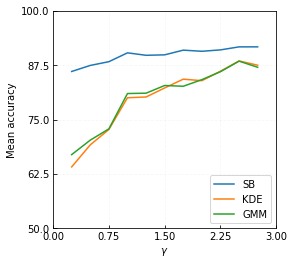

In [8]:
def experiment_sweep_prob_scale():
    """
    Evaluates the effect of the size of the relaxation relative to the 
    real hidden feasible set. If the relaxation is tighter, then the MCMC-based
    classifier works well (and often better than the alternative). However,
    if the relaxation is loose, then the MCMC does not work well. This makes
    sense, if you have a loose relaxation, there is lots of space to generate a
    separation so you are more likely to build a weaker barrier. The KDE-based
    approach does not use the relaxation at all, so it is always consistent.
    """
    mcmc = []
    kde = []
    gmm = []
    results = []
    params = {
        'n': 2,
        'n_runs': 50,
        'n_samples': 200,
        'size': -5,
        'test_n_samples': 200,
        'use_pca': False,
        'pca_n_components': 0.99,
        'verbose': False,
    }
    og_scales = [0.05, 0.1, 0.15, 0.2, 0.25, 0.3, 0.35, 0.4, 0.45, 0.5, 0.55]
    scales = [ x * np.abs(params['size']) for x in og_scales ]
    # pprint(scales)
    for scale in scales:
        print('*'*80)
        print('\tScale = {}'.format(scale))
        print('*'*80)
        params['scale'] = scale
        summary = experiment_n_tries(params)
        mcmc.append(100 * summary['mcmc_acc'])
        kde.append(100 * summary['kde_acc'])
        gmm.append(100 * summary['gmm_acc'])
        results.append({
            'scale': scale,
            'mcmc_acc': summary['mcmc_acc'],
            'kde_acc': summary['kde_acc'],
            'gmm_acc': summary['gmm_acc'],
        })
    # scales = [ 1 + x for x in scales ]
    df = pd.DataFrame(results)
    df.to_csv('experiment_sweep_prob_scale.csv')
    pprint(df)
    
    fig, ax = plt.subplots(figsize=(4, 4))
    ax.plot(scales, mcmc, label='SB')
    ax.plot(scales, kde, label='KDE')
    ax.plot(scales, gmm, label='GMM')
    ax.tick_params(direction='in')
    ax.grid(True, ls='--', alpha=0.1)
    ax.set(
        xlabel='$\gamma$', 
        ylabel='Mean accuracy', 
        #xlim=(0, .6),
        #xticks=[0, .15, .3, .45, .6],
        xlim=(0, 3),
        xticks=[0, .75, 1.5, 2.25, 3],
        ylim=(50, 100),
        yticks=[50, 62.5, 75, 87.5, 100],
    )
    ax.legend(loc='lower right')
    save_settings = {
        'bbox_inches': 'tight',
        'dpi': 300,
    }
    fig.savefig(
        'img/sweep_prob_scale_5.png',
        **save_settings,
    )
    fig.savefig(
        'img/sweep_prob_scale_5.eps',
        **save_settings,
    )

experiment_sweep_prob_scale()

In [ ]:
def experiment_sweep_hidden_poly_size():
    """
    Evaluates the effect of the size of the hidden feasible set. This is
    more for personal interest. We fix the size of the relaxation relative
    to the hidden set and scale the hidden set. We should observe that the 
    MCMC-classifier has a fixed performance, but the KDE-classifier perhaps
    gets better as we increase size? Let's just fix scale at 1?
    """
    mcmc = []
    kde = []
    gmm = []
    results = []
    params = {
        'n': 2,
        'n_runs': 50,
        'n_samples': 200,
        'test_n_samples': 200,
        'use_pca': False,
        'pca_n_components': 0.99,
        'verbose': False,
    }
    sizes = [-0.5, -1, -5, -10, -50, -100, -500]

    for size in sizes:
        print('*'*80)
        print('Size = {}'.format(size))
        print('*'*80)
        params['size'] = size
        params['scale'] = np.abs(size) * 0.1
        summary = experiment_n_tries(params)
        mcmc.append(100 * summary['mcmc_acc'])
        kde.append(100 * summary['kde_acc'])
        gmm.append(100 * summary['gmm_acc'])
        results.append({
            'size': size,
            'mcmc_acc': summary['mcmc_acc'],
            'kde_acc': summary['kde_acc'],
            'gmm_acc': summary['gmm_acc'],
        })
    sizes = [ np.abs(x) for x in sizes ]
    df = pd.DataFrame(results)
    pprint(df)
    df.to_csv('experiment_sweep_hidden_poly_size.csv')

    
    
    fig, ax = plt.subplots(figsize=(4, 4))
    ax.semilogx(sizes, mcmc, label='SB')
    ax.semilogx(sizes, kde, label='KDE')
    ax.semilogx(sizes, gmm, label='GMM')
    ax.tick_params(direction='in')
    ax.grid(True, ls='--', alpha=0.1)
    ax.set(
        xlabel='Size of hidden set', 
        ylabel='Mean accuracy', 
        xlim=(0.1, 1000),
        xticks=[0.1, 1, 10, 100, 1000],
        ylim=(50, 100),
        yticks=[50, 62.5, 75, 87.5, 100],
    )
    ax.legend(loc='lower right')
    save_settings = {
        'bbox_inches': 'tight',
        'dpi': 300,
    }
    fig.savefig(
        'img/sweep_hidden_poly_size.png',
        **save_settings,
    )
    fig.savefig(
        'img/sweep_hidden_poly_size.eps',
        **save_settings,
    )
# experiment_sweep_hidden_poly_size()



100%|██████████| 5/5 [00:00<00:00, 71.00it/s]

100%|██████████| 6/6 [00:00<00:00, 2835.59it/s]

  0%|          | 0/200 [00:00<?, ?it/s]

********************************************************************************
Samples = 5
********************************************************************************
Generated 6 feasible and 6 infeasible for training.



100%|██████████| 200/200 [00:02<00:00, 70.23it/s]

100%|█████████▉| 199/200 [00:25<00:00,  7.90it/s]
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:542: FutureWarning: From version 0.22, errors during fit will result in a cross validation score of NaN by default. Use error_score='raise' if you want an exception raised or error_score=np.nan to adopt the behavior from version 0.22.
  FutureWarning)
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:542: FutureWarning: From version 0.22, errors during fit will result in a cross validation score of NaN by default. Use error_score='raise' if you want an exception raised or error_score=np.nan to adopt the behavior from version 0.22.
  FutureWarning)

100%|██████████| 5/5 [00:00<00:00, 70.84it/s]

100%|██████████| 6/6 [00:00<00:00, 3060.05it/s]


Generated 202 feasible and 199 infeasible pts for testing.
Run [1, 0] - 	Scores:	GMM:0.678	KDE:0.713	MCMC:0.696
Generated 6 feasible and 6 infeasible for training.



100%|██████████| 200/200 [00:02<00:00, 70.78it/s]

100%|█████████▉| 199/200 [00:04<00:00, 43.34it/s]
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:542: FutureWarning: From version 0.22, errors during fit will result in a cross validation score of NaN by default. Use error_score='raise' if you want an exception raised or error_score=np.nan to adopt the behavior from version 0.22.
  FutureWarning)
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:542: FutureWarning: From version 0.22, errors during fit will result in a cross validation score of NaN by default. Use error_score='raise' if you want an exception raised or error_score=np.nan to adopt the behavior from version 0.22.
  FutureWarning)

100%|██████████| 5/5 [00:00<00:00, 70.61it/s]

100%|██████████| 6/6 [00:00<00:00, 3030.57it/s]

  0%|          | 0/200 [00:00<?, ?it/s]

Generated 201 feasible and 200 infeasible pts for testing.
Run [2, 0] - 	Scores:	GMM:0.601	KDE:0.688	MCMC:0.683
Generated 6 feasible and 6 infeasible for training.



100%|██████████| 200/200 [00:02<00:00, 68.59it/s]

100%|█████████▉| 199/200 [00:06<00:00, 30.14it/s]
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:542: FutureWarning: From version 0.22, errors during fit will result in a cross validation score of NaN by default. Use error_score='raise' if you want an exception raised or error_score=np.nan to adopt the behavior from version 0.22.
  FutureWarning)
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:542: FutureWarning: From version 0.22, errors during fit will result in a cross validation score of NaN by default. Use error_score='raise' if you want an exception raised or error_score=np.nan to adopt the behavior from version 0.22.
  FutureWarning)

100%|██████████| 5/5 [00:00<00:00, 70.09it/s]

100%|██████████| 6/6 [00:00<00:00, 2560.89it/s]

  0%|          | 0/200 [00:00<?, ?it/s]

Generated 201 feasible and 200 infeasible pts for testing.
Run [3, 0] - 	Scores:	GMM:0.631	KDE:0.656	MCMC:0.706
Generated 6 feasible and 6 infeasible for training.



100%|██████████| 200/200 [00:02<00:00, 69.48it/s]

100%|█████████▉| 199/200 [00:09<00:00, 21.67it/s]
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:542: FutureWarning: From version 0.22, errors during fit will result in a cross validation score of NaN by default. Use error_score='raise' if you want an exception raised or error_score=np.nan to adopt the behavior from version 0.22.
  FutureWarning)
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:542: FutureWarning: From version 0.22, errors during fit will result in a cross validation score of NaN by default. Use error_score='raise' if you want an exception raised or error_score=np.nan to adopt the behavior from version 0.22.
  FutureWarning)

100%|██████████| 5/5 [00:00<00:00, 74.37it/s]

100%|██████████| 6/6 [00:00<00:00, 3230.94it/s]

  0%|          | 0/200 [00:00<?, ?it/s]

Generated 201 feasible and 200 infeasible pts for testing.
Run [4, 0] - 	Scores:	GMM:0.509	KDE:0.529	MCMC:0.459
Generated 6 feasible and 6 infeasible for training.



100%|██████████| 200/200 [00:03<00:00, 62.11it/s]

100%|█████████▉| 199/200 [00:08<00:00, 24.66it/s]
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:542: FutureWarning: From version 0.22, errors during fit will result in a cross validation score of NaN by default. Use error_score='raise' if you want an exception raised or error_score=np.nan to adopt the behavior from version 0.22.
  FutureWarning)
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:542: FutureWarning: From version 0.22, errors during fit will result in a cross validation score of NaN by default. Use error_score='raise' if you want an exception raised or error_score=np.nan to adopt the behavior from version 0.22.
  FutureWarning)

100%|██████████| 5/5 [00:00<00:00, 74.37it/s]

100%|██████████| 6/6 [00:00<00:00, 2235.57it/s]

  0%|          | 0/200 [00:00<?, ?it/s]

Generated 201 feasible and 200 infeasible pts for testing.
Run [5, 0] - 	Scores:	GMM:0.723	KDE:0.676	MCMC:0.706
Generated 6 feasible and 6 infeasible for training.



100%|██████████| 200/200 [00:02<00:00, 70.37it/s]

100%|█████████▉| 199/200 [00:06<00:00, 32.55it/s]
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:542: FutureWarning: From version 0.22, errors during fit will result in a cross validation score of NaN by default. Use error_score='raise' if you want an exception raised or error_score=np.nan to adopt the behavior from version 0.22.
  FutureWarning)
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:542: FutureWarning: From version 0.22, errors during fit will result in a cross validation score of NaN by default. Use error_score='raise' if you want an exception raised or error_score=np.nan to adopt the behavior from version 0.22.
  FutureWarning)

100%|██████████| 5/5 [00:00<00:00, 72.27it/s]

100%|██████████| 6/6 [00:00<00:00, 2674.94it/s]

  0%|          | 0/200 [00:00<?, ?it/s]

Generated 201 feasible and 200 infeasible pts for testing.
Run [6, 0] - 	Scores:	GMM:0.556	KDE:0.566	MCMC:0.499
Generated 6 feasible and 6 infeasible for training.



100%|██████████| 200/200 [00:02<00:00, 68.28it/s]

 10%|█         | 20/200 [02:19<20:52,  6.96s/it]

100%|██████████| 5/5 [00:00<00:00, 73.84it/s]

100%|██████████| 6/6 [00:00<00:00, 3685.68it/s]

  0%|          | 0/200 [00:00<?, ?it/s]

Sampled 21 points instead of 100.0
Generated 6 feasible and 6 infeasible for training.



100%|██████████| 200/200 [00:02<00:00, 70.27it/s]

100%|█████████▉| 199/200 [00:04<00:00, 40.11it/s]
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:542: FutureWarning: From version 0.22, errors during fit will result in a cross validation score of NaN by default. Use error_score='raise' if you want an exception raised or error_score=np.nan to adopt the behavior from version 0.22.
  FutureWarning)
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:542: FutureWarning: From version 0.22, errors during fit will result in a cross validation score of NaN by default. Use error_score='raise' if you want an exception raised or error_score=np.nan to adopt the behavior from version 0.22.
  FutureWarning)

100%|██████████| 5/5 [00:00<00:00, 72.83it/s]

100%|██████████| 6/6 [00:00<00:00, 2340.14it/s]

  0%|          | 0/200 [00:00<?, ?it/s]

Generated 201 feasible and 200 infeasible pts for testing.
Run [7, 1] - 	Scores:	GMM:0.708	KDE:0.651	MCMC:0.611
Generated 6 feasible and 6 infeasible for training.



100%|██████████| 200/200 [00:02<00:00, 70.23it/s]

100%|█████████▉| 199/200 [00:06<00:00, 29.78it/s]
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:542: FutureWarning: From version 0.22, errors during fit will result in a cross validation score of NaN by default. Use error_score='raise' if you want an exception raised or error_score=np.nan to adopt the behavior from version 0.22.
  FutureWarning)
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:542: FutureWarning: From version 0.22, errors during fit will result in a cross validation score of NaN by default. Use error_score='raise' if you want an exception raised or error_score=np.nan to adopt the behavior from version 0.22.
  FutureWarning)

100%|██████████| 5/5 [00:00<00:00, 72.63it/s]

100%|██████████| 6/6 [00:00<00:00, 2798.07it/s]

  0%|          | 0/200 [00:00<?, ?it/s]

Generated 201 feasible and 200 infeasible pts for testing.
Run [8, 1] - 	Scores:	GMM:0.713	KDE:0.628	MCMC:0.628
Generated 6 feasible and 6 infeasible for training.



100%|██████████| 200/200 [00:02<00:00, 68.89it/s]

100%|█████████▉| 199/200 [00:08<00:00, 23.88it/s]
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:542: FutureWarning: From version 0.22, errors during fit will result in a cross validation score of NaN by default. Use error_score='raise' if you want an exception raised or error_score=np.nan to adopt the behavior from version 0.22.
  FutureWarning)
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:542: FutureWarning: From version 0.22, errors during fit will result in a cross validation score of NaN by default. Use error_score='raise' if you want an exception raised or error_score=np.nan to adopt the behavior from version 0.22.
  FutureWarning)

100%|██████████| 5/5 [00:00<00:00, 72.88it/s]

100%|██████████| 6/6 [00:00<00:00, 2964.52it/s]

  0%|          | 0/200 [00:00<?, ?it/s]

Generated 201 feasible and 200 infeasible pts for testing.
Run [9, 1] - 	Scores:	GMM:0.509	KDE:0.529	MCMC:0.496
Generated 6 feasible and 6 infeasible for training.



100%|██████████| 200/200 [00:02<00:00, 69.10it/s]

100%|█████████▉| 199/200 [00:19<00:00, 10.24it/s]
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:542: FutureWarning: From version 0.22, errors during fit will result in a cross validation score of NaN by default. Use error_score='raise' if you want an exception raised or error_score=np.nan to adopt the behavior from version 0.22.
  FutureWarning)
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:542: FutureWarning: From version 0.22, errors during fit will result in a cross validation score of NaN by default. Use error_score='raise' if you want an exception raised or error_score=np.nan to adopt the behavior from version 0.22.
  FutureWarning)

100%|██████████| 5/5 [00:00<00:00, 70.83it/s]

100%|██████████| 6/6 [00:00<00:00, 2914.06it/s]

  0%|          | 0/200 [00:00<?, ?it/s]

Generated 201 feasible and 200 infeasible pts for testing.
Run [10, 1] - 	Scores:	GMM:0.636	KDE:0.554	MCMC:0.546
Generated 6 feasible and 6 infeasible for training.



100%|██████████| 200/200 [00:02<00:00, 68.97it/s]

100%|█████████▉| 199/200 [00:05<00:00, 34.54it/s]
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:542: FutureWarning: From version 0.22, errors during fit will result in a cross validation score of NaN by default. Use error_score='raise' if you want an exception raised or error_score=np.nan to adopt the behavior from version 0.22.
  FutureWarning)
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:542: FutureWarning: From version 0.22, errors during fit will result in a cross validation score of NaN by default. Use error_score='raise' if you want an exception raised or error_score=np.nan to adopt the behavior from version 0.22.
  FutureWarning)

  0%|          | 0/5 [00:00<?, ?it/s]

Generated 201 feasible and 200 infeasible pts for testing.
Run [11, 1] - 	Scores:	GMM:0.566	KDE:0.564	MCMC:0.514


100%|██████████| 5/5 [00:00<00:00, 59.29it/s]

100%|██████████| 6/6 [00:00<00:00, 2860.08it/s]

  4%|▍         | 8/200 [00:00<00:02, 70.78it/s]

Generated 6 feasible and 6 infeasible for training.



100%|██████████| 200/200 [00:03<00:00, 59.00it/s]

100%|█████████▉| 199/200 [00:15<00:00, 12.45it/s]
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:542: FutureWarning: From version 0.22, errors during fit will result in a cross validation score of NaN by default. Use error_score='raise' if you want an exception raised or error_score=np.nan to adopt the behavior from version 0.22.
  FutureWarning)
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:542: FutureWarning: From version 0.22, errors during fit will result in a cross validation score of NaN by default. Use error_score='raise' if you want an exception raised or error_score=np.nan to adopt the behavior from version 0.22.
  FutureWarning)

100%|██████████| 5/5 [00:00<00:00, 72.42it/s]

100%|██████████| 6/6 [00:00<00:00, 2242.94it/s]



Generated 201 feasible and 200 infeasible pts for testing.
Run [12, 1] - 	Scores:	GMM:0.621	KDE:0.586	MCMC:0.554
Generated 6 feasible and 6 infeasible for training.


100%|██████████| 200/200 [00:02<00:00, 67.79it/s]

100%|█████████▉| 199/200 [00:08<00:00, 24.34it/s]
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:542: FutureWarning: From version 0.22, errors during fit will result in a cross validation score of NaN by default. Use error_score='raise' if you want an exception raised or error_score=np.nan to adopt the behavior from version 0.22.
  FutureWarning)
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:542: FutureWarning: From version 0.22, errors during fit will result in a cross validation score of NaN by default. Use error_score='raise' if you want an exception raised or error_score=np.nan to adopt the behavior from version 0.22.
  FutureWarning)

100%|██████████| 5/5 [00:00<00:00, 71.64it/s]

100%|██████████| 6/6 [00:00<00:00, 2982.09it/s]

  0%|          | 0/200 [00:00<?, ?it/s]

Generated 201 feasible and 200 infeasible pts for testing.
Run [13, 1] - 	Scores:	GMM:0.733	KDE:0.706	MCMC:0.718
Generated 6 feasible and 6 infeasible for training.



100%|██████████| 200/200 [00:02<00:00, 67.35it/s]

100%|█████████▉| 199/200 [00:26<00:00,  7.43it/s]
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:542: FutureWarning: From version 0.22, errors during fit will result in a cross validation score of NaN by default. Use error_score='raise' if you want an exception raised or error_score=np.nan to adopt the behavior from version 0.22.
  FutureWarning)
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:542: FutureWarning: From version 0.22, errors during fit will result in a cross validation score of NaN by default. Use error_score='raise' if you want an exception raised or error_score=np.nan to adopt the behavior from version 0.22.
  FutureWarning)

  0%|          | 0/5 [00:00<?, ?it/s]

Generated 201 feasible and 200 infeasible pts for testing.
Run [14, 1] - 	Scores:	GMM:0.611	KDE:0.509	MCMC:0.658


100%|██████████| 5/5 [00:00<00:00, 63.68it/s]

100%|██████████| 6/6 [00:00<00:00, 3257.29it/s]

  4%|▎         | 7/200 [00:00<00:03, 59.46it/s]

Generated 6 feasible and 6 infeasible for training.



100%|██████████| 200/200 [00:03<00:00, 63.49it/s]

100%|█████████▉| 199/200 [00:12<00:00, 15.71it/s]
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:542: FutureWarning: From version 0.22, errors during fit will result in a cross validation score of NaN by default. Use error_score='raise' if you want an exception raised or error_score=np.nan to adopt the behavior from version 0.22.
  FutureWarning)
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:542: FutureWarning: From version 0.22, errors during fit will result in a cross validation score of NaN by default. Use error_score='raise' if you want an exception raised or error_score=np.nan to adopt the behavior from version 0.22.
  FutureWarning)

100%|██████████| 5/5 [00:00<00:00, 70.51it/s]

100%|██████████| 6/6 [00:00<00:00, 2488.46it/s]

  0%|          | 0/200 [00:00<?, ?it/s]

Generated 201 feasible and 200 infeasible pts for testing.
Run [15, 1] - 	Scores:	GMM:0.534	KDE:0.601	MCMC:0.574
Generated 6 feasible and 6 infeasible for training.



100%|██████████| 200/200 [00:02<00:00, 70.41it/s]

100%|█████████▉| 199/200 [00:04<00:00, 44.04it/s]
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:542: FutureWarning: From version 0.22, errors during fit will result in a cross validation score of NaN by default. Use error_score='raise' if you want an exception raised or error_score=np.nan to adopt the behavior from version 0.22.
  FutureWarning)
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:542: FutureWarning: From version 0.22, errors during fit will result in a cross validation score of NaN by default. Use error_score='raise' if you want an exception raised or error_score=np.nan to adopt the behavior from version 0.22.
  FutureWarning)

100%|██████████| 5/5 [00:00<00:00, 67.45it/s]

100%|██████████| 6/6 [00:00<00:00, 2481.59it/s]

  0%|          | 0/200 [00:00<?, ?it/s]

Generated 201 feasible and 200 infeasible pts for testing.
Run [16, 1] - 	Scores:	GMM:0.536	KDE:0.638	MCMC:0.521
Generated 6 feasible and 6 infeasible for training.



100%|██████████| 200/200 [00:02<00:00, 71.12it/s]

100%|█████████▉| 199/200 [00:14<00:00, 13.95it/s]
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:542: FutureWarning: From version 0.22, errors during fit will result in a cross validation score of NaN by default. Use error_score='raise' if you want an exception raised or error_score=np.nan to adopt the behavior from version 0.22.
  FutureWarning)
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:542: FutureWarning: From version 0.22, errors during fit will result in a cross validation score of NaN by default. Use error_score='raise' if you want an exception raised or error_score=np.nan to adopt the behavior from version 0.22.
  FutureWarning)

100%|██████████| 5/5 [00:00<00:00, 69.45it/s]

100%|██████████| 6/6 [00:00<00:00, 2489.20it/s]

  0%|          | 0/200 [00:00<?, ?it/s]

Generated 201 feasible and 200 infeasible pts for testing.
Run [17, 1] - 	Scores:	GMM:0.746	KDE:0.763	MCMC:0.663
Generated 6 feasible and 6 infeasible for training.



100%|██████████| 200/200 [00:02<00:00, 69.66it/s]

100%|█████████▉| 199/200 [00:16<00:00, 12.40it/s]
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:542: FutureWarning: From version 0.22, errors during fit will result in a cross validation score of NaN by default. Use error_score='raise' if you want an exception raised or error_score=np.nan to adopt the behavior from version 0.22.
  FutureWarning)
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:542: FutureWarning: From version 0.22, errors during fit will result in a cross validation score of NaN by default. Use error_score='raise' if you want an exception raised or error_score=np.nan to adopt the behavior from version 0.22.
  FutureWarning)

100%|██████████| 5/5 [00:00<00:00, 70.76it/s]

100%|██████████| 6/6 [00:00<00:00, 2360.33it/s]

  0%|          | 0/200 [00:00<?, ?it/s]

Generated 201 feasible and 200 infeasible pts for testing.
Run [18, 1] - 	Scores:	GMM:0.569	KDE:0.566	MCMC:0.641
Generated 6 feasible and 6 infeasible for training.



100%|██████████| 200/200 [00:03<00:00, 64.32it/s]

100%|█████████▉| 199/200 [00:17<00:00, 11.08it/s]
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:542: FutureWarning: From version 0.22, errors during fit will result in a cross validation score of NaN by default. Use error_score='raise' if you want an exception raised or error_score=np.nan to adopt the behavior from version 0.22.
  FutureWarning)
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:542: FutureWarning: From version 0.22, errors during fit will result in a cross validation score of NaN by default. Use error_score='raise' if you want an exception raised or error_score=np.nan to adopt the behavior from version 0.22.
  FutureWarning)

100%|██████████| 5/5 [00:00<00:00, 71.03it/s]

100%|██████████| 6/6 [00:00<00:00, 3247.20it/s]

  0%|          | 0/200 [00:00<?, ?it/s]

Generated 201 feasible and 200 infeasible pts for testing.
Run [19, 1] - 	Scores:	GMM:0.756	KDE:0.758	MCMC:0.643
Generated 6 feasible and 6 infeasible for training.



100%|██████████| 200/200 [00:02<00:00, 70.19it/s]

100%|█████████▉| 199/200 [00:04<00:00, 42.12it/s]
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:542: FutureWarning: From version 0.22, errors during fit will result in a cross validation score of NaN by default. Use error_score='raise' if you want an exception raised or error_score=np.nan to adopt the behavior from version 0.22.
  FutureWarning)
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:542: FutureWarning: From version 0.22, errors during fit will result in a cross validation score of NaN by default. Use error_score='raise' if you want an exception raised or error_score=np.nan to adopt the behavior from version 0.22.
  FutureWarning)

100%|██████████| 5/5 [00:00<00:00, 72.26it/s]

100%|██████████| 6/6 [00:00<00:00, 2762.44it/s]

  0%|          | 0/200 [00:00<?, ?it/s]

Generated 201 feasible and 200 infeasible pts for testing.
Run [20, 1] - 	Scores:	GMM:0.803	KDE:0.728	MCMC:0.676
Generated 6 feasible and 6 infeasible for training.



100%|██████████| 200/200 [00:02<00:00, 66.89it/s]

100%|█████████▉| 199/200 [00:19<00:00, 10.17it/s]
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:542: FutureWarning: From version 0.22, errors during fit will result in a cross validation score of NaN by default. Use error_score='raise' if you want an exception raised or error_score=np.nan to adopt the behavior from version 0.22.
  FutureWarning)
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:542: FutureWarning: From version 0.22, errors during fit will result in a cross validation score of NaN by default. Use error_score='raise' if you want an exception raised or error_score=np.nan to adopt the behavior from version 0.22.
  FutureWarning)

100%|██████████| 5/5 [00:00<00:00, 67.22it/s]

100%|██████████| 6/6 [00:00<00:00, 2496.11it/s]

  0%|          | 0/200 [00:00<?, ?it/s]

Generated 201 feasible and 200 infeasible pts for testing.
Run [21, 1] - 	Scores:	GMM:0.504	KDE:0.509	MCMC:0.628
Generated 6 feasible and 6 infeasible for training.



100%|██████████| 200/200 [00:02<00:00, 69.80it/s]

100%|█████████▉| 199/200 [00:07<00:00, 26.61it/s]
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:542: FutureWarning: From version 0.22, errors during fit will result in a cross validation score of NaN by default. Use error_score='raise' if you want an exception raised or error_score=np.nan to adopt the behavior from version 0.22.
  FutureWarning)
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:542: FutureWarning: From version 0.22, errors during fit will result in a cross validation score of NaN by default. Use error_score='raise' if you want an exception raised or error_score=np.nan to adopt the behavior from version 0.22.
  FutureWarning)

100%|██████████| 5/5 [00:00<00:00, 71.83it/s]

100%|██████████| 6/6 [00:00<00:00, 3543.98it/s]


Generated 201 feasible and 200 infeasible pts for testing.
Run [22, 1] - 	Scores:	GMM:0.691	KDE:0.723	MCMC:0.688
Generated 6 feasible and 6 infeasible for training.



100%|██████████| 200/200 [00:02<00:00, 70.55it/s]

100%|█████████▉| 199/200 [00:07<00:00, 26.02it/s]
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:542: FutureWarning: From version 0.22, errors during fit will result in a cross validation score of NaN by default. Use error_score='raise' if you want an exception raised or error_score=np.nan to adopt the behavior from version 0.22.
  FutureWarning)
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:542: FutureWarning: From version 0.22, errors during fit will result in a cross validation score of NaN by default. Use error_score='raise' if you want an exception raised or error_score=np.nan to adopt the behavior from version 0.22.
  FutureWarning)

100%|██████████| 5/5 [00:00<00:00, 73.44it/s]

100%|██████████| 6/6 [00:00<00:00, 2903.97it/s]

  0%|          | 0/200 [00:00<?, ?it/s]

Generated 201 feasible and 200 infeasible pts for testing.
Run [23, 1] - 	Scores:	GMM:0.579	KDE:0.603	MCMC:0.559
Generated 6 feasible and 6 infeasible for training.



100%|██████████| 200/200 [00:02<00:00, 69.90it/s]

100%|█████████▉| 199/200 [00:32<00:00,  6.22it/s]
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:542: FutureWarning: From version 0.22, errors during fit will result in a cross validation score of NaN by default. Use error_score='raise' if you want an exception raised or error_score=np.nan to adopt the behavior from version 0.22.
  FutureWarning)
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:542: FutureWarning: From version 0.22, errors during fit will result in a cross validation score of NaN by default. Use error_score='raise' if you want an exception raised or error_score=np.nan to adopt the behavior from version 0.22.
  FutureWarning)

100%|██████████| 5/5 [00:00<00:00, 73.12it/s]

100%|██████████| 6/6 [00:00<00:00, 2916.76it/s]

  0%|          | 0/200 [00:00<?, ?it/s]

Generated 201 feasible and 200 infeasible pts for testing.
Run [24, 1] - 	Scores:	GMM:0.566	KDE:0.608	MCMC:0.579
Generated 6 feasible and 6 infeasible for training.



100%|██████████| 200/200 [00:02<00:00, 69.91it/s]

100%|█████████▉| 199/200 [00:06<00:00, 30.92it/s]
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:542: FutureWarning: From version 0.22, errors during fit will result in a cross validation score of NaN by default. Use error_score='raise' if you want an exception raised or error_score=np.nan to adopt the behavior from version 0.22.
  FutureWarning)
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:542: FutureWarning: From version 0.22, errors during fit will result in a cross validation score of NaN by default. Use error_score='raise' if you want an exception raised or error_score=np.nan to adopt the behavior from version 0.22.
  FutureWarning)

100%|██████████| 5/5 [00:00<00:00, 67.60it/s]

100%|██████████| 6/6 [00:00<00:00, 3318.72it/s]

  0%|          | 0/200 [00:00<?, ?it/s]

Generated 201 feasible and 200 infeasible pts for testing.
Run [25, 1] - 	Scores:	GMM:0.636	KDE:0.696	MCMC:0.676
Generated 6 feasible and 6 infeasible for training.



100%|██████████| 200/200 [00:02<00:00, 70.60it/s]

100%|█████████▉| 199/200 [00:04<00:00, 47.33it/s]
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:542: FutureWarning: From version 0.22, errors during fit will result in a cross validation score of NaN by default. Use error_score='raise' if you want an exception raised or error_score=np.nan to adopt the behavior from version 0.22.
  FutureWarning)
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:542: FutureWarning: From version 0.22, errors during fit will result in a cross validation score of NaN by default. Use error_score='raise' if you want an exception raised or error_score=np.nan to adopt the behavior from version 0.22.
  FutureWarning)

100%|██████████| 5/5 [00:00<00:00, 70.38it/s]

100%|██████████| 6/6 [00:00<00:00, 1408.90it/s]

  0%|          | 0/200 [00:00<?, ?it/s]

Generated 201 feasible and 200 infeasible pts for testing.
Run [26, 1] - 	Scores:	GMM:0.693	KDE:0.681	MCMC:0.601
Generated 6 feasible and 6 infeasible for training.



100%|██████████| 200/200 [00:02<00:00, 69.49it/s]

100%|█████████▉| 199/200 [00:41<00:00,  4.77it/s]
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:542: FutureWarning: From version 0.22, errors during fit will result in a cross validation score of NaN by default. Use error_score='raise' if you want an exception raised or error_score=np.nan to adopt the behavior from version 0.22.
  FutureWarning)
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:542: FutureWarning: From version 0.22, errors during fit will result in a cross validation score of NaN by default. Use error_score='raise' if you want an exception raised or error_score=np.nan to adopt the behavior from version 0.22.
  FutureWarning)



100%|██████████| 5/5 [00:00<00:00, 70.18it/s]

100%|██████████| 6/6 [00:00<00:00, 2908.34it/s]

Generated 201 feasible and 200 infeasible pts for testing.
Run [27, 1] - 	Scores:	GMM:0.536	KDE:0.556	MCMC:0.484
Generated 6 feasible and 6 infeasible for training.




100%|██████████| 200/200 [00:03<00:00, 66.22it/s]

100%|█████████▉| 199/200 [00:10<00:00, 19.84it/s]
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:542: FutureWarning: From version 0.22, errors during fit will result in a cross validation score of NaN by default. Use error_score='raise' if you want an exception raised or error_score=np.nan to adopt the behavior from version 0.22.
  FutureWarning)
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:542: FutureWarning: From version 0.22, errors during fit will result in a cross validation score of NaN by default. Use error_score='raise' if you want an exception raised or error_score=np.nan to adopt the behavior from version 0.22.
  FutureWarning)

100%|██████████| 5/5 [00:00<00:00, 74.17it/s]

100%|██████████| 6/6 [00:00<00:00, 3166.31it/s]

  0%|          | 0/200 [00:00<?, ?it/s]

Generated 201 feasible and 200 infeasible pts for testing.
Run [28, 1] - 	Scores:	GMM:0.519	KDE:0.504	MCMC:0.559
Generated 6 feasible and 6 infeasible for training.



100%|██████████| 200/200 [00:02<00:00, 70.60it/s]

  3%|▎         | 6/200 [02:20<1:15:52, 23.47s/it]

100%|██████████| 5/5 [00:00<00:00, 74.40it/s]

100%|██████████| 6/6 [00:00<00:00, 2662.21it/s]

  0%|          | 0/200 [00:00<?, ?it/s]

Sampled 7 points instead of 100.0
Generated 6 feasible and 6 infeasible for training.



100%|██████████| 200/200 [00:02<00:00, 70.73it/s]

100%|█████████▉| 199/200 [00:17<00:00, 11.06it/s]
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:542: FutureWarning: From version 0.22, errors during fit will result in a cross validation score of NaN by default. Use error_score='raise' if you want an exception raised or error_score=np.nan to adopt the behavior from version 0.22.
  FutureWarning)
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:542: FutureWarning: From version 0.22, errors during fit will result in a cross validation score of NaN by default. Use error_score='raise' if you want an exception raised or error_score=np.nan to adopt the behavior from version 0.22.
  FutureWarning)

100%|██████████| 5/5 [00:00<00:00, 64.24it/s]

100%|██████████| 6/6 [00:00<00:00, 2584.03it/s]

  0%|          | 0/200 [00:00<?, ?it/s]

Generated 201 feasible and 200 infeasible pts for testing.
Run [29, 2] - 	Scores:	GMM:0.549	KDE:0.534	MCMC:0.688
Generated 6 feasible and 6 infeasible for training.



100%|██████████| 200/200 [00:02<00:00, 69.69it/s]

100%|█████████▉| 199/200 [00:03<00:00, 51.78it/s]
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:542: FutureWarning: From version 0.22, errors during fit will result in a cross validation score of NaN by default. Use error_score='raise' if you want an exception raised or error_score=np.nan to adopt the behavior from version 0.22.
  FutureWarning)
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:542: FutureWarning: From version 0.22, errors during fit will result in a cross validation score of NaN by default. Use error_score='raise' if you want an exception raised or error_score=np.nan to adopt the behavior from version 0.22.
  FutureWarning)

100%|██████████| 5/5 [00:00<00:00, 72.31it/s]

100%|██████████| 6/6 [00:00<00:00, 2454.01it/s]

  0%|          | 0/200 [00:00<?, ?it/s]

Generated 201 feasible and 200 infeasible pts for testing.
Run [30, 2] - 	Scores:	GMM:0.82	KDE:0.81	MCMC:0.666
Generated 6 feasible and 6 infeasible for training.



100%|██████████| 200/200 [00:02<00:00, 70.26it/s]

100%|█████████▉| 199/200 [00:08<00:00, 22.36it/s]
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:542: FutureWarning: From version 0.22, errors during fit will result in a cross validation score of NaN by default. Use error_score='raise' if you want an exception raised or error_score=np.nan to adopt the behavior from version 0.22.
  FutureWarning)
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:542: FutureWarning: From version 0.22, errors during fit will result in a cross validation score of NaN by default. Use error_score='raise' if you want an exception raised or error_score=np.nan to adopt the behavior from version 0.22.
  FutureWarning)

100%|██████████| 5/5 [00:00<00:00, 68.63it/s]

100%|██████████| 6/6 [00:00<00:00, 2771.57it/s]

  0%|          | 0/200 [00:00<?, ?it/s]

Generated 201 feasible and 200 infeasible pts for testing.
Run [31, 2] - 	Scores:	GMM:0.521	KDE:0.526	MCMC:0.648
Generated 6 feasible and 6 infeasible for training.



100%|██████████| 200/200 [00:02<00:00, 69.43it/s]

100%|█████████▉| 199/200 [00:05<00:00, 37.97it/s]
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:542: FutureWarning: From version 0.22, errors during fit will result in a cross validation score of NaN by default. Use error_score='raise' if you want an exception raised or error_score=np.nan to adopt the behavior from version 0.22.
  FutureWarning)
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:542: FutureWarning: From version 0.22, errors during fit will result in a cross validation score of NaN by default. Use error_score='raise' if you want an exception raised or error_score=np.nan to adopt the behavior from version 0.22.
  FutureWarning)

100%|██████████| 5/5 [00:00<00:00, 69.64it/s]

100%|██████████| 6/6 [00:00<00:00, 2955.47it/s]

  0%|          | 0/200 [00:00<?, ?it/s]

Generated 201 feasible and 200 infeasible pts for testing.
Run [32, 2] - 	Scores:	GMM:0.646	KDE:0.636	MCMC:0.628
Generated 6 feasible and 6 infeasible for training.



100%|██████████| 200/200 [00:02<00:00, 68.96it/s]

 28%|██▊       | 55/200 [02:19<06:07,  2.53s/it]

100%|██████████| 5/5 [00:00<00:00, 65.62it/s]

100%|██████████| 6/6 [00:00<00:00, 3140.23it/s]

  0%|          | 0/200 [00:00<?, ?it/s]

Sampled 56 points instead of 100.0
Generated 6 feasible and 6 infeasible for training.



100%|██████████| 200/200 [00:02<00:00, 71.30it/s]

100%|█████████▉| 199/200 [00:05<00:00, 35.34it/s]
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:542: FutureWarning: From version 0.22, errors during fit will result in a cross validation score of NaN by default. Use error_score='raise' if you want an exception raised or error_score=np.nan to adopt the behavior from version 0.22.
  FutureWarning)
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:542: FutureWarning: From version 0.22, errors during fit will result in a cross validation score of NaN by default. Use error_score='raise' if you want an exception raised or error_score=np.nan to adopt the behavior from version 0.22.
  FutureWarning)

100%|██████████| 5/5 [00:00<00:00, 71.91it/s]

100%|██████████| 6/6 [00:00<00:00, 3102.30it/s]

  0%|          | 0/200 [00:00<?, ?it/s]

Generated 201 feasible and 200 infeasible pts for testing.
Run [33, 3] - 	Scores:	GMM:0.541	KDE:0.536	MCMC:0.506
Generated 6 feasible and 6 infeasible for training.



100%|██████████| 200/200 [00:02<00:00, 70.11it/s]

100%|█████████▉| 199/200 [00:10<00:00, 19.06it/s]
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:542: FutureWarning: From version 0.22, errors during fit will result in a cross validation score of NaN by default. Use error_score='raise' if you want an exception raised or error_score=np.nan to adopt the behavior from version 0.22.
  FutureWarning)
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:542: FutureWarning: From version 0.22, errors during fit will result in a cross validation score of NaN by default. Use error_score='raise' if you want an exception raised or error_score=np.nan to adopt the behavior from version 0.22.
  FutureWarning)

100%|██████████| 5/5 [00:00<00:00, 69.89it/s]

100%|██████████| 6/6 [00:00<00:00, 2594.95it/s]

  0%|          | 0/200 [00:00<?, ?it/s]

Generated 201 feasible and 200 infeasible pts for testing.
Run [34, 3] - 	Scores:	GMM:0.526	KDE:0.516	MCMC:0.514
Generated 6 feasible and 6 infeasible for training.



100%|██████████| 200/200 [00:02<00:00, 72.63it/s]

 80%|████████  | 161/200 [02:18<00:33,  1.16it/s]
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:542: FutureWarning: From version 0.22, errors during fit will result in a cross validation score of NaN by default. Use error_score='raise' if you want an exception raised or error_score=np.nan to adopt the behavior from version 0.22.
  FutureWarning)
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:542: FutureWarning: From version 0.22, errors during fit will result in a cross validation score of NaN by default. Use error_score='raise' if you want an exception raised or error_score=np.nan to adopt the behavior from version 0.22.
  FutureWarning)



100%|██████████| 5/5 [00:00<00:00, 60.97it/s]

100%|██████████| 6/6 [00:00<00:00, 2446.61it/s]



Generated 201 feasible and 162 infeasible pts for testing.
Run [35, 3] - 	Scores:	GMM:0.584	KDE:0.581	MCMC:0.796
Generated 6 feasible and 6 infeasible for training.


100%|██████████| 200/200 [00:02<00:00, 69.38it/s]

100%|█████████▉| 199/200 [00:12<00:00, 15.65it/s]
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:542: FutureWarning: From version 0.22, errors during fit will result in a cross validation score of NaN by default. Use error_score='raise' if you want an exception raised or error_score=np.nan to adopt the behavior from version 0.22.
  FutureWarning)
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:542: FutureWarning: From version 0.22, errors during fit will result in a cross validation score of NaN by default. Use error_score='raise' if you want an exception raised or error_score=np.nan to adopt the behavior from version 0.22.
  FutureWarning)

100%|██████████| 5/5 [00:00<00:00, 72.56it/s]

100%|██████████| 6/6 [00:00<00:00, 2545.60it/s]

  0%|          | 0/200 [00:00<?, ?it/s]

Generated 201 feasible and 200 infeasible pts for testing.
Run [36, 3] - 	Scores:	GMM:0.576	KDE:0.788	MCMC:0.736
Generated 6 feasible and 6 infeasible for training.



100%|██████████| 200/200 [00:02<00:00, 71.71it/s]

100%|█████████▉| 199/200 [00:03<00:00, 54.26it/s]
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:542: FutureWarning: From version 0.22, errors during fit will result in a cross validation score of NaN by default. Use error_score='raise' if you want an exception raised or error_score=np.nan to adopt the behavior from version 0.22.
  FutureWarning)
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:542: FutureWarning: From version 0.22, errors during fit will result in a cross validation score of NaN by default. Use error_score='raise' if you want an exception raised or error_score=np.nan to adopt the behavior from version 0.22.
  FutureWarning)

100%|██████████| 5/5 [00:00<00:00, 64.82it/s]

100%|██████████| 6/6 [00:00<00:00, 2570.30it/s]

  0%|          | 0/200 [00:00<?, ?it/s]

Generated 201 feasible and 200 infeasible pts for testing.
Run [37, 3] - 	Scores:	GMM:0.586	KDE:0.586	MCMC:0.691
Generated 6 feasible and 6 infeasible for training.



100%|██████████| 200/200 [00:02<00:00, 70.62it/s]

100%|█████████▉| 199/200 [00:04<00:00, 42.17it/s]
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:542: FutureWarning: From version 0.22, errors during fit will result in a cross validation score of NaN by default. Use error_score='raise' if you want an exception raised or error_score=np.nan to adopt the behavior from version 0.22.
  FutureWarning)
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:542: FutureWarning: From version 0.22, errors during fit will result in a cross validation score of NaN by default. Use error_score='raise' if you want an exception raised or error_score=np.nan to adopt the behavior from version 0.22.
  FutureWarning)

100%|██████████| 5/5 [00:00<00:00, 69.29it/s]

100%|██████████| 6/6 [00:00<00:00, 2152.03it/s]

  0%|          | 0/200 [00:00<?, ?it/s]

Generated 201 feasible and 200 infeasible pts for testing.
Run [38, 3] - 	Scores:	GMM:0.733	KDE:0.718	MCMC:0.643
Generated 6 feasible and 6 infeasible for training.



100%|██████████| 200/200 [00:02<00:00, 69.29it/s]

100%|█████████▉| 199/200 [00:05<00:00, 38.39it/s]
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:542: FutureWarning: From version 0.22, errors during fit will result in a cross validation score of NaN by default. Use error_score='raise' if you want an exception raised or error_score=np.nan to adopt the behavior from version 0.22.
  FutureWarning)
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:542: FutureWarning: From version 0.22, errors during fit will result in a cross validation score of NaN by default. Use error_score='raise' if you want an exception raised or error_score=np.nan to adopt the behavior from version 0.22.
  FutureWarning)

100%|██████████| 5/5 [00:00<00:00, 72.60it/s]

100%|██████████| 6/6 [00:00<00:00, 2666.72it/s]

  0%|          | 0/200 [00:00<?, ?it/s]

Generated 201 feasible and 200 infeasible pts for testing.
Run [39, 3] - 	Scores:	GMM:0.574	KDE:0.656	MCMC:0.666
Generated 6 feasible and 6 infeasible for training.



100%|██████████| 200/200 [00:02<00:00, 67.78it/s]

100%|█████████▉| 199/200 [00:09<00:00, 20.17it/s]
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:542: FutureWarning: From version 0.22, errors during fit will result in a cross validation score of NaN by default. Use error_score='raise' if you want an exception raised or error_score=np.nan to adopt the behavior from version 0.22.
  FutureWarning)
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:542: FutureWarning: From version 0.22, errors during fit will result in a cross validation score of NaN by default. Use error_score='raise' if you want an exception raised or error_score=np.nan to adopt the behavior from version 0.22.
  FutureWarning)

100%|██████████| 5/5 [00:00<00:00, 69.75it/s]

100%|██████████| 6/6 [00:00<00:00, 2456.16it/s]


Generated 201 feasible and 200 infeasible pts for testing.
Run [40, 3] - 	Scores:	GMM:0.594	KDE:0.566	MCMC:0.559
Generated 6 feasible and 6 infeasible for training.



100%|██████████| 200/200 [00:02<00:00, 66.89it/s]

100%|█████████▉| 199/200 [00:09<00:00, 21.45it/s]
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:542: FutureWarning: From version 0.22, errors during fit will result in a cross validation score of NaN by default. Use error_score='raise' if you want an exception raised or error_score=np.nan to adopt the behavior from version 0.22.
  FutureWarning)
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:542: FutureWarning: From version 0.22, errors during fit will result in a cross validation score of NaN by default. Use error_score='raise' if you want an exception raised or error_score=np.nan to adopt the behavior from version 0.22.
  FutureWarning)

100%|██████████| 5/5 [00:00<00:00, 67.59it/s]

100%|██████████| 6/6 [00:00<00:00, 1799.10it/s]

  0%|          | 0/200 [00:00<?, ?it/s]

Generated 201 feasible and 200 infeasible pts for testing.
Run [41, 3] - 	Scores:	GMM:0.554	KDE:0.683	MCMC:0.506
Generated 6 feasible and 6 infeasible for training.



100%|██████████| 200/200 [00:02<00:00, 70.48it/s]

100%|█████████▉| 199/200 [00:18<00:00, 10.81it/s]
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:542: FutureWarning: From version 0.22, errors during fit will result in a cross validation score of NaN by default. Use error_score='raise' if you want an exception raised or error_score=np.nan to adopt the behavior from version 0.22.
  FutureWarning)
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:542: FutureWarning: From version 0.22, errors during fit will result in a cross validation score of NaN by default. Use error_score='raise' if you want an exception raised or error_score=np.nan to adopt the behavior from version 0.22.
  FutureWarning)

100%|██████████| 5/5 [00:00<00:00, 63.61it/s]

100%|██████████| 6/6 [00:00<00:00, 3194.85it/s]

  0%|          | 0/200 [00:00<?, ?it/s]

Generated 201 feasible and 200 infeasible pts for testing.
Run [42, 3] - 	Scores:	GMM:0.564	KDE:0.571	MCMC:0.501
Generated 6 feasible and 6 infeasible for training.



100%|██████████| 200/200 [00:02<00:00, 71.12it/s]

100%|█████████▉| 199/200 [00:11<00:00, 17.00it/s]
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:542: FutureWarning: From version 0.22, errors during fit will result in a cross validation score of NaN by default. Use error_score='raise' if you want an exception raised or error_score=np.nan to adopt the behavior from version 0.22.
  FutureWarning)
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:542: FutureWarning: From version 0.22, errors during fit will result in a cross validation score of NaN by default. Use error_score='raise' if you want an exception raised or error_score=np.nan to adopt the behavior from version 0.22.
  FutureWarning)

100%|██████████| 5/5 [00:00<00:00, 64.43it/s]

100%|██████████| 6/6 [00:00<00:00, 2872.16it/s]

  0%|          | 0/200 [00:00<?, ?it/s]

Generated 201 feasible and 200 infeasible pts for testing.
Run [43, 3] - 	Scores:	GMM:0.763	KDE:0.746	MCMC:0.623
Generated 6 feasible and 6 infeasible for training.



100%|██████████| 200/200 [00:02<00:00, 69.76it/s]

100%|█████████▉| 199/200 [00:07<00:00, 26.34it/s]
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:542: FutureWarning: From version 0.22, errors during fit will result in a cross validation score of NaN by default. Use error_score='raise' if you want an exception raised or error_score=np.nan to adopt the behavior from version 0.22.
  FutureWarning)
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:542: FutureWarning: From version 0.22, errors during fit will result in a cross validation score of NaN by default. Use error_score='raise' if you want an exception raised or error_score=np.nan to adopt the behavior from version 0.22.
  FutureWarning)

100%|██████████| 5/5 [00:00<00:00, 73.86it/s]

100%|██████████| 6/6 [00:00<00:00, 2431.95it/s]

  0%|          | 0/200 [00:00<?, ?it/s]

Generated 201 feasible and 200 infeasible pts for testing.
Run [44, 3] - 	Scores:	GMM:0.678	KDE:0.748	MCMC:0.484
Generated 6 feasible and 6 infeasible for training.



100%|██████████| 200/200 [00:02<00:00, 71.53it/s]

100%|█████████▉| 199/200 [00:10<00:00, 18.43it/s]
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:542: FutureWarning: From version 0.22, errors during fit will result in a cross validation score of NaN by default. Use error_score='raise' if you want an exception raised or error_score=np.nan to adopt the behavior from version 0.22.
  FutureWarning)
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:542: FutureWarning: From version 0.22, errors during fit will result in a cross validation score of NaN by default. Use error_score='raise' if you want an exception raised or error_score=np.nan to adopt the behavior from version 0.22.
  FutureWarning)

100%|██████████| 5/5 [00:00<00:00, 68.71it/s]

100%|██████████| 6/6 [00:00<00:00, 2560.89it/s]

  0%|          | 0/200 [00:00<?, ?it/s]

Generated 201 feasible and 200 infeasible pts for testing.
Run [45, 3] - 	Scores:	GMM:0.579	KDE:0.594	MCMC:0.499
Generated 6 feasible and 6 infeasible for training.



100%|██████████| 200/200 [00:02<00:00, 71.08it/s]

100%|█████████▉| 199/200 [00:13<00:00, 15.02it/s]
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:542: FutureWarning: From version 0.22, errors during fit will result in a cross validation score of NaN by default. Use error_score='raise' if you want an exception raised or error_score=np.nan to adopt the behavior from version 0.22.
  FutureWarning)
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:542: FutureWarning: From version 0.22, errors during fit will result in a cross validation score of NaN by default. Use error_score='raise' if you want an exception raised or error_score=np.nan to adopt the behavior from version 0.22.
  FutureWarning)

100%|██████████| 5/5 [00:00<00:00, 74.11it/s]

100%|██████████| 6/6 [00:00<00:00, 2688.37it/s]

  0%|          | 0/200 [00:00<?, ?it/s]

Generated 201 feasible and 200 infeasible pts for testing.
Run [46, 3] - 	Scores:	GMM:0.726	KDE:0.681	MCMC:0.773
Generated 6 feasible and 6 infeasible for training.



100%|██████████| 200/200 [00:02<00:00, 71.44it/s]

100%|█████████▉| 199/200 [00:06<00:00, 33.09it/s]
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:542: FutureWarning: From version 0.22, errors during fit will result in a cross validation score of NaN by default. Use error_score='raise' if you want an exception raised or error_score=np.nan to adopt the behavior from version 0.22.
  FutureWarning)
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:542: FutureWarning: From version 0.22, errors during fit will result in a cross validation score of NaN by default. Use error_score='raise' if you want an exception raised or error_score=np.nan to adopt the behavior from version 0.22.
  FutureWarning)

100%|██████████| 5/5 [00:00<00:00, 55.79it/s]

100%|██████████| 6/6 [00:00<00:00, 2440.91it/s]



Generated 201 feasible and 200 infeasible pts for testing.
Run [47, 3] - 	Scores:	GMM:0.761	KDE:0.768	MCMC:0.686
Generated 6 feasible and 6 infeasible for training.


100%|██████████| 200/200 [00:02<00:00, 70.44it/s]

100%|█████████▉| 199/200 [00:15<00:00, 12.64it/s]
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:542: FutureWarning: From version 0.22, errors during fit will result in a cross validation score of NaN by default. Use error_score='raise' if you want an exception raised or error_score=np.nan to adopt the behavior from version 0.22.
  FutureWarning)
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:542: FutureWarning: From version 0.22, errors during fit will result in a cross validation score of NaN by default. Use error_score='raise' if you want an exception raised or error_score=np.nan to adopt the behavior from version 0.22.
  FutureWarning)

100%|██████████| 5/5 [00:00<00:00, 69.13it/s]

100%|██████████| 6/6 [00:00<00:00, 2631.86it/s]

  0%|          | 0/200 [00:00<?, ?it/s]

Generated 201 feasible and 200 infeasible pts for testing.
Run [48, 3] - 	Scores:	GMM:0.576	KDE:0.603	MCMC:0.534
Generated 6 feasible and 6 infeasible for training.



100%|██████████| 200/200 [00:02<00:00, 69.56it/s]

100%|█████████▉| 199/200 [00:04<00:00, 47.14it/s]
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:542: FutureWarning: From version 0.22, errors during fit will result in a cross validation score of NaN by default. Use error_score='raise' if you want an exception raised or error_score=np.nan to adopt the behavior from version 0.22.
  FutureWarning)
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:542: FutureWarning: From version 0.22, errors during fit will result in a cross validation score of NaN by default. Use error_score='raise' if you want an exception raised or error_score=np.nan to adopt the behavior from version 0.22.
  FutureWarning)

100%|██████████| 5/5 [00:00<00:00, 60.23it/s]

100%|██████████| 6/6 [00:00<00:00, 2936.50it/s]

  0%|          | 0/200 [00:00<?, ?it/s]

Generated 201 feasible and 200 infeasible pts for testing.
Run [49, 3] - 	Scores:	GMM:0.681	KDE:0.726	MCMC:0.85
Generated 6 feasible and 6 infeasible for training.



100%|██████████| 200/200 [00:02<00:00, 69.80it/s]

100%|█████████▉| 199/200 [00:14<00:00, 13.85it/s]
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:542: FutureWarning: From version 0.22, errors during fit will result in a cross validation score of NaN by default. Use error_score='raise' if you want an exception raised or error_score=np.nan to adopt the behavior from version 0.22.
  FutureWarning)
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:542: FutureWarning: From version 0.22, errors during fit will result in a cross validation score of NaN by default. Use error_score='raise' if you want an exception raised or error_score=np.nan to adopt the behavior from version 0.22.
  FutureWarning)

 70%|███████   | 7/10 [00:00<00:00, 66.11it/s]

Generated 201 feasible and 200 infeasible pts for testing.
Run [50, 3] - 	Scores:	GMM:0.541	KDE:0.546	MCMC:0.541
********************************************************************************
Samples = 10
********************************************************************************


100%|██████████| 10/10 [00:00<00:00, 66.63it/s]

100%|██████████| 11/11 [00:00<00:00, 2986.62it/s]

  4%|▍         | 8/200 [00:00<00:02, 75.01it/s]

Generated 11 feasible and 11 infeasible for training.



100%|██████████| 200/200 [00:02<00:00, 71.24it/s]

100%|█████████▉| 199/200 [00:08<00:00, 24.46it/s]
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:542: FutureWarning: From version 0.22, errors during fit will result in a cross validation score of NaN by default. Use error_score='raise' if you want an exception raised or error_score=np.nan to adopt the behavior from version 0.22.
  FutureWarning)
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:542: FutureWarning: From version 0.22, errors during fit will result in a cross validation score of NaN by default. Use error_score='raise' if you want an exception raised or error_score=np.na

Generated 201 feasible and 200 infeasible pts for testing.
Run [1, 0] - 	Scores:	GMM:0.721	KDE:0.636	MCMC:0.608



100%|██████████| 10/10 [00:00<00:00, 67.49it/s][A

100%|██████████| 11/11 [00:00<00:00, 2949.02it/s]

  4%|▍         | 8/200 [00:00<00:02, 72.05it/s]

Generated 11 feasible and 11 infeasible for training.



100%|██████████| 200/200 [00:02<00:00, 70.81it/s]

100%|█████████▉| 199/200 [00:06<00:00, 29.83it/s]
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:542: FutureWarning: From version 0.22, errors during fit will result in a cross validation score of NaN by default. Use error_score='raise' if you want an exception raised or error_score=np.nan to adopt the behavior from version 0.22.
  FutureWarning)
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:542: FutureWarning: From version 0.22, errors during fit will result in a cross validation score of NaN by default. Use error_score='raise' if you want an exception raised or error_score=np.na

Generated 201 feasible and 200 infeasible pts for testing.
Run [2, 0] - 	Scores:	GMM:0.618	KDE:0.606	MCMC:0.519



100%|██████████| 10/10 [00:00<00:00, 69.48it/s][A

100%|██████████| 11/11 [00:00<00:00, 2863.72it/s]

  4%|▍         | 8/200 [00:00<00:02, 75.06it/s]

Generated 11 feasible and 11 infeasible for training.



100%|██████████| 200/200 [00:02<00:00, 71.49it/s]

100%|█████████▉| 199/200 [00:40<00:00,  4.86it/s]
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:542: FutureWarning: From version 0.22, errors during fit will result in a cross validation score of NaN by default. Use error_score='raise' if you want an exception raised or error_score=np.nan to adopt the behavior from version 0.22.
  FutureWarning)
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:542: FutureWarning: From version 0.22, errors during fit will result in a cross validation score of NaN by default. Use error_score='raise' if you want an exception raised or error_score=np.na

  0%|          | 0/10 [00:00<?, ?it/s]

Generated 201 feasible and 200 infeasible pts for testing.
Run [3, 0] - 	Scores:	GMM:0.646	KDE:0.631	MCMC:0.81



100%|██████████| 10/10 [00:00<00:00, 64.79it/s][A

100%|██████████| 11/11 [00:00<00:00, 2824.10it/s]

  4%|▎         | 7/200 [00:00<00:02, 69.08it/s]

Generated 11 feasible and 11 infeasible for training.



100%|██████████| 200/200 [00:02<00:00, 70.51it/s]

100%|█████████▉| 199/200 [00:09<00:00, 20.08it/s]
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:542: FutureWarning: From version 0.22, errors during fit will result in a cross validation score of NaN by default. Use error_score='raise' if you want an exception raised or error_score=np.nan to adopt the behavior from version 0.22.
  FutureWarning)
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:542: FutureWarning: From version 0.22, errors during fit will result in a cross validation score of NaN by default. Use error_score='raise' if you want an exception raised or error_score=np.na

Generated 201 feasible and 200 infeasible pts for testing.
Run [4, 0] - 	Scores:	GMM:0.673	KDE:0.636	MCMC:0.678



100%|██████████| 10/10 [00:00<00:00, 68.25it/s][A

100%|██████████| 11/11 [00:00<00:00, 3223.01it/s]

  4%|▎         | 7/200 [00:00<00:02, 68.29it/s]

Generated 11 feasible and 11 infeasible for training.



100%|██████████| 200/200 [00:02<00:00, 70.94it/s]

100%|█████████▉| 199/200 [00:04<00:00, 48.06it/s]
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:542: FutureWarning: From version 0.22, errors during fit will result in a cross validation score of NaN by default. Use error_score='raise' if you want an exception raised or error_score=np.nan to adopt the behavior from version 0.22.
  FutureWarning)
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:542: FutureWarning: From version 0.22, errors during fit will result in a cross validation score of NaN by default. Use error_score='raise' if you want an exception raised or error_score=np.na

Generated 201 feasible and 200 infeasible pts for testing.
Run [5, 0] - 	Scores:	GMM:0.736	KDE:0.718	MCMC:0.721



100%|██████████| 10/10 [00:00<00:00, 65.05it/s][A

100%|██████████| 11/11 [00:00<00:00, 2710.61it/s]

  4%|▍         | 8/200 [00:00<00:02, 71.60it/s]

Generated 11 feasible and 11 infeasible for training.



100%|██████████| 200/200 [00:03<00:00, 62.71it/s]

100%|█████████▉| 199/200 [00:03<00:00, 51.35it/s]
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:542: FutureWarning: From version 0.22, errors during fit will result in a cross validation score of NaN by default. Use error_score='raise' if you want an exception raised or error_score=np.nan to adopt the behavior from version 0.22.
  FutureWarning)
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:542: FutureWarning: From version 0.22, errors during fit will result in a cross validation score of NaN by default. Use error_score='raise' if you want an exception raised or error_score=np.na

Generated 201 feasible and 200 infeasible pts for testing.
Run [6, 0] - 	Scores:	GMM:0.526	KDE:0.519	MCMC:0.554



100%|██████████| 10/10 [00:00<00:00, 69.30it/s][A

100%|██████████| 11/11 [00:00<00:00, 2811.02it/s]

  4%|▍         | 8/200 [00:00<00:02, 73.50it/s]

Generated 11 feasible and 11 infeasible for training.



100%|██████████| 200/200 [00:02<00:00, 71.00it/s]

100%|█████████▉| 199/200 [00:21<00:00,  9.37it/s]
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:542: FutureWarning: From version 0.22, errors during fit will result in a cross validation score of NaN by default. Use error_score='raise' if you want an exception raised or error_score=np.nan to adopt the behavior from version 0.22.
  FutureWarning)
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:542: FutureWarning: From version 0.22, errors during fit will result in a cross validation score of NaN by default. Use error_score='raise' if you want an exception raised or error_score=np.na

Generated 201 feasible and 200 infeasible pts for testing.
Run [7, 0] - 	Scores:	GMM:0.576	KDE:0.436	MCMC:0.449



100%|██████████| 10/10 [00:00<00:00, 62.82it/s][A

100%|██████████| 11/11 [00:00<00:00, 1984.06it/s]

  3%|▎         | 6/200 [00:00<00:03, 58.09it/s]

Generated 11 feasible and 11 infeasible for training.



100%|██████████| 200/200 [00:02<00:00, 67.35it/s]

100%|█████████▉| 199/200 [00:08<00:00, 23.93it/s]
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:542: FutureWarning: From version 0.22, errors during fit will result in a cross validation score of NaN by default. Use error_score='raise' if you want an exception raised or error_score=np.nan to adopt the behavior from version 0.22.
  FutureWarning)
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:542: FutureWarning: From version 0.22, errors during fit will result in a cross validation score of NaN by default. Use error_score='raise' if you want an exception raised or error_score=np.na

Generated 201 feasible and 200 infeasible pts for testing.
Run [8, 0] - 	Scores:	GMM:0.676	KDE:0.603	MCMC:0.8



100%|██████████| 10/10 [00:00<00:00, 67.81it/s][A

100%|██████████| 11/11 [00:00<00:00, 2639.29it/s]

  4%|▍         | 8/200 [00:00<00:02, 71.21it/s]

Generated 11 feasible and 11 infeasible for training.



100%|██████████| 200/200 [00:02<00:00, 67.90it/s]

100%|█████████▉| 199/200 [00:29<00:00,  6.69it/s]
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:542: FutureWarning: From version 0.22, errors during fit will result in a cross validation score of NaN by default. Use error_score='raise' if you want an exception raised or error_score=np.nan to adopt the behavior from version 0.22.
  FutureWarning)
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:542: FutureWarning: From version 0.22, errors during fit will result in a cross validation score of NaN by default. Use error_score='raise' if you want an exception raised or error_score=np.na

Generated 202 feasible and 199 infeasible pts for testing.
Run [9, 0] - 	Scores:	GMM:0.613	KDE:0.556	MCMC:0.661



100%|██████████| 10/10 [00:00<00:00, 67.60it/s][A

100%|██████████| 11/11 [00:00<00:00, 3562.18it/s]

  4%|▎         | 7/200 [00:00<00:02, 69.54it/s]

Generated 11 feasible and 11 infeasible for training.



100%|██████████| 200/200 [00:02<00:00, 69.39it/s]

100%|█████████▉| 199/200 [00:03<00:00, 58.13it/s]
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:542: FutureWarning: From version 0.22, errors during fit will result in a cross validation score of NaN by default. Use error_score='raise' if you want an exception raised or error_score=np.nan to adopt the behavior from version 0.22.
  FutureWarning)
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:542: FutureWarning: From version 0.22, errors during fit will result in a cross validation score of NaN by default. Use error_score='raise' if you want an exception raised or error_score=np.na

Generated 201 feasible and 200 infeasible pts for testing.
Run [10, 0] - 	Scores:	GMM:0.683	KDE:0.688	MCMC:0.773



100%|██████████| 10/10 [00:00<00:00, 70.09it/s][A

100%|██████████| 11/11 [00:00<00:00, 1945.16it/s]

  4%|▍         | 8/200 [00:00<00:02, 73.92it/s]

Generated 11 feasible and 11 infeasible for training.



100%|██████████| 200/200 [00:02<00:00, 69.51it/s]

100%|█████████▉| 199/200 [00:10<00:00, 19.82it/s]
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:542: FutureWarning: From version 0.22, errors during fit will result in a cross validation score of NaN by default. Use error_score='raise' if you want an exception raised or error_score=np.nan to adopt the behavior from version 0.22.
  FutureWarning)
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:542: FutureWarning: From version 0.22, errors during fit will result in a cross validation score of NaN by default. Use error_score='raise' if you want an exception raised or error_score=np.na

Generated 201 feasible and 200 infeasible pts for testing.
Run [11, 0] - 	Scores:	GMM:0.763	KDE:0.746	MCMC:0.743



100%|██████████| 10/10 [00:00<00:00, 71.11it/s][A

100%|██████████| 11/11 [00:00<00:00, 3316.37it/s]

  4%|▎         | 7/200 [00:00<00:02, 68.50it/s]

Generated 11 feasible and 11 infeasible for training.



100%|██████████| 200/200 [00:02<00:00, 70.85it/s]

100%|█████████▉| 199/200 [00:06<00:00, 28.52it/s]
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:542: FutureWarning: From version 0.22, errors during fit will result in a cross validation score of NaN by default. Use error_score='raise' if you want an exception raised or error_score=np.nan to adopt the behavior from version 0.22.
  FutureWarning)
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:542: FutureWarning: From version 0.22, errors during fit will result in a cross validation score of NaN by default. Use error_score='raise' if you want an exception raised or error_score=np.na

Generated 201 feasible and 200 infeasible pts for testing.
Run [12, 0] - 	Scores:	GMM:0.666	KDE:0.671	MCMC:0.626



100%|██████████| 10/10 [00:00<00:00, 69.44it/s][A

100%|██████████| 11/11 [00:00<00:00, 3957.91it/s]

  4%|▍         | 8/200 [00:00<00:02, 72.02it/s]

Generated 11 feasible and 11 infeasible for training.



100%|██████████| 200/200 [00:03<00:00, 64.46it/s]

100%|█████████▉| 199/200 [00:11<00:00, 17.96it/s]
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:542: FutureWarning: From version 0.22, errors during fit will result in a cross validation score of NaN by default. Use error_score='raise' if you want an exception raised or error_score=np.nan to adopt the behavior from version 0.22.
  FutureWarning)
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:542: FutureWarning: From version 0.22, errors during fit will result in a cross validation score of NaN by default. Use error_score='raise' if you want an exception raised or error_score=np.na

Generated 201 feasible and 200 infeasible pts for testing.
Run [13, 0] - 	Scores:	GMM:0.696	KDE:0.663	MCMC:0.691



100%|██████████| 10/10 [00:00<00:00, 68.89it/s][A

100%|██████████| 11/11 [00:00<00:00, 3334.59it/s]

  4%|▍         | 8/200 [00:00<00:02, 72.66it/s]

Generated 11 feasible and 11 infeasible for training.



100%|██████████| 200/200 [00:03<00:00, 66.04it/s]

100%|█████████▉| 199/200 [00:04<00:00, 42.11it/s]
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:542: FutureWarning: From version 0.22, errors during fit will result in a cross validation score of NaN by default. Use error_score='raise' if you want an exception raised or error_score=np.nan to adopt the behavior from version 0.22.
  FutureWarning)
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:542: FutureWarning: From version 0.22, errors during fit will result in a cross validation score of NaN by default. Use error_score='raise' if you want an exception raised or error_score=np.na

Generated 201 feasible and 200 infeasible pts for testing.
Run [14, 0] - 	Scores:	GMM:0.616	KDE:0.696	MCMC:0.571



100%|██████████| 10/10 [00:00<00:00, 61.97it/s][A

100%|██████████| 11/11 [00:00<00:00, 1707.53it/s]

  3%|▎         | 6/200 [00:00<00:03, 58.33it/s]

Generated 11 feasible and 11 infeasible for training.



100%|██████████| 200/200 [00:03<00:00, 63.69it/s]

100%|█████████▉| 199/200 [00:03<00:00, 50.16it/s]
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:542: FutureWarning: From version 0.22, errors during fit will result in a cross validation score of NaN by default. Use error_score='raise' if you want an exception raised or error_score=np.nan to adopt the behavior from version 0.22.
  FutureWarning)
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:542: FutureWarning: From version 0.22, errors during fit will result in a cross validation score of NaN by default. Use error_score='raise' if you want an exception raised or error_score=np.na

Generated 201 feasible and 200 infeasible pts for testing.
Run [15, 0] - 	Scores:	GMM:0.813	KDE:0.878	MCMC:0.686



100%|██████████| 10/10 [00:00<00:00, 69.97it/s][A

100%|██████████| 11/11 [00:00<00:00, 3015.32it/s]

  4%|▎         | 7/200 [00:00<00:02, 69.94it/s]

Generated 11 feasible and 11 infeasible for training.



100%|██████████| 200/200 [00:02<00:00, 69.28it/s]

100%|█████████▉| 199/200 [00:18<00:00, 11.01it/s]
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:542: FutureWarning: From version 0.22, errors during fit will result in a cross validation score of NaN by default. Use error_score='raise' if you want an exception raised or error_score=np.nan to adopt the behavior from version 0.22.
  FutureWarning)
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:542: FutureWarning: From version 0.22, errors during fit will result in a cross validation score of NaN by default. Use error_score='raise' if you want an exception raised or error_score=np.na

Generated 202 feasible and 199 infeasible pts for testing.
Run [16, 0] - 	Scores:	GMM:0.723	KDE:0.716	MCMC:0.666



100%|██████████| 10/10 [00:00<00:00, 69.19it/s][A

100%|██████████| 11/11 [00:00<00:00, 3586.55it/s]

  4%|▎         | 7/200 [00:00<00:02, 66.81it/s]

Generated 11 feasible and 11 infeasible for training.



100%|██████████| 200/200 [00:03<00:00, 66.25it/s]

100%|█████████▉| 199/200 [00:04<00:00, 49.01it/s]
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:542: FutureWarning: From version 0.22, errors during fit will result in a cross validation score of NaN by default. Use error_score='raise' if you want an exception raised or error_score=np.nan to adopt the behavior from version 0.22.
  FutureWarning)
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:542: FutureWarning: From version 0.22, errors during fit will result in a cross validation score of NaN by default. Use error_score='raise' if you want an exception raised or error_score=np.na

Generated 201 feasible and 200 infeasible pts for testing.
Run [17, 0] - 	Scores:	GMM:0.531	KDE:0.638	MCMC:0.668



100%|██████████| 10/10 [00:00<00:00, 66.14it/s][A

100%|██████████| 11/11 [00:00<00:00, 2150.42it/s]

  2%|▏         | 4/200 [00:00<00:05, 39.08it/s]

Generated 11 feasible and 11 infeasible for training.



100%|██████████| 200/200 [00:03<00:00, 60.22it/s]

100%|█████████▉| 199/200 [00:03<00:00, 53.80it/s]
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:542: FutureWarning: From version 0.22, errors during fit will result in a cross validation score of NaN by default. Use error_score='raise' if you want an exception raised or error_score=np.nan to adopt the behavior from version 0.22.
  FutureWarning)
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:542: FutureWarning: From version 0.22, errors during fit will result in a cross validation score of NaN by default. Use error_score='raise' if you want an exception raised or error_score=np.na

Generated 201 feasible and 200 infeasible pts for testing.
Run [18, 0] - 	Scores:	GMM:0.633	KDE:0.591	MCMC:0.741



100%|██████████| 10/10 [00:00<00:00, 72.25it/s][A

100%|██████████| 11/11 [00:00<00:00, 3176.41it/s]

  4%|▍         | 8/200 [00:00<00:02, 74.64it/s]

Generated 11 feasible and 11 infeasible for training.



100%|██████████| 200/200 [00:02<00:00, 68.31it/s]

100%|█████████▉| 199/200 [00:06<00:00, 30.39it/s]
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:542: FutureWarning: From version 0.22, errors during fit will result in a cross validation score of NaN by default. Use error_score='raise' if you want an exception raised or error_score=np.nan to adopt the behavior from version 0.22.
  FutureWarning)
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:542: FutureWarning: From version 0.22, errors during fit will result in a cross validation score of NaN by default. Use error_score='raise' if you want an exception raised or error_score=np.na

Generated 201 feasible and 200 infeasible pts for testing.
Run [19, 0] - 	Scores:	GMM:0.783	KDE:0.798	MCMC:0.688



100%|██████████| 10/10 [00:00<00:00, 69.15it/s][A

100%|██████████| 11/11 [00:00<00:00, 3040.15it/s]

  4%|▍         | 8/200 [00:00<00:02, 72.51it/s]

Generated 11 feasible and 11 infeasible for training.



100%|██████████| 200/200 [00:02<00:00, 67.19it/s]

100%|█████████▉| 199/200 [00:11<00:00, 16.99it/s]
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:542: FutureWarning: From version 0.22, errors during fit will result in a cross validation score of NaN by default. Use error_score='raise' if you want an exception raised or error_score=np.nan to adopt the behavior from version 0.22.
  FutureWarning)
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:542: FutureWarning: From version 0.22, errors during fit will result in a cross validation score of NaN by default. Use error_score='raise' if you want an exception raised or error_score=np.na

Generated 201 feasible and 200 infeasible pts for testing.
Run [20, 0] - 	Scores:	GMM:0.661	KDE:0.688	MCMC:0.683



100%|██████████| 10/10 [00:00<00:00, 68.34it/s][A

100%|██████████| 11/11 [00:00<00:00, 3045.37it/s]

  4%|▎         | 7/200 [00:00<00:02, 68.06it/s]

Generated 11 feasible and 11 infeasible for training.



100%|██████████| 200/200 [00:02<00:00, 69.45it/s]

100%|█████████▉| 199/200 [00:08<00:00, 24.55it/s]
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:542: FutureWarning: From version 0.22, errors during fit will result in a cross validation score of NaN by default. Use error_score='raise' if you want an exception raised or error_score=np.nan to adopt the behavior from version 0.22.
  FutureWarning)
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:542: FutureWarning: From version 0.22, errors during fit will result in a cross validation score of NaN by default. Use error_score='raise' if you want an exception raised or error_score=np.na

Generated 201 feasible and 200 infeasible pts for testing.
Run [21, 0] - 	Scores:	GMM:0.648	KDE:0.678	MCMC:0.663



100%|██████████| 10/10 [00:00<00:00, 71.16it/s][A

100%|██████████| 11/11 [00:00<00:00, 3199.54it/s]

  4%|▍         | 8/200 [00:00<00:02, 73.83it/s]

Generated 11 feasible and 11 infeasible for training.



100%|██████████| 200/200 [00:02<00:00, 70.82it/s]

100%|█████████▉| 199/200 [00:10<00:00, 19.31it/s]
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:542: FutureWarning: From version 0.22, errors during fit will result in a cross validation score of NaN by default. Use error_score='raise' if you want an exception raised or error_score=np.nan to adopt the behavior from version 0.22.
  FutureWarning)
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:542: FutureWarning: From version 0.22, errors during fit will result in a cross validation score of NaN by default. Use error_score='raise' if you want an exception raised or error_score=np.na

Generated 201 feasible and 200 infeasible pts for testing.
Run [22, 0] - 	Scores:	GMM:0.636	KDE:0.658	MCMC:0.761



100%|██████████| 10/10 [00:00<00:00, 69.75it/s][A

100%|██████████| 11/11 [00:00<00:00, 3152.75it/s]

  4%|▍         | 8/200 [00:00<00:02, 75.17it/s]

Generated 11 feasible and 11 infeasible for training.



100%|██████████| 200/200 [00:02<00:00, 70.38it/s]

100%|█████████▉| 199/200 [00:49<00:00,  4.04it/s]
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:542: FutureWarning: From version 0.22, errors during fit will result in a cross validation score of NaN by default. Use error_score='raise' if you want an exception raised or error_score=np.nan to adopt the behavior from version 0.22.
  FutureWarning)
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:542: FutureWarning: From version 0.22, errors during fit will result in a cross validation score of NaN by default. Use error_score='raise' if you want an exception raised or error_score=np.na


  0%|          | 0/10 [00:00<?, ?it/s]

Generated 201 feasible and 200 infeasible pts for testing.
Run [23, 0] - 	Scores:	GMM:0.698	KDE:0.581	MCMC:0.698



100%|██████████| 10/10 [00:00<00:00, 68.22it/s][A

100%|██████████| 11/11 [00:00<00:00, 2303.76it/s]

  4%|▍         | 8/200 [00:00<00:02, 72.07it/s]

Generated 11 feasible and 11 infeasible for training.



100%|██████████| 200/200 [00:02<00:00, 69.60it/s]

 22%|██▎       | 45/200 [02:21<08:06,  3.14s/it]

100%|██████████| 10/10 [00:00<00:00, 71.06it/s][A

100%|██████████| 11/11 [00:00<00:00, 3080.34it/s]

  0%|          | 0/200 [00:00<?, ?it/s]

Sampled 46 points instead of 100.0
Generated 11 feasible and 11 infeasible for training.



100%|██████████| 200/200 [00:02<00:00, 69.02it/s]

100%|█████████▉| 199/200 [00:05<00:00, 37.85it/s]
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:542: FutureWarning: From version 0.22, errors during fit will result in a cross validation score of NaN by default. Use error_score='raise' if you want an exception raised or error_score=np.nan to adopt the behavior from version 0.22.
  FutureWarning)
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:542: FutureWarning: From version 0.22, errors during fit will result in a cross validation score of NaN by default. Use error_score='raise' if you want an exception raised or error_score=np.na

Generated 201 feasible and 200 infeasible pts for testing.
Run [24, 1] - 	Scores:	GMM:0.756	KDE:0.698	MCMC:0.526



100%|██████████| 10/10 [00:00<00:00, 67.02it/s][A

100%|██████████| 11/11 [00:00<00:00, 2901.54it/s]

  4%|▎         | 7/200 [00:00<00:02, 68.85it/s]

Generated 11 feasible and 11 infeasible for training.



100%|██████████| 200/200 [00:02<00:00, 70.19it/s]

100%|█████████▉| 199/200 [00:07<00:00, 25.40it/s]
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:542: FutureWarning: From version 0.22, errors during fit will result in a cross validation score of NaN by default. Use error_score='raise' if you want an exception raised or error_score=np.nan to adopt the behavior from version 0.22.
  FutureWarning)
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:542: FutureWarning: From version 0.22, errors during fit will result in a cross validation score of NaN by default. Use error_score='raise' if you want an exception raised or error_score=np.na

Generated 201 feasible and 200 infeasible pts for testing.
Run [25, 1] - 	Scores:	GMM:0.601	KDE:0.633	MCMC:0.601



100%|██████████| 10/10 [00:00<00:00, 69.68it/s][A

100%|██████████| 11/11 [00:00<00:00, 2806.92it/s]

  4%|▍         | 8/200 [00:00<00:02, 73.94it/s]

Generated 11 feasible and 11 infeasible for training.



100%|██████████| 200/200 [00:02<00:00, 70.53it/s]

100%|█████████▉| 199/200 [00:18<00:00, 10.50it/s]
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:542: FutureWarning: From version 0.22, errors during fit will result in a cross validation score of NaN by default. Use error_score='raise' if you want an exception raised or error_score=np.nan to adopt the behavior from version 0.22.
  FutureWarning)
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:542: FutureWarning: From version 0.22, errors during fit will result in a cross validation score of NaN by default. Use error_score='raise' if you want an exception raised or error_score=np.na

Generated 201 feasible and 200 infeasible pts for testing.
Run [26, 1] - 	Scores:	GMM:0.791	KDE:0.751	MCMC:0.666



100%|██████████| 10/10 [00:00<00:00, 68.93it/s][A

100%|██████████| 11/11 [00:00<00:00, 3660.53it/s]

  4%|▍         | 8/200 [00:00<00:02, 73.18it/s]

Generated 11 feasible and 11 infeasible for training.



100%|██████████| 200/200 [00:02<00:00, 70.99it/s]

100%|█████████▉| 199/200 [00:21<00:00,  9.15it/s]
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:542: FutureWarning: From version 0.22, errors during fit will result in a cross validation score of NaN by default. Use error_score='raise' if you want an exception raised or error_score=np.nan to adopt the behavior from version 0.22.
  FutureWarning)
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:542: FutureWarning: From version 0.22, errors during fit will result in a cross validation score of NaN by default. Use error_score='raise' if you want an exception raised or error_score=np.na

Generated 201 feasible and 200 infeasible pts for testing.
Run [27, 1] - 	Scores:	GMM:0.683	KDE:0.721	MCMC:0.736



100%|██████████| 10/10 [00:00<00:00, 70.76it/s][A

100%|██████████| 11/11 [00:00<00:00, 3073.36it/s]

  4%|▍         | 8/200 [00:00<00:02, 71.04it/s]

Generated 11 feasible and 11 infeasible for training.



100%|██████████| 200/200 [00:02<00:00, 70.12it/s]

100%|█████████▉| 199/200 [00:04<00:00, 42.26it/s]
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:542: FutureWarning: From version 0.22, errors during fit will result in a cross validation score of NaN by default. Use error_score='raise' if you want an exception raised or error_score=np.nan to adopt the behavior from version 0.22.
  FutureWarning)
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:542: FutureWarning: From version 0.22, errors during fit will result in a cross validation score of NaN by default. Use error_score='raise' if you want an exception raised or error_score=np.na

Generated 201 feasible and 200 infeasible pts for testing.
Run [28, 1] - 	Scores:	GMM:0.728	KDE:0.696	MCMC:0.753



100%|██████████| 10/10 [00:00<00:00, 66.23it/s][A

100%|██████████| 11/11 [00:00<00:00, 3171.17it/s]

  4%|▍         | 8/200 [00:00<00:02, 70.54it/s]

Generated 11 feasible and 11 infeasible for training.



100%|██████████| 200/200 [00:02<00:00, 67.88it/s]

100%|█████████▉| 199/200 [00:17<00:00, 11.07it/s]
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:542: FutureWarning: From version 0.22, errors during fit will result in a cross validation score of NaN by default. Use error_score='raise' if you want an exception raised or error_score=np.nan to adopt the behavior from version 0.22.
  FutureWarning)
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:542: FutureWarning: From version 0.22, errors during fit will result in a cross validation score of NaN by default. Use error_score='raise' if you want an exception raised or error_score=np.na

Generated 201 feasible and 200 infeasible pts for testing.
Run [29, 1] - 	Scores:	GMM:0.766	KDE:0.626	MCMC:0.723



100%|██████████| 10/10 [00:00<00:00, 69.15it/s][A

100%|██████████| 11/11 [00:00<00:00, 3525.97it/s]

  4%|▎         | 7/200 [00:00<00:02, 65.98it/s]

Generated 11 feasible and 11 infeasible for training.



100%|██████████| 200/200 [00:02<00:00, 69.39it/s]

100%|█████████▉| 199/200 [00:10<00:00, 19.08it/s]
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:542: FutureWarning: From version 0.22, errors during fit will result in a cross validation score of NaN by default. Use error_score='raise' if you want an exception raised or error_score=np.nan to adopt the behavior from version 0.22.
  FutureWarning)
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:542: FutureWarning: From version 0.22, errors during fit will result in a cross validation score of NaN by default. Use error_score='raise' if you want an exception raised or error_score=np.na

Generated 201 feasible and 200 infeasible pts for testing.
Run [30, 1] - 	Scores:	GMM:0.713	KDE:0.701	MCMC:0.703



100%|██████████| 10/10 [00:00<00:00, 68.57it/s][A

100%|██████████| 11/11 [00:00<00:00, 2950.71it/s]

  4%|▍         | 8/200 [00:00<00:02, 74.38it/s]

Generated 11 feasible and 11 infeasible for training.



100%|██████████| 200/200 [00:02<00:00, 69.35it/s]

100%|█████████▉| 199/200 [00:09<00:00, 20.91it/s]
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:542: FutureWarning: From version 0.22, errors during fit will result in a cross validation score of NaN by default. Use error_score='raise' if you want an exception raised or error_score=np.nan to adopt the behavior from version 0.22.
  FutureWarning)
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:542: FutureWarning: From version 0.22, errors during fit will result in a cross validation score of NaN by default. Use error_score='raise' if you want an exception raised or error_score=np.na

Generated 201 feasible and 200 infeasible pts for testing.
Run [31, 1] - 	Scores:	GMM:0.648	KDE:0.653	MCMC:0.676



100%|██████████| 10/10 [00:00<00:00, 67.36it/s][A

100%|██████████| 11/11 [00:00<00:00, 3406.73it/s]

  4%|▍         | 8/200 [00:00<00:02, 70.70it/s]

Generated 11 feasible and 11 infeasible for training.



100%|██████████| 200/200 [00:02<00:00, 70.60it/s]

 74%|███████▍  | 149/200 [02:19<00:47,  1.07it/s]
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:542: FutureWarning: From version 0.22, errors during fit will result in a cross validation score of NaN by default. Use error_score='raise' if you want an exception raised or error_score=np.nan to adopt the behavior from version 0.22.
  FutureWarning)
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:542: FutureWarning: From version 0.22, errors during fit will result in a cross validation score of NaN by default. Use error_score='raise' if you want an exception raised or error_score=np.na

  0%|          | 0/10 [00:00<?, ?it/s]

Generated 202 feasible and 149 infeasible pts for testing.
Run [32, 1] - 	Scores:	GMM:0.655	KDE:0.661	MCMC:0.681



100%|██████████| 10/10 [00:00<00:00, 71.35it/s][A

100%|██████████| 11/11 [00:00<00:00, 3175.32it/s]

  4%|▍         | 8/200 [00:00<00:02, 74.34it/s]

Generated 11 feasible and 11 infeasible for training.



100%|██████████| 200/200 [00:02<00:00, 70.77it/s]

100%|█████████▉| 199/200 [00:38<00:00,  5.16it/s]
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:542: FutureWarning: From version 0.22, errors during fit will result in a cross validation score of NaN by default. Use error_score='raise' if you want an exception raised or error_score=np.nan to adopt the behavior from version 0.22.
  FutureWarning)
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:542: FutureWarning: From version 0.22, errors during fit will result in a cross validation score of NaN by default. Use error_score='raise' if you want an exception raised or error_score=np.na

Generated 201 feasible and 200 infeasible pts for testing.
Run [33, 1] - 	Scores:	GMM:0.638	KDE:0.641	MCMC:0.653



100%|██████████| 10/10 [00:00<00:00, 71.97it/s][A

100%|██████████| 11/11 [00:00<00:00, 2756.28it/s]

  4%|▍         | 8/200 [00:00<00:02, 75.80it/s]

Generated 11 feasible and 11 infeasible for training.



100%|██████████| 200/200 [00:02<00:00, 72.01it/s]

100%|█████████▉| 199/200 [00:07<00:00, 25.27it/s]
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:542: FutureWarning: From version 0.22, errors during fit will result in a cross validation score of NaN by default. Use error_score='raise' if you want an exception raised or error_score=np.nan to adopt the behavior from version 0.22.
  FutureWarning)
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:542: FutureWarning: From version 0.22, errors during fit will result in a cross validation score of NaN by default. Use error_score='raise' if you want an exception raised or error_score=np.na

Generated 201 feasible and 200 infeasible pts for testing.
Run [34, 1] - 	Scores:	GMM:0.668	KDE:0.648	MCMC:0.701



100%|██████████| 10/10 [00:00<00:00, 70.83it/s][A

100%|██████████| 11/11 [00:00<00:00, 3171.82it/s]

  4%|▍         | 8/200 [00:00<00:02, 73.85it/s]

Generated 11 feasible and 11 infeasible for training.



100%|██████████| 200/200 [00:02<00:00, 71.51it/s]

100%|█████████▉| 199/200 [00:06<00:00, 31.38it/s]
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:542: FutureWarning: From version 0.22, errors during fit will result in a cross validation score of NaN by default. Use error_score='raise' if you want an exception raised or error_score=np.nan to adopt the behavior from version 0.22.
  FutureWarning)
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:542: FutureWarning: From version 0.22, errors during fit will result in a cross validation score of NaN by default. Use error_score='raise' if you want an exception raised or error_score=np.na

Generated 201 feasible and 200 infeasible pts for testing.
Run [35, 1] - 	Scores:	GMM:0.673	KDE:0.681	MCMC:0.656



100%|██████████| 10/10 [00:00<00:00, 71.36it/s][A

100%|██████████| 11/11 [00:00<00:00, 3776.18it/s]

  4%|▍         | 8/200 [00:00<00:02, 74.00it/s]

Generated 11 feasible and 11 infeasible for training.



100%|██████████| 200/200 [00:02<00:00, 72.11it/s]

100%|█████████▉| 199/200 [00:05<00:00, 37.11it/s]
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:542: FutureWarning: From version 0.22, errors during fit will result in a cross validation score of NaN by default. Use error_score='raise' if you want an exception raised or error_score=np.nan to adopt the behavior from version 0.22.
  FutureWarning)
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:542: FutureWarning: From version 0.22, errors during fit will result in a cross validation score of NaN by default. Use error_score='raise' if you want an exception raised or error_score=np.na

Generated 201 feasible and 200 infeasible pts for testing.
Run [36, 1] - 	Scores:	GMM:0.783	KDE:0.838	MCMC:0.758



100%|██████████| 10/10 [00:00<00:00, 70.88it/s][A

100%|██████████| 11/11 [00:00<00:00, 3288.71it/s]

  4%|▍         | 8/200 [00:00<00:02, 74.98it/s]

Generated 11 feasible and 11 infeasible for training.



100%|██████████| 200/200 [00:02<00:00, 71.59it/s]

100%|█████████▉| 199/200 [00:03<00:00, 55.65it/s]
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:542: FutureWarning: From version 0.22, errors during fit will result in a cross validation score of NaN by default. Use error_score='raise' if you want an exception raised or error_score=np.nan to adopt the behavior from version 0.22.
  FutureWarning)
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:542: FutureWarning: From version 0.22, errors during fit will result in a cross validation score of NaN by default. Use error_score='raise' if you want an exception raised or error_score=np.na

Generated 201 feasible and 200 infeasible pts for testing.
Run [37, 1] - 	Scores:	GMM:0.808	KDE:0.83	MCMC:0.661



100%|██████████| 10/10 [00:00<00:00, 72.00it/s][A

100%|██████████| 11/11 [00:00<00:00, 2298.94it/s]

  4%|▍         | 8/200 [00:00<00:02, 74.95it/s]

Generated 11 feasible and 11 infeasible for training.



100%|██████████| 200/200 [00:02<00:00, 70.37it/s]

100%|█████████▉| 199/200 [00:08<00:00, 23.28it/s]
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:542: FutureWarning: From version 0.22, errors during fit will result in a cross validation score of NaN by default. Use error_score='raise' if you want an exception raised or error_score=np.nan to adopt the behavior from version 0.22.
  FutureWarning)
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:542: FutureWarning: From version 0.22, errors during fit will result in a cross validation score of NaN by default. Use error_score='raise' if you want an exception raised or error_score=np.na

Generated 201 feasible and 200 infeasible pts for testing.
Run [38, 1] - 	Scores:	GMM:0.716	KDE:0.703	MCMC:0.494



100%|██████████| 10/10 [00:00<00:00, 57.66it/s][A

100%|██████████| 11/11 [00:00<00:00, 1346.92it/s]

  3%|▎         | 6/200 [00:00<00:03, 53.72it/s]

Generated 11 feasible and 11 infeasible for training.



100%|██████████| 200/200 [00:03<00:00, 61.87it/s]

100%|█████████▉| 199/200 [00:06<00:00, 31.44it/s]
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:542: FutureWarning: From version 0.22, errors during fit will result in a cross validation score of NaN by default. Use error_score='raise' if you want an exception raised or error_score=np.nan to adopt the behavior from version 0.22.
  FutureWarning)
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:542: FutureWarning: From version 0.22, errors during fit will result in a cross validation score of NaN by default. Use error_score='raise' if you want an exception raised or error_score=np.na

Generated 201 feasible and 200 infeasible pts for testing.
Run [39, 1] - 	Scores:	GMM:0.716	KDE:0.603	MCMC:0.676



100%|██████████| 10/10 [00:00<00:00, 69.12it/s][A

100%|██████████| 11/11 [00:00<00:00, 4296.64it/s]

  4%|▍         | 8/200 [00:00<00:02, 72.99it/s]

Generated 11 feasible and 11 infeasible for training.



100%|██████████| 200/200 [00:02<00:00, 68.91it/s]

100%|█████████▉| 199/200 [00:04<00:00, 42.27it/s]
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:542: FutureWarning: From version 0.22, errors during fit will result in a cross validation score of NaN by default. Use error_score='raise' if you want an exception raised or error_score=np.nan to adopt the behavior from version 0.22.
  FutureWarning)
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:542: FutureWarning: From version 0.22, errors during fit will result in a cross validation score of NaN by default. Use error_score='raise' if you want an exception raised or error_score=np.na

Generated 201 feasible and 200 infeasible pts for testing.
Run [40, 1] - 	Scores:	GMM:0.703	KDE:0.636	MCMC:0.611



100%|██████████| 10/10 [00:00<00:00, 69.14it/s][A

100%|██████████| 11/11 [00:00<00:00, 2627.26it/s]

  4%|▍         | 8/200 [00:00<00:02, 71.54it/s]

Generated 11 feasible and 11 infeasible for training.



100%|██████████| 200/200 [00:02<00:00, 70.72it/s]

100%|█████████▉| 199/200 [00:16<00:00, 12.21it/s]
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:542: FutureWarning: From version 0.22, errors during fit will result in a cross validation score of NaN by default. Use error_score='raise' if you want an exception raised or error_score=np.nan to adopt the behavior from version 0.22.
  FutureWarning)
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:542: FutureWarning: From version 0.22, errors during fit will result in a cross validation score of NaN by default. Use error_score='raise' if you want an exception raised or error_score=np.na

Generated 201 feasible and 200 infeasible pts for testing.
Run [41, 1] - 	Scores:	GMM:0.623	KDE:0.571	MCMC:0.751



100%|██████████| 10/10 [00:00<00:00, 67.72it/s][A

100%|██████████| 11/11 [00:00<00:00, 2959.42it/s]

  4%|▍         | 8/200 [00:00<00:02, 71.29it/s]

Generated 11 feasible and 11 infeasible for training.



100%|██████████| 200/200 [00:02<00:00, 70.67it/s]

100%|█████████▉| 199/200 [00:06<00:00, 32.81it/s]
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:542: FutureWarning: From version 0.22, errors during fit will result in a cross validation score of NaN by default. Use error_score='raise' if you want an exception raised or error_score=np.nan to adopt the behavior from version 0.22.
  FutureWarning)
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:542: FutureWarning: From version 0.22, errors during fit will result in a cross validation score of NaN by default. Use error_score='raise' if you want an exception raised or error_score=np.na

Generated 201 feasible and 200 infeasible pts for testing.
Run [42, 1] - 	Scores:	GMM:0.608	KDE:0.621	MCMC:0.626



100%|██████████| 10/10 [00:00<00:00, 60.98it/s][A

100%|██████████| 11/11 [00:00<00:00, 2551.56it/s]

  4%|▍         | 8/200 [00:00<00:02, 71.77it/s]

Generated 11 feasible and 11 infeasible for training.



100%|██████████| 200/200 [00:02<00:00, 69.52it/s]

100%|█████████▉| 199/200 [00:03<00:00, 54.08it/s]
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:542: FutureWarning: From version 0.22, errors during fit will result in a cross validation score of NaN by default. Use error_score='raise' if you want an exception raised or error_score=np.nan to adopt the behavior from version 0.22.
  FutureWarning)
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:542: FutureWarning: From version 0.22, errors during fit will result in a cross validation score of NaN by default. Use error_score='raise' if you want an exception raised or error_score=np.na

Generated 201 feasible and 200 infeasible pts for testing.
Run [43, 1] - 	Scores:	GMM:0.746	KDE:0.666	MCMC:0.741


100%|██████████| 10/10 [00:00<00:00, 62.50it/s][A

100%|██████████| 11/11 [00:00<00:00, 2219.64it/s]

  4%|▎         | 7/200 [00:00<00:02, 67.68it/s]

Generated 11 feasible and 11 infeasible for training.



100%|██████████| 200/200 [00:02<00:00, 67.28it/s]

100%|█████████▉| 199/200 [00:05<00:00, 38.52it/s]
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:542: FutureWarning: From version 0.22, errors during fit will result in a cross validation score of NaN by default. Use error_score='raise' if you want an exception raised or error_score=np.nan to adopt the behavior from version 0.22.
  FutureWarning)
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:542: FutureWarning: From version 0.22, errors during fit will result in a cross validation score of NaN by default. Use error_score='raise' if you want an exception raised or error_score=np.na

Generated 201 feasible and 200 infeasible pts for testing.
Run [44, 1] - 	Scores:	GMM:0.666	KDE:0.678	MCMC:0.716



100%|██████████| 10/10 [00:00<00:00, 70.34it/s][A

100%|██████████| 11/11 [00:00<00:00, 3448.23it/s]

  4%|▍         | 8/200 [00:00<00:02, 72.53it/s]

Generated 11 feasible and 11 infeasible for training.



100%|██████████| 200/200 [00:02<00:00, 67.37it/s]

100%|█████████▉| 199/200 [00:03<00:00, 55.54it/s]
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:542: FutureWarning: From version 0.22, errors during fit will result in a cross validation score of NaN by default. Use error_score='raise' if you want an exception raised or error_score=np.nan to adopt the behavior from version 0.22.
  FutureWarning)
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:542: FutureWarning: From version 0.22, errors during fit will result in a cross validation score of NaN by default. Use error_score='raise' if you want an exception raised or error_score=np.na

Generated 201 feasible and 200 infeasible pts for testing.
Run [45, 1] - 	Scores:	GMM:0.631	KDE:0.726	MCMC:0.913



100%|██████████| 10/10 [00:00<00:00, 68.62it/s][A

100%|██████████| 11/11 [00:00<00:00, 3113.39it/s]

  4%|▍         | 8/200 [00:00<00:02, 73.35it/s]

Generated 11 feasible and 11 infeasible for training.



100%|██████████| 200/200 [00:02<00:00, 70.10it/s]

100%|█████████▉| 199/200 [00:08<00:00, 22.43it/s]
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:542: FutureWarning: From version 0.22, errors during fit will result in a cross validation score of NaN by default. Use error_score='raise' if you want an exception raised or error_score=np.nan to adopt the behavior from version 0.22.
  FutureWarning)
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:542: FutureWarning: From version 0.22, errors during fit will result in a cross validation score of NaN by default. Use error_score='raise' if you want an exception raised or error_score=np.na

Generated 201 feasible and 200 infeasible pts for testing.
Run [46, 1] - 	Scores:	GMM:0.738	KDE:0.673	MCMC:0.631



100%|██████████| 10/10 [00:00<00:00, 67.91it/s][A

100%|██████████| 11/11 [00:00<00:00, 3713.86it/s]

  4%|▎         | 7/200 [00:00<00:02, 68.37it/s]

Generated 11 feasible and 11 infeasible for training.



100%|██████████| 200/200 [00:02<00:00, 71.69it/s]

 13%|█▎        | 26/200 [02:17<15:16,  5.27s/it]

100%|██████████| 10/10 [00:00<00:00, 71.19it/s][A

100%|██████████| 11/11 [00:00<00:00, 3104.80it/s]

  0%|          | 0/200 [00:00<?, ?it/s]

Sampled 27 points instead of 100.0
Generated 11 feasible and 11 infeasible for training.



100%|██████████| 200/200 [00:02<00:00, 71.22it/s]

100%|█████████▉| 199/200 [00:47<00:00,  4.23it/s]
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:542: FutureWarning: From version 0.22, errors during fit will result in a cross validation score of NaN by default. Use error_score='raise' if you want an exception raised or error_score=np.nan to adopt the behavior from version 0.22.
  FutureWarning)
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:542: FutureWarning: From version 0.22, errors during fit will result in a cross validation score of NaN by default. Use error_score='raise' if you want an exception raised or error_score=np.na

Generated 202 feasible and 199 infeasible pts for testing.
Run [47, 2] - 	Scores:	GMM:0.736	KDE:0.673	MCMC:0.648



100%|██████████| 10/10 [00:00<00:00, 67.52it/s][A

100%|██████████| 11/11 [00:00<00:00, 3438.47it/s]

  4%|▍         | 8/200 [00:00<00:02, 72.82it/s]

Generated 11 feasible and 11 infeasible for training.



100%|██████████| 200/200 [00:02<00:00, 70.17it/s]

100%|█████████▉| 199/200 [00:07<00:00, 26.26it/s]
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:542: FutureWarning: From version 0.22, errors during fit will result in a cross validation score of NaN by default. Use error_score='raise' if you want an exception raised or error_score=np.nan to adopt the behavior from version 0.22.
  FutureWarning)
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:542: FutureWarning: From version 0.22, errors during fit will result in a cross validation score of NaN by default. Use error_score='raise' if you want an exception raised or error_score=np.na

Generated 201 feasible and 200 infeasible pts for testing.
Run [48, 2] - 	Scores:	GMM:0.608	KDE:0.616	MCMC:0.631



100%|██████████| 10/10 [00:00<00:00, 49.94it/s][A

100%|██████████| 11/11 [00:00<00:00, 2193.47it/s]

  4%|▎         | 7/200 [00:00<00:03, 61.23it/s]

Generated 11 feasible and 11 infeasible for training.



100%|██████████| 200/200 [00:02<00:00, 67.26it/s]

100%|█████████▉| 199/200 [00:21<00:00,  9.18it/s]
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:542: FutureWarning: From version 0.22, errors during fit will result in a cross validation score of NaN by default. Use error_score='raise' if you want an exception raised or error_score=np.nan to adopt the behavior from version 0.22.
  FutureWarning)
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:542: FutureWarning: From version 0.22, errors during fit will result in a cross validation score of NaN by default. Use error_score='raise' if you want an exception raised or error_score=np.na

Generated 201 feasible and 200 infeasible pts for testing.
Run [49, 2] - 	Scores:	GMM:0.651	KDE:0.681	MCMC:0.855



100%|██████████| 10/10 [00:00<00:00, 70.33it/s][A

100%|██████████| 11/11 [00:00<00:00, 3004.71it/s]

  4%|▍         | 8/200 [00:00<00:02, 73.40it/s]

Generated 11 feasible and 11 infeasible for training.



100%|██████████| 200/200 [00:02<00:00, 71.60it/s]

100%|█████████▉| 199/200 [00:06<00:00, 29.07it/s]
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:542: FutureWarning: From version 0.22, errors during fit will result in a cross validation score of NaN by default. Use error_score='raise' if you want an exception raised or error_score=np.nan to adopt the behavior from version 0.22.
  FutureWarning)
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:542: FutureWarning: From version 0.22, errors during fit will result in a cross validation score of NaN by default. Use error_score='raise' if you want an exception raised or error_score=np.na

Generated 201 feasible and 200 infeasible pts for testing.
Run [50, 2] - 	Scores:	GMM:0.693	KDE:0.698	MCMC:0.613
********************************************************************************
Samples = 25
********************************************************************************



100%|██████████| 25/25 [00:00<00:00, 71.16it/s]

100%|██████████| 26/26 [00:00<00:00, 3777.34it/s]

  4%|▍         | 8/200 [00:00<00:02, 73.07it/s]

Generated 26 feasible and 26 infeasible for training.



100%|██████████| 200/200 [00:02<00:00, 71.90it/s]

100%|█████████▉| 199/200 [00:08<00:00, 22.41it/s]
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:542: FutureWarning: From version 0.22, errors during fit will result in a cross validation score of NaN by default. Use error_score='raise' if you want an exception raised or error_score=np.nan to adopt the behavior from version 0.22.
  FutureWarning)
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are une

Generated 201 feasible and 200 infeasible pts for testing.
Run [1, 0] - 	Scores:	GMM:0.591	KDE:0.591	MCMC:0.613



100%|██████████| 25/25 [00:00<00:00, 71.71it/s]

100%|██████████| 26/26 [00:00<00:00, 3546.98it/s]

  4%|▍         | 8/200 [00:00<00:02, 74.29it/s]

Generated 26 feasible and 26 infeasible for training.



100%|██████████| 200/200 [00:02<00:00, 72.25it/s]

100%|█████████▉| 199/200 [00:03<00:00, 53.56it/s]
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:542: FutureWarning: From version 0.22, errors during fit will result in a cross validation score of NaN by default. Use error_score='raise' if you want an exception raised or error_score=np.nan to adopt the behavior from version 0.22.
  FutureWarning)
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are une

Generated 201 feasible and 200 infeasible pts for testing.
Run [2, 0] - 	Scores:	GMM:0.771	KDE:0.771	MCMC:0.731



100%|██████████| 25/25 [00:00<00:00, 71.08it/s]

100%|██████████| 26/26 [00:00<00:00, 3597.53it/s]

  4%|▍         | 8/200 [00:00<00:02, 72.79it/s]

Generated 26 feasible and 26 infeasible for training.



100%|██████████| 200/200 [00:02<00:00, 71.54it/s]

100%|█████████▉| 199/200 [00:07<00:00, 27.04it/s]
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:542: FutureWarning: From version 0.22, errors during fit will result in a cross validation score of NaN by default. Use error_score='raise' if you want an exception raised or error_score=np.nan to adopt the behavior from version 0.22.
  FutureWarning)
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are une

Generated 201 feasible and 200 infeasible pts for testing.
Run [3, 0] - 	Scores:	GMM:0.628	KDE:0.703	MCMC:0.798



100%|██████████| 25/25 [00:00<00:00, 71.29it/s]

100%|██████████| 26/26 [00:00<00:00, 3386.81it/s]

  4%|▍         | 8/200 [00:00<00:02, 73.53it/s]

Generated 26 feasible and 26 infeasible for training.



100%|██████████| 200/200 [00:02<00:00, 67.97it/s]

100%|█████████▉| 199/200 [00:06<00:00, 28.80it/s]
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:542: FutureWarning: From version 0.22, errors during fit will result in a cross validation score of NaN by default. Use error_score='raise' if you want an exception raised or error_score=np.nan to adopt the behavior from version 0.22.
  FutureWarning)
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are une

Generated 201 feasible and 200 infeasible pts for testing.
Run [4, 0] - 	Scores:	GMM:0.636	KDE:0.708	MCMC:0.698



100%|██████████| 25/25 [00:00<00:00, 67.30it/s]

100%|██████████| 26/26 [00:00<00:00, 3252.85it/s]

  4%|▎         | 7/200 [00:00<00:02, 68.92it/s]

Generated 26 feasible and 26 infeasible for training.



100%|██████████| 200/200 [00:02<00:00, 71.99it/s]

100%|█████████▉| 199/200 [02:00<00:00,  1.65it/s]
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:542: FutureWarning: From version 0.22, errors during fit will result in a cross validation score of NaN by default. Use error_score='raise' if you want an exception raised or error_score=np.nan to adopt the behavior from version 0.22.
  FutureWarning)
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are une

Generated 201 feasible and 200 infeasible pts for testing.
Run [5, 0] - 	Scores:	GMM:0.648	KDE:0.741	MCMC:0.776



100%|██████████| 25/25 [00:00<00:00, 70.33it/s]

100%|██████████| 26/26 [00:00<00:00, 3752.90it/s]

  4%|▍         | 8/200 [00:00<00:02, 71.10it/s]

Generated 26 feasible and 26 infeasible for training.



100%|██████████| 200/200 [00:02<00:00, 69.84it/s]

100%|█████████▉| 199/200 [00:17<00:00, 11.21it/s]
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:542: FutureWarning: From version 0.22, errors during fit will result in a cross validation score of NaN by default. Use error_score='raise' if you want an exception raised or error_score=np.nan to adopt the behavior from version 0.22.
  FutureWarning)
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are une

Generated 201 feasible and 200 infeasible pts for testing.
Run [6, 0] - 	Scores:	GMM:0.628	KDE:0.603	MCMC:0.753



100%|██████████| 25/25 [00:00<00:00, 67.00it/s]

100%|██████████| 26/26 [00:00<00:00, 4030.45it/s]

  4%|▍         | 8/200 [00:00<00:02, 71.98it/s]

Generated 26 feasible and 26 infeasible for training.



100%|██████████| 200/200 [00:02<00:00, 71.53it/s]

100%|█████████▉| 199/200 [00:04<00:00, 45.34it/s]
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:542: FutureWarning: From version 0.22, errors during fit will result in a cross validation score of NaN by default. Use error_score='raise' if you want an exception raised or error_score=np.nan to adopt the behavior from version 0.22.
  FutureWarning)
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are une

Generated 201 feasible and 200 infeasible pts for testing.
Run [7, 0] - 	Scores:	GMM:0.818	KDE:0.823	MCMC:0.803



100%|██████████| 25/25 [00:00<00:00, 72.60it/s]

100%|██████████| 26/26 [00:00<00:00, 3410.75it/s]

  4%|▍         | 8/200 [00:00<00:02, 75.20it/s]

Generated 26 feasible and 26 infeasible for training.



100%|██████████| 200/200 [00:02<00:00, 72.28it/s]

100%|█████████▉| 199/200 [00:10<00:00, 18.17it/s]
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:542: FutureWarning: From version 0.22, errors during fit will result in a cross validation score of NaN by default. Use error_score='raise' if you want an exception raised or error_score=np.nan to adopt the behavior from version 0.22.
  FutureWarning)
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are une

Generated 201 feasible and 200 infeasible pts for testing.
Run [8, 0] - 	Scores:	GMM:0.658	KDE:0.701	MCMC:0.748



100%|██████████| 25/25 [00:00<00:00, 68.64it/s]

100%|██████████| 26/26 [00:00<00:00, 3476.42it/s]

  4%|▍         | 8/200 [00:00<00:02, 71.73it/s]

Generated 26 feasible and 26 infeasible for training.



100%|██████████| 200/200 [00:02<00:00, 72.14it/s]

100%|█████████▉| 199/200 [00:11<00:00, 17.91it/s]
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:542: FutureWarning: From version 0.22, errors during fit will result in a cross validation score of NaN by default. Use error_score='raise' if you want an exception raised or error_score=np.nan to adopt the behavior from version 0.22.
  FutureWarning)
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are une

Generated 201 feasible and 200 infeasible pts for testing.
Run [9, 0] - 	Scores:	GMM:0.621	KDE:0.693	MCMC:0.741



100%|██████████| 25/25 [00:00<00:00, 69.50it/s]

100%|██████████| 26/26 [00:00<00:00, 3768.08it/s]

  4%|▍         | 8/200 [00:00<00:02, 73.07it/s]

Generated 26 feasible and 26 infeasible for training.



100%|██████████| 200/200 [00:02<00:00, 71.80it/s]

100%|█████████▉| 199/200 [00:04<00:00, 47.32it/s]
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:542: FutureWarning: From version 0.22, errors during fit will result in a cross validation score of NaN by default. Use error_score='raise' if you want an exception raised or error_score=np.nan to adopt the behavior from version 0.22.
  FutureWarning)
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are une

Generated 201 feasible and 200 infeasible pts for testing.
Run [10, 0] - 	Scores:	GMM:0.728	KDE:0.738	MCMC:0.865



100%|██████████| 25/25 [00:00<00:00, 72.42it/s]

100%|██████████| 26/26 [00:00<00:00, 3734.65it/s]

  4%|▍         | 8/200 [00:00<00:02, 74.84it/s]

Generated 26 feasible and 26 infeasible for training.



100%|██████████| 200/200 [00:02<00:00, 71.61it/s]

100%|█████████▉| 199/200 [00:07<00:00, 25.68it/s]
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:542: FutureWarning: From version 0.22, errors during fit will result in a cross validation score of NaN by default. Use error_score='raise' if you want an exception raised or error_score=np.nan to adopt the behavior from version 0.22.
  FutureWarning)
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are une

Generated 201 feasible and 200 infeasible pts for testing.
Run [11, 0] - 	Scores:	GMM:0.539	KDE:0.581	MCMC:0.663



100%|██████████| 25/25 [00:00<00:00, 70.54it/s]

100%|██████████| 26/26 [00:00<00:00, 3692.67it/s]

  4%|▍         | 8/200 [00:00<00:02, 73.54it/s]

Generated 26 feasible and 26 infeasible for training.



100%|██████████| 200/200 [00:02<00:00, 72.10it/s]

100%|█████████▉| 199/200 [00:18<00:00, 10.96it/s]
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:542: FutureWarning: From version 0.22, errors during fit will result in a cross validation score of NaN by default. Use error_score='raise' if you want an exception raised or error_score=np.nan to adopt the behavior from version 0.22.
  FutureWarning)
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are une

Generated 201 feasible and 200 infeasible pts for testing.
Run [12, 0] - 	Scores:	GMM:0.579	KDE:0.663	MCMC:0.8



100%|██████████| 25/25 [00:00<00:00, 72.12it/s]

100%|██████████| 26/26 [00:00<00:00, 4006.76it/s]

  4%|▍         | 8/200 [00:00<00:02, 73.12it/s]

Generated 26 feasible and 26 infeasible for training.



100%|██████████| 200/200 [00:02<00:00, 71.78it/s]

100%|█████████▉| 199/200 [00:05<00:00, 37.37it/s]
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:542: FutureWarning: From version 0.22, errors during fit will result in a cross validation score of NaN by default. Use error_score='raise' if you want an exception raised or error_score=np.nan to adopt the behavior from version 0.22.
  FutureWarning)
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are une

Generated 201 feasible and 200 infeasible pts for testing.
Run [13, 0] - 	Scores:	GMM:0.783	KDE:0.773	MCMC:0.763



100%|██████████| 25/25 [00:00<00:00, 71.60it/s]

100%|██████████| 26/26 [00:00<00:00, 3305.81it/s]

  4%|▍         | 8/200 [00:00<00:02, 75.06it/s]

Generated 26 feasible and 26 infeasible for training.



100%|██████████| 200/200 [00:02<00:00, 72.94it/s]

100%|█████████▉| 199/200 [00:07<00:00, 28.37it/s]
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:542: FutureWarning: From version 0.22, errors during fit will result in a cross validation score of NaN by default. Use error_score='raise' if you want an exception raised or error_score=np.nan to adopt the behavior from version 0.22.
  FutureWarning)
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are une

Generated 201 feasible and 200 infeasible pts for testing.
Run [14, 0] - 	Scores:	GMM:0.723	KDE:0.803	MCMC:0.796



100%|██████████| 25/25 [00:00<00:00, 68.83it/s]

100%|██████████| 26/26 [00:00<00:00, 3600.14it/s]

  4%|▍         | 8/200 [00:00<00:02, 73.56it/s]

Generated 26 feasible and 26 infeasible for training.



100%|██████████| 200/200 [00:02<00:00, 70.32it/s]

100%|█████████▉| 199/200 [00:14<00:00, 14.19it/s]
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:542: FutureWarning: From version 0.22, errors during fit will result in a cross validation score of NaN by default. Use error_score='raise' if you want an exception raised or error_score=np.nan to adopt the behavior from version 0.22.
  FutureWarning)
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are une

Generated 201 feasible and 200 infeasible pts for testing.
Run [15, 0] - 	Scores:	GMM:0.631	KDE:0.596	MCMC:0.678



100%|██████████| 25/25 [00:00<00:00, 70.33it/s]

100%|██████████| 26/26 [00:00<00:00, 3387.02it/s]

  4%|▍         | 8/200 [00:00<00:02, 71.41it/s]

Generated 26 feasible and 26 infeasible for training.



100%|██████████| 200/200 [00:02<00:00, 70.19it/s]

 25%|██▌       | 50/200 [02:21<07:04,  2.83s/it]

 28%|██▊       | 7/25 [00:00<00:00, 66.72it/s]

Sampled 51 points instead of 100.0



100%|██████████| 25/25 [00:00<00:00, 64.62it/s]

100%|██████████| 26/26 [00:00<00:00, 4636.95it/s]

  3%|▎         | 6/200 [00:00<00:03, 56.87it/s]

Generated 26 feasible and 26 infeasible for training.



100%|██████████| 200/200 [00:02<00:00, 70.55it/s]

100%|█████████▉| 199/200 [00:04<00:00, 44.43it/s]
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:542: FutureWarning: From version 0.22, errors during fit will result in a cross validation score of NaN by default. Use error_score='raise' if you want an exception raised or error_score=np.nan to adopt the behavior from version 0.22.
  FutureWarning)
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are une

Generated 201 feasible and 200 infeasible pts for testing.
Run [16, 1] - 	Scores:	GMM:0.613	KDE:0.608	MCMC:0.698



100%|██████████| 25/25 [00:00<00:00, 69.09it/s]

100%|██████████| 26/26 [00:00<00:00, 3527.36it/s]

  4%|▎         | 7/200 [00:00<00:02, 69.50it/s]

Generated 26 feasible and 26 infeasible for training.



100%|██████████| 200/200 [00:02<00:00, 71.24it/s]

100%|█████████▉| 199/200 [00:03<00:00, 55.03it/s]
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:542: FutureWarning: From version 0.22, errors during fit will result in a cross validation score of NaN by default. Use error_score='raise' if you want an exception raised or error_score=np.nan to adopt the behavior from version 0.22.
  FutureWarning)
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are une

Generated 201 feasible and 200 infeasible pts for testing.
Run [17, 1] - 	Scores:	GMM:0.825	KDE:0.85	MCMC:0.713



100%|██████████| 25/25 [00:00<00:00, 71.87it/s]

100%|██████████| 26/26 [00:00<00:00, 3754.07it/s]

  4%|▎         | 7/200 [00:00<00:02, 69.28it/s]

Generated 26 feasible and 26 infeasible for training.



100%|██████████| 200/200 [00:02<00:00, 71.92it/s]

100%|█████████▉| 199/200 [00:05<00:00, 38.93it/s]
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:542: FutureWarning: From version 0.22, errors during fit will result in a cross validation score of NaN by default. Use error_score='raise' if you want an exception raised or error_score=np.nan to adopt the behavior from version 0.22.
  FutureWarning)
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are une

Generated 201 feasible and 200 infeasible pts for testing.
Run [18, 1] - 	Scores:	GMM:0.768	KDE:0.788	MCMC:0.738



100%|██████████| 25/25 [00:00<00:00, 71.10it/s]

100%|██████████| 26/26 [00:00<00:00, 3871.89it/s]

  4%|▍         | 8/200 [00:00<00:02, 73.01it/s]

Generated 26 feasible and 26 infeasible for training.



100%|██████████| 200/200 [00:02<00:00, 72.17it/s]

100%|█████████▉| 199/200 [00:03<00:00, 58.33it/s]
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:542: FutureWarning: From version 0.22, errors during fit will result in a cross validation score of NaN by default. Use error_score='raise' if you want an exception raised or error_score=np.nan to adopt the behavior from version 0.22.
  FutureWarning)
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are une

Generated 201 feasible and 200 infeasible pts for testing.
Run [19, 1] - 	Scores:	GMM:0.843	KDE:0.776	MCMC:0.796



100%|██████████| 25/25 [00:00<00:00, 70.40it/s]

100%|██████████| 26/26 [00:00<00:00, 3564.60it/s]

  4%|▍         | 8/200 [00:00<00:02, 72.15it/s]

Generated 26 feasible and 26 infeasible for training.



100%|██████████| 200/200 [00:02<00:00, 69.12it/s]

100%|█████████▉| 199/200 [00:06<00:00, 31.25it/s]
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:542: FutureWarning: From version 0.22, errors during fit will result in a cross validation score of NaN by default. Use error_score='raise' if you want an exception raised or error_score=np.nan to adopt the behavior from version 0.22.
  FutureWarning)
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are une

Generated 201 feasible and 200 infeasible pts for testing.
Run [20, 1] - 	Scores:	GMM:0.591	KDE:0.726	MCMC:0.808



100%|██████████| 25/25 [00:00<00:00, 68.37it/s]

100%|██████████| 26/26 [00:00<00:00, 2923.33it/s]

  4%|▍         | 8/200 [00:00<00:02, 70.04it/s]

Generated 26 feasible and 26 infeasible for training.



100%|██████████| 200/200 [00:02<00:00, 69.15it/s]

100%|█████████▉| 199/200 [00:05<00:00, 36.31it/s]
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:542: FutureWarning: From version 0.22, errors during fit will result in a cross validation score of NaN by default. Use error_score='raise' if you want an exception raised or error_score=np.nan to adopt the behavior from version 0.22.
  FutureWarning)
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are une

Generated 201 feasible and 200 infeasible pts for testing.
Run [21, 1] - 	Scores:	GMM:0.776	KDE:0.738	MCMC:0.791



100%|██████████| 25/25 [00:00<00:00, 71.99it/s]

100%|██████████| 26/26 [00:00<00:00, 3894.99it/s]

  4%|▍         | 8/200 [00:00<00:02, 71.82it/s]

Generated 26 feasible and 26 infeasible for training.



100%|██████████| 200/200 [00:02<00:00, 71.67it/s]

100%|█████████▉| 199/200 [00:07<00:00, 27.82it/s]
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:542: FutureWarning: From version 0.22, errors during fit will result in a cross validation score of NaN by default. Use error_score='raise' if you want an exception raised or error_score=np.nan to adopt the behavior from version 0.22.
  FutureWarning)
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are une

Generated 201 feasible and 200 infeasible pts for testing.
Run [22, 1] - 	Scores:	GMM:0.569	KDE:0.576	MCMC:0.618



100%|██████████| 25/25 [00:00<00:00, 71.15it/s]

100%|██████████| 26/26 [00:00<00:00, 3289.05it/s]

  4%|▍         | 8/200 [00:00<00:02, 73.78it/s]

Generated 26 feasible and 26 infeasible for training.



100%|██████████| 200/200 [00:02<00:00, 71.79it/s]

100%|█████████▉| 199/200 [00:07<00:00, 27.63it/s]
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:542: FutureWarning: From version 0.22, errors during fit will result in a cross validation score of NaN by default. Use error_score='raise' if you want an exception raised or error_score=np.nan to adopt the behavior from version 0.22.
  FutureWarning)
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are une

Generated 201 feasible and 200 infeasible pts for testing.
Run [23, 1] - 	Scores:	GMM:0.701	KDE:0.768	MCMC:0.8



100%|██████████| 25/25 [00:00<00:00, 72.25it/s]

100%|██████████| 26/26 [00:00<00:00, 3776.43it/s]

  4%|▍         | 8/200 [00:00<00:02, 74.29it/s]

Generated 26 feasible and 26 infeasible for training.



100%|██████████| 200/200 [00:02<00:00, 71.75it/s]

100%|█████████▉| 199/200 [00:03<00:00, 56.04it/s]
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:542: FutureWarning: From version 0.22, errors during fit will result in a cross validation score of NaN by default. Use error_score='raise' if you want an exception raised or error_score=np.nan to adopt the behavior from version 0.22.
  FutureWarning)
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are une

Generated 201 feasible and 200 infeasible pts for testing.
Run [24, 1] - 	Scores:	GMM:0.835	KDE:0.86	MCMC:0.796



100%|██████████| 25/25 [00:00<00:00, 72.70it/s]

100%|██████████| 26/26 [00:00<00:00, 3991.50it/s]

  4%|▍         | 8/200 [00:00<00:02, 71.48it/s]

Generated 26 feasible and 26 infeasible for training.



100%|██████████| 200/200 [00:02<00:00, 71.76it/s]

100%|█████████▉| 199/200 [00:03<00:00, 53.85it/s]
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:542: FutureWarning: From version 0.22, errors during fit will result in a cross validation score of NaN by default. Use error_score='raise' if you want an exception raised or error_score=np.nan to adopt the behavior from version 0.22.
  FutureWarning)
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are une

Generated 201 feasible and 200 infeasible pts for testing.
Run [25, 1] - 	Scores:	GMM:0.833	KDE:0.828	MCMC:0.825



100%|██████████| 25/25 [00:00<00:00, 72.58it/s]

100%|██████████| 26/26 [00:00<00:00, 3254.89it/s]

  4%|▍         | 8/200 [00:00<00:02, 73.80it/s]

Generated 26 feasible and 26 infeasible for training.



100%|██████████| 200/200 [00:02<00:00, 72.47it/s]

100%|█████████▉| 199/200 [00:08<00:00, 23.11it/s]
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:542: FutureWarning: From version 0.22, errors during fit will result in a cross validation score of NaN by default. Use error_score='raise' if you want an exception raised or error_score=np.nan to adopt the behavior from version 0.22.
  FutureWarning)
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are une

Generated 201 feasible and 200 infeasible pts for testing.
Run [26, 1] - 	Scores:	GMM:0.746	KDE:0.733	MCMC:0.746



100%|██████████| 25/25 [00:00<00:00, 72.77it/s]

100%|██████████| 26/26 [00:00<00:00, 4087.56it/s]

  4%|▍         | 8/200 [00:00<00:02, 73.52it/s]

Generated 26 feasible and 26 infeasible for training.



100%|██████████| 200/200 [00:02<00:00, 72.34it/s]

100%|█████████▉| 199/200 [00:07<00:00, 26.16it/s]
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:542: FutureWarning: From version 0.22, errors during fit will result in a cross validation score of NaN by default. Use error_score='raise' if you want an exception raised or error_score=np.nan to adopt the behavior from version 0.22.
  FutureWarning)
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are une

Generated 201 feasible and 200 infeasible pts for testing.
Run [27, 1] - 	Scores:	GMM:0.606	KDE:0.601	MCMC:0.771



100%|██████████| 25/25 [00:00<00:00, 68.41it/s]

100%|██████████| 26/26 [00:00<00:00, 3354.31it/s]

  4%|▍         | 8/200 [00:00<00:02, 74.57it/s]

Generated 25 feasible and 25 infeasible for training.



100%|██████████| 200/200 [00:02<00:00, 72.53it/s]

100%|█████████▉| 199/200 [00:09<00:00, 21.63it/s]
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:542: FutureWarning: From version 0.22, errors during fit will result in a cross validation score of NaN by default. Use error_score='raise' if you want an exception raised or error_score=np.nan to adopt the behavior from version 0.22.
  FutureWarning)
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are une

Generated 201 feasible and 200 infeasible pts for testing.
Run [28, 1] - 	Scores:	GMM:0.641	KDE:0.793	MCMC:0.82



100%|██████████| 25/25 [00:00<00:00, 72.00it/s]

100%|██████████| 26/26 [00:00<00:00, 3576.29it/s]

  4%|▍         | 8/200 [00:00<00:02, 74.98it/s]

Generated 26 feasible and 26 infeasible for training.



100%|██████████| 200/200 [00:02<00:00, 72.39it/s]

100%|█████████▉| 199/200 [02:00<00:00,  1.66it/s]
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:542: FutureWarning: From version 0.22, errors during fit will result in a cross validation score of NaN by default. Use error_score='raise' if you want an exception raised or error_score=np.nan to adopt the behavior from version 0.22.
  FutureWarning)
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are une

Generated 201 feasible and 200 infeasible pts for testing.
Run [29, 1] - 	Scores:	GMM:0.633	KDE:0.579	MCMC:0.671



100%|██████████| 25/25 [00:00<00:00, 69.57it/s]

100%|██████████| 26/26 [00:00<00:00, 3595.99it/s]

  4%|▎         | 7/200 [00:00<00:02, 66.01it/s]

Generated 26 feasible and 26 infeasible for training.



100%|██████████| 200/200 [00:02<00:00, 71.74it/s]

100%|█████████▉| 199/200 [00:15<00:00, 12.47it/s]
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:542: FutureWarning: From version 0.22, errors during fit will result in a cross validation score of NaN by default. Use error_score='raise' if you want an exception raised or error_score=np.nan to adopt the behavior from version 0.22.
  FutureWarning)
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are une

Generated 201 feasible and 200 infeasible pts for testing.
Run [30, 1] - 	Scores:	GMM:0.708	KDE:0.738	MCMC:0.798



100%|██████████| 25/25 [00:00<00:00, 72.14it/s]

100%|██████████| 26/26 [00:00<00:00, 3649.66it/s]

  4%|▍         | 8/200 [00:00<00:02, 72.94it/s]

Generated 26 feasible and 26 infeasible for training.



100%|██████████| 200/200 [00:02<00:00, 71.83it/s]

100%|█████████▉| 199/200 [00:06<00:00, 28.89it/s]
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:542: FutureWarning: From version 0.22, errors during fit will result in a cross validation score of NaN by default. Use error_score='raise' if you want an exception raised or error_score=np.nan to adopt the behavior from version 0.22.
  FutureWarning)
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are une

Generated 201 feasible and 200 infeasible pts for testing.
Run [31, 1] - 	Scores:	GMM:0.718	KDE:0.713	MCMC:0.768



100%|██████████| 25/25 [00:00<00:00, 67.19it/s]

100%|██████████| 26/26 [00:00<00:00, 2278.70it/s]

  4%|▎         | 7/200 [00:00<00:02, 67.90it/s]

Generated 26 feasible and 26 infeasible for training.



100%|██████████| 200/200 [00:02<00:00, 69.58it/s]

100%|█████████▉| 199/200 [00:05<00:00, 37.19it/s]
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:542: FutureWarning: From version 0.22, errors during fit will result in a cross validation score of NaN by default. Use error_score='raise' if you want an exception raised or error_score=np.nan to adopt the behavior from version 0.22.
  FutureWarning)
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are une

Generated 201 feasible and 200 infeasible pts for testing.
Run [32, 1] - 	Scores:	GMM:0.529	KDE:0.606	MCMC:0.791



100%|██████████| 25/25 [00:00<00:00, 70.40it/s]

100%|██████████| 26/26 [00:00<00:00, 2929.53it/s]

  4%|▍         | 8/200 [00:00<00:02, 73.41it/s]

Generated 26 feasible and 26 infeasible for training.



100%|██████████| 200/200 [00:02<00:00, 70.50it/s]

100%|█████████▉| 199/200 [00:04<00:00, 44.35it/s]
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:542: FutureWarning: From version 0.22, errors during fit will result in a cross validation score of NaN by default. Use error_score='raise' if you want an exception raised or error_score=np.nan to adopt the behavior from version 0.22.
  FutureWarning)
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are une

Generated 201 feasible and 200 infeasible pts for testing.
Run [33, 1] - 	Scores:	GMM:0.87	KDE:0.868	MCMC:0.781



100%|██████████| 25/25 [00:00<00:00, 56.12it/s]

100%|██████████| 26/26 [00:00<00:00, 2579.34it/s]

  4%|▎         | 7/200 [00:00<00:02, 66.27it/s]

Generated 26 feasible and 26 infeasible for training.



100%|██████████| 200/200 [00:02<00:00, 69.36it/s]

100%|█████████▉| 199/200 [00:06<00:00, 32.65it/s]
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:542: FutureWarning: From version 0.22, errors during fit will result in a cross validation score of NaN by default. Use error_score='raise' if you want an exception raised or error_score=np.nan to adopt the behavior from version 0.22.
  FutureWarning)
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are une

Generated 201 feasible and 200 infeasible pts for testing.
Run [34, 1] - 	Scores:	GMM:0.681	KDE:0.733	MCMC:0.756



100%|██████████| 25/25 [00:00<00:00, 70.46it/s]

100%|██████████| 26/26 [00:00<00:00, 4209.20it/s]

  4%|▍         | 8/200 [00:00<00:02, 73.67it/s]

Generated 26 feasible and 26 infeasible for training.



100%|██████████| 200/200 [00:02<00:00, 66.70it/s]

100%|█████████▉| 199/200 [00:13<00:00, 14.90it/s]
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:542: FutureWarning: From version 0.22, errors during fit will result in a cross validation score of NaN by default. Use error_score='raise' if you want an exception raised or error_score=np.nan to adopt the behavior from version 0.22.
  FutureWarning)
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are une

Generated 201 feasible and 200 infeasible pts for testing.
Run [35, 1] - 	Scores:	GMM:0.648	KDE:0.691	MCMC:0.768



100%|██████████| 25/25 [00:00<00:00, 71.04it/s]

100%|██████████| 26/26 [00:00<00:00, 3727.12it/s]

  4%|▍         | 8/200 [00:00<00:02, 73.54it/s]

Generated 26 feasible and 26 infeasible for training.



100%|██████████| 200/200 [00:02<00:00, 72.83it/s]

100%|█████████▉| 199/200 [00:03<00:00, 50.74it/s]
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:542: FutureWarning: From version 0.22, errors during fit will result in a cross validation score of NaN by default. Use error_score='raise' if you want an exception raised or error_score=np.nan to adopt the behavior from version 0.22.
  FutureWarning)
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are une

Generated 201 feasible and 200 infeasible pts for testing.
Run [36, 1] - 	Scores:	GMM:0.875	KDE:0.883	MCMC:0.838



100%|██████████| 25/25 [00:00<00:00, 72.31it/s]

100%|██████████| 26/26 [00:00<00:00, 3931.07it/s]

  4%|▎         | 7/200 [00:00<00:02, 67.12it/s]

Generated 26 feasible and 26 infeasible for training.



100%|██████████| 200/200 [00:02<00:00, 72.15it/s]

100%|█████████▉| 199/200 [00:29<00:00,  6.82it/s]
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:542: FutureWarning: From version 0.22, errors during fit will result in a cross validation score of NaN by default. Use error_score='raise' if you want an exception raised or error_score=np.nan to adopt the behavior from version 0.22.
  FutureWarning)
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are une

Generated 201 feasible and 200 infeasible pts for testing.
Run [37, 1] - 	Scores:	GMM:0.541	KDE:0.574	MCMC:0.741



100%|██████████| 25/25 [00:00<00:00, 71.84it/s]

100%|██████████| 26/26 [00:00<00:00, 3612.66it/s]

  4%|▍         | 8/200 [00:00<00:02, 73.40it/s]

Generated 26 feasible and 26 infeasible for training.



100%|██████████| 200/200 [00:02<00:00, 71.54it/s]

100%|█████████▉| 199/200 [00:06<00:00, 30.40it/s]
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:542: FutureWarning: From version 0.22, errors during fit will result in a cross validation score of NaN by default. Use error_score='raise' if you want an exception raised or error_score=np.nan to adopt the behavior from version 0.22.
  FutureWarning)
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are une

Generated 201 feasible and 200 infeasible pts for testing.
Run [38, 1] - 	Scores:	GMM:0.673	KDE:0.678	MCMC:0.753



100%|██████████| 25/25 [00:00<00:00, 71.56it/s]

100%|██████████| 26/26 [00:00<00:00, 3672.40it/s]

  4%|▍         | 8/200 [00:00<00:02, 74.03it/s]

Generated 26 feasible and 26 infeasible for training.



100%|██████████| 200/200 [00:02<00:00, 69.68it/s]

100%|█████████▉| 199/200 [00:05<00:00, 34.84it/s]
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:542: FutureWarning: From version 0.22, errors during fit will result in a cross validation score of NaN by default. Use error_score='raise' if you want an exception raised or error_score=np.nan to adopt the behavior from version 0.22.
  FutureWarning)
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are une

Generated 201 feasible and 200 infeasible pts for testing.
Run [39, 1] - 	Scores:	GMM:0.678	KDE:0.758	MCMC:0.661



100%|██████████| 25/25 [00:00<00:00, 72.87it/s]

100%|██████████| 26/26 [00:00<00:00, 3654.80it/s]

  4%|▍         | 8/200 [00:00<00:02, 74.75it/s]

Generated 26 feasible and 26 infeasible for training.



100%|██████████| 200/200 [00:02<00:00, 72.83it/s]

100%|█████████▉| 199/200 [00:07<00:00, 25.79it/s]
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:542: FutureWarning: From version 0.22, errors during fit will result in a cross validation score of NaN by default. Use error_score='raise' if you want an exception raised or error_score=np.nan to adopt the behavior from version 0.22.
  FutureWarning)
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are une

Generated 201 feasible and 200 infeasible pts for testing.
Run [40, 1] - 	Scores:	GMM:0.599	KDE:0.671	MCMC:0.683



100%|██████████| 25/25 [00:00<00:00, 71.33it/s]

100%|██████████| 26/26 [00:00<00:00, 3463.83it/s]

  4%|▎         | 7/200 [00:00<00:02, 69.09it/s]

Generated 26 feasible and 26 infeasible for training.



100%|██████████| 200/200 [00:02<00:00, 72.64it/s]

100%|█████████▉| 199/200 [00:03<00:00, 58.13it/s]
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:542: FutureWarning: From version 0.22, errors during fit will result in a cross validation score of NaN by default. Use error_score='raise' if you want an exception raised or error_score=np.nan to adopt the behavior from version 0.22.
  FutureWarning)
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are une

Generated 201 feasible and 200 infeasible pts for testing.
Run [41, 1] - 	Scores:	GMM:0.723	KDE:0.688	MCMC:0.716



100%|██████████| 25/25 [00:00<00:00, 72.79it/s]

100%|██████████| 26/26 [00:00<00:00, 3607.65it/s]

  4%|▍         | 8/200 [00:00<00:02, 69.93it/s]

Generated 26 feasible and 26 infeasible for training.



100%|██████████| 200/200 [00:02<00:00, 72.47it/s]

100%|█████████▉| 199/200 [01:07<00:00,  2.94it/s]
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:542: FutureWarning: From version 0.22, errors during fit will result in a cross validation score of NaN by default. Use error_score='raise' if you want an exception raised or error_score=np.nan to adopt the behavior from version 0.22.
  FutureWarning)
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are une

Generated 201 feasible and 200 infeasible pts for testing.
Run [42, 1] - 	Scores:	GMM:0.673	KDE:0.646	MCMC:0.781



100%|██████████| 25/25 [00:00<00:00, 69.77it/s]

100%|██████████| 26/26 [00:00<00:00, 3650.15it/s]

  4%|▎         | 7/200 [00:00<00:02, 67.38it/s]

Generated 26 feasible and 26 infeasible for training.



100%|██████████| 200/200 [00:02<00:00, 70.10it/s]

100%|█████████▉| 199/200 [00:20<00:00,  9.75it/s]
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:542: FutureWarning: From version 0.22, errors during fit will result in a cross validation score of NaN by default. Use error_score='raise' if you want an exception raised or error_score=np.nan to adopt the behavior from version 0.22.
  FutureWarning)
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are une

Generated 201 feasible and 200 infeasible pts for testing.
Run [43, 1] - 	Scores:	GMM:0.576	KDE:0.601	MCMC:0.683



100%|██████████| 25/25 [00:00<00:00, 73.06it/s]

100%|██████████| 26/26 [00:00<00:00, 3902.10it/s]

  4%|▍         | 8/200 [00:00<00:02, 75.87it/s]

Generated 26 feasible and 26 infeasible for training.



100%|██████████| 200/200 [00:02<00:00, 73.72it/s]

100%|█████████▉| 199/200 [00:11<00:00, 17.17it/s]
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:542: FutureWarning: From version 0.22, errors during fit will result in a cross validation score of NaN by default. Use error_score='raise' if you want an exception raised or error_score=np.nan to adopt the behavior from version 0.22.
  FutureWarning)
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are une

Generated 201 feasible and 200 infeasible pts for testing.
Run [44, 1] - 	Scores:	GMM:0.696	KDE:0.648	MCMC:0.753



100%|██████████| 25/25 [00:00<00:00, 70.28it/s]

100%|██████████| 26/26 [00:00<00:00, 4134.98it/s]

  4%|▍         | 8/200 [00:00<00:02, 70.71it/s]

Generated 26 feasible and 26 infeasible for training.



100%|██████████| 200/200 [00:02<00:00, 72.43it/s]

100%|█████████▉| 199/200 [00:14<00:00, 13.46it/s]
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:542: FutureWarning: From version 0.22, errors during fit will result in a cross validation score of NaN by default. Use error_score='raise' if you want an exception raised or error_score=np.nan to adopt the behavior from version 0.22.
  FutureWarning)
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are une

Generated 201 feasible and 200 infeasible pts for testing.
Run [45, 1] - 	Scores:	GMM:0.688	KDE:0.743	MCMC:0.84



100%|██████████| 25/25 [00:00<00:00, 73.44it/s]

100%|██████████| 26/26 [00:00<00:00, 3962.79it/s]

  4%|▍         | 8/200 [00:00<00:02, 76.58it/s]

Generated 26 feasible and 26 infeasible for training.



100%|██████████| 200/200 [00:02<00:00, 72.93it/s]

100%|█████████▉| 199/200 [00:10<00:00, 18.86it/s]
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:542: FutureWarning: From version 0.22, errors during fit will result in a cross validation score of NaN by default. Use error_score='raise' if you want an exception raised or error_score=np.nan to adopt the behavior from version 0.22.
  FutureWarning)
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are une

Generated 201 feasible and 200 infeasible pts for testing.
Run [46, 1] - 	Scores:	GMM:0.618	KDE:0.748	MCMC:0.751



100%|██████████| 25/25 [00:00<00:00, 71.90it/s]

100%|██████████| 26/26 [00:00<00:00, 3846.63it/s]

  4%|▍         | 8/200 [00:00<00:02, 72.82it/s]

Generated 26 feasible and 26 infeasible for training.



100%|██████████| 200/200 [00:03<00:00, 65.91it/s]

100%|█████████▉| 199/200 [00:05<00:00, 39.08it/s]
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:542: FutureWarning: From version 0.22, errors during fit will result in a cross validation score of NaN by default. Use error_score='raise' if you want an exception raised or error_score=np.nan to adopt the behavior from version 0.22.
  FutureWarning)
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are une

Generated 201 feasible and 200 infeasible pts for testing.
Run [47, 1] - 	Scores:	GMM:0.711	KDE:0.743	MCMC:0.793



100%|██████████| 25/25 [00:00<00:00, 68.01it/s]

100%|██████████| 26/26 [00:00<00:00, 3714.93it/s]

  4%|▍         | 8/200 [00:00<00:02, 74.25it/s]

Generated 26 feasible and 26 infeasible for training.



100%|██████████| 200/200 [00:02<00:00, 68.95it/s]

100%|█████████▉| 199/200 [00:06<00:00, 28.67it/s]
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:542: FutureWarning: From version 0.22, errors during fit will result in a cross validation score of NaN by default. Use error_score='raise' if you want an exception raised or error_score=np.nan to adopt the behavior from version 0.22.
  FutureWarning)
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are une

Generated 201 feasible and 200 infeasible pts for testing.
Run [48, 1] - 	Scores:	GMM:0.688	KDE:0.731	MCMC:0.751



100%|██████████| 25/25 [00:00<00:00, 71.82it/s]

100%|██████████| 26/26 [00:00<00:00, 4526.67it/s]

  4%|▍         | 8/200 [00:00<00:02, 74.21it/s]

Generated 26 feasible and 26 infeasible for training.



100%|██████████| 200/200 [00:02<00:00, 71.58it/s]

100%|█████████▉| 199/200 [00:06<00:00, 32.52it/s]
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:542: FutureWarning: From version 0.22, errors during fit will result in a cross validation score of NaN by default. Use error_score='raise' if you want an exception raised or error_score=np.nan to adopt the behavior from version 0.22.
  FutureWarning)
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are une

Generated 201 feasible and 200 infeasible pts for testing.
Run [49, 1] - 	Scores:	GMM:0.773	KDE:0.738	MCMC:0.843



100%|██████████| 25/25 [00:00<00:00, 73.02it/s]

100%|██████████| 26/26 [00:00<00:00, 3204.39it/s]

  4%|▍         | 8/200 [00:00<00:02, 75.18it/s]

Generated 26 feasible and 26 infeasible for training.



100%|██████████| 200/200 [00:02<00:00, 70.71it/s]

100%|█████████▉| 199/200 [00:33<00:00,  5.86it/s]
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:542: FutureWarning: From version 0.22, errors during fit will result in a cross validation score of NaN by default. Use error_score='raise' if you want an exception raised or error_score=np.nan to adopt the behavior from version 0.22.
  FutureWarning)
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are une

Generated 202 feasible and 199 infeasible pts for testing.
Run [50, 1] - 	Scores:	GMM:0.606	KDE:0.631	MCMC:0.643
********************************************************************************
Samples = 50
********************************************************************************



100%|██████████| 50/50 [00:00<00:00, 70.16it/s]

100%|██████████| 51/51 [00:00<00:00, 4117.52it/s]

  4%|▍         | 8/200 [00:00<00:02, 72.03it/s]

Generated 51 feasible and 51 infeasible for training.



100%|██████████| 200/200 [00:02<00:00, 71.26it/s]

100%|█████████▉| 199/200 [00:06<00:00, 30.98it/s]
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:542: FutureWarning: From version 0.22, errors during fit will result in a cross validation score of NaN by default. Use error_score='raise' if you want an exception raised or error_score=np.nan to adopt the behavior from version 0.22.
  FutureWarning)

  0%|          | 0/50 [00:00<?, ?it/s]

Generated 201 feasible and 200 infeasible pts for testing.
Run [1, 0] - 	Scores:	GMM:0.616	KDE:0.706	MCMC:0.8



100%|██████████| 50/50 [00:00<00:00, 72.63it/s]

100%|██████████| 51/51 [00:00<00:00, 4030.93it/s]

  4%|▍         | 8/200 [00:00<00:02, 73.62it/s]

Generated 51 feasible and 51 infeasible for training.



100%|██████████| 200/200 [00:02<00:00, 71.24it/s]

100%|█████████▉| 199/200 [00:03<00:00, 62.44it/s]
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:542: FutureWarning: From version 0.22, errors during fit will result in a cross validation score of NaN by default. Use error_score='raise' if you want an exception raised or error_score=np.nan to adopt the behavior from version 0.22.
  FutureWarning)

  0%|          | 0/50 [00:00<?, ?it/s]

Generated 201 feasible and 200 infeasible pts for testing.
Run [2, 0] - 	Scores:	GMM:0.965	KDE:0.963	MCMC:0.94



100%|██████████| 50/50 [00:00<00:00, 68.73it/s]

100%|██████████| 51/51 [00:00<00:00, 4007.22it/s]

  4%|▍         | 8/200 [00:00<00:02, 74.22it/s]

Generated 51 feasible and 51 infeasible for training.



100%|██████████| 200/200 [00:02<00:00, 71.27it/s]

100%|█████████▉| 199/200 [00:13<00:00, 15.05it/s]
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:542: FutureWarning: From version 0.22, errors during fit will result in a cross validation score of NaN by default. Use error_score='raise' if you want an exception raised or error_score=np.nan to adopt the behavior from version 0.22.
  FutureWarning)

  0%|          | 0/50 [00:00<?, ?it/s]

Generated 201 feasible and 200 infeasible pts for testing.
Run [3, 0] - 	Scores:	GMM:0.623	KDE:0.661	MCMC:0.726



100%|██████████| 50/50 [00:00<00:00, 72.34it/s]

100%|██████████| 51/51 [00:00<00:00, 5032.45it/s]

  4%|▍         | 8/200 [00:00<00:02, 73.76it/s]

Generated 51 feasible and 51 infeasible for training.



100%|██████████| 200/200 [00:02<00:00, 71.94it/s]

100%|█████████▉| 199/200 [00:07<00:00, 27.00it/s]
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:542: FutureWarning: From version 0.22, errors during fit will result in a cross validation score of NaN by default. Use error_score='raise' if you want an exception raised or error_score=np.nan to adopt the behavior from version 0.22.
  FutureWarning)

  0%|          | 0/50 [00:00<?, ?it/s]

Generated 201 feasible and 200 infeasible pts for testing.
Run [4, 0] - 	Scores:	GMM:0.681	KDE:0.81	MCMC:0.773



100%|██████████| 50/50 [00:00<00:00, 70.10it/s]

100%|██████████| 51/51 [00:00<00:00, 3902.11it/s]

  4%|▍         | 8/200 [00:00<00:02, 72.75it/s]

Generated 51 feasible and 51 infeasible for training.



100%|██████████| 200/200 [00:02<00:00, 70.78it/s]

100%|█████████▉| 199/200 [00:29<00:00,  6.84it/s]
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:542: FutureWarning: From version 0.22, errors during fit will result in a cross validation score of NaN by default. Use error_score='raise' if you want an exception raised or error_score=np.nan to adopt the behavior from version 0.22.
  FutureWarning)

  0%|          | 0/50 [00:00<?, ?it/s]

Generated 202 feasible and 199 infeasible pts for testing.
Run [5, 0] - 	Scores:	GMM:0.648	KDE:0.623	MCMC:0.798



100%|██████████| 50/50 [00:00<00:00, 70.85it/s]

100%|██████████| 51/51 [00:00<00:00, 4090.83it/s]

  4%|▍         | 8/200 [00:00<00:02, 72.51it/s]

Generated 51 feasible and 51 infeasible for training.



100%|██████████| 200/200 [00:02<00:00, 72.21it/s]

100%|█████████▉| 199/200 [00:09<00:00, 20.31it/s]
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:542: FutureWarning: From version 0.22, errors during fit will result in a cross validation score of NaN by default. Use error_score='raise' if you want an exception raised or error_score=np.nan to adopt the behavior from version 0.22.
  FutureWarning)

  0%|          | 0/50 [00:00<?, ?it/s]

Generated 201 feasible and 200 infeasible pts for testing.
Run [6, 0] - 	Scores:	GMM:0.626	KDE:0.716	MCMC:0.88



100%|██████████| 50/50 [00:00<00:00, 72.06it/s]

100%|██████████| 51/51 [00:00<00:00, 3832.27it/s]

  4%|▍         | 8/200 [00:00<00:02, 74.72it/s]

Generated 51 feasible and 51 infeasible for training.



100%|██████████| 200/200 [00:02<00:00, 71.21it/s]

100%|█████████▉| 199/200 [00:43<00:00,  4.54it/s]
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:542: FutureWarning: From version 0.22, errors during fit will result in a cross validation score of NaN by default. Use error_score='raise' if you want an exception raised or error_score=np.nan to adopt the behavior from version 0.22.
  FutureWarning)



Generated 201 feasible and 200 infeasible pts for testing.
Run [7, 0] - 	Scores:	GMM:0.753	KDE:0.793	MCMC:0.878


100%|██████████| 50/50 [00:00<00:00, 69.09it/s]

100%|██████████| 51/51 [00:00<00:00, 4118.87it/s]

  4%|▍         | 8/200 [00:00<00:02, 73.20it/s]

Generated 51 feasible and 51 infeasible for training.



100%|██████████| 200/200 [00:02<00:00, 69.52it/s]

100%|█████████▉| 199/200 [00:06<00:00, 31.33it/s]
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:542: FutureWarning: From version 0.22, errors during fit will result in a cross validation score of NaN by default. Use error_score='raise' if you want an exception raised or error_score=np.nan to adopt the behavior from version 0.22.
  FutureWarning)


Generated 201 feasible and 200 infeasible pts for testing.
Run [8, 0] - 	Scores:	GMM:0.708	KDE:0.875	MCMC:0.803



100%|██████████| 50/50 [00:00<00:00, 67.75it/s]

100%|██████████| 51/51 [00:00<00:00, 2748.63it/s]

  3%|▎         | 6/200 [00:00<00:04, 40.92it/s]

Generated 51 feasible and 51 infeasible for training.



100%|██████████| 200/200 [00:03<00:00, 64.70it/s]

100%|█████████▉| 199/200 [00:18<00:00, 10.81it/s]
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:542: FutureWarning: From version 0.22, errors during fit will result in a cross validation score of NaN by default. Use error_score='raise' if you want an exception raised or error_score=np.nan to adopt the behavior from version 0.22.
  FutureWarning)

  0%|          | 0/50 [00:00<?, ?it/s]

Generated 201 feasible and 200 infeasible pts for testing.
Run [9, 0] - 	Scores:	GMM:0.536	KDE:0.561	MCMC:0.823



100%|██████████| 50/50 [00:00<00:00, 68.16it/s]

100%|██████████| 51/51 [00:00<00:00, 4168.72it/s]

  4%|▍         | 8/200 [00:00<00:02, 72.41it/s]

Generated 51 feasible and 51 infeasible for training.



100%|██████████| 200/200 [00:02<00:00, 69.98it/s]

100%|█████████▉| 199/200 [00:34<00:00,  5.82it/s]
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:542: FutureWarning: From version 0.22, errors during fit will result in a cross validation score of NaN by default. Use error_score='raise' if you want an exception raised or error_score=np.nan to adopt the behavior from version 0.22.
  FutureWarning)

  0%|          | 0/50 [00:00<?, ?it/s]

Generated 201 feasible and 200 infeasible pts for testing.
Run [10, 0] - 	Scores:	GMM:0.554	KDE:0.579	MCMC:0.796



100%|██████████| 50/50 [00:00<00:00, 72.12it/s]

100%|██████████| 51/51 [00:00<00:00, 4016.02it/s]

  4%|▍         | 8/200 [00:00<00:02, 75.49it/s]

Generated 51 feasible and 51 infeasible for training.



100%|██████████| 200/200 [00:02<00:00, 71.73it/s]

100%|█████████▉| 199/200 [00:55<00:00,  3.62it/s]
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:542: FutureWarning: From version 0.22, errors during fit will result in a cross validation score of NaN by default. Use error_score='raise' if you want an exception raised or error_score=np.nan to adopt the behavior from version 0.22.
  FutureWarning)

  0%|          | 0/50 [00:00<?, ?it/s]

Generated 201 feasible and 200 infeasible pts for testing.
Run [11, 0] - 	Scores:	GMM:0.584	KDE:0.623	MCMC:0.691



100%|██████████| 50/50 [00:00<00:00, 69.63it/s]

100%|██████████| 51/51 [00:00<00:00, 3739.61it/s]

  4%|▎         | 7/200 [00:00<00:02, 69.56it/s]

Generated 51 feasible and 51 infeasible for training.



100%|██████████| 200/200 [00:02<00:00, 68.79it/s]

100%|█████████▉| 199/200 [00:11<00:00, 17.54it/s]
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:542: FutureWarning: From version 0.22, errors during fit will result in a cross validation score of NaN by default. Use error_score='raise' if you want an exception raised or error_score=np.nan to adopt the behavior from version 0.22.
  FutureWarning)


Generated 201 feasible and 200 infeasible pts for testing.
Run [12, 0] - 	Scores:	GMM:0.701	KDE:0.698	MCMC:0.713



100%|██████████| 50/50 [00:00<00:00, 70.55it/s]

100%|██████████| 51/51 [00:00<00:00, 3731.59it/s]

  4%|▍         | 8/200 [00:00<00:02, 73.73it/s]

Generated 51 feasible and 51 infeasible for training.



100%|██████████| 200/200 [00:02<00:00, 71.30it/s]

100%|█████████▉| 199/200 [00:06<00:00, 30.89it/s]
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:542: FutureWarning: From version 0.22, errors during fit will result in a cross validation score of NaN by default. Use error_score='raise' if you want an exception raised or error_score=np.nan to adopt the behavior from version 0.22.
  FutureWarning)


Generated 201 feasible and 200 infeasible pts for testing.
Run [13, 0] - 	Scores:	GMM:0.766	KDE:0.776	MCMC:0.868



100%|██████████| 50/50 [00:00<00:00, 71.38it/s]

100%|██████████| 51/51 [00:00<00:00, 3872.79it/s]

  4%|▍         | 8/200 [00:00<00:02, 74.90it/s]

Generated 51 feasible and 51 infeasible for training.



100%|██████████| 200/200 [00:02<00:00, 71.15it/s]

100%|█████████▉| 199/200 [01:22<00:00,  2.42it/s]
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:542: FutureWarning: From version 0.22, errors during fit will result in a cross validation score of NaN by default. Use error_score='raise' if you want an exception raised or error_score=np.nan to adopt the behavior from version 0.22.
  FutureWarning)


Generated 202 feasible and 199 infeasible pts for testing.



 14%|█▍        | 7/50 [00:00<00:00, 69.46it/s]

Run [14, 0] - 	Scores:	GMM:0.579	KDE:0.618	MCMC:0.803



100%|██████████| 50/50 [00:00<00:00, 68.72it/s]

100%|██████████| 51/51 [00:00<00:00, 3575.23it/s]

  4%|▍         | 8/200 [00:00<00:02, 73.39it/s]

Generated 51 feasible and 51 infeasible for training.



100%|██████████| 200/200 [00:02<00:00, 71.07it/s]

100%|█████████▉| 199/200 [00:23<00:00,  8.63it/s]
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:542: FutureWarning: From version 0.22, errors during fit will result in a cross validation score of NaN by default. Use error_score='raise' if you want an exception raised or error_score=np.nan to adopt the behavior from version 0.22.
  FutureWarning)

  0%|          | 0/50 [00:00<?, ?it/s]

Generated 201 feasible and 200 infeasible pts for testing.
Run [15, 0] - 	Scores:	GMM:0.661	KDE:0.643	MCMC:0.776



100%|██████████| 50/50 [00:00<00:00, 70.13it/s]

100%|██████████| 51/51 [00:00<00:00, 3644.18it/s]

  4%|▍         | 8/200 [00:00<00:02, 70.54it/s]

Generated 51 feasible and 51 infeasible for training.



100%|██████████| 200/200 [00:02<00:00, 69.72it/s]

100%|█████████▉| 199/200 [00:29<00:00,  6.77it/s]
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:542: FutureWarning: From version 0.22, errors during fit will result in a cross validation score of NaN by default. Use error_score='raise' if you want an exception raised or error_score=np.nan to adopt the behavior from version 0.22.
  FutureWarning)

  0%|          | 0/50 [00:00<?, ?it/s]

Generated 201 feasible and 200 infeasible pts for testing.
Run [16, 0] - 	Scores:	GMM:0.586	KDE:0.653	MCMC:0.843



100%|██████████| 50/50 [00:00<00:00, 70.33it/s]

100%|██████████| 51/51 [00:00<00:00, 3769.13it/s]

  4%|▍         | 8/200 [00:00<00:02, 74.76it/s]

Generated 51 feasible and 51 infeasible for training.



100%|██████████| 200/200 [00:02<00:00, 71.77it/s]

100%|█████████▉| 199/200 [00:05<00:00, 38.39it/s]
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:542: FutureWarning: From version 0.22, errors during fit will result in a cross validation score of NaN by default. Use error_score='raise' if you want an exception raised or error_score=np.nan to adopt the behavior from version 0.22.
  FutureWarning)



Generated 201 feasible and 200 infeasible pts for testing.
Run [17, 0] - 	Scores:	GMM:0.641	KDE:0.786	MCMC:0.788


100%|██████████| 50/50 [00:00<00:00, 72.72it/s]

100%|██████████| 51/51 [00:00<00:00, 3513.39it/s]

  4%|▍         | 8/200 [00:00<00:02, 75.55it/s]

Generated 51 feasible and 51 infeasible for training.



100%|██████████| 200/200 [00:02<00:00, 69.56it/s]

100%|█████████▉| 199/200 [00:05<00:00, 34.48it/s]
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:542: FutureWarning: From version 0.22, errors during fit will result in a cross validation score of NaN by default. Use error_score='raise' if you want an exception raised or error_score=np.nan to adopt the behavior from version 0.22.
  FutureWarning)


Generated 201 feasible and 200 infeasible pts for testing.



 16%|█▌        | 8/50 [00:00<00:00, 74.02it/s]

Run [18, 0] - 	Scores:	GMM:0.651	KDE:0.803	MCMC:0.825



100%|██████████| 50/50 [00:00<00:00, 69.05it/s]

100%|██████████| 51/51 [00:00<00:00, 4499.00it/s]

  4%|▍         | 8/200 [00:00<00:02, 73.63it/s]

Generated 51 feasible and 51 infeasible for training.



100%|██████████| 200/200 [00:02<00:00, 70.83it/s]

100%|█████████▉| 199/200 [00:05<00:00, 33.29it/s]
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:542: FutureWarning: From version 0.22, errors during fit will result in a cross validation score of NaN by default. Use error_score='raise' if you want an exception raised or error_score=np.nan to adopt the behavior from version 0.22.
  FutureWarning)

  0%|          | 0/50 [00:00<?, ?it/s]

Generated 201 feasible and 200 infeasible pts for testing.
Run [19, 0] - 	Scores:	GMM:0.658	KDE:0.748	MCMC:0.868



100%|██████████| 50/50 [00:00<00:00, 72.17it/s]

100%|██████████| 51/51 [00:00<00:00, 4190.93it/s]

  4%|▍         | 8/200 [00:00<00:02, 74.72it/s]

Generated 51 feasible and 51 infeasible for training.



100%|██████████| 200/200 [00:02<00:00, 70.10it/s]

100%|█████████▉| 199/200 [00:08<00:00, 22.54it/s]
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:542: FutureWarning: From version 0.22, errors during fit will result in a cross validation score of NaN by default. Use error_score='raise' if you want an exception raised or error_score=np.nan to adopt the behavior from version 0.22.
  FutureWarning)


Generated 201 feasible and 200 infeasible pts for testing.
Run [20, 0] - 	Scores:	GMM:0.701	KDE:0.82	MCMC:0.845



100%|██████████| 50/50 [00:00<00:00, 69.88it/s]

100%|██████████| 51/51 [00:00<00:00, 3865.44it/s]

  4%|▍         | 8/200 [00:00<00:02, 71.65it/s]

Generated 51 feasible and 51 infeasible for training.



100%|██████████| 200/200 [00:02<00:00, 69.52it/s]

100%|█████████▉| 199/200 [00:15<00:00, 13.09it/s]
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:542: FutureWarning: From version 0.22, errors during fit will result in a cross validation score of NaN by default. Use error_score='raise' if you want an exception raised or error_score=np.nan to adopt the behavior from version 0.22.
  FutureWarning)

  0%|          | 0/50 [00:00<?, ?it/s]

Generated 201 feasible and 200 infeasible pts for testing.
Run [21, 0] - 	Scores:	GMM:0.641	KDE:0.656	MCMC:0.853



100%|██████████| 50/50 [00:00<00:00, 70.43it/s]

100%|██████████| 51/51 [00:00<00:00, 3922.43it/s]

  4%|▍         | 8/200 [00:00<00:02, 73.11it/s]

Generated 51 feasible and 51 infeasible for training.



100%|██████████| 200/200 [00:02<00:00, 70.81it/s]

100%|█████████▉| 199/200 [00:04<00:00, 48.88it/s]
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:542: FutureWarning: From version 0.22, errors during fit will result in a cross validation score of NaN by default. Use error_score='raise' if you want an exception raised or error_score=np.nan to adopt the behavior from version 0.22.
  FutureWarning)

  0%|          | 0/50 [00:00<?, ?it/s]

Generated 201 feasible and 200 infeasible pts for testing.
Run [22, 0] - 	Scores:	GMM:0.865	KDE:0.903	MCMC:0.86



100%|██████████| 50/50 [00:00<00:00, 68.49it/s]

100%|██████████| 51/51 [00:00<00:00, 3986.24it/s]

  4%|▍         | 8/200 [00:00<00:02, 71.52it/s]

Generated 51 feasible and 51 infeasible for training.



100%|██████████| 200/200 [00:02<00:00, 68.88it/s]

100%|█████████▉| 199/200 [00:07<00:00, 28.04it/s]
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:542: FutureWarning: From version 0.22, errors during fit will result in a cross validation score of NaN by default. Use error_score='raise' if you want an exception raised or error_score=np.nan to adopt the behavior from version 0.22.
  FutureWarning)

  0%|          | 0/50 [00:00<?, ?it/s]

Generated 201 feasible and 200 infeasible pts for testing.
Run [23, 0] - 	Scores:	GMM:0.653	KDE:0.731	MCMC:0.85



100%|██████████| 50/50 [00:00<00:00, 68.63it/s]

100%|██████████| 51/51 [00:00<00:00, 3133.65it/s]

  4%|▎         | 7/200 [00:00<00:02, 69.44it/s]

Generated 51 feasible and 51 infeasible for training.



100%|██████████| 200/200 [00:02<00:00, 70.36it/s]

100%|█████████▉| 199/200 [00:33<00:00,  5.99it/s]
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:542: FutureWarning: From version 0.22, errors during fit will result in a cross validation score of NaN by default. Use error_score='raise' if you want an exception raised or error_score=np.nan to adopt the behavior from version 0.22.
  FutureWarning)

  0%|          | 0/50 [00:00<?, ?it/s]

Generated 201 feasible and 200 infeasible pts for testing.
Run [24, 0] - 	Scores:	GMM:0.541	KDE:0.566	MCMC:0.8



100%|██████████| 50/50 [00:00<00:00, 68.85it/s]

100%|██████████| 51/51 [00:00<00:00, 3783.87it/s]

  4%|▍         | 8/200 [00:00<00:02, 72.05it/s]

Generated 51 feasible and 51 infeasible for training.



100%|██████████| 200/200 [00:02<00:00, 68.29it/s]

100%|█████████▉| 199/200 [00:09<00:00, 21.44it/s]
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:542: FutureWarning: From version 0.22, errors during fit will result in a cross validation score of NaN by default. Use error_score='raise' if you want an exception raised or error_score=np.nan to adopt the behavior from version 0.22.
  FutureWarning)

  0%|          | 0/50 [00:00<?, ?it/s]

Generated 201 feasible and 200 infeasible pts for testing.
Run [25, 0] - 	Scores:	GMM:0.574	KDE:0.721	MCMC:0.853



100%|██████████| 50/50 [00:00<00:00, 69.18it/s]

100%|██████████| 51/51 [00:00<00:00, 3878.90it/s]

  4%|▍         | 8/200 [00:00<00:02, 70.96it/s]

Generated 51 feasible and 51 infeasible for training.



100%|██████████| 200/200 [00:02<00:00, 69.93it/s]

100%|█████████▉| 199/200 [00:12<00:00, 16.51it/s]
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:542: FutureWarning: From version 0.22, errors during fit will result in a cross validation score of NaN by default. Use error_score='raise' if you want an exception raised or error_score=np.nan to adopt the behavior from version 0.22.
  FutureWarning)



Generated 201 feasible and 200 infeasible pts for testing.
Run [26, 0] - 	Scores:	GMM:0.646	KDE:0.781	MCMC:0.813


100%|██████████| 50/50 [00:00<00:00, 69.71it/s]

100%|██████████| 51/51 [00:00<00:00, 4271.10it/s]

  4%|▍         | 8/200 [00:00<00:02, 72.20it/s]

Generated 51 feasible and 51 infeasible for training.



100%|██████████| 200/200 [00:02<00:00, 70.20it/s]

100%|█████████▉| 199/200 [00:05<00:00, 37.42it/s]
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:542: FutureWarning: From version 0.22, errors during fit will result in a cross validation score of NaN by default. Use error_score='raise' if you want an exception raised or error_score=np.nan to adopt the behavior from version 0.22.
  FutureWarning)

  0%|          | 0/50 [00:00<?, ?it/s]

Generated 201 feasible and 200 infeasible pts for testing.
Run [27, 0] - 	Scores:	GMM:0.703	KDE:0.825	MCMC:0.853



100%|██████████| 50/50 [00:00<00:00, 69.58it/s]

100%|██████████| 51/51 [00:00<00:00, 4360.87it/s]

  4%|▍         | 8/200 [00:00<00:02, 72.70it/s]

Generated 51 feasible and 51 infeasible for training.



100%|██████████| 200/200 [00:02<00:00, 70.45it/s]

100%|█████████▉| 199/200 [00:05<00:00, 36.94it/s]
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:542: FutureWarning: From version 0.22, errors during fit will result in a cross validation score of NaN by default. Use error_score='raise' if you want an exception raised or error_score=np.nan to adopt the behavior from version 0.22.
  FutureWarning)

  0%|          | 0/50 [00:00<?, ?it/s]

Generated 201 feasible and 200 infeasible pts for testing.
Run [28, 0] - 	Scores:	GMM:0.648	KDE:0.616	MCMC:0.815



100%|██████████| 50/50 [00:00<00:00, 68.35it/s]

100%|██████████| 51/51 [00:00<00:00, 4147.06it/s]

  4%|▍         | 8/200 [00:00<00:02, 72.35it/s]

Generated 51 feasible and 51 infeasible for training.



100%|██████████| 200/200 [00:02<00:00, 70.50it/s]

100%|█████████▉| 199/200 [00:04<00:00, 44.49it/s]
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:542: FutureWarning: From version 0.22, errors during fit will result in a cross validation score of NaN by default. Use error_score='raise' if you want an exception raised or error_score=np.nan to adopt the behavior from version 0.22.
  FutureWarning)

  0%|          | 0/50 [00:00<?, ?it/s]

Generated 201 feasible and 200 infeasible pts for testing.
Run [29, 0] - 	Scores:	GMM:0.698	KDE:0.8	MCMC:0.858



100%|██████████| 50/50 [00:00<00:00, 66.30it/s]

100%|██████████| 51/51 [00:00<00:00, 5629.79it/s]

  4%|▎         | 7/200 [00:00<00:02, 69.48it/s]

Generated 51 feasible and 51 infeasible for training.



100%|██████████| 200/200 [00:02<00:00, 69.16it/s]

100%|█████████▉| 199/200 [00:07<00:00, 25.96it/s]
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:542: FutureWarning: From version 0.22, errors during fit will result in a cross validation score of NaN by default. Use error_score='raise' if you want an exception raised or error_score=np.nan to adopt the behavior from version 0.22.
  FutureWarning)

  0%|          | 0/50 [00:00<?, ?it/s]

Generated 201 feasible and 200 infeasible pts for testing.
Run [30, 0] - 	Scores:	GMM:0.693	KDE:0.82	MCMC:0.89



100%|██████████| 50/50 [00:00<00:00, 67.85it/s]

100%|██████████| 51/51 [00:00<00:00, 3857.49it/s]

  4%|▍         | 8/200 [00:00<00:02, 70.84it/s]

Generated 51 feasible and 51 infeasible for training.



100%|██████████| 200/200 [00:02<00:00, 69.71it/s]

100%|█████████▉| 199/200 [00:04<00:00, 45.81it/s]
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:542: FutureWarning: From version 0.22, errors during fit will result in a cross validation score of NaN by default. Use error_score='raise' if you want an exception raised or error_score=np.nan to adopt the behavior from version 0.22.
  FutureWarning)


Generated 201 feasible and 200 infeasible pts for testing.
Run [31, 0] - 	Scores:	GMM:0.738	KDE:0.838	MCMC:0.803



100%|██████████| 50/50 [00:00<00:00, 68.32it/s]

100%|██████████| 51/51 [00:00<00:00, 3888.98it/s]

  4%|▍         | 8/200 [00:00<00:02, 70.93it/s]

Generated 51 feasible and 51 infeasible for training.



100%|██████████| 200/200 [00:02<00:00, 70.06it/s]

100%|█████████▉| 199/200 [00:07<00:00, 27.08it/s]
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:542: FutureWarning: From version 0.22, errors during fit will result in a cross validation score of NaN by default. Use error_score='raise' if you want an exception raised or error_score=np.nan to adopt the behavior from version 0.22.
  FutureWarning)

  0%|          | 0/50 [00:00<?, ?it/s]

Generated 201 feasible and 200 infeasible pts for testing.
Run [32, 0] - 	Scores:	GMM:0.673	KDE:0.798	MCMC:0.848



100%|██████████| 50/50 [00:00<00:00, 70.51it/s]

100%|██████████| 51/51 [00:00<00:00, 3980.38it/s]

  4%|▍         | 8/200 [00:00<00:02, 70.91it/s]

Generated 51 feasible and 51 infeasible for training.



100%|██████████| 200/200 [00:02<00:00, 68.78it/s]

100%|█████████▉| 199/200 [00:05<00:00, 34.01it/s]
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:542: FutureWarning: From version 0.22, errors during fit will result in a cross validation score of NaN by default. Use error_score='raise' if you want an exception raised or error_score=np.nan to adopt the behavior from version 0.22.
  FutureWarning)


Generated 201 feasible and 200 infeasible pts for testing.



 14%|█▍        | 7/50 [00:00<00:00, 65.98it/s]

Run [33, 0] - 	Scores:	GMM:0.726	KDE:0.793	MCMC:0.805



100%|██████████| 50/50 [00:00<00:00, 62.08it/s]

100%|██████████| 51/51 [00:00<00:00, 4055.62it/s]

  4%|▎         | 7/200 [00:00<00:02, 67.67it/s]

Generated 51 feasible and 51 infeasible for training.



100%|██████████| 200/200 [00:02<00:00, 67.28it/s]

100%|█████████▉| 199/200 [00:03<00:00, 52.95it/s]
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:542: FutureWarning: From version 0.22, errors during fit will result in a cross validation score of NaN by default. Use error_score='raise' if you want an exception raised or error_score=np.nan to adopt the behavior from version 0.22.
  FutureWarning)

  0%|          | 0/50 [00:00<?, ?it/s]

Generated 201 feasible and 200 infeasible pts for testing.
Run [34, 0] - 	Scores:	GMM:0.805	KDE:0.835	MCMC:0.815



100%|██████████| 50/50 [00:00<00:00, 69.56it/s]

100%|██████████| 51/51 [00:00<00:00, 3323.12it/s]

  4%|▍         | 8/200 [00:00<00:02, 72.93it/s]

Generated 51 feasible and 51 infeasible for training.



100%|██████████| 200/200 [00:02<00:00, 69.68it/s]

100%|█████████▉| 199/200 [00:09<00:00, 20.24it/s]
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:542: FutureWarning: From version 0.22, errors during fit will result in a cross validation score of NaN by default. Use error_score='raise' if you want an exception raised or error_score=np.nan to adopt the behavior from version 0.22.
  FutureWarning)

  0%|          | 0/50 [00:00<?, ?it/s]

Generated 201 feasible and 200 infeasible pts for testing.
Run [35, 0] - 	Scores:	GMM:0.648	KDE:0.733	MCMC:0.86



100%|██████████| 50/50 [00:00<00:00, 69.96it/s]

100%|██████████| 51/51 [00:00<00:00, 3480.75it/s]

  4%|▎         | 7/200 [00:00<00:02, 69.40it/s]

Generated 51 feasible and 51 infeasible for training.



100%|██████████| 200/200 [00:02<00:00, 69.28it/s]

100%|█████████▉| 199/200 [00:04<00:00, 45.46it/s]
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:542: FutureWarning: From version 0.22, errors during fit will result in a cross validation score of NaN by default. Use error_score='raise' if you want an exception raised or error_score=np.nan to adopt the behavior from version 0.22.
  FutureWarning)


Generated 201 feasible and 200 infeasible pts for testing.



 14%|█▍        | 7/50 [00:00<00:00, 69.47it/s]

Run [36, 0] - 	Scores:	GMM:0.698	KDE:0.733	MCMC:0.786



100%|██████████| 50/50 [00:00<00:00, 59.96it/s]

100%|██████████| 51/51 [00:00<00:00, 2808.69it/s]

  3%|▎         | 6/200 [00:00<00:03, 54.64it/s]

Generated 51 feasible and 51 infeasible for training.



100%|██████████| 200/200 [00:03<00:00, 63.27it/s]

100%|█████████▉| 199/200 [00:13<00:00, 15.13it/s]
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:542: FutureWarning: From version 0.22, errors during fit will result in a cross validation score of NaN by default. Use error_score='raise' if you want an exception raised or error_score=np.nan to adopt the behavior from version 0.22.
  FutureWarning)

  0%|          | 0/50 [00:00<?, ?it/s]

Generated 201 feasible and 200 infeasible pts for testing.
Run [37, 0] - 	Scores:	GMM:0.711	KDE:0.721	MCMC:0.805



100%|██████████| 50/50 [00:00<00:00, 69.58it/s]

100%|██████████| 51/51 [00:00<00:00, 4778.50it/s]

  4%|▍         | 8/200 [00:00<00:02, 71.69it/s]

Generated 51 feasible and 51 infeasible for training.



100%|██████████| 200/200 [00:02<00:00, 68.93it/s]

100%|█████████▉| 199/200 [00:11<00:00, 17.17it/s]
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:542: FutureWarning: From version 0.22, errors during fit will result in a cross validation score of NaN by default. Use error_score='raise' if you want an exception raised or error_score=np.nan to adopt the behavior from version 0.22.
  FutureWarning)

  0%|          | 0/50 [00:00<?, ?it/s]

Generated 201 feasible and 200 infeasible pts for testing.
Run [38, 0] - 	Scores:	GMM:0.566	KDE:0.608	MCMC:0.701



100%|██████████| 50/50 [00:00<00:00, 66.71it/s]

100%|██████████| 51/51 [00:00<00:00, 3839.77it/s]

  4%|▎         | 7/200 [00:00<00:02, 69.92it/s]

Generated 51 feasible and 51 infeasible for training.



100%|██████████| 200/200 [00:02<00:00, 68.99it/s]

100%|█████████▉| 199/200 [00:04<00:00, 41.47it/s]
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:542: FutureWarning: From version 0.22, errors during fit will result in a cross validation score of NaN by default. Use error_score='raise' if you want an exception raised or error_score=np.nan to adopt the behavior from version 0.22.
  FutureWarning)

  0%|          | 0/50 [00:00<?, ?it/s]

Generated 201 feasible and 200 infeasible pts for testing.
Run [39, 0] - 	Scores:	GMM:0.671	KDE:0.833	MCMC:0.865



100%|██████████| 50/50 [00:00<00:00, 67.06it/s]

100%|██████████| 51/51 [00:00<00:00, 3947.03it/s]

  4%|▍         | 8/200 [00:00<00:02, 70.83it/s]

Generated 51 feasible and 51 infeasible for training.



100%|██████████| 200/200 [00:02<00:00, 69.47it/s]

100%|█████████▉| 199/200 [00:06<00:00, 31.69it/s]
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:542: FutureWarning: From version 0.22, errors during fit will result in a cross validation score of NaN by default. Use error_score='raise' if you want an exception raised or error_score=np.nan to adopt the behavior from version 0.22.
  FutureWarning)


Generated 201 feasible and 200 infeasible pts for testing.



 12%|█▏        | 6/50 [00:00<00:00, 53.77it/s]

Run [40, 0] - 	Scores:	GMM:0.628	KDE:0.818	MCMC:0.848



100%|██████████| 50/50 [00:00<00:00, 52.42it/s]

100%|██████████| 51/51 [00:00<00:00, 4109.30it/s]

  4%|▍         | 8/200 [00:00<00:02, 72.30it/s]

Generated 51 feasible and 51 infeasible for training.



100%|██████████| 200/200 [00:02<00:00, 69.26it/s]

100%|█████████▉| 199/200 [00:07<00:00, 26.92it/s]
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:542: FutureWarning: From version 0.22, errors during fit will result in a cross validation score of NaN by default. Use error_score='raise' if you want an exception raised or error_score=np.nan to adopt the behavior from version 0.22.
  FutureWarning)



Generated 201 feasible and 200 infeasible pts for testing.
Run [41, 0] - 	Scores:	GMM:0.736	KDE:0.796	MCMC:0.903


100%|██████████| 50/50 [00:00<00:00, 68.95it/s]

100%|██████████| 51/51 [00:00<00:00, 3783.93it/s]

  4%|▍         | 8/200 [00:00<00:02, 72.55it/s]

Generated 51 feasible and 51 infeasible for training.



100%|██████████| 200/200 [00:02<00:00, 69.91it/s]

100%|█████████▉| 199/200 [00:19<00:00, 10.29it/s]
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:542: FutureWarning: From version 0.22, errors during fit will result in a cross validation score of NaN by default. Use error_score='raise' if you want an exception raised or error_score=np.nan to adopt the behavior from version 0.22.
  FutureWarning)

  0%|          | 0/50 [00:00<?, ?it/s]

Generated 201 feasible and 200 infeasible pts for testing.
Run [42, 0] - 	Scores:	GMM:0.631	KDE:0.651	MCMC:0.808



100%|██████████| 50/50 [00:00<00:00, 68.06it/s]

100%|██████████| 51/51 [00:00<00:00, 3735.43it/s]

  4%|▍         | 8/200 [00:00<00:02, 71.05it/s]

Generated 51 feasible and 51 infeasible for training.



100%|██████████| 200/200 [00:02<00:00, 69.98it/s]

100%|█████████▉| 199/200 [00:05<00:00, 38.49it/s]
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:542: FutureWarning: From version 0.22, errors during fit will result in a cross validation score of NaN by default. Use error_score='raise' if you want an exception raised or error_score=np.nan to adopt the behavior from version 0.22.
  FutureWarning)


Generated 201 feasible and 200 infeasible pts for testing.
Run [43, 0] - 	Scores:	GMM:0.678	KDE:0.736	MCMC:0.84



100%|██████████| 50/50 [00:00<00:00, 69.10it/s]

100%|██████████| 51/51 [00:00<00:00, 3652.20it/s]

  4%|▎         | 7/200 [00:00<00:02, 69.80it/s]

Generated 51 feasible and 51 infeasible for training.



100%|██████████| 200/200 [00:02<00:00, 69.48it/s]

100%|█████████▉| 199/200 [00:08<00:00, 24.43it/s]
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:542: FutureWarning: From version 0.22, errors during fit will result in a cross validation score of NaN by default. Use error_score='raise' if you want an exception raised or error_score=np.nan to adopt the behavior from version 0.22.
  FutureWarning)

  0%|          | 0/50 [00:00<?, ?it/s]

Generated 201 feasible and 200 infeasible pts for testing.
Run [44, 0] - 	Scores:	GMM:0.791	KDE:0.828	MCMC:0.776



100%|██████████| 50/50 [00:00<00:00, 69.44it/s]

100%|██████████| 51/51 [00:00<00:00, 3980.90it/s]

  4%|▍         | 8/200 [00:00<00:02, 70.76it/s]

Generated 51 feasible and 51 infeasible for training.



100%|██████████| 200/200 [00:02<00:00, 67.48it/s]

100%|█████████▉| 199/200 [00:07<00:00, 27.65it/s]
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:542: FutureWarning: From version 0.22, errors during fit will result in a cross validation score of NaN by default. Use error_score='raise' if you want an exception raised or error_score=np.nan to adopt the behavior from version 0.22.
  FutureWarning)

  0%|          | 0/50 [00:00<?, ?it/s]

Generated 201 feasible and 200 infeasible pts for testing.
Run [45, 0] - 	Scores:	GMM:0.616	KDE:0.686	MCMC:0.736



100%|██████████| 50/50 [00:00<00:00, 67.85it/s]

100%|██████████| 51/51 [00:00<00:00, 3990.63it/s]

  4%|▍         | 8/200 [00:00<00:02, 71.45it/s]

Generated 51 feasible and 51 infeasible for training.



100%|██████████| 200/200 [00:02<00:00, 68.14it/s]

100%|█████████▉| 199/200 [00:15<00:00, 12.91it/s]
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:542: FutureWarning: From version 0.22, errors during fit will result in a cross validation score of NaN by default. Use error_score='raise' if you want an exception raised or error_score=np.nan to adopt the behavior from version 0.22.
  FutureWarning)

  0%|          | 0/50 [00:00<?, ?it/s]

Generated 201 feasible and 200 infeasible pts for testing.
Run [46, 0] - 	Scores:	GMM:0.746	KDE:0.776	MCMC:0.763



100%|██████████| 50/50 [00:00<00:00, 69.91it/s]

100%|██████████| 51/51 [00:00<00:00, 3840.66it/s]

  4%|▎         | 7/200 [00:00<00:02, 67.53it/s]

Generated 51 feasible and 51 infeasible for training.



100%|██████████| 200/200 [00:02<00:00, 70.22it/s]

100%|█████████▉| 199/200 [00:21<00:00,  9.42it/s]
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:542: FutureWarning: From version 0.22, errors during fit will result in a cross validation score of NaN by default. Use error_score='raise' if you want an exception raised or error_score=np.nan to adopt the behavior from version 0.22.
  FutureWarning)

  0%|          | 0/50 [00:00<?, ?it/s]

Generated 201 feasible and 200 infeasible pts for testing.
Run [47, 0] - 	Scores:	GMM:0.579	KDE:0.541	MCMC:0.82



100%|██████████| 50/50 [00:00<00:00, 69.11it/s]

100%|██████████| 51/51 [00:00<00:00, 3894.36it/s]

  4%|▍         | 8/200 [00:00<00:02, 74.17it/s]

Generated 51 feasible and 51 infeasible for training.



100%|██████████| 200/200 [00:02<00:00, 71.56it/s]

100%|█████████▉| 199/200 [00:11<00:00, 17.68it/s]
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:542: FutureWarning: From version 0.22, errors during fit will result in a cross validation score of NaN by default. Use error_score='raise' if you want an exception raised or error_score=np.nan to adopt the behavior from version 0.22.
  FutureWarning)

  0%|          | 0/50 [00:00<?, ?it/s]

Generated 201 feasible and 200 infeasible pts for testing.
Run [48, 0] - 	Scores:	GMM:0.631	KDE:0.781	MCMC:0.82



100%|██████████| 50/50 [00:00<00:00, 68.97it/s]

100%|██████████| 51/51 [00:00<00:00, 3876.86it/s]

  4%|▍         | 8/200 [00:00<00:02, 72.29it/s]

Generated 51 feasible and 51 infeasible for training.



100%|██████████| 200/200 [00:02<00:00, 70.55it/s]

 40%|███▉      | 79/200 [02:17<03:30,  1.74s/it]

 16%|█▌        | 8/50 [00:00<00:00, 73.60it/s]

Sampled 80 points instead of 100.0



100%|██████████| 50/50 [00:00<00:00, 69.91it/s]

100%|██████████| 51/51 [00:00<00:00, 4013.46it/s]

  4%|▍         | 8/200 [00:00<00:02, 72.77it/s]

Generated 51 feasible and 51 infeasible for training.



100%|██████████| 200/200 [00:02<00:00, 70.00it/s]

100%|█████████▉| 199/200 [00:22<00:00,  9.02it/s]
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:542: FutureWarning: From version 0.22, errors during fit will result in a cross validation score of NaN by default. Use error_score='raise' if you want an exception raised or error_score=np.nan to adopt the behavior from version 0.22.
  FutureWarning)

  0%|          | 0/50 [00:00<?, ?it/s]

Generated 201 feasible and 200 infeasible pts for testing.
Run [49, 1] - 	Scores:	GMM:0.653	KDE:0.703	MCMC:0.905



100%|██████████| 50/50 [00:00<00:00, 69.25it/s]

100%|██████████| 51/51 [00:00<00:00, 3971.95it/s]

  4%|▍         | 8/200 [00:00<00:02, 72.81it/s]

Generated 51 feasible and 51 infeasible for training.



100%|██████████| 200/200 [00:02<00:00, 69.78it/s]

100%|█████████▉| 199/200 [01:14<00:00,  2.69it/s]
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:542: FutureWarning: From version 0.22, errors during fit will result in a cross validation score of NaN by default. Use error_score='raise' if you want an exception raised or error_score=np.nan to adopt the behavior from version 0.22.
  FutureWarning)


Generated 201 feasible and 200 infeasible pts for testing.



  7%|▋         | 7/100 [00:00<00:01, 69.42it/s]

Run [50, 1] - 	Scores:	GMM:0.556	KDE:0.579	MCMC:0.883
********************************************************************************
Samples = 100
********************************************************************************



100%|██████████| 100/100 [00:01<00:00, 69.66it/s][A

100%|██████████| 101/101 [00:00<00:00, 4080.65it/s]

  4%|▍         | 8/200 [00:00<00:02, 73.11it/s]

Generated 101 feasible and 101 infeasible for training.



100%|██████████| 200/200 [00:03<00:00, 64.57it/s]

100%|█████████▉| 199/200 [00:04<00:00, 42.02it/s]
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


Generated 201 feasible and 200 infeasible pts for testing.


/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:542: FutureWarning: From version 0.22, errors during fit will result in a cross validation score of NaN by default. Use error_score='raise' if you want an exception raised or error_score=np.nan to adopt the behavior from version 0.22.
  FutureWarning)
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)

  7%|▋         | 7/100 [00:00<00:01, 69.19it/s]

Run [1, 0] - 	Scores:	GMM:0.676	KDE:0.87	MCMC:0.885



100%|██████████| 100/100 [00:01<00:00, 68.68it/s][A

100%|██████████| 101/101 [00:00<00:00, 4401.02it/s]

  4%|▍         | 8/200 [00:00<00:02, 73.58it/s]

Generated 101 feasible and 101 infeasible for training.



100%|██████████| 200/200 [00:02<00:00, 68.09it/s]

100%|█████████▉| 199/200 [00:10<00:00, 18.94it/s]
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


Generated 201 feasible and 200 infeasible pts for testing.


/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:542: FutureWarning: From version 0.22, errors during fit will result in a cross validation score of NaN by default. Use error_score='raise' if you want an exception raised or error_score=np.nan to adopt the behavior from version 0.22.
  FutureWarning)
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)

  8%|▊         | 8/100 [00:00<00:01, 73.07it/s]

Run [2, 0] - 	Scores:	GMM:0.589	KDE:0.676	MCMC:0.84



100%|██████████| 100/100 [00:01<00:00, 71.33it/s][A

100%|██████████| 101/101 [00:00<00:00, 4115.06it/s]

  4%|▍         | 8/200 [00:00<00:02, 73.55it/s]

Generated 101 feasible and 101 infeasible for training.



100%|██████████| 200/200 [00:02<00:00, 71.40it/s]

100%|█████████▉| 199/200 [00:10<00:00, 19.64it/s]
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


Generated 201 feasible and 200 infeasible pts for testing.


/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:542: FutureWarning: From version 0.22, errors during fit will result in a cross validation score of NaN by default. Use error_score='raise' if you want an exception raised or error_score=np.nan to adopt the behavior from version 0.22.
  FutureWarning)
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)

  8%|▊         | 8/100 [00:00<00:01, 72.09it/s]

Run [3, 0] - 	Scores:	GMM:0.589	KDE:0.748	MCMC:0.845



100%|██████████| 100/100 [00:01<00:00, 69.21it/s][A

100%|██████████| 101/101 [00:00<00:00, 4066.98it/s]

  4%|▍         | 8/200 [00:00<00:02, 72.22it/s]

Generated 101 feasible and 101 infeasible for training.



100%|██████████| 200/200 [00:02<00:00, 70.95it/s]

100%|█████████▉| 199/200 [00:06<00:00, 32.37it/s]
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


Generated 201 feasible and 200 infeasible pts for testing.


/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:542: FutureWarning: From version 0.22, errors during fit will result in a cross validation score of NaN by default. Use error_score='raise' if you want an exception raised or error_score=np.nan to adopt the behavior from version 0.22.
  FutureWarning)
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)

  8%|▊         | 8/100 [00:00<00:01, 71.80it/s]

Run [4, 0] - 	Scores:	GMM:0.796	KDE:0.746	MCMC:0.696



100%|██████████| 100/100 [00:01<00:00, 69.42it/s][A

100%|██████████| 101/101 [00:00<00:00, 4048.25it/s]

  4%|▍         | 8/200 [00:00<00:02, 72.12it/s]

Generated 101 feasible and 101 infeasible for training.



100%|██████████| 200/200 [00:02<00:00, 70.94it/s]

100%|█████████▉| 199/200 [00:11<00:00, 16.78it/s]
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:542: FutureWarning: From version 0.22, errors during fit will result in a cross validation score of NaN by default. Use error_score='raise' if you want an exception raised or error_score=np.nan to adopt the behavior from version 0.22.
  FutureWarning)


Generated 201 feasible and 200 infeasible pts for testing.


/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)

  8%|▊         | 8/100 [00:00<00:01, 73.38it/s]

Run [5, 0] - 	Scores:	GMM:0.671	KDE:0.738	MCMC:0.858



100%|██████████| 100/100 [00:01<00:00, 70.30it/s]

100%|██████████| 101/101 [00:00<00:00, 4396.82it/s]

  4%|▍         | 8/200 [00:00<00:02, 72.64it/s]

Generated 101 feasible and 101 infeasible for training.



100%|██████████| 200/200 [00:02<00:00, 71.34it/s]

100%|█████████▉| 199/200 [00:14<00:00, 13.54it/s]
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


Generated 201 feasible and 200 infeasible pts for testing.


/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:542: FutureWarning: From version 0.22, errors during fit will result in a cross validation score of NaN by default. Use error_score='raise' if you want an exception raised or error_score=np.nan to adopt the behavior from version 0.22.
  FutureWarning)
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)

  8%|▊         | 8/100 [00:00<00:01, 71.10it/s]

Run [6, 0] - 	Scores:	GMM:0.564	KDE:0.738	MCMC:0.865



100%|██████████| 100/100 [00:01<00:00, 70.67it/s][A

100%|██████████| 101/101 [00:00<00:00, 5564.78it/s]

  4%|▍         | 8/200 [00:00<00:02, 72.68it/s]

Generated 101 feasible and 101 infeasible for training.



100%|██████████| 200/200 [00:02<00:00, 71.85it/s]

100%|█████████▉| 199/200 [00:20<00:00,  9.68it/s]
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


Generated 201 feasible and 200 infeasible pts for testing.


/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:542: FutureWarning: From version 0.22, errors during fit will result in a cross validation score of NaN by default. Use error_score='raise' if you want an exception raised or error_score=np.nan to adopt the behavior from version 0.22.
  FutureWarning)
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)

  6%|▌         | 6/100 [00:00<00:01, 59.30it/s]

Run [7, 0] - 	Scores:	GMM:0.569	KDE:0.636	MCMC:0.88



100%|██████████| 100/100 [00:01<00:00, 63.41it/s][A

100%|██████████| 101/101 [00:00<00:00, 4535.45it/s]

  4%|▍         | 8/200 [00:00<00:02, 75.01it/s]

Generated 101 feasible and 101 infeasible for training.



100%|██████████| 200/200 [00:02<00:00, 70.14it/s]

100%|█████████▉| 199/200 [01:48<00:00,  1.83it/s]
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


Generated 201 feasible and 200 infeasible pts for testing.


/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:542: FutureWarning: From version 0.22, errors during fit will result in a cross validation score of NaN by default. Use error_score='raise' if you want an exception raised or error_score=np.nan to adopt the behavior from version 0.22.
  FutureWarning)
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)

  7%|▋         | 7/100 [00:00<00:01, 69.65it/s]

Run [8, 0] - 	Scores:	GMM:0.576	KDE:0.566	MCMC:0.773



100%|██████████| 100/100 [00:01<00:00, 65.23it/s][A

100%|██████████| 101/101 [00:00<00:00, 3080.97it/s]

  4%|▍         | 8/200 [00:00<00:02, 71.32it/s]

Generated 101 feasible and 101 infeasible for training.



100%|██████████| 200/200 [00:02<00:00, 69.65it/s]

 20%|██        | 41/200 [02:18<08:56,  3.37s/it]

  8%|▊         | 8/100 [00:00<00:01, 74.74it/s]

Sampled 42 points instead of 100.0



100%|██████████| 100/100 [00:01<00:00, 70.25it/s][A

100%|██████████| 101/101 [00:00<00:00, 4001.59it/s]

  4%|▍         | 8/200 [00:00<00:02, 70.86it/s]

Generated 101 feasible and 101 infeasible for training.



100%|██████████| 200/200 [00:02<00:00, 69.46it/s]

 71%|███████   | 142/200 [02:20<00:57,  1.01it/s]
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:542: FutureWarning: From version 0.22, errors during fit will result in a cross validation score of NaN by default. Use error_score='raise' if you want an exception raised or error_score=np.nan to adopt the behavior from version 0.22.
  FutureWarning)


Generated 202 feasible and 142 infeasible pts for testing.


/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)

  8%|▊         | 8/100 [00:00<00:01, 71.45it/s]

Run [9, 1] - 	Scores:	GMM:0.625	KDE:0.642	MCMC:0.881



100%|██████████| 100/100 [00:01<00:00, 69.32it/s][A

100%|██████████| 101/101 [00:00<00:00, 3984.58it/s]

  4%|▍         | 8/200 [00:00<00:02, 73.70it/s]

Generated 101 feasible and 101 infeasible for training.



100%|██████████| 200/200 [00:02<00:00, 70.44it/s]

100%|█████████▉| 199/200 [00:24<00:00,  8.11it/s]
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


Generated 201 feasible and 200 infeasible pts for testing.


/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:542: FutureWarning: From version 0.22, errors during fit will result in a cross validation score of NaN by default. Use error_score='raise' if you want an exception raised or error_score=np.nan to adopt the behavior from version 0.22.
  FutureWarning)
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)

  7%|▋         | 7/100 [00:00<00:01, 64.21it/s]

Run [10, 1] - 	Scores:	GMM:0.554	KDE:0.686	MCMC:0.798



100%|██████████| 100/100 [00:01<00:00, 66.05it/s][A

100%|██████████| 101/101 [00:00<00:00, 4567.23it/s]

  4%|▎         | 7/200 [00:00<00:02, 69.40it/s]

Generated 101 feasible and 101 infeasible for training.



100%|██████████| 200/200 [00:03<00:00, 65.67it/s]

 14%|█▍        | 28/200 [02:20<14:22,  5.01s/it]

  8%|▊         | 8/100 [00:00<00:01, 72.23it/s]

Sampled 29 points instead of 100.0



100%|██████████| 100/100 [00:01<00:00, 67.87it/s][A

100%|██████████| 101/101 [00:00<00:00, 4878.56it/s]

  4%|▍         | 8/200 [00:00<00:02, 72.76it/s]

Generated 101 feasible and 101 infeasible for training.



100%|██████████| 200/200 [00:02<00:00, 69.14it/s]

100%|█████████▉| 199/200 [00:08<00:00, 22.70it/s]
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


Generated 201 feasible and 200 infeasible pts for testing.


/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:542: FutureWarning: From version 0.22, errors during fit will result in a cross validation score of NaN by default. Use error_score='raise' if you want an exception raised or error_score=np.nan to adopt the behavior from version 0.22.
  FutureWarning)
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)

  7%|▋         | 7/100 [00:00<00:01, 66.44it/s]

Run [11, 2] - 	Scores:	GMM:0.838	KDE:0.698	MCMC:0.875



100%|██████████| 100/100 [00:01<00:00, 68.62it/s][A

100%|██████████| 101/101 [00:00<00:00, 3752.98it/s]

  4%|▎         | 7/200 [00:00<00:02, 68.93it/s]

Generated 101 feasible and 101 infeasible for training.



100%|██████████| 200/200 [00:02<00:00, 67.33it/s]

100%|█████████▉| 199/200 [00:08<00:00, 23.53it/s]
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


Generated 201 feasible and 200 infeasible pts for testing.


/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:542: FutureWarning: From version 0.22, errors during fit will result in a cross validation score of NaN by default. Use error_score='raise' if you want an exception raised or error_score=np.nan to adopt the behavior from version 0.22.
  FutureWarning)
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)

  7%|▋         | 7/100 [00:00<00:01, 66.14it/s]

Run [12, 2] - 	Scores:	GMM:0.606	KDE:0.726	MCMC:0.88



100%|██████████| 100/100 [00:01<00:00, 68.46it/s][A

100%|██████████| 101/101 [00:00<00:00, 4163.18it/s]

  4%|▍         | 8/200 [00:00<00:02, 72.43it/s]

Generated 101 feasible and 101 infeasible for training.



100%|██████████| 200/200 [00:02<00:00, 70.47it/s]

100%|█████████▉| 199/200 [00:18<00:00, 10.85it/s]
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:542: FutureWarning: From version 0.22, errors during fit will result in a cross validation score of NaN by default. Use error_score='raise' if you want an exception raised or error_score=np.nan to adopt the behavior from version 0.22.
  FutureWarning)


Generated 201 feasible and 200 infeasible pts for testing.


/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)

  8%|▊         | 8/100 [00:00<00:01, 70.96it/s]

Run [13, 2] - 	Scores:	GMM:0.693	KDE:0.594	MCMC:0.798



100%|██████████| 100/100 [00:01<00:00, 67.71it/s][A

100%|██████████| 101/101 [00:00<00:00, 4210.81it/s]

  4%|▍         | 8/200 [00:00<00:02, 72.82it/s]

Generated 101 feasible and 101 infeasible for training.



100%|██████████| 200/200 [00:02<00:00, 70.93it/s]

100%|█████████▉| 199/200 [00:19<00:00, 10.09it/s]
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


Generated 201 feasible and 200 infeasible pts for testing.


/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:542: FutureWarning: From version 0.22, errors during fit will result in a cross validation score of NaN by default. Use error_score='raise' if you want an exception raised or error_score=np.nan to adopt the behavior from version 0.22.
  FutureWarning)
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)

  7%|▋         | 7/100 [00:00<00:01, 66.70it/s]

Run [14, 2] - 	Scores:	GMM:0.571	KDE:0.648	MCMC:0.81



100%|██████████| 100/100 [00:01<00:00, 68.81it/s][A

100%|██████████| 101/101 [00:00<00:00, 4174.05it/s]

  4%|▍         | 8/200 [00:00<00:02, 73.30it/s]

Generated 101 feasible and 101 infeasible for training.



100%|██████████| 200/200 [00:02<00:00, 70.18it/s]

  6%|▌         | 11/200 [02:19<39:54, 12.67s/it]

  7%|▋         | 7/100 [00:00<00:01, 69.97it/s]

Sampled 12 points instead of 100.0



100%|██████████| 100/100 [00:01<00:00, 69.98it/s]

100%|██████████| 101/101 [00:00<00:00, 5787.62it/s]

  4%|▎         | 7/200 [00:00<00:02, 68.46it/s]

Generated 101 feasible and 101 infeasible for training.



100%|██████████| 200/200 [00:02<00:00, 69.22it/s]

100%|█████████▉| 199/200 [00:04<00:00, 48.52it/s]
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


Generated 201 feasible and 200 infeasible pts for testing.


/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:542: FutureWarning: From version 0.22, errors during fit will result in a cross validation score of NaN by default. Use error_score='raise' if you want an exception raised or error_score=np.nan to adopt the behavior from version 0.22.
  FutureWarning)
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)

  7%|▋         | 7/100 [00:00<00:01, 65.82it/s]

Run [15, 3] - 	Scores:	GMM:0.778	KDE:0.903	MCMC:0.883



100%|██████████| 100/100 [00:01<00:00, 68.25it/s]

100%|██████████| 101/101 [00:00<00:00, 4273.12it/s]

  4%|▍         | 8/200 [00:00<00:02, 70.67it/s]

Generated 101 feasible and 101 infeasible for training.



100%|██████████| 200/200 [00:02<00:00, 69.06it/s]

100%|█████████▉| 199/200 [00:04<00:00, 40.20it/s]
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


Generated 201 feasible and 200 infeasible pts for testing.


/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:542: FutureWarning: From version 0.22, errors during fit will result in a cross validation score of NaN by default. Use error_score='raise' if you want an exception raised or error_score=np.nan to adopt the behavior from version 0.22.
  FutureWarning)
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)

  8%|▊         | 8/100 [00:00<00:01, 70.14it/s]

Run [16, 3] - 	Scores:	GMM:0.746	KDE:0.903	MCMC:0.845



100%|██████████| 100/100 [00:01<00:00, 69.05it/s][A

100%|██████████| 101/101 [00:00<00:00, 5703.69it/s]

  4%|▍         | 8/200 [00:00<00:02, 72.74it/s]

Generated 101 feasible and 101 infeasible for training.



100%|██████████| 200/200 [00:02<00:00, 69.81it/s]

100%|█████████▉| 199/200 [00:07<00:00, 27.97it/s]
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


Generated 201 feasible and 200 infeasible pts for testing.


/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:542: FutureWarning: From version 0.22, errors during fit will result in a cross validation score of NaN by default. Use error_score='raise' if you want an exception raised or error_score=np.nan to adopt the behavior from version 0.22.
  FutureWarning)
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)

  7%|▋         | 7/100 [00:00<00:01, 66.54it/s]

Run [17, 3] - 	Scores:	GMM:0.653	KDE:0.728	MCMC:0.863



100%|██████████| 100/100 [00:01<00:00, 68.47it/s]

100%|██████████| 101/101 [00:00<00:00, 4145.42it/s]

  4%|▍         | 8/200 [00:00<00:02, 73.38it/s]

Generated 101 feasible and 101 infeasible for training.



100%|██████████| 200/200 [00:02<00:00, 69.23it/s]

100%|█████████▉| 199/200 [00:07<00:00, 26.14it/s]
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


Generated 201 feasible and 200 infeasible pts for testing.


/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:542: FutureWarning: From version 0.22, errors during fit will result in a cross validation score of NaN by default. Use error_score='raise' if you want an exception raised or error_score=np.nan to adopt the behavior from version 0.22.
  FutureWarning)
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)

  7%|▋         | 7/100 [00:00<00:01, 69.42it/s]

Run [18, 3] - 	Scores:	GMM:0.643	KDE:0.82	MCMC:0.84



100%|██████████| 100/100 [00:01<00:00, 68.13it/s]

100%|██████████| 101/101 [00:00<00:00, 4669.48it/s]

  4%|▍         | 8/200 [00:00<00:02, 71.31it/s]

Generated 101 feasible and 101 infeasible for training.



100%|██████████| 200/200 [00:02<00:00, 68.76it/s]

100%|█████████▉| 199/200 [00:06<00:00, 31.21it/s]
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


Generated 201 feasible and 200 infeasible pts for testing.


/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:542: FutureWarning: From version 0.22, errors during fit will result in a cross validation score of NaN by default. Use error_score='raise' if you want an exception raised or error_score=np.nan to adopt the behavior from version 0.22.
  FutureWarning)
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)

  8%|▊         | 8/100 [00:00<00:01, 73.43it/s]

Run [19, 3] - 	Scores:	GMM:0.696	KDE:0.746	MCMC:0.88



100%|██████████| 100/100 [00:01<00:00, 59.97it/s]

100%|██████████| 101/101 [00:00<00:00, 4083.09it/s]

  4%|▎         | 7/200 [00:00<00:02, 68.58it/s]

Generated 101 feasible and 101 infeasible for training.



100%|██████████| 200/200 [00:03<00:00, 66.38it/s]

100%|█████████▉| 199/200 [00:07<00:00, 24.91it/s]
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


Generated 201 feasible and 200 infeasible pts for testing.


/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:542: FutureWarning: From version 0.22, errors during fit will result in a cross validation score of NaN by default. Use error_score='raise' if you want an exception raised or error_score=np.nan to adopt the behavior from version 0.22.
  FutureWarning)
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)

  7%|▋         | 7/100 [00:00<00:01, 68.24it/s]

Run [20, 3] - 	Scores:	GMM:0.638	KDE:0.86	MCMC:0.878



100%|██████████| 100/100 [00:01<00:00, 68.71it/s][A

100%|██████████| 101/101 [00:00<00:00, 4360.03it/s]

  4%|▍         | 8/200 [00:00<00:02, 71.77it/s]

Generated 101 feasible and 101 infeasible for training.



100%|██████████| 200/200 [00:02<00:00, 68.53it/s]

100%|█████████▉| 199/200 [00:09<00:00, 20.31it/s]
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


Generated 201 feasible and 200 infeasible pts for testing.


/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:542: FutureWarning: From version 0.22, errors during fit will result in a cross validation score of NaN by default. Use error_score='raise' if you want an exception raised or error_score=np.nan to adopt the behavior from version 0.22.
  FutureWarning)
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)

  7%|▋         | 7/100 [00:00<00:01, 68.58it/s]

Run [21, 3] - 	Scores:	GMM:0.601	KDE:0.686	MCMC:0.873



100%|██████████| 100/100 [00:01<00:00, 68.43it/s][A

100%|██████████| 101/101 [00:00<00:00, 4346.34it/s]

  4%|▍         | 8/200 [00:00<00:02, 69.62it/s]

Generated 101 feasible and 101 infeasible for training.



100%|██████████| 200/200 [00:02<00:00, 67.80it/s]

100%|█████████▉| 199/200 [00:10<00:00, 18.64it/s]
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


Generated 201 feasible and 200 infeasible pts for testing.


/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:542: FutureWarning: From version 0.22, errors during fit will result in a cross validation score of NaN by default. Use error_score='raise' if you want an exception raised or error_score=np.nan to adopt the behavior from version 0.22.
  FutureWarning)
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)

  8%|▊         | 8/100 [00:00<00:01, 71.28it/s]

Run [22, 3] - 	Scores:	GMM:0.631	KDE:0.656	MCMC:0.763



100%|██████████| 100/100 [00:01<00:00, 68.74it/s][A

100%|██████████| 101/101 [00:00<00:00, 5282.17it/s]

  3%|▎         | 6/200 [00:00<00:03, 52.38it/s]

Generated 101 feasible and 101 infeasible for training.



100%|██████████| 200/200 [00:02<00:00, 67.58it/s]

100%|█████████▉| 199/200 [00:13<00:00, 14.74it/s]
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:542: FutureWarning: From version 0.22, errors during fit will result in a cross validation score of NaN by default. Use error_score='raise' if you want an exception raised or error_score=np.nan to adopt the behavior from version 0.22.
  FutureWarning)


Generated 201 feasible and 200 infeasible pts for testing.


/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)

  8%|▊         | 8/100 [00:00<00:01, 70.72it/s]

Run [23, 3] - 	Scores:	GMM:0.626	KDE:0.746	MCMC:0.853



100%|██████████| 100/100 [00:01<00:00, 69.69it/s][A

100%|██████████| 101/101 [00:00<00:00, 4501.71it/s]

  4%|▍         | 8/200 [00:00<00:02, 73.01it/s]

Generated 101 feasible and 101 infeasible for training.



100%|██████████| 200/200 [00:02<00:00, 70.03it/s]

100%|█████████▉| 199/200 [00:04<00:00, 44.14it/s]
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:542: FutureWarning: From version 0.22, errors during fit will result in a cross validation score of NaN by default. Use error_score='raise' if you want an exception raised or error_score=np.nan to adopt the behavior from version 0.22.
  FutureWarning)


Generated 201 feasible and 200 infeasible pts for testing.


/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)

  7%|▋         | 7/100 [00:00<00:01, 67.95it/s]

Run [24, 3] - 	Scores:	GMM:0.743	KDE:0.923	MCMC:0.9



100%|██████████| 100/100 [00:01<00:00, 68.49it/s]

100%|██████████| 101/101 [00:00<00:00, 4049.87it/s]

  4%|▎         | 7/200 [00:00<00:02, 69.14it/s]

Generated 101 feasible and 101 infeasible for training.



100%|██████████| 200/200 [00:02<00:00, 68.22it/s]

100%|█████████▉| 199/200 [00:15<00:00, 13.03it/s]
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


Generated 201 feasible and 200 infeasible pts for testing.


/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:542: FutureWarning: From version 0.22, errors during fit will result in a cross validation score of NaN by default. Use error_score='raise' if you want an exception raised or error_score=np.nan to adopt the behavior from version 0.22.
  FutureWarning)
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)

  7%|▋         | 7/100 [00:00<00:01, 65.48it/s]

Run [25, 3] - 	Scores:	GMM:0.591	KDE:0.586	MCMC:0.815



100%|██████████| 100/100 [00:01<00:00, 67.54it/s][A

100%|██████████| 101/101 [00:00<00:00, 4105.92it/s]

  4%|▍         | 8/200 [00:00<00:02, 71.42it/s]

Generated 101 feasible and 101 infeasible for training.



100%|██████████| 200/200 [00:03<00:00, 65.72it/s]

100%|█████████▉| 199/200 [00:06<00:00, 29.21it/s]
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


Generated 201 feasible and 200 infeasible pts for testing.


/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:542: FutureWarning: From version 0.22, errors during fit will result in a cross validation score of NaN by default. Use error_score='raise' if you want an exception raised or error_score=np.nan to adopt the behavior from version 0.22.
  FutureWarning)
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)

  8%|▊         | 8/100 [00:00<00:01, 72.71it/s]

Run [26, 3] - 	Scores:	GMM:0.658	KDE:0.84	MCMC:0.875



100%|██████████| 100/100 [00:01<00:00, 69.85it/s][A

100%|██████████| 101/101 [00:00<00:00, 5275.53it/s]

  4%|▍         | 8/200 [00:00<00:02, 70.97it/s]

Generated 101 feasible and 101 infeasible for training.



100%|██████████| 200/200 [00:02<00:00, 68.40it/s]

100%|█████████▉| 199/200 [00:38<00:00,  5.11it/s]
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


Generated 201 feasible and 200 infeasible pts for testing.


/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:542: FutureWarning: From version 0.22, errors during fit will result in a cross validation score of NaN by default. Use error_score='raise' if you want an exception raised or error_score=np.nan to adopt the behavior from version 0.22.
  FutureWarning)
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)

  7%|▋         | 7/100 [00:00<00:01, 67.53it/s]

Run [27, 3] - 	Scores:	GMM:0.534	KDE:0.579	MCMC:0.771



100%|██████████| 100/100 [00:01<00:00, 67.23it/s]

100%|██████████| 101/101 [00:00<00:00, 4004.09it/s]

  4%|▎         | 7/200 [00:00<00:02, 68.40it/s]

Generated 101 feasible and 101 infeasible for training.



100%|██████████| 200/200 [00:02<00:00, 67.58it/s]

100%|█████████▉| 199/200 [00:13<00:00, 14.59it/s]
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


Generated 201 feasible and 200 infeasible pts for testing.


/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:542: FutureWarning: From version 0.22, errors during fit will result in a cross validation score of NaN by default. Use error_score='raise' if you want an exception raised or error_score=np.nan to adopt the behavior from version 0.22.
  FutureWarning)
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)

  7%|▋         | 7/100 [00:00<00:01, 68.06it/s]

Run [28, 3] - 	Scores:	GMM:0.608	KDE:0.651	MCMC:0.798



100%|██████████| 100/100 [00:01<00:00, 68.54it/s][A

100%|██████████| 101/101 [00:00<00:00, 3998.57it/s]

  4%|▎         | 7/200 [00:00<00:02, 65.87it/s]

Generated 101 feasible and 101 infeasible for training.



100%|██████████| 200/200 [00:02<00:00, 68.65it/s]

100%|█████████▉| 199/200 [00:03<00:00, 49.88it/s]
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


Generated 201 feasible and 200 infeasible pts for testing.


/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:542: FutureWarning: From version 0.22, errors during fit will result in a cross validation score of NaN by default. Use error_score='raise' if you want an exception raised or error_score=np.nan to adopt the behavior from version 0.22.
  FutureWarning)
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)

  7%|▋         | 7/100 [00:00<00:01, 67.18it/s]

Run [29, 3] - 	Scores:	GMM:0.768	KDE:0.885	MCMC:0.815



100%|██████████| 100/100 [00:01<00:00, 69.62it/s][A

100%|██████████| 101/101 [00:00<00:00, 4251.38it/s]

  4%|▍         | 8/200 [00:00<00:02, 70.44it/s]

Generated 101 feasible and 101 infeasible for training.



100%|██████████| 200/200 [00:02<00:00, 69.05it/s]

 32%|███▎      | 65/200 [02:17<04:46,  2.12s/it]

  8%|▊         | 8/100 [00:00<00:01, 72.45it/s]

Sampled 66 points instead of 100.0



100%|██████████| 100/100 [00:01<00:00, 70.55it/s]

100%|██████████| 101/101 [00:00<00:00, 4116.74it/s]

  4%|▍         | 8/200 [00:00<00:02, 75.36it/s]

Generated 101 feasible and 101 infeasible for training.



100%|██████████| 200/200 [00:02<00:00, 70.85it/s]

100%|█████████▉| 199/200 [00:13<00:00, 15.09it/s]
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


Generated 201 feasible and 200 infeasible pts for testing.


/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:542: FutureWarning: From version 0.22, errors during fit will result in a cross validation score of NaN by default. Use error_score='raise' if you want an exception raised or error_score=np.nan to adopt the behavior from version 0.22.
  FutureWarning)
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)

  8%|▊         | 8/100 [00:00<00:01, 72.14it/s]

Run [30, 4] - 	Scores:	GMM:0.589	KDE:0.616	MCMC:0.805



100%|██████████| 100/100 [00:01<00:00, 70.13it/s]

100%|██████████| 101/101 [00:00<00:00, 4321.38it/s]

  4%|▍         | 8/200 [00:00<00:02, 75.94it/s]

Generated 101 feasible and 101 infeasible for training.



100%|██████████| 200/200 [00:02<00:00, 72.24it/s]

100%|█████████▉| 199/200 [00:11<00:00, 17.17it/s]
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


Generated 201 feasible and 200 infeasible pts for testing.


/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:542: FutureWarning: From version 0.22, errors during fit will result in a cross validation score of NaN by default. Use error_score='raise' if you want an exception raised or error_score=np.nan to adopt the behavior from version 0.22.
  FutureWarning)
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)

  8%|▊         | 8/100 [00:00<00:01, 72.71it/s]

Run [31, 4] - 	Scores:	GMM:0.651	KDE:0.773	MCMC:0.808



100%|██████████| 100/100 [00:01<00:00, 70.98it/s][A

100%|██████████| 101/101 [00:00<00:00, 4123.27it/s]

  4%|▍         | 8/200 [00:00<00:02, 73.29it/s]

Generated 101 feasible and 101 infeasible for training.



100%|██████████| 200/200 [00:02<00:00, 71.37it/s]

100%|█████████▉| 199/200 [02:09<00:00,  1.54it/s]
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:542: FutureWarning: From version 0.22, errors during fit will result in a cross validation score of NaN by default. Use error_score='raise' if you want an exception raised or error_score=np.nan to adopt the behavior from version 0.22.
  FutureWarning)


Generated 202 feasible and 199 infeasible pts for testing.


/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)

  7%|▋         | 7/100 [00:00<00:01, 69.81it/s]

Run [32, 4] - 	Scores:	GMM:0.698	KDE:0.661	MCMC:0.873



100%|██████████| 100/100 [00:01<00:00, 71.32it/s][A

100%|██████████| 101/101 [00:00<00:00, 4246.91it/s]

  4%|▍         | 8/200 [00:00<00:02, 73.92it/s]

Generated 101 feasible and 101 infeasible for training.



100%|██████████| 200/200 [00:02<00:00, 71.04it/s]

100%|█████████▉| 199/200 [00:23<00:00,  8.32it/s]
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


Generated 201 feasible and 200 infeasible pts for testing.


/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:542: FutureWarning: From version 0.22, errors during fit will result in a cross validation score of NaN by default. Use error_score='raise' if you want an exception raised or error_score=np.nan to adopt the behavior from version 0.22.
  FutureWarning)
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)

  7%|▋         | 7/100 [00:00<00:01, 64.77it/s]

Run [33, 4] - 	Scores:	GMM:0.618	KDE:0.633	MCMC:0.808



100%|██████████| 100/100 [00:01<00:00, 70.90it/s]

100%|██████████| 101/101 [00:00<00:00, 4227.37it/s]

  4%|▍         | 8/200 [00:00<00:02, 74.90it/s]

Generated 101 feasible and 101 infeasible for training.



100%|██████████| 200/200 [00:02<00:00, 71.91it/s]

100%|█████████▉| 199/200 [00:05<00:00, 38.66it/s]
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:542: FutureWarning: From version 0.22, errors during fit will result in a cross validation score of NaN by default. Use error_score='raise' if you want an exception raised or error_score=np.nan to adopt the behavior from version 0.22.
  FutureWarning)


Generated 201 feasible and 200 infeasible pts for testing.


/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)

  8%|▊         | 8/100 [00:00<00:01, 72.43it/s]

Run [34, 4] - 	Scores:	GMM:0.596	KDE:0.818	MCMC:0.893



100%|██████████| 100/100 [00:01<00:00, 69.79it/s][A

100%|██████████| 101/101 [00:00<00:00, 5422.47it/s]

  4%|▍         | 8/200 [00:00<00:02, 75.85it/s]

Generated 101 feasible and 101 infeasible for training.



100%|██████████| 200/200 [00:02<00:00, 69.43it/s]

100%|█████████▉| 199/200 [00:08<00:00, 24.62it/s]
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:542: FutureWarning: From version 0.22, errors during fit will result in a cross validation score of NaN by default. Use error_score='raise' if you want an exception raised or error_score=np.nan to adopt the behavior from version 0.22.
  FutureWarning)


Generated 201 feasible and 200 infeasible pts for testing.


/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)

  7%|▋         | 7/100 [00:00<00:01, 68.13it/s]

Run [35, 4] - 	Scores:	GMM:0.656	KDE:0.721	MCMC:0.823



100%|██████████| 100/100 [00:01<00:00, 66.09it/s][A

100%|██████████| 101/101 [00:00<00:00, 3690.59it/s]

  4%|▍         | 8/200 [00:00<00:02, 71.19it/s]

Generated 101 feasible and 101 infeasible for training.



100%|██████████| 200/200 [00:02<00:00, 71.19it/s]

100%|█████████▉| 199/200 [00:04<00:00, 44.61it/s]
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:542: FutureWarning: From version 0.22, errors during fit will result in a cross validation score of NaN by default. Use error_score='raise' if you want an exception raised or error_score=np.nan to adopt the behavior from version 0.22.
  FutureWarning)


Generated 201 feasible and 200 infeasible pts for testing.


/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)

  8%|▊         | 8/100 [00:00<00:01, 70.15it/s]

Run [36, 4] - 	Scores:	GMM:0.885	KDE:0.853	MCMC:0.935



100%|██████████| 100/100 [00:01<00:00, 69.91it/s][A

100%|██████████| 101/101 [00:00<00:00, 4032.22it/s]

  4%|▍         | 8/200 [00:00<00:02, 73.56it/s]

Generated 101 feasible and 101 infeasible for training.



100%|██████████| 200/200 [00:02<00:00, 71.98it/s]

100%|█████████▉| 199/200 [01:12<00:00,  2.74it/s]
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


Generated 201 feasible and 200 infeasible pts for testing.


/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:542: FutureWarning: From version 0.22, errors during fit will result in a cross validation score of NaN by default. Use error_score='raise' if you want an exception raised or error_score=np.nan to adopt the behavior from version 0.22.
  FutureWarning)
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)

  7%|▋         | 7/100 [00:00<00:01, 67.86it/s]

Run [37, 4] - 	Scores:	GMM:0.621	KDE:0.621	MCMC:0.833



100%|██████████| 100/100 [00:01<00:00, 69.81it/s]

100%|██████████| 101/101 [00:00<00:00, 4920.83it/s]

  4%|▍         | 8/200 [00:00<00:02, 72.04it/s]

Generated 101 feasible and 101 infeasible for training.



100%|██████████| 200/200 [00:02<00:00, 70.29it/s]

100%|█████████▉| 199/200 [00:07<00:00, 24.98it/s]
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


Generated 201 feasible and 200 infeasible pts for testing.


/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:542: FutureWarning: From version 0.22, errors during fit will result in a cross validation score of NaN by default. Use error_score='raise' if you want an exception raised or error_score=np.nan to adopt the behavior from version 0.22.
  FutureWarning)
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)

  7%|▋         | 7/100 [00:00<00:01, 68.99it/s]

Run [38, 4] - 	Scores:	GMM:0.611	KDE:0.666	MCMC:0.845



100%|██████████| 100/100 [00:01<00:00, 70.27it/s][A

100%|██████████| 101/101 [00:00<00:00, 5129.81it/s]

  4%|▍         | 8/200 [00:00<00:02, 73.40it/s]

Generated 100 feasible and 100 infeasible for training.



100%|██████████| 200/200 [00:02<00:00, 71.03it/s]

100%|█████████▉| 199/200 [00:09<00:00, 20.48it/s]
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:542: FutureWarning: From version 0.22, errors during fit will result in a cross validation score of NaN by default. Use error_score='raise' if you want an exception raised or error_score=np.nan to adopt the behavior from version 0.22.
  FutureWarning)


Generated 201 feasible and 200 infeasible pts for testing.


/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)

  8%|▊         | 8/100 [00:00<00:01, 73.80it/s]

Run [39, 4] - 	Scores:	GMM:0.728	KDE:0.703	MCMC:0.88



100%|██████████| 100/100 [00:01<00:00, 71.03it/s][A

100%|██████████| 101/101 [00:00<00:00, 4390.53it/s]

  4%|▍         | 8/200 [00:00<00:02, 71.39it/s]

Generated 101 feasible and 101 infeasible for training.



100%|██████████| 200/200 [00:02<00:00, 71.90it/s]

100%|█████████▉| 199/200 [00:06<00:00, 28.57it/s]
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:542: FutureWarning: From version 0.22, errors during fit will result in a cross validation score of NaN by default. Use error_score='raise' if you want an exception raised or error_score=np.nan to adopt the behavior from version 0.22.
  FutureWarning)


Generated 201 feasible and 200 infeasible pts for testing.


/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)

  7%|▋         | 7/100 [00:00<00:01, 61.87it/s]

Run [40, 4] - 	Scores:	GMM:0.663	KDE:0.805	MCMC:0.89



100%|██████████| 100/100 [00:01<00:00, 70.03it/s]

100%|██████████| 101/101 [00:00<00:00, 4464.52it/s]

  4%|▍         | 8/200 [00:00<00:02, 74.75it/s]

Generated 101 feasible and 101 infeasible for training.



100%|██████████| 200/200 [00:02<00:00, 71.29it/s]

100%|█████████▉| 199/200 [00:03<00:00, 54.36it/s]
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


Generated 201 feasible and 200 infeasible pts for testing.


/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:542: FutureWarning: From version 0.22, errors during fit will result in a cross validation score of NaN by default. Use error_score='raise' if you want an exception raised or error_score=np.nan to adopt the behavior from version 0.22.
  FutureWarning)
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)

  7%|▋         | 7/100 [00:00<00:01, 64.78it/s]

Run [41, 4] - 	Scores:	GMM:0.848	KDE:0.958	MCMC:0.905



100%|██████████| 100/100 [00:01<00:00, 69.87it/s][A

100%|██████████| 101/101 [00:00<00:00, 4034.64it/s]

  4%|▍         | 8/200 [00:00<00:02, 73.54it/s]

Generated 101 feasible and 101 infeasible for training.



100%|██████████| 200/200 [00:02<00:00, 71.60it/s]

100%|█████████▉| 199/200 [00:04<00:00, 44.64it/s]
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


Generated 201 feasible and 200 infeasible pts for testing.


/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:542: FutureWarning: From version 0.22, errors during fit will result in a cross validation score of NaN by default. Use error_score='raise' if you want an exception raised or error_score=np.nan to adopt the behavior from version 0.22.
  FutureWarning)
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)

  8%|▊         | 8/100 [00:00<00:01, 74.18it/s]

Run [42, 4] - 	Scores:	GMM:0.888	KDE:0.89	MCMC:0.93



100%|██████████| 100/100 [00:01<00:00, 70.69it/s][A

100%|██████████| 101/101 [00:00<00:00, 4225.05it/s]

  4%|▍         | 8/200 [00:00<00:02, 72.93it/s]

Generated 101 feasible and 101 infeasible for training.



100%|██████████| 200/200 [00:02<00:00, 71.79it/s]

100%|█████████▉| 199/200 [00:21<00:00,  9.17it/s]
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


Generated 201 feasible and 200 infeasible pts for testing.


/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:542: FutureWarning: From version 0.22, errors during fit will result in a cross validation score of NaN by default. Use error_score='raise' if you want an exception raised or error_score=np.nan to adopt the behavior from version 0.22.
  FutureWarning)
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)

  8%|▊         | 8/100 [00:00<00:01, 74.23it/s]

Run [43, 4] - 	Scores:	GMM:0.631	KDE:0.728	MCMC:0.798



100%|██████████| 100/100 [00:01<00:00, 67.00it/s][A

100%|██████████| 101/101 [00:00<00:00, 3511.71it/s]

  4%|▍         | 8/200 [00:00<00:02, 74.07it/s]

Generated 101 feasible and 101 infeasible for training.



100%|██████████| 200/200 [00:02<00:00, 71.09it/s]

100%|█████████▉| 199/200 [00:03<00:00, 57.90it/s]
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


Generated 201 feasible and 200 infeasible pts for testing.


/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:542: FutureWarning: From version 0.22, errors during fit will result in a cross validation score of NaN by default. Use error_score='raise' if you want an exception raised or error_score=np.nan to adopt the behavior from version 0.22.
  FutureWarning)
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)

  8%|▊         | 8/100 [00:00<00:01, 73.46it/s]

Run [44, 4] - 	Scores:	GMM:0.853	KDE:0.95	MCMC:0.855



100%|██████████| 100/100 [00:01<00:00, 69.94it/s][A

100%|██████████| 101/101 [00:00<00:00, 4052.00it/s]

  4%|▍         | 8/200 [00:00<00:02, 73.20it/s]

Generated 101 feasible and 101 infeasible for training.



100%|██████████| 200/200 [00:02<00:00, 70.74it/s]

100%|█████████▉| 199/200 [01:07<00:00,  2.94it/s]
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


Generated 201 feasible and 200 infeasible pts for testing.


/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:542: FutureWarning: From version 0.22, errors during fit will result in a cross validation score of NaN by default. Use error_score='raise' if you want an exception raised or error_score=np.nan to adopt the behavior from version 0.22.
  FutureWarning)
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)

  7%|▋         | 7/100 [00:00<00:01, 66.31it/s]

Run [45, 4] - 	Scores:	GMM:0.579	KDE:0.603	MCMC:0.786



100%|██████████| 100/100 [00:01<00:00, 69.09it/s][A

100%|██████████| 101/101 [00:00<00:00, 4706.58it/s]

  4%|▍         | 8/200 [00:00<00:02, 71.11it/s]

Generated 100 feasible and 100 infeasible for training.



100%|██████████| 200/200 [00:02<00:00, 71.70it/s]

100%|█████████▉| 199/200 [00:05<00:00, 39.28it/s]
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


Generated 201 feasible and 200 infeasible pts for testing.


/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:542: FutureWarning: From version 0.22, errors during fit will result in a cross validation score of NaN by default. Use error_score='raise' if you want an exception raised or error_score=np.nan to adopt the behavior from version 0.22.
  FutureWarning)
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)

  8%|▊         | 8/100 [00:00<00:01, 70.94it/s]

Run [46, 4] - 	Scores:	GMM:0.905	KDE:0.883	MCMC:0.93



100%|██████████| 100/100 [00:01<00:00, 67.12it/s][A

100%|██████████| 101/101 [00:00<00:00, 3669.02it/s]

  4%|▍         | 8/200 [00:00<00:02, 72.84it/s]

Generated 101 feasible and 101 infeasible for training.



100%|██████████| 200/200 [00:02<00:00, 69.94it/s]

100%|█████████▉| 199/200 [01:15<00:00,  2.64it/s]
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


Generated 201 feasible and 200 infeasible pts for testing.


/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:542: FutureWarning: From version 0.22, errors during fit will result in a cross validation score of NaN by default. Use error_score='raise' if you want an exception raised or error_score=np.nan to adopt the behavior from version 0.22.
  FutureWarning)
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)

  7%|▋         | 7/100 [00:00<00:01, 63.82it/s]

Run [47, 4] - 	Scores:	GMM:0.586	KDE:0.579	MCMC:0.883



100%|██████████| 100/100 [00:01<00:00, 68.83it/s][A

100%|██████████| 101/101 [00:00<00:00, 4224.84it/s]

  4%|▍         | 8/200 [00:00<00:02, 70.94it/s]

Generated 101 feasible and 101 infeasible for training.



100%|██████████| 200/200 [00:02<00:00, 70.62it/s]

100%|█████████▉| 199/200 [00:04<00:00, 44.56it/s]
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


Generated 201 feasible and 200 infeasible pts for testing.


/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:542: FutureWarning: From version 0.22, errors during fit will result in a cross validation score of NaN by default. Use error_score='raise' if you want an exception raised or error_score=np.nan to adopt the behavior from version 0.22.
  FutureWarning)
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)

  8%|▊         | 8/100 [00:00<00:01, 73.78it/s]

Run [48, 4] - 	Scores:	GMM:0.828	KDE:0.88	MCMC:0.855



100%|██████████| 100/100 [00:01<00:00, 68.04it/s][A

100%|██████████| 101/101 [00:00<00:00, 5172.27it/s]

  4%|▍         | 8/200 [00:00<00:02, 70.56it/s]

Generated 101 feasible and 101 infeasible for training.



100%|██████████| 200/200 [00:02<00:00, 67.67it/s]

100%|█████████▉| 199/200 [00:24<00:00,  8.01it/s]
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


Generated 201 feasible and 200 infeasible pts for testing.


/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:542: FutureWarning: From version 0.22, errors during fit will result in a cross validation score of NaN by default. Use error_score='raise' if you want an exception raised or error_score=np.nan to adopt the behavior from version 0.22.
  FutureWarning)
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)

  7%|▋         | 7/100 [00:00<00:01, 69.48it/s]

Run [49, 4] - 	Scores:	GMM:0.651	KDE:0.718	MCMC:0.853



100%|██████████| 100/100 [00:01<00:00, 65.85it/s]

100%|██████████| 101/101 [00:00<00:00, 3908.37it/s]

  4%|▎         | 7/200 [00:00<00:02, 69.30it/s]

Generated 101 feasible and 101 infeasible for training.



100%|██████████| 200/200 [00:02<00:00, 69.42it/s]

100%|█████████▉| 199/200 [02:10<00:00,  1.53it/s]
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:542: FutureWarning: From version 0.22, errors during fit will result in a cross validation score of NaN by default. Use error_score='raise' if you want an exception raised or error_score=np.nan to adopt the behavior from version 0.22.
  FutureWarning)


Generated 201 feasible and 200 infeasible pts for testing.


/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)

  3%|▎         | 8/250 [00:00<00:03, 72.90it/s]

Run [50, 4] - 	Scores:	GMM:0.509	KDE:0.534	MCMC:0.763
********************************************************************************
Samples = 250
********************************************************************************



100%|██████████| 250/250 [00:03<00:00, 71.48it/s]

100%|██████████| 251/251 [00:00<00:00, 5110.56it/s]

  4%|▍         | 8/200 [00:00<00:02, 74.71it/s]

Generated 251 feasible and 251 infeasible for training.



100%|██████████| 200/200 [00:02<00:00, 70.88it/s]

100%|█████████▉| 199/200 [00:16<00:00, 11.98it/s]
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


Generated 201 feasible and 200 infeasible pts for testing.


/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)

  3%|▎         | 8/250 [00:00<00:03, 72.16it/s]

Run [1, 0] - 	Scores:	GMM:0.633	KDE:0.569	MCMC:0.85



100%|██████████| 250/250 [00:03<00:00, 68.98it/s]

100%|██████████| 251/251 [00:00<00:00, 4535.11it/s]

  4%|▎         | 7/200 [00:00<00:02, 66.86it/s]

Generated 251 feasible and 251 infeasible for training.



100%|██████████| 200/200 [00:02<00:00, 68.40it/s]

100%|█████████▉| 199/200 [00:12<00:00, 16.53it/s]
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


Generated 201 feasible and 200 infeasible pts for testing.


/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)

  3%|▎         | 8/250 [00:00<00:03, 70.50it/s]

Run [2, 0] - 	Scores:	GMM:0.678	KDE:0.571	MCMC:0.863



100%|██████████| 250/250 [00:03<00:00, 69.72it/s]

100%|██████████| 251/251 [00:00<00:00, 5351.70it/s]

  4%|▍         | 8/200 [00:00<00:02, 69.71it/s]

Generated 251 feasible and 251 infeasible for training.



100%|██████████| 200/200 [00:02<00:00, 71.19it/s]

 76%|███████▌  | 151/200 [02:16<00:44,  1.10it/s]
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


Generated 201 feasible and 152 infeasible pts for testing.


/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)

  3%|▎         | 8/250 [00:00<00:03, 73.23it/s]

Run [3, 0] - 	Scores:	GMM:0.68	KDE:0.609	MCMC:0.898



100%|██████████| 250/250 [00:03<00:00, 72.75it/s]

100%|██████████| 251/251 [00:00<00:00, 4997.13it/s]

  4%|▍         | 8/200 [00:00<00:02, 74.29it/s]

Generated 251 feasible and 251 infeasible for training.



100%|██████████| 200/200 [00:02<00:00, 73.01it/s]

100%|█████████▉| 199/200 [00:04<00:00, 46.56it/s]
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


Generated 201 feasible and 200 infeasible pts for testing.


/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)

  3%|▎         | 8/250 [00:00<00:03, 71.22it/s]

Run [4, 0] - 	Scores:	GMM:0.92	KDE:0.91	MCMC:0.893



100%|██████████| 250/250 [00:03<00:00, 72.29it/s]

100%|██████████| 251/251 [00:00<00:00, 4531.92it/s]

  4%|▍         | 8/200 [00:00<00:02, 71.59it/s]

Generated 251 feasible and 251 infeasible for training.



100%|██████████| 200/200 [00:02<00:00, 71.86it/s]

100%|█████████▉| 199/200 [01:28<00:00,  2.25it/s]
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


Generated 202 feasible and 199 infeasible pts for testing.


/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)

  3%|▎         | 8/250 [00:00<00:03, 71.17it/s]

Run [5, 0] - 	Scores:	GMM:0.564	KDE:0.544	MCMC:0.865



100%|██████████| 250/250 [00:03<00:00, 70.71it/s]

100%|██████████| 251/251 [00:00<00:00, 4918.32it/s]

  4%|▍         | 8/200 [00:00<00:02, 75.32it/s]

Generated 250 feasible and 250 infeasible for training.



100%|██████████| 200/200 [00:02<00:00, 72.37it/s]

100%|█████████▉| 199/200 [00:06<00:00, 31.56it/s]
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


Generated 201 feasible and 200 infeasible pts for testing.


/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)

  3%|▎         | 7/250 [00:00<00:03, 69.07it/s]

Run [6, 0] - 	Scores:	GMM:0.688	KDE:0.713	MCMC:0.89



100%|██████████| 250/250 [00:03<00:00, 71.46it/s]

100%|██████████| 251/251 [00:00<00:00, 5776.23it/s]

  4%|▍         | 8/200 [00:00<00:02, 75.92it/s]

Generated 251 feasible and 251 infeasible for training.



100%|██████████| 200/200 [00:02<00:00, 71.88it/s]

100%|█████████▉| 199/200 [00:36<00:00,  5.40it/s]
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


Generated 201 feasible and 200 infeasible pts for testing.


/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)

  3%|▎         | 8/250 [00:00<00:03, 71.54it/s]

Run [7, 0] - 	Scores:	GMM:0.576	KDE:0.584	MCMC:0.808



100%|██████████| 250/250 [00:03<00:00, 71.07it/s]

100%|██████████| 251/251 [00:00<00:00, 5332.48it/s]

  4%|▍         | 8/200 [00:00<00:02, 72.19it/s]

Generated 251 feasible and 251 infeasible for training.



100%|██████████| 200/200 [00:02<00:00, 72.58it/s]

100%|█████████▉| 199/200 [00:05<00:00, 37.83it/s]
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


Generated 201 feasible and 200 infeasible pts for testing.


/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)

  3%|▎         | 8/250 [00:00<00:03, 74.33it/s]

Run [8, 0] - 	Scores:	GMM:0.845	KDE:0.783	MCMC:0.923



100%|██████████| 250/250 [00:03<00:00, 72.83it/s]

100%|██████████| 251/251 [00:00<00:00, 4257.64it/s]

  4%|▍         | 8/200 [00:00<00:02, 74.56it/s]

Generated 251 feasible and 251 infeasible for training.



100%|██████████| 200/200 [00:02<00:00, 72.46it/s]

100%|█████████▉| 199/200 [01:12<00:00,  2.73it/s]
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


Generated 201 feasible and 200 infeasible pts for testing.


/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)

  3%|▎         | 7/250 [00:00<00:03, 68.28it/s]

Run [9, 0] - 	Scores:	GMM:0.591	KDE:0.584	MCMC:0.883



100%|██████████| 250/250 [00:03<00:00, 69.59it/s]

100%|██████████| 251/251 [00:00<00:00, 4830.64it/s]

  4%|▍         | 8/200 [00:00<00:02, 74.80it/s]

Generated 251 feasible and 251 infeasible for training.



100%|██████████| 200/200 [00:02<00:00, 72.17it/s]

100%|█████████▉| 199/200 [00:11<00:00, 17.33it/s]
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


Generated 201 feasible and 200 infeasible pts for testing.


/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)

  3%|▎         | 7/250 [00:00<00:03, 66.82it/s]

Run [10, 0] - 	Scores:	GMM:0.721	KDE:0.656	MCMC:0.875



100%|██████████| 250/250 [00:03<00:00, 72.26it/s]

100%|██████████| 251/251 [00:00<00:00, 6150.15it/s]

  4%|▍         | 8/200 [00:00<00:02, 73.51it/s]

Generated 251 feasible and 251 infeasible for training.



100%|██████████| 200/200 [00:02<00:00, 71.27it/s]

100%|█████████▉| 199/200 [00:11<00:00, 16.61it/s]
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


Generated 201 feasible and 200 infeasible pts for testing.


/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)

  3%|▎         | 8/250 [00:00<00:03, 70.86it/s]

Run [11, 0] - 	Scores:	GMM:0.613	KDE:0.556	MCMC:0.93



100%|██████████| 250/250 [00:03<00:00, 70.80it/s]

100%|██████████| 251/251 [00:00<00:00, 3679.01it/s]

  4%|▍         | 8/200 [00:00<00:02, 71.72it/s]

Generated 251 feasible and 251 infeasible for training.



100%|██████████| 200/200 [00:02<00:00, 69.96it/s]

100%|█████████▉| 199/200 [00:07<00:00, 27.32it/s]
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


Generated 201 feasible and 200 infeasible pts for testing.


/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)

  3%|▎         | 7/250 [00:00<00:03, 65.15it/s]

Run [12, 0] - 	Scores:	GMM:0.878	KDE:0.84	MCMC:0.92



100%|██████████| 250/250 [00:03<00:00, 71.63it/s]

100%|██████████| 251/251 [00:00<00:00, 4318.95it/s]

  4%|▍         | 8/200 [00:00<00:02, 72.40it/s]

Generated 250 feasible and 250 infeasible for training.



100%|██████████| 200/200 [00:02<00:00, 71.90it/s]

100%|█████████▉| 199/200 [00:05<00:00, 36.37it/s]
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


Generated 201 feasible and 200 infeasible pts for testing.


/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)

  3%|▎         | 8/250 [00:00<00:03, 70.39it/s]

Run [13, 0] - 	Scores:	GMM:0.903	KDE:0.878	MCMC:0.898



100%|██████████| 250/250 [00:03<00:00, 71.64it/s]

100%|██████████| 251/251 [00:00<00:00, 5401.81it/s]

  4%|▍         | 8/200 [00:00<00:02, 71.32it/s]

Generated 251 feasible and 251 infeasible for training.



100%|██████████| 200/200 [00:02<00:00, 71.45it/s]

100%|█████████▉| 199/200 [00:10<00:00, 19.56it/s]
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


Generated 201 feasible and 200 infeasible pts for testing.


/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)

  3%|▎         | 7/250 [00:00<00:03, 62.59it/s]

Run [14, 0] - 	Scores:	GMM:0.708	KDE:0.686	MCMC:0.903



100%|██████████| 250/250 [00:03<00:00, 70.06it/s]

100%|██████████| 251/251 [00:00<00:00, 4981.92it/s]

  4%|▍         | 8/200 [00:00<00:02, 74.62it/s]

Generated 251 feasible and 251 infeasible for training.



100%|██████████| 200/200 [00:02<00:00, 71.58it/s]

100%|█████████▉| 199/200 [00:09<00:00, 20.91it/s]
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


Generated 201 feasible and 200 infeasible pts for testing.


/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)

  3%|▎         | 7/250 [00:00<00:03, 68.76it/s]

Run [15, 0] - 	Scores:	GMM:0.673	KDE:0.621	MCMC:0.895



100%|██████████| 250/250 [00:03<00:00, 72.38it/s]

100%|██████████| 251/251 [00:00<00:00, 5239.88it/s]

  4%|▍         | 8/200 [00:00<00:02, 74.78it/s]

Generated 251 feasible and 251 infeasible for training.



100%|██████████| 200/200 [00:02<00:00, 72.18it/s]

100%|█████████▉| 199/200 [00:03<00:00, 56.59it/s]
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


Generated 201 feasible and 200 infeasible pts for testing.


/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)

  3%|▎         | 8/250 [00:00<00:03, 74.93it/s]

Run [16, 0] - 	Scores:	GMM:0.973	KDE:0.955	MCMC:0.933



100%|██████████| 250/250 [00:03<00:00, 71.61it/s]

100%|██████████| 251/251 [00:00<00:00, 4237.64it/s]

  4%|▍         | 8/200 [00:00<00:02, 75.57it/s]

Generated 250 feasible and 250 infeasible for training.



100%|██████████| 200/200 [00:02<00:00, 72.13it/s]

100%|█████████▉| 199/200 [00:04<00:00, 47.47it/s]
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


Generated 201 feasible and 200 infeasible pts for testing.


/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)

  3%|▎         | 8/250 [00:00<00:03, 73.32it/s]

Run [17, 0] - 	Scores:	GMM:0.973	KDE:0.925	MCMC:0.94



100%|██████████| 250/250 [00:03<00:00, 71.05it/s]

100%|██████████| 251/251 [00:00<00:00, 4426.64it/s]

  4%|▍         | 8/200 [00:00<00:02, 74.78it/s]

Generated 251 feasible and 251 infeasible for training.



100%|██████████| 200/200 [00:02<00:00, 70.74it/s]

100%|█████████▉| 199/200 [00:17<00:00, 11.38it/s]
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


Generated 201 feasible and 200 infeasible pts for testing.


/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)

  3%|▎         | 7/250 [00:00<00:03, 69.21it/s]

Run [18, 0] - 	Scores:	GMM:0.623	KDE:0.703	MCMC:0.878



100%|██████████| 250/250 [00:03<00:00, 72.00it/s]

100%|██████████| 251/251 [00:00<00:00, 4791.37it/s]

  4%|▎         | 7/200 [00:00<00:03, 63.52it/s]

Generated 251 feasible and 251 infeasible for training.



100%|██████████| 200/200 [00:02<00:00, 72.09it/s]

100%|█████████▉| 199/200 [00:17<00:00, 11.57it/s]
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


Generated 201 feasible and 200 infeasible pts for testing.


/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)

  3%|▎         | 8/250 [00:00<00:03, 72.26it/s]

Run [19, 0] - 	Scores:	GMM:0.683	KDE:0.569	MCMC:0.89



100%|██████████| 250/250 [00:03<00:00, 70.31it/s]

100%|██████████| 251/251 [00:00<00:00, 5084.27it/s]

  4%|▍         | 8/200 [00:00<00:02, 72.55it/s]

Generated 251 feasible and 251 infeasible for training.



100%|██████████| 200/200 [00:02<00:00, 73.01it/s]

100%|█████████▉| 199/200 [00:07<00:00, 27.15it/s]
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


Generated 201 feasible and 200 infeasible pts for testing.


/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)

  3%|▎         | 7/250 [00:00<00:03, 69.69it/s]

Run [20, 0] - 	Scores:	GMM:0.696	KDE:0.688	MCMC:0.858



100%|██████████| 250/250 [00:03<00:00, 72.27it/s]

100%|██████████| 251/251 [00:00<00:00, 4800.59it/s]

  4%|▎         | 7/200 [00:00<00:02, 68.95it/s]

Generated 251 feasible and 251 infeasible for training.



100%|██████████| 200/200 [00:02<00:00, 72.12it/s]

100%|█████████▉| 199/200 [00:05<00:00, 39.67it/s]
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


Generated 201 feasible and 200 infeasible pts for testing.


/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)

  3%|▎         | 8/250 [00:00<00:03, 73.55it/s]

Run [21, 0] - 	Scores:	GMM:0.95	KDE:0.888	MCMC:0.905



100%|██████████| 250/250 [00:03<00:00, 72.40it/s]

100%|██████████| 251/251 [00:00<00:00, 4899.93it/s]

  4%|▍         | 8/200 [00:00<00:02, 76.47it/s]

Generated 251 feasible and 251 infeasible for training.



100%|██████████| 200/200 [00:02<00:00, 69.64it/s]

100%|█████████▉| 199/200 [00:06<00:00, 29.48it/s]
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


Generated 201 feasible and 200 infeasible pts for testing.


/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)

  3%|▎         | 8/250 [00:00<00:03, 71.09it/s]

Run [22, 0] - 	Scores:	GMM:0.793	KDE:0.791	MCMC:0.918



100%|██████████| 250/250 [00:03<00:00, 71.96it/s]

100%|██████████| 251/251 [00:00<00:00, 5533.38it/s]

  4%|▍         | 8/200 [00:00<00:02, 74.41it/s]

Generated 251 feasible and 251 infeasible for training.



100%|██████████| 200/200 [00:02<00:00, 73.12it/s]

100%|█████████▉| 199/200 [00:04<00:00, 40.45it/s]
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


Generated 201 feasible and 200 infeasible pts for testing.


/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)

  3%|▎         | 8/250 [00:00<00:03, 72.60it/s]

Run [23, 0] - 	Scores:	GMM:0.968	KDE:0.915	MCMC:0.925



100%|██████████| 250/250 [00:03<00:00, 71.68it/s]

100%|██████████| 251/251 [00:00<00:00, 5108.80it/s]

  4%|▍         | 8/200 [00:00<00:02, 73.97it/s]

Generated 251 feasible and 251 infeasible for training.



100%|██████████| 200/200 [00:02<00:00, 72.15it/s]

100%|█████████▉| 199/200 [00:06<00:00, 32.61it/s]
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


Generated 201 feasible and 200 infeasible pts for testing.


/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)

  3%|▎         | 7/250 [00:00<00:03, 67.73it/s]

Run [24, 0] - 	Scores:	GMM:0.915	KDE:0.878	MCMC:0.905



100%|██████████| 250/250 [00:03<00:00, 71.55it/s]

100%|██████████| 251/251 [00:00<00:00, 5306.78it/s]

  4%|▍         | 8/200 [00:00<00:02, 74.46it/s]

Generated 251 feasible and 251 infeasible for training.



100%|██████████| 200/200 [00:02<00:00, 72.36it/s]

100%|█████████▉| 199/200 [00:06<00:00, 32.32it/s]
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


Generated 201 feasible and 200 infeasible pts for testing.


/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)

  3%|▎         | 7/250 [00:00<00:03, 69.33it/s]

Run [25, 0] - 	Scores:	GMM:0.786	KDE:0.766	MCMC:0.885



100%|██████████| 250/250 [00:03<00:00, 70.87it/s]

100%|██████████| 251/251 [00:00<00:00, 4106.42it/s]

  4%|▍         | 8/200 [00:00<00:02, 72.70it/s]

Generated 251 feasible and 251 infeasible for training.



100%|██████████| 200/200 [00:02<00:00, 71.71it/s]

100%|█████████▉| 199/200 [00:11<00:00, 16.85it/s]
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


Generated 201 feasible and 200 infeasible pts for testing.


/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)

  3%|▎         | 8/250 [00:00<00:03, 73.48it/s]

Run [26, 0] - 	Scores:	GMM:0.711	KDE:0.613	MCMC:0.848



100%|██████████| 250/250 [00:03<00:00, 69.70it/s]

100%|██████████| 251/251 [00:00<00:00, 4803.00it/s]

  4%|▍         | 8/200 [00:00<00:02, 71.19it/s]

Generated 251 feasible and 251 infeasible for training.



100%|██████████| 200/200 [00:02<00:00, 68.91it/s]

100%|█████████▉| 199/200 [00:09<00:00, 21.27it/s]
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


Generated 201 feasible and 200 infeasible pts for testing.


/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)

  3%|▎         | 8/250 [00:00<00:03, 70.22it/s]

Run [27, 0] - 	Scores:	GMM:0.815	KDE:0.571	MCMC:0.93



100%|██████████| 250/250 [00:03<00:00, 70.00it/s]

100%|██████████| 251/251 [00:00<00:00, 5671.40it/s]

  4%|▍         | 8/200 [00:00<00:02, 71.95it/s]

Generated 251 feasible and 251 infeasible for training.



100%|██████████| 200/200 [00:02<00:00, 71.53it/s]

100%|█████████▉| 199/200 [00:10<00:00, 18.27it/s]
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


Generated 201 feasible and 200 infeasible pts for testing.


/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)

  3%|▎         | 8/250 [00:00<00:03, 73.63it/s]

Run [28, 0] - 	Scores:	GMM:0.838	KDE:0.701	MCMC:0.92



100%|██████████| 250/250 [00:03<00:00, 70.38it/s]

100%|██████████| 251/251 [00:00<00:00, 5280.99it/s]

  4%|▍         | 8/200 [00:00<00:02, 73.72it/s]

Generated 251 feasible and 251 infeasible for training.



100%|██████████| 200/200 [00:02<00:00, 69.69it/s]

100%|█████████▉| 199/200 [00:05<00:00, 37.01it/s]
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


Generated 201 feasible and 200 infeasible pts for testing.


/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)

  3%|▎         | 7/250 [00:00<00:03, 68.34it/s]

Run [29, 0] - 	Scores:	GMM:0.903	KDE:0.711	MCMC:0.868



100%|██████████| 250/250 [00:03<00:00, 71.17it/s]

100%|██████████| 251/251 [00:00<00:00, 5326.03it/s]

  4%|▍         | 8/200 [00:00<00:02, 71.88it/s]

Generated 251 feasible and 251 infeasible for training.



100%|██████████| 200/200 [00:02<00:00, 71.71it/s]

100%|█████████▉| 199/200 [00:22<00:00,  8.88it/s]
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


Generated 201 feasible and 200 infeasible pts for testing.


/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)

  3%|▎         | 8/250 [00:00<00:03, 74.25it/s]

Run [30, 0] - 	Scores:	GMM:0.539	KDE:0.539	MCMC:0.803



100%|██████████| 250/250 [00:03<00:00, 71.75it/s]

100%|██████████| 251/251 [00:00<00:00, 5537.31it/s]

  4%|▍         | 8/200 [00:00<00:02, 72.18it/s]

Generated 251 feasible and 251 infeasible for training.



100%|██████████| 200/200 [00:02<00:00, 71.50it/s]

100%|█████████▉| 199/200 [00:16<00:00, 11.79it/s]
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


Generated 201 feasible and 200 infeasible pts for testing.


/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)

  3%|▎         | 8/250 [00:00<00:03, 70.07it/s]

Run [31, 0] - 	Scores:	GMM:0.546	KDE:0.554	MCMC:0.863



100%|██████████| 250/250 [00:03<00:00, 71.56it/s]

100%|██████████| 251/251 [00:00<00:00, 4416.76it/s]

  4%|▍         | 8/200 [00:00<00:02, 73.35it/s]

Generated 251 feasible and 251 infeasible for training.



100%|██████████| 200/200 [00:02<00:00, 71.54it/s]

100%|█████████▉| 199/200 [00:07<00:00, 25.77it/s]
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


Generated 201 feasible and 200 infeasible pts for testing.


/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)

  2%|▏         | 6/250 [00:00<00:04, 54.15it/s]

Run [32, 0] - 	Scores:	GMM:0.741	KDE:0.631	MCMC:0.92



100%|██████████| 250/250 [00:03<00:00, 70.58it/s]

100%|██████████| 251/251 [00:00<00:00, 4874.43it/s]

  4%|▍         | 8/200 [00:00<00:02, 75.67it/s]

Generated 251 feasible and 251 infeasible for training.



100%|██████████| 200/200 [00:02<00:00, 71.87it/s]

100%|█████████▉| 199/200 [00:03<00:00, 55.37it/s]
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


Generated 201 feasible and 200 infeasible pts for testing.


/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)

  3%|▎         | 8/250 [00:00<00:03, 73.41it/s]

Run [33, 0] - 	Scores:	GMM:0.875	KDE:0.878	MCMC:0.873



100%|██████████| 250/250 [00:03<00:00, 71.87it/s]

100%|██████████| 251/251 [00:00<00:00, 5537.05it/s]

  4%|▍         | 8/200 [00:00<00:02, 74.41it/s]

Generated 250 feasible and 250 infeasible for training.



100%|██████████| 200/200 [00:02<00:00, 71.34it/s]

100%|█████████▉| 199/200 [00:07<00:00, 27.93it/s]
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


Generated 201 feasible and 200 infeasible pts for testing.


/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)

  3%|▎         | 7/250 [00:00<00:03, 67.87it/s]

Run [34, 0] - 	Scores:	GMM:0.656	KDE:0.768	MCMC:0.86



100%|██████████| 250/250 [00:03<00:00, 72.12it/s]

100%|██████████| 251/251 [00:00<00:00, 4449.26it/s]

  4%|▍         | 8/200 [00:00<00:02, 75.34it/s]

Generated 251 feasible and 251 infeasible for training.



100%|██████████| 200/200 [00:02<00:00, 70.92it/s]

100%|█████████▉| 199/200 [00:11<00:00, 18.02it/s]
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


Generated 201 feasible and 200 infeasible pts for testing.


/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)

  3%|▎         | 7/250 [00:00<00:03, 69.89it/s]

Run [35, 0] - 	Scores:	GMM:0.793	KDE:0.539	MCMC:0.88



100%|██████████| 250/250 [00:03<00:00, 70.42it/s]

100%|██████████| 251/251 [00:00<00:00, 6259.49it/s]

  4%|▍         | 8/200 [00:00<00:02, 72.16it/s]

Generated 251 feasible and 251 infeasible for training.



100%|██████████| 200/200 [00:02<00:00, 71.02it/s]

100%|█████████▉| 199/200 [00:04<00:00, 42.64it/s]
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


Generated 201 feasible and 200 infeasible pts for testing.


/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)

  3%|▎         | 8/250 [00:00<00:03, 73.56it/s]

Run [36, 0] - 	Scores:	GMM:0.928	KDE:0.791	MCMC:0.893



100%|██████████| 250/250 [00:03<00:00, 68.43it/s]

100%|██████████| 251/251 [00:00<00:00, 5052.00it/s]

  4%|▍         | 8/200 [00:00<00:02, 74.87it/s]

Generated 250 feasible and 250 infeasible for training.



100%|██████████| 200/200 [00:02<00:00, 73.64it/s]

100%|█████████▉| 199/200 [00:10<00:00, 19.70it/s]
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


Generated 201 feasible and 200 infeasible pts for testing.


/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)

  3%|▎         | 8/250 [00:00<00:03, 72.23it/s]

Run [37, 0] - 	Scores:	GMM:0.678	KDE:0.648	MCMC:0.865



100%|██████████| 250/250 [00:03<00:00, 71.25it/s]

100%|██████████| 251/251 [00:00<00:00, 5603.15it/s]

  4%|▍         | 8/200 [00:00<00:02, 73.19it/s]

Generated 251 feasible and 251 infeasible for training.



100%|██████████| 200/200 [00:02<00:00, 71.44it/s]

100%|█████████▉| 199/200 [00:08<00:00, 23.34it/s]
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


Generated 201 feasible and 200 infeasible pts for testing.


/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)

  3%|▎         | 8/250 [00:00<00:03, 75.47it/s]

Run [38, 0] - 	Scores:	GMM:0.606	KDE:0.648	MCMC:0.915



100%|██████████| 250/250 [00:03<00:00, 69.93it/s]

100%|██████████| 251/251 [00:00<00:00, 5401.45it/s]

  4%|▍         | 8/200 [00:00<00:02, 75.66it/s]

Generated 251 feasible and 251 infeasible for training.



100%|██████████| 200/200 [00:02<00:00, 72.10it/s]

100%|█████████▉| 199/200 [00:06<00:00, 30.46it/s]
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


Generated 201 feasible and 200 infeasible pts for testing.


/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)

  3%|▎         | 8/250 [00:00<00:03, 73.69it/s]

Run [39, 0] - 	Scores:	GMM:0.808	KDE:0.701	MCMC:0.908



100%|██████████| 250/250 [00:03<00:00, 71.05it/s]

100%|██████████| 251/251 [00:00<00:00, 5870.35it/s]

  4%|▍         | 8/200 [00:00<00:02, 70.60it/s]

Generated 251 feasible and 251 infeasible for training.



100%|██████████| 200/200 [00:02<00:00, 71.32it/s]

100%|█████████▉| 199/200 [01:27<00:00,  2.27it/s]
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


Generated 201 feasible and 200 infeasible pts for testing.


/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)

  3%|▎         | 8/250 [00:00<00:03, 73.56it/s]

Run [40, 0] - 	Scores:	GMM:0.549	KDE:0.526	MCMC:0.873



100%|██████████| 250/250 [00:03<00:00, 72.02it/s]

100%|██████████| 251/251 [00:00<00:00, 6236.46it/s]

  4%|▍         | 8/200 [00:00<00:02, 72.87it/s]

Generated 251 feasible and 251 infeasible for training.



100%|██████████| 200/200 [00:02<00:00, 72.89it/s]

100%|█████████▉| 199/200 [00:03<00:00, 65.38it/s]
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


Generated 201 feasible and 200 infeasible pts for testing.


/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)

  3%|▎         | 7/250 [00:00<00:03, 65.40it/s]

Run [41, 0] - 	Scores:	GMM:0.968	KDE:0.963	MCMC:0.943



100%|██████████| 250/250 [00:03<00:00, 71.07it/s]

100%|██████████| 251/251 [00:00<00:00, 5356.38it/s]

  4%|▍         | 8/200 [00:00<00:02, 76.34it/s]

Generated 251 feasible and 251 infeasible for training.



100%|██████████| 200/200 [00:02<00:00, 72.65it/s]

100%|█████████▉| 199/200 [00:06<00:00, 29.09it/s]
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


Generated 201 feasible and 200 infeasible pts for testing.


/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)

  3%|▎         | 8/250 [00:00<00:03, 73.65it/s]

Run [42, 0] - 	Scores:	GMM:0.803	KDE:0.756	MCMC:0.898



100%|██████████| 250/250 [00:03<00:00, 72.10it/s]

100%|██████████| 251/251 [00:00<00:00, 5457.48it/s]

  4%|▍         | 8/200 [00:00<00:02, 74.08it/s]

Generated 251 feasible and 251 infeasible for training.



100%|██████████| 200/200 [00:02<00:00, 71.11it/s]

100%|█████████▉| 199/200 [00:08<00:00, 24.66it/s]
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


Generated 201 feasible and 200 infeasible pts for testing.


/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)

  3%|▎         | 8/250 [00:00<00:03, 73.94it/s]

Run [43, 0] - 	Scores:	GMM:0.733	KDE:0.653	MCMC:0.89



100%|██████████| 250/250 [00:03<00:00, 70.73it/s]

100%|██████████| 251/251 [00:00<00:00, 5903.66it/s]

  4%|▍         | 8/200 [00:00<00:02, 73.29it/s]

Generated 251 feasible and 251 infeasible for training.



100%|██████████| 200/200 [00:02<00:00, 72.65it/s]

100%|█████████▉| 199/200 [00:06<00:00, 31.99it/s]
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


Generated 201 feasible and 200 infeasible pts for testing.


/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)

  3%|▎         | 8/250 [00:00<00:03, 75.11it/s]

Run [44, 0] - 	Scores:	GMM:0.673	KDE:0.766	MCMC:0.923



100%|██████████| 250/250 [00:03<00:00, 71.56it/s]

100%|██████████| 251/251 [00:00<00:00, 6179.39it/s]

  4%|▍         | 8/200 [00:00<00:02, 75.90it/s]

Generated 251 feasible and 251 infeasible for training.



100%|██████████| 200/200 [00:02<00:00, 72.93it/s]

100%|█████████▉| 199/200 [00:33<00:00,  5.86it/s]


Generated 201 feasible and 200 infeasible pts for testing.


/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)

  3%|▎         | 8/250 [00:00<00:03, 74.07it/s]

Run [45, 0] - 	Scores:	GMM:0.589	KDE:0.641	MCMC:0.838



100%|██████████| 250/250 [00:03<00:00, 71.35it/s]

100%|██████████| 251/251 [00:00<00:00, 4922.52it/s]

  4%|▍         | 8/200 [00:00<00:02, 74.13it/s]

Generated 251 feasible and 251 infeasible for training.



100%|██████████| 200/200 [00:02<00:00, 71.79it/s]

100%|█████████▉| 199/200 [00:07<00:00, 26.63it/s]
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


Generated 201 feasible and 200 infeasible pts for testing.


/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)

  3%|▎         | 8/250 [00:00<00:03, 76.82it/s]

Run [46, 0] - 	Scores:	GMM:0.753	KDE:0.741	MCMC:0.895



100%|██████████| 250/250 [00:03<00:00, 71.50it/s]

100%|██████████| 251/251 [00:00<00:00, 6064.83it/s]

  4%|▍         | 8/200 [00:00<00:02, 74.29it/s]

Generated 251 feasible and 251 infeasible for training.



100%|██████████| 200/200 [00:02<00:00, 71.27it/s]

100%|█████████▉| 199/200 [00:06<00:00, 29.92it/s]
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


Generated 201 feasible and 200 infeasible pts for testing.


/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)

  3%|▎         | 8/250 [00:00<00:03, 71.15it/s]

Run [47, 0] - 	Scores:	GMM:0.89	KDE:0.868	MCMC:0.898



100%|██████████| 250/250 [00:03<00:00, 72.22it/s]

100%|██████████| 251/251 [00:00<00:00, 5583.36it/s]

  4%|▍         | 8/200 [00:00<00:02, 75.97it/s]

Generated 251 feasible and 251 infeasible for training.



100%|██████████| 200/200 [00:02<00:00, 73.77it/s]

100%|█████████▉| 199/200 [00:43<00:00,  4.53it/s]
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


Generated 201 feasible and 200 infeasible pts for testing.


/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)

  3%|▎         | 8/250 [00:00<00:03, 73.92it/s]

Run [48, 0] - 	Scores:	GMM:0.571	KDE:0.546	MCMC:0.863



100%|██████████| 250/250 [00:03<00:00, 71.69it/s]

100%|██████████| 251/251 [00:00<00:00, 5932.27it/s]

  4%|▍         | 8/200 [00:00<00:02, 72.91it/s]

Generated 251 feasible and 251 infeasible for training.



100%|██████████| 200/200 [00:02<00:00, 70.99it/s]

100%|█████████▉| 199/200 [00:04<00:00, 41.80it/s]


Generated 201 feasible and 200 infeasible pts for testing.


/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)

  3%|▎         | 8/250 [00:00<00:03, 72.23it/s]

Run [49, 0] - 	Scores:	GMM:0.935	KDE:0.898	MCMC:0.915



100%|██████████| 250/250 [00:03<00:00, 71.07it/s]

100%|██████████| 251/251 [00:00<00:00, 5004.18it/s]

  4%|▍         | 8/200 [00:00<00:02, 72.59it/s]

Generated 251 feasible and 251 infeasible for training.



100%|██████████| 200/200 [00:02<00:00, 71.48it/s]

100%|█████████▉| 199/200 [00:31<00:00,  6.39it/s]
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


Generated 201 feasible and 200 infeasible pts for testing.


/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)

  2%|▏         | 8/500 [00:00<00:06, 74.80it/s]

Run [50, 0] - 	Scores:	GMM:0.514	KDE:0.569	MCMC:0.828
********************************************************************************
Samples = 500
********************************************************************************



100%|██████████| 500/500 [00:06<00:00, 72.73it/s]

100%|██████████| 501/501 [00:00<00:00, 6050.80it/s]

  4%|▍         | 8/200 [00:00<00:02, 75.04it/s]

Generated 501 feasible and 501 infeasible for training.



100%|██████████| 200/200 [00:02<00:00, 71.95it/s]

100%|█████████▉| 199/200 [00:04<00:00, 45.63it/s]


Generated 201 feasible and 200 infeasible pts for testing.



  2%|▏         | 8/500 [00:00<00:06, 73.50it/s]

Run [1, 0] - 	Scores:	GMM:0.923	KDE:0.92	MCMC:0.93



100%|██████████| 500/500 [00:06<00:00, 72.08it/s]

100%|██████████| 501/501 [00:00<00:00, 6380.63it/s]

  4%|▍         | 8/200 [00:00<00:02, 72.70it/s]

Generated 501 feasible and 501 infeasible for training.



100%|██████████| 200/200 [00:02<00:00, 73.60it/s]

100%|█████████▉| 199/200 [00:13<00:00, 14.78it/s]


Generated 201 feasible and 200 infeasible pts for testing.



  2%|▏         | 8/500 [00:00<00:06, 73.46it/s]

Run [2, 0] - 	Scores:	GMM:0.766	KDE:0.858	MCMC:0.868



100%|██████████| 500/500 [00:06<00:00, 71.95it/s]

100%|██████████| 501/501 [00:00<00:00, 5898.28it/s]

  4%|▍         | 8/200 [00:00<00:02, 76.07it/s]

Generated 500 feasible and 500 infeasible for training.



100%|██████████| 200/200 [00:02<00:00, 73.41it/s]

100%|█████████▉| 199/200 [00:09<00:00, 21.51it/s]


Generated 201 feasible and 200 infeasible pts for testing.


/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)

  2%|▏         | 8/500 [00:00<00:06, 74.11it/s]

Run [3, 0] - 	Scores:	GMM:0.756	KDE:0.603	MCMC:0.938



100%|██████████| 500/500 [00:06<00:00, 72.83it/s]

100%|██████████| 501/501 [00:00<00:00, 6510.55it/s]

  4%|▍         | 8/200 [00:00<00:02, 75.72it/s]

Generated 501 feasible and 501 infeasible for training.



100%|██████████| 200/200 [00:02<00:00, 72.54it/s]

100%|█████████▉| 199/200 [00:24<00:00,  8.23it/s]


Generated 201 feasible and 200 infeasible pts for testing.



  2%|▏         | 8/500 [00:00<00:06, 75.56it/s]

Run [4, 0] - 	Scores:	GMM:0.529	KDE:0.529	MCMC:0.9



100%|██████████| 500/500 [00:07<00:00, 71.40it/s]

100%|██████████| 501/501 [00:00<00:00, 6188.24it/s]

  4%|▍         | 8/200 [00:00<00:02, 72.08it/s]

Generated 499 feasible and 499 infeasible for training.



100%|██████████| 200/200 [00:02<00:00, 72.65it/s]

100%|█████████▉| 199/200 [00:05<00:00, 34.14it/s]


Generated 201 feasible and 200 infeasible pts for testing.


/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)

  2%|▏         | 8/500 [00:00<00:06, 74.50it/s]

Run [5, 0] - 	Scores:	GMM:0.681	KDE:0.915	MCMC:0.9



100%|██████████| 500/500 [00:06<00:00, 71.75it/s]

100%|██████████| 501/501 [00:00<00:00, 5984.51it/s]

  4%|▍         | 8/200 [00:00<00:02, 74.29it/s]

Generated 500 feasible and 500 infeasible for training.



100%|██████████| 200/200 [00:02<00:00, 72.31it/s]

100%|█████████▉| 199/200 [00:04<00:00, 41.40it/s]


Generated 201 feasible and 200 infeasible pts for testing.


/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)

  2%|▏         | 8/500 [00:00<00:06, 73.82it/s]

Run [6, 0] - 	Scores:	GMM:0.948	KDE:0.758	MCMC:0.915



100%|██████████| 500/500 [00:06<00:00, 72.78it/s]

100%|██████████| 501/501 [00:00<00:00, 5619.05it/s]

  4%|▍         | 8/200 [00:00<00:02, 75.28it/s]

Generated 501 feasible and 501 infeasible for training.



100%|██████████| 200/200 [00:02<00:00, 72.69it/s]

100%|█████████▉| 199/200 [00:07<00:00, 25.79it/s]


Generated 201 feasible and 200 infeasible pts for testing.



  1%|▏         | 7/500 [00:00<00:07, 66.10it/s]

Run [7, 0] - 	Scores:	GMM:0.711	KDE:0.893	MCMC:0.88



100%|██████████| 500/500 [00:06<00:00, 72.34it/s]

100%|██████████| 501/501 [00:00<00:00, 6311.33it/s]

  4%|▍         | 8/200 [00:00<00:02, 73.74it/s]

Generated 501 feasible and 501 infeasible for training.



100%|██████████| 200/200 [00:02<00:00, 71.92it/s]

100%|█████████▉| 199/200 [00:06<00:00, 29.06it/s]


Generated 201 feasible and 200 infeasible pts for testing.



  2%|▏         | 8/500 [00:00<00:06, 73.56it/s]

Run [8, 0] - 	Scores:	GMM:0.833	KDE:0.653	MCMC:0.883



100%|██████████| 500/500 [00:07<00:00, 71.42it/s]

100%|██████████| 501/501 [00:00<00:00, 5931.10it/s]

  4%|▎         | 7/200 [00:00<00:02, 68.83it/s]

Generated 501 feasible and 501 infeasible for training.



100%|██████████| 200/200 [00:02<00:00, 71.08it/s]

100%|█████████▉| 199/200 [00:22<00:00,  8.72it/s]


Generated 201 feasible and 200 infeasible pts for testing.



  2%|▏         | 8/500 [00:00<00:06, 74.16it/s]

Run [9, 0] - 	Scores:	GMM:0.554	KDE:0.546	MCMC:0.883



100%|██████████| 500/500 [00:06<00:00, 72.19it/s]

100%|██████████| 501/501 [00:00<00:00, 5836.38it/s]

  4%|▍         | 8/200 [00:00<00:02, 75.33it/s]

Generated 501 feasible and 501 infeasible for training.



100%|██████████| 200/200 [00:02<00:00, 74.49it/s]

100%|█████████▉| 199/200 [00:08<00:00, 23.84it/s]


Generated 201 feasible and 200 infeasible pts for testing.



  2%|▏         | 8/500 [00:00<00:06, 73.85it/s]

Run [10, 0] - 	Scores:	GMM:0.751	KDE:0.589	MCMC:0.9



100%|██████████| 500/500 [00:06<00:00, 71.98it/s]

100%|██████████| 501/501 [00:00<00:00, 4832.56it/s]

  4%|▍         | 8/200 [00:00<00:02, 70.93it/s]

Generated 501 feasible and 501 infeasible for training.



100%|██████████| 200/200 [00:02<00:00, 71.60it/s]

100%|█████████▉| 199/200 [00:05<00:00, 37.21it/s]


Generated 201 feasible and 200 infeasible pts for testing.



  2%|▏         | 8/500 [00:00<00:06, 73.32it/s]

Run [11, 0] - 	Scores:	GMM:0.855	KDE:0.651	MCMC:0.905



100%|██████████| 500/500 [00:06<00:00, 72.98it/s]

100%|██████████| 501/501 [00:00<00:00, 5723.43it/s]

  4%|▍         | 8/200 [00:00<00:02, 75.46it/s]

Generated 501 feasible and 501 infeasible for training.



100%|██████████| 200/200 [00:02<00:00, 71.92it/s]

100%|█████████▉| 199/200 [00:06<00:00, 32.43it/s]


Generated 201 feasible and 200 infeasible pts for testing.



  2%|▏         | 8/500 [00:00<00:06, 72.76it/s]

Run [12, 0] - 	Scores:	GMM:0.94	KDE:0.728	MCMC:0.903



100%|██████████| 500/500 [00:07<00:00, 71.25it/s]

100%|██████████| 501/501 [00:00<00:00, 5887.82it/s]

  4%|▍         | 8/200 [00:00<00:02, 75.47it/s]

Generated 500 feasible and 500 infeasible for training.



100%|██████████| 200/200 [00:02<00:00, 72.83it/s]

100%|█████████▉| 199/200 [00:07<00:00, 27.15it/s]


Generated 201 feasible and 200 infeasible pts for testing.


/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)

  2%|▏         | 8/500 [00:00<00:06, 77.03it/s]

Run [13, 0] - 	Scores:	GMM:0.803	KDE:0.651	MCMC:0.925



100%|██████████| 500/500 [00:06<00:00, 72.00it/s]

100%|██████████| 501/501 [00:00<00:00, 6516.41it/s]

  4%|▍         | 8/200 [00:00<00:02, 73.74it/s]

Generated 501 feasible and 501 infeasible for training.



100%|██████████| 200/200 [00:02<00:00, 72.34it/s]

100%|█████████▉| 199/200 [00:07<00:00, 27.77it/s]


Generated 201 feasible and 200 infeasible pts for testing.



  2%|▏         | 8/500 [00:00<00:06, 75.51it/s]

Run [14, 0] - 	Scores:	GMM:0.781	KDE:0.798	MCMC:0.9



100%|██████████| 500/500 [00:06<00:00, 72.67it/s]

100%|██████████| 501/501 [00:00<00:00, 5870.22it/s]

  4%|▍         | 8/200 [00:00<00:02, 75.80it/s]

Generated 500 feasible and 500 infeasible for training.



100%|██████████| 200/200 [00:02<00:00, 73.43it/s]

100%|█████████▉| 199/200 [01:01<00:00,  3.22it/s]


Generated 202 feasible and 199 infeasible pts for testing.


/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)

  1%|▏         | 7/500 [00:00<00:07, 66.79it/s]

Run [15, 0] - 	Scores:	GMM:0.618	KDE:0.539	MCMC:0.815



100%|██████████| 500/500 [00:06<00:00, 72.24it/s]

100%|██████████| 501/501 [00:00<00:00, 6089.94it/s]

  4%|▎         | 7/200 [00:00<00:02, 70.00it/s]

Generated 501 feasible and 501 infeasible for training.



100%|██████████| 200/200 [00:02<00:00, 73.39it/s]

100%|█████████▉| 199/200 [00:17<00:00, 11.13it/s]


Generated 201 feasible and 200 infeasible pts for testing.



  2%|▏         | 8/500 [00:00<00:06, 73.29it/s]

Run [16, 0] - 	Scores:	GMM:0.566	KDE:0.561	MCMC:0.903



100%|██████████| 500/500 [00:06<00:00, 72.17it/s]

100%|██████████| 501/501 [00:00<00:00, 6356.49it/s]

  4%|▍         | 8/200 [00:00<00:02, 75.27it/s]

Generated 501 feasible and 501 infeasible for training.



100%|██████████| 200/200 [00:02<00:00, 73.30it/s]

100%|█████████▉| 199/200 [00:06<00:00, 30.26it/s]


Generated 201 feasible and 200 infeasible pts for testing.



  2%|▏         | 8/500 [00:00<00:06, 73.29it/s]

Run [17, 0] - 	Scores:	GMM:0.86	KDE:0.908	MCMC:0.913



100%|██████████| 500/500 [00:06<00:00, 72.18it/s]

100%|██████████| 501/501 [00:00<00:00, 6199.05it/s]

  4%|▍         | 8/200 [00:00<00:02, 75.52it/s]

Generated 497 feasible and 497 infeasible for training.



100%|██████████| 200/200 [00:02<00:00, 73.85it/s]

100%|█████████▉| 199/200 [00:03<00:00, 55.54it/s]


Generated 201 feasible and 200 infeasible pts for testing.


/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)

  2%|▏         | 8/500 [00:00<00:06, 75.67it/s]

Run [18, 0] - 	Scores:	GMM:0.948	KDE:0.928	MCMC:0.945



100%|██████████| 500/500 [00:06<00:00, 73.10it/s]

100%|██████████| 501/501 [00:00<00:00, 5665.82it/s]

  4%|▍         | 8/200 [00:00<00:02, 71.08it/s]

Generated 501 feasible and 501 infeasible for training.



100%|██████████| 200/200 [00:02<00:00, 73.25it/s]

100%|█████████▉| 199/200 [00:12<00:00, 15.58it/s]


Generated 201 feasible and 200 infeasible pts for testing.



  1%|▏         | 7/500 [00:00<00:07, 67.61it/s]

Run [19, 0] - 	Scores:	GMM:0.524	KDE:0.534	MCMC:0.903



100%|██████████| 500/500 [00:06<00:00, 72.21it/s]

100%|██████████| 501/501 [00:00<00:00, 6512.49it/s]

  4%|▍         | 8/200 [00:00<00:02, 74.29it/s]

Generated 500 feasible and 500 infeasible for training.



100%|██████████| 200/200 [00:02<00:00, 72.85it/s]

100%|█████████▉| 199/200 [01:01<00:00,  3.23it/s]


Generated 201 feasible and 200 infeasible pts for testing.


/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)

  2%|▏         | 8/500 [00:00<00:06, 72.37it/s]

Run [20, 0] - 	Scores:	GMM:0.514	KDE:0.529	MCMC:0.903



100%|██████████| 500/500 [00:06<00:00, 72.83it/s]

100%|██████████| 501/501 [00:00<00:00, 6231.81it/s]

  4%|▍         | 8/200 [00:00<00:02, 74.25it/s]

Generated 501 feasible and 501 infeasible for training.



100%|██████████| 200/200 [00:02<00:00, 71.95it/s]

100%|█████████▉| 199/200 [00:11<00:00, 17.37it/s]


Generated 201 feasible and 200 infeasible pts for testing.



  2%|▏         | 8/500 [00:00<00:06, 75.36it/s]

Run [21, 0] - 	Scores:	GMM:0.81	KDE:0.589	MCMC:0.923



100%|██████████| 500/500 [00:06<00:00, 71.99it/s]

100%|██████████| 501/501 [00:00<00:00, 6528.45it/s]

  4%|▍         | 8/200 [00:00<00:02, 73.76it/s]

Generated 501 feasible and 501 infeasible for training.



100%|██████████| 200/200 [00:02<00:00, 71.67it/s]

100%|█████████▉| 199/200 [00:06<00:00, 32.50it/s]


Generated 201 feasible and 200 infeasible pts for testing.



  2%|▏         | 8/500 [00:00<00:06, 71.95it/s]

Run [22, 0] - 	Scores:	GMM:0.865	KDE:0.865	MCMC:0.91



100%|██████████| 500/500 [00:07<00:00, 70.10it/s]

100%|██████████| 501/501 [00:00<00:00, 5190.47it/s]

  4%|▍         | 8/200 [00:00<00:02, 75.09it/s]

Generated 501 feasible and 501 infeasible for training.



100%|██████████| 200/200 [00:02<00:00, 72.09it/s]

100%|█████████▉| 199/200 [00:04<00:00, 49.66it/s]


Generated 201 feasible and 200 infeasible pts for testing.



  2%|▏         | 8/500 [00:00<00:06, 70.40it/s]

Run [23, 0] - 	Scores:	GMM:0.963	KDE:0.908	MCMC:0.928



100%|██████████| 500/500 [00:06<00:00, 72.06it/s]

100%|██████████| 501/501 [00:00<00:00, 5649.97it/s]

  4%|▍         | 8/200 [00:00<00:02, 73.83it/s]

Generated 500 feasible and 500 infeasible for training.



100%|██████████| 200/200 [00:02<00:00, 72.67it/s]

100%|█████████▉| 199/200 [00:03<00:00, 50.20it/s]


Generated 201 feasible and 200 infeasible pts for testing.


/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)

  1%|▏         | 7/500 [00:00<00:07, 69.02it/s]

Run [24, 0] - 	Scores:	GMM:0.92	KDE:0.95	MCMC:0.935



100%|██████████| 500/500 [00:06<00:00, 71.85it/s]

100%|██████████| 501/501 [00:00<00:00, 5766.51it/s]

  4%|▍         | 8/200 [00:00<00:02, 72.97it/s]

Generated 501 feasible and 501 infeasible for training.



100%|██████████| 200/200 [00:02<00:00, 71.58it/s]

100%|█████████▉| 199/200 [00:12<00:00, 15.88it/s]


Generated 201 feasible and 200 infeasible pts for testing.



  2%|▏         | 8/500 [00:00<00:06, 72.65it/s]

Run [25, 0] - 	Scores:	GMM:0.8	KDE:0.898	MCMC:0.895



100%|██████████| 500/500 [00:07<00:00, 68.63it/s]

100%|██████████| 501/501 [00:00<00:00, 6028.82it/s]

  4%|▍         | 8/200 [00:00<00:02, 73.96it/s]

Generated 501 feasible and 501 infeasible for training.



100%|██████████| 200/200 [00:02<00:00, 70.40it/s]

100%|█████████▉| 199/200 [00:05<00:00, 34.78it/s]


Generated 201 feasible and 200 infeasible pts for testing.



  2%|▏         | 8/500 [00:00<00:06, 71.46it/s]

Run [26, 0] - 	Scores:	GMM:0.81	KDE:0.796	MCMC:0.878



100%|██████████| 500/500 [00:06<00:00, 71.52it/s]

100%|██████████| 501/501 [00:00<00:00, 5782.54it/s]

  4%|▍         | 8/200 [00:00<00:02, 75.29it/s]

Generated 500 feasible and 500 infeasible for training.



100%|██████████| 200/200 [00:02<00:00, 71.59it/s]

100%|█████████▉| 199/200 [00:04<00:00, 43.47it/s]


Generated 201 feasible and 200 infeasible pts for testing.


/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)

  1%|▏         | 7/500 [00:00<00:07, 69.71it/s]

Run [27, 0] - 	Scores:	GMM:0.915	KDE:0.868	MCMC:0.935



100%|██████████| 500/500 [00:07<00:00, 70.08it/s]

100%|██████████| 501/501 [00:00<00:00, 4905.70it/s]

  4%|▎         | 7/200 [00:00<00:02, 68.69it/s]

Generated 500 feasible and 500 infeasible for training.



100%|██████████| 200/200 [00:02<00:00, 70.68it/s]

100%|█████████▉| 199/200 [00:09<00:00, 21.72it/s]


Generated 201 feasible and 200 infeasible pts for testing.


/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)

  1%|▏         | 7/500 [00:00<00:07, 69.94it/s]

Run [28, 0] - 	Scores:	GMM:0.668	KDE:0.569	MCMC:0.845



100%|██████████| 500/500 [00:06<00:00, 71.54it/s]

100%|██████████| 501/501 [00:00<00:00, 5460.48it/s]

  4%|▍         | 8/200 [00:00<00:02, 70.53it/s]

Generated 500 feasible and 500 infeasible for training.



100%|██████████| 200/200 [00:02<00:00, 70.98it/s]

100%|█████████▉| 199/200 [00:07<00:00, 25.05it/s]


Generated 201 feasible and 200 infeasible pts for testing.


/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)

  1%|▏         | 7/500 [00:00<00:07, 68.81it/s]

Run [29, 0] - 	Scores:	GMM:0.733	KDE:0.653	MCMC:0.885



100%|██████████| 500/500 [00:07<00:00, 70.29it/s]

100%|██████████| 501/501 [00:00<00:00, 6317.14it/s]

  4%|▍         | 8/200 [00:00<00:02, 71.68it/s]

Generated 501 feasible and 501 infeasible for training.



100%|██████████| 200/200 [00:02<00:00, 70.49it/s]

100%|█████████▉| 199/200 [00:04<00:00, 43.15it/s]


Generated 201 feasible and 200 infeasible pts for testing.



  1%|▏         | 7/500 [00:00<00:07, 68.71it/s]

Run [30, 0] - 	Scores:	GMM:0.878	KDE:0.915	MCMC:0.908



100%|██████████| 500/500 [00:07<00:00, 69.83it/s]

100%|██████████| 501/501 [00:00<00:00, 5148.97it/s]

  4%|▍         | 8/200 [00:00<00:02, 72.11it/s]

Generated 500 feasible and 500 infeasible for training.



100%|██████████| 200/200 [00:02<00:00, 72.36it/s]

100%|█████████▉| 199/200 [00:04<00:00, 41.33it/s]


Generated 201 feasible and 200 infeasible pts for testing.


/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)

  1%|▏         | 7/500 [00:00<00:07, 64.69it/s]

Run [31, 0] - 	Scores:	GMM:0.87	KDE:0.813	MCMC:0.935



100%|██████████| 500/500 [00:07<00:00, 69.52it/s]

100%|██████████| 501/501 [00:00<00:00, 5799.14it/s]

  4%|▍         | 8/200 [00:00<00:02, 72.17it/s]

Generated 501 feasible and 501 infeasible for training.



100%|██████████| 200/200 [00:02<00:00, 70.74it/s]

100%|█████████▉| 199/200 [00:05<00:00, 35.23it/s]


Generated 201 feasible and 200 infeasible pts for testing.



  2%|▏         | 8/500 [00:00<00:06, 70.84it/s]

Run [32, 0] - 	Scores:	GMM:0.858	KDE:0.933	MCMC:0.915



100%|██████████| 500/500 [00:06<00:00, 72.01it/s]

100%|██████████| 501/501 [00:00<00:00, 5686.91it/s]

  4%|▍         | 8/200 [00:00<00:02, 75.18it/s]

Generated 501 feasible and 501 infeasible for training.



100%|██████████| 200/200 [00:02<00:00, 71.98it/s]

100%|█████████▉| 199/200 [01:39<00:00,  2.01it/s]


Generated 201 feasible and 200 infeasible pts for testing.



  2%|▏         | 8/500 [00:00<00:06, 71.18it/s]

Run [33, 0] - 	Scores:	GMM:0.539	KDE:0.521	MCMC:0.808



100%|██████████| 500/500 [00:06<00:00, 71.60it/s]

100%|██████████| 501/501 [00:00<00:00, 5271.96it/s]

  4%|▍         | 8/200 [00:00<00:02, 74.73it/s]

Generated 501 feasible and 501 infeasible for training.



100%|██████████| 200/200 [00:02<00:00, 72.51it/s]

100%|█████████▉| 199/200 [00:07<00:00, 28.33it/s]


Generated 201 feasible and 200 infeasible pts for testing.



  2%|▏         | 8/500 [00:00<00:06, 74.48it/s]

Run [34, 0] - 	Scores:	GMM:0.82	KDE:0.693	MCMC:0.958



100%|██████████| 500/500 [00:06<00:00, 71.83it/s]

100%|██████████| 501/501 [00:00<00:00, 5865.21it/s]

  4%|▍         | 8/200 [00:00<00:02, 73.14it/s]

Generated 501 feasible and 501 infeasible for training.



100%|██████████| 200/200 [00:02<00:00, 71.34it/s]

100%|█████████▉| 199/200 [00:12<00:00, 15.92it/s]


Generated 201 feasible and 200 infeasible pts for testing.



  2%|▏         | 8/500 [00:00<00:06, 73.83it/s]

Run [35, 0] - 	Scores:	GMM:0.633	KDE:0.554	MCMC:0.895



100%|██████████| 500/500 [00:06<00:00, 72.31it/s]

100%|██████████| 501/501 [00:00<00:00, 5895.44it/s]

  4%|▍         | 8/200 [00:00<00:02, 76.08it/s]

Generated 500 feasible and 500 infeasible for training.



100%|██████████| 200/200 [00:02<00:00, 71.10it/s]

100%|█████████▉| 199/200 [00:07<00:00, 25.52it/s]


Generated 201 feasible and 200 infeasible pts for testing.


/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)

  2%|▏         | 8/500 [00:00<00:06, 73.15it/s]

Run [36, 0] - 	Scores:	GMM:0.873	KDE:0.566	MCMC:0.913



100%|██████████| 500/500 [00:06<00:00, 71.87it/s]

100%|██████████| 501/501 [00:00<00:00, 5739.88it/s]

  4%|▍         | 8/200 [00:00<00:02, 72.98it/s]

Generated 500 feasible and 500 infeasible for training.



100%|██████████| 200/200 [00:02<00:00, 71.69it/s]

100%|█████████▉| 199/200 [00:06<00:00, 29.36it/s]


Generated 201 feasible and 200 infeasible pts for testing.


/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)

  2%|▏         | 8/500 [00:00<00:06, 72.81it/s]

Run [37, 0] - 	Scores:	GMM:0.783	KDE:0.693	MCMC:0.915



100%|██████████| 500/500 [00:06<00:00, 71.77it/s]

100%|██████████| 501/501 [00:00<00:00, 5645.12it/s]

  4%|▍         | 8/200 [00:00<00:02, 70.66it/s]

Generated 500 feasible and 500 infeasible for training.



100%|██████████| 200/200 [00:02<00:00, 71.01it/s]

100%|█████████▉| 199/200 [00:05<00:00, 35.77it/s]


Generated 201 feasible and 200 infeasible pts for testing.


/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)

  2%|▏         | 8/500 [00:00<00:06, 73.62it/s]

Run [38, 0] - 	Scores:	GMM:0.88	KDE:0.738	MCMC:0.903



100%|██████████| 500/500 [00:06<00:00, 71.59it/s]

100%|██████████| 501/501 [00:00<00:00, 5739.83it/s]

  4%|▍         | 8/200 [00:00<00:02, 74.09it/s]

Generated 500 feasible and 500 infeasible for training.



100%|██████████| 200/200 [00:02<00:00, 71.50it/s]

100%|█████████▉| 199/200 [00:05<00:00, 36.52it/s]


Generated 201 feasible and 200 infeasible pts for testing.


/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)

  2%|▏         | 8/500 [00:00<00:06, 71.97it/s]

Run [39, 0] - 	Scores:	GMM:0.923	KDE:0.783	MCMC:0.933



100%|██████████| 500/500 [00:07<00:00, 71.16it/s]

100%|██████████| 501/501 [00:00<00:00, 5761.60it/s]

  4%|▍         | 8/200 [00:00<00:02, 74.43it/s]

Generated 501 feasible and 501 infeasible for training.



100%|██████████| 200/200 [00:02<00:00, 71.70it/s]

100%|█████████▉| 199/200 [00:06<00:00, 32.98it/s]


Generated 201 feasible and 200 infeasible pts for testing.



  2%|▏         | 8/500 [00:00<00:06, 72.84it/s]

Run [40, 0] - 	Scores:	GMM:0.83	KDE:0.875	MCMC:0.875



100%|██████████| 500/500 [00:07<00:00, 71.38it/s]

100%|██████████| 501/501 [00:00<00:00, 6368.30it/s]

  4%|▍         | 8/200 [00:00<00:02, 74.28it/s]

Generated 501 feasible and 501 infeasible for training.



100%|██████████| 200/200 [00:02<00:00, 70.95it/s]

100%|█████████▉| 199/200 [00:15<00:00, 12.75it/s]


Generated 201 feasible and 200 infeasible pts for testing.



  2%|▏         | 8/500 [00:00<00:06, 71.13it/s]

Run [41, 0] - 	Scores:	GMM:0.691	KDE:0.603	MCMC:0.88



100%|██████████| 500/500 [00:07<00:00, 71.08it/s]

100%|██████████| 501/501 [00:00<00:00, 5955.37it/s]

  4%|▍         | 8/200 [00:00<00:02, 74.03it/s]

Generated 501 feasible and 501 infeasible for training.



100%|██████████| 200/200 [00:02<00:00, 71.50it/s]

100%|█████████▉| 199/200 [00:10<00:00, 18.99it/s]


Generated 201 feasible and 200 infeasible pts for testing.



  1%|▏         | 7/500 [00:00<00:07, 65.18it/s]

Run [42, 0] - 	Scores:	GMM:0.658	KDE:0.888	MCMC:0.89



100%|██████████| 500/500 [00:07<00:00, 71.38it/s]

100%|██████████| 501/501 [00:00<00:00, 5660.51it/s]

  4%|▍         | 8/200 [00:00<00:02, 75.12it/s]

Generated 500 feasible and 500 infeasible for training.



100%|██████████| 200/200 [00:02<00:00, 72.06it/s]

100%|█████████▉| 199/200 [00:04<00:00, 42.61it/s]


Generated 201 feasible and 200 infeasible pts for testing.


/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)

  2%|▏         | 8/500 [00:00<00:06, 73.68it/s]

Run [43, 0] - 	Scores:	GMM:0.746	KDE:0.706	MCMC:0.925



100%|██████████| 500/500 [00:06<00:00, 71.48it/s]

100%|██████████| 501/501 [00:00<00:00, 4535.83it/s]

  4%|▍         | 8/200 [00:00<00:02, 70.77it/s]

Generated 501 feasible and 501 infeasible for training.



100%|██████████| 200/200 [00:02<00:00, 71.66it/s]

100%|█████████▉| 199/200 [00:05<00:00, 37.52it/s]


Generated 201 feasible and 200 infeasible pts for testing.



  1%|▏         | 7/500 [00:00<00:07, 69.73it/s]

Run [44, 0] - 	Scores:	GMM:0.948	KDE:0.918	MCMC:0.918



100%|██████████| 500/500 [00:07<00:00, 70.90it/s]

100%|██████████| 501/501 [00:00<00:00, 5073.47it/s]

  4%|▍         | 8/200 [00:00<00:02, 75.29it/s]

Generated 501 feasible and 501 infeasible for training.



100%|██████████| 200/200 [00:02<00:00, 72.18it/s]

100%|█████████▉| 199/200 [00:07<00:00, 25.59it/s]


Generated 201 feasible and 200 infeasible pts for testing.



  2%|▏         | 8/500 [00:00<00:06, 75.48it/s]

Run [45, 0] - 	Scores:	GMM:0.716	KDE:0.621	MCMC:0.918



100%|██████████| 500/500 [00:07<00:00, 70.32it/s]

100%|██████████| 501/501 [00:00<00:00, 5634.53it/s]

  4%|▍         | 8/200 [00:00<00:02, 70.65it/s]

Generated 501 feasible and 501 infeasible for training.



100%|██████████| 200/200 [00:02<00:00, 71.35it/s]

100%|█████████▉| 199/200 [00:03<00:00, 55.48it/s]


Generated 201 feasible and 200 infeasible pts for testing.



  1%|▏         | 7/500 [00:00<00:07, 68.44it/s]

Run [46, 0] - 	Scores:	GMM:0.98	KDE:0.918	MCMC:0.923



100%|██████████| 500/500 [00:07<00:00, 70.51it/s]

100%|██████████| 501/501 [00:00<00:00, 4515.75it/s]

  4%|▍         | 8/200 [00:00<00:02, 72.95it/s]

Generated 500 feasible and 500 infeasible for training.



100%|██████████| 200/200 [00:02<00:00, 68.54it/s]

100%|█████████▉| 199/200 [01:51<00:00,  1.79it/s]
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


Generated 202 feasible and 199 infeasible pts for testing.


/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)

  1%|▏         | 7/500 [00:00<00:07, 69.89it/s]

Run [47, 0] - 	Scores:	GMM:0.608	KDE:0.556	MCMC:0.885



100%|██████████| 500/500 [00:07<00:00, 70.97it/s]

100%|██████████| 501/501 [00:00<00:00, 5691.62it/s]

  4%|▍         | 8/200 [00:00<00:02, 73.21it/s]

Generated 500 feasible and 500 infeasible for training.



100%|██████████| 200/200 [00:02<00:00, 70.97it/s]

100%|█████████▉| 199/200 [00:05<00:00, 38.64it/s]


Generated 201 feasible and 200 infeasible pts for testing.


/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)

  2%|▏         | 8/500 [00:00<00:06, 71.80it/s]

Run [48, 0] - 	Scores:	GMM:0.938	KDE:0.741	MCMC:0.94



100%|██████████| 500/500 [00:07<00:00, 70.28it/s]

100%|██████████| 501/501 [00:00<00:00, 5937.42it/s]

  4%|▎         | 7/200 [00:00<00:02, 69.75it/s]

Generated 500 feasible and 500 infeasible for training.



100%|██████████| 200/200 [00:02<00:00, 71.14it/s]

100%|█████████▉| 199/200 [00:04<00:00, 42.53it/s]


Generated 201 feasible and 200 infeasible pts for testing.


/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)

  2%|▏         | 8/500 [00:00<00:07, 68.57it/s]

Run [49, 0] - 	Scores:	GMM:0.848	KDE:0.825	MCMC:0.91



100%|██████████| 500/500 [00:07<00:00, 66.97it/s]

100%|██████████| 501/501 [00:00<00:00, 5298.39it/s]

  2%|▎         | 5/200 [00:00<00:04, 47.72it/s]

Generated 499 feasible and 499 infeasible for training.



100%|██████████| 200/200 [00:02<00:00, 67.85it/s]

100%|█████████▉| 199/200 [00:08<00:00, 22.49it/s]


Generated 201 feasible and 200 infeasible pts for testing.



  1%|          | 7/1000 [00:00<00:14, 69.19it/s]

Run [50, 0] - 	Scores:	GMM:0.83	KDE:0.873	MCMC:0.868
********************************************************************************
Samples = 1000
********************************************************************************



100%|██████████| 1000/1000 [00:14<00:00, 70.24it/s][A

100%|██████████| 1001/1001 [00:00<00:00, 6000.56it/s][A

  4%|▍         | 8/200 [00:00<00:02, 71.32it/s]

Generated 1000 feasible and 1000 infeasible for training.



100%|██████████| 200/200 [00:02<00:00, 69.99it/s]

100%|█████████▉| 199/200 [00:12<00:00, 16.46it/s]


Generated 201 feasible and 200 infeasible pts for testing.


/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)

  1%|          | 7/1000 [00:00<00:14, 68.87it/s]

Run [1, 0] - 	Scores:	GMM:0.805	KDE:0.93	MCMC:0.923



100%|██████████| 1000/1000 [00:14<00:00, 68.46it/s][A

100%|██████████| 1001/1001 [00:00<00:00, 4863.12it/s][A

  4%|▍         | 8/200 [00:00<00:02, 71.58it/s]

Generated 1000 feasible and 1000 infeasible for training.



100%|██████████| 200/200 [00:02<00:00, 68.01it/s]

100%|█████████▉| 199/200 [00:13<00:00, 15.13it/s]


Generated 202 feasible and 199 infeasible pts for testing.



  1%|          | 7/1000 [00:00<00:14, 68.22it/s]

Run [2, 0] - 	Scores:	GMM:0.683	KDE:0.87	MCMC:0.893



100%|██████████| 1000/1000 [00:14<00:00, 70.18it/s][A

100%|██████████| 1001/1001 [00:00<00:00, 5695.53it/s][A

  4%|▍         | 8/200 [00:00<00:02, 73.51it/s]

Generated 1001 feasible and 1001 infeasible for training.



100%|██████████| 200/200 [00:02<00:00, 70.93it/s]

100%|█████████▉| 199/200 [01:39<00:00,  2.00it/s]


Generated 201 feasible and 200 infeasible pts for testing.


/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)

  1%|          | 7/1000 [00:00<00:14, 69.79it/s]

Run [3, 0] - 	Scores:	GMM:0.641	KDE:0.633	MCMC:0.918



100%|██████████| 1000/1000 [00:14<00:00, 70.20it/s][A

100%|██████████| 1001/1001 [00:00<00:00, 5186.21it/s][A

  4%|▍         | 8/200 [00:00<00:02, 73.40it/s]

Generated 998 feasible and 998 infeasible for training.



100%|██████████| 200/200 [00:02<00:00, 71.35it/s]

100%|█████████▉| 199/200 [00:04<00:00, 40.95it/s]


Generated 201 feasible and 200 infeasible pts for testing.



  1%|          | 7/1000 [00:00<00:14, 67.37it/s]

Run [4, 0] - 	Scores:	GMM:0.908	KDE:0.958	MCMC:0.903



100%|██████████| 1000/1000 [00:14<00:00, 69.83it/s][A

100%|██████████| 1001/1001 [00:00<00:00, 5627.07it/s][A

  4%|▍         | 8/200 [00:00<00:02, 70.79it/s]

Generated 999 feasible and 999 infeasible for training.



100%|██████████| 200/200 [00:02<00:00, 71.35it/s]

 12%|█▏        | 23/200 [02:18<17:47,  6.03s/it]

  1%|          | 7/1000 [00:00<00:14, 68.57it/s]

Sampled 24 points instead of 100.0



100%|██████████| 1000/1000 [00:14<00:00, 71.04it/s][A

100%|██████████| 1001/1001 [00:00<00:00, 5552.45it/s][A

  4%|▍         | 8/200 [00:00<00:02, 72.47it/s]

Generated 1001 feasible and 1001 infeasible for training.



100%|██████████| 200/200 [00:02<00:00, 70.82it/s]

100%|█████████▉| 199/200 [00:12<00:00, 16.56it/s]


Generated 201 feasible and 200 infeasible pts for testing.



  1%|          | 8/1000 [00:00<00:13, 72.01it/s]

Run [5, 1] - 	Scores:	GMM:0.576	KDE:0.875	MCMC:0.865



100%|██████████| 1000/1000 [00:13<00:00, 71.47it/s][A

100%|██████████| 1001/1001 [00:00<00:00, 5892.98it/s][A

  4%|▍         | 8/200 [00:00<00:02, 71.52it/s]

Generated 1000 feasible and 1000 infeasible for training.



100%|██████████| 200/200 [00:02<00:00, 69.89it/s]

100%|█████████▉| 199/200 [00:26<00:00,  7.49it/s]


Generated 201 feasible and 200 infeasible pts for testing.


/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)

  1%|          | 7/1000 [00:00<00:15, 65.13it/s]

Run [6, 1] - 	Scores:	GMM:0.539	KDE:0.741	MCMC:0.87



100%|██████████| 1000/1000 [00:14<00:00, 69.72it/s][A

100%|██████████| 1001/1001 [00:00<00:00, 5876.31it/s][A

  4%|▍         | 8/200 [00:00<00:02, 72.59it/s]

Generated 1001 feasible and 1001 infeasible for training.



100%|██████████| 200/200 [00:02<00:00, 71.77it/s]

100%|█████████▉| 199/200 [00:07<00:00, 27.48it/s]


Generated 201 feasible and 200 infeasible pts for testing.



  1%|          | 7/1000 [00:00<00:14, 66.42it/s]

Run [7, 1] - 	Scores:	GMM:0.793	KDE:0.943	MCMC:0.9



100%|██████████| 1000/1000 [00:14<00:00, 71.29it/s][A

100%|██████████| 1001/1001 [00:00<00:00, 5616.28it/s][A

  4%|▍         | 8/200 [00:00<00:02, 70.86it/s]

Generated 1001 feasible and 1001 infeasible for training.



100%|██████████| 200/200 [00:02<00:00, 70.82it/s]

100%|█████████▉| 199/200 [00:05<00:00, 34.23it/s]


Generated 201 feasible and 200 infeasible pts for testing.


/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)

  1%|          | 7/1000 [00:00<00:14, 68.85it/s]

Run [8, 1] - 	Scores:	GMM:0.83	KDE:0.938	MCMC:0.89



100%|██████████| 1000/1000 [00:14<00:00, 70.63it/s][A

100%|██████████| 1001/1001 [00:00<00:00, 5698.66it/s][A

  4%|▍         | 8/200 [00:00<00:02, 71.41it/s]

Generated 1001 feasible and 1001 infeasible for training.



100%|██████████| 200/200 [00:02<00:00, 69.96it/s]

100%|█████████▉| 199/200 [00:15<00:00, 13.13it/s]


Generated 201 feasible and 200 infeasible pts for testing.


/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)

  1%|          | 7/1000 [00:00<00:14, 69.76it/s]

Run [9, 1] - 	Scores:	GMM:0.828	KDE:0.88	MCMC:0.913



100%|██████████| 1000/1000 [00:14<00:00, 70.62it/s][A

100%|██████████| 1001/1001 [00:00<00:00, 4870.46it/s][A

  4%|▎         | 7/200 [00:00<00:02, 66.74it/s]

Generated 999 feasible and 999 infeasible for training.



100%|██████████| 200/200 [00:02<00:00, 70.40it/s]

100%|█████████▉| 199/200 [00:08<00:00, 22.35it/s]


Generated 201 feasible and 200 infeasible pts for testing.



  1%|          | 8/1000 [00:00<00:13, 71.75it/s]

Run [10, 1] - 	Scores:	GMM:0.913	KDE:0.925	MCMC:0.895



100%|██████████| 1000/1000 [00:14<00:00, 70.76it/s][A

100%|██████████| 1001/1001 [00:00<00:00, 5828.34it/s][A

  4%|▍         | 8/200 [00:00<00:02, 73.39it/s]

Generated 999 feasible and 999 infeasible for training.



100%|██████████| 200/200 [00:02<00:00, 69.85it/s]

100%|█████████▉| 199/200 [00:17<00:00, 11.57it/s]


Generated 201 feasible and 200 infeasible pts for testing.



  1%|          | 7/1000 [00:00<00:15, 62.95it/s]

Run [11, 1] - 	Scores:	GMM:0.648	KDE:0.778	MCMC:0.92



100%|██████████| 1000/1000 [00:14<00:00, 70.14it/s][A

100%|██████████| 1001/1001 [00:00<00:00, 5854.08it/s][A

  4%|▎         | 7/200 [00:00<00:02, 67.74it/s]

Generated 1001 feasible and 1001 infeasible for training.



100%|██████████| 200/200 [00:02<00:00, 68.77it/s]

100%|█████████▉| 199/200 [00:11<00:00, 16.89it/s]


Generated 201 feasible and 200 infeasible pts for testing.



  1%|          | 8/1000 [00:00<00:13, 71.86it/s]

Run [12, 1] - 	Scores:	GMM:0.753	KDE:0.898	MCMC:0.898



100%|██████████| 1000/1000 [00:14<00:00, 68.29it/s][A

100%|██████████| 1001/1001 [00:00<00:00, 5569.13it/s][A

  4%|▍         | 8/200 [00:00<00:02, 71.03it/s]

Generated 1000 feasible and 1000 infeasible for training.



100%|██████████| 200/200 [00:02<00:00, 69.39it/s]

100%|█████████▉| 199/200 [00:08<00:00, 23.50it/s]


Generated 201 feasible and 200 infeasible pts for testing.


/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)

  1%|          | 8/1000 [00:00<00:13, 74.24it/s]

Run [13, 1] - 	Scores:	GMM:0.651	KDE:0.893	MCMC:0.893



100%|██████████| 1000/1000 [00:14<00:00, 70.35it/s][A

100%|██████████| 1001/1001 [00:00<00:00, 5382.47it/s][A

  4%|▍         | 8/200 [00:00<00:02, 72.40it/s]

Generated 1000 feasible and 1000 infeasible for training.



100%|██████████| 200/200 [00:02<00:00, 70.19it/s]

100%|█████████▉| 199/200 [02:17<00:00,  1.45it/s]


Generated 201 feasible and 200 infeasible pts for testing.



  1%|          | 7/1000 [00:00<00:14, 68.89it/s]

Run [14, 1] - 	Scores:	GMM:0.591	KDE:0.621	MCMC:0.868



100%|██████████| 1000/1000 [00:14<00:00, 70.63it/s][A

100%|██████████| 1001/1001 [00:00<00:00, 5558.27it/s][A

  3%|▎         | 6/200 [00:00<00:03, 56.43it/s]

Generated 1001 feasible and 1001 infeasible for training.



100%|██████████| 200/200 [00:02<00:00, 69.78it/s]

100%|█████████▉| 199/200 [00:11<00:00, 17.54it/s]


Generated 201 feasible and 200 infeasible pts for testing.



  1%|          | 8/1000 [00:00<00:14, 70.62it/s]

Run [15, 1] - 	Scores:	GMM:0.723	KDE:0.895	MCMC:0.88



100%|██████████| 1000/1000 [00:14<00:00, 70.82it/s][A

100%|██████████| 1001/1001 [00:00<00:00, 5824.68it/s][A

  4%|▍         | 8/200 [00:00<00:02, 71.52it/s]

Generated 1001 feasible and 1001 infeasible for training.



100%|██████████| 200/200 [00:02<00:00, 71.08it/s]

100%|█████████▉| 199/200 [00:12<00:00, 16.53it/s]


Generated 201 feasible and 200 infeasible pts for testing.



  1%|          | 8/1000 [00:00<00:13, 73.05it/s]

Run [16, 1] - 	Scores:	GMM:0.746	KDE:0.9	MCMC:0.885



100%|██████████| 1000/1000 [00:14<00:00, 70.64it/s][A

100%|██████████| 1001/1001 [00:00<00:00, 6120.12it/s][A

  4%|▍         | 8/200 [00:00<00:02, 74.21it/s]

Generated 1001 feasible and 1001 infeasible for training.



100%|██████████| 200/200 [00:02<00:00, 70.27it/s]

100%|█████████▉| 199/200 [00:04<00:00, 44.98it/s]


Generated 201 feasible and 200 infeasible pts for testing.



  1%|          | 8/1000 [00:00<00:13, 72.86it/s]

Run [17, 1] - 	Scores:	GMM:0.94	KDE:0.985	MCMC:0.935



100%|██████████| 1000/1000 [00:13<00:00, 71.59it/s][A

100%|██████████| 1001/1001 [00:00<00:00, 6461.57it/s][A

  4%|▍         | 8/200 [00:00<00:02, 73.04it/s]

Generated 1001 feasible and 1001 infeasible for training.



100%|██████████| 200/200 [00:02<00:00, 70.49it/s]

100%|█████████▉| 199/200 [00:03<00:00, 53.34it/s]


Generated 201 feasible and 200 infeasible pts for testing.


/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)

  1%|          | 8/1000 [00:00<00:13, 75.36it/s]

Run [18, 1] - 	Scores:	GMM:0.97	KDE:0.978	MCMC:0.948



100%|██████████| 1000/1000 [00:13<00:00, 72.42it/s][A

100%|██████████| 1001/1001 [00:00<00:00, 6174.97it/s][A

  4%|▍         | 8/200 [00:00<00:02, 73.82it/s]

Generated 1001 feasible and 1001 infeasible for training.



100%|██████████| 200/200 [00:02<00:00, 68.98it/s]

100%|█████████▉| 199/200 [00:04<00:00, 41.98it/s]


Generated 201 feasible and 200 infeasible pts for testing.



  1%|          | 8/1000 [00:00<00:13, 74.54it/s]

Run [19, 1] - 	Scores:	GMM:0.95	KDE:0.97	MCMC:0.93



100%|██████████| 1000/1000 [00:13<00:00, 72.03it/s][A

100%|██████████| 1001/1001 [00:00<00:00, 5646.79it/s][A

  4%|▍         | 8/200 [00:00<00:02, 74.12it/s]

Generated 1000 feasible and 1000 infeasible for training.



100%|██████████| 200/200 [00:02<00:00, 70.90it/s]

100%|█████████▉| 199/200 [00:46<00:00,  4.32it/s]


Generated 201 feasible and 200 infeasible pts for testing.


/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)

  1%|          | 8/1000 [00:00<00:13, 73.88it/s]

Run [20, 1] - 	Scores:	GMM:0.539	KDE:0.766	MCMC:0.903



100%|██████████| 1000/1000 [00:14<00:00, 70.81it/s][A

100%|██████████| 1001/1001 [00:00<00:00, 6196.76it/s][A

  4%|▍         | 8/200 [00:00<00:02, 71.28it/s]

Generated 998 feasible and 998 infeasible for training.



100%|██████████| 200/200 [00:02<00:00, 69.09it/s]

100%|█████████▉| 199/200 [00:05<00:00, 37.47it/s]


Generated 201 feasible and 200 infeasible pts for testing.


/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)

  1%|          | 8/1000 [00:00<00:13, 75.30it/s]

Run [21, 1] - 	Scores:	GMM:0.915	KDE:0.968	MCMC:0.938



100%|██████████| 1000/1000 [00:13<00:00, 72.02it/s][A

100%|██████████| 1001/1001 [00:00<00:00, 5684.36it/s][A

  4%|▍         | 8/200 [00:00<00:02, 73.74it/s]

Generated 999 feasible and 999 infeasible for training.



100%|██████████| 200/200 [00:02<00:00, 71.12it/s]

100%|█████████▉| 199/200 [00:06<00:00, 31.58it/s]


Generated 201 feasible and 200 infeasible pts for testing.



  1%|          | 8/1000 [00:00<00:13, 72.15it/s]

Run [22, 1] - 	Scores:	GMM:0.938	KDE:0.968	MCMC:0.933



100%|██████████| 1000/1000 [00:13<00:00, 74.23it/s]

100%|██████████| 1001/1001 [00:00<00:00, 5852.36it/s][A

  4%|▍         | 8/200 [00:00<00:02, 74.32it/s]

Generated 1001 feasible and 1001 infeasible for training.



100%|██████████| 200/200 [00:02<00:00, 70.33it/s]

 41%|████      | 82/200 [02:17<03:18,  1.68s/it]

  1%|          | 8/1000 [00:00<00:13, 71.49it/s]

Sampled 83 points instead of 100.0



100%|██████████| 1000/1000 [00:14<00:00, 71.28it/s][A

100%|██████████| 1001/1001 [00:00<00:00, 5533.13it/s][A

  4%|▎         | 7/200 [00:00<00:02, 69.62it/s]

Generated 999 feasible and 999 infeasible for training.



100%|██████████| 200/200 [00:02<00:00, 70.37it/s]

100%|█████████▉| 199/200 [00:11<00:00, 16.59it/s]


Generated 201 feasible and 200 infeasible pts for testing.



  1%|          | 8/1000 [00:00<00:13, 73.24it/s]

Run [23, 2] - 	Scores:	GMM:0.648	KDE:0.853	MCMC:0.868



100%|██████████| 1000/1000 [00:14<00:00, 69.54it/s][A

100%|██████████| 1001/1001 [00:00<00:00, 5301.66it/s][A

  4%|▎         | 7/200 [00:00<00:02, 67.76it/s]

Generated 1000 feasible and 1000 infeasible for training.



100%|██████████| 200/200 [00:02<00:00, 67.90it/s]

100%|█████████▉| 199/200 [00:07<00:00, 28.04it/s]


Generated 201 feasible and 200 infeasible pts for testing.



  0%|          | 5/1000 [00:00<00:21, 46.37it/s]

Run [24, 2] - 	Scores:	GMM:0.95	KDE:0.92	MCMC:0.895



100%|██████████| 1000/1000 [00:14<00:00, 68.42it/s][A

100%|██████████| 1001/1001 [00:00<00:00, 5636.67it/s][A

  4%|▎         | 7/200 [00:00<00:02, 69.24it/s]

Generated 1001 feasible and 1001 infeasible for training.



100%|██████████| 200/200 [00:02<00:00, 69.74it/s]

100%|█████████▉| 199/200 [00:06<00:00, 28.68it/s]


Generated 201 feasible and 200 infeasible pts for testing.



  1%|          | 7/1000 [00:00<00:14, 67.82it/s]

Run [25, 2] - 	Scores:	GMM:0.86	KDE:0.92	MCMC:0.923



100%|██████████| 1000/1000 [00:13<00:00, 71.45it/s][A

100%|██████████| 1001/1001 [00:00<00:00, 5481.27it/s][A

  4%|▍         | 8/200 [00:00<00:02, 74.31it/s]

Generated 1001 feasible and 1001 infeasible for training.



100%|██████████| 200/200 [00:02<00:00, 71.46it/s]

100%|█████████▉| 199/200 [00:05<00:00, 33.64it/s]


Generated 201 feasible and 200 infeasible pts for testing.


/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)

  1%|          | 8/1000 [00:00<00:13, 73.53it/s]

Run [26, 2] - 	Scores:	GMM:0.873	KDE:0.938	MCMC:0.88



100%|██████████| 1000/1000 [00:14<00:00, 70.75it/s][A

100%|██████████| 1001/1001 [00:00<00:00, 5568.63it/s][A

  4%|▍         | 8/200 [00:00<00:02, 74.15it/s]

Generated 1001 feasible and 1001 infeasible for training.



100%|██████████| 200/200 [00:02<00:00, 71.13it/s]

100%|█████████▉| 199/200 [00:04<00:00, 48.96it/s]


Generated 201 feasible and 200 infeasible pts for testing.



  1%|          | 8/1000 [00:00<00:13, 71.59it/s]

Run [27, 2] - 	Scores:	GMM:0.97	KDE:0.98	MCMC:0.93



100%|██████████| 1000/1000 [00:14<00:00, 71.32it/s][A

100%|██████████| 1001/1001 [00:00<00:00, 6085.40it/s][A

  4%|▍         | 8/200 [00:00<00:02, 71.92it/s]

Generated 1000 feasible and 1000 infeasible for training.



100%|██████████| 200/200 [00:02<00:00, 70.59it/s]

100%|█████████▉| 199/200 [00:25<00:00,  7.68it/s]


Generated 201 feasible and 200 infeasible pts for testing.



  1%|          | 8/1000 [00:00<00:13, 73.01it/s]

Run [28, 2] - 	Scores:	GMM:0.628	KDE:0.863	MCMC:0.895



100%|██████████| 1000/1000 [00:14<00:00, 69.12it/s][A

100%|██████████| 1001/1001 [00:00<00:00, 5891.81it/s][A

  4%|▍         | 8/200 [00:00<00:02, 73.76it/s]

Generated 1001 feasible and 1001 infeasible for training.



100%|██████████| 200/200 [00:02<00:00, 71.00it/s]

100%|█████████▉| 199/200 [00:06<00:00, 28.52it/s]


Generated 201 feasible and 200 infeasible pts for testing.


/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)

  1%|          | 7/1000 [00:00<00:15, 64.54it/s]

Run [29, 2] - 	Scores:	GMM:0.923	KDE:0.94	MCMC:0.94



100%|██████████| 1000/1000 [00:13<00:00, 71.44it/s][A

100%|██████████| 1001/1001 [00:00<00:00, 5962.67it/s][A

  4%|▍         | 8/200 [00:00<00:02, 71.12it/s]

Generated 999 feasible and 999 infeasible for training.



100%|██████████| 200/200 [00:03<00:00, 65.73it/s]

100%|█████████▉| 199/200 [00:08<00:00, 22.24it/s]


Generated 201 feasible and 200 infeasible pts for testing.



  0%|          | 5/1000 [00:00<00:22, 43.38it/s]

Run [30, 2] - 	Scores:	GMM:0.818	KDE:0.928	MCMC:0.92



100%|██████████| 1000/1000 [00:14<00:00, 67.98it/s][A

100%|██████████| 1001/1001 [00:00<00:00, 5534.24it/s][A

  4%|▍         | 8/200 [00:00<00:02, 72.73it/s]

Generated 999 feasible and 999 infeasible for training.



100%|██████████| 200/200 [00:02<00:00, 68.03it/s]

100%|█████████▉| 199/200 [00:14<00:00, 13.55it/s]


Generated 201 feasible and 200 infeasible pts for testing.



  1%|          | 7/1000 [00:00<00:14, 67.68it/s]

Run [31, 2] - 	Scores:	GMM:0.815	KDE:0.923	MCMC:0.885



100%|██████████| 1000/1000 [00:15<00:00, 65.37it/s][A

100%|██████████| 1001/1001 [00:00<00:00, 5968.24it/s][A

  4%|▎         | 7/200 [00:00<00:02, 65.17it/s]

Generated 999 feasible and 999 infeasible for training.



100%|██████████| 200/200 [00:02<00:00, 67.68it/s]

100%|█████████▉| 199/200 [00:07<00:00, 26.10it/s]


Generated 201 feasible and 200 infeasible pts for testing.



  1%|          | 7/1000 [00:00<00:14, 67.70it/s]

Run [32, 2] - 	Scores:	GMM:0.703	KDE:0.97	MCMC:0.943



100%|██████████| 1000/1000 [00:14<00:00, 70.36it/s][A

100%|██████████| 1001/1001 [00:00<00:00, 5399.93it/s][A

  4%|▍         | 8/200 [00:00<00:02, 71.34it/s]

Generated 1001 feasible and 1001 infeasible for training.



100%|██████████| 200/200 [00:02<00:00, 71.09it/s]

 16%|█▌        | 31/200 [02:18<12:37,  4.48s/it]

  1%|          | 8/1000 [00:00<00:13, 72.89it/s]

Sampled 32 points instead of 100.0



100%|██████████| 1000/1000 [00:14<00:00, 70.61it/s][A

100%|██████████| 1001/1001 [00:00<00:00, 3882.51it/s][A

  2%|▎         | 5/200 [00:00<00:05, 34.07it/s]

Generated 1000 feasible and 1000 infeasible for training.



100%|██████████| 200/200 [00:03<00:00, 61.46it/s]

100%|█████████▉| 199/200 [00:07<00:00, 24.91it/s]


Generated 201 feasible and 200 infeasible pts for testing.



  1%|          | 8/1000 [00:00<00:13, 73.98it/s]

Run [33, 3] - 	Scores:	GMM:0.895	KDE:0.9	MCMC:0.928



100%|██████████| 1000/1000 [00:14<00:00, 68.30it/s][A

100%|██████████| 1001/1001 [00:00<00:00, 5367.36it/s][A

  4%|▍         | 8/200 [00:00<00:02, 72.02it/s]

Generated 1001 feasible and 1001 infeasible for training.



100%|██████████| 200/200 [00:02<00:00, 69.09it/s]

100%|█████████▉| 199/200 [00:09<00:00, 21.27it/s]


Generated 201 feasible and 200 infeasible pts for testing.



  0%|          | 4/1000 [00:00<00:29, 34.11it/s]

Run [34, 3] - 	Scores:	GMM:0.771	KDE:0.905	MCMC:0.915



100%|██████████| 1000/1000 [00:14<00:00, 69.79it/s][A

100%|██████████| 1001/1001 [00:00<00:00, 5643.22it/s][A

  4%|▍         | 8/200 [00:00<00:02, 72.70it/s]

Generated 1000 feasible and 1000 infeasible for training.



100%|██████████| 200/200 [00:02<00:00, 69.22it/s]

100%|█████████▉| 199/200 [00:43<00:00,  4.59it/s]


Generated 201 feasible and 200 infeasible pts for testing.



  1%|          | 8/1000 [00:00<00:13, 71.87it/s]

Run [35, 3] - 	Scores:	GMM:0.526	KDE:0.708	MCMC:0.895



100%|██████████| 1000/1000 [00:15<00:00, 65.07it/s][A

100%|██████████| 1001/1001 [00:00<00:00, 5622.69it/s][A

  4%|▍         | 8/200 [00:00<00:02, 74.11it/s]

Generated 1001 feasible and 1001 infeasible for training.



100%|██████████| 200/200 [00:02<00:00, 68.91it/s]

100%|█████████▉| 199/200 [00:05<00:00, 34.49it/s]


Generated 201 feasible and 200 infeasible pts for testing.


/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)

  1%|          | 8/1000 [00:00<00:13, 71.10it/s]

Run [36, 3] - 	Scores:	GMM:0.838	KDE:0.963	MCMC:0.935



100%|██████████| 1000/1000 [00:14<00:00, 69.89it/s][A

100%|██████████| 1001/1001 [00:00<00:00, 5226.36it/s][A

  4%|▍         | 8/200 [00:00<00:02, 73.96it/s]

Generated 1001 feasible and 1001 infeasible for training.



100%|██████████| 200/200 [00:02<00:00, 72.59it/s]

100%|█████████▉| 199/200 [00:06<00:00, 32.87it/s]


Generated 201 feasible and 200 infeasible pts for testing.


/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)

  1%|          | 6/1000 [00:00<00:16, 59.33it/s]

Run [37, 3] - 	Scores:	GMM:0.933	KDE:0.97	MCMC:0.923



100%|██████████| 1000/1000 [00:14<00:00, 71.01it/s][A

100%|██████████| 1001/1001 [00:00<00:00, 5804.24it/s][A

  4%|▎         | 7/200 [00:00<00:03, 63.56it/s]

Generated 1000 feasible and 1000 infeasible for training.



100%|██████████| 200/200 [00:02<00:00, 70.06it/s]

100%|█████████▉| 199/200 [00:13<00:00, 14.56it/s]


Generated 201 feasible and 200 infeasible pts for testing.



  0%|          | 4/1000 [00:00<00:27, 36.39it/s]

Run [38, 3] - 	Scores:	GMM:0.833	KDE:0.935	MCMC:0.92



100%|██████████| 1000/1000 [00:14<00:00, 67.53it/s][A

100%|██████████| 1001/1001 [00:00<00:00, 5424.09it/s][A

  4%|▍         | 8/200 [00:00<00:02, 74.71it/s]

Generated 1001 feasible and 1001 infeasible for training.



100%|██████████| 200/200 [00:02<00:00, 72.38it/s]

100%|█████████▉| 199/200 [00:08<00:00, 22.70it/s]


Generated 201 feasible and 200 infeasible pts for testing.



  1%|          | 8/1000 [00:00<00:13, 72.46it/s]

Run [39, 3] - 	Scores:	GMM:0.771	KDE:0.89	MCMC:0.878



100%|██████████| 1000/1000 [00:14<00:00, 70.08it/s][A

100%|██████████| 1001/1001 [00:00<00:00, 5019.53it/s][A

  4%|▎         | 7/200 [00:00<00:02, 64.80it/s]

Generated 1000 feasible and 1000 infeasible for training.



100%|██████████| 200/200 [00:02<00:00, 67.50it/s]

100%|█████████▉| 199/200 [00:03<00:00, 50.70it/s]


Generated 201 feasible and 200 infeasible pts for testing.


/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)

  1%|          | 8/1000 [00:00<00:13, 73.22it/s]

Run [40, 3] - 	Scores:	GMM:0.975	KDE:0.97	MCMC:0.92



100%|██████████| 1000/1000 [00:14<00:00, 71.14it/s][A

100%|██████████| 1001/1001 [00:00<00:00, 5233.50it/s][A

  4%|▍         | 8/200 [00:00<00:02, 74.07it/s]

Generated 1000 feasible and 1000 infeasible for training.



100%|██████████| 200/200 [00:02<00:00, 71.11it/s]

100%|█████████▉| 199/200 [00:04<00:00, 41.90it/s]


Generated 201 feasible and 200 infeasible pts for testing.



  1%|          | 8/1000 [00:00<00:14, 70.70it/s]

Run [41, 3] - 	Scores:	GMM:0.963	KDE:0.968	MCMC:0.913



100%|██████████| 1000/1000 [00:14<00:00, 68.61it/s][A

100%|██████████| 1001/1001 [00:00<00:00, 5722.55it/s][A

  4%|▎         | 7/200 [00:00<00:02, 67.05it/s]

Generated 1001 feasible and 1001 infeasible for training.



100%|██████████| 200/200 [00:02<00:00, 68.21it/s]

100%|█████████▉| 199/200 [00:31<00:00,  6.27it/s]


Generated 201 feasible and 200 infeasible pts for testing.



  1%|          | 8/1000 [00:00<00:13, 73.48it/s]

Run [42, 3] - 	Scores:	GMM:0.549	KDE:0.691	MCMC:0.853



100%|██████████| 1000/1000 [00:14<00:00, 70.10it/s][A

100%|██████████| 1001/1001 [00:00<00:00, 5961.74it/s][A

  4%|▍         | 8/200 [00:00<00:02, 71.90it/s]

Generated 1001 feasible and 1001 infeasible for training.



100%|██████████| 200/200 [00:02<00:00, 71.54it/s]

100%|█████████▉| 199/200 [00:05<00:00, 38.15it/s]


Generated 201 feasible and 200 infeasible pts for testing.



  1%|          | 7/1000 [00:00<00:14, 69.00it/s]

Run [43, 3] - 	Scores:	GMM:0.96	KDE:0.98	MCMC:0.893



100%|██████████| 1000/1000 [00:13<00:00, 71.74it/s]

100%|██████████| 1001/1001 [00:00<00:00, 5265.79it/s][A

  4%|▍         | 8/200 [00:00<00:02, 74.85it/s]

Generated 1000 feasible and 1000 infeasible for training.



100%|██████████| 200/200 [00:02<00:00, 71.39it/s]

100%|█████████▉| 199/200 [00:08<00:00, 24.50it/s]


Generated 201 feasible and 200 infeasible pts for testing.



  1%|          | 8/1000 [00:00<00:13, 72.33it/s]

Run [44, 3] - 	Scores:	GMM:0.83	KDE:0.935	MCMC:0.878



100%|██████████| 1000/1000 [00:14<00:00, 68.91it/s][A

100%|██████████| 1001/1001 [00:00<00:00, 5805.19it/s][A

  4%|▎         | 7/200 [00:00<00:02, 66.11it/s]

Generated 1001 feasible and 1001 infeasible for training.



100%|██████████| 200/200 [00:02<00:00, 71.47it/s]

100%|█████████▉| 199/200 [00:07<00:00, 27.01it/s]


Generated 201 feasible and 200 infeasible pts for testing.



  1%|          | 8/1000 [00:00<00:13, 73.58it/s]

Run [45, 3] - 	Scores:	GMM:0.918	KDE:0.918	MCMC:0.92



100%|██████████| 1000/1000 [00:13<00:00, 71.92it/s][A

100%|██████████| 1001/1001 [00:00<00:00, 5360.14it/s][A

  4%|▍         | 8/200 [00:00<00:02, 71.20it/s]

Generated 1001 feasible and 1001 infeasible for training.



100%|██████████| 200/200 [00:02<00:00, 71.35it/s]

100%|█████████▉| 199/200 [00:04<00:00, 48.26it/s]


Generated 201 feasible and 200 infeasible pts for testing.



  1%|          | 8/1000 [00:00<00:13, 73.28it/s]

Run [46, 3] - 	Scores:	GMM:0.988	KDE:0.985	MCMC:0.94



100%|██████████| 1000/1000 [00:13<00:00, 71.63it/s][A

100%|██████████| 1001/1001 [00:00<00:00, 5190.96it/s][A

  4%|▎         | 7/200 [00:00<00:02, 69.90it/s]

Generated 1001 feasible and 1001 infeasible for training.



100%|██████████| 200/200 [00:02<00:00, 70.86it/s]

100%|█████████▉| 199/200 [00:09<00:00, 21.64it/s]


Generated 201 feasible and 200 infeasible pts for testing.



  1%|          | 7/1000 [00:00<00:14, 67.98it/s]

Run [47, 3] - 	Scores:	GMM:0.728	KDE:0.905	MCMC:0.925



100%|██████████| 1000/1000 [00:14<00:00, 70.99it/s][A

100%|██████████| 1001/1001 [00:00<00:00, 5013.10it/s][A

  4%|▍         | 8/200 [00:00<00:02, 72.74it/s]

Generated 1001 feasible and 1001 infeasible for training.



100%|██████████| 200/200 [00:03<00:00, 65.86it/s]

100%|█████████▉| 199/200 [00:54<00:00,  3.65it/s]


Generated 202 feasible and 199 infeasible pts for testing.



  1%|          | 8/1000 [00:00<00:13, 72.78it/s]

Run [48, 3] - 	Scores:	GMM:0.529	KDE:0.738	MCMC:0.893



100%|██████████| 1000/1000 [00:13<00:00, 71.99it/s][A

100%|██████████| 1001/1001 [00:00<00:00, 5710.63it/s][A

  4%|▍         | 8/200 [00:00<00:02, 73.74it/s]

Generated 1000 feasible and 1000 infeasible for training.



100%|██████████| 200/200 [00:02<00:00, 72.13it/s]

100%|█████████▉| 199/200 [00:09<00:00, 20.98it/s]


Generated 201 feasible and 200 infeasible pts for testing.



  1%|          | 8/1000 [00:00<00:13, 71.17it/s]

Run [49, 3] - 	Scores:	GMM:0.728	KDE:0.913	MCMC:0.885



100%|██████████| 1000/1000 [00:13<00:00, 71.62it/s][A

100%|██████████| 1001/1001 [00:00<00:00, 6049.11it/s][A

  4%|▍         | 8/200 [00:00<00:02, 72.73it/s]

Generated 1001 feasible and 1001 infeasible for training.



100%|██████████| 200/200 [00:02<00:00, 68.62it/s]

100%|█████████▉| 199/200 [00:09<00:00, 20.21it/s]


Generated 201 feasible and 200 infeasible pts for testing.


/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)

  0%|          | 7/2500 [00:00<00:35, 69.34it/s]

Run [50, 3] - 	Scores:	GMM:0.908	KDE:0.948	MCMC:0.89
********************************************************************************
Samples = 2500
********************************************************************************



 94%|█████████▍| 2351/2500 [00:33<00:02, 73.29it/s]


100%|██████████| 2500/2500 [00:35<00:00, 70.83it/s]

100%|██████████| 2501/2501 [00:00<00:00, 6118.60it/s]

  4%|▍         | 8/200 [00:00<00:02, 72.34it/s]

Generated 2501 feasible and 2501 infeasible for training.



100%|██████████| 200/200 [00:02<00:00, 69.58it/s]

 88%|████████▊ | 175/200 [02:19<00:19,  1.25it/s]


Generated 202 feasible and 175 infeasible pts for testing.



  0%|          | 7/2500 [00:00<00:35, 69.56it/s]

Run [1, 0] - 	Scores:	GMM:0.538	KDE:0.544	MCMC:0.897



 93%|█████████▎| 2314/2500 [00:33<00:02, 70.38it/s]


100%|██████████| 2500/2500 [00:36<00:00, 69.27it/s]

100%|██████████| 2501/2501 [00:00<00:00, 5734.93it/s]

  4%|▍         | 8/200 [00:00<00:02, 72.55it/s]

Generated 2501 feasible and 2501 infeasible for training.



100%|██████████| 200/200 [00:02<00:00, 70.46it/s]

100%|█████████▉| 199/200 [00:16<00:00, 11.87it/s]


Generated 201 feasible and 200 infeasible pts for testing.



  0%|          | 7/2500 [00:00<00:36, 67.77it/s]

Run [2, 0] - 	Scores:	GMM:0.758	KDE:0.873	MCMC:0.945



 95%|█████████▌| 2384/2500 [00:33<00:01, 70.51it/s]


100%|██████████| 2500/2500 [00:34<00:00, 71.75it/s]

100%|██████████| 2501/2501 [00:00<00:00, 6284.66it/s]

  4%|▍         | 8/200 [00:00<00:02, 73.34it/s]

Generated 2499 feasible and 2499 infeasible for training.



100%|██████████| 200/200 [00:02<00:00, 72.52it/s]

 48%|████▊     | 97/200 [02:15<02:24,  1.40s/it]

  0%|          | 7/2500 [00:00<00:38, 64.62it/s]

Sampled 98 points instead of 100.0



 93%|█████████▎| 2330/2500 [00:33<00:02, 71.25it/s]


100%|██████████| 2500/2500 [00:36<00:00, 69.30it/s]

100%|██████████| 2501/2501 [00:00<00:00, 5430.62it/s]

  4%|▍         | 8/200 [00:00<00:02, 71.20it/s]

Generated 2500 feasible and 2500 infeasible for training.



100%|██████████| 200/200 [00:02<00:00, 69.85it/s]

100%|█████████▉| 199/200 [00:10<00:00, 18.16it/s]


Generated 201 feasible and 200 infeasible pts for testing.



  0%|          | 7/2500 [00:00<00:39, 63.84it/s]

Run [3, 1] - 	Scores:	GMM:0.686	KDE:0.855	MCMC:0.91



 95%|█████████▍| 2366/2500 [00:33<00:01, 71.46it/s]


100%|██████████| 2500/2500 [00:35<00:00, 70.69it/s]

100%|██████████| 2501/2501 [00:00<00:00, 5416.37it/s]

  4%|▍         | 8/200 [00:00<00:02, 73.95it/s]

Generated 2500 feasible and 2500 infeasible for training.



100%|██████████| 200/200 [00:02<00:00, 70.99it/s]

 65%|██████▌   | 130/200 [02:16<01:13,  1.05s/it]


Generated 202 feasible and 130 infeasible pts for testing.



  0%|          | 7/2500 [00:00<00:35, 69.50it/s]

Run [4, 1] - 	Scores:	GMM:0.62	KDE:0.666	MCMC:0.895



 90%|████████▉ | 2246/2500 [00:33<00:03, 72.91it/s]


100%|██████████| 2500/2500 [00:36<00:00, 68.19it/s]

100%|██████████| 2501/2501 [00:00<00:00, 5548.24it/s]

  4%|▍         | 8/200 [00:00<00:02, 71.71it/s]

Generated 2501 feasible and 2501 infeasible for training.



100%|██████████| 200/200 [00:02<00:00, 68.62it/s]

100%|█████████▉| 199/200 [00:38<00:00,  5.18it/s]


Generated 201 feasible and 200 infeasible pts for testing.



  0%|          | 8/2500 [00:00<00:34, 71.21it/s]

Run [5, 1] - 	Scores:	GMM:0.511	KDE:0.601	MCMC:0.893



 96%|█████████▌| 2397/2500 [00:32<00:01, 73.13it/s]


100%|██████████| 2500/2500 [00:34<00:00, 72.89it/s]

100%|██████████| 2501/2501 [00:00<00:00, 5713.59it/s]

  4%|▍         | 8/200 [00:00<00:02, 71.39it/s]

Generated 2500 feasible and 2500 infeasible for training.



100%|██████████| 200/200 [00:02<00:00, 69.84it/s]

100%|█████████▉| 199/200 [00:07<00:00, 25.87it/s]


Generated 201 feasible and 200 infeasible pts for testing.



  0%|          | 7/2500 [00:00<00:36, 67.77it/s]

Run [6, 1] - 	Scores:	GMM:0.748	KDE:0.908	MCMC:0.893



 95%|█████████▍| 2369/2500 [00:33<00:01, 71.43it/s]


100%|██████████| 2500/2500 [00:35<00:00, 71.30it/s]

100%|██████████| 2501/2501 [00:00<00:00, 5029.59it/s]

  4%|▎         | 7/200 [00:00<00:02, 68.36it/s]

Generated 2500 feasible and 2500 infeasible for training.



100%|██████████| 200/200 [00:02<00:00, 68.12it/s]

100%|█████████▉| 199/200 [00:06<00:00, 32.15it/s]


Generated 201 feasible and 200 infeasible pts for testing.



  0%|          | 8/2500 [00:00<00:33, 73.39it/s]

Run [7, 1] - 	Scores:	GMM:0.793	KDE:0.958	MCMC:0.908



 92%|█████████▏| 2295/2500 [00:33<00:02, 72.09it/s]


100%|██████████| 2500/2500 [00:36<00:00, 68.64it/s]

100%|██████████| 2501/2501 [00:00<00:00, 5511.43it/s]

  4%|▎         | 7/200 [00:00<00:02, 66.06it/s]

Generated 2500 feasible and 2500 infeasible for training.



100%|██████████| 200/200 [00:02<00:00, 70.43it/s]

100%|█████████▉| 199/200 [00:21<00:00,  9.06it/s]


Generated 201 feasible and 200 infeasible pts for testing.



  0%|          | 7/2500 [00:00<00:35, 69.67it/s]

Run [8, 1] - 	Scores:	GMM:0.539	KDE:0.721	MCMC:0.93



 93%|█████████▎| 2317/2500 [00:33<00:02, 67.34it/s]


100%|██████████| 2500/2500 [00:36<00:00, 69.33it/s]

100%|██████████| 2501/2501 [00:00<00:00, 5512.85it/s]

  4%|▍         | 8/200 [00:00<00:02, 72.60it/s]

Generated 2501 feasible and 2501 infeasible for training.



100%|██████████| 200/200 [00:03<00:00, 66.30it/s]

100%|█████████▉| 199/200 [00:08<00:00, 23.44it/s]


Generated 201 feasible and 200 infeasible pts for testing.



  0%|          | 7/2500 [00:00<00:36, 68.09it/s]

Run [9, 1] - 	Scores:	GMM:0.781	KDE:0.893	MCMC:0.905



 93%|█████████▎| 2314/2500 [00:33<00:02, 73.20it/s]


100%|██████████| 2500/2500 [00:35<00:00, 69.62it/s]

100%|██████████| 2501/2501 [00:00<00:00, 5010.07it/s]

  4%|▎         | 7/200 [00:00<00:03, 63.64it/s]

Generated 2499 feasible and 2499 infeasible for training.



100%|██████████| 200/200 [00:02<00:00, 67.67it/s]

100%|█████████▉| 199/200 [00:25<00:00,  7.94it/s]


Generated 201 feasible and 200 infeasible pts for testing.



  0%|          | 8/2500 [00:00<00:34, 72.80it/s]

Run [10, 1] - 	Scores:	GMM:0.586	KDE:0.763	MCMC:0.91



 96%|█████████▌| 2393/2500 [00:33<00:01, 72.47it/s]


100%|██████████| 2500/2500 [00:34<00:00, 71.61it/s]

100%|██████████| 2501/2501 [00:00<00:00, 5128.35it/s]

  4%|▎         | 7/200 [00:00<00:02, 68.95it/s]

Generated 2498 feasible and 2498 infeasible for training.



100%|██████████| 200/200 [00:02<00:00, 70.19it/s]

100%|█████████▉| 199/200 [00:14<00:00, 13.64it/s]


Generated 201 feasible and 200 infeasible pts for testing.



  0%|          | 8/2500 [00:00<00:35, 71.10it/s]

Run [11, 1] - 	Scores:	GMM:0.693	KDE:0.878	MCMC:0.885



 95%|█████████▍| 2365/2500 [00:33<00:01, 71.24it/s]


100%|██████████| 2500/2500 [00:35<00:00, 70.75it/s]

100%|██████████| 2501/2501 [00:00<00:00, 5339.40it/s]

  4%|▎         | 7/200 [00:00<00:03, 62.57it/s]

Generated 2499 feasible and 2499 infeasible for training.



100%|██████████| 200/200 [00:02<00:00, 69.00it/s]

100%|█████████▉| 199/200 [00:08<00:00, 22.18it/s]


Generated 201 feasible and 200 infeasible pts for testing.



  0%|          | 8/2500 [00:00<00:34, 71.25it/s]

Run [12, 1] - 	Scores:	GMM:0.953	KDE:0.97	MCMC:0.923



 91%|█████████ | 2280/2500 [00:33<00:03, 65.14it/s]


100%|██████████| 2500/2500 [00:36<00:00, 68.71it/s]

100%|██████████| 2501/2501 [00:00<00:00, 4638.55it/s]

  4%|▎         | 7/200 [00:00<00:03, 64.20it/s]

Generated 2500 feasible and 2500 infeasible for training.



100%|██████████| 200/200 [00:03<00:00, 62.36it/s]

100%|█████████▉| 199/200 [00:12<00:00, 16.09it/s]


Generated 201 feasible and 200 infeasible pts for testing.



  0%|          | 7/2500 [00:00<00:39, 63.10it/s]

Run [13, 1] - 	Scores:	GMM:0.833	KDE:0.893	MCMC:0.93



 95%|█████████▍| 2374/2500 [00:32<00:01, 74.02it/s]


100%|██████████| 2500/2500 [00:34<00:00, 72.51it/s]

100%|██████████| 2501/2501 [00:00<00:00, 5789.13it/s]

  4%|▎         | 7/200 [00:00<00:03, 63.58it/s]

Generated 2499 feasible and 2499 infeasible for training.



100%|██████████| 200/200 [00:02<00:00, 68.13it/s]

100%|█████████▉| 199/200 [00:04<00:00, 41.85it/s]


Generated 201 feasible and 200 infeasible pts for testing.



  0%|          | 8/2500 [00:00<00:35, 70.95it/s]

Run [14, 1] - 	Scores:	GMM:0.958	KDE:0.958	MCMC:0.915



 94%|█████████▎| 2343/2500 [00:33<00:02, 70.53it/s]


100%|██████████| 2500/2500 [00:35<00:00, 70.07it/s]

100%|██████████| 2501/2501 [00:00<00:00, 5256.55it/s]

  4%|▍         | 8/200 [00:00<00:02, 71.71it/s]

Generated 2499 feasible and 2499 infeasible for training.



100%|██████████| 200/200 [00:02<00:00, 68.69it/s]

100%|█████████▉| 199/200 [00:36<00:00,  5.47it/s]


Generated 201 feasible and 200 infeasible pts for testing.



  0%|          | 8/2500 [00:00<00:35, 71.01it/s]

Run [15, 1] - 	Scores:	GMM:0.566	KDE:0.594	MCMC:0.928



 93%|█████████▎| 2329/2500 [00:33<00:02, 67.31it/s]


100%|██████████| 2500/2500 [00:35<00:00, 69.83it/s]

100%|██████████| 2501/2501 [00:00<00:00, 4945.47it/s]

  4%|▎         | 7/200 [00:00<00:02, 64.72it/s]

Generated 2500 feasible and 2500 infeasible for training.



100%|██████████| 200/200 [00:02<00:00, 66.70it/s]

 86%|████████▌ | 171/200 [02:19<00:23,  1.22it/s]


Generated 202 feasible and 171 infeasible pts for testing.



  0%|          | 8/2500 [00:00<00:35, 71.19it/s]

Run [16, 1] - 	Scores:	GMM:0.576	KDE:0.622	MCMC:0.863



 88%|████████▊ | 2202/2500 [00:34<00:05, 55.38it/s]


100%|██████████| 2500/2500 [00:38<00:00, 64.31it/s]

100%|██████████| 2501/2501 [00:00<00:00, 4831.43it/s]

  4%|▎         | 7/200 [00:00<00:02, 66.13it/s]

Generated 2501 feasible and 2501 infeasible for training.



100%|██████████| 200/200 [00:03<00:00, 65.01it/s]

100%|█████████▉| 199/200 [00:20<00:00,  9.92it/s]


Generated 201 feasible and 200 infeasible pts for testing.


/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)

  0%|          | 7/2500 [00:00<00:39, 63.39it/s]

Run [17, 1] - 	Scores:	GMM:0.631	KDE:0.843	MCMC:0.893



 93%|█████████▎| 2328/2500 [00:33<00:02, 64.64it/s]


100%|██████████| 2500/2500 [00:36<00:00, 69.33it/s]

100%|██████████| 2501/2501 [00:00<00:00, 5290.30it/s]

  4%|▎         | 7/200 [00:00<00:02, 68.76it/s]

Generated 2499 feasible and 2499 infeasible for training.



100%|██████████| 200/200 [00:02<00:00, 67.54it/s]

100%|█████████▉| 199/200 [00:04<00:00, 42.62it/s]


Generated 201 feasible and 200 infeasible pts for testing.



  0%|          | 7/2500 [00:00<00:36, 68.24it/s]

Run [18, 1] - 	Scores:	GMM:0.968	KDE:0.98	MCMC:0.91



 93%|█████████▎| 2332/2500 [00:33<00:02, 68.97it/s]


100%|██████████| 2500/2500 [00:35<00:00, 69.48it/s]

100%|██████████| 2501/2501 [00:00<00:00, 4529.07it/s]

  4%|▍         | 8/200 [00:00<00:02, 68.50it/s]

Generated 2499 feasible and 2499 infeasible for training.



100%|██████████| 200/200 [00:03<00:00, 57.73it/s]

100%|█████████▉| 199/200 [00:05<00:00, 35.51it/s]


Generated 201 feasible and 200 infeasible pts for testing.



  0%|          | 7/2500 [00:00<00:36, 67.92it/s]

Run [19, 1] - 	Scores:	GMM:0.958	KDE:0.98	MCMC:0.94



 90%|█████████ | 2261/2500 [00:33<00:03, 72.19it/s]


100%|██████████| 2500/2500 [00:36<00:00, 68.39it/s]

100%|██████████| 2501/2501 [00:00<00:00, 5777.41it/s]

  4%|▍         | 8/200 [00:00<00:02, 70.58it/s]

Generated 2499 feasible and 2499 infeasible for training.



100%|██████████| 200/200 [00:02<00:00, 68.44it/s]

100%|█████████▉| 199/200 [01:14<00:00,  2.68it/s]


Generated 201 feasible and 200 infeasible pts for testing.



  0%|          | 8/2500 [00:00<00:35, 70.53it/s]

Run [20, 1] - 	Scores:	GMM:0.531	KDE:0.531	MCMC:0.91



 91%|█████████ | 2277/2500 [00:33<00:03, 71.42it/s]


100%|██████████| 2500/2500 [00:36<00:00, 68.64it/s]

100%|██████████| 2501/2501 [00:00<00:00, 4862.35it/s]

  4%|▎         | 7/200 [00:00<00:03, 63.67it/s]

Generated 2501 feasible and 2501 infeasible for training.



100%|██████████| 200/200 [00:02<00:00, 68.39it/s]

100%|█████████▉| 199/200 [00:08<00:00, 24.27it/s]


Generated 201 feasible and 200 infeasible pts for testing.



  0%|          | 8/2500 [00:00<00:33, 73.84it/s]

Run [21, 1] - 	Scores:	GMM:0.8	KDE:0.928	MCMC:0.94



 93%|█████████▎| 2316/2500 [00:33<00:02, 72.63it/s]


100%|██████████| 2500/2500 [00:35<00:00, 70.30it/s]

100%|██████████| 2501/2501 [00:00<00:00, 5908.96it/s]

  4%|▍         | 8/200 [00:00<00:02, 71.67it/s]

Generated 2498 feasible and 2498 infeasible for training.



100%|██████████| 200/200 [00:02<00:00, 71.44it/s]

100%|█████████▉| 199/200 [00:05<00:00, 37.84it/s]


Generated 201 feasible and 200 infeasible pts for testing.



  0%|          | 8/2500 [00:00<00:34, 72.02it/s]

Run [22, 1] - 	Scores:	GMM:0.91	KDE:0.973	MCMC:0.905



 93%|█████████▎| 2329/2500 [00:33<00:02, 60.78it/s]


100%|██████████| 2500/2500 [00:35<00:00, 69.63it/s]

100%|██████████| 2501/2501 [00:00<00:00, 5302.21it/s]

  4%|▎         | 7/200 [00:00<00:02, 67.29it/s]

Generated 2500 feasible and 2500 infeasible for training.



100%|██████████| 200/200 [00:02<00:00, 67.33it/s]

100%|█████████▉| 199/200 [00:25<00:00,  7.69it/s]


Generated 201 feasible and 200 infeasible pts for testing.



  0%|          | 7/2500 [00:00<00:36, 68.50it/s]

Run [23, 1] - 	Scores:	GMM:0.559	KDE:0.773	MCMC:0.903



 92%|█████████▏| 2293/2500 [00:33<00:03, 54.49it/s]


100%|██████████| 2500/2500 [00:36<00:00, 69.22it/s]

100%|██████████| 2501/2501 [00:00<00:00, 5320.67it/s]

  4%|▍         | 8/200 [00:00<00:02, 72.53it/s]

Generated 2499 feasible and 2499 infeasible for training.



100%|██████████| 200/200 [00:02<00:00, 68.85it/s]

100%|█████████▉| 199/200 [00:04<00:00, 42.69it/s]


Generated 201 feasible and 200 infeasible pts for testing.



  0%|          | 8/2500 [00:00<00:35, 70.45it/s]

Run [24, 1] - 	Scores:	GMM:0.963	KDE:0.975	MCMC:0.923



 91%|█████████ | 2279/2500 [00:33<00:03, 71.81it/s]


100%|██████████| 2500/2500 [00:36<00:00, 68.44it/s]

100%|██████████| 2501/2501 [00:00<00:00, 4542.98it/s]

  4%|▎         | 7/200 [00:00<00:02, 65.64it/s]

Generated 2500 feasible and 2500 infeasible for training.



100%|██████████| 200/200 [00:02<00:00, 67.94it/s]

100%|█████████▉| 199/200 [00:08<00:00, 22.61it/s]


Generated 201 feasible and 200 infeasible pts for testing.



  0%|          | 8/2500 [00:00<00:33, 74.22it/s]

Run [25, 1] - 	Scores:	GMM:0.865	KDE:0.945	MCMC:0.918



 90%|████████▉ | 2248/2500 [00:33<00:05, 48.71it/s]


100%|██████████| 2500/2500 [00:37<00:00, 66.76it/s]

100%|██████████| 2501/2501 [00:00<00:00, 4403.46it/s]

  4%|▍         | 8/200 [00:00<00:02, 71.10it/s]

Generated 2501 feasible and 2501 infeasible for training.



100%|██████████| 200/200 [00:03<00:00, 65.33it/s]

100%|█████████▉| 199/200 [00:04<00:00, 44.44it/s]


Generated 201 feasible and 200 infeasible pts for testing.



  0%|          | 7/2500 [00:00<00:35, 69.57it/s]

Run [26, 1] - 	Scores:	GMM:0.97	KDE:0.978	MCMC:0.928



 89%|████████▉ | 2229/2500 [00:33<00:04, 60.91it/s]


100%|██████████| 2500/2500 [00:37<00:00, 66.73it/s]

100%|██████████| 2501/2501 [00:00<00:00, 4405.77it/s]

  4%|▍         | 8/200 [00:00<00:02, 74.51it/s]

Generated 2501 feasible and 2501 infeasible for training.



100%|██████████| 200/200 [00:03<00:00, 65.59it/s]

100%|█████████▉| 199/200 [01:03<00:00,  3.16it/s]


Generated 201 feasible and 200 infeasible pts for testing.



  0%|          | 7/2500 [00:00<00:39, 63.77it/s]

Run [27, 1] - 	Scores:	GMM:0.566	KDE:0.706	MCMC:0.923



 86%|████████▌ | 2139/2500 [00:33<00:05, 71.21it/s]


100%|██████████| 2500/2500 [00:38<00:00, 65.08it/s]

100%|██████████| 2501/2501 [00:00<00:00, 5682.82it/s]

  4%|▍         | 8/200 [00:00<00:02, 76.23it/s]

Generated 2501 feasible and 2501 infeasible for training.



100%|██████████| 200/200 [00:02<00:00, 71.98it/s]

100%|█████████▉| 199/200 [00:05<00:00, 33.90it/s]


Generated 201 feasible and 200 infeasible pts for testing.



  0%|          | 7/2500 [00:00<00:40, 61.16it/s]

Run [28, 1] - 	Scores:	GMM:0.868	KDE:0.935	MCMC:0.913



 84%|████████▍ | 2111/2500 [00:33<00:05, 67.88it/s]


100%|██████████| 2500/2500 [00:39<00:00, 62.79it/s]

100%|██████████| 2501/2501 [00:00<00:00, 5258.08it/s]

  4%|▍         | 8/200 [00:00<00:02, 72.03it/s]

Generated 2500 feasible and 2500 infeasible for training.



100%|██████████| 200/200 [00:02<00:00, 70.73it/s]

100%|█████████▉| 199/200 [00:07<00:00, 27.26it/s]


Generated 201 feasible and 200 infeasible pts for testing.



  0%|          | 7/2500 [00:00<00:37, 65.69it/s]

Run [29, 1] - 	Scores:	GMM:0.89	KDE:0.933	MCMC:0.898



 88%|████████▊ | 2205/2500 [00:33<00:04, 69.10it/s]


100%|██████████| 2500/2500 [00:38<00:00, 65.58it/s]

100%|██████████| 2501/2501 [00:00<00:00, 5387.45it/s]

  4%|▍         | 8/200 [00:00<00:02, 73.93it/s]

Generated 2498 feasible and 2498 infeasible for training.



100%|██████████| 200/200 [00:03<00:00, 64.66it/s]

100%|█████████▉| 199/200 [00:26<00:00,  7.38it/s]


Generated 201 feasible and 200 infeasible pts for testing.



  0%|          | 8/2500 [00:00<00:35, 70.30it/s]

Run [30, 1] - 	Scores:	GMM:0.549	KDE:0.638	MCMC:0.928



 92%|█████████▏| 2288/2500 [00:33<00:02, 73.88it/s]


100%|██████████| 2500/2500 [00:36<00:00, 68.73it/s]

100%|██████████| 2501/2501 [00:00<00:00, 5769.60it/s]

  4%|▎         | 7/200 [00:00<00:02, 68.82it/s]

Generated 2499 feasible and 2499 infeasible for training.



100%|██████████| 200/200 [00:02<00:00, 69.76it/s]

100%|█████████▉| 199/200 [00:54<00:00,  3.67it/s]


Generated 202 feasible and 199 infeasible pts for testing.



  0%|          | 8/2500 [00:00<00:33, 73.99it/s]

Run [31, 1] - 	Scores:	GMM:0.516	KDE:0.529	MCMC:0.913



 87%|████████▋ | 2168/2500 [00:33<00:05, 62.41it/s]


100%|██████████| 2500/2500 [00:38<00:00, 65.61it/s]

100%|██████████| 2501/2501 [00:00<00:00, 5219.98it/s]

  4%|▍         | 8/200 [00:00<00:02, 72.46it/s]

Generated 2501 feasible and 2501 infeasible for training.



100%|██████████| 200/200 [00:02<00:00, 70.23it/s]

  0%|          | 0/200 [02:27<?, ?it/s]

  0%|          | 8/2500 [00:00<00:34, 71.96it/s]

Sampled 1 points instead of 100.0



 91%|█████████ | 2279/2500 [00:32<00:03, 70.99it/s]


100%|██████████| 2500/2500 [00:36<00:00, 69.38it/s]

100%|██████████| 2501/2501 [00:00<00:00, 4698.96it/s]

  4%|▍         | 8/200 [00:00<00:02, 73.24it/s]

Generated 2500 feasible and 2500 infeasible for training.



100%|██████████| 200/200 [00:02<00:00, 69.91it/s]

100%|█████████▉| 199/200 [00:06<00:00, 32.66it/s]


Generated 201 feasible and 200 infeasible pts for testing.



  0%|          | 8/2500 [00:00<00:33, 74.08it/s]

Run [32, 2] - 	Scores:	GMM:0.938	KDE:0.96	MCMC:0.915



 83%|████████▎ | 2079/2500 [00:33<00:06, 65.71it/s]


100%|██████████| 2500/2500 [00:39<00:00, 62.79it/s]

100%|██████████| 2501/2501 [00:00<00:00, 5514.92it/s]

  4%|▍         | 8/200 [00:00<00:02, 72.16it/s]

Generated 2500 feasible and 2500 infeasible for training.



100%|██████████| 200/200 [00:02<00:00, 72.29it/s]

100%|█████████▉| 199/200 [00:12<00:00, 16.48it/s]


Generated 201 feasible and 200 infeasible pts for testing.



  0%|          | 7/2500 [00:00<00:37, 67.11it/s]

Run [33, 2] - 	Scores:	GMM:0.748	KDE:0.89	MCMC:0.913



 91%|█████████ | 2267/2500 [00:33<00:03, 67.55it/s]


100%|██████████| 2500/2500 [00:36<00:00, 68.21it/s]

100%|██████████| 2501/2501 [00:00<00:00, 5036.67it/s]

  4%|▍         | 8/200 [00:00<00:02, 72.47it/s]

Generated 2500 feasible and 2500 infeasible for training.



100%|██████████| 200/200 [00:02<00:00, 66.88it/s]

100%|█████████▉| 199/200 [00:05<00:00, 38.66it/s]


Generated 201 feasible and 200 infeasible pts for testing.



  0%|          | 8/2500 [00:00<00:35, 71.00it/s]

Run [34, 2] - 	Scores:	GMM:0.88	KDE:0.935	MCMC:0.905



 93%|█████████▎| 2326/2500 [00:33<00:02, 70.34it/s]


100%|██████████| 2500/2500 [00:35<00:00, 69.89it/s]

100%|██████████| 2501/2501 [00:00<00:00, 4787.89it/s]

  4%|▎         | 7/200 [00:00<00:02, 65.94it/s]

Generated 2499 feasible and 2499 infeasible for training.



100%|██████████| 200/200 [00:02<00:00, 67.80it/s]

100%|█████████▉| 199/200 [00:19<00:00, 10.46it/s]


Generated 201 feasible and 200 infeasible pts for testing.



  0%|          | 6/2500 [00:00<00:41, 59.81it/s]

Run [35, 2] - 	Scores:	GMM:0.835	KDE:0.818	MCMC:0.915



 90%|████████▉ | 2239/2500 [00:33<00:03, 69.86it/s]


100%|██████████| 2500/2500 [00:37<00:00, 67.51it/s]

100%|██████████| 2501/2501 [00:00<00:00, 4779.89it/s]

  4%|▍         | 8/200 [00:00<00:02, 70.64it/s]

Generated 2501 feasible and 2501 infeasible for training.



100%|██████████| 200/200 [00:02<00:00, 69.20it/s]

100%|█████████▉| 199/200 [01:39<00:00,  2.00it/s]


Generated 202 feasible and 199 infeasible pts for testing.


/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)

  0%|          | 8/2500 [00:00<00:35, 71.19it/s]

Run [36, 2] - 	Scores:	GMM:0.526	KDE:0.594	MCMC:0.913



 93%|█████████▎| 2319/2500 [00:33<00:02, 69.93it/s]


100%|██████████| 2500/2500 [00:35<00:00, 70.13it/s]

100%|██████████| 2501/2501 [00:00<00:00, 5123.38it/s]

  4%|▍         | 8/200 [00:00<00:02, 73.70it/s]

Generated 2499 feasible and 2499 infeasible for training.



100%|██████████| 200/200 [00:03<00:00, 60.96it/s]

100%|█████████▉| 199/200 [00:12<00:00, 15.41it/s]


Generated 201 feasible and 200 infeasible pts for testing.



  0%|          | 7/2500 [00:00<00:39, 63.62it/s]

Run [37, 2] - 	Scores:	GMM:0.574	KDE:0.815	MCMC:0.903



 91%|█████████ | 2267/2500 [00:33<00:03, 61.45it/s]


100%|██████████| 2500/2500 [00:37<00:00, 66.90it/s]

100%|██████████| 2501/2501 [00:00<00:00, 5076.36it/s]

  4%|▍         | 8/200 [00:00<00:02, 71.50it/s]

Generated 2500 feasible and 2500 infeasible for training.



100%|██████████| 200/200 [00:02<00:00, 69.19it/s]

100%|█████████▉| 199/200 [00:06<00:00, 31.14it/s]


Generated 201 feasible and 200 infeasible pts for testing.



  0%|          | 7/2500 [00:00<00:37, 65.63it/s]

Run [38, 2] - 	Scores:	GMM:0.888	KDE:0.963	MCMC:0.92



 82%|████████▏ | 2039/2500 [00:33<00:08, 55.39it/s]


100%|██████████| 2500/2500 [00:41<00:00, 60.13it/s]

100%|██████████| 2501/2501 [00:00<00:00, 4669.77it/s]

  4%|▎         | 7/200 [00:00<00:03, 62.13it/s]

Generated 2500 feasible and 2500 infeasible for training.



100%|██████████| 200/200 [00:03<00:00, 62.38it/s]

100%|█████████▉| 199/200 [00:04<00:00, 44.45it/s]


Generated 201 feasible and 200 infeasible pts for testing.



  0%|          | 7/2500 [00:00<00:35, 69.49it/s]

Run [39, 2] - 	Scores:	GMM:0.978	KDE:0.983	MCMC:0.903



 90%|████████▉ | 2248/2500 [00:33<00:03, 72.04it/s]


100%|██████████| 2500/2500 [00:37<00:00, 66.41it/s]

100%|██████████| 2501/2501 [00:00<00:00, 6000.83it/s]

  4%|▍         | 8/200 [00:00<00:02, 71.20it/s]

Generated 2496 feasible and 2496 infeasible for training.



100%|██████████| 200/200 [00:02<00:00, 70.49it/s]

100%|█████████▉| 199/200 [00:07<00:00, 28.08it/s]


Generated 201 feasible and 200 infeasible pts for testing.



  0%|          | 7/2500 [00:00<00:40, 61.41it/s]

Run [40, 2] - 	Scores:	GMM:0.845	KDE:0.928	MCMC:0.928



 85%|████████▌ | 2136/2500 [00:33<00:05, 71.27it/s]


100%|██████████| 2500/2500 [00:38<00:00, 64.40it/s]

100%|██████████| 2501/2501 [00:00<00:00, 5286.61it/s]

  4%|▎         | 7/200 [00:00<00:02, 64.69it/s]

Generated 2498 feasible and 2498 infeasible for training.



100%|██████████| 200/200 [00:02<00:00, 72.00it/s]

100%|█████████▉| 199/200 [00:04<00:00, 47.05it/s]


Generated 201 feasible and 200 infeasible pts for testing.



  0%|          | 7/2500 [00:00<00:40, 60.82it/s]

Run [41, 2] - 	Scores:	GMM:0.985	KDE:0.993	MCMC:0.928



 89%|████████▉ | 2225/2500 [00:33<00:03, 73.09it/s]


100%|██████████| 2500/2500 [00:37<00:00, 65.91it/s]

100%|██████████| 2501/2501 [00:00<00:00, 5167.75it/s]

  4%|▍         | 8/200 [00:00<00:02, 72.57it/s]

Generated 2499 feasible and 2499 infeasible for training.



100%|██████████| 200/200 [00:02<00:00, 70.68it/s]

100%|█████████▉| 199/200 [00:10<00:00, 18.42it/s]


Generated 201 feasible and 200 infeasible pts for testing.



  0%|          | 7/2500 [00:00<00:37, 66.28it/s]

Run [42, 2] - 	Scores:	GMM:0.561	KDE:0.818	MCMC:0.888



 93%|█████████▎| 2317/2500 [00:33<00:02, 72.18it/s]


100%|██████████| 2500/2500 [00:36<00:00, 69.44it/s]

100%|██████████| 2501/2501 [00:00<00:00, 5304.09it/s]

  4%|▍         | 8/200 [00:00<00:02, 72.66it/s]

Generated 2498 feasible and 2498 infeasible for training.



100%|██████████| 200/200 [00:02<00:00, 70.36it/s]

100%|█████████▉| 199/200 [00:10<00:00, 19.52it/s]


Generated 201 feasible and 200 infeasible pts for testing.



  0%|          | 7/2500 [00:00<00:35, 69.64it/s]

Run [43, 2] - 	Scores:	GMM:0.763	KDE:0.885	MCMC:0.915



 90%|████████▉ | 2246/2500 [00:33<00:03, 71.19it/s]


100%|██████████| 2500/2500 [00:37<00:00, 66.59it/s]

100%|██████████| 2501/2501 [00:00<00:00, 5448.94it/s]

  4%|▍         | 8/200 [00:00<00:02, 70.36it/s]

Generated 2498 feasible and 2498 infeasible for training.



100%|██████████| 200/200 [00:02<00:00, 71.35it/s]

100%|█████████▉| 199/200 [00:04<00:00, 41.23it/s]


Generated 201 feasible and 200 infeasible pts for testing.



  0%|          | 7/2500 [00:00<00:39, 63.09it/s]

Run [44, 2] - 	Scores:	GMM:0.925	KDE:0.968	MCMC:0.935



 90%|█████████ | 2250/2500 [00:33<00:03, 71.50it/s]


100%|██████████| 2500/2500 [00:36<00:00, 68.02it/s]

100%|██████████| 2501/2501 [00:00<00:00, 5440.62it/s]

  4%|▎         | 7/200 [00:00<00:02, 68.47it/s]

Generated 2500 feasible and 2500 infeasible for training.



100%|██████████| 200/200 [00:02<00:00, 70.89it/s]

100%|█████████▉| 199/200 [00:03<00:00, 52.82it/s]


Generated 201 feasible and 200 infeasible pts for testing.



  0%|          | 7/2500 [00:00<00:38, 65.46it/s]

Run [45, 2] - 	Scores:	GMM:0.955	KDE:0.98	MCMC:0.95



 91%|█████████ | 2275/2500 [00:33<00:03, 69.31it/s]


100%|██████████| 2500/2500 [00:37<00:00, 67.13it/s]

100%|██████████| 2501/2501 [00:00<00:00, 4775.71it/s]

  4%|▎         | 7/200 [00:00<00:02, 67.37it/s]

Generated 2501 feasible and 2501 infeasible for training.



100%|██████████| 200/200 [00:02<00:00, 69.51it/s]

100%|█████████▉| 199/200 [00:08<00:00, 24.00it/s]


Generated 201 feasible and 200 infeasible pts for testing.



  0%|          | 8/2500 [00:00<00:35, 71.08it/s]

Run [46, 2] - 	Scores:	GMM:0.88	KDE:0.958	MCMC:0.908



 92%|█████████▏| 2301/2500 [00:33<00:02, 72.15it/s]


100%|██████████| 2500/2500 [00:36<00:00, 68.62it/s]

100%|██████████| 2501/2501 [00:00<00:00, 5755.02it/s]

  4%|▎         | 7/200 [00:00<00:02, 66.44it/s]

Generated 2501 feasible and 2501 infeasible for training.



100%|██████████| 200/200 [00:02<00:00, 68.22it/s]

100%|█████████▉| 199/200 [00:04<00:00, 49.71it/s]


Generated 201 feasible and 200 infeasible pts for testing.



  0%|          | 7/2500 [00:00<00:36, 67.78it/s]

Run [47, 2] - 	Scores:	GMM:0.933	KDE:0.955	MCMC:0.915



 94%|█████████▍| 2345/2500 [00:33<00:02, 71.77it/s]


100%|██████████| 2500/2500 [00:35<00:00, 69.47it/s]

100%|██████████| 2501/2501 [00:00<00:00, 4786.56it/s]

  4%|▍         | 8/200 [00:00<00:02, 71.87it/s]

Generated 2499 feasible and 2499 infeasible for training.



100%|██████████| 200/200 [00:02<00:00, 67.94it/s]

100%|█████████▉| 199/200 [00:04<00:00, 40.97it/s]


Generated 201 feasible and 200 infeasible pts for testing.



  0%|          | 8/2500 [00:00<00:34, 71.29it/s]

Run [48, 2] - 	Scores:	GMM:0.93	KDE:0.975	MCMC:0.92



 91%|█████████ | 2281/2500 [00:33<00:03, 72.30it/s]


100%|██████████| 2500/2500 [00:36<00:00, 69.15it/s]

100%|██████████| 2501/2501 [00:00<00:00, 5711.99it/s]

  4%|▎         | 7/200 [00:00<00:03, 62.29it/s]

Generated 2500 feasible and 2500 infeasible for training.



100%|██████████| 200/200 [00:02<00:00, 70.17it/s]

100%|█████████▉| 199/200 [01:14<00:00,  2.69it/s]


Generated 201 feasible and 200 infeasible pts for testing.



  0%|          | 7/2500 [00:00<00:36, 69.22it/s]

Run [49, 2] - 	Scores:	GMM:0.531	KDE:0.594	MCMC:0.89



 89%|████████▉ | 2237/2500 [00:33<00:03, 69.03it/s]


100%|██████████| 2500/2500 [00:37<00:00, 66.37it/s]

100%|██████████| 2501/2501 [00:00<00:00, 5711.94it/s]

  4%|▍         | 8/200 [00:00<00:02, 71.82it/s]

Generated 2499 feasible and 2499 infeasible for training.



100%|██████████| 200/200 [00:03<00:00, 65.14it/s]

100%|█████████▉| 199/200 [00:10<00:00, 18.77it/s]


Generated 201 feasible and 200 infeasible pts for testing.



  0%|          | 8/5000 [00:00<01:09, 71.56it/s]

Run [50, 2] - 	Scores:	GMM:0.828	KDE:0.928	MCMC:0.915
********************************************************************************
Samples = 5000
********************************************************************************



 43%|████▎     | 2126/5000 [00:33<01:01, 46.62it/s]


 89%|████████▉ | 4456/5000 [01:06<00:07, 74.38it/s]


100%|██████████| 5000/5000 [01:13<00:00, 67.61it/s]

100%|██████████| 5001/5001 [00:00<00:00, 5847.54it/s]

  4%|▍         | 8/200 [00:00<00:02, 72.94it/s]

Generated 4995 feasible and 4995 infeasible for training.



100%|██████████| 200/200 [00:02<00:00, 71.41it/s]

100%|█████████▉| 199/200 [00:06<00:00, 30.02it/s]


Generated 201 feasible and 200 infeasible pts for testing.



  0%|          | 8/5000 [00:00<01:10, 70.68it/s]

Run [1, 0] - 	Scores:	GMM:0.908	KDE:0.933	MCMC:0.898



 47%|████▋     | 2364/5000 [00:32<00:35, 75.23it/s]


 95%|█████████▍| 4732/5000 [01:04<00:03, 74.00it/s]


100%|██████████| 5000/5000 [01:08<00:00, 73.22it/s]

100%|██████████| 5001/5001 [00:00<00:00, 5876.78it/s]

  4%|▍         | 8/200 [00:00<00:02, 73.16it/s]

Generated 4999 feasible and 4999 infeasible for training.



100%|██████████| 200/200 [00:02<00:00, 70.23it/s]

100%|█████████▉| 199/200 [00:07<00:00, 26.70it/s]


Generated 201 feasible and 200 infeasible pts for testing.



  0%|          | 8/5000 [00:00<01:09, 71.60it/s]

Run [2, 0] - 	Scores:	GMM:0.828	KDE:0.875	MCMC:0.913



 47%|████▋     | 2347/5000 [00:33<00:40, 65.96it/s]


 94%|█████████▍| 4712/5000 [01:05<00:04, 71.11it/s]


100%|██████████| 5000/5000 [01:09<00:00, 71.79it/s]

100%|██████████| 5001/5001 [00:00<00:00, 5864.60it/s]

  4%|▎         | 7/200 [00:00<00:02, 69.83it/s]

Generated 5000 feasible and 5000 infeasible for training.



100%|██████████| 200/200 [00:02<00:00, 70.24it/s]

100%|█████████▉| 199/200 [00:09<00:00, 22.10it/s]


Generated 201 feasible and 200 infeasible pts for testing.



  0%|          | 8/5000 [00:00<01:07, 73.57it/s]

Run [3, 0] - 	Scores:	GMM:0.908	KDE:0.903	MCMC:0.913



 48%|████▊     | 2392/5000 [00:32<00:34, 74.53it/s]


 95%|█████████▌| 4760/5000 [01:04<00:03, 75.66it/s]


100%|██████████| 5000/5000 [01:07<00:00, 73.55it/s]

100%|██████████| 5001/5001 [00:00<00:00, 5895.57it/s]

  4%|▎         | 7/200 [00:00<00:02, 69.73it/s]

Generated 4995 feasible and 4995 infeasible for training.



100%|██████████| 200/200 [00:02<00:00, 72.32it/s]

100%|█████████▉| 199/200 [00:06<00:00, 28.94it/s]


Generated 201 feasible and 200 infeasible pts for testing.



  0%|          | 8/5000 [00:00<01:09, 71.94it/s]

Run [4, 0] - 	Scores:	GMM:0.973	KDE:0.945	MCMC:0.898



 48%|████▊     | 2397/5000 [00:33<00:35, 74.26it/s]


 95%|█████████▌| 4765/5000 [01:05<00:03, 73.29it/s]


100%|██████████| 5000/5000 [01:08<00:00, 72.84it/s]

100%|██████████| 5001/5001 [00:00<00:00, 6151.12it/s]

  4%|▍         | 8/200 [00:00<00:02, 73.50it/s]

Generated 4996 feasible and 4996 infeasible for training.



100%|██████████| 200/200 [00:02<00:00, 72.21it/s]

  3%|▎         | 6/200 [02:13<1:12:10, 22.32s/it]A

  0%|          | 8/5000 [00:00<01:06, 75.51it/s]

Sampled 7 points instead of 100.0



 48%|████▊     | 2400/5000 [00:32<00:35, 74.27it/s]


 95%|█████████▌| 4768/5000 [01:04<00:03, 73.80it/s]


100%|██████████| 5000/5000 [01:08<00:00, 73.45it/s]

100%|██████████| 5001/5001 [00:00<00:00, 6086.93it/s]

  4%|▎         | 7/200 [00:00<00:02, 69.00it/s]

Generated 4997 feasible and 4997 infeasible for training.



100%|██████████| 200/200 [00:02<00:00, 70.18it/s]

100%|█████████▉| 199/200 [00:21<00:00,  9.35it/s]


Generated 201 feasible and 200 infeasible pts for testing.



  0%|          | 8/5000 [00:00<01:06, 74.58it/s]

Run [5, 1] - 	Scores:	GMM:0.656	KDE:0.746	MCMC:0.9



 48%|████▊     | 2400/5000 [00:32<00:35, 72.54it/s]


 95%|█████████▌| 4768/5000 [01:04<00:03, 74.89it/s]


100%|██████████| 5000/5000 [01:08<00:00, 73.45it/s]

100%|██████████| 5001/5001 [00:00<00:00, 6123.67it/s]

  4%|▍         | 8/200 [00:00<00:02, 73.86it/s]

Generated 5000 feasible and 5000 infeasible for training.



100%|██████████| 200/200 [00:02<00:00, 70.71it/s]

100%|█████████▉| 199/200 [00:06<00:00, 29.96it/s]


Generated 201 feasible and 200 infeasible pts for testing.



  0%|          | 8/5000 [00:00<01:07, 74.04it/s]

Run [6, 1] - 	Scores:	GMM:0.88	KDE:0.913	MCMC:0.905



 48%|████▊     | 2397/5000 [00:32<00:34, 74.70it/s]


 95%|█████████▌| 4759/5000 [01:05<00:03, 74.51it/s]


100%|██████████| 5000/5000 [01:08<00:00, 73.09it/s]

100%|██████████| 5001/5001 [00:00<00:00, 5803.30it/s]

  4%|▍         | 8/200 [00:00<00:02, 74.54it/s]

Generated 5000 feasible and 5000 infeasible for training.



100%|██████████| 200/200 [00:02<00:00, 72.93it/s]

100%|█████████▉| 199/200 [00:09<00:00, 20.05it/s]


Generated 201 feasible and 200 infeasible pts for testing.



  0%|          | 8/5000 [00:00<01:07, 74.02it/s]

Run [7, 1] - 	Scores:	GMM:0.91	KDE:0.915	MCMC:0.903



 48%|████▊     | 2393/5000 [00:33<00:36, 70.94it/s]


 95%|█████████▌| 4760/5000 [01:05<00:03, 73.50it/s]


100%|██████████| 5000/5000 [01:08<00:00, 72.86it/s]

100%|██████████| 5001/5001 [00:00<00:00, 5840.52it/s]

  4%|▍         | 8/200 [00:00<00:02, 72.82it/s]

Generated 4992 feasible and 4992 infeasible for training.



100%|██████████| 200/200 [00:02<00:00, 69.19it/s]

100%|█████████▉| 199/200 [00:07<00:00, 27.95it/s]


Generated 201 feasible and 200 infeasible pts for testing.



  0%|          | 8/5000 [00:00<01:09, 71.32it/s]

Run [8, 1] - 	Scores:	GMM:0.953	KDE:0.953	MCMC:0.895



 47%|████▋     | 2356/5000 [00:33<00:38, 68.68it/s]


 93%|█████████▎| 4661/5000 [01:06<00:04, 70.75it/s]


100%|██████████| 5000/5000 [01:10<00:00, 70.62it/s]

100%|██████████| 5001/5001 [00:00<00:00, 5758.40it/s]

  4%|▎         | 7/200 [00:00<00:02, 69.74it/s]

Generated 4998 feasible and 4998 infeasible for training.



100%|██████████| 200/200 [00:02<00:00, 69.81it/s]

100%|█████████▉| 199/200 [00:41<00:00,  4.77it/s]


Generated 201 feasible and 200 infeasible pts for testing.



  0%|          | 7/5000 [00:00<01:13, 68.02it/s]

Run [9, 1] - 	Scores:	GMM:0.566	KDE:0.599	MCMC:0.92



 48%|████▊     | 2386/5000 [00:33<00:37, 69.25it/s]


 95%|█████████▌| 4752/5000 [01:05<00:03, 73.71it/s]


100%|██████████| 5000/5000 [01:09<00:00, 72.05it/s]

100%|██████████| 5001/5001 [00:00<00:00, 5585.02it/s]

  4%|▎         | 7/200 [00:00<00:02, 69.13it/s]

Generated 4997 feasible and 4997 infeasible for training.



100%|██████████| 200/200 [00:02<00:00, 71.72it/s]

100%|█████████▉| 199/200 [00:31<00:00,  6.35it/s]


Generated 201 feasible and 200 infeasible pts for testing.



  0%|          | 8/5000 [00:00<01:10, 70.76it/s]

Run [10, 1] - 	Scores:	GMM:0.671	KDE:0.683	MCMC:0.875



 46%|████▋     | 2318/5000 [00:33<00:36, 72.62it/s]


 94%|█████████▎| 4680/5000 [01:06<00:04, 73.67it/s]


100%|██████████| 5000/5000 [01:10<00:00, 70.52it/s]

100%|██████████| 5001/5001 [00:00<00:00, 5117.07it/s]

  4%|▍         | 8/200 [00:00<00:02, 72.38it/s]

Generated 4995 feasible and 4995 infeasible for training.



100%|██████████| 200/200 [00:02<00:00, 69.20it/s]

100%|█████████▉| 199/200 [00:06<00:00, 31.96it/s]


Generated 201 feasible and 200 infeasible pts for testing.



  0%|          | 7/5000 [00:00<01:24, 59.21it/s]

Run [11, 1] - 	Scores:	GMM:0.975	KDE:0.975	MCMC:0.918



 46%|████▌     | 2305/5000 [00:33<00:37, 71.46it/s]


 92%|█████████▏| 4601/5000 [01:06<00:07, 55.69it/s]


100%|██████████| 5000/5000 [01:12<00:00, 69.18it/s]

100%|██████████| 5001/5001 [00:00<00:00, 5601.38it/s]

  4%|▎         | 7/200 [00:00<00:03, 64.06it/s]

Generated 4995 feasible and 4995 infeasible for training.



100%|██████████| 200/200 [00:02<00:00, 69.56it/s]

100%|█████████▉| 199/200 [00:03<00:00, 62.98it/s]


Generated 201 feasible and 200 infeasible pts for testing.



  0%|          | 8/5000 [00:00<01:07, 73.53it/s]

Run [12, 1] - 	Scores:	GMM:0.993	KDE:0.993	MCMC:0.935



 48%|████▊     | 2382/5000 [00:33<00:35, 73.43it/s]


 95%|█████████▍| 4749/5000 [01:05<00:03, 69.25it/s]


100%|██████████| 5000/5000 [01:09<00:00, 72.24it/s]

100%|██████████| 5001/5001 [00:00<00:00, 5149.94it/s]

  4%|▍         | 8/200 [00:00<00:02, 72.86it/s]

Generated 5000 feasible and 5000 infeasible for training.



100%|██████████| 200/200 [00:02<00:00, 67.00it/s]

100%|█████████▉| 199/200 [00:03<00:00, 54.06it/s]


Generated 201 feasible and 200 infeasible pts for testing.



  0%|          | 8/5000 [00:00<01:10, 71.24it/s]

Run [13, 1] - 	Scores:	GMM:0.938	KDE:0.968	MCMC:0.94



 47%|████▋     | 2335/5000 [00:33<00:37, 71.15it/s]


 93%|█████████▎| 4652/5000 [01:06<00:05, 61.16it/s]


100%|██████████| 5000/5000 [01:11<00:00, 70.07it/s]

100%|██████████| 5001/5001 [00:00<00:00, 5478.63it/s]

  3%|▎         | 6/200 [00:00<00:03, 52.10it/s]

Generated 4999 feasible and 4999 infeasible for training.



100%|██████████| 200/200 [00:02<00:00, 67.46it/s]

100%|█████████▉| 199/200 [00:26<00:00,  7.61it/s]


Generated 201 feasible and 200 infeasible pts for testing.



  0%|          | 8/5000 [00:00<01:10, 71.21it/s]

Run [14, 1] - 	Scores:	GMM:0.648	KDE:0.584	MCMC:0.92



 45%|████▍     | 2238/5000 [00:33<00:38, 71.43it/s]


 89%|████████▉ | 4467/5000 [01:05<00:07, 72.45it/s]


100%|██████████| 5000/5000 [01:13<00:00, 68.25it/s]

100%|██████████| 5001/5001 [00:00<00:00, 5102.56it/s]

  4%|▍         | 8/200 [00:00<00:02, 73.97it/s]

Generated 4998 feasible and 4998 infeasible for training.



100%|██████████| 200/200 [00:02<00:00, 70.26it/s]

100%|█████████▉| 199/200 [00:14<00:00, 13.49it/s]


Generated 201 feasible and 200 infeasible pts for testing.



  0%|          | 7/5000 [00:00<01:13, 67.98it/s]

Run [15, 1] - 	Scores:	GMM:0.641	KDE:0.708	MCMC:0.905



 47%|████▋     | 2335/5000 [00:32<00:36, 73.21it/s]


 94%|█████████▎| 4678/5000 [01:05<00:04, 73.49it/s]


100%|██████████| 5000/5000 [01:09<00:00, 71.48it/s]

100%|██████████| 5001/5001 [00:00<00:00, 5721.75it/s]

  4%|▍         | 8/200 [00:00<00:02, 73.53it/s]

Generated 5000 feasible and 5000 infeasible for training.



100%|██████████| 200/200 [00:02<00:00, 72.40it/s]

100%|█████████▉| 199/200 [00:14<00:00, 14.21it/s]


Generated 201 feasible and 200 infeasible pts for testing.



  0%|          | 8/5000 [00:00<01:08, 72.77it/s]

Run [16, 1] - 	Scores:	GMM:0.853	KDE:0.781	MCMC:0.9



 46%|████▋     | 2318/5000 [00:33<00:38, 69.41it/s]


 93%|█████████▎| 4653/5000 [01:06<00:04, 70.59it/s]


100%|██████████| 5000/5000 [01:10<00:00, 70.63it/s]

100%|██████████| 5001/5001 [00:00<00:00, 5115.16it/s]

  4%|▎         | 7/200 [00:00<00:03, 61.22it/s]

Generated 4997 feasible and 4997 infeasible for training.



100%|██████████| 200/200 [00:03<00:00, 65.52it/s]

100%|█████████▉| 199/200 [00:04<00:00, 45.39it/s]


Generated 201 feasible and 200 infeasible pts for testing.



  0%|          | 7/5000 [00:00<01:11, 69.51it/s]

Run [17, 1] - 	Scores:	GMM:0.985	KDE:0.985	MCMC:0.945



 47%|████▋     | 2351/5000 [00:33<00:38, 68.76it/s]


 94%|█████████▎| 4677/5000 [01:06<00:04, 73.73it/s]


100%|██████████| 5000/5000 [01:11<00:00, 70.31it/s]

100%|██████████| 5001/5001 [00:00<00:00, 5757.40it/s]

  4%|▍         | 8/200 [00:00<00:02, 72.01it/s]

Generated 4997 feasible and 4997 infeasible for training.



100%|██████████| 200/200 [00:03<00:00, 64.90it/s]

100%|█████████▉| 199/200 [00:05<00:00, 36.87it/s]


Generated 201 feasible and 200 infeasible pts for testing.



  0%|          | 7/5000 [00:00<01:13, 68.08it/s]

Run [18, 1] - 	Scores:	GMM:0.918	KDE:0.935	MCMC:0.9



 47%|████▋     | 2356/5000 [00:33<00:36, 72.03it/s]


 94%|█████████▎| 4678/5000 [01:06<00:05, 64.23it/s]


100%|██████████| 5000/5000 [01:10<00:00, 70.80it/s]

100%|██████████| 5001/5001 [00:00<00:00, 5319.64it/s]

  4%|▍         | 8/200 [00:00<00:02, 73.04it/s]

Generated 4999 feasible and 4999 infeasible for training.



100%|██████████| 200/200 [00:02<00:00, 70.57it/s]

100%|█████████▉| 199/200 [00:26<00:00,  7.61it/s]


Generated 201 feasible and 200 infeasible pts for testing.



  0%|          | 8/5000 [00:00<01:09, 71.44it/s]

Run [19, 1] - 	Scores:	GMM:0.554	KDE:0.589	MCMC:0.943



 48%|████▊     | 2387/5000 [00:33<00:36, 72.21it/s]


 95%|█████████▌| 4752/5000 [01:06<00:03, 74.45it/s]


100%|██████████| 5000/5000 [01:09<00:00, 72.04it/s]

100%|██████████| 5001/5001 [00:00<00:00, 5835.36it/s]

  4%|▎         | 7/200 [00:00<00:02, 66.47it/s]

Generated 4999 feasible and 4999 infeasible for training.



100%|██████████| 200/200 [00:02<00:00, 71.24it/s]

100%|█████████▉| 199/200 [00:06<00:00, 32.57it/s]


Generated 201 feasible and 200 infeasible pts for testing.



  0%|          | 7/5000 [00:00<01:11, 69.62it/s]

Run [20, 1] - 	Scores:	GMM:0.938	KDE:0.978	MCMC:0.943



 47%|████▋     | 2366/5000 [00:33<00:36, 71.50it/s]


 95%|█████████▍| 4728/5000 [01:05<00:03, 71.90it/s]


100%|██████████| 5000/5000 [01:09<00:00, 71.72it/s]

100%|██████████| 5001/5001 [00:00<00:00, 5655.18it/s]

  4%|▎         | 7/200 [00:00<00:02, 68.49it/s]

Generated 4997 feasible and 4997 infeasible for training.



100%|██████████| 200/200 [00:02<00:00, 72.94it/s]

100%|█████████▉| 199/200 [00:34<00:00,  5.72it/s]


Generated 201 feasible and 200 infeasible pts for testing.



  0%|          | 8/5000 [00:00<01:08, 72.65it/s]

Run [21, 1] - 	Scores:	GMM:0.591	KDE:0.569	MCMC:0.923



 47%|████▋     | 2372/5000 [00:33<00:35, 73.27it/s]


 95%|█████████▍| 4738/5000 [01:05<00:03, 73.50it/s]


100%|██████████| 5000/5000 [01:08<00:00, 72.62it/s]

100%|██████████| 5001/5001 [00:00<00:00, 5672.57it/s]

  4%|▍         | 8/200 [00:00<00:02, 73.88it/s]

Generated 5000 feasible and 5000 infeasible for training.



100%|██████████| 200/200 [00:02<00:00, 72.10it/s]

100%|█████████▉| 199/200 [00:11<00:00, 17.50it/s]


Generated 201 feasible and 200 infeasible pts for testing.



  0%|          | 8/5000 [00:00<01:08, 73.24it/s]

Run [22, 1] - 	Scores:	GMM:0.678	KDE:0.708	MCMC:0.9



 48%|████▊     | 2376/5000 [00:33<00:35, 73.75it/s]


 94%|█████████▍| 4707/5000 [01:05<00:03, 73.82it/s]


100%|██████████| 5000/5000 [01:09<00:00, 71.68it/s]

100%|██████████| 5001/5001 [00:00<00:00, 5684.89it/s]

  4%|▎         | 7/200 [00:00<00:02, 67.40it/s]

Generated 4997 feasible and 4997 infeasible for training.



100%|██████████| 200/200 [00:02<00:00, 71.08it/s]

100%|█████████▉| 199/200 [00:06<00:00, 29.06it/s]


Generated 201 feasible and 200 infeasible pts for testing.



  0%|          | 7/5000 [00:00<01:14, 67.23it/s]

Run [23, 1] - 	Scores:	GMM:0.955	KDE:0.965	MCMC:0.925



 46%|████▌     | 2307/5000 [00:32<00:35, 75.86it/s]


 94%|█████████▎| 4675/5000 [01:04<00:04, 76.38it/s]


100%|██████████| 5000/5000 [01:08<00:00, 72.94it/s]

100%|██████████| 5001/5001 [00:00<00:00, 5893.23it/s]

  4%|▍         | 8/200 [00:00<00:02, 73.14it/s]

Generated 4999 feasible and 4999 infeasible for training.



100%|██████████| 200/200 [00:02<00:00, 74.03it/s]

100%|█████████▉| 199/200 [00:07<00:00, 26.06it/s]


Generated 201 feasible and 200 infeasible pts for testing.



  0%|          | 8/5000 [00:00<01:07, 74.50it/s]

Run [24, 1] - 	Scores:	GMM:0.895	KDE:0.888	MCMC:0.903



 48%|████▊     | 2391/5000 [00:32<00:34, 75.25it/s]


 95%|█████████▌| 4759/5000 [01:03<00:03, 76.29it/s]


100%|██████████| 5000/5000 [01:06<00:00, 74.92it/s]

100%|██████████| 5001/5001 [00:00<00:00, 5719.96it/s]

  4%|▍         | 8/200 [00:00<00:02, 73.44it/s]

Generated 4995 feasible and 4995 infeasible for training.



100%|██████████| 200/200 [00:02<00:00, 73.84it/s]

100%|█████████▉| 199/200 [00:07<00:00, 26.46it/s]


Generated 201 feasible and 200 infeasible pts for testing.



  0%|          | 8/5000 [00:00<01:06, 74.92it/s]

Run [25, 1] - 	Scores:	GMM:0.953	KDE:0.943	MCMC:0.935



 48%|████▊     | 2395/5000 [00:32<00:34, 75.88it/s]


 95%|█████████▌| 4763/5000 [01:03<00:03, 76.35it/s]


100%|██████████| 5000/5000 [01:06<00:00, 75.02it/s]

100%|██████████| 5001/5001 [00:00<00:00, 6122.75it/s]

  4%|▍         | 8/200 [00:00<00:02, 75.43it/s]

Generated 5000 feasible and 5000 infeasible for training.



100%|██████████| 200/200 [00:02<00:00, 71.38it/s]

100%|█████████▉| 199/200 [00:33<00:00,  5.96it/s]


Generated 201 feasible and 200 infeasible pts for testing.



  0%|          | 8/5000 [00:00<01:07, 74.04it/s]

Run [26, 1] - 	Scores:	GMM:0.741	KDE:0.758	MCMC:0.928



 48%|████▊     | 2396/5000 [00:32<00:34, 75.53it/s]


 95%|█████████▌| 4763/5000 [01:04<00:03, 75.98it/s]


100%|██████████| 5000/5000 [01:07<00:00, 73.88it/s]

100%|██████████| 5001/5001 [00:00<00:00, 6018.44it/s]

  4%|▍         | 8/200 [00:00<00:02, 74.30it/s]

Generated 4999 feasible and 4999 infeasible for training.



100%|██████████| 200/200 [00:02<00:00, 72.61it/s]

100%|█████████▉| 199/200 [00:57<00:00,  3.46it/s]


Generated 201 feasible and 200 infeasible pts for testing.



  0%|          | 8/5000 [00:00<01:08, 73.19it/s]

Run [27, 1] - 	Scores:	GMM:0.603	KDE:0.529	MCMC:0.873



 48%|████▊     | 2390/5000 [00:32<00:34, 74.81it/s]


 95%|█████████▌| 4758/5000 [01:04<00:03, 75.58it/s]


100%|██████████| 5000/5000 [01:07<00:00, 73.87it/s]

100%|██████████| 5001/5001 [00:00<00:00, 5799.47it/s]

  4%|▍         | 8/200 [00:00<00:02, 74.34it/s]

Generated 5000 feasible and 5000 infeasible for training.



100%|██████████| 200/200 [00:02<00:00, 71.21it/s]

100%|█████████▉| 199/200 [00:57<00:00,  3.48it/s]


Generated 201 feasible and 200 infeasible pts for testing.



  0%|          | 8/5000 [00:00<01:07, 73.73it/s]

Run [28, 1] - 	Scores:	GMM:0.531	KDE:0.544	MCMC:0.913



 48%|████▊     | 2395/5000 [00:32<00:35, 74.28it/s]


 95%|█████████▌| 4763/5000 [01:04<00:03, 75.93it/s]


100%|██████████| 5000/5000 [01:07<00:00, 74.22it/s]

100%|██████████| 5001/5001 [00:00<00:00, 5802.57it/s]

  4%|▍         | 8/200 [00:00<00:02, 73.30it/s]

Generated 5000 feasible and 5000 infeasible for training.



100%|██████████| 200/200 [00:02<00:00, 71.19it/s]

100%|█████████▉| 199/200 [00:18<00:00, 10.92it/s]


Generated 201 feasible and 200 infeasible pts for testing.



  0%|          | 8/5000 [00:00<01:06, 74.67it/s]

Run [29, 1] - 	Scores:	GMM:0.708	KDE:0.663	MCMC:0.9



 48%|████▊     | 2387/5000 [00:32<00:35, 73.89it/s]


 95%|█████████▌| 4755/5000 [01:04<00:03, 74.47it/s]


100%|██████████| 5000/5000 [01:07<00:00, 73.75it/s]

100%|██████████| 5001/5001 [00:00<00:00, 5992.89it/s]

  4%|▍         | 8/200 [00:00<00:02, 71.85it/s]

Generated 4999 feasible and 4999 infeasible for training.



100%|██████████| 200/200 [00:02<00:00, 69.75it/s]

100%|█████████▉| 199/200 [00:03<00:00, 52.08it/s]


Generated 201 feasible and 200 infeasible pts for testing.



  0%|          | 8/5000 [00:00<01:07, 74.00it/s]

Run [30, 1] - 	Scores:	GMM:0.993	KDE:0.988	MCMC:0.92



 47%|████▋     | 2361/5000 [00:33<00:36, 73.22it/s]


 95%|█████████▍| 4729/5000 [01:05<00:03, 73.72it/s]


100%|██████████| 5000/5000 [01:08<00:00, 72.66it/s]

100%|██████████| 5001/5001 [00:00<00:00, 5536.34it/s]

  4%|▍         | 8/200 [00:00<00:02, 74.69it/s]

Generated 4996 feasible and 4996 infeasible for training.



100%|██████████| 200/200 [00:02<00:00, 72.98it/s]

100%|█████████▉| 199/200 [00:30<00:00,  6.55it/s]


Generated 201 feasible and 200 infeasible pts for testing.



  0%|          | 8/5000 [00:00<01:08, 72.86it/s]

Run [31, 1] - 	Scores:	GMM:0.686	KDE:0.721	MCMC:0.913



 48%|████▊     | 2382/5000 [00:33<00:36, 71.94it/s]


 95%|█████████▌| 4750/5000 [01:05<00:03, 75.23it/s]


100%|██████████| 5000/5000 [01:08<00:00, 72.57it/s]

100%|██████████| 5001/5001 [00:00<00:00, 5604.73it/s]

  4%|▍         | 8/200 [00:00<00:02, 71.96it/s]

Generated 4996 feasible and 4996 infeasible for training.



100%|██████████| 200/200 [00:02<00:00, 69.00it/s]

100%|█████████▉| 199/200 [00:11<00:00, 17.97it/s]


Generated 201 feasible and 200 infeasible pts for testing.



  0%|          | 8/5000 [00:00<01:07, 73.60it/s]

Run [32, 1] - 	Scores:	GMM:0.756	KDE:0.776	MCMC:0.915



 48%|████▊     | 2390/5000 [00:33<00:35, 73.02it/s]


 95%|█████████▌| 4758/5000 [01:05<00:03, 74.07it/s]


100%|██████████| 5000/5000 [01:08<00:00, 73.22it/s]

100%|██████████| 5001/5001 [00:00<00:00, 6013.53it/s]

  4%|▍         | 8/200 [00:00<00:02, 70.80it/s]

Generated 4999 feasible and 4999 infeasible for training.



100%|██████████| 200/200 [00:02<00:00, 69.54it/s]

100%|█████████▉| 199/200 [00:08<00:00, 23.80it/s]


Generated 201 feasible and 200 infeasible pts for testing.



  0%|          | 8/5000 [00:00<01:07, 74.29it/s]

Run [33, 1] - 	Scores:	GMM:0.9	KDE:0.833	MCMC:0.908



 48%|████▊     | 2386/5000 [00:32<00:34, 74.90it/s]


 95%|█████████▌| 4754/5000 [01:04<00:03, 76.02it/s]


100%|██████████| 5000/5000 [01:07<00:00, 73.79it/s]

100%|██████████| 5001/5001 [00:00<00:00, 5875.43it/s]

  4%|▍         | 8/200 [00:00<00:02, 72.37it/s]

Generated 4998 feasible and 4998 infeasible for training.



100%|██████████| 200/200 [00:02<00:00, 69.73it/s]

100%|█████████▉| 199/200 [01:36<00:00,  2.06it/s]


Generated 202 feasible and 199 infeasible pts for testing.



  0%|          | 7/5000 [00:00<01:12, 68.66it/s]

Run [34, 1] - 	Scores:	GMM:0.576	KDE:0.536	MCMC:0.905



 48%|████▊     | 2388/5000 [00:32<00:35, 73.96it/s]


 95%|█████████▌| 4756/5000 [01:04<00:03, 74.58it/s]


100%|██████████| 5000/5000 [01:07<00:00, 73.88it/s]

100%|██████████| 5001/5001 [00:00<00:00, 5851.46it/s]

  4%|▍         | 8/200 [00:00<00:02, 73.52it/s]

Generated 4995 feasible and 4995 infeasible for training.



100%|██████████| 200/200 [00:02<00:00, 71.17it/s]

100%|█████████▉| 199/200 [00:03<00:00, 51.04it/s]


Generated 201 feasible and 200 infeasible pts for testing.



  0%|          | 8/5000 [00:00<01:08, 72.36it/s]

Run [35, 1] - 	Scores:	GMM:0.983	KDE:0.988	MCMC:0.925



 48%|████▊     | 2396/5000 [00:32<00:34, 75.05it/s]


 95%|█████████▌| 4764/5000 [01:04<00:03, 75.73it/s]


100%|██████████| 5000/5000 [01:07<00:00, 74.08it/s]

100%|██████████| 5001/5001 [00:00<00:00, 5925.63it/s]

  4%|▎         | 7/200 [00:00<00:02, 69.80it/s]

Generated 4997 feasible and 4997 infeasible for training.



100%|██████████| 200/200 [00:02<00:00, 69.98it/s]

100%|█████████▉| 199/200 [00:04<00:00, 40.99it/s]


Generated 201 feasible and 200 infeasible pts for testing.



  0%|          | 8/5000 [00:00<01:07, 73.65it/s]

Run [36, 1] - 	Scores:	GMM:0.94	KDE:0.968	MCMC:0.928



 48%|████▊     | 2389/5000 [00:32<00:35, 74.01it/s]


 95%|█████████▌| 4757/5000 [01:04<00:03, 74.43it/s]


100%|██████████| 5000/5000 [01:08<00:00, 73.46it/s]

100%|██████████| 5001/5001 [00:00<00:00, 5847.97it/s]

  4%|▎         | 7/200 [00:00<00:03, 62.21it/s]

Generated 5001 feasible and 5001 infeasible for training.



100%|██████████| 200/200 [00:02<00:00, 69.46it/s]

100%|█████████▉| 199/200 [00:12<00:00, 15.99it/s]


Generated 201 feasible and 200 infeasible pts for testing.



  0%|          | 7/5000 [00:00<01:12, 68.75it/s]

Run [37, 1] - 	Scores:	GMM:0.82	KDE:0.8	MCMC:0.903



 48%|████▊     | 2385/5000 [00:32<00:34, 75.12it/s]


 95%|█████████▌| 4753/5000 [01:04<00:03, 76.13it/s]


100%|██████████| 5000/5000 [01:07<00:00, 73.98it/s]

100%|██████████| 5001/5001 [00:00<00:00, 5828.66it/s]

  4%|▍         | 8/200 [00:00<00:02, 71.97it/s]

Generated 4998 feasible and 4998 infeasible for training.



100%|██████████| 200/200 [00:02<00:00, 70.16it/s]

100%|█████████▉| 199/200 [00:20<00:00,  9.89it/s]


Generated 201 feasible and 200 infeasible pts for testing.



  0%|          | 8/5000 [00:00<01:06, 74.52it/s]

Run [38, 1] - 	Scores:	GMM:0.825	KDE:0.85	MCMC:0.913



 48%|████▊     | 2393/5000 [00:32<00:34, 74.53it/s]


 95%|█████████▌| 4761/5000 [01:03<00:03, 75.59it/s]


100%|██████████| 5000/5000 [01:06<00:00, 74.64it/s]

100%|██████████| 5001/5001 [00:00<00:00, 5599.48it/s]

  4%|▎         | 7/200 [00:00<00:02, 69.62it/s]

Generated 5000 feasible and 5000 infeasible for training.



100%|██████████| 200/200 [00:02<00:00, 71.29it/s]

100%|█████████▉| 199/200 [00:05<00:00, 34.98it/s]


Generated 201 feasible and 200 infeasible pts for testing.



  0%|          | 8/5000 [00:00<01:06, 75.53it/s]

Run [39, 1] - 	Scores:	GMM:0.925	KDE:0.915	MCMC:0.92



 48%|████▊     | 2399/5000 [00:32<00:34, 76.10it/s]


 95%|█████████▌| 4767/5000 [01:04<00:03, 76.49it/s]


100%|██████████| 5000/5000 [01:07<00:00, 74.08it/s]

100%|██████████| 5001/5001 [00:00<00:00, 5967.49it/s]

  4%|▍         | 8/200 [00:00<00:02, 75.04it/s]

Generated 4999 feasible and 4999 infeasible for training.



100%|██████████| 200/200 [00:02<00:00, 71.26it/s]

100%|█████████▉| 199/200 [00:19<00:00, 10.05it/s]


Generated 201 feasible and 200 infeasible pts for testing.



  0%|          | 8/5000 [00:00<01:10, 70.67it/s]

Run [40, 1] - 	Scores:	GMM:0.741	KDE:0.791	MCMC:0.923



 48%|████▊     | 2383/5000 [00:33<00:36, 71.68it/s]


 95%|█████████▍| 4738/5000 [01:05<00:03, 72.98it/s]


100%|██████████| 5000/5000 [01:09<00:00, 71.96it/s]

100%|██████████| 5001/5001 [00:00<00:00, 5494.63it/s]

  4%|▍         | 8/200 [00:00<00:02, 72.63it/s]

Generated 4998 feasible and 4998 infeasible for training.



100%|██████████| 200/200 [00:02<00:00, 72.36it/s]

100%|█████████▉| 199/200 [00:08<00:00, 23.95it/s]


Generated 201 feasible and 200 infeasible pts for testing.



  0%|          | 8/5000 [00:00<01:10, 71.11it/s]

Run [41, 1] - 	Scores:	GMM:0.938	KDE:0.9	MCMC:0.913



 48%|████▊     | 2392/5000 [00:33<00:35, 73.13it/s]


 95%|█████████▌| 4755/5000 [01:05<00:03, 72.89it/s]


100%|██████████| 5000/5000 [01:08<00:00, 72.72it/s]

100%|██████████| 5001/5001 [00:00<00:00, 5666.97it/s]

  4%|▍         | 8/200 [00:00<00:02, 70.45it/s]

Generated 4996 feasible and 4996 infeasible for training.



100%|██████████| 200/200 [00:02<00:00, 71.84it/s]

100%|█████████▉| 199/200 [00:12<00:00, 15.67it/s]


Generated 201 feasible and 200 infeasible pts for testing.



  0%|          | 7/5000 [00:00<01:12, 68.73it/s]

Run [42, 1] - 	Scores:	GMM:0.781	KDE:0.8	MCMC:0.915



 48%|████▊     | 2380/5000 [00:33<00:35, 73.33it/s]


 95%|█████████▍| 4747/5000 [01:06<00:03, 71.91it/s]


100%|██████████| 5000/5000 [01:09<00:00, 71.91it/s]

100%|██████████| 5001/5001 [00:00<00:00, 5744.73it/s]

  4%|▎         | 7/200 [00:00<00:02, 69.46it/s]

Generated 4998 feasible and 4998 infeasible for training.



100%|██████████| 200/200 [00:02<00:00, 71.29it/s]

100%|█████████▉| 199/200 [00:18<00:00, 10.81it/s]


Generated 201 feasible and 200 infeasible pts for testing.



  0%|          | 7/5000 [00:00<01:20, 62.31it/s]

Run [43, 1] - 	Scores:	GMM:0.678	KDE:0.731	MCMC:0.92



 48%|████▊     | 2393/5000 [00:33<00:35, 72.72it/s]


 95%|█████████▍| 4748/5000 [01:05<00:03, 74.03it/s]


100%|██████████| 5000/5000 [01:08<00:00, 72.82it/s]

100%|██████████| 5001/5001 [00:00<00:00, 5791.02it/s]

  4%|▍         | 8/200 [00:00<00:02, 72.38it/s]

Generated 4995 feasible and 4995 infeasible for training.



100%|██████████| 200/200 [00:02<00:00, 72.05it/s]

100%|█████████▉| 199/200 [00:07<00:00, 27.72it/s]


Generated 201 feasible and 200 infeasible pts for testing.



  0%|          | 8/5000 [00:00<01:10, 71.24it/s]

Run [44, 1] - 	Scores:	GMM:0.893	KDE:0.915	MCMC:0.915



 48%|████▊     | 2398/5000 [00:32<00:35, 72.42it/s]


 95%|█████████▌| 4766/5000 [01:05<00:03, 71.90it/s]


100%|██████████| 5000/5000 [01:08<00:00, 73.21it/s]

100%|██████████| 5001/5001 [00:00<00:00, 5574.69it/s]

  4%|▍         | 8/200 [00:00<00:02, 72.65it/s]

Generated 4996 feasible and 4996 infeasible for training.



100%|██████████| 200/200 [00:02<00:00, 72.48it/s]

100%|█████████▉| 199/200 [00:11<00:00, 17.58it/s]


Generated 201 feasible and 200 infeasible pts for testing.



  0%|          | 7/5000 [00:00<01:16, 65.54it/s]

Run [45, 1] - 	Scores:	GMM:0.818	KDE:0.868	MCMC:0.898



 48%|████▊     | 2393/5000 [00:33<00:36, 72.04it/s]


 95%|█████████▌| 4752/5000 [01:05<00:03, 70.81it/s]


100%|██████████| 5000/5000 [01:09<00:00, 72.29it/s]

100%|██████████| 5001/5001 [00:00<00:00, 5862.08it/s]

  4%|▍         | 8/200 [00:00<00:02, 71.35it/s]

Generated 4998 feasible and 4998 infeasible for training.



100%|██████████| 200/200 [00:02<00:00, 67.45it/s]

100%|█████████▉| 199/200 [00:07<00:00, 27.11it/s]


Generated 201 feasible and 200 infeasible pts for testing.



  0%|          | 7/5000 [00:00<01:12, 69.16it/s]

Run [46, 1] - 	Scores:	GMM:0.955	KDE:0.968	MCMC:0.925



 48%|████▊     | 2387/5000 [00:33<00:35, 72.75it/s]


 95%|█████████▌| 4754/5000 [01:05<00:03, 73.21it/s]


100%|██████████| 5000/5000 [01:09<00:00, 72.30it/s]

100%|██████████| 5001/5001 [00:00<00:00, 5889.30it/s]

  4%|▍         | 8/200 [00:00<00:02, 71.24it/s]

Generated 4998 feasible and 4998 infeasible for training.



100%|██████████| 200/200 [00:02<00:00, 69.71it/s]

100%|█████████▉| 199/200 [00:11<00:00, 17.54it/s]


Generated 201 feasible and 200 infeasible pts for testing.



  0%|          | 7/5000 [00:00<01:15, 65.81it/s]

Run [47, 1] - 	Scores:	GMM:0.796	KDE:0.781	MCMC:0.868



 48%|████▊     | 2388/5000 [00:33<00:37, 69.50it/s]


 95%|█████████▌| 4751/5000 [01:05<00:03, 73.32it/s]


100%|██████████| 5000/5000 [01:08<00:00, 72.74it/s]

100%|██████████| 5001/5001 [00:00<00:00, 5662.08it/s]

  4%|▎         | 7/200 [00:00<00:02, 67.41it/s]

Generated 5000 feasible and 5000 infeasible for training.



100%|██████████| 200/200 [00:02<00:00, 68.20it/s]

100%|█████████▉| 199/200 [00:06<00:00, 28.93it/s]


Generated 201 feasible and 200 infeasible pts for testing.



  0%|          | 7/5000 [00:00<01:11, 69.60it/s]

Run [48, 1] - 	Scores:	GMM:0.908	KDE:0.928	MCMC:0.905



 48%|████▊     | 2398/5000 [00:33<00:35, 72.78it/s]


 95%|█████████▌| 4760/5000 [01:05<00:03, 73.30it/s]


100%|██████████| 5000/5000 [01:08<00:00, 72.53it/s]

100%|██████████| 5001/5001 [00:00<00:00, 5708.96it/s]

  4%|▍         | 8/200 [00:00<00:02, 73.84it/s]

Generated 4999 feasible and 4999 infeasible for training.



100%|██████████| 200/200 [00:02<00:00, 72.11it/s]

100%|█████████▉| 199/200 [00:03<00:00, 52.71it/s]


Generated 201 feasible and 200 infeasible pts for testing.



  0%|          | 8/5000 [00:00<01:09, 72.00it/s]

Run [49, 1] - 	Scores:	GMM:0.988	KDE:0.985	MCMC:0.953



 48%|████▊     | 2396/5000 [00:33<00:36, 72.11it/s]


 95%|█████████▌| 4754/5000 [01:05<00:03, 70.60it/s]


100%|██████████| 5000/5000 [01:09<00:00, 72.41it/s]

100%|██████████| 5001/5001 [00:00<00:00, 5843.87it/s]

  4%|▎         | 7/200 [00:00<00:02, 66.12it/s]

Generated 4997 feasible and 4997 infeasible for training.



100%|██████████| 200/200 [00:02<00:00, 68.96it/s]

100%|█████████▉| 199/200 [00:06<00:00, 31.59it/s]


Generated 201 feasible and 200 infeasible pts for testing.
Run [50, 1] - 	Scores:	GMM:0.913	KDE:0.908	MCMC:0.92
   gmm_acc  kde_acc  mcmc_acc  n_samples
0  0.62272  0.63216   0.61408          5
1  0.68162  0.66708   0.67716         10
2  0.68468  0.71084   0.75418         25
3  0.66762  0.73322   0.82144         50
4  0.66850  0.73634   0.84574        100
5  0.74892  0.70804   0.88882        250
6  0.78390  0.73840   0.90322        500
7  0.79422  0.89540   0.90568       1000
8  0.76372  0.84568   0.91308       2500
9  0.82328  0.82956   0.91348       5000


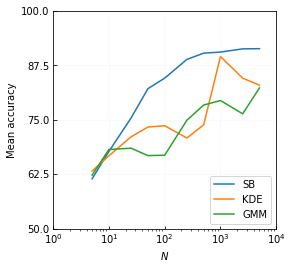

In [11]:
## Data set size experiment

def experiment_sweep_dataset_size():
    """
    Evaluates the effect of the size of the training set. Use the default settings. size=-5, scale=0.5
    """
    mcmc = []
    kde = []
    gmm = []
    results = []
    params = {
        'n': 2,
        'size': -5,
        'scale': 0.5,
        'n_runs': 50,
        'test_n_samples': 200,
        'use_pca': False,
        'pca_n_components': 0.99,
        'verbose': False,
    }
    all_n_samples = [5, 10, 25, 50, 100, 250, 500, 1000, 2500, 5000]

    for n_samples in all_n_samples:
        print('*'*80)
        print('Samples = {}'.format(n_samples))
        print('*'*80)
        params['n_samples'] = n_samples
        summary = experiment_n_tries(params)
        mcmc.append(100 * summary['mcmc_acc'])
        kde.append(100 * summary['kde_acc'])
        gmm.append(100 * summary['gmm_acc'])
        results.append({
            'n_samples': n_samples,
            'mcmc_acc': summary['mcmc_acc'],
            'kde_acc': summary['kde_acc'],
            'gmm_acc': summary['gmm_acc'],
        })
    df = pd.DataFrame(results)
    pprint(df)
    df.to_csv('experiment_sweep_dataset_size.csv')

    fig, ax = plt.subplots(figsize=(4, 4))
    ax.semilogx(all_n_samples, mcmc, label='SB')
    ax.semilogx(all_n_samples, kde, label='KDE')
    ax.semilogx(all_n_samples, gmm, label='GMM')
    ax.tick_params(direction='in')
    ax.grid(True, ls='--', alpha=0.1)
    ax.set(
        xlabel='$N$', 
        ylabel='Mean accuracy',
        xlim=(1, 10000),
        xticks=[1, 10, 100, 1000, 10000],
        ylim=(50, 100),
        yticks=[50, 62.5, 75, 87.5, 100],
    )
    ax.legend(loc='lower right')
    save_settings = {
        'bbox_inches': 'tight',
        'dpi': 300,
    }
    fig.savefig(
        'img/sweep_dataset_size_5.png',
        **save_settings,
    )
    fig.savefig(
        'img/sweep_dataset_size_5.eps',
        **save_settings,
    )

experiment_sweep_dataset_size()

  3%|▎         | 6/200 [00:00<00:03, 59.54it/s]

********************************************************************************
Rn = 4
********************************************************************************


  4%|▍         | 8/200 [00:00<00:02, 76.36it/s]

Generated 200 feasible and 200 infeasible for training.


100%|█████████▉| 199/200 [00:03<00:00, 51.13it/s]
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


Generated 201 feasible and 200 infeasible pts for testing.


/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)
  4%|▍         | 8/200 [00:00<00:02, 73.83it/s]

Run [1, 0] - 	Scores:	GMM:0.631	KDE:0.611	MCMC:0.666


  4%|▎         | 7/200 [00:00<00:02, 66.50it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:04<00:00, 44.46it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▎         | 7/200 [00:00<00:02, 66.90it/s]

Run [2, 0] - 	Scores:	GMM:0.524	KDE:0.524	MCMC:0.589


  4%|▍         | 8/200 [00:00<00:02, 73.34it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:04<00:00, 48.61it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 79.25it/s]

Run [3, 0] - 	Scores:	GMM:0.541	KDE:0.556	MCMC:0.599


  4%|▍         | 8/200 [00:00<00:02, 78.96it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:53<00:00,  3.75it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 74.76it/s]

Run [4, 0] - 	Scores:	GMM:0.534	KDE:0.541	MCMC:0.571


  4%|▍         | 8/200 [00:00<00:02, 76.93it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:10<00:00, 18.25it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 71.63it/s]

Run [5, 0] - 	Scores:	GMM:0.529	KDE:0.534	MCMC:0.546


  4%|▍         | 8/200 [00:00<00:02, 76.55it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:03<00:00, 65.55it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 75.83it/s]

Run [6, 0] - 	Scores:	GMM:0.676	KDE:0.736	MCMC:0.718


  4%|▎         | 7/200 [00:00<00:02, 67.63it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:03<00:00, 64.50it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 77.99it/s]

Run [7, 0] - 	Scores:	GMM:0.566	KDE:0.591	MCMC:0.743


  4%|▍         | 8/200 [00:00<00:02, 72.13it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:02<00:00, 72.16it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 76.10it/s]

Run [8, 0] - 	Scores:	GMM:0.766	KDE:0.743	MCMC:0.696


  4%|▍         | 8/200 [00:00<00:02, 75.21it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:05<00:00, 34.58it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 74.41it/s]

Run [9, 0] - 	Scores:	GMM:0.623	KDE:0.663	MCMC:0.671


  4%|▍         | 8/200 [00:00<00:02, 75.91it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:03<00:00, 60.14it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 75.72it/s]

Run [10, 0] - 	Scores:	GMM:0.653	KDE:0.561	MCMC:0.653


  4%|▍         | 8/200 [00:00<00:02, 76.89it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:02<00:00, 68.78it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 75.81it/s]

Run [11, 0] - 	Scores:	GMM:0.606	KDE:0.636	MCMC:0.691


  4%|▍         | 8/200 [00:00<00:02, 71.83it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:06<00:00, 29.92it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 74.31it/s]

Run [12, 0] - 	Scores:	GMM:0.531	KDE:0.549	MCMC:0.663


  4%|▍         | 8/200 [00:00<00:02, 76.13it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:04<00:00, 44.94it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 76.30it/s]

Run [13, 0] - 	Scores:	GMM:0.556	KDE:0.569	MCMC:0.594


  4%|▍         | 8/200 [00:00<00:02, 71.68it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:30<00:00,  6.59it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 77.09it/s]

Run [14, 0] - 	Scores:	GMM:0.534	KDE:0.524	MCMC:0.566


  4%|▍         | 8/200 [00:00<00:02, 78.32it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:03<00:00, 50.27it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 75.94it/s]

Run [15, 0] - 	Scores:	GMM:0.564	KDE:0.641	MCMC:0.661


  4%|▍         | 8/200 [00:00<00:02, 73.01it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:03<00:00, 58.09it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 79.01it/s]

Run [16, 0] - 	Scores:	GMM:0.504	KDE:0.571	MCMC:0.514


  4%|▍         | 8/200 [00:00<00:02, 78.34it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:37<00:00,  5.30it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 76.52it/s]

Run [17, 0] - 	Scores:	GMM:0.516	KDE:0.519	MCMC:0.658


  4%|▍         | 8/200 [00:00<00:02, 73.33it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:04<00:00, 41.98it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▎         | 7/200 [00:00<00:02, 66.16it/s]

Run [18, 0] - 	Scores:	GMM:0.546	KDE:0.561	MCMC:0.633


  4%|▍         | 8/200 [00:00<00:02, 75.90it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:05<00:00, 36.97it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 72.51it/s]

Run [19, 0] - 	Scores:	GMM:0.554	KDE:0.599	MCMC:0.566


  4%|▍         | 8/200 [00:00<00:02, 76.73it/s]

Generated 200 feasible and 200 infeasible for training.


100%|█████████▉| 199/200 [00:04<00:00, 48.72it/s]
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


Generated 201 feasible and 200 infeasible pts for testing.


/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)
  4%|▍         | 8/200 [00:00<00:02, 76.83it/s]

Run [20, 0] - 	Scores:	GMM:0.509	KDE:0.606	MCMC:0.763


  4%|▍         | 8/200 [00:00<00:02, 76.46it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:03<00:00, 60.94it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 70.73it/s]

Run [21, 0] - 	Scores:	GMM:0.613	KDE:0.768	MCMC:0.796


  4%|▍         | 8/200 [00:00<00:02, 77.32it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:04<00:00, 40.32it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 70.02it/s]

Run [22, 0] - 	Scores:	GMM:0.691	KDE:0.701	MCMC:0.658


  4%|▍         | 8/200 [00:00<00:02, 75.73it/s]

Generated 200 feasible and 200 infeasible for training.


100%|█████████▉| 199/200 [00:05<00:00, 37.67it/s]
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


Generated 201 feasible and 200 infeasible pts for testing.


/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)
  4%|▍         | 8/200 [00:00<00:02, 71.47it/s]

Run [23, 0] - 	Scores:	GMM:0.526	KDE:0.534	MCMC:0.451


  4%|▍         | 8/200 [00:00<00:02, 74.92it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:18<00:00, 10.77it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 75.58it/s]

Run [24, 0] - 	Scores:	GMM:0.574	KDE:0.541	MCMC:0.579


  4%|▍         | 8/200 [00:00<00:02, 75.60it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:03<00:00, 64.33it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 75.04it/s]

Run [25, 0] - 	Scores:	GMM:0.544	KDE:0.731	MCMC:0.743
********************************************************************************
Rn = 6
********************************************************************************


  4%|▍         | 8/200 [00:00<00:02, 75.48it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:07<00:00, 26.51it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 74.39it/s]

Run [1, 0] - 	Scores:	GMM:0.531	KDE:0.551	MCMC:0.357


  4%|▍         | 8/200 [00:00<00:02, 76.70it/s]

Generated 200 feasible and 200 infeasible for training.


100%|█████████▉| 199/200 [00:03<00:00, 62.72it/s]
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


Generated 201 feasible and 200 infeasible pts for testing.


/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)
  4%|▍         | 8/200 [00:00<00:02, 76.38it/s]

Run [2, 0] - 	Scores:	GMM:0.501	KDE:0.688	MCMC:0.501


  4%|▍         | 8/200 [00:00<00:02, 74.18it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:08<00:00, 24.48it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 72.53it/s]

Run [3, 0] - 	Scores:	GMM:0.516	KDE:0.519	MCMC:0.581


  4%|▍         | 8/200 [00:00<00:02, 74.10it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:14<00:00, 13.87it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 72.28it/s]

Run [4, 0] - 	Scores:	GMM:0.504	KDE:0.504	MCMC:0.501


  4%|▍         | 8/200 [00:00<00:02, 74.39it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:02<00:00, 73.64it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 74.32it/s]

Run [5, 0] - 	Scores:	GMM:0.808	KDE:0.883	MCMC:0.82


  4%|▍         | 8/200 [00:00<00:02, 73.59it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:04<00:00, 43.68it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▎         | 7/200 [00:00<00:02, 67.98it/s]

Run [6, 0] - 	Scores:	GMM:0.501	KDE:0.501	MCMC:0.469


  4%|▍         | 8/200 [00:00<00:02, 76.60it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:03<00:00, 60.80it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 74.11it/s]

Run [7, 0] - 	Scores:	GMM:0.536	KDE:0.564	MCMC:0.424


  4%|▍         | 8/200 [00:00<00:02, 75.88it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:02<00:00, 70.10it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 73.18it/s]

Run [8, 0] - 	Scores:	GMM:0.556	KDE:0.571	MCMC:0.519


  4%|▍         | 8/200 [00:00<00:02, 71.03it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:02<00:00, 71.44it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 72.59it/s]

Run [9, 0] - 	Scores:	GMM:0.748	KDE:0.773	MCMC:0.763


  4%|▍         | 8/200 [00:00<00:02, 74.26it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:04<00:00, 46.58it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 73.91it/s]

Run [10, 0] - 	Scores:	GMM:0.516	KDE:0.519	MCMC:0.444


  4%|▎         | 7/200 [00:00<00:02, 66.03it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:02<00:00, 72.20it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 74.39it/s]

Run [11, 0] - 	Scores:	GMM:0.646	KDE:0.686	MCMC:0.633


  4%|▍         | 8/200 [00:00<00:02, 76.90it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:02<00:00, 70.46it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 75.07it/s]

Run [12, 0] - 	Scores:	GMM:0.736	KDE:0.748	MCMC:0.693


  4%|▍         | 8/200 [00:00<00:02, 74.00it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:02<00:00, 73.24it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 70.53it/s]

Run [13, 0] - 	Scores:	GMM:0.651	KDE:0.651	MCMC:0.688


  4%|▍         | 8/200 [00:00<00:02, 77.86it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:53<00:00,  3.70it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 76.07it/s]

Run [14, 0] - 	Scores:	GMM:0.581	KDE:0.569	MCMC:0.479


  4%|▍         | 8/200 [00:00<00:02, 78.37it/s]

Generated 200 feasible and 200 infeasible for training.


100%|█████████▉| 199/200 [00:02<00:00, 74.54it/s]
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


Generated 201 feasible and 200 infeasible pts for testing.


/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)
  4%|▍         | 8/200 [00:00<00:02, 73.46it/s]

Run [15, 0] - 	Scores:	GMM:0.781	KDE:0.828	MCMC:0.671


  4%|▍         | 8/200 [00:00<00:02, 74.09it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:04<00:00, 49.04it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 71.35it/s]

Run [16, 0] - 	Scores:	GMM:0.501	KDE:0.486	MCMC:0.618


  4%|▍         | 8/200 [00:00<00:02, 78.18it/s]

Generated 200 feasible and 200 infeasible for training.


100%|█████████▉| 199/200 [00:02<00:00, 73.34it/s]
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


Generated 201 feasible and 200 infeasible pts for testing.


/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)
  4%|▍         | 8/200 [00:00<00:02, 74.84it/s]

Run [17, 0] - 	Scores:	GMM:0.668	KDE:0.798	MCMC:0.723


  4%|▍         | 8/200 [00:00<00:02, 72.10it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:02<00:00, 74.16it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▎         | 7/200 [00:00<00:02, 69.45it/s]

Run [18, 0] - 	Scores:	GMM:0.701	KDE:0.738	MCMC:0.474


  4%|▍         | 8/200 [00:00<00:02, 75.19it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:02<00:00, 67.87it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 73.28it/s]

Run [19, 0] - 	Scores:	GMM:0.628	KDE:0.601	MCMC:0.464


  4%|▍         | 8/200 [00:00<00:02, 75.88it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:02<00:00, 73.02it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 70.76it/s]

Run [20, 0] - 	Scores:	GMM:0.713	KDE:0.845	MCMC:0.643


  4%|▎         | 7/200 [00:00<00:02, 69.09it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:03<00:00, 56.15it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 77.10it/s]

Run [21, 0] - 	Scores:	GMM:0.703	KDE:0.608	MCMC:0.711


  2%|▏         | 4/200 [00:00<00:05, 33.22it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:02<00:00, 68.49it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 73.44it/s]

Run [22, 0] - 	Scores:	GMM:0.751	KDE:0.721	MCMC:0.746


  4%|▍         | 8/200 [00:00<00:02, 74.61it/s]

Generated 200 feasible and 200 infeasible for training.


100%|█████████▉| 199/200 [00:02<00:00, 73.15it/s]
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


Generated 201 feasible and 200 infeasible pts for testing.


/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)
  4%|▍         | 8/200 [00:00<00:02, 76.32it/s]

Run [23, 0] - 	Scores:	GMM:0.721	KDE:0.825	MCMC:0.668


  4%|▍         | 8/200 [00:00<00:02, 78.04it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:02<00:00, 75.57it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 78.43it/s]

Run [24, 0] - 	Scores:	GMM:0.915	KDE:0.94	MCMC:0.84


  4%|▍         | 8/200 [00:00<00:02, 78.03it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:03<00:00, 54.05it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 72.03it/s]

Run [25, 0] - 	Scores:	GMM:0.546	KDE:0.621	MCMC:0.526
********************************************************************************
Rn = 8
********************************************************************************


  4%|▍         | 8/200 [00:00<00:02, 73.99it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:02<00:00, 68.37it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 76.42it/s]

Run [1, 0] - 	Scores:	GMM:0.651	KDE:0.853	MCMC:0.466


  4%|▍         | 8/200 [00:00<00:02, 75.35it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:02<00:00, 74.04it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 77.57it/s]

Run [2, 0] - 	Scores:	GMM:0.606	KDE:0.631	MCMC:0.828


  4%|▍         | 8/200 [00:00<00:02, 74.13it/s]

Generated 200 feasible and 200 infeasible for training.


100%|█████████▉| 199/200 [00:02<00:00, 69.57it/s]
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


Generated 201 feasible and 200 infeasible pts for testing.


/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)
  4%|▍         | 8/200 [00:00<00:02, 74.31it/s]

Run [3, 0] - 	Scores:	GMM:0.479	KDE:0.476	MCMC:0.564


  4%|▍         | 8/200 [00:00<00:02, 77.85it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:11<00:00, 16.89it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 72.09it/s]

Run [4, 0] - 	Scores:	GMM:0.501	KDE:0.501	MCMC:0.401


  4%|▍         | 8/200 [00:00<00:02, 77.19it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:04<00:00, 48.00it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 77.00it/s]

Run [5, 0] - 	Scores:	GMM:0.461	KDE:0.489	MCMC:0.566


  4%|▎         | 7/200 [00:00<00:03, 64.14it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:02<00:00, 72.85it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 72.43it/s]

Run [6, 0] - 	Scores:	GMM:0.414	KDE:0.414	MCMC:0.406


  4%|▍         | 8/200 [00:00<00:02, 76.63it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:02<00:00, 74.90it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 77.22it/s]

Run [7, 0] - 	Scores:	GMM:0.521	KDE:0.501	MCMC:0.616


  4%|▍         | 8/200 [00:00<00:02, 76.78it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:03<00:00, 63.74it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 75.68it/s]

Run [8, 0] - 	Scores:	GMM:0.499	KDE:0.499	MCMC:0.499


  4%|▍         | 8/200 [00:00<00:02, 76.00it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:12<00:00, 15.67it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 74.42it/s]

Run [9, 0] - 	Scores:	GMM:0.466	KDE:0.451	MCMC:0.479


  4%|▍         | 8/200 [00:00<00:02, 74.70it/s]

Generated 200 feasible and 200 infeasible for training.


100%|█████████▉| 199/200 [00:02<00:00, 74.24it/s]
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


Generated 201 feasible and 200 infeasible pts for testing.


/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)
  4%|▍         | 8/200 [00:00<00:02, 74.90it/s]

Run [10, 0] - 	Scores:	GMM:0.603	KDE:0.571	MCMC:0.531


  4%|▍         | 8/200 [00:00<00:02, 75.20it/s]

Generated 200 feasible and 200 infeasible for training.


100%|█████████▉| 199/200 [00:12<00:00, 16.35it/s]
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


Generated 201 feasible and 200 infeasible pts for testing.


/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)
  4%|▍         | 8/200 [00:00<00:02, 74.32it/s]

Run [11, 0] - 	Scores:	GMM:0.616	KDE:0.599	MCMC:0.559


  4%|▍         | 8/200 [00:00<00:02, 77.41it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:07<00:00, 26.04it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 75.66it/s]

Run [12, 0] - 	Scores:	GMM:0.309	KDE:0.551	MCMC:0.439


  4%|▍         | 8/200 [00:00<00:02, 75.88it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:20<00:00,  9.66it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 74.07it/s]

Run [13, 0] - 	Scores:	GMM:0.501	KDE:0.494	MCMC:0.591


  4%|▍         | 8/200 [00:00<00:02, 74.31it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:03<00:00, 63.80it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 72.67it/s]

Run [14, 0] - 	Scores:	GMM:0.708	KDE:0.663	MCMC:0.711


  4%|▍         | 8/200 [00:00<00:02, 75.01it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:02<00:00, 71.88it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 72.29it/s]

Run [15, 0] - 	Scores:	GMM:0.411	KDE:0.426	MCMC:0.476


  4%|▍         | 8/200 [00:00<00:02, 72.04it/s]

Generated 200 feasible and 200 infeasible for training.


100%|█████████▉| 199/200 [00:02<00:00, 74.52it/s]
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


Generated 201 feasible and 200 infeasible pts for testing.


/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)
  4%|▍         | 8/200 [00:00<00:02, 73.51it/s]

Run [16, 0] - 	Scores:	GMM:0.915	KDE:0.91	MCMC:0.888


  4%|▍         | 8/200 [00:00<00:02, 76.82it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:02<00:00, 74.37it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 74.26it/s]

Run [17, 0] - 	Scores:	GMM:0.544	KDE:0.536	MCMC:0.486


  4%|▍         | 8/200 [00:00<00:02, 75.01it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:04<00:00, 39.95it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 75.75it/s]

Run [18, 0] - 	Scores:	GMM:0.576	KDE:0.546	MCMC:0.469


  4%|▍         | 8/200 [00:00<00:02, 76.14it/s]

Generated 200 feasible and 200 infeasible for training.


100%|█████████▉| 199/200 [00:02<00:00, 74.40it/s]
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


Generated 201 feasible and 200 infeasible pts for testing.


/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)
  4%|▍         | 8/200 [00:00<00:02, 75.22it/s]

Run [19, 0] - 	Scores:	GMM:0.676	KDE:0.663	MCMC:0.728


  4%|▍         | 8/200 [00:00<00:02, 75.51it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:02<00:00, 73.10it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 75.49it/s]

Run [20, 0] - 	Scores:	GMM:0.501	KDE:0.501	MCMC:0.461


  4%|▍         | 8/200 [00:00<00:02, 76.32it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:02<00:00, 70.67it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 75.77it/s]

Run [21, 0] - 	Scores:	GMM:0.613	KDE:0.589	MCMC:0.648


  4%|▍         | 8/200 [00:00<00:02, 74.70it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:02<00:00, 70.23it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 74.48it/s]

Run [22, 0] - 	Scores:	GMM:0.499	KDE:0.499	MCMC:0.496


  4%|▍         | 8/200 [00:00<00:02, 75.64it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:02<00:00, 72.69it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 73.90it/s]

Run [23, 0] - 	Scores:	GMM:0.633	KDE:0.683	MCMC:0.708


  4%|▍         | 8/200 [00:00<00:02, 75.79it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:02<00:00, 70.78it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 72.15it/s]

Run [24, 0] - 	Scores:	GMM:0.444	KDE:0.486	MCMC:0.581


  4%|▍         | 8/200 [00:00<00:02, 72.55it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:02<00:00, 66.81it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 73.86it/s]

Run [25, 0] - 	Scores:	GMM:0.511	KDE:0.511	MCMC:0.504
********************************************************************************
Rn = 10
********************************************************************************


  4%|▎         | 7/200 [00:00<00:03, 62.95it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:03<00:00, 57.24it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 75.59it/s]

Run [1, 0] - 	Scores:	GMM:0.835	KDE:0.858	MCMC:0.808


  4%|▍         | 8/200 [00:00<00:02, 76.26it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:02<00:00, 74.06it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 71.82it/s]

Run [2, 0] - 	Scores:	GMM:0.688	KDE:0.693	MCMC:0.484


  4%|▍         | 8/200 [00:00<00:02, 73.98it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:02<00:00, 73.23it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 75.20it/s]

Run [3, 0] - 	Scores:	GMM:0.668	KDE:0.708	MCMC:0.491


  4%|▍         | 8/200 [00:00<00:02, 75.05it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:02<00:00, 67.47it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▎         | 7/200 [00:00<00:03, 62.54it/s]

Run [4, 0] - 	Scores:	GMM:0.713	KDE:0.708	MCMC:0.232


  4%|▍         | 8/200 [00:00<00:02, 72.18it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:02<00:00, 68.96it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 71.98it/s]

Run [5, 0] - 	Scores:	GMM:0.501	KDE:0.521	MCMC:0.379


  4%|▍         | 8/200 [00:00<00:02, 75.55it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:02<00:00, 73.59it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 71.16it/s]

Run [6, 0] - 	Scores:	GMM:0.501	KDE:0.501	MCMC:0.574


  4%|▍         | 8/200 [00:00<00:02, 74.57it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:02<00:00, 72.94it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 76.63it/s]

Run [7, 0] - 	Scores:	GMM:0.818	KDE:0.778	MCMC:0.506


  4%|▍         | 8/200 [00:00<00:02, 76.00it/s]

Generated 200 feasible and 200 infeasible for training.


100%|█████████▉| 199/200 [00:02<00:00, 73.05it/s]
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


Generated 201 feasible and 200 infeasible pts for testing.


/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)
  4%|▍         | 8/200 [00:00<00:02, 74.74it/s]

Run [8, 0] - 	Scores:	GMM:0.733	KDE:0.581	MCMC:0.489


  4%|▍         | 8/200 [00:00<00:02, 75.11it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:02<00:00, 73.47it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 75.81it/s]

Run [9, 0] - 	Scores:	GMM:0.499	KDE:0.499	MCMC:0.504


  4%|▍         | 8/200 [00:00<00:02, 73.46it/s]

Generated 200 feasible and 200 infeasible for training.


100%|█████████▉| 199/200 [00:02<00:00, 72.85it/s]
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


Generated 201 feasible and 200 infeasible pts for testing.


/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)
  4%|▍         | 8/200 [00:00<00:02, 75.05it/s]

Run [10, 0] - 	Scores:	GMM:0.838	KDE:0.81	MCMC:0.623


  4%|▍         | 8/200 [00:00<00:02, 75.65it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:02<00:00, 72.07it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 74.14it/s]

Run [11, 0] - 	Scores:	GMM:0.773	KDE:0.721	MCMC:0.431


  4%|▍         | 8/200 [00:00<00:02, 75.54it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:02<00:00, 73.51it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 74.49it/s]

Run [12, 0] - 	Scores:	GMM:0.574	KDE:0.521	MCMC:0.491


  4%|▍         | 8/200 [00:00<00:02, 74.36it/s]

Generated 200 feasible and 200 infeasible for training.


100%|█████████▉| 199/200 [00:02<00:00, 72.86it/s]
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


Generated 201 feasible and 200 infeasible pts for testing.


/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)
  4%|▍         | 8/200 [00:00<00:02, 74.89it/s]

Run [13, 0] - 	Scores:	GMM:0.681	KDE:0.666	MCMC:0.776


  4%|▍         | 8/200 [00:00<00:02, 73.53it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:04<00:00, 40.98it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 70.98it/s]

Run [14, 0] - 	Scores:	GMM:0.501	KDE:0.501	MCMC:0.489


  4%|▍         | 8/200 [00:00<00:02, 72.78it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:02<00:00, 68.60it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  3%|▎         | 6/200 [00:00<00:03, 58.03it/s]

Run [15, 0] - 	Scores:	GMM:0.397	KDE:0.499	MCMC:0.496


  4%|▍         | 8/200 [00:00<00:02, 75.20it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:02<00:00, 70.90it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 74.57it/s]

Run [16, 0] - 	Scores:	GMM:0.698	KDE:0.638	MCMC:0.673


  4%|▍         | 8/200 [00:00<00:02, 73.99it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:06<00:00, 30.54it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 74.13it/s]

Run [17, 0] - 	Scores:	GMM:0.603	KDE:0.489	MCMC:0.406


  4%|▍         | 8/200 [00:00<00:02, 74.30it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:02<00:00, 71.81it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 74.45it/s]

Run [18, 0] - 	Scores:	GMM:0.584	KDE:0.581	MCMC:0.519


  4%|▍         | 8/200 [00:00<00:02, 75.25it/s]

Generated 200 feasible and 200 infeasible for training.


100%|█████████▉| 199/200 [00:02<00:00, 71.12it/s]
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


Generated 201 feasible and 200 infeasible pts for testing.


/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)
  4%|▎         | 7/200 [00:00<00:02, 69.00it/s]

Run [19, 0] - 	Scores:	GMM:0.569	KDE:0.499	MCMC:0.499


  4%|▍         | 8/200 [00:00<00:02, 73.49it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:02<00:00, 69.13it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▎         | 7/200 [00:00<00:02, 66.32it/s]

Run [20, 0] - 	Scores:	GMM:0.499	KDE:0.499	MCMC:0.466


  4%|▍         | 8/200 [00:00<00:02, 75.15it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:05<00:00, 34.98it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 70.76it/s]

Run [21, 0] - 	Scores:	GMM:0.411	KDE:0.369	MCMC:0.514


  4%|▍         | 8/200 [00:00<00:02, 73.96it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:03<00:00, 62.78it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 73.11it/s]

Run [22, 0] - 	Scores:	GMM:0.429	KDE:0.559	MCMC:0.576


  4%|▍         | 8/200 [00:00<00:02, 73.52it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:02<00:00, 70.20it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 71.15it/s]

Run [23, 0] - 	Scores:	GMM:0.479	KDE:0.499	MCMC:0.499


  4%|▍         | 8/200 [00:00<00:02, 74.90it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:10<00:00, 19.66it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 74.61it/s]

Run [24, 0] - 	Scores:	GMM:0.454	KDE:0.469	MCMC:0.494


  4%|▍         | 8/200 [00:00<00:02, 74.59it/s]

Generated 200 feasible and 200 infeasible for training.


100%|█████████▉| 199/200 [00:02<00:00, 69.58it/s]
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


Generated 201 feasible and 200 infeasible pts for testing.


/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)
  4%|▎         | 7/200 [00:00<00:02, 69.37it/s]

Run [25, 0] - 	Scores:	GMM:0.436	KDE:0.399	MCMC:0.638
********************************************************************************
Rn = 12
********************************************************************************


  4%|▍         | 8/200 [00:00<00:02, 72.43it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:07<00:00, 27.64it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 75.19it/s]

Run [1, 0] - 	Scores:	GMM:0.499	KDE:0.499	MCMC:0.499


  4%|▍         | 8/200 [00:00<00:02, 75.43it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:02<00:00, 73.38it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 75.11it/s]

Run [2, 0] - 	Scores:	GMM:0.444	KDE:0.426	MCMC:0.596


  4%|▍         | 8/200 [00:00<00:02, 74.63it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:02<00:00, 69.76it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 74.36it/s]

Run [3, 0] - 	Scores:	GMM:0.988	KDE:0.97	MCMC:0.875


  4%|▍         | 8/200 [00:00<00:02, 74.74it/s]

Generated 200 feasible and 200 infeasible for training.


100%|█████████▉| 199/200 [00:02<00:00, 72.24it/s]
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


Generated 201 feasible and 200 infeasible pts for testing.


/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)
  4%|▍         | 8/200 [00:00<00:02, 71.10it/s]

Run [4, 0] - 	Scores:	GMM:0.499	KDE:0.499	MCMC:0.499


  4%|▍         | 8/200 [00:00<00:02, 72.71it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:02<00:00, 70.18it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▎         | 7/200 [00:00<00:03, 63.15it/s]

Run [5, 0] - 	Scores:	GMM:0.686	KDE:0.623	MCMC:0.404


  4%|▍         | 8/200 [00:00<00:02, 73.61it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:02<00:00, 71.75it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 70.61it/s]

Run [6, 0] - 	Scores:	GMM:0.519	KDE:0.519	MCMC:0.419


  4%|▎         | 7/200 [00:00<00:02, 66.22it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:02<00:00, 70.94it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 73.85it/s]

Run [7, 0] - 	Scores:	GMM:0.494	KDE:0.486	MCMC:0.494


  4%|▍         | 8/200 [00:00<00:02, 74.58it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:02<00:00, 72.44it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 73.74it/s]

Run [8, 0] - 	Scores:	GMM:0.531	KDE:0.499	MCMC:0.486


  4%|▍         | 8/200 [00:00<00:02, 74.01it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:02<00:00, 73.21it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 73.88it/s]

Run [9, 0] - 	Scores:	GMM:0.451	KDE:0.419	MCMC:0.404


  4%|▍         | 8/200 [00:00<00:02, 71.73it/s]

Generated 200 feasible and 200 infeasible for training.


100%|█████████▉| 199/200 [00:03<00:00, 64.02it/s]
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


Generated 201 feasible and 200 infeasible pts for testing.


/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)
  4%|▍         | 8/200 [00:00<00:02, 71.85it/s]

Run [10, 0] - 	Scores:	GMM:0.534	KDE:0.534	MCMC:0.858


  4%|▍         | 8/200 [00:00<00:02, 72.41it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:24<00:00,  8.00it/s]


Generated 202 feasible and 199 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 71.39it/s]

Run [11, 0] - 	Scores:	GMM:0.404	KDE:0.394	MCMC:0.496


  4%|▎         | 7/200 [00:00<00:03, 63.67it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:02<00:00, 71.32it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 73.79it/s]

Run [12, 0] - 	Scores:	GMM:0.499	KDE:0.499	MCMC:0.267


  4%|▍         | 8/200 [00:00<00:02, 75.63it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:02<00:00, 72.13it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 72.21it/s]

Run [13, 0] - 	Scores:	GMM:0.499	KDE:0.499	MCMC:0.499


  4%|▍         | 8/200 [00:00<00:02, 72.58it/s]

Generated 200 feasible and 200 infeasible for training.


100%|█████████▉| 199/200 [00:02<00:00, 70.34it/s]
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


Generated 201 feasible and 200 infeasible pts for testing.


/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)
  4%|▍         | 8/200 [00:00<00:02, 74.56it/s]

Run [14, 0] - 	Scores:	GMM:0.499	KDE:0.499	MCMC:0.424


  4%|▍         | 8/200 [00:00<00:02, 75.16it/s]

Generated 200 feasible and 200 infeasible for training.


100%|█████████▉| 199/200 [00:03<00:00, 58.96it/s]
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


Generated 201 feasible and 200 infeasible pts for testing.


/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)
  4%|▍         | 8/200 [00:00<00:02, 67.98it/s]

Run [15, 0] - 	Scores:	GMM:0.501	KDE:0.501	MCMC:0.294


  4%|▍         | 8/200 [00:00<00:02, 73.58it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:02<00:00, 70.48it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 71.40it/s]

Run [16, 0] - 	Scores:	GMM:0.409	KDE:0.377	MCMC:0.476


  4%|▍         | 8/200 [00:00<00:02, 74.81it/s]

Generated 200 feasible and 200 infeasible for training.


100%|█████████▉| 199/200 [00:02<00:00, 73.15it/s]
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


Generated 201 feasible and 200 infeasible pts for testing.


/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)
  4%|▎         | 7/200 [00:00<00:02, 68.79it/s]

Run [17, 0] - 	Scores:	GMM:0.526	KDE:0.569	MCMC:0.551


  4%|▍         | 8/200 [00:00<00:02, 70.34it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:02<00:00, 72.82it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 72.22it/s]

Run [18, 0] - 	Scores:	GMM:0.499	KDE:0.499	MCMC:0.454


  4%|▎         | 7/200 [00:00<00:02, 68.20it/s]

Generated 200 feasible and 200 infeasible for training.


100%|█████████▉| 199/200 [00:02<00:00, 71.31it/s]
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


Generated 201 feasible and 200 infeasible pts for testing.


/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)
  4%|▍         | 8/200 [00:00<00:02, 72.45it/s]

Run [19, 0] - 	Scores:	GMM:0.928	KDE:0.973	MCMC:0.648


  4%|▍         | 8/200 [00:00<00:02, 75.26it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:26<00:00,  7.48it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 74.35it/s]

Run [20, 0] - 	Scores:	GMM:0.499	KDE:0.499	MCMC:0.499


  4%|▍         | 8/200 [00:00<00:02, 75.33it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:03<00:00, 57.49it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 72.65it/s]

Run [21, 0] - 	Scores:	GMM:0.002	KDE:0.002	MCMC:0.444


  4%|▍         | 8/200 [00:00<00:02, 74.97it/s]

Generated 200 feasible and 200 infeasible for training.


100%|█████████▉| 199/200 [00:02<00:00, 73.49it/s]
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


Generated 201 feasible and 200 infeasible pts for testing.


/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)
  4%|▍         | 8/200 [00:00<00:02, 75.24it/s]

Run [22, 0] - 	Scores:	GMM:0.499	KDE:0.496	MCMC:0.751


  4%|▍         | 8/200 [00:00<00:02, 75.56it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:02<00:00, 73.86it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 75.51it/s]

Run [23, 0] - 	Scores:	GMM:0.499	KDE:0.499	MCMC:0.479


  4%|▍         | 8/200 [00:00<00:02, 75.26it/s]

Generated 200 feasible and 200 infeasible for training.


100%|█████████▉| 199/200 [00:02<00:00, 67.67it/s]
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


Generated 201 feasible and 200 infeasible pts for testing.


/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)
  4%|▍         | 8/200 [00:00<00:02, 73.63it/s]

Run [24, 0] - 	Scores:	GMM:0.499	KDE:0.499	MCMC:0.499


  4%|▍         | 8/200 [00:00<00:02, 74.72it/s]

Generated 200 feasible and 200 infeasible for training.


100%|█████████▉| 199/200 [00:02<00:00, 73.82it/s]
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


Generated 201 feasible and 200 infeasible pts for testing.


/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)
  4%|▎         | 7/200 [00:00<00:02, 69.37it/s]

Run [25, 0] - 	Scores:	GMM:0.499	KDE:0.499	MCMC:0.499
********************************************************************************
Rn = 14
********************************************************************************


  4%|▍         | 8/200 [00:00<00:02, 72.62it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:02<00:00, 72.34it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 71.89it/s]

Run [1, 0] - 	Scores:	GMM:0.673	KDE:0.656	MCMC:0.499


  4%|▎         | 7/200 [00:00<00:02, 68.10it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:02<00:00, 71.12it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 74.71it/s]

Run [2, 0] - 	Scores:	GMM:0.688	KDE:0.686	MCMC:0.529


  4%|▎         | 7/200 [00:00<00:02, 69.20it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:02<00:00, 71.30it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 74.33it/s]

Run [3, 0] - 	Scores:	GMM:0.494	KDE:0.486	MCMC:0.449


  4%|▍         | 8/200 [00:00<00:02, 75.21it/s]

Generated 200 feasible and 200 infeasible for training.


100%|█████████▉| 199/200 [00:02<00:00, 73.11it/s]
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


Generated 201 feasible and 200 infeasible pts for testing.


/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)
  4%|▍         | 8/200 [00:00<00:02, 71.52it/s]

Run [4, 0] - 	Scores:	GMM:0.574	KDE:0.661	MCMC:0.214


  4%|▍         | 8/200 [00:00<00:02, 71.82it/s]

Generated 200 feasible and 200 infeasible for training.


100%|█████████▉| 199/200 [00:02<00:00, 70.72it/s]
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


Generated 201 feasible and 200 infeasible pts for testing.


/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)
  4%|▍         | 8/200 [00:00<00:02, 72.50it/s]

Run [5, 0] - 	Scores:	GMM:0.499	KDE:0.499	MCMC:0.499


  4%|▍         | 8/200 [00:00<00:02, 71.30it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:02<00:00, 69.35it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▎         | 7/200 [00:00<00:02, 65.47it/s]

Run [6, 0] - 	Scores:	GMM:0.499	KDE:0.499	MCMC:0.499


  4%|▍         | 8/200 [00:00<00:02, 70.32it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:02<00:00, 72.80it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 73.38it/s]

Run [7, 0] - 	Scores:	GMM:0.993	KDE:1.0	MCMC:0.93


  4%|▍         | 8/200 [00:00<00:02, 75.67it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:03<00:00, 56.06it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 70.52it/s]

Run [8, 0] - 	Scores:	GMM:0.519	KDE:0.519	MCMC:0.499


  4%|▍         | 8/200 [00:00<00:02, 72.89it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:02<00:00, 72.36it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▎         | 7/200 [00:00<00:02, 68.17it/s]

Run [9, 0] - 	Scores:	GMM:0.424	KDE:0.406	MCMC:0.145


  4%|▍         | 8/200 [00:00<00:02, 73.81it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:02<00:00, 68.51it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▎         | 7/200 [00:00<00:02, 65.98it/s]

Run [10, 0] - 	Scores:	GMM:0.499	KDE:0.499	MCMC:0.499


  4%|▍         | 8/200 [00:00<00:02, 72.52it/s]

Generated 200 feasible and 200 infeasible for training.


100%|█████████▉| 199/200 [00:02<00:00, 66.44it/s]
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


Generated 201 feasible and 200 infeasible pts for testing.


/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)
  4%|▍         | 8/200 [00:00<00:02, 72.21it/s]

Run [11, 0] - 	Scores:	GMM:0.506	KDE:0.551	MCMC:0.499


  4%|▎         | 7/200 [00:00<00:02, 69.49it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:02<00:00, 69.54it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▎         | 7/200 [00:00<00:02, 64.72it/s]

Run [12, 0] - 	Scores:	GMM:0.499	KDE:0.499	MCMC:0.601


  4%|▍         | 8/200 [00:00<00:02, 74.23it/s]

Generated 197 feasible and 197 infeasible for training.


100%|█████████▉| 199/200 [00:02<00:00, 69.27it/s]
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


Generated 201 feasible and 200 infeasible pts for testing.


/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)
  4%|▍         | 8/200 [00:00<00:02, 73.53it/s]

Run [13, 0] - 	Scores:	GMM:0.579	KDE:0.571	MCMC:0.499


  4%|▍         | 8/200 [00:00<00:02, 73.62it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:02<00:00, 71.28it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 75.21it/s]

Run [14, 0] - 	Scores:	GMM:0.499	KDE:0.499	MCMC:0.499


  4%|▍         | 8/200 [00:00<00:02, 74.26it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:02<00:00, 68.42it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 73.12it/s]

Run [15, 0] - 	Scores:	GMM:0.429	KDE:0.429	MCMC:0.666


  4%|▎         | 7/200 [00:00<00:02, 69.58it/s]

Generated 200 feasible and 200 infeasible for training.


100%|█████████▉| 199/200 [00:02<00:00, 68.89it/s]
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


Generated 201 feasible and 200 infeasible pts for testing.


/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)
  4%|▎         | 7/200 [00:00<00:02, 68.93it/s]

Run [16, 0] - 	Scores:	GMM:0.489	KDE:0.489	MCMC:0.746


  4%|▍         | 8/200 [00:00<00:02, 73.46it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:02<00:00, 69.29it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 75.20it/s]

Run [17, 0] - 	Scores:	GMM:0.499	KDE:0.499	MCMC:0.499


  4%|▍         | 8/200 [00:00<00:02, 74.61it/s]

Generated 199 feasible and 199 infeasible for training.


100%|█████████▉| 199/200 [00:02<00:00, 70.74it/s]
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


Generated 201 feasible and 200 infeasible pts for testing.


/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)
  4%|▍         | 8/200 [00:00<00:02, 75.59it/s]

Run [18, 0] - 	Scores:	GMM:0.995	KDE:1.0	MCMC:0.711


  4%|▍         | 8/200 [00:00<00:02, 75.11it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:02<00:00, 73.26it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 71.33it/s]

Run [19, 0] - 	Scores:	GMM:0.486	KDE:0.486	MCMC:0.616


  4%|▍         | 8/200 [00:00<00:02, 74.89it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:02<00:00, 72.72it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 74.86it/s]

Run [20, 0] - 	Scores:	GMM:0.995	KDE:0.499	MCMC:0.499


  4%|▍         | 8/200 [00:00<00:02, 74.13it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:06<00:00, 29.19it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▎         | 7/200 [00:00<00:02, 69.47it/s]

Run [21, 0] - 	Scores:	GMM:0.688	KDE:0.499	MCMC:0.499


  4%|▍         | 8/200 [00:00<00:02, 73.03it/s]

Generated 200 feasible and 200 infeasible for training.


100%|█████████▉| 199/200 [00:02<00:00, 70.59it/s]
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


Generated 201 feasible and 200 infeasible pts for testing.


/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)
  4%|▍         | 8/200 [00:00<00:02, 71.58it/s]

Run [22, 0] - 	Scores:	GMM:0.716	KDE:0.678	MCMC:0.499


  4%|▍         | 8/200 [00:00<00:02, 74.75it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:02<00:00, 72.34it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 71.71it/s]

Run [23, 0] - 	Scores:	GMM:0.526	KDE:0.504	MCMC:0.499


  4%|▎         | 7/200 [00:00<00:02, 68.33it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:02<00:00, 70.27it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 72.10it/s]

Run [24, 0] - 	Scores:	GMM:0.504	KDE:0.382	MCMC:0.519


  4%|▍         | 8/200 [00:00<00:02, 70.94it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:02<00:00, 70.82it/s]


Generated 201 feasible and 200 infeasible pts for testing.
Run [25, 0] - 	Scores:	GMM:0.539	KDE:0.569	MCMC:0.499
   gmm_acc  gmm_pre  gmm_rec  kde_acc  kde_pre  kde_rec  mcmc_acc  mcmc_pre  \
0  0.57644  0.56696  0.97032  0.60440  0.56696  0.96648   0.63952   0.62452   
1  0.63836  0.63672  0.94172  0.66952  0.63672  0.91040   0.59824   0.58244   
2  0.54632  0.49504  0.62128  0.56172  0.49504  0.63364   0.56404   0.52640   
3  0.59528  0.50376  0.53984  0.58264  0.50376  0.45852   0.52228   0.38288   
4  0.51624  0.23548  0.26708  0.51112  0.23548  0.25212   0.51256   0.22776   
5  0.59244  0.41180  0.39284  0.56260  0.41180  0.32096   0.52448   0.24348   

   mcmc_rec   n  
0   0.70984   4  
1   0.63400   6  
2   0.46460   8  
3   0.29768  10  
4   0.19956  12  
5   0.18096  14  


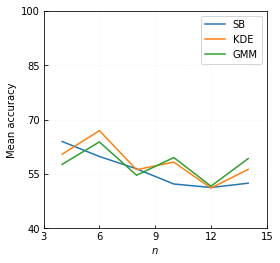

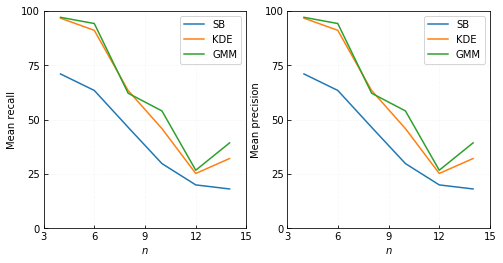

In [7]:
# Scale in dimension of n

def experiment_sweep_Rn(params={}):
    """
    Compares MCMC and KDE on simplex with a sweep over dimensions.
    Expecting to see the KDE completely fall apart at higher dimensions.
    """
    mcmc = [[], [], [], []]
    kde = [[], [], [], []]
    gmm = [[], [], [], []]
    results = []
    Rn = [4, 6, 8, 10, 12, 14]
    if params == {}:
        params = {
            'MAX_RUNS': 100,
            'size': -5,
            'scale': 0.5,
            'n_runs': 2,
            'n_samples': 200,
            'test_n_samples': 200,
            'pca_n_components': 0.8,
            'use_pca': True,
            'verbose': False,
        }
    
    for n in Rn:
        print('*'*80)
        print('Rn = {}'.format(n))
        print('*'*80)
        params['n'] = n
        summary = experiment_n_tries(params)
        mcmc[0].append(100 * summary['mcmc_acc'])
        kde[0].append(100 * summary['kde_acc'])
        gmm[0].append(100 * summary['gmm_acc'])
        mcmc[1].append(100 * summary['mcmc_tpr'])
        kde[1].append(100 * summary['kde_tpr'])
        gmm[1].append(100 * summary['gmm_tpr'])
        mcmc[2].append(100 * summary['mcmc_pre'])
        kde[2].append(100 * summary['kde_pre'])
        gmm[2].append(100 * summary['gmm_pre'])
        mcmc[3].append(100 * summary['mcmc_fpr'])
        kde[3].append(100 * summary['kde_fpr'])
        gmm[3].append(100 * summary['gmm_fpr'])
        results.append({
            'n': n,
            'mcmc_acc': summary['mcmc_acc'],
            'kde_acc': summary['kde_acc'],
            'gmm_acc': summary['gmm_acc'],
            'mcmc_rec': summary['mcmc_tpr'],
            'kde_rec': summary['kde_tpr'],
            'gmm_rec': summary['gmm_tpr'],
            'mcmc_pre': summary['mcmc_pre'],
            'kde_pre': summary['kde_pre'],
            'gmm_pre': summary['kde_pre'],
            'mcmc_fpr': summary['mcmc_fpr'],
            'kde_fpr': summary['kde_fpr'],
            'gmm_fpr': summary['kde_fpr'],
        })
    df = pd.DataFrame(results)
    pprint(df)
    df.to_csv('experiment_sweep_Rn.csv')

    fig, ax = plt.subplots(figsize=(4, 4))
    ax.plot(Rn, mcmc[0], label='SB')
    ax.plot(Rn, kde[0], label='KDE')
    ax.plot(Rn, gmm[0], label='GMM')
    ax.tick_params(direction='in')
    ax.grid(True, ls='--', alpha=0.1)
    ax.set(
        xlabel='$n$', 
        ylabel='Mean accuracy',
        xlim=(3, 15),
        xticks=[3, 6, 9, 12, 15],
        ylim=(40, 100),
        yticks=[40, 55, 70, 85, 100],
    )
    ax.legend(loc='upper right')
    save_settings = {
        'bbox_inches': 'tight',
        'dpi': 300,
    }
    fig.savefig(
        'img/sweep_Rn.png',
        **save_settings,
    )
    fig.savefig(
        'img/sweep_Rn.eps',
        **save_settings,
    )
    
    fig_pre, ax_pre = plt.subplots(figsize=(4, 4))
    ax_pre.plot(Rn, mcmc[1], label='SB')
    ax_pre.plot(Rn, kde[1], label='KDE')
    ax_pre.plot(Rn, gmm[1], label='GMM')
    ax_pre.tick_params(direction='in')
    ax_pre.grid(True, ls='--', alpha=0.1)
    ax_pre.set(
        xlabel='$n$', 
        ylabel='Mean recall',
        xlim=(3, 15),
        xticks=[3, 6, 9, 12, 15],
        ylim=(0, 100),
        yticks=[0, 25, 50, 75, 100],
    )
    ax_pre.legend(loc='upper right')
    fig_pre.savefig(
        'img/sweep_Rn_pre.eps',
        **save_settings,
    )
    
    fig_rec, ax_rec = plt.subplots(figsize=(4, 4))
    ax_rec.plot(Rn, mcmc[2], label='SB')
    ax_rec.plot(Rn, kde[2], label='KDE')
    ax_rec.plot(Rn, gmm[2], label='GMM')
    ax_rec.tick_params(direction='in')
    ax_rec.grid(True, ls='--', alpha=0.1)
    ax_rec.set(
        xlabel='$n$', 
        ylabel='Mean precision',
        xlim=(3, 15),
        xticks=[3, 6, 9, 12, 15],
        ylim=(0, 100),
        yticks=[0, 25, 50, 75, 100],
    )
    ax_rec.legend(loc='upper right')
    fig_rec.savefig(
        'img/sweep_Rn_rec.eps',
        **save_settings,
    )

    
params = {
        'MAX_RUNS': 100,
        'size': -5,
        'scale': 0.5,
        'n_runs': 25,
        'n_samples': 200,
        'test_n_samples': 200,
        'pca_n_components': 0.75,
        'use_pca': True,
        'verbose': False,
    }
experiment_sweep_Rn(params)

  4%|▎         | 7/200 [00:00<00:02, 68.24it/s]

********************************************************************************
Rn = 4
********************************************************************************


  4%|▍         | 8/200 [00:00<00:02, 70.98it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:03<00:00, 58.83it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 72.68it/s]

Run [1, 0] - 	Scores:	GMM:0.676	KDE:0.808	MCMC:0.968


  4%|▎         | 7/200 [00:00<00:02, 66.68it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:06<00:00, 32.57it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▎         | 7/200 [00:00<00:02, 69.48it/s]

Run [2, 0] - 	Scores:	GMM:0.611	KDE:0.703	MCMC:0.863


  4%|▎         | 7/200 [00:00<00:02, 68.58it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:09<00:00, 20.23it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 70.39it/s]

Run [3, 0] - 	Scores:	GMM:0.549	KDE:0.559	MCMC:0.796


  4%|▍         | 8/200 [00:00<00:02, 73.94it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:03<00:00, 65.17it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 75.19it/s]

Run [4, 0] - 	Scores:	GMM:0.813	KDE:0.905	MCMC:0.94


  4%|▎         | 7/200 [00:00<00:02, 69.40it/s]

Generated 200 feasible and 200 infeasible for training.


100%|█████████▉| 199/200 [00:03<00:00, 59.72it/s]
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


Generated 201 feasible and 200 infeasible pts for testing.


/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)
  4%|▍         | 8/200 [00:00<00:02, 71.75it/s]

Run [5, 0] - 	Scores:	GMM:0.723	KDE:0.781	MCMC:0.903


  4%|▍         | 8/200 [00:00<00:02, 71.51it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:04<00:00, 48.50it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 72.83it/s]

Run [6, 0] - 	Scores:	GMM:0.554	KDE:0.658	MCMC:0.828


  4%|▍         | 8/200 [00:00<00:02, 70.64it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:10<00:00, 18.10it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 74.34it/s]

Run [7, 0] - 	Scores:	GMM:0.606	KDE:0.691	MCMC:0.848


  4%|▍         | 8/200 [00:00<00:02, 72.61it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:03<00:00, 63.38it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 74.48it/s]

Run [8, 0] - 	Scores:	GMM:0.808	KDE:0.708	MCMC:0.738


  4%|▍         | 8/200 [00:00<00:02, 70.46it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:02<00:00, 68.66it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 72.33it/s]

Run [9, 0] - 	Scores:	GMM:0.825	KDE:0.825	MCMC:0.92


  4%|▍         | 8/200 [00:00<00:02, 72.08it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:05<00:00, 39.32it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▎         | 7/200 [00:00<00:02, 68.56it/s]

Run [10, 0] - 	Scores:	GMM:0.479	KDE:0.506	MCMC:0.696


  4%|▍         | 8/200 [00:00<00:02, 73.75it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:03<00:00, 61.40it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 75.99it/s]

Run [11, 0] - 	Scores:	GMM:0.766	KDE:0.87	MCMC:0.953


  4%|▍         | 8/200 [00:00<00:02, 72.23it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:03<00:00, 54.61it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 73.21it/s]

Run [12, 0] - 	Scores:	GMM:0.569	KDE:0.756	MCMC:0.913


  4%|▍         | 8/200 [00:00<00:02, 73.29it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:03<00:00, 58.72it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▎         | 7/200 [00:00<00:03, 63.98it/s]

Run [13, 0] - 	Scores:	GMM:0.636	KDE:0.818	MCMC:0.918


  4%|▍         | 8/200 [00:00<00:02, 71.09it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:07<00:00, 27.91it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 71.29it/s]

Run [14, 0] - 	Scores:	GMM:0.521	KDE:0.628	MCMC:0.686


  4%|▍         | 8/200 [00:00<00:02, 72.33it/s]

Generated 201 feasible and 201 infeasible for training.


  4%|▎         | 7/200 [00:00<00:02, 67.63it/s]

Sampled 19 points instead of 100.0


  4%|▍         | 8/200 [00:00<00:02, 72.03it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:03<00:00, 55.20it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 72.87it/s]

Run [15, 1] - 	Scores:	GMM:0.723	KDE:0.776	MCMC:0.91


  4%|▍         | 8/200 [00:00<00:02, 74.19it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:13<00:00, 14.72it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 71.24it/s]

Run [16, 1] - 	Scores:	GMM:0.671	KDE:0.776	MCMC:0.88


  4%|▍         | 8/200 [00:00<00:02, 75.35it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:02<00:00, 68.27it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 73.11it/s]

Run [17, 1] - 	Scores:	GMM:0.858	KDE:0.883	MCMC:0.963


  4%|▍         | 8/200 [00:00<00:02, 73.09it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:03<00:00, 51.45it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 74.42it/s]

Run [18, 1] - 	Scores:	GMM:0.681	KDE:0.683	MCMC:0.913


  4%|▍         | 8/200 [00:00<00:02, 73.92it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:02<00:00, 69.10it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 73.39it/s]

Run [19, 1] - 	Scores:	GMM:0.828	KDE:0.845	MCMC:0.848


  4%|▍         | 8/200 [00:00<00:02, 74.19it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:05<00:00, 35.28it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 70.95it/s]

Run [20, 1] - 	Scores:	GMM:0.606	KDE:0.584	MCMC:0.805


  4%|▍         | 8/200 [00:00<00:02, 75.07it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:04<00:00, 48.05it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 71.54it/s]

Run [21, 1] - 	Scores:	GMM:0.599	KDE:0.723	MCMC:0.875


  4%|▍         | 8/200 [00:00<00:02, 73.67it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:10<00:00, 18.34it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 73.41it/s]

Run [22, 1] - 	Scores:	GMM:0.531	KDE:0.591	MCMC:0.85


  4%|▍         | 8/200 [00:00<00:02, 74.34it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:03<00:00, 62.63it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 74.66it/s]

Run [23, 1] - 	Scores:	GMM:0.825	KDE:0.773	MCMC:0.835


  4%|▍         | 8/200 [00:00<00:02, 72.22it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:11<00:00, 17.95it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 73.61it/s]

Run [24, 1] - 	Scores:	GMM:0.611	KDE:0.731	MCMC:0.873


  4%|▍         | 8/200 [00:00<00:02, 75.81it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:04<00:00, 41.86it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 72.84it/s]

Run [25, 1] - 	Scores:	GMM:0.636	KDE:0.693	MCMC:0.83
********************************************************************************
Rn = 6
********************************************************************************


  4%|▍         | 8/200 [00:00<00:02, 73.25it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:02<00:00, 70.66it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 73.69it/s]

Run [1, 0] - 	Scores:	GMM:0.93	KDE:0.748	MCMC:0.988


  4%|▍         | 8/200 [00:00<00:02, 71.20it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:04<00:00, 46.84it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▎         | 7/200 [00:00<00:02, 69.85it/s]

Run [2, 0] - 	Scores:	GMM:0.504	KDE:0.544	MCMC:0.556


  4%|▍         | 8/200 [00:00<00:02, 75.25it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:07<00:00, 26.29it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 73.01it/s]

Run [3, 0] - 	Scores:	GMM:0.683	KDE:0.618	MCMC:0.885


  4%|▍         | 8/200 [00:00<00:02, 73.84it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:02<00:00, 70.41it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 70.36it/s]

Run [4, 0] - 	Scores:	GMM:0.908	KDE:0.815	MCMC:0.973


  4%|▍         | 8/200 [00:00<00:02, 72.36it/s]

Generated 200 feasible and 200 infeasible for training.


100%|█████████▉| 199/200 [00:02<00:00, 66.81it/s]
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


Generated 201 feasible and 200 infeasible pts for testing.


/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)
  4%|▍         | 8/200 [00:00<00:02, 72.53it/s]

Run [5, 0] - 	Scores:	GMM:0.701	KDE:0.623	MCMC:0.678


  4%|▍         | 8/200 [00:00<00:02, 74.06it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:12<00:00, 16.31it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▎         | 7/200 [00:00<00:02, 66.38it/s]

Run [6, 0] - 	Scores:	GMM:0.474	KDE:0.541	MCMC:0.466


  4%|▍         | 8/200 [00:00<00:02, 73.43it/s]

Generated 200 feasible and 200 infeasible for training.


100%|█████████▉| 199/200 [00:02<00:00, 67.01it/s]
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


Generated 201 feasible and 200 infeasible pts for testing.


/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)
  4%|▎         | 7/200 [00:00<00:02, 66.47it/s]

Run [7, 0] - 	Scores:	GMM:0.93	KDE:0.898	MCMC:0.948


  3%|▎         | 6/200 [00:00<00:03, 53.70it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:08<00:00, 24.64it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 72.15it/s]

Run [8, 0] - 	Scores:	GMM:0.633	KDE:0.648	MCMC:0.738


  4%|▍         | 8/200 [00:00<00:02, 71.87it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:02<00:00, 68.12it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▎         | 7/200 [00:00<00:02, 68.32it/s]

Run [9, 0] - 	Scores:	GMM:0.703	KDE:0.718	MCMC:0.788


  4%|▍         | 8/200 [00:00<00:02, 76.88it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:03<00:00, 58.17it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 74.04it/s]

Run [10, 0] - 	Scores:	GMM:0.382	KDE:0.551	MCMC:0.663


  4%|▍         | 8/200 [00:00<00:02, 77.85it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:02<00:00, 67.48it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 71.90it/s]

Run [11, 0] - 	Scores:	GMM:0.738	KDE:0.791	MCMC:0.781


  4%|▍         | 8/200 [00:00<00:02, 74.99it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:02<00:00, 73.01it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▎         | 7/200 [00:00<00:02, 68.52it/s]

Run [12, 0] - 	Scores:	GMM:0.606	KDE:0.571	MCMC:0.783


  4%|▍         | 8/200 [00:00<00:02, 74.38it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:02<00:00, 67.53it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 73.15it/s]

Run [13, 0] - 	Scores:	GMM:0.758	KDE:0.691	MCMC:0.925


  4%|▍         | 8/200 [00:00<00:02, 74.97it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:03<00:00, 65.20it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▎         | 7/200 [00:00<00:02, 68.99it/s]

Run [14, 0] - 	Scores:	GMM:0.885	KDE:0.778	MCMC:0.908


  4%|▍         | 8/200 [00:00<00:02, 76.20it/s]

Generated 200 feasible and 200 infeasible for training.


100%|█████████▉| 199/200 [00:02<00:00, 71.42it/s]
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


Generated 201 feasible and 200 infeasible pts for testing.


/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)
  4%|▍         | 8/200 [00:00<00:02, 74.01it/s]

Run [15, 0] - 	Scores:	GMM:0.843	KDE:0.743	MCMC:0.958


  4%|▍         | 8/200 [00:00<00:02, 72.97it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:03<00:00, 63.35it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 71.62it/s]

Run [16, 0] - 	Scores:	GMM:0.441	KDE:0.481	MCMC:0.574


  4%|▎         | 7/200 [00:00<00:02, 69.53it/s]

Generated 200 feasible and 200 infeasible for training.


100%|█████████▉| 199/200 [00:04<00:00, 47.31it/s]
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


Generated 201 feasible and 200 infeasible pts for testing.


/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)
  4%|▍         | 8/200 [00:00<00:02, 72.89it/s]

Run [17, 0] - 	Scores:	GMM:0.613	KDE:0.549	MCMC:0.641


  4%|▍         | 8/200 [00:00<00:02, 73.48it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:02<00:00, 75.10it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 74.60it/s]

Run [18, 0] - 	Scores:	GMM:0.878	KDE:0.84	MCMC:0.955


  4%|▎         | 7/200 [00:00<00:02, 68.28it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:02<00:00, 68.03it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 73.51it/s]

Run [19, 0] - 	Scores:	GMM:0.476	KDE:0.566	MCMC:0.868


  4%|▍         | 8/200 [00:00<00:02, 74.51it/s]

Generated 199 feasible and 199 infeasible for training.


100%|█████████▉| 199/200 [00:08<00:00, 23.89it/s]
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


Generated 201 feasible and 200 infeasible pts for testing.


/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)
  4%|▍         | 8/200 [00:00<00:02, 75.11it/s]

Run [20, 0] - 	Scores:	GMM:0.536	KDE:0.554	MCMC:0.768


  4%|▍         | 8/200 [00:00<00:02, 74.75it/s]

Generated 200 feasible and 200 infeasible for training.


100%|█████████▉| 199/200 [00:05<00:00, 37.56it/s]
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


Generated 201 feasible and 200 infeasible pts for testing.


/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)
  4%|▍         | 8/200 [00:00<00:02, 74.90it/s]

Run [21, 0] - 	Scores:	GMM:0.581	KDE:0.581	MCMC:0.546


  4%|▍         | 8/200 [00:00<00:02, 71.06it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:02<00:00, 69.48it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 71.72it/s]

Run [22, 0] - 	Scores:	GMM:0.676	KDE:0.663	MCMC:0.888


  4%|▍         | 8/200 [00:00<00:02, 74.63it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:03<00:00, 49.95it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 74.80it/s]

Run [23, 0] - 	Scores:	GMM:0.738	KDE:0.683	MCMC:0.703


  4%|▎         | 7/200 [00:00<00:03, 61.86it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:59<00:00,  3.34it/s]


Generated 202 feasible and 199 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 75.03it/s]

Run [24, 0] - 	Scores:	GMM:0.661	KDE:0.658	MCMC:0.733


  4%|▍         | 8/200 [00:00<00:02, 74.70it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:03<00:00, 51.26it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 72.66it/s]

Run [25, 0] - 	Scores:	GMM:0.494	KDE:0.566	MCMC:0.728
********************************************************************************
Rn = 8
********************************************************************************


  4%|▍         | 8/200 [00:00<00:02, 72.84it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:04<00:00, 47.37it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 72.66it/s]

Run [1, 0] - 	Scores:	GMM:0.534	KDE:0.511	MCMC:0.549


  4%|▍         | 8/200 [00:00<00:02, 73.82it/s]

Generated 199 feasible and 199 infeasible for training.


100%|█████████▉| 199/200 [00:02<00:00, 69.77it/s]
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


Generated 201 feasible and 200 infeasible pts for testing.


/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)
  4%|▎         | 7/200 [00:00<00:02, 65.94it/s]

Run [2, 0] - 	Scores:	GMM:0.796	KDE:0.698	MCMC:0.586


  4%|▍         | 8/200 [00:00<00:02, 72.39it/s]

Generated 200 feasible and 200 infeasible for training.


100%|█████████▉| 199/200 [00:02<00:00, 67.01it/s]
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


Generated 201 feasible and 200 infeasible pts for testing.


/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)
  4%|▎         | 7/200 [00:00<00:02, 67.80it/s]

Run [3, 0] - 	Scores:	GMM:0.481	KDE:0.491	MCMC:0.721


  4%|▍         | 8/200 [00:00<00:02, 75.19it/s]

Generated 200 feasible and 200 infeasible for training.


100%|█████████▉| 199/200 [00:02<00:00, 72.52it/s]
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


Generated 201 feasible and 200 infeasible pts for testing.


/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)
  4%|▍         | 8/200 [00:00<00:02, 73.88it/s]

Run [4, 0] - 	Scores:	GMM:0.618	KDE:0.584	MCMC:0.596


  4%|▍         | 8/200 [00:00<00:02, 73.73it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:03<00:00, 64.50it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 73.19it/s]

Run [5, 0] - 	Scores:	GMM:0.544	KDE:0.519	MCMC:0.511


  4%|▍         | 8/200 [00:00<00:02, 72.95it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:02<00:00, 71.08it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 71.91it/s]

Run [6, 0] - 	Scores:	GMM:0.539	KDE:0.628	MCMC:0.88


  4%|▍         | 8/200 [00:00<00:02, 71.07it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:02<00:00, 68.17it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▎         | 7/200 [00:00<00:02, 69.83it/s]

Run [7, 0] - 	Scores:	GMM:0.526	KDE:0.489	MCMC:0.499


  4%|▍         | 8/200 [00:00<00:02, 73.93it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:02<00:00, 71.06it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 73.68it/s]

Run [8, 0] - 	Scores:	GMM:0.766	KDE:0.83	MCMC:0.875


  4%|▍         | 8/200 [00:00<00:02, 72.74it/s]

Generated 200 feasible and 200 infeasible for training.


100%|█████████▉| 199/200 [00:03<00:00, 54.48it/s]
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


Generated 201 feasible and 200 infeasible pts for testing.


/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)
  4%|▍         | 8/200 [00:00<00:02, 75.16it/s]

Run [9, 0] - 	Scores:	GMM:0.606	KDE:0.514	MCMC:0.651


  4%|▎         | 7/200 [00:00<00:02, 69.33it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:05<00:00, 33.88it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 72.95it/s]

Run [10, 0] - 	Scores:	GMM:0.621	KDE:0.668	MCMC:0.726


  4%|▍         | 8/200 [00:00<00:02, 71.56it/s]

Generated 200 feasible and 200 infeasible for training.


100%|█████████▉| 199/200 [00:02<00:00, 71.29it/s]
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


Generated 201 feasible and 200 infeasible pts for testing.


/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)
  4%|▍         | 8/200 [00:00<00:02, 73.34it/s]

Run [11, 0] - 	Scores:	GMM:0.638	KDE:0.509	MCMC:0.908


  4%|▍         | 8/200 [00:00<00:02, 73.77it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:02<00:00, 70.75it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 70.46it/s]

Run [12, 0] - 	Scores:	GMM:0.85	KDE:0.85	MCMC:0.935


  4%|▍         | 8/200 [00:00<00:02, 73.44it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:04<00:00, 46.14it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 72.02it/s]

Run [13, 0] - 	Scores:	GMM:0.406	KDE:0.404	MCMC:0.439


  4%|▍         | 8/200 [00:00<00:02, 74.43it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:02<00:00, 71.44it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 75.24it/s]

Run [14, 0] - 	Scores:	GMM:0.564	KDE:0.529	MCMC:0.933


  4%|▍         | 8/200 [00:00<00:02, 73.84it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:02<00:00, 72.19it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 70.43it/s]

Run [15, 0] - 	Scores:	GMM:0.499	KDE:0.499	MCMC:0.494


  4%|▎         | 7/200 [00:00<00:02, 68.17it/s]

Generated 200 feasible and 200 infeasible for training.


100%|█████████▉| 199/200 [00:02<00:00, 72.41it/s]
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


Generated 201 feasible and 200 infeasible pts for testing.


/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)
  4%|▍         | 8/200 [00:00<00:02, 75.34it/s]

Run [16, 0] - 	Scores:	GMM:0.606	KDE:0.638	MCMC:0.928


  4%|▍         | 8/200 [00:00<00:02, 74.28it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:02<00:00, 72.31it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 76.02it/s]

Run [17, 0] - 	Scores:	GMM:0.636	KDE:0.576	MCMC:0.708


  4%|▍         | 8/200 [00:00<00:02, 72.92it/s]

Generated 200 feasible and 200 infeasible for training.


100%|█████████▉| 199/200 [00:02<00:00, 67.00it/s]
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


Generated 201 feasible and 200 infeasible pts for testing.


/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)
  4%|▎         | 7/200 [00:00<00:03, 62.46it/s]

Run [18, 0] - 	Scores:	GMM:0.566	KDE:0.564	MCMC:0.579


  4%|▍         | 8/200 [00:00<00:02, 73.78it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:03<00:00, 64.84it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 72.06it/s]

Run [19, 0] - 	Scores:	GMM:0.603	KDE:0.611	MCMC:0.92


  4%|▍         | 8/200 [00:00<00:02, 72.82it/s]

Generated 200 feasible and 200 infeasible for training.


100%|█████████▉| 199/200 [00:13<00:00, 15.06it/s]
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


Generated 201 feasible and 200 infeasible pts for testing.


/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)
  4%|▍         | 8/200 [00:00<00:02, 72.15it/s]

Run [20, 0] - 	Scores:	GMM:0.429	KDE:0.406	MCMC:0.387


  4%|▍         | 8/200 [00:00<00:02, 74.21it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:07<00:00, 25.33it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 73.12it/s]

Run [21, 0] - 	Scores:	GMM:0.693	KDE:0.546	MCMC:0.778


  4%|▎         | 7/200 [00:00<00:02, 68.34it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:02<00:00, 71.90it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 73.43it/s]

Run [22, 0] - 	Scores:	GMM:0.638	KDE:0.608	MCMC:0.561


  4%|▍         | 8/200 [00:00<00:02, 74.16it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:02<00:00, 71.52it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 73.87it/s]

Run [23, 0] - 	Scores:	GMM:0.499	KDE:0.499	MCMC:0.646


  4%|▍         | 8/200 [00:00<00:02, 74.63it/s]

Generated 198 feasible and 198 infeasible for training.


100%|█████████▉| 199/200 [00:02<00:00, 70.84it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 73.86it/s]

Run [24, 0] - 	Scores:	GMM:0.636	KDE:0.564	MCMC:0.913


  4%|▍         | 8/200 [00:00<00:02, 73.99it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:02<00:00, 67.85it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 70.09it/s]

Run [25, 0] - 	Scores:	GMM:0.519	KDE:0.506	MCMC:0.596
********************************************************************************
Rn = 10
********************************************************************************


  4%|▍         | 8/200 [00:00<00:02, 70.68it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:02<00:00, 69.99it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▎         | 7/200 [00:00<00:02, 68.87it/s]

Run [1, 0] - 	Scores:	GMM:0.499	KDE:0.499	MCMC:0.539


  4%|▍         | 8/200 [00:00<00:02, 70.73it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:03<00:00, 56.79it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 71.00it/s]

Run [2, 0] - 	Scores:	GMM:0.499	KDE:0.499	MCMC:0.459


  4%|▍         | 8/200 [00:00<00:02, 72.80it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:03<00:00, 57.73it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 72.28it/s]

Run [3, 0] - 	Scores:	GMM:0.499	KDE:0.499	MCMC:0.499


  4%|▍         | 8/200 [00:00<00:02, 72.03it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:02<00:00, 69.10it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▎         | 7/200 [00:00<00:02, 68.47it/s]

Run [4, 0] - 	Scores:	GMM:0.499	KDE:0.499	MCMC:0.521


  4%|▎         | 7/200 [00:00<00:02, 67.86it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:03<00:00, 66.03it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 73.01it/s]

Run [5, 0] - 	Scores:	GMM:0.499	KDE:0.608	MCMC:0.549


  4%|▍         | 8/200 [00:00<00:02, 73.24it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:02<00:00, 67.84it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 73.60it/s]

Run [6, 0] - 	Scores:	GMM:0.499	KDE:0.504	MCMC:0.683


  4%|▎         | 7/200 [00:00<00:02, 69.97it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:02<00:00, 68.00it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 71.89it/s]

Run [7, 0] - 	Scores:	GMM:0.618	KDE:0.499	MCMC:0.601


  4%|▍         | 8/200 [00:00<00:02, 73.62it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:02<00:00, 69.38it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 73.10it/s]

Run [8, 0] - 	Scores:	GMM:0.529	KDE:0.499	MCMC:0.544


  4%|▍         | 8/200 [00:00<00:02, 72.84it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:03<00:00, 54.53it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 73.88it/s]

Run [9, 0] - 	Scores:	GMM:0.499	KDE:0.499	MCMC:0.421


  4%|▍         | 8/200 [00:00<00:02, 71.42it/s]

Generated 200 feasible and 200 infeasible for training.


100%|█████████▉| 199/200 [00:04<00:00, 40.89it/s]
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


Generated 201 feasible and 200 infeasible pts for testing.


/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)
  4%|▎         | 7/200 [00:00<00:02, 69.16it/s]

Run [10, 0] - 	Scores:	GMM:0.651	KDE:0.531	MCMC:0.743


  4%|▍         | 8/200 [00:00<00:02, 72.36it/s]

Generated 200 feasible and 200 infeasible for training.


100%|█████████▉| 199/200 [00:02<00:00, 69.82it/s]
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


Generated 201 feasible and 200 infeasible pts for testing.


/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)
  4%|▎         | 7/200 [00:00<00:02, 69.43it/s]

Run [11, 0] - 	Scores:	GMM:0.496	KDE:0.499	MCMC:0.292


  4%|▎         | 7/200 [00:00<00:02, 69.03it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:04<00:00, 41.39it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▎         | 7/200 [00:00<00:02, 67.15it/s]

Run [12, 0] - 	Scores:	GMM:0.723	KDE:0.975	MCMC:0.93


  4%|▍         | 8/200 [00:00<00:02, 71.03it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:02<00:00, 67.29it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▎         | 7/200 [00:00<00:02, 65.78it/s]

Run [13, 0] - 	Scores:	GMM:0.499	KDE:0.499	MCMC:0.499


  4%|▍         | 8/200 [00:00<00:02, 73.19it/s]

Generated 199 feasible and 199 infeasible for training.


100%|█████████▉| 199/200 [00:02<00:00, 68.45it/s]
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


Generated 201 feasible and 200 infeasible pts for testing.


/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)
  4%|▍         | 8/200 [00:00<00:02, 72.21it/s]

Run [14, 0] - 	Scores:	GMM:0.509	KDE:0.524	MCMC:0.701


  4%|▍         | 8/200 [00:00<00:02, 72.08it/s]

Generated 200 feasible and 200 infeasible for training.


100%|█████████▉| 199/200 [00:02<00:00, 68.28it/s]
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


Generated 201 feasible and 200 infeasible pts for testing.


/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)
  4%|▎         | 7/200 [00:00<00:02, 68.36it/s]

Run [15, 0] - 	Scores:	GMM:0.499	KDE:0.499	MCMC:0.489


  4%|▍         | 8/200 [00:00<00:02, 71.43it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:02<00:00, 68.99it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▎         | 7/200 [00:00<00:02, 68.41it/s]

Run [16, 0] - 	Scores:	GMM:0.666	KDE:0.691	MCMC:0.93


  4%|▍         | 8/200 [00:00<00:02, 72.78it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:02<00:00, 68.61it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 72.54it/s]

Run [17, 0] - 	Scores:	GMM:0.486	KDE:0.486	MCMC:0.721


  4%|▍         | 8/200 [00:00<00:02, 73.96it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:02<00:00, 67.69it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▎         | 7/200 [00:00<00:02, 67.53it/s]

Run [18, 0] - 	Scores:	GMM:0.559	KDE:0.499	MCMC:0.913


  4%|▍         | 8/200 [00:00<00:02, 72.78it/s]

Generated 200 feasible and 200 infeasible for training.


100%|█████████▉| 199/200 [00:03<00:00, 60.50it/s]
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


Generated 201 feasible and 200 infeasible pts for testing.


/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)
  4%|▍         | 8/200 [00:00<00:02, 73.82it/s]

Run [19, 0] - 	Scores:	GMM:0.444	KDE:0.469	MCMC:0.339


  4%|▍         | 8/200 [00:00<00:02, 72.82it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:02<00:00, 71.28it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 72.61it/s]

Run [20, 0] - 	Scores:	GMM:0.506	KDE:0.574	MCMC:0.531


  4%|▎         | 7/200 [00:00<00:02, 66.67it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:03<00:00, 63.05it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 73.27it/s]

Run [21, 0] - 	Scores:	GMM:0.481	KDE:0.499	MCMC:0.504


  4%|▍         | 8/200 [00:00<00:02, 70.01it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:04<00:00, 49.68it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 70.33it/s]

Run [22, 0] - 	Scores:	GMM:0.499	KDE:0.499	MCMC:0.444


  4%|▎         | 7/200 [00:00<00:02, 68.71it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:02<00:00, 67.37it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 72.50it/s]

Run [23, 0] - 	Scores:	GMM:0.529	KDE:0.556	MCMC:0.446


  4%|▍         | 8/200 [00:00<00:02, 72.23it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:03<00:00, 58.69it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 74.92it/s]

Run [24, 0] - 	Scores:	GMM:0.564	KDE:0.499	MCMC:0.818


  4%|▍         | 8/200 [00:00<00:02, 73.18it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:02<00:00, 70.31it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 71.17it/s]

Run [25, 0] - 	Scores:	GMM:0.499	KDE:0.499	MCMC:0.566
********************************************************************************
Rn = 12
********************************************************************************


  4%|▎         | 7/200 [00:00<00:02, 67.47it/s]

Generated 199 feasible and 199 infeasible for training.


100%|█████████▉| 199/200 [00:02<00:00, 70.12it/s]
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


Generated 201 feasible and 200 infeasible pts for testing.


/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)
  4%|▍         | 8/200 [00:00<00:02, 71.95it/s]

Run [1, 0] - 	Scores:	GMM:0.499	KDE:0.499	MCMC:0.504


  4%|▍         | 8/200 [00:00<00:02, 71.42it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:02<00:00, 67.64it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 69.98it/s]

Run [2, 0] - 	Scores:	GMM:0.534	KDE:0.521	MCMC:0.546


  4%|▎         | 7/200 [00:00<00:03, 62.33it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:02<00:00, 68.33it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▎         | 7/200 [00:00<00:02, 67.44it/s]

Run [3, 0] - 	Scores:	GMM:0.499	KDE:0.499	MCMC:0.584


  4%|▍         | 8/200 [00:00<00:02, 71.97it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:02<00:00, 66.77it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 73.06it/s]

Run [4, 0] - 	Scores:	GMM:0.499	KDE:0.499	MCMC:0.499


  4%|▍         | 8/200 [00:00<00:02, 67.33it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:02<00:00, 68.56it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▎         | 7/200 [00:00<00:02, 68.68it/s]

Run [5, 0] - 	Scores:	GMM:0.499	KDE:0.499	MCMC:0.499


  4%|▍         | 8/200 [00:00<00:02, 70.10it/s]

Generated 199 feasible and 199 infeasible for training.


100%|█████████▉| 199/200 [00:02<00:00, 68.85it/s]
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


Generated 201 feasible and 200 infeasible pts for testing.


/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)
  4%|▎         | 7/200 [00:00<00:02, 68.05it/s]

Run [6, 0] - 	Scores:	GMM:0.499	KDE:0.499	MCMC:0.499


  4%|▍         | 8/200 [00:00<00:02, 70.13it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:02<00:00, 68.92it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 69.04it/s]

Run [7, 0] - 	Scores:	GMM:0.499	KDE:0.499	MCMC:0.96


  4%|▍         | 8/200 [00:00<00:02, 69.52it/s]

Generated 200 feasible and 200 infeasible for training.


100%|█████████▉| 199/200 [00:02<00:00, 69.28it/s]
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


Generated 201 feasible and 200 infeasible pts for testing.


/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)
  4%|▍         | 8/200 [00:00<00:02, 71.10it/s]

Run [8, 0] - 	Scores:	GMM:0.499	KDE:0.499	MCMC:0.781


  4%|▎         | 7/200 [00:00<00:02, 69.93it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:02<00:00, 69.09it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▎         | 7/200 [00:00<00:02, 68.73it/s]

Run [9, 0] - 	Scores:	GMM:0.499	KDE:0.499	MCMC:0.499


  4%|▎         | 7/200 [00:00<00:02, 68.00it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:02<00:00, 67.95it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▎         | 7/200 [00:00<00:02, 69.26it/s]

Run [10, 0] - 	Scores:	GMM:0.499	KDE:0.499	MCMC:0.499


  4%|▍         | 8/200 [00:00<00:02, 74.01it/s]

Generated 200 feasible and 200 infeasible for training.


100%|█████████▉| 199/200 [00:02<00:00, 69.09it/s]
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


Generated 201 feasible and 200 infeasible pts for testing.


/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)
  4%|▍         | 8/200 [00:00<00:02, 71.51it/s]

Run [11, 0] - 	Scores:	GMM:0.499	KDE:0.499	MCMC:0.499


  4%|▎         | 7/200 [00:00<00:02, 65.89it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:02<00:00, 69.09it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 71.86it/s]

Run [12, 0] - 	Scores:	GMM:0.544	KDE:0.599	MCMC:0.666


  4%|▍         | 8/200 [00:00<00:02, 73.27it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:04<00:00, 45.45it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▎         | 7/200 [00:00<00:02, 68.89it/s]

Run [13, 0] - 	Scores:	GMM:0.499	KDE:0.499	MCMC:0.499


  4%|▍         | 8/200 [00:00<00:02, 69.93it/s]

Generated 200 feasible and 200 infeasible for training.


100%|█████████▉| 199/200 [00:02<00:00, 69.41it/s]
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


Generated 201 feasible and 200 infeasible pts for testing.


/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)
  4%|▎         | 7/200 [00:00<00:02, 69.66it/s]

Run [14, 0] - 	Scores:	GMM:0.499	KDE:0.499	MCMC:0.519


  4%|▍         | 8/200 [00:00<00:02, 72.79it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:02<00:00, 68.76it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▎         | 7/200 [00:00<00:02, 69.60it/s]

Run [15, 0] - 	Scores:	GMM:0.499	KDE:0.499	MCMC:0.499


  4%|▎         | 7/200 [00:00<00:02, 69.33it/s]

Generated 199 feasible and 199 infeasible for training.


100%|█████████▉| 199/200 [00:02<00:00, 69.18it/s]
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


Generated 201 feasible and 200 infeasible pts for testing.


/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)
  4%|▎         | 7/200 [00:00<00:02, 68.98it/s]

Run [16, 0] - 	Scores:	GMM:0.499	KDE:0.499	MCMC:0.454


  4%|▍         | 8/200 [00:00<00:02, 72.70it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:03<00:00, 64.10it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 71.09it/s]

Run [17, 0] - 	Scores:	GMM:0.499	KDE:0.499	MCMC:0.833


  4%|▍         | 8/200 [00:00<00:02, 70.93it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:05<00:00, 36.64it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▎         | 7/200 [00:00<00:02, 66.40it/s]

Run [18, 0] - 	Scores:	GMM:0.499	KDE:0.499	MCMC:0.451


  4%|▎         | 7/200 [00:00<00:02, 68.73it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:02<00:00, 68.86it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 69.07it/s]

Run [19, 0] - 	Scores:	GMM:0.499	KDE:0.499	MCMC:0.499


  4%|▍         | 8/200 [00:00<00:02, 71.43it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:02<00:00, 70.04it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 71.04it/s]

Run [20, 0] - 	Scores:	GMM:0.546	KDE:0.499	MCMC:0.561


  4%|▎         | 7/200 [00:00<00:02, 69.53it/s]

Generated 200 feasible and 200 infeasible for training.


100%|█████████▉| 199/200 [00:02<00:00, 69.17it/s]
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


Generated 201 feasible and 200 infeasible pts for testing.


/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)
  4%|▍         | 8/200 [00:00<00:02, 72.37it/s]

Run [21, 0] - 	Scores:	GMM:0.499	KDE:0.499	MCMC:0.499


  4%|▍         | 8/200 [00:00<00:02, 70.76it/s]

Generated 200 feasible and 200 infeasible for training.


100%|█████████▉| 199/200 [00:02<00:00, 67.30it/s]
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


Generated 201 feasible and 200 infeasible pts for testing.


/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)
  4%|▍         | 8/200 [00:00<00:02, 71.10it/s]

Run [22, 0] - 	Scores:	GMM:0.499	KDE:0.499	MCMC:0.666


  4%|▍         | 8/200 [00:00<00:02, 71.97it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:02<00:00, 68.28it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 70.79it/s]

Run [23, 0] - 	Scores:	GMM:0.499	KDE:0.499	MCMC:0.915


  4%|▎         | 7/200 [00:00<00:02, 67.66it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:03<00:00, 63.11it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▎         | 7/200 [00:00<00:02, 69.82it/s]

Run [24, 0] - 	Scores:	GMM:0.499	KDE:0.499	MCMC:0.499


  4%|▍         | 8/200 [00:00<00:02, 70.20it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:02<00:00, 69.25it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▎         | 7/200 [00:00<00:03, 63.29it/s]

Run [25, 0] - 	Scores:	GMM:0.499	KDE:0.499	MCMC:0.364
********************************************************************************
Rn = 14
********************************************************************************


  4%|▎         | 7/200 [00:00<00:02, 69.19it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:02<00:00, 69.35it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▎         | 7/200 [00:00<00:02, 68.83it/s]

Run [1, 0] - 	Scores:	GMM:0.499	KDE:0.499	MCMC:0.16


  4%|▎         | 7/200 [00:00<00:02, 69.66it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:02<00:00, 67.44it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▎         | 7/200 [00:00<00:02, 68.10it/s]

Run [2, 0] - 	Scores:	GMM:0.499	KDE:0.499	MCMC:0.499


  4%|▎         | 7/200 [00:00<00:02, 67.12it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:02<00:00, 67.79it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▎         | 7/200 [00:00<00:02, 69.46it/s]

Run [3, 0] - 	Scores:	GMM:0.499	KDE:0.499	MCMC:0.499


  4%|▎         | 7/200 [00:00<00:02, 69.25it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:03<00:00, 57.31it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▎         | 7/200 [00:00<00:02, 69.88it/s]

Run [4, 0] - 	Scores:	GMM:0.499	KDE:0.499	MCMC:0.571


  4%|▎         | 7/200 [00:00<00:02, 69.34it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:03<00:00, 59.36it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▎         | 7/200 [00:00<00:02, 65.73it/s]

Run [5, 0] - 	Scores:	GMM:0.499	KDE:0.499	MCMC:0.499


  4%|▎         | 7/200 [00:00<00:02, 65.33it/s]

Generated 200 feasible and 200 infeasible for training.


100%|█████████▉| 199/200 [00:02<00:00, 67.03it/s]
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


Generated 201 feasible and 200 infeasible pts for testing.


/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)
  4%|▎         | 7/200 [00:00<00:02, 68.08it/s]

Run [6, 0] - 	Scores:	GMM:0.499	KDE:0.499	MCMC:0.509


  4%|▎         | 7/200 [00:00<00:02, 67.88it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:04<00:00, 44.30it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▎         | 7/200 [00:00<00:02, 68.25it/s]

Run [7, 0] - 	Scores:	GMM:0.499	KDE:0.499	MCMC:0.499


  4%|▎         | 7/200 [00:00<00:02, 69.95it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:02<00:00, 66.79it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▎         | 7/200 [00:00<00:02, 68.52it/s]

Run [8, 0] - 	Scores:	GMM:0.499	KDE:0.499	MCMC:0.394


  4%|▍         | 8/200 [00:00<00:02, 70.93it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:02<00:00, 67.18it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▎         | 7/200 [00:00<00:03, 63.43it/s]

Run [9, 0] - 	Scores:	GMM:0.499	KDE:0.499	MCMC:0.935


  4%|▎         | 7/200 [00:00<00:02, 69.66it/s]

Generated 199 feasible and 199 infeasible for training.


100%|█████████▉| 199/200 [00:03<00:00, 66.30it/s]
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


Generated 201 feasible and 200 infeasible pts for testing.


/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)
  4%|▎         | 7/200 [00:00<00:02, 66.75it/s]

Run [10, 0] - 	Scores:	GMM:0.499	KDE:0.499	MCMC:0.808


  4%|▎         | 7/200 [00:00<00:02, 69.56it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:02<00:00, 67.72it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 69.06it/s]

Run [11, 0] - 	Scores:	GMM:0.499	KDE:0.499	MCMC:0.516


  4%|▎         | 7/200 [00:00<00:02, 68.52it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:03<00:00, 65.67it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▎         | 7/200 [00:00<00:02, 68.92it/s]

Run [12, 0] - 	Scores:	GMM:0.499	KDE:0.499	MCMC:0.384


  4%|▎         | 7/200 [00:00<00:02, 67.61it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:02<00:00, 67.18it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▎         | 7/200 [00:00<00:02, 67.87it/s]

Run [13, 0] - 	Scores:	GMM:0.499	KDE:0.499	MCMC:0.539


  4%|▍         | 8/200 [00:00<00:02, 70.74it/s]

Generated 198 feasible and 198 infeasible for training.


100%|█████████▉| 199/200 [00:02<00:00, 68.90it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 70.76it/s]

Run [14, 0] - 	Scores:	GMM:0.499	KDE:0.499	MCMC:0.496


  4%|▍         | 8/200 [00:00<00:02, 71.45it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:03<00:00, 65.29it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▎         | 7/200 [00:00<00:02, 69.57it/s]

Run [15, 0] - 	Scores:	GMM:0.499	KDE:0.499	MCMC:0.499


  4%|▎         | 7/200 [00:00<00:02, 69.97it/s]

Generated 200 feasible and 200 infeasible for training.


100%|█████████▉| 199/200 [00:03<00:00, 62.84it/s]
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


Generated 201 feasible and 200 infeasible pts for testing.


/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)
  4%|▎         | 7/200 [00:00<00:02, 66.79it/s]

Run [16, 0] - 	Scores:	GMM:0.499	KDE:0.499	MCMC:1.0


  4%|▍         | 8/200 [00:00<00:02, 70.67it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:02<00:00, 67.50it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▎         | 7/200 [00:00<00:02, 69.14it/s]

Run [17, 0] - 	Scores:	GMM:0.499	KDE:0.499	MCMC:0.975


  4%|▍         | 8/200 [00:00<00:02, 71.35it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:03<00:00, 59.84it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▎         | 7/200 [00:00<00:02, 67.23it/s]

Run [18, 0] - 	Scores:	GMM:0.499	KDE:0.499	MCMC:0.601


  4%|▎         | 7/200 [00:00<00:02, 66.65it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:05<00:00, 35.62it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 71.45it/s]

Run [19, 0] - 	Scores:	GMM:0.499	KDE:0.499	MCMC:0.499


  4%|▎         | 7/200 [00:00<00:02, 66.98it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:02<00:00, 68.88it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▎         | 7/200 [00:00<00:02, 68.96it/s]

Run [20, 0] - 	Scores:	GMM:0.499	KDE:0.499	MCMC:0.768


  4%|▍         | 8/200 [00:00<00:02, 70.75it/s]

Generated 200 feasible and 200 infeasible for training.


100%|█████████▉| 199/200 [00:02<00:00, 68.18it/s]
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


Generated 201 feasible and 200 infeasible pts for testing.


/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)
  4%|▍         | 8/200 [00:00<00:02, 70.72it/s]

Run [21, 0] - 	Scores:	GMM:0.499	KDE:0.499	MCMC:0.955


  4%|▎         | 7/200 [00:00<00:02, 67.33it/s]

Generated 200 feasible and 200 infeasible for training.


100%|█████████▉| 199/200 [00:02<00:00, 69.52it/s]
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


Generated 201 feasible and 200 infeasible pts for testing.


/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)
  4%|▍         | 8/200 [00:00<00:02, 70.36it/s]

Run [22, 0] - 	Scores:	GMM:0.499	KDE:0.499	MCMC:0.9


  4%|▍         | 8/200 [00:00<00:02, 70.01it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:02<00:00, 66.89it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▎         | 7/200 [00:00<00:02, 69.62it/s]

Run [23, 0] - 	Scores:	GMM:0.499	KDE:0.499	MCMC:0.499


  4%|▍         | 8/200 [00:00<00:02, 71.63it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:02<00:00, 67.67it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▎         | 7/200 [00:00<00:02, 67.66it/s]

Run [24, 0] - 	Scores:	GMM:0.499	KDE:0.499	MCMC:0.461


  4%|▎         | 7/200 [00:00<00:02, 66.14it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:02<00:00, 68.43it/s]


Generated 201 feasible and 200 infeasible pts for testing.
Run [25, 0] - 	Scores:	GMM:0.499	KDE:0.499	MCMC:0.496
   gmm_acc  gmm_pre  gmm_rec  kde_acc  kde_pre  kde_rec  mcmc_acc  mcmc_pre  \
0  0.66820  0.73440  0.88112  0.73096  0.73440  0.78408   0.86208   0.84916   
1  0.67088  0.78880  0.63792  0.65676  0.78880  0.44432   0.77768   0.77260   
2  0.59252  0.75276  0.24500  0.56964  0.75276  0.17180   0.69276   0.71728   
3  0.53000  0.33160  0.07124  0.53612  0.33160  0.08156   0.58728   0.58404   
4  0.50408  0.08000  0.01020  0.50388  0.08000  0.00976   0.57172   0.34008   
5  0.49900  0.00000  0.00000  0.49900  0.00000  0.00000   0.59844   0.45688   

   mcmc_rec   n  
0   0.88860   4  
1   0.78332   6  
2   0.58676   8  
3   0.39544  10  
4   0.37992  12  
5   0.43288  14  


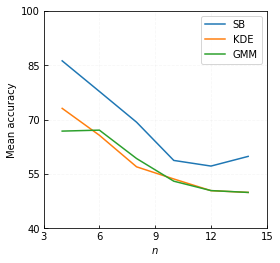

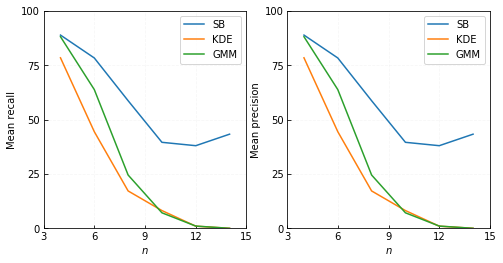

In [12]:
# no PCA

params = {
        'MAX_RUNS': 100,
        'size': -5,
        'scale': 0.5,
        'n_runs': 25,
        'n_samples': 200,
        'test_n_samples': 200,
        #'pca_n_components': 0.75,
        #'use_pca': False,
        'verbose': False,
    }
experiment_sweep_Rn(params)

In [10]:
# Scale in dimension of n

def experiment_sweep_Rn_v2(params={}):
    """
    Compares MCMC and KDE on simplex with a sweep over dimensions.
    Expecting to see the KDE completely fall apart at higher dimensions.
    """
    mcmc = [[], [], [], []]
    kde = [[], [], [], []]
    gmm = [[], [], [], []]
    results = []
    Rn = [4, 6, 8, 10, 12, 14]
    if params == {}:
        params = {
            'MAX_RUNS': 100,
            'size': -5,
            'scale': 0.5,
            'n_runs': 2,
            'n_samples': 200,
            'test_n_samples': 200,
            'pca_n_components': 0.8,
            'use_pca': True,
            'verbose': False,
        }
    
    for n in Rn:
        print('*'*80)
        print('Rn = {}'.format(n))
        print('*'*80)
        params['n'] = n
        summary = experiment_n_tries(params)
        mcmc[0].append(100 * summary['mcmc_acc'])
        kde[0].append(100 * summary['kde_acc'])
        gmm[0].append(100 * summary['gmm_acc'])
        mcmc[1].append(100 * summary['mcmc_tpr'])
        kde[1].append(100 * summary['kde_tpr'])
        gmm[1].append(100 * summary['gmm_tpr'])
        mcmc[2].append(100 * summary['mcmc_pre'])
        kde[2].append(100 * summary['kde_pre'])
        gmm[2].append(100 * summary['gmm_pre'])
        mcmc[3].append(100 * summary['mcmc_fpr'])
        kde[3].append(100 * summary['kde_fpr'])
        gmm[3].append(100 * summary['gmm_fpr'])
        results.append({
            'n': n,
            'mcmc_acc': summary['mcmc_acc'],
            'kde_acc': summary['kde_acc'],
            'gmm_acc': summary['gmm_acc'],
            'mcmc_rec': summary['mcmc_tpr'],
            'kde_rec': summary['kde_tpr'],
            'gmm_rec': summary['gmm_tpr'],
            'mcmc_pre': summary['mcmc_pre'],
            'kde_pre': summary['kde_pre'],
            'gmm_pre': summary['gmm_pre'],
            'mcmc_fpr': summary['mcmc_fpr'],
            'kde_fpr': summary['kde_fpr'],
            'gmm_fpr': summary['gmm_fpr'],
        })
    df = pd.DataFrame(results)
    pprint(df)
    df.to_csv('experiment_sweep_Rn_pca5.csv')

    fig, ax = plt.subplots(figsize=(4, 4))
    ax.plot(Rn, mcmc[0], label='SB')
    ax.plot(Rn, kde[0], label='KDE')
    ax.plot(Rn, gmm[0], label='GMM')
    ax.tick_params(direction='in')
    ax.grid(True, ls='--', alpha=0.1)
    ax.set(
        xlabel='$n$', 
        ylabel='Mean accuracy',
        xlim=(3, 15),
        xticks=[3, 6, 9, 12, 15],
        ylim=(0, 100),
        yticks=[0, 25, 50, 75, 100],
    )
    ax.legend(loc='upper right')
    save_settings = {
        'bbox_inches': 'tight',
        'dpi': 300,
    }
    fig.savefig(
        'img/sweep_Rn_pca5.eps',
        **save_settings,
    )
    
    fig_rec, ax_rec = plt.subplots(figsize=(4, 4))
    ax_rec.plot(Rn, mcmc[1], label='SB')
    ax_rec.plot(Rn, kde[1], label='KDE')
    ax_rec.plot(Rn, gmm[1], label='GMM')
    ax_rec.tick_params(direction='in')
    ax_rec.grid(True, ls='--', alpha=0.1)
    ax_rec.set(
        xlabel='$n$', 
        ylabel='Mean TPR',
        xlim=(3, 15),
        xticks=[3, 6, 9, 12, 15],
        ylim=(0, 100),
        yticks=[0, 25, 50, 75, 100],
    )
    ax_rec.legend(loc='upper right')
    fig_rec.savefig(
        'img/sweep_Rn_rec_pca5.eps',
        **save_settings,
    )
    
    fig_pre, ax_pre = plt.subplots(figsize=(4, 4))
    ax_pre.plot(Rn, mcmc[2], label='SB')
    ax_pre.plot(Rn, kde[2], label='KDE')
    ax_pre.plot(Rn, gmm[2], label='GMM')
    ax_pre.tick_params(direction='in')
    ax_pre.grid(True, ls='--', alpha=0.1)
    ax_pre.set(
        xlabel='$n$', 
        ylabel='Mean precision',
        xlim=(3, 15),
        xticks=[3, 6, 9, 12, 15],
        ylim=(0, 100),
        yticks=[0, 25, 50, 75, 100],
    )
    ax_pre.legend(loc='upper right')
    fig_pre.savefig(
        'img/sweep_Rn_pre_pca5.eps',
        **save_settings,
    )
    
    fig_fpr, ax_fpr = plt.subplots(figsize=(4, 4))
    ax_fpr.plot(Rn, mcmc[3], label='SB')
    ax_fpr.plot(Rn, kde[3], label='KDE')
    ax_fpr.plot(Rn, gmm[3], label='GMM')
    ax_fpr.tick_params(direction='in')
    ax_fpr.grid(True, ls='--', alpha=0.1)
    ax_fpr.set(
        xlabel='$n$', 
        ylabel='Mean FPR',
        xlim=(3, 15),
        xticks=[3, 6, 9, 12, 15],
        ylim=(0, 100),
        yticks=[0, 25, 50, 75, 100],
    )
    ax_fpr.legend(loc='upper right')
    fig_fpr.savefig(
        'img/sweep_Rn_fpr_pca5.eps',
        **save_settings,
    )

params = {
        'MAX_RUNS': 100,
        'size': -5,
        'scale': 0.5,
        'n_runs': 50,
        'n_samples': 200,
        'test_n_samples': 200,
        'pca_n_components': 0.75,
        'use_pca': False,
        'verbose': False,
    }
#experiment_sweep_Rn_v2(params)

  3%|▎         | 6/200 [00:00<00:03, 57.69it/s]

********************************************************************************
Rn = 4
********************************************************************************


  4%|▎         | 7/200 [00:00<00:03, 62.05it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:06<00:00, 31.48it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 71.60it/s]

Run [1, 0] - 	Scores:	GMM:0.524	KDE:0.529	MCMC:0.773


  4%|▍         | 8/200 [00:00<00:02, 72.25it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:08<00:00, 24.53it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▎         | 7/200 [00:00<00:02, 68.55it/s]

Run [2, 0] - 	Scores:	GMM:0.504	KDE:0.519	MCMC:0.865


  4%|▍         | 8/200 [00:00<00:02, 73.34it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:06<00:00, 30.19it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 73.86it/s]

Run [3, 0] - 	Scores:	GMM:0.546	KDE:0.561	MCMC:0.883


  4%|▎         | 7/200 [00:00<00:02, 69.04it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:03<00:00, 60.37it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▎         | 7/200 [00:00<00:02, 67.65it/s]

Run [4, 0] - 	Scores:	GMM:0.549	KDE:0.596	MCMC:0.965


  4%|▍         | 8/200 [00:00<00:02, 72.12it/s]

Generated 200 feasible and 200 infeasible for training.


100%|█████████▉| 199/200 [00:02<00:00, 66.53it/s]
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


Generated 201 feasible and 200 infeasible pts for testing.


/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)
  4%|▍         | 8/200 [00:00<00:02, 71.39it/s]

Run [5, 0] - 	Scores:	GMM:0.716	KDE:0.768	MCMC:0.885


  4%|▍         | 8/200 [00:00<00:02, 73.76it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:03<00:00, 58.88it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 70.52it/s]

Run [6, 0] - 	Scores:	GMM:0.613	KDE:0.618	MCMC:0.97


  4%|▍         | 8/200 [00:00<00:02, 71.43it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:07<00:00, 25.16it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▎         | 7/200 [00:00<00:02, 66.79it/s]

Run [7, 0] - 	Scores:	GMM:0.506	KDE:0.511	MCMC:0.873


  4%|▎         | 7/200 [00:00<00:02, 69.31it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:04<00:00, 49.08it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 74.90it/s]

Run [8, 0] - 	Scores:	GMM:0.601	KDE:0.721	MCMC:0.84


  4%|▍         | 8/200 [00:00<00:02, 72.59it/s]

Generated 200 feasible and 200 infeasible for training.


100%|█████████▉| 199/200 [00:03<00:00, 50.28it/s]
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


Generated 201 feasible and 200 infeasible pts for testing.


/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)
  4%|▍         | 8/200 [00:00<00:02, 73.90it/s]

Run [9, 0] - 	Scores:	GMM:0.531	KDE:0.531	MCMC:0.898


  4%|▍         | 8/200 [00:00<00:02, 75.85it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:06<00:00, 31.58it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 72.07it/s]

Run [10, 0] - 	Scores:	GMM:0.534	KDE:0.551	MCMC:0.86


  4%|▍         | 8/200 [00:00<00:02, 71.89it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:03<00:00, 53.42it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 72.20it/s]

Run [11, 0] - 	Scores:	GMM:0.658	KDE:0.706	MCMC:0.938


  4%|▎         | 7/200 [00:00<00:03, 62.09it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:03<00:00, 63.78it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 71.87it/s]

Run [12, 0] - 	Scores:	GMM:0.509	KDE:0.509	MCMC:0.94


  4%|▍         | 8/200 [00:00<00:02, 71.92it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:02<00:00, 70.74it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 70.89it/s]

Run [13, 0] - 	Scores:	GMM:0.559	KDE:0.569	MCMC:0.965


  4%|▎         | 7/200 [00:00<00:02, 67.80it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:02<00:00, 67.33it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 72.11it/s]

Run [14, 0] - 	Scores:	GMM:0.751	KDE:0.768	MCMC:0.8


  4%|▎         | 7/200 [00:00<00:02, 69.68it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:03<00:00, 63.16it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▎         | 7/200 [00:00<00:02, 69.57it/s]

Run [15, 0] - 	Scores:	GMM:0.524	KDE:0.596	MCMC:0.933


  4%|▍         | 8/200 [00:00<00:02, 73.11it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:03<00:00, 58.82it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 73.13it/s]

Run [16, 0] - 	Scores:	GMM:0.594	KDE:0.596	MCMC:0.786


  4%|▍         | 8/200 [00:00<00:02, 73.97it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:41<00:00,  4.80it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 69.78it/s]

Run [17, 0] - 	Scores:	GMM:0.566	KDE:0.566	MCMC:0.84


  4%|▍         | 8/200 [00:00<00:02, 74.53it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:03<00:00, 61.93it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▎         | 7/200 [00:00<00:02, 66.83it/s]

Run [18, 0] - 	Scores:	GMM:0.613	KDE:0.746	MCMC:0.925


  4%|▍         | 8/200 [00:00<00:02, 66.94it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:03<00:00, 62.60it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 72.11it/s]

Run [19, 0] - 	Scores:	GMM:0.516	KDE:0.564	MCMC:0.878


  4%|▍         | 8/200 [00:00<00:02, 71.10it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:04<00:00, 49.65it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 72.47it/s]

Run [20, 0] - 	Scores:	GMM:0.596	KDE:0.599	MCMC:0.91


  4%|▎         | 7/200 [00:00<00:02, 69.49it/s]

Generated 200 feasible and 200 infeasible for training.


100%|█████████▉| 199/200 [00:06<00:00, 30.25it/s]
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


Generated 201 feasible and 200 infeasible pts for testing.


/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)
  3%|▎         | 6/200 [00:00<00:03, 59.24it/s]

Run [21, 0] - 	Scores:	GMM:0.499	KDE:0.499	MCMC:0.768


  3%|▎         | 6/200 [00:00<00:03, 54.98it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:03<00:00, 63.55it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▎         | 7/200 [00:00<00:02, 69.27it/s]

Run [22, 0] - 	Scores:	GMM:0.631	KDE:0.628	MCMC:0.95


  4%|▎         | 7/200 [00:00<00:02, 69.61it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:07<00:00, 27.47it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 72.77it/s]

Run [23, 0] - 	Scores:	GMM:0.534	KDE:0.561	MCMC:0.875


  3%|▎         | 6/200 [00:00<00:03, 59.24it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:02<00:00, 68.79it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 72.63it/s]

Run [24, 0] - 	Scores:	GMM:0.681	KDE:0.678	MCMC:0.736


  4%|▍         | 8/200 [00:00<00:02, 72.72it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:05<00:00, 38.67it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 72.33it/s]

Run [25, 0] - 	Scores:	GMM:0.501	KDE:0.529	MCMC:0.913


  4%|▍         | 8/200 [00:00<00:02, 74.48it/s]

Generated 200 feasible and 200 infeasible for training.


100%|█████████▉| 199/200 [00:28<00:00,  6.86it/s]
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


Generated 201 feasible and 200 infeasible pts for testing.


/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)
  4%|▍         | 8/200 [00:00<00:02, 70.67it/s]

Run [26, 0] - 	Scores:	GMM:0.501	KDE:0.501	MCMC:0.756


  4%|▍         | 8/200 [00:00<00:02, 73.77it/s]

Generated 200 feasible and 200 infeasible for training.


100%|█████████▉| 199/200 [00:04<00:00, 46.96it/s]
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


Generated 201 feasible and 200 infeasible pts for testing.


/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)
  4%|▍         | 8/200 [00:00<00:02, 71.07it/s]

Run [27, 0] - 	Scores:	GMM:0.539	KDE:0.539	MCMC:0.905


  4%|▍         | 8/200 [00:00<00:02, 74.29it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:06<00:00, 33.03it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▎         | 7/200 [00:00<00:02, 69.32it/s]

Run [28, 0] - 	Scores:	GMM:0.566	KDE:0.566	MCMC:0.893


  4%|▍         | 8/200 [00:00<00:02, 74.46it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:03<00:00, 60.41it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 70.76it/s]

Run [29, 0] - 	Scores:	GMM:0.504	KDE:0.504	MCMC:0.92


  4%|▎         | 7/200 [00:00<00:02, 66.53it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:02<00:00, 68.90it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 70.91it/s]

Run [30, 0] - 	Scores:	GMM:0.566	KDE:0.608	MCMC:0.873


  4%|▍         | 8/200 [00:00<00:02, 71.42it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:05<00:00, 36.84it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 75.54it/s]

Run [31, 0] - 	Scores:	GMM:0.596	KDE:0.599	MCMC:0.796


  4%|▎         | 7/200 [00:00<00:03, 60.99it/s]

Generated 200 feasible and 200 infeasible for training.


100%|█████████▉| 199/200 [00:03<00:00, 64.32it/s]
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


Generated 201 feasible and 200 infeasible pts for testing.


/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)
  4%|▍         | 8/200 [00:00<00:02, 74.71it/s]

Run [32, 0] - 	Scores:	GMM:0.686	KDE:0.743	MCMC:0.853


  4%|▍         | 8/200 [00:00<00:02, 71.83it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:31<00:00,  6.37it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▎         | 7/200 [00:00<00:02, 64.98it/s]

Run [33, 0] - 	Scores:	GMM:0.506	KDE:0.506	MCMC:0.791


  4%|▍         | 8/200 [00:00<00:02, 72.00it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:02<00:00, 70.84it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 73.77it/s]

Run [34, 0] - 	Scores:	GMM:0.778	KDE:0.82	MCMC:0.92


  4%|▎         | 7/200 [00:00<00:02, 69.13it/s]

Generated 200 feasible and 200 infeasible for training.


100%|█████████▉| 199/200 [00:03<00:00, 62.80it/s]
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


Generated 201 feasible and 200 infeasible pts for testing.


/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)
  4%|▍         | 8/200 [00:00<00:02, 72.94it/s]

Run [35, 0] - 	Scores:	GMM:0.574	KDE:0.636	MCMC:0.868


  4%|▍         | 8/200 [00:00<00:02, 70.85it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:03<00:00, 49.95it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 72.00it/s]

Run [36, 0] - 	Scores:	GMM:0.561	KDE:0.574	MCMC:0.925


  4%|▎         | 7/200 [00:00<00:02, 69.77it/s]

Generated 200 feasible and 200 infeasible for training.


100%|█████████▉| 199/200 [01:23<00:00,  2.37it/s]
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


Generated 201 feasible and 200 infeasible pts for testing.


/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)
  4%|▍         | 8/200 [00:00<00:02, 73.25it/s]

Run [37, 0] - 	Scores:	GMM:0.524	KDE:0.529	MCMC:0.763


  4%|▍         | 8/200 [00:00<00:02, 74.77it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:07<00:00, 25.65it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▎         | 7/200 [00:00<00:02, 68.68it/s]

Run [38, 0] - 	Scores:	GMM:0.501	KDE:0.501	MCMC:0.768


  4%|▍         | 8/200 [00:00<00:02, 74.34it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:03<00:00, 51.00it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 72.64it/s]

Run [39, 0] - 	Scores:	GMM:0.504	KDE:0.516	MCMC:0.86


  4%|▍         | 8/200 [00:00<00:02, 74.12it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:03<00:00, 56.92it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 71.49it/s]

Run [40, 0] - 	Scores:	GMM:0.589	KDE:0.584	MCMC:0.848


  4%|▍         | 8/200 [00:00<00:02, 72.89it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:03<00:00, 50.07it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 73.22it/s]

Run [41, 0] - 	Scores:	GMM:0.633	KDE:0.666	MCMC:0.838


  4%|▍         | 8/200 [00:00<00:02, 71.35it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:04<00:00, 46.06it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 71.66it/s]

Run [42, 0] - 	Scores:	GMM:0.501	KDE:0.501	MCMC:0.82


  4%|▎         | 7/200 [00:00<00:02, 66.09it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:07<00:00, 26.60it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 72.76it/s]

Run [43, 0] - 	Scores:	GMM:0.544	KDE:0.579	MCMC:0.88


  4%|▍         | 8/200 [00:00<00:02, 72.40it/s]

Generated 200 feasible and 200 infeasible for training.


100%|█████████▉| 199/200 [00:03<00:00, 62.37it/s]
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


Generated 201 feasible and 200 infeasible pts for testing.


/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)
  4%|▍         | 8/200 [00:00<00:02, 75.35it/s]

Run [44, 0] - 	Scores:	GMM:0.718	KDE:0.748	MCMC:0.905


  3%|▎         | 6/200 [00:00<00:03, 58.78it/s]

Generated 200 feasible and 200 infeasible for training.


100%|█████████▉| 199/200 [00:04<00:00, 46.38it/s]
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


Generated 201 feasible and 200 infeasible pts for testing.


/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)
  4%|▎         | 7/200 [00:00<00:02, 67.77it/s]

Run [45, 0] - 	Scores:	GMM:0.476	KDE:0.476	MCMC:0.935


  4%|▍         | 8/200 [00:00<00:02, 73.19it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:03<00:00, 57.17it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 74.62it/s]

Run [46, 0] - 	Scores:	GMM:0.501	KDE:0.501	MCMC:0.853


  4%|▍         | 8/200 [00:00<00:02, 74.58it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:04<00:00, 44.16it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▎         | 7/200 [00:00<00:03, 60.75it/s]

Run [47, 0] - 	Scores:	GMM:0.529	KDE:0.559	MCMC:0.878


  4%|▍         | 8/200 [00:00<00:02, 73.81it/s]

Generated 200 feasible and 200 infeasible for training.


100%|█████████▉| 199/200 [00:03<00:00, 62.24it/s]
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


Generated 201 feasible and 200 infeasible pts for testing.


/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)
  4%|▎         | 7/200 [00:00<00:02, 68.99it/s]

Run [48, 0] - 	Scores:	GMM:0.571	KDE:0.576	MCMC:0.943


  4%|▍         | 8/200 [00:00<00:02, 73.75it/s]

Generated 200 feasible and 200 infeasible for training.


100%|█████████▉| 199/200 [00:12<00:00, 16.01it/s]
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


Generated 201 feasible and 200 infeasible pts for testing.


/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)
  4%|▎         | 7/200 [00:00<00:02, 68.55it/s]

Run [49, 0] - 	Scores:	GMM:0.536	KDE:0.576	MCMC:0.883


  4%|▍         | 8/200 [00:00<00:02, 74.21it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:04<00:00, 40.12it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 70.72it/s]

Run [50, 0] - 	Scores:	GMM:0.506	KDE:0.506	MCMC:0.893
********************************************************************************
Rn = 6
********************************************************************************


  4%|▍         | 8/200 [00:00<00:02, 71.64it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:03<00:00, 63.90it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 72.72it/s]

Run [1, 0] - 	Scores:	GMM:0.574	KDE:0.574	MCMC:0.928


  4%|▍         | 8/200 [00:00<00:02, 73.38it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:02<00:00, 68.60it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 71.32it/s]

Run [2, 0] - 	Scores:	GMM:0.748	KDE:0.738	MCMC:0.933


  4%|▍         | 8/200 [00:00<00:02, 74.24it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:31<00:00,  6.27it/s]


Generated 202 feasible and 199 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 72.41it/s]

Run [3, 0] - 	Scores:	GMM:0.479	KDE:0.481	MCMC:0.681


  4%|▍         | 8/200 [00:00<00:02, 70.21it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:10<00:00, 18.44it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 72.43it/s]

Run [4, 0] - 	Scores:	GMM:0.501	KDE:0.501	MCMC:0.761


  4%|▍         | 8/200 [00:00<00:02, 71.24it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:03<00:00, 57.89it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 72.85it/s]

Run [5, 0] - 	Scores:	GMM:0.504	KDE:0.504	MCMC:0.666


  4%|▎         | 7/200 [00:00<00:02, 69.49it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:02<00:00, 68.42it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▎         | 7/200 [00:00<00:02, 68.70it/s]

Run [6, 0] - 	Scores:	GMM:0.524	KDE:0.526	MCMC:0.933


  4%|▍         | 8/200 [00:00<00:02, 72.44it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:19<00:00, 10.44it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 70.92it/s]

Run [7, 0] - 	Scores:	GMM:0.529	KDE:0.529	MCMC:0.643


  4%|▍         | 8/200 [00:00<00:02, 72.78it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:21<00:00,  9.45it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 70.30it/s]

Run [8, 0] - 	Scores:	GMM:0.506	KDE:0.529	MCMC:0.663


  4%|▍         | 8/200 [00:00<00:02, 71.69it/s]

Generated 200 feasible and 200 infeasible for training.


100%|█████████▉| 199/200 [00:02<00:00, 68.05it/s]
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


Generated 201 feasible and 200 infeasible pts for testing.


/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)
  4%|▎         | 7/200 [00:00<00:02, 65.63it/s]

Run [9, 0] - 	Scores:	GMM:0.688	KDE:0.743	MCMC:0.96


  4%|▍         | 8/200 [00:00<00:02, 71.52it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:02<00:00, 69.13it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▎         | 7/200 [00:00<00:02, 69.94it/s]

Run [10, 0] - 	Scores:	GMM:0.521	KDE:0.608	MCMC:0.781


  4%|▎         | 7/200 [00:00<00:02, 64.98it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:02<00:00, 67.10it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▎         | 7/200 [00:00<00:03, 63.50it/s]

Run [11, 0] - 	Scores:	GMM:0.589	KDE:0.646	MCMC:0.853


  4%|▍         | 8/200 [00:00<00:02, 72.40it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:04<00:00, 45.30it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  3%|▎         | 6/200 [00:00<00:03, 58.10it/s]

Run [12, 0] - 	Scores:	GMM:0.549	KDE:0.549	MCMC:0.666


  4%|▎         | 7/200 [00:00<00:03, 64.04it/s]

Generated 200 feasible and 200 infeasible for training.


100%|█████████▉| 199/200 [00:04<00:00, 41.55it/s]
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


Generated 201 feasible and 200 infeasible pts for testing.


/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)
  4%|▍         | 8/200 [00:00<00:02, 71.43it/s]

Run [13, 0] - 	Scores:	GMM:0.501	KDE:0.501	MCMC:0.736


  4%|▍         | 8/200 [00:00<00:02, 73.68it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:02<00:00, 68.56it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 71.40it/s]

Run [14, 0] - 	Scores:	GMM:0.648	KDE:0.651	MCMC:0.945


  4%|▍         | 8/200 [00:00<00:02, 71.61it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:03<00:00, 62.50it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 74.23it/s]

Run [15, 0] - 	Scores:	GMM:0.514	KDE:0.514	MCMC:0.738


  4%|▍         | 8/200 [00:00<00:02, 73.62it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:02<00:00, 66.99it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 70.78it/s]

Run [16, 0] - 	Scores:	GMM:0.549	KDE:0.576	MCMC:0.88


  4%|▍         | 8/200 [00:00<00:02, 71.18it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [02:04<00:00,  1.60it/s]


Generated 202 feasible and 199 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 73.70it/s]

Run [17, 0] - 	Scores:	GMM:0.514	KDE:0.514	MCMC:0.638


  4%|▍         | 8/200 [00:00<00:02, 72.88it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:03<00:00, 63.32it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 71.99it/s]

Run [18, 0] - 	Scores:	GMM:0.451	KDE:0.451	MCMC:0.948


  4%|▍         | 8/200 [00:00<00:02, 73.32it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:02<00:00, 71.69it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 73.65it/s]

Run [19, 0] - 	Scores:	GMM:0.536	KDE:0.596	MCMC:0.686


  4%|▍         | 8/200 [00:00<00:02, 71.92it/s]

Generated 200 feasible and 200 infeasible for training.


100%|█████████▉| 199/200 [00:03<00:00, 62.17it/s]
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


Generated 201 feasible and 200 infeasible pts for testing.


/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)
  4%|▍         | 8/200 [00:00<00:02, 71.03it/s]

Run [20, 0] - 	Scores:	GMM:0.509	KDE:0.506	MCMC:0.843


  4%|▍         | 8/200 [00:00<00:02, 72.69it/s]

Generated 200 feasible and 200 infeasible for training.


100%|█████████▉| 199/200 [00:05<00:00, 39.58it/s]
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


Generated 201 feasible and 200 infeasible pts for testing.


/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)
  4%|▍         | 8/200 [00:00<00:02, 70.72it/s]

Run [21, 0] - 	Scores:	GMM:0.524	KDE:0.524	MCMC:0.783


  4%|▍         | 8/200 [00:00<00:02, 72.09it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:03<00:00, 64.80it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 72.87it/s]

Run [22, 0] - 	Scores:	GMM:0.586	KDE:0.586	MCMC:0.965


  4%|▍         | 8/200 [00:00<00:02, 74.22it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:02<00:00, 68.07it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 71.42it/s]

Run [23, 0] - 	Scores:	GMM:0.526	KDE:0.526	MCMC:0.94


  4%|▍         | 8/200 [00:00<00:02, 72.31it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:07<00:00, 28.12it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 72.82it/s]

Run [24, 0] - 	Scores:	GMM:0.501	KDE:0.501	MCMC:0.544


  4%|▍         | 8/200 [00:00<00:02, 72.02it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:03<00:00, 63.88it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 74.35it/s]

Run [25, 0] - 	Scores:	GMM:0.656	KDE:0.646	MCMC:0.943


  4%|▍         | 8/200 [00:00<00:02, 74.78it/s]

Generated 200 feasible and 200 infeasible for training.


100%|█████████▉| 199/200 [00:03<00:00, 65.23it/s]
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


Generated 201 feasible and 200 infeasible pts for testing.


/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)
  4%|▍         | 8/200 [00:00<00:02, 72.60it/s]

Run [26, 0] - 	Scores:	GMM:0.516	KDE:0.516	MCMC:0.494


  4%|▍         | 8/200 [00:00<00:02, 72.68it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:04<00:00, 45.56it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 72.14it/s]

Run [27, 0] - 	Scores:	GMM:0.501	KDE:0.501	MCMC:0.845


  4%|▍         | 8/200 [00:00<00:02, 72.45it/s]

Generated 200 feasible and 200 infeasible for training.


100%|█████████▉| 199/200 [00:02<00:00, 68.31it/s]
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


Generated 201 feasible and 200 infeasible pts for testing.


/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)
  4%|▍         | 8/200 [00:00<00:02, 73.07it/s]

Run [28, 0] - 	Scores:	GMM:0.576	KDE:0.556	MCMC:0.641


  4%|▍         | 8/200 [00:00<00:02, 72.64it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:02<00:00, 71.59it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 72.82it/s]

Run [29, 0] - 	Scores:	GMM:0.88	KDE:0.948	MCMC:0.771


  4%|▍         | 8/200 [00:00<00:02, 74.64it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:04<00:00, 39.95it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 73.89it/s]

Run [30, 0] - 	Scores:	GMM:0.506	KDE:0.406	MCMC:0.865


  4%|▍         | 8/200 [00:00<00:02, 73.68it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:08<00:00, 22.40it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 70.82it/s]

Run [31, 0] - 	Scores:	GMM:0.501	KDE:0.501	MCMC:0.668


  4%|▍         | 8/200 [00:00<00:02, 73.56it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:03<00:00, 61.03it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 73.03it/s]

Run [32, 0] - 	Scores:	GMM:0.621	KDE:0.646	MCMC:0.8


  4%|▍         | 8/200 [00:00<00:02, 71.62it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:06<00:00, 30.66it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▎         | 7/200 [00:00<00:02, 68.04it/s]

Run [33, 0] - 	Scores:	GMM:0.501	KDE:0.501	MCMC:0.838


  4%|▍         | 8/200 [00:00<00:02, 73.14it/s]

Generated 201 feasible and 201 infeasible for training.


 75%|███████▌  | 150/200 [02:20<00:46,  1.07it/s]


Generated 201 feasible and 151 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 72.18it/s]

Run [34, 0] - 	Scores:	GMM:0.534	KDE:0.534	MCMC:0.599


  4%|▍         | 8/200 [00:00<00:02, 70.93it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:02<00:00, 68.07it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 74.11it/s]

Run [35, 0] - 	Scores:	GMM:0.666	KDE:0.781	MCMC:0.9


  4%|▍         | 8/200 [00:00<00:02, 72.40it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:03<00:00, 60.41it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▎         | 7/200 [00:00<00:02, 68.24it/s]

Run [36, 0] - 	Scores:	GMM:0.636	KDE:0.636	MCMC:0.773


  4%|▍         | 8/200 [00:00<00:02, 72.16it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:05<00:00, 34.23it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 71.70it/s]

Run [37, 0] - 	Scores:	GMM:0.501	KDE:0.501	MCMC:0.706


  4%|▎         | 7/200 [00:00<00:02, 69.01it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:02<00:00, 68.20it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 71.38it/s]

Run [38, 0] - 	Scores:	GMM:0.843	KDE:0.835	MCMC:0.965


  4%|▍         | 8/200 [00:00<00:02, 72.86it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:03<00:00, 64.61it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▎         | 7/200 [00:00<00:02, 68.25it/s]

Run [39, 0] - 	Scores:	GMM:0.511	KDE:0.511	MCMC:0.781


  4%|▍         | 8/200 [00:00<00:02, 72.77it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:12<00:00, 16.32it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▎         | 7/200 [00:00<00:02, 67.70it/s]

Run [40, 0] - 	Scores:	GMM:0.514	KDE:0.556	MCMC:0.763


  4%|▍         | 8/200 [00:00<00:02, 73.11it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:02<00:00, 66.40it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 71.23it/s]

Run [41, 0] - 	Scores:	GMM:0.501	KDE:0.501	MCMC:0.868


  4%|▎         | 7/200 [00:00<00:02, 69.71it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:03<00:00, 65.96it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  3%|▎         | 6/200 [00:00<00:03, 52.72it/s]

Run [42, 0] - 	Scores:	GMM:0.504	KDE:0.516	MCMC:0.504


  4%|▎         | 7/200 [00:00<00:03, 62.61it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:03<00:00, 64.86it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▎         | 7/200 [00:00<00:02, 66.67it/s]

Run [43, 0] - 	Scores:	GMM:0.713	KDE:0.781	MCMC:0.893


  4%|▍         | 8/200 [00:00<00:02, 71.67it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:02<00:00, 68.12it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 71.20it/s]

Run [44, 0] - 	Scores:	GMM:0.551	KDE:0.551	MCMC:0.938


  4%|▍         | 8/200 [00:00<00:02, 73.95it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:03<00:00, 65.23it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 71.98it/s]

Run [45, 0] - 	Scores:	GMM:0.618	KDE:0.618	MCMC:0.92


  4%|▎         | 7/200 [00:00<00:02, 67.85it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:04<00:00, 47.47it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 71.69it/s]

Run [46, 0] - 	Scores:	GMM:0.504	KDE:0.504	MCMC:0.726


  4%|▎         | 7/200 [00:00<00:02, 69.32it/s]

Generated 200 feasible and 200 infeasible for training.


100%|█████████▉| 199/200 [00:03<00:00, 60.09it/s]
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


Generated 201 feasible and 200 infeasible pts for testing.


/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)
  4%|▍         | 8/200 [00:00<00:02, 71.19it/s]

Run [47, 0] - 	Scores:	GMM:0.549	KDE:0.566	MCMC:0.758


  4%|▎         | 7/200 [00:00<00:02, 69.27it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:02<00:00, 70.63it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▎         | 7/200 [00:00<00:02, 69.56it/s]

Run [48, 0] - 	Scores:	GMM:0.711	KDE:0.708	MCMC:0.955


  4%|▍         | 8/200 [00:00<00:02, 72.78it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:02<00:00, 70.00it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 70.02it/s]

Run [49, 0] - 	Scores:	GMM:0.586	KDE:0.586	MCMC:0.878


  4%|▍         | 8/200 [00:00<00:02, 71.29it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:04<00:00, 47.92it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▎         | 7/200 [00:00<00:02, 68.31it/s]

Run [50, 0] - 	Scores:	GMM:0.501	KDE:0.501	MCMC:0.623
********************************************************************************
Rn = 8
********************************************************************************


  4%|▍         | 8/200 [00:00<00:02, 71.52it/s]

Generated 200 feasible and 200 infeasible for training.


100%|█████████▉| 199/200 [00:02<00:00, 68.08it/s]
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


Generated 201 feasible and 200 infeasible pts for testing.


/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)
  4%|▎         | 7/200 [00:00<00:02, 69.48it/s]

Run [1, 0] - 	Scores:	GMM:0.825	KDE:0.82	MCMC:0.945


  4%|▎         | 7/200 [00:00<00:02, 66.43it/s]

Generated 200 feasible and 200 infeasible for training.


100%|█████████▉| 199/200 [00:03<00:00, 63.31it/s]
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


Generated 201 feasible and 200 infeasible pts for testing.


/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)
  4%|▎         | 7/200 [00:00<00:02, 67.93it/s]

Run [2, 0] - 	Scores:	GMM:0.529	KDE:0.521	MCMC:0.736


  4%|▎         | 7/200 [00:00<00:02, 69.26it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:03<00:00, 65.03it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  3%|▎         | 6/200 [00:00<00:03, 58.78it/s]

Run [3, 0] - 	Scores:	GMM:0.546	KDE:0.546	MCMC:0.571


  4%|▍         | 8/200 [00:00<00:02, 69.08it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:03<00:00, 65.24it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▎         | 7/200 [00:00<00:02, 68.35it/s]

Run [4, 0] - 	Scores:	GMM:0.733	KDE:0.736	MCMC:0.86


  4%|▎         | 7/200 [00:00<00:02, 68.86it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:09<00:00, 21.22it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▎         | 7/200 [00:00<00:02, 66.42it/s]

Run [5, 0] - 	Scores:	GMM:0.501	KDE:0.501	MCMC:0.414


  4%|▍         | 8/200 [00:00<00:02, 71.23it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:02<00:00, 69.89it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 70.44it/s]

Run [6, 0] - 	Scores:	GMM:0.302	KDE:0.287	MCMC:0.444


  4%|▍         | 8/200 [00:00<00:02, 70.08it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:03<00:00, 57.79it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▎         | 7/200 [00:00<00:02, 69.75it/s]

Run [7, 0] - 	Scores:	GMM:0.643	KDE:0.643	MCMC:0.544


  4%|▍         | 8/200 [00:00<00:02, 71.86it/s]

Generated 200 feasible and 200 infeasible for training.


100%|█████████▉| 199/200 [00:03<00:00, 50.21it/s]
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


Generated 201 feasible and 200 infeasible pts for testing.


/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)
  4%|▍         | 8/200 [00:00<00:02, 73.20it/s]

Run [8, 0] - 	Scores:	GMM:0.504	KDE:0.504	MCMC:0.753


  4%|▍         | 8/200 [00:00<00:02, 73.36it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:02<00:00, 70.87it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 70.60it/s]

Run [9, 0] - 	Scores:	GMM:0.501	KDE:0.501	MCMC:0.603


  4%|▍         | 8/200 [00:00<00:02, 71.14it/s]

Generated 200 feasible and 200 infeasible for training.


100%|█████████▉| 199/200 [00:03<00:00, 64.87it/s]
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


Generated 201 feasible and 200 infeasible pts for testing.


/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)
  4%|▍         | 8/200 [00:00<00:02, 72.30it/s]

Run [10, 0] - 	Scores:	GMM:0.501	KDE:0.501	MCMC:0.661


  4%|▍         | 8/200 [00:00<00:02, 71.76it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:03<00:00, 58.05it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 70.58it/s]

Run [11, 0] - 	Scores:	GMM:0.501	KDE:0.501	MCMC:0.833


  4%|▍         | 8/200 [00:00<00:02, 70.58it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:02<00:00, 69.74it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 70.80it/s]

Run [12, 0] - 	Scores:	GMM:0.589	KDE:0.589	MCMC:0.91


  4%|▎         | 7/200 [00:00<00:02, 68.49it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:12<00:00, 16.12it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▎         | 7/200 [00:00<00:02, 68.36it/s]

Run [13, 0] - 	Scores:	GMM:0.501	KDE:0.501	MCMC:0.561


  4%|▎         | 7/200 [00:00<00:02, 68.75it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:03<00:00, 64.84it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 72.24it/s]

Run [14, 0] - 	Scores:	GMM:0.536	KDE:0.471	MCMC:0.574


  4%|▎         | 7/200 [00:00<00:02, 68.35it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:03<00:00, 49.78it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▎         | 7/200 [00:00<00:03, 61.12it/s]

Run [15, 0] - 	Scores:	GMM:0.541	KDE:0.541	MCMC:0.327


  4%|▎         | 7/200 [00:00<00:02, 67.48it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:03<00:00, 64.96it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▎         | 7/200 [00:00<00:02, 64.71it/s]

Run [16, 0] - 	Scores:	GMM:0.681	KDE:0.681	MCMC:0.97


  4%|▍         | 8/200 [00:00<00:02, 70.95it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:02<00:00, 66.55it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▎         | 7/200 [00:00<00:02, 69.70it/s]

Run [17, 0] - 	Scores:	GMM:0.511	KDE:0.516	MCMC:0.973


  4%|▍         | 8/200 [00:00<00:02, 68.83it/s]

Generated 200 feasible and 200 infeasible for training.


100%|█████████▉| 199/200 [00:02<00:00, 68.62it/s]
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


Generated 201 feasible and 200 infeasible pts for testing.


/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)
  4%|▍         | 8/200 [00:00<00:02, 72.34it/s]

Run [18, 0] - 	Scores:	GMM:0.621	KDE:0.648	MCMC:0.95


  4%|▍         | 8/200 [00:00<00:02, 71.35it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:03<00:00, 66.20it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 72.14it/s]

Run [19, 0] - 	Scores:	GMM:0.496	KDE:0.499	MCMC:0.499


  4%|▍         | 8/200 [00:00<00:02, 73.11it/s]

Generated 200 feasible and 200 infeasible for training.


100%|█████████▉| 199/200 [00:02<00:00, 69.01it/s]
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


Generated 201 feasible and 200 infeasible pts for testing.


/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)
  4%|▎         | 7/200 [00:00<00:02, 64.80it/s]

Run [20, 0] - 	Scores:	GMM:0.596	KDE:0.594	MCMC:0.716


  4%|▍         | 8/200 [00:00<00:02, 72.06it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:02<00:00, 68.85it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▎         | 7/200 [00:00<00:02, 66.76it/s]

Run [21, 0] - 	Scores:	GMM:0.501	KDE:0.501	MCMC:0.666


  4%|▎         | 7/200 [00:00<00:02, 68.67it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:02<00:00, 67.60it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 71.43it/s]

Run [22, 0] - 	Scores:	GMM:0.723	KDE:0.726	MCMC:0.963


  4%|▍         | 8/200 [00:00<00:02, 72.87it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:08<00:00, 24.74it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 72.49it/s]

Run [23, 0] - 	Scores:	GMM:0.501	KDE:0.501	MCMC:0.878


  4%|▍         | 8/200 [00:00<00:02, 72.06it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:03<00:00, 60.24it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 70.84it/s]

Run [24, 0] - 	Scores:	GMM:0.501	KDE:0.501	MCMC:0.771


  4%|▍         | 8/200 [00:00<00:02, 71.27it/s]

Generated 199 feasible and 199 infeasible for training.


100%|█████████▉| 199/200 [00:02<00:00, 69.06it/s]
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


Generated 201 feasible and 200 infeasible pts for testing.


/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)
  4%|▍         | 8/200 [00:00<00:02, 71.55it/s]

Run [25, 0] - 	Scores:	GMM:0.708	KDE:0.708	MCMC:0.546


  4%|▍         | 8/200 [00:00<00:02, 72.80it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:02<00:00, 70.13it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 70.42it/s]

Run [26, 0] - 	Scores:	GMM:0.516	KDE:0.516	MCMC:0.529


  4%|▎         | 7/200 [00:00<00:02, 69.65it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:04<00:00, 47.69it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 70.51it/s]

Run [27, 0] - 	Scores:	GMM:0.501	KDE:0.501	MCMC:0.708


  4%|▍         | 8/200 [00:00<00:02, 70.06it/s]

Generated 200 feasible and 200 infeasible for training.


100%|█████████▉| 199/200 [00:02<00:00, 68.60it/s]
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


Generated 201 feasible and 200 infeasible pts for testing.


/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)
  4%|▍         | 8/200 [00:00<00:02, 73.94it/s]

Run [28, 0] - 	Scores:	GMM:0.81	KDE:0.813	MCMC:0.898


  4%|▎         | 7/200 [00:00<00:02, 68.81it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:03<00:00, 49.98it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 71.16it/s]

Run [29, 0] - 	Scores:	GMM:0.501	KDE:0.501	MCMC:0.663


  4%|▎         | 7/200 [00:00<00:02, 69.32it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:02<00:00, 68.14it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 72.19it/s]

Run [30, 0] - 	Scores:	GMM:0.698	KDE:0.698	MCMC:0.91


  4%|▍         | 8/200 [00:00<00:02, 70.83it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:05<00:00, 33.97it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▎         | 7/200 [00:00<00:02, 65.68it/s]

Run [31, 0] - 	Scores:	GMM:0.471	KDE:0.471	MCMC:0.848


  4%|▍         | 8/200 [00:00<00:02, 70.72it/s]

Generated 200 feasible and 200 infeasible for training.


100%|█████████▉| 199/200 [00:02<00:00, 69.63it/s]
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


Generated 201 feasible and 200 infeasible pts for testing.


/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)
  4%|▎         | 7/200 [00:00<00:02, 66.49it/s]

Run [32, 0] - 	Scores:	GMM:0.656	KDE:0.656	MCMC:0.464


  4%|▎         | 7/200 [00:00<00:02, 64.41it/s]

Generated 200 feasible and 200 infeasible for training.


100%|█████████▉| 199/200 [00:03<00:00, 52.60it/s]
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


Generated 201 feasible and 200 infeasible pts for testing.


/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)
  4%|▎         | 7/200 [00:00<00:02, 69.38it/s]

Run [33, 0] - 	Scores:	GMM:0.489	KDE:0.476	MCMC:0.544


  4%|▍         | 8/200 [00:00<00:02, 71.20it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:14<00:00, 13.40it/s]


Generated 202 feasible and 199 infeasible pts for testing.


  3%|▎         | 6/200 [00:00<00:03, 55.66it/s]

Run [34, 0] - 	Scores:	GMM:0.504	KDE:0.504	MCMC:0.439


  4%|▍         | 8/200 [00:00<00:02, 70.86it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:02<00:00, 69.13it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 69.87it/s]

Run [35, 0] - 	Scores:	GMM:0.638	KDE:0.658	MCMC:0.913


  4%|▍         | 8/200 [00:00<00:02, 70.24it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:02<00:00, 69.50it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▎         | 7/200 [00:00<00:02, 69.87it/s]

Run [36, 0] - 	Scores:	GMM:0.544	KDE:0.541	MCMC:0.883


  4%|▍         | 8/200 [00:00<00:02, 70.79it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:04<00:00, 39.92it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▎         | 7/200 [00:00<00:02, 67.89it/s]

Run [37, 0] - 	Scores:	GMM:0.501	KDE:0.501	MCMC:0.504


  4%|▎         | 7/200 [00:00<00:02, 67.82it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:02<00:00, 68.76it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 70.65it/s]

Run [38, 0] - 	Scores:	GMM:0.481	KDE:0.476	MCMC:0.9


  4%|▍         | 8/200 [00:00<00:02, 71.51it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:03<00:00, 66.02it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▎         | 7/200 [00:00<00:02, 66.65it/s]

Run [39, 0] - 	Scores:	GMM:0.504	KDE:0.504	MCMC:0.566


  4%|▎         | 7/200 [00:00<00:02, 69.97it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:02<00:00, 67.24it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 71.14it/s]

Run [40, 0] - 	Scores:	GMM:0.511	KDE:0.504	MCMC:0.903


  4%|▍         | 8/200 [00:00<00:02, 71.98it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:02<00:00, 67.17it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 71.77it/s]

Run [41, 0] - 	Scores:	GMM:0.626	KDE:0.603	MCMC:0.94


  4%|▍         | 8/200 [00:00<00:02, 71.95it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:02<00:00, 66.90it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▎         | 7/200 [00:00<00:02, 66.02it/s]

Run [42, 0] - 	Scores:	GMM:0.551	KDE:0.551	MCMC:0.678


  4%|▍         | 8/200 [00:00<00:02, 70.76it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:03<00:00, 66.01it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▎         | 7/200 [00:00<00:02, 69.44it/s]

Run [43, 0] - 	Scores:	GMM:0.501	KDE:0.501	MCMC:0.354


  4%|▎         | 7/200 [00:00<00:02, 69.99it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:03<00:00, 66.18it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 70.71it/s]

Run [44, 0] - 	Scores:	GMM:0.511	KDE:0.511	MCMC:0.858


  4%|▎         | 7/200 [00:00<00:02, 68.76it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:03<00:00, 65.21it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▎         | 7/200 [00:00<00:02, 66.93it/s]

Run [45, 0] - 	Scores:	GMM:0.496	KDE:0.494	MCMC:0.484


  4%|▎         | 7/200 [00:00<00:02, 69.94it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:03<00:00, 64.79it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 70.43it/s]

Run [46, 0] - 	Scores:	GMM:0.529	KDE:0.529	MCMC:0.82


  4%|▍         | 8/200 [00:00<00:02, 70.56it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:03<00:00, 63.52it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  3%|▎         | 6/200 [00:00<00:03, 54.31it/s]

Run [47, 0] - 	Scores:	GMM:0.758	KDE:0.723	MCMC:0.85


  4%|▍         | 8/200 [00:00<00:02, 70.80it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:02<00:00, 67.36it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▎         | 7/200 [00:00<00:02, 69.34it/s]

Run [48, 0] - 	Scores:	GMM:0.504	KDE:0.504	MCMC:0.868


  4%|▎         | 7/200 [00:00<00:02, 66.44it/s]

Generated 199 feasible and 199 infeasible for training.


100%|█████████▉| 199/200 [00:02<00:00, 69.22it/s]
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


Generated 201 feasible and 200 infeasible pts for testing.


/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)
  4%|▎         | 7/200 [00:00<00:02, 69.42it/s]

Run [49, 0] - 	Scores:	GMM:0.693	KDE:0.693	MCMC:0.758


  4%|▍         | 8/200 [00:00<00:02, 70.61it/s]

Generated 200 feasible and 200 infeasible for training.


100%|█████████▉| 199/200 [00:07<00:00, 27.43it/s]
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


Generated 201 feasible and 200 infeasible pts for testing.


/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)
  4%|▎         | 7/200 [00:00<00:02, 69.10it/s]

Run [50, 0] - 	Scores:	GMM:0.501	KDE:0.501	MCMC:0.606
********************************************************************************
Rn = 10
********************************************************************************


  3%|▎         | 6/200 [00:00<00:03, 57.03it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:02<00:00, 66.45it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▎         | 7/200 [00:00<00:03, 63.82it/s]

Run [1, 0] - 	Scores:	GMM:0.504	KDE:0.501	MCMC:0.504


  4%|▍         | 8/200 [00:00<00:02, 69.36it/s]

Generated 199 feasible and 199 infeasible for training.


100%|█████████▉| 199/200 [00:03<00:00, 63.32it/s]
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


Generated 201 feasible and 200 infeasible pts for testing.


/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)
  4%|▍         | 8/200 [00:00<00:02, 72.24it/s]

Run [2, 0] - 	Scores:	GMM:0.646	KDE:0.646	MCMC:0.566


  4%|▎         | 7/200 [00:00<00:02, 68.16it/s]

Generated 200 feasible and 200 infeasible for training.


100%|█████████▉| 199/200 [00:02<00:00, 69.09it/s]
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


Generated 201 feasible and 200 infeasible pts for testing.


/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)
  4%|▎         | 7/200 [00:00<00:02, 68.53it/s]

Run [3, 0] - 	Scores:	GMM:0.501	KDE:0.501	MCMC:0.661


  3%|▎         | 6/200 [00:00<00:03, 55.54it/s]

Generated 198 feasible and 198 infeasible for training.


100%|█████████▉| 199/200 [00:03<00:00, 65.28it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 71.84it/s]

Run [4, 0] - 	Scores:	GMM:0.611	KDE:0.611	MCMC:0.618


  4%|▎         | 7/200 [00:00<00:02, 65.65it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:03<00:00, 62.62it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▎         | 7/200 [00:00<00:03, 62.78it/s]

Run [5, 0] - 	Scores:	GMM:0.636	KDE:0.636	MCMC:0.584


  3%|▎         | 6/200 [00:00<00:03, 53.25it/s]

Generated 200 feasible and 200 infeasible for training.


100%|█████████▉| 199/200 [00:04<00:00, 48.57it/s]
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


Generated 201 feasible and 200 infeasible pts for testing.


/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)
  4%|▎         | 7/200 [00:00<00:02, 64.74it/s]

Run [6, 0] - 	Scores:	GMM:0.501	KDE:0.501	MCMC:0.741


  4%|▎         | 7/200 [00:00<00:02, 68.22it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:03<00:00, 53.83it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▎         | 7/200 [00:00<00:02, 68.16it/s]

Run [7, 0] - 	Scores:	GMM:0.349	KDE:0.349	MCMC:0.499


  4%|▎         | 7/200 [00:00<00:03, 62.76it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:02<00:00, 67.35it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 70.32it/s]

Run [8, 0] - 	Scores:	GMM:0.616	KDE:0.613	MCMC:0.708


  4%|▎         | 7/200 [00:00<00:02, 68.16it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:02<00:00, 66.71it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 70.64it/s]

Run [9, 0] - 	Scores:	GMM:0.499	KDE:0.499	MCMC:0.499


  4%|▍         | 8/200 [00:00<00:02, 69.76it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:03<00:00, 49.75it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▎         | 7/200 [00:00<00:02, 66.42it/s]

Run [10, 0] - 	Scores:	GMM:0.501	KDE:0.501	MCMC:0.559


  4%|▎         | 7/200 [00:00<00:02, 64.93it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:04<00:00, 40.65it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▎         | 7/200 [00:00<00:02, 65.81it/s]

Run [11, 0] - 	Scores:	GMM:0.501	KDE:0.501	MCMC:0.521


  4%|▍         | 8/200 [00:00<00:02, 68.17it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:02<00:00, 68.03it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▎         | 7/200 [00:00<00:02, 68.18it/s]

Run [12, 0] - 	Scores:	GMM:0.823	KDE:0.8	MCMC:0.092


  4%|▎         | 7/200 [00:00<00:02, 67.09it/s]

Generated 200 feasible and 200 infeasible for training.


100%|█████████▉| 199/200 [00:03<00:00, 65.27it/s]
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


Generated 201 feasible and 200 infeasible pts for testing.


/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)
  4%|▍         | 8/200 [00:00<00:02, 71.26it/s]

Run [13, 0] - 	Scores:	GMM:0.499	KDE:0.499	MCMC:0.499


  4%|▎         | 7/200 [00:00<00:02, 68.38it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:02<00:00, 68.83it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▎         | 7/200 [00:00<00:02, 69.61it/s]

Run [14, 0] - 	Scores:	GMM:0.476	KDE:0.476	MCMC:0.843


  4%|▎         | 7/200 [00:00<00:02, 67.70it/s]

Generated 200 feasible and 200 infeasible for training.


100%|█████████▉| 199/200 [00:02<00:00, 68.63it/s]
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


Generated 201 feasible and 200 infeasible pts for testing.


/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)
  4%|▍         | 8/200 [00:00<00:02, 71.85it/s]

Run [15, 0] - 	Scores:	GMM:0.499	KDE:0.499	MCMC:0.499


  4%|▍         | 8/200 [00:00<00:02, 70.62it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:02<00:00, 68.13it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 69.93it/s]

Run [16, 0] - 	Scores:	GMM:0.476	KDE:0.469	MCMC:0.808


  4%|▎         | 7/200 [00:00<00:02, 65.20it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:03<00:00, 57.14it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 70.58it/s]

Run [17, 0] - 	Scores:	GMM:0.499	KDE:0.499	MCMC:0.581


  4%|▎         | 7/200 [00:00<00:02, 67.75it/s]

Generated 199 feasible and 199 infeasible for training.


100%|█████████▉| 199/200 [00:02<00:00, 68.60it/s]
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


Generated 201 feasible and 200 infeasible pts for testing.


/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)
  4%|▎         | 7/200 [00:00<00:03, 63.66it/s]

Run [18, 0] - 	Scores:	GMM:0.656	KDE:0.661	MCMC:0.489


  4%|▍         | 8/200 [00:00<00:02, 71.43it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:02<00:00, 67.92it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 70.88it/s]

Run [19, 0] - 	Scores:	GMM:0.711	KDE:0.711	MCMC:0.691


  4%|▎         | 7/200 [00:00<00:02, 67.74it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:02<00:00, 68.12it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 72.28it/s]

Run [20, 0] - 	Scores:	GMM:0.753	KDE:0.798	MCMC:0.943


  4%|▍         | 8/200 [00:00<00:02, 70.38it/s]

Generated 199 feasible and 199 infeasible for training.


100%|█████████▉| 199/200 [00:02<00:00, 68.95it/s]
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


Generated 201 feasible and 200 infeasible pts for testing.


/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)
  4%|▎         | 7/200 [00:00<00:02, 68.97it/s]

Run [21, 0] - 	Scores:	GMM:0.561	KDE:0.559	MCMC:0.499


  4%|▍         | 8/200 [00:00<00:02, 70.38it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:03<00:00, 59.92it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▎         | 7/200 [00:00<00:02, 64.49it/s]

Run [22, 0] - 	Scores:	GMM:0.479	KDE:0.486	MCMC:0.494


  4%|▎         | 7/200 [00:00<00:02, 65.82it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:03<00:00, 63.77it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▎         | 7/200 [00:00<00:02, 69.71it/s]

Run [23, 0] - 	Scores:	GMM:0.501	KDE:0.501	MCMC:0.663


  4%|▎         | 7/200 [00:00<00:02, 69.31it/s]

Generated 200 feasible and 200 infeasible for training.


100%|█████████▉| 199/200 [00:03<00:00, 63.34it/s]
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


Generated 201 feasible and 200 infeasible pts for testing.


/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)
  4%|▍         | 8/200 [00:00<00:02, 70.58it/s]

Run [24, 0] - 	Scores:	GMM:0.823	KDE:0.823	MCMC:0.855


  4%|▎         | 7/200 [00:00<00:02, 66.98it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:03<00:00, 64.75it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▎         | 7/200 [00:00<00:02, 66.99it/s]

Run [25, 0] - 	Scores:	GMM:0.506	KDE:0.504	MCMC:0.449


  4%|▎         | 7/200 [00:00<00:02, 69.79it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:03<00:00, 64.41it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▎         | 7/200 [00:00<00:02, 69.90it/s]

Run [26, 0] - 	Scores:	GMM:0.499	KDE:0.499	MCMC:0.499


  4%|▎         | 7/200 [00:00<00:02, 69.20it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:03<00:00, 65.75it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  3%|▎         | 6/200 [00:00<00:03, 59.29it/s]

Run [27, 0] - 	Scores:	GMM:0.723	KDE:0.716	MCMC:0.875


  3%|▎         | 6/200 [00:00<00:03, 50.96it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:03<00:00, 60.16it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▎         | 7/200 [00:00<00:02, 68.78it/s]

Run [28, 0] - 	Scores:	GMM:0.426	KDE:0.431	MCMC:0.499


  4%|▎         | 7/200 [00:00<00:02, 68.31it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:03<00:00, 58.06it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▎         | 7/200 [00:00<00:02, 69.49it/s]

Run [29, 0] - 	Scores:	GMM:0.516	KDE:0.501	MCMC:0.499


  4%|▎         | 7/200 [00:00<00:02, 68.35it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:03<00:00, 63.33it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 70.17it/s]

Run [30, 0] - 	Scores:	GMM:0.549	KDE:0.544	MCMC:0.501


  4%|▍         | 8/200 [00:00<00:02, 70.40it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:02<00:00, 68.89it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▎         | 7/200 [00:00<00:02, 68.23it/s]

Run [31, 0] - 	Scores:	GMM:0.576	KDE:0.576	MCMC:0.89


  4%|▎         | 7/200 [00:00<00:02, 69.65it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:03<00:00, 62.82it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▎         | 7/200 [00:00<00:02, 66.15it/s]

Run [32, 0] - 	Scores:	GMM:0.501	KDE:0.501	MCMC:0.616


  4%|▍         | 8/200 [00:00<00:02, 70.55it/s]

Generated 200 feasible and 200 infeasible for training.


100%|█████████▉| 199/200 [00:02<00:00, 66.78it/s]
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


Generated 201 feasible and 200 infeasible pts for testing.


/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)
  4%|▍         | 8/200 [00:00<00:02, 70.48it/s]

Run [33, 0] - 	Scores:	GMM:0.185	KDE:0.17	MCMC:0.486


  4%|▎         | 7/200 [00:00<00:02, 67.09it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:02<00:00, 69.24it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▎         | 7/200 [00:00<00:02, 68.95it/s]

Run [34, 0] - 	Scores:	GMM:0.995	KDE:1.0	MCMC:0.426


  4%|▎         | 7/200 [00:00<00:02, 67.33it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:04<00:00, 44.38it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▎         | 7/200 [00:00<00:02, 69.52it/s]

Run [35, 0] - 	Scores:	GMM:0.436	KDE:0.436	MCMC:0.466


  4%|▎         | 7/200 [00:00<00:02, 68.99it/s]

Generated 200 feasible and 200 infeasible for training.


100%|█████████▉| 199/200 [00:03<00:00, 62.50it/s]
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


Generated 201 feasible and 200 infeasible pts for testing.


/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)
  4%|▍         | 8/200 [00:00<00:02, 71.15it/s]

Run [36, 0] - 	Scores:	GMM:0.611	KDE:0.613	MCMC:0.499


  4%|▍         | 8/200 [00:00<00:02, 70.78it/s]

Generated 200 feasible and 200 infeasible for training.


100%|█████████▉| 199/200 [00:03<00:00, 64.24it/s]
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


Generated 201 feasible and 200 infeasible pts for testing.


/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)
  4%|▍         | 8/200 [00:00<00:02, 72.39it/s]

Run [37, 0] - 	Scores:	GMM:0.868	KDE:0.868	MCMC:0.828


  4%|▍         | 8/200 [00:00<00:02, 71.01it/s]

Generated 200 feasible and 200 infeasible for training.


100%|█████████▉| 199/200 [00:02<00:00, 66.57it/s]


Generated 201 feasible and 200 infeasible pts for testing.


/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)
  4%|▍         | 8/200 [00:00<00:02, 71.17it/s]

Run [38, 0] - 	Scores:	GMM:0.516	KDE:0.631	MCMC:0.499


  4%|▍         | 8/200 [00:00<00:02, 70.48it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:03<00:00, 50.46it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▎         | 7/200 [00:00<00:02, 69.33it/s]

Run [39, 0] - 	Scores:	GMM:0.501	KDE:0.501	MCMC:0.431


  4%|▍         | 8/200 [00:00<00:02, 70.65it/s]

Generated 200 feasible and 200 infeasible for training.


100%|█████████▉| 199/200 [00:04<00:00, 44.22it/s]
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


Generated 201 feasible and 200 infeasible pts for testing.


/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)
  4%|▍         | 8/200 [00:00<00:02, 70.11it/s]

Run [40, 0] - 	Scores:	GMM:0.501	KDE:0.501	MCMC:0.392


  4%|▍         | 8/200 [00:00<00:02, 71.80it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:02<00:00, 66.59it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 70.68it/s]

Run [41, 0] - 	Scores:	GMM:0.691	KDE:0.678	MCMC:0.499


  4%|▍         | 8/200 [00:00<00:02, 71.13it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:11<00:00, 17.46it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▎         | 7/200 [00:00<00:02, 69.63it/s]

Run [42, 0] - 	Scores:	GMM:0.362	KDE:0.489	MCMC:0.641


  3%|▎         | 6/200 [00:00<00:03, 53.19it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:03<00:00, 64.07it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▎         | 7/200 [00:00<00:02, 69.71it/s]

Run [43, 0] - 	Scores:	GMM:0.638	KDE:0.596	MCMC:0.187


  4%|▎         | 7/200 [00:00<00:02, 69.80it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:02<00:00, 67.32it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▎         | 7/200 [00:00<00:02, 67.84it/s]

Run [44, 0] - 	Scores:	GMM:0.466	KDE:0.466	MCMC:0.504


  4%|▍         | 8/200 [00:00<00:02, 70.75it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:03<00:00, 63.82it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 70.47it/s]

Run [45, 0] - 	Scores:	GMM:0.501	KDE:0.501	MCMC:0.499


  4%|▍         | 8/200 [00:00<00:02, 71.92it/s]

Generated 200 feasible and 200 infeasible for training.


100%|█████████▉| 199/200 [00:02<00:00, 66.99it/s]
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


Generated 201 feasible and 200 infeasible pts for testing.


/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)
  4%|▎         | 7/200 [00:00<00:02, 68.82it/s]

Run [46, 0] - 	Scores:	GMM:0.501	KDE:0.464	MCMC:0.723


  4%|▎         | 7/200 [00:00<00:02, 68.81it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:02<00:00, 66.85it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▎         | 7/200 [00:00<00:02, 69.53it/s]

Run [47, 0] - 	Scores:	GMM:0.608	KDE:0.608	MCMC:0.499


  4%|▎         | 7/200 [00:00<00:02, 69.24it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:02<00:00, 66.48it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▎         | 7/200 [00:00<00:02, 68.83it/s]

Run [48, 0] - 	Scores:	GMM:0.586	KDE:0.586	MCMC:0.8


  4%|▎         | 7/200 [00:00<00:02, 69.18it/s]

Generated 200 feasible and 200 infeasible for training.


100%|█████████▉| 199/200 [00:02<00:00, 68.15it/s]
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


Generated 201 feasible and 200 infeasible pts for testing.


/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)
  3%|▎         | 6/200 [00:00<00:03, 53.11it/s]

Run [49, 0] - 	Scores:	GMM:0.985	KDE:0.985	MCMC:0.761


  4%|▎         | 7/200 [00:00<00:02, 69.02it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:02<00:00, 66.65it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▎         | 7/200 [00:00<00:03, 61.69it/s]

Run [50, 0] - 	Scores:	GMM:0.414	KDE:0.414	MCMC:0.84
********************************************************************************
Rn = 12
********************************************************************************


  4%|▎         | 7/200 [00:00<00:02, 69.36it/s]

Generated 199 feasible and 199 infeasible for training.


100%|█████████▉| 199/200 [00:03<00:00, 65.58it/s]
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


Generated 201 feasible and 200 infeasible pts for testing.


/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)
  4%|▎         | 7/200 [00:00<00:02, 69.21it/s]

Run [1, 0] - 	Scores:	GMM:0.496	KDE:0.494	MCMC:0.466


  4%|▎         | 7/200 [00:00<00:02, 69.89it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:03<00:00, 66.12it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▎         | 7/200 [00:00<00:03, 62.40it/s]

Run [2, 0] - 	Scores:	GMM:0.499	KDE:0.499	MCMC:0.399


  4%|▎         | 7/200 [00:00<00:02, 69.08it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:02<00:00, 66.95it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▎         | 7/200 [00:00<00:02, 67.49it/s]

Run [3, 0] - 	Scores:	GMM:0.823	KDE:0.808	MCMC:0.738


  4%|▎         | 7/200 [00:00<00:02, 69.12it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:03<00:00, 65.69it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▎         | 7/200 [00:00<00:03, 62.43it/s]

Run [4, 0] - 	Scores:	GMM:0.783	KDE:0.783	MCMC:0.499


  4%|▎         | 7/200 [00:00<00:02, 66.73it/s]

Generated 200 feasible and 200 infeasible for training.


100%|█████████▉| 199/200 [00:03<00:00, 65.01it/s]
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


Generated 201 feasible and 200 infeasible pts for testing.


/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)
  4%|▎         | 7/200 [00:00<00:02, 68.16it/s]

Run [5, 0] - 	Scores:	GMM:0.494	KDE:0.494	MCMC:0.499


  4%|▎         | 7/200 [00:00<00:02, 65.00it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:02<00:00, 67.97it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▎         | 7/200 [00:00<00:02, 68.47it/s]

Run [6, 0] - 	Scores:	GMM:0.499	KDE:0.499	MCMC:0.506


  4%|▎         | 7/200 [00:00<00:02, 69.62it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:03<00:00, 62.35it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▎         | 7/200 [00:00<00:02, 66.56it/s]

Run [7, 0] - 	Scores:	GMM:0.426	KDE:0.426	MCMC:0.499


  4%|▎         | 7/200 [00:00<00:02, 69.50it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:03<00:00, 60.03it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▎         | 7/200 [00:00<00:02, 67.41it/s]

Run [8, 0] - 	Scores:	GMM:0.516	KDE:0.516	MCMC:0.569


  4%|▎         | 7/200 [00:00<00:02, 67.49it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:03<00:00, 58.22it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▎         | 7/200 [00:00<00:03, 63.39it/s]

Run [9, 0] - 	Scores:	GMM:0.643	KDE:0.638	MCMC:0.499


  4%|▎         | 7/200 [00:00<00:02, 67.98it/s]

Generated 200 feasible and 200 infeasible for training.


100%|█████████▉| 199/200 [00:03<00:00, 49.76it/s]
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


Generated 201 feasible and 200 infeasible pts for testing.


/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)
  4%|▎         | 7/200 [00:00<00:02, 65.54it/s]

Run [10, 0] - 	Scores:	GMM:0.499	KDE:0.499	MCMC:0.748


  4%|▎         | 7/200 [00:00<00:02, 69.37it/s]

Generated 198 feasible and 198 infeasible for training.


100%|█████████▉| 199/200 [00:02<00:00, 67.58it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▎         | 7/200 [00:00<00:02, 68.29it/s]

Run [11, 0] - 	Scores:	GMM:0.808	KDE:0.81	MCMC:0.601


  4%|▎         | 7/200 [00:00<00:02, 68.30it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:02<00:00, 67.27it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▎         | 7/200 [00:00<00:02, 68.98it/s]

Run [12, 0] - 	Scores:	GMM:0.888	KDE:0.885	MCMC:0.369


  4%|▎         | 7/200 [00:00<00:02, 67.64it/s]

Generated 200 feasible and 200 infeasible for training.


100%|█████████▉| 199/200 [00:02<00:00, 68.65it/s]
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


Generated 201 feasible and 200 infeasible pts for testing.


/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)
  4%|▎         | 7/200 [00:00<00:02, 64.37it/s]

Run [13, 0] - 	Scores:	GMM:0.948	KDE:0.885	MCMC:0.903


  4%|▎         | 7/200 [00:00<00:02, 67.20it/s]

Generated 200 feasible and 200 infeasible for training.


100%|█████████▉| 199/200 [00:04<00:00, 46.51it/s]
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


Generated 201 feasible and 200 infeasible pts for testing.


/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)
  4%|▎         | 7/200 [00:00<00:02, 68.24it/s]

Run [14, 0] - 	Scores:	GMM:0.566	KDE:0.566	MCMC:0.643


  4%|▎         | 7/200 [00:00<00:02, 68.17it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:04<00:00, 40.40it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▎         | 7/200 [00:00<00:02, 68.45it/s]

Run [15, 0] - 	Scores:	GMM:0.499	KDE:0.499	MCMC:0.539


  4%|▎         | 7/200 [00:00<00:02, 67.35it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:03<00:00, 66.03it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▎         | 7/200 [00:00<00:02, 69.75it/s]

Run [16, 0] - 	Scores:	GMM:0.499	KDE:0.499	MCMC:0.89


  4%|▍         | 8/200 [00:00<00:02, 69.56it/s]

Generated 200 feasible and 200 infeasible for training.


100%|█████████▉| 199/200 [00:02<00:00, 68.09it/s]
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


Generated 201 feasible and 200 infeasible pts for testing.


/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)
  4%|▎         | 7/200 [00:00<00:02, 64.88it/s]

Run [17, 0] - 	Scores:	GMM:0.509	KDE:0.509	MCMC:0.828


  4%|▎         | 7/200 [00:00<00:02, 69.45it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:02<00:00, 66.87it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▎         | 7/200 [00:00<00:02, 69.51it/s]

Run [18, 0] - 	Scores:	GMM:0.499	KDE:0.499	MCMC:0.499


  4%|▍         | 8/200 [00:00<00:02, 70.35it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:02<00:00, 66.51it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▎         | 7/200 [00:00<00:02, 69.35it/s]

Run [19, 0] - 	Scores:	GMM:0.521	KDE:0.519	MCMC:0.511


  4%|▍         | 8/200 [00:00<00:02, 71.18it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:02<00:00, 68.47it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▎         | 7/200 [00:00<00:02, 68.25it/s]

Run [20, 0] - 	Scores:	GMM:0.993	KDE:0.993	MCMC:0.833


  4%|▍         | 8/200 [00:00<00:02, 70.57it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:02<00:00, 66.59it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 71.01it/s]

Run [21, 0] - 	Scores:	GMM:0.589	KDE:0.613	MCMC:0.883


  4%|▎         | 7/200 [00:00<00:02, 68.95it/s]

Generated 200 feasible and 200 infeasible for training.


100%|█████████▉| 199/200 [00:02<00:00, 68.51it/s]
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


Generated 201 feasible and 200 infeasible pts for testing.


/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)
  4%|▍         | 8/200 [00:00<00:02, 70.86it/s]

Run [22, 0] - 	Scores:	GMM:0.289	KDE:0.289	MCMC:0.499


  4%|▍         | 8/200 [00:00<00:02, 70.37it/s]

Generated 200 feasible and 200 infeasible for training.


100%|█████████▉| 199/200 [00:02<00:00, 67.98it/s]
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


Generated 201 feasible and 200 infeasible pts for testing.


/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)
  4%|▎         | 7/200 [00:00<00:02, 67.47it/s]

Run [23, 0] - 	Scores:	GMM:0.362	KDE:0.362	MCMC:0.531


  4%|▎         | 7/200 [00:00<00:02, 69.78it/s]

Generated 199 feasible and 199 infeasible for training.


100%|█████████▉| 199/200 [00:02<00:00, 67.81it/s]
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


Generated 201 feasible and 200 infeasible pts for testing.


/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)
  4%|▎         | 7/200 [00:00<00:02, 67.26it/s]

Run [24, 0] - 	Scores:	GMM:0.411	KDE:0.411	MCMC:0.706


  4%|▎         | 7/200 [00:00<00:02, 69.33it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:02<00:00, 66.91it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▎         | 7/200 [00:00<00:02, 69.06it/s]

Run [25, 0] - 	Scores:	GMM:0.678	KDE:0.499	MCMC:0.499


  4%|▎         | 7/200 [00:00<00:02, 66.97it/s]

Generated 200 feasible and 200 infeasible for training.


100%|█████████▉| 199/200 [00:02<00:00, 67.51it/s]
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


Generated 201 feasible and 200 infeasible pts for testing.


/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)
  4%|▎         | 7/200 [00:00<00:03, 63.44it/s]

Run [26, 0] - 	Scores:	GMM:0.546	KDE:0.479	MCMC:0.793


  4%|▎         | 7/200 [00:00<00:02, 67.98it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:03<00:00, 60.15it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▎         | 7/200 [00:00<00:02, 68.17it/s]

Run [27, 0] - 	Scores:	GMM:0.389	KDE:0.389	MCMC:0.786


  4%|▎         | 7/200 [00:00<00:02, 68.22it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:02<00:00, 67.23it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▎         | 7/200 [00:00<00:02, 69.47it/s]

Run [28, 0] - 	Scores:	GMM:0.292	KDE:0.292	MCMC:0.421


  4%|▎         | 7/200 [00:00<00:02, 69.94it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:04<00:00, 48.78it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▎         | 7/200 [00:00<00:02, 69.72it/s]

Run [29, 0] - 	Scores:	GMM:0.499	KDE:0.479	MCMC:0.499


  4%|▎         | 7/200 [00:00<00:02, 68.47it/s]

Generated 199 feasible and 199 infeasible for training.


100%|█████████▉| 199/200 [00:02<00:00, 67.92it/s]
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


Generated 201 feasible and 200 infeasible pts for testing.


/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)
  4%|▎         | 7/200 [00:00<00:02, 67.12it/s]

Run [30, 0] - 	Scores:	GMM:0.352	KDE:0.349	MCMC:1.0


  4%|▎         | 7/200 [00:00<00:02, 68.99it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:02<00:00, 69.01it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 70.80it/s]

Run [31, 0] - 	Scores:	GMM:0.372	KDE:0.394	MCMC:0.965


  4%|▎         | 7/200 [00:00<00:02, 69.19it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:02<00:00, 68.27it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▎         | 7/200 [00:00<00:02, 67.25it/s]

Run [32, 0] - 	Scores:	GMM:0.89	KDE:0.89	MCMC:0.8


  4%|▍         | 8/200 [00:00<00:02, 70.81it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:02<00:00, 68.44it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 70.13it/s]

Run [33, 0] - 	Scores:	GMM:0.394	KDE:0.394	MCMC:0.638


  4%|▎         | 7/200 [00:00<00:02, 69.21it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:09<00:00, 21.42it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▎         | 7/200 [00:00<00:02, 69.14it/s]

Run [34, 0] - 	Scores:	GMM:0.451	KDE:0.461	MCMC:0.471


  4%|▎         | 7/200 [00:00<00:02, 68.38it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:03<00:00, 61.80it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 71.00it/s]

Run [35, 0] - 	Scores:	GMM:0.499	KDE:0.499	MCMC:0.586


  4%|▎         | 7/200 [00:00<00:03, 60.87it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:04<00:00, 47.90it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 70.30it/s]

Run [36, 0] - 	Scores:	GMM:0.813	KDE:0.838	MCMC:0.569


  4%|▍         | 8/200 [00:00<00:02, 70.67it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:02<00:00, 68.27it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▎         | 7/200 [00:00<00:02, 69.63it/s]

Run [37, 0] - 	Scores:	GMM:0.461	KDE:0.406	MCMC:0.511


  4%|▎         | 7/200 [00:00<00:03, 63.45it/s]

Generated 200 feasible and 200 infeasible for training.


100%|█████████▉| 199/200 [00:02<00:00, 67.50it/s]
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


Generated 201 feasible and 200 infeasible pts for testing.


/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)
  4%|▍         | 8/200 [00:00<00:02, 70.97it/s]

Run [38, 0] - 	Scores:	GMM:0.551	KDE:0.564	MCMC:0.471


  4%|▎         | 7/200 [00:00<00:02, 69.23it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:03<00:00, 65.52it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▎         | 7/200 [00:00<00:02, 69.20it/s]

Run [39, 0] - 	Scores:	GMM:0.294	KDE:0.294	MCMC:0.334


  4%|▎         | 7/200 [00:00<00:02, 69.46it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:02<00:00, 67.57it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 72.07it/s]

Run [40, 0] - 	Scores:	GMM:0.379	KDE:0.379	MCMC:0.499


  4%|▍         | 8/200 [00:00<00:02, 73.35it/s]

Generated 198 feasible and 198 infeasible for training.


100%|█████████▉| 199/200 [00:02<00:00, 70.08it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▎         | 7/200 [00:00<00:02, 66.02it/s]

Run [41, 0] - 	Scores:	GMM:0.499	KDE:0.499	MCMC:0.499


  4%|▍         | 8/200 [00:00<00:02, 70.93it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:02<00:00, 69.75it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 70.52it/s]

Run [42, 0] - 	Scores:	GMM:0.778	KDE:0.738	MCMC:0.499


  4%|▎         | 7/200 [00:00<00:02, 69.11it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:02<00:00, 71.38it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 71.58it/s]

Run [43, 0] - 	Scores:	GMM:0.666	KDE:0.616	MCMC:0.628


  4%|▍         | 8/200 [00:00<00:02, 72.83it/s]

Generated 199 feasible and 199 infeasible for training.


100%|█████████▉| 199/200 [00:03<00:00, 65.67it/s]
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


Generated 201 feasible and 200 infeasible pts for testing.


/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)
  4%|▎         | 7/200 [00:00<00:02, 68.66it/s]

Run [44, 0] - 	Scores:	GMM:0.99	KDE:0.983	MCMC:0.918


  4%|▍         | 8/200 [00:00<00:02, 71.64it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:02<00:00, 70.55it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 75.12it/s]

Run [45, 0] - 	Scores:	GMM:0.451	KDE:0.451	MCMC:0.476


  4%|▍         | 8/200 [00:00<00:02, 74.04it/s]

Generated 200 feasible and 200 infeasible for training.


100%|█████████▉| 199/200 [00:02<00:00, 70.58it/s]
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


Generated 201 feasible and 200 infeasible pts for testing.


/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)
  4%|▍         | 8/200 [00:00<00:02, 72.70it/s]

Run [46, 0] - 	Scores:	GMM:0.501	KDE:0.501	MCMC:0.576


  4%|▍         | 8/200 [00:00<00:02, 70.38it/s]

Generated 200 feasible and 200 infeasible for training.


100%|█████████▉| 199/200 [00:02<00:00, 69.86it/s]
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


Generated 201 feasible and 200 infeasible pts for testing.


/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)
  4%|▍         | 8/200 [00:00<00:02, 72.19it/s]

Run [47, 0] - 	Scores:	GMM:0.257	KDE:0.257	MCMC:0.818


  4%|▎         | 7/200 [00:00<00:02, 69.99it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:03<00:00, 59.14it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 72.24it/s]

Run [48, 0] - 	Scores:	GMM:0.329	KDE:0.329	MCMC:0.529


  4%|▍         | 8/200 [00:00<00:02, 71.85it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:02<00:00, 70.75it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 72.15it/s]

Run [49, 0] - 	Scores:	GMM:0.499	KDE:0.496	MCMC:0.499


  4%|▍         | 8/200 [00:00<00:02, 73.88it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:02<00:00, 71.54it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▎         | 7/200 [00:00<00:02, 68.71it/s]

Run [50, 0] - 	Scores:	GMM:0.581	KDE:0.496	MCMC:0.499
********************************************************************************
Rn = 14
********************************************************************************


  4%|▍         | 8/200 [00:00<00:02, 70.59it/s]

Generated 200 feasible and 200 infeasible for training.


100%|█████████▉| 199/200 [00:02<00:00, 68.13it/s]
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


Generated 201 feasible and 200 infeasible pts for testing.


/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)
  4%|▍         | 8/200 [00:00<00:02, 71.30it/s]

Run [1, 0] - 	Scores:	GMM:0.499	KDE:0.499	MCMC:0.643


  4%|▎         | 7/200 [00:00<00:02, 66.90it/s]

Generated 200 feasible and 200 infeasible for training.


100%|█████████▉| 199/200 [00:03<00:00, 65.73it/s]
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


Generated 201 feasible and 200 infeasible pts for testing.


/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)
  4%|▍         | 8/200 [00:00<00:02, 72.29it/s]

Run [2, 0] - 	Scores:	GMM:0.434	KDE:0.454	MCMC:0.499


  4%|▎         | 7/200 [00:00<00:02, 64.84it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:02<00:00, 66.72it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▎         | 7/200 [00:00<00:03, 64.20it/s]

Run [3, 0] - 	Scores:	GMM:0.499	KDE:0.499	MCMC:0.773


  4%|▍         | 8/200 [00:00<00:02, 71.15it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:02<00:00, 67.54it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▎         | 7/200 [00:00<00:02, 68.55it/s]

Run [4, 0] - 	Scores:	GMM:0.317	KDE:0.317	MCMC:0.536


  4%|▍         | 8/200 [00:00<00:02, 70.62it/s]

Generated 200 feasible and 200 infeasible for training.


100%|█████████▉| 199/200 [00:02<00:00, 66.90it/s]
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


Generated 201 feasible and 200 infeasible pts for testing.


/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)
  4%|▎         | 7/200 [00:00<00:02, 67.57it/s]

Run [5, 0] - 	Scores:	GMM:0.616	KDE:0.616	MCMC:0.99


  4%|▎         | 7/200 [00:00<00:02, 68.64it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:02<00:00, 70.96it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▎         | 7/200 [00:00<00:02, 69.69it/s]

Run [6, 0] - 	Scores:	GMM:0.304	KDE:0.304	MCMC:0.89


  4%|▍         | 8/200 [00:00<00:02, 71.22it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:02<00:00, 71.47it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▎         | 7/200 [00:00<00:02, 69.64it/s]

Run [7, 0] - 	Scores:	GMM:0.404	KDE:0.439	MCMC:0.691


  4%|▎         | 7/200 [00:00<00:02, 68.97it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:02<00:00, 67.20it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▎         | 7/200 [00:00<00:02, 69.95it/s]

Run [8, 0] - 	Scores:	GMM:0.766	KDE:0.766	MCMC:0.743


  4%|▍         | 8/200 [00:00<00:02, 69.42it/s]

Generated 199 feasible and 199 infeasible for training.


100%|█████████▉| 199/200 [00:02<00:00, 67.84it/s]
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


Generated 201 feasible and 200 infeasible pts for testing.


/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)
  4%|▎         | 7/200 [00:00<00:02, 64.93it/s]

Run [9, 0] - 	Scores:	GMM:0.441	KDE:0.434	MCMC:0.409


  4%|▍         | 8/200 [00:00<00:02, 71.70it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:02<00:00, 70.87it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▎         | 7/200 [00:00<00:02, 64.34it/s]

Run [10, 0] - 	Scores:	GMM:0.369	KDE:0.344	MCMC:0.499


  4%|▎         | 7/200 [00:00<00:02, 67.37it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:03<00:00, 64.40it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▎         | 7/200 [00:00<00:02, 68.73it/s]

Run [11, 0] - 	Scores:	GMM:0.499	KDE:0.499	MCMC:0.708


  4%|▍         | 8/200 [00:00<00:02, 71.14it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:02<00:00, 70.13it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▎         | 7/200 [00:00<00:02, 65.05it/s]

Run [12, 0] - 	Scores:	GMM:0.554	KDE:0.586	MCMC:0.599


  4%|▎         | 7/200 [00:00<00:02, 69.97it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:02<00:00, 67.22it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▎         | 7/200 [00:00<00:02, 68.84it/s]

Run [13, 0] - 	Scores:	GMM:0.399	KDE:0.419	MCMC:0.878


  4%|▍         | 8/200 [00:00<00:02, 70.61it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:02<00:00, 69.51it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▎         | 7/200 [00:00<00:02, 67.17it/s]

Run [14, 0] - 	Scores:	GMM:0.898	KDE:0.923	MCMC:0.87


  4%|▍         | 8/200 [00:00<00:02, 71.16it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:53<00:00,  3.69it/s]


Generated 202 feasible and 199 infeasible pts for testing.


  4%|▎         | 7/200 [00:00<00:02, 67.75it/s]

Run [15, 0] - 	Scores:	GMM:0.491	KDE:0.491	MCMC:0.494


  4%|▎         | 7/200 [00:00<00:02, 68.92it/s]

Generated 200 feasible and 200 infeasible for training.


100%|█████████▉| 199/200 [00:02<00:00, 67.70it/s]
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


Generated 201 feasible and 200 infeasible pts for testing.


/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)
  4%|▎         | 7/200 [00:00<00:02, 69.99it/s]

Run [16, 0] - 	Scores:	GMM:0.469	KDE:0.469	MCMC:0.269


  4%|▍         | 8/200 [00:00<00:02, 71.79it/s]

Generated 200 feasible and 200 infeasible for training.


100%|█████████▉| 199/200 [00:07<00:00, 28.04it/s]
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


Generated 201 feasible and 200 infeasible pts for testing.


/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)
  4%|▎         | 7/200 [00:00<00:02, 67.88it/s]

Run [17, 0] - 	Scores:	GMM:0.499	KDE:0.499	MCMC:0.551


  4%|▍         | 8/200 [00:00<00:02, 69.88it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:02<00:00, 68.86it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 73.12it/s]

Run [18, 0] - 	Scores:	GMM:0.277	KDE:0.277	MCMC:0.973


  4%|▍         | 8/200 [00:00<00:02, 69.19it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:02<00:00, 66.60it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 70.92it/s]

Run [19, 0] - 	Scores:	GMM:0.489	KDE:0.489	MCMC:1.0


  4%|▎         | 7/200 [00:00<00:03, 62.63it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:03<00:00, 51.25it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▎         | 7/200 [00:00<00:02, 70.00it/s]

Run [20, 0] - 	Scores:	GMM:0.439	KDE:0.411	MCMC:0.526


  4%|▍         | 8/200 [00:00<00:02, 70.82it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:03<00:00, 66.08it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▎         | 7/200 [00:00<00:02, 69.27it/s]

Run [21, 0] - 	Scores:	GMM:0.501	KDE:0.501	MCMC:0.693


  4%|▎         | 7/200 [00:00<00:03, 64.02it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:02<00:00, 68.97it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▎         | 7/200 [00:00<00:03, 61.55it/s]

Run [22, 0] - 	Scores:	GMM:0.499	KDE:0.499	MCMC:0.444


  4%|▍         | 8/200 [00:00<00:02, 71.63it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:02<00:00, 69.48it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▎         | 7/200 [00:00<00:02, 69.60it/s]

Run [23, 0] - 	Scores:	GMM:0.499	KDE:0.499	MCMC:0.678


  4%|▍         | 8/200 [00:00<00:02, 72.58it/s]

Generated 199 feasible and 199 infeasible for training.


100%|█████████▉| 199/200 [00:02<00:00, 69.60it/s]
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


Generated 201 feasible and 200 infeasible pts for testing.


/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)
  4%|▍         | 8/200 [00:00<00:02, 71.38it/s]

Run [24, 0] - 	Scores:	GMM:0.491	KDE:0.491	MCMC:0.913


  4%|▎         | 7/200 [00:00<00:02, 68.88it/s]

Generated 199 feasible and 199 infeasible for training.


100%|█████████▉| 199/200 [00:02<00:00, 70.04it/s]
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


Generated 201 feasible and 200 infeasible pts for testing.


/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)
  4%|▎         | 7/200 [00:00<00:02, 68.41it/s]

Run [25, 0] - 	Scores:	GMM:0.324	KDE:0.319	MCMC:0.115


  4%|▎         | 7/200 [00:00<00:02, 68.65it/s]

Generated 200 feasible and 200 infeasible for training.


100%|█████████▉| 199/200 [00:10<00:00, 18.41it/s]
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


Generated 201 feasible and 200 infeasible pts for testing.


/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)
  4%|▍         | 8/200 [00:00<00:02, 71.45it/s]

Run [26, 0] - 	Scores:	GMM:0.481	KDE:0.481	MCMC:0.481


  4%|▍         | 8/200 [00:00<00:02, 73.11it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:02<00:00, 70.71it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 70.53it/s]

Run [27, 0] - 	Scores:	GMM:0.499	KDE:0.499	MCMC:0.499


  4%|▍         | 8/200 [00:00<00:02, 70.43it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:02<00:00, 69.39it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▎         | 7/200 [00:00<00:02, 65.59it/s]

Run [28, 0] - 	Scores:	GMM:0.628	KDE:0.621	MCMC:0.466


  4%|▍         | 8/200 [00:00<00:02, 72.00it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:03<00:00, 52.60it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 68.08it/s]

Run [29, 0] - 	Scores:	GMM:0.499	KDE:0.499	MCMC:0.499


  4%|▎         | 7/200 [00:00<00:02, 66.63it/s]

Generated 200 feasible and 200 infeasible for training.


100%|█████████▉| 199/200 [00:02<00:00, 69.28it/s]
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


Generated 201 feasible and 200 infeasible pts for testing.


/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)
  4%|▎         | 7/200 [00:00<00:02, 68.10it/s]

Run [30, 0] - 	Scores:	GMM:0.349	KDE:0.349	MCMC:0.499


  4%|▍         | 8/200 [00:00<00:02, 71.73it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:02<00:00, 69.73it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  3%|▎         | 6/200 [00:00<00:03, 56.03it/s]

Run [31, 0] - 	Scores:	GMM:0.364	KDE:0.364	MCMC:0.975


  4%|▎         | 7/200 [00:00<00:03, 60.41it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:02<00:00, 69.94it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▎         | 7/200 [00:00<00:02, 69.33it/s]

Run [32, 0] - 	Scores:	GMM:0.858	KDE:0.86	MCMC:0.499


  4%|▎         | 7/200 [00:00<00:02, 67.95it/s]

Generated 200 feasible and 200 infeasible for training.


100%|█████████▉| 199/200 [00:17<00:00, 11.46it/s]
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


Generated 202 feasible and 199 infeasible pts for testing.


/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)
  4%|▎         | 7/200 [00:00<00:02, 68.98it/s]

Run [33, 0] - 	Scores:	GMM:0.474	KDE:0.491	MCMC:0.696


  4%|▍         | 8/200 [00:00<00:02, 72.94it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:02<00:00, 70.88it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 69.78it/s]

Run [34, 0] - 	Scores:	GMM:0.985	KDE:0.985	MCMC:0.99


  4%|▎         | 7/200 [00:00<00:02, 68.39it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:02<00:00, 70.83it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▎         | 7/200 [00:00<00:02, 69.90it/s]

Run [35, 0] - 	Scores:	GMM:0.389	KDE:0.404	MCMC:0.788


  4%|▍         | 8/200 [00:00<00:02, 73.04it/s]

Generated 200 feasible and 200 infeasible for training.


100%|█████████▉| 199/200 [00:02<00:00, 68.95it/s]
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


Generated 201 feasible and 200 infeasible pts for testing.


/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)
  4%|▎         | 7/200 [00:00<00:02, 69.66it/s]

Run [36, 0] - 	Scores:	GMM:0.499	KDE:0.499	MCMC:0.594


  3%|▎         | 6/200 [00:00<00:03, 57.50it/s]

Generated 199 feasible and 199 infeasible for training.


100%|█████████▉| 199/200 [00:02<00:00, 67.00it/s]
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


Generated 201 feasible and 200 infeasible pts for testing.


/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)
  4%|▎         | 7/200 [00:00<00:02, 69.76it/s]

Run [37, 0] - 	Scores:	GMM:0.845	KDE:0.965	MCMC:0.499


  4%|▍         | 8/200 [00:00<00:02, 71.05it/s]

Generated 200 feasible and 200 infeasible for training.


100%|█████████▉| 199/200 [00:03<00:00, 56.48it/s]
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


Generated 201 feasible and 200 infeasible pts for testing.


/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)
  4%|▍         | 8/200 [00:00<00:02, 72.55it/s]

Run [38, 0] - 	Scores:	GMM:0.107	KDE:0.0	MCMC:0.297


  4%|▎         | 7/200 [00:00<00:02, 65.03it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:03<00:00, 63.44it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▎         | 7/200 [00:00<00:02, 68.00it/s]

Run [39, 0] - 	Scores:	GMM:1.0	KDE:1.0	MCMC:0.509


  4%|▎         | 7/200 [00:00<00:02, 65.10it/s]

Generated 200 feasible and 200 infeasible for training.


100%|█████████▉| 199/200 [00:03<00:00, 64.82it/s]
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


Generated 201 feasible and 200 infeasible pts for testing.


/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)
  4%|▍         | 8/200 [00:00<00:02, 70.13it/s]

Run [40, 0] - 	Scores:	GMM:0.262	KDE:0.262	MCMC:0.738


  4%|▍         | 8/200 [00:00<00:02, 71.58it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:02<00:00, 70.97it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▎         | 7/200 [00:00<00:02, 68.30it/s]

Run [41, 0] - 	Scores:	GMM:0.499	KDE:0.499	MCMC:0.499


  4%|▎         | 7/200 [00:00<00:02, 66.73it/s]

Generated 200 feasible and 200 infeasible for training.


100%|█████████▉| 199/200 [00:03<00:00, 65.80it/s]
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


Generated 201 feasible and 200 infeasible pts for testing.


/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)
  4%|▎         | 7/200 [00:00<00:02, 68.81it/s]

Run [42, 0] - 	Scores:	GMM:0.778	KDE:0.828	MCMC:0.499


  4%|▍         | 8/200 [00:00<00:02, 71.02it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:02<00:00, 68.32it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▎         | 7/200 [00:00<00:02, 69.89it/s]

Run [43, 0] - 	Scores:	GMM:0.499	KDE:0.499	MCMC:0.499


  4%|▍         | 8/200 [00:00<00:02, 71.24it/s]

Generated 200 feasible and 200 infeasible for training.


100%|█████████▉| 199/200 [00:02<00:00, 67.91it/s]
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


Generated 201 feasible and 200 infeasible pts for testing.


/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)
  4%|▍         | 8/200 [00:00<00:02, 70.76it/s]

Run [44, 0] - 	Scores:	GMM:0.439	KDE:0.436	MCMC:0.416


  4%|▎         | 7/200 [00:00<00:02, 65.11it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:02<00:00, 70.90it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 70.44it/s]

Run [45, 0] - 	Scores:	GMM:0.401	KDE:0.401	MCMC:0.451


  4%|▍         | 8/200 [00:00<00:02, 72.99it/s]

Generated 200 feasible and 200 infeasible for training.


100%|█████████▉| 199/200 [00:02<00:00, 69.89it/s]
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


Generated 201 feasible and 200 infeasible pts for testing.


/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)
  4%|▍         | 8/200 [00:00<00:02, 70.23it/s]

Run [46, 0] - 	Scores:	GMM:0.155	KDE:0.155	MCMC:0.501


  4%|▍         | 8/200 [00:00<00:02, 72.62it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:02<00:00, 70.03it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▎         | 7/200 [00:00<00:02, 69.00it/s]

Run [47, 0] - 	Scores:	GMM:0.177	KDE:0.177	MCMC:0.848


  4%|▍         | 8/200 [00:00<00:02, 71.17it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:02<00:00, 66.63it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▎         | 7/200 [00:00<00:02, 66.74it/s]

Run [48, 0] - 	Scores:	GMM:0.499	KDE:0.499	MCMC:0.753


  4%|▎         | 7/200 [00:00<00:02, 68.33it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:02<00:00, 67.30it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▎         | 7/200 [00:00<00:03, 62.68it/s]

Run [49, 0] - 	Scores:	GMM:0.499	KDE:0.499	MCMC:0.424


  4%|▎         | 7/200 [00:00<00:02, 67.93it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:02<00:00, 68.55it/s]


Generated 201 feasible and 200 infeasible pts for testing.
Run [50, 0] - 	Scores:	GMM:1.0	KDE:1.0	MCMC:1.0
   gmm_acc  gmm_fpr  gmm_pre  gmm_rec  kde_acc  kde_fpr  kde_pre  kde_rec  \
0  0.56732  0.85220  0.54078  0.98466  0.58866  0.80480  0.55586  0.98006   
1  0.56544  0.83136  0.54710  0.95852  0.57562  0.80896  0.55750  0.95660   
2  0.56174  0.76920  0.52294  0.89112  0.55936  0.76510  0.52008  0.88228   
3  0.56564  0.47550  0.53982  0.60666  0.56838  0.46960  0.53120  0.60624   
4  0.54940  0.33580  0.38780  0.43510  0.53934  0.33770  0.36538  0.41704   
5  0.50324  0.22320  0.24140  0.23114  0.50632  0.22790  0.24768  0.24200   

   mcmc_acc  mcmc_fpr  mcmc_pre  mcmc_rec   n  
0   0.87072   0.17290   0.84582   0.91410   4  
1   0.79058   0.17310   0.80584   0.75448   6  
2   0.71112   0.21864   0.71530   0.64124   8  
3   0.58448   0.22790   0.46084   0.39774  10  
4   0.60880   0.22830   0.47134   0.44666  12  
5   0.62606   0.23756   0.49728   0.49036  14  


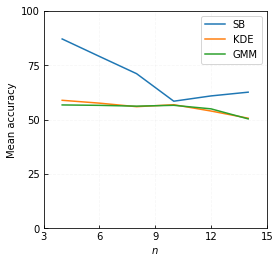

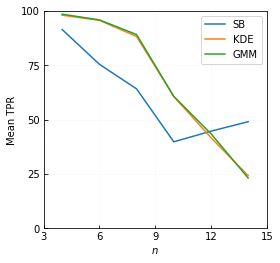

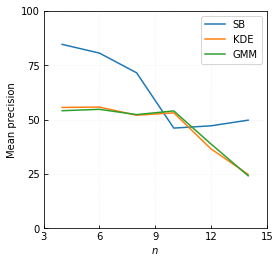

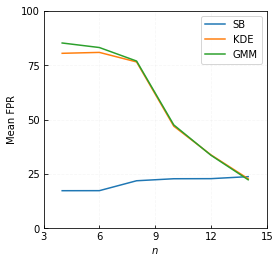

In [11]:
params = {
        'MAX_RUNS': 100,
        'size': -5,
        'scale': 0.5,
        'n_runs': 50,
        'n_samples': 200,
        'test_n_samples': 200,
        'pca_n_components': 0.5,
        'use_pca': False,
        'verbose': False,
    }
experiment_sweep_Rn_v2(params)

  4%|▎         | 7/200 [00:00<00:03, 61.42it/s]

********************************************************************************
Rn = 4
********************************************************************************


  4%|▍         | 8/200 [00:00<00:02, 74.34it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:05<00:00, 33.21it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 75.78it/s]

Run [1, 0] - 	Scores:	GMM:0.584	KDE:0.671	MCMC:0.838


  4%|▍         | 8/200 [00:00<00:02, 75.66it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:03<00:00, 51.69it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 72.26it/s]

Run [2, 0] - 	Scores:	GMM:0.554	KDE:0.594	MCMC:0.84


  4%|▍         | 8/200 [00:00<00:02, 73.40it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:02<00:00, 69.12it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 74.85it/s]

Run [3, 0] - 	Scores:	GMM:0.793	KDE:0.848	MCMC:0.898


  4%|▍         | 8/200 [00:00<00:02, 77.05it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:02<00:00, 67.75it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 73.27it/s]

Run [4, 0] - 	Scores:	GMM:0.776	KDE:0.828	MCMC:0.888


  4%|▎         | 7/200 [00:00<00:02, 68.13it/s]

Generated 200 feasible and 200 infeasible for training.


100%|█████████▉| 199/200 [00:10<00:00, 18.30it/s]
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


Generated 201 feasible and 200 infeasible pts for testing.


/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)
  4%|▎         | 7/200 [00:00<00:02, 68.40it/s]

Run [5, 0] - 	Scores:	GMM:0.651	KDE:0.671	MCMC:0.815


  4%|▍         | 8/200 [00:00<00:02, 72.94it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:03<00:00, 55.95it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 71.98it/s]

Run [6, 0] - 	Scores:	GMM:0.691	KDE:0.778	MCMC:0.793


  4%|▍         | 8/200 [00:00<00:02, 71.14it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:02<00:00, 69.60it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 74.34it/s]

Run [7, 0] - 	Scores:	GMM:0.776	KDE:0.915	MCMC:0.92


  4%|▍         | 8/200 [00:00<00:02, 74.25it/s]

Generated 199 feasible and 199 infeasible for training.


100%|█████████▉| 199/200 [02:07<00:00,  1.56it/s]
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


Generated 202 feasible and 199 infeasible pts for testing.


/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)
  4%|▍         | 8/200 [00:00<00:02, 71.87it/s]

Run [8, 0] - 	Scores:	GMM:0.571	KDE:0.616	MCMC:0.751


  4%|▎         | 7/200 [00:00<00:02, 69.07it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:02<00:00, 69.82it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 75.28it/s]

Run [9, 0] - 	Scores:	GMM:0.766	KDE:0.803	MCMC:0.813


  4%|▍         | 8/200 [00:00<00:02, 74.57it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:11<00:00, 16.64it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 79.79it/s]

Run [10, 0] - 	Scores:	GMM:0.574	KDE:0.601	MCMC:0.863


  4%|▍         | 8/200 [00:00<00:02, 77.40it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:07<00:00, 27.87it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 75.23it/s]

Run [11, 0] - 	Scores:	GMM:0.668	KDE:0.608	MCMC:0.796


  4%|▍         | 8/200 [00:00<00:02, 75.03it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:03<00:00, 65.52it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 76.28it/s]

Run [12, 0] - 	Scores:	GMM:0.898	KDE:0.786	MCMC:0.893


  4%|▍         | 8/200 [00:00<00:02, 74.90it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:03<00:00, 53.23it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▎         | 7/200 [00:00<00:02, 69.77it/s]

Run [13, 0] - 	Scores:	GMM:0.511	KDE:0.594	MCMC:0.773


  4%|▍         | 8/200 [00:00<00:02, 71.81it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:05<00:00, 33.67it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▎         | 7/200 [00:00<00:02, 69.52it/s]

Run [14, 0] - 	Scores:	GMM:0.489	KDE:0.646	MCMC:0.756


  4%|▍         | 8/200 [00:00<00:02, 75.43it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:03<00:00, 62.17it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 68.60it/s]

Run [15, 0] - 	Scores:	GMM:0.676	KDE:0.825	MCMC:0.928


  4%|▎         | 7/200 [00:00<00:03, 63.47it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:04<00:00, 42.96it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 75.35it/s]

Run [16, 0] - 	Scores:	GMM:0.576	KDE:0.686	MCMC:0.723


  4%|▍         | 8/200 [00:00<00:02, 71.29it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:06<00:00, 31.77it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 75.25it/s]

Run [17, 0] - 	Scores:	GMM:0.589	KDE:0.643	MCMC:0.85


  4%|▍         | 8/200 [00:00<00:02, 74.73it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:03<00:00, 57.52it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 70.36it/s]

Run [18, 0] - 	Scores:	GMM:0.424	KDE:0.579	MCMC:0.778


  4%|▍         | 8/200 [00:00<00:02, 73.53it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:03<00:00, 57.73it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 76.75it/s]

Run [19, 0] - 	Scores:	GMM:0.838	KDE:0.776	MCMC:0.84


  4%|▍         | 8/200 [00:00<00:02, 68.87it/s]

Generated 200 feasible and 200 infeasible for training.


100%|█████████▉| 199/200 [00:03<00:00, 56.29it/s]
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


Generated 201 feasible and 200 infeasible pts for testing.


/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)
  4%|▍         | 8/200 [00:00<00:02, 75.73it/s]

Run [20, 0] - 	Scores:	GMM:0.726	KDE:0.773	MCMC:0.95


  4%|▍         | 8/200 [00:00<00:02, 73.21it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:03<00:00, 60.52it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 74.60it/s]

Run [21, 0] - 	Scores:	GMM:0.683	KDE:0.718	MCMC:0.818


  4%|▍         | 8/200 [00:00<00:02, 76.69it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:03<00:00, 59.98it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▎         | 7/200 [00:00<00:02, 69.40it/s]

Run [22, 0] - 	Scores:	GMM:0.663	KDE:0.748	MCMC:0.845


  4%|▍         | 8/200 [00:00<00:02, 74.20it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:04<00:00, 49.72it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▎         | 7/200 [00:00<00:02, 69.29it/s]

Run [23, 0] - 	Scores:	GMM:0.671	KDE:0.733	MCMC:0.825


  4%|▍         | 8/200 [00:00<00:02, 74.62it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:03<00:00, 60.41it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 75.20it/s]

Run [24, 0] - 	Scores:	GMM:0.601	KDE:0.691	MCMC:0.783


  4%|▍         | 8/200 [00:00<00:02, 74.13it/s]

Generated 200 feasible and 200 infeasible for training.


100%|█████████▉| 199/200 [00:04<00:00, 49.25it/s]
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


Generated 201 feasible and 200 infeasible pts for testing.


/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)
  4%|▍         | 8/200 [00:00<00:02, 74.14it/s]

Run [25, 0] - 	Scores:	GMM:0.581	KDE:0.648	MCMC:0.633


  4%|▍         | 8/200 [00:00<00:02, 77.65it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:12<00:00, 15.44it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 75.26it/s]

Run [26, 0] - 	Scores:	GMM:0.544	KDE:0.676	MCMC:0.903


  4%|▍         | 8/200 [00:00<00:02, 75.68it/s]

Generated 200 feasible and 200 infeasible for training.


100%|█████████▉| 199/200 [00:02<00:00, 69.56it/s]
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


Generated 201 feasible and 200 infeasible pts for testing.


/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)
  4%|▍         | 8/200 [00:00<00:02, 74.91it/s]

Run [27, 0] - 	Scores:	GMM:0.815	KDE:0.903	MCMC:0.945


  4%|▍         | 8/200 [00:00<00:02, 75.78it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:04<00:00, 42.05it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 75.82it/s]

Run [28, 0] - 	Scores:	GMM:0.641	KDE:0.723	MCMC:0.838


  4%|▍         | 8/200 [00:00<00:02, 75.04it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:04<00:00, 43.43it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 74.27it/s]

Run [29, 0] - 	Scores:	GMM:0.641	KDE:0.611	MCMC:0.756


  4%|▍         | 8/200 [00:00<00:02, 72.21it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:04<00:00, 42.86it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 75.04it/s]

Run [30, 0] - 	Scores:	GMM:0.686	KDE:0.686	MCMC:0.863


  4%|▍         | 8/200 [00:00<00:02, 77.03it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:03<00:00, 53.45it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▎         | 7/200 [00:00<00:02, 69.37it/s]

Run [31, 0] - 	Scores:	GMM:0.559	KDE:0.693	MCMC:0.9


  4%|▍         | 8/200 [00:00<00:02, 76.43it/s]

Generated 200 feasible and 200 infeasible for training.


100%|█████████▉| 199/200 [00:03<00:00, 55.53it/s]
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


Generated 201 feasible and 200 infeasible pts for testing.


/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)
  4%|▍         | 8/200 [00:00<00:02, 74.14it/s]

Run [32, 0] - 	Scores:	GMM:0.686	KDE:0.793	MCMC:0.938


  4%|▍         | 8/200 [00:00<00:02, 76.67it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:03<00:00, 63.58it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▎         | 7/200 [00:00<00:02, 68.28it/s]

Run [33, 0] - 	Scores:	GMM:0.736	KDE:0.783	MCMC:0.913


  4%|▍         | 8/200 [00:00<00:02, 76.21it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:48<00:00,  4.09it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 71.94it/s]

Run [34, 0] - 	Scores:	GMM:0.628	KDE:0.631	MCMC:0.818


  4%|▍         | 8/200 [00:00<00:02, 76.32it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:02<00:00, 71.08it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 70.60it/s]

Run [35, 0] - 	Scores:	GMM:0.691	KDE:0.696	MCMC:0.923


  4%|▍         | 8/200 [00:00<00:02, 76.24it/s]

Generated 200 feasible and 200 infeasible for training.


100%|█████████▉| 199/200 [00:02<00:00, 70.37it/s]
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


Generated 201 feasible and 200 infeasible pts for testing.


/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)
  4%|▍         | 8/200 [00:00<00:02, 71.89it/s]

Run [36, 0] - 	Scores:	GMM:0.813	KDE:0.81	MCMC:0.82


  4%|▍         | 8/200 [00:00<00:02, 73.65it/s]

Generated 200 feasible and 200 infeasible for training.


100%|█████████▉| 199/200 [00:03<00:00, 65.70it/s]
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


Generated 201 feasible and 200 infeasible pts for testing.


/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)
  4%|▍         | 8/200 [00:00<00:02, 71.45it/s]

Run [37, 0] - 	Scores:	GMM:0.805	KDE:0.848	MCMC:0.903


  4%|▍         | 8/200 [00:00<00:02, 74.43it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:05<00:00, 36.68it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 72.22it/s]

Run [38, 0] - 	Scores:	GMM:0.574	KDE:0.683	MCMC:0.9


  4%|▍         | 8/200 [00:00<00:02, 74.72it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:09<00:00, 21.56it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 73.48it/s]

Run [39, 0] - 	Scores:	GMM:0.566	KDE:0.738	MCMC:0.85


  4%|▍         | 8/200 [00:00<00:02, 76.00it/s]

Generated 200 feasible and 200 infeasible for training.


100%|█████████▉| 199/200 [00:15<00:00, 13.10it/s]
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


Generated 201 feasible and 200 infeasible pts for testing.


/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)
  4%|▍         | 8/200 [00:00<00:02, 74.15it/s]

Run [40, 0] - 	Scores:	GMM:0.601	KDE:0.646	MCMC:0.741


  4%|▎         | 7/200 [00:00<00:02, 69.46it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:04<00:00, 44.66it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 73.56it/s]

Run [41, 0] - 	Scores:	GMM:0.599	KDE:0.631	MCMC:0.793


  4%|▍         | 8/200 [00:00<00:02, 71.78it/s]

Generated 200 feasible and 200 infeasible for training.


100%|█████████▉| 199/200 [00:02<00:00, 69.12it/s]
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


Generated 201 feasible and 200 infeasible pts for testing.


/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)
  4%|▍         | 8/200 [00:00<00:02, 74.90it/s]

Run [42, 0] - 	Scores:	GMM:0.868	KDE:0.918	MCMC:0.968


  4%|▍         | 8/200 [00:00<00:02, 74.35it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:05<00:00, 37.30it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 75.27it/s]

Run [43, 0] - 	Scores:	GMM:0.653	KDE:0.646	MCMC:0.915


  4%|▍         | 8/200 [00:00<00:02, 76.11it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:07<00:00, 28.30it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 73.71it/s]

Run [44, 0] - 	Scores:	GMM:0.581	KDE:0.599	MCMC:0.798


  4%|▍         | 8/200 [00:00<00:02, 74.67it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:03<00:00, 65.64it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▎         | 7/200 [00:00<00:02, 64.44it/s]

Run [45, 0] - 	Scores:	GMM:0.783	KDE:0.761	MCMC:0.94


  4%|▍         | 8/200 [00:00<00:02, 74.57it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:04<00:00, 42.20it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 74.53it/s]

Run [46, 0] - 	Scores:	GMM:0.566	KDE:0.651	MCMC:0.853


  4%|▍         | 8/200 [00:00<00:02, 75.85it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:03<00:00, 56.91it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 71.98it/s]

Run [47, 0] - 	Scores:	GMM:0.718	KDE:0.756	MCMC:0.913


  4%|▎         | 7/200 [00:00<00:02, 69.86it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:09<00:00, 20.09it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▎         | 7/200 [00:00<00:02, 68.72it/s]

Run [48, 0] - 	Scores:	GMM:0.564	KDE:0.638	MCMC:0.778


  4%|▍         | 8/200 [00:00<00:02, 72.63it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:03<00:00, 53.83it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 75.32it/s]

Run [49, 0] - 	Scores:	GMM:0.638	KDE:0.698	MCMC:0.766


  4%|▍         | 8/200 [00:00<00:02, 74.44it/s]

Generated 200 feasible and 200 infeasible for training.


100%|█████████▉| 199/200 [00:02<00:00, 69.18it/s]
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


Generated 201 feasible and 200 infeasible pts for testing.


/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)
  4%|▍         | 8/200 [00:00<00:02, 73.35it/s]

Run [50, 0] - 	Scores:	GMM:0.883	KDE:0.91	MCMC:0.95
********************************************************************************
Rn = 6
********************************************************************************


  4%|▍         | 8/200 [00:00<00:02, 73.62it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:02<00:00, 69.94it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 72.52it/s]

Run [1, 0] - 	Scores:	GMM:0.591	KDE:0.576	MCMC:0.651


  4%|▍         | 8/200 [00:00<00:02, 73.52it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:02<00:00, 66.94it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 74.99it/s]

Run [2, 0] - 	Scores:	GMM:0.796	KDE:0.723	MCMC:0.915


  4%|▎         | 7/200 [00:00<00:02, 69.15it/s]

Generated 200 feasible and 200 infeasible for training.


100%|█████████▉| 199/200 [00:02<00:00, 66.80it/s]
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


Generated 201 feasible and 200 infeasible pts for testing.


/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)
  4%|▎         | 7/200 [00:00<00:02, 68.82it/s]

Run [3, 0] - 	Scores:	GMM:0.771	KDE:0.613	MCMC:0.818


  4%|▍         | 8/200 [00:00<00:02, 70.56it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:02<00:00, 68.44it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 73.84it/s]

Run [4, 0] - 	Scores:	GMM:0.748	KDE:0.883	MCMC:0.93


  4%|▎         | 7/200 [00:00<00:02, 69.44it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:04<00:00, 44.66it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 74.13it/s]

Run [5, 0] - 	Scores:	GMM:0.726	KDE:0.671	MCMC:0.863


  4%|▎         | 7/200 [00:00<00:02, 68.62it/s]

Generated 200 feasible and 200 infeasible for training.


100%|█████████▉| 199/200 [00:03<00:00, 51.29it/s]
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


Generated 201 feasible and 200 infeasible pts for testing.


/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)
  4%|▍         | 8/200 [00:00<00:02, 73.29it/s]

Run [6, 0] - 	Scores:	GMM:0.626	KDE:0.506	MCMC:0.81


  4%|▍         | 8/200 [00:00<00:02, 73.15it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:02<00:00, 72.70it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 71.45it/s]

Run [7, 0] - 	Scores:	GMM:0.94	KDE:0.853	MCMC:0.96


  4%|▍         | 8/200 [00:00<00:02, 73.65it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:02<00:00, 68.79it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 72.95it/s]

Run [8, 0] - 	Scores:	GMM:0.554	KDE:0.566	MCMC:0.756


  4%|▍         | 8/200 [00:00<00:02, 73.06it/s]

Generated 199 feasible and 199 infeasible for training.


100%|█████████▉| 199/200 [00:03<00:00, 65.53it/s]
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


Generated 201 feasible and 200 infeasible pts for testing.


/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)
  4%|▍         | 8/200 [00:00<00:02, 73.55it/s]

Run [9, 0] - 	Scores:	GMM:0.793	KDE:0.798	MCMC:0.953


  4%|▍         | 8/200 [00:00<00:02, 73.05it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:05<00:00, 38.18it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 75.14it/s]

Run [10, 0] - 	Scores:	GMM:0.464	KDE:0.608	MCMC:0.885


  4%|▍         | 8/200 [00:00<00:02, 72.78it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:02<00:00, 71.91it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 75.64it/s]

Run [11, 0] - 	Scores:	GMM:0.813	KDE:0.743	MCMC:0.855


  4%|▍         | 8/200 [00:00<00:02, 75.66it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:02<00:00, 72.80it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 71.71it/s]

Run [12, 0] - 	Scores:	GMM:0.688	KDE:0.668	MCMC:0.82


  4%|▍         | 8/200 [00:00<00:02, 74.47it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:02<00:00, 72.47it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 74.35it/s]

Run [13, 0] - 	Scores:	GMM:0.858	KDE:0.668	MCMC:0.98


  4%|▍         | 8/200 [00:00<00:02, 76.26it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:02<00:00, 72.70it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 73.08it/s]

Run [14, 0] - 	Scores:	GMM:0.788	KDE:0.865	MCMC:0.975


  4%|▍         | 8/200 [00:00<00:02, 73.79it/s]

Generated 200 feasible and 200 infeasible for training.


100%|█████████▉| 199/200 [00:02<00:00, 69.98it/s]
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


Generated 201 feasible and 200 infeasible pts for testing.


/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)
  4%|▍         | 8/200 [00:00<00:02, 70.61it/s]

Run [15, 0] - 	Scores:	GMM:0.611	KDE:0.594	MCMC:0.84


  4%|▍         | 8/200 [00:00<00:02, 79.49it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:02<00:00, 73.96it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 72.38it/s]

Run [16, 0] - 	Scores:	GMM:0.656	KDE:0.559	MCMC:0.95


  4%|▍         | 8/200 [00:00<00:02, 73.70it/s]

Generated 200 feasible and 200 infeasible for training.


100%|█████████▉| 199/200 [00:02<00:00, 73.63it/s]
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


Generated 201 feasible and 200 infeasible pts for testing.


/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)
  4%|▎         | 7/200 [00:00<00:02, 69.05it/s]

Run [17, 0] - 	Scores:	GMM:0.935	KDE:0.746	MCMC:0.985


  4%|▍         | 8/200 [00:00<00:02, 71.53it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:02<00:00, 72.68it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 73.89it/s]

Run [18, 0] - 	Scores:	GMM:0.718	KDE:0.676	MCMC:0.845


  4%|▍         | 8/200 [00:00<00:02, 73.97it/s]

Generated 200 feasible and 200 infeasible for training.


100%|█████████▉| 199/200 [00:09<00:00, 20.27it/s]
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


Generated 201 feasible and 200 infeasible pts for testing.


/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)
  4%|▍         | 8/200 [00:00<00:02, 70.65it/s]

Run [19, 0] - 	Scores:	GMM:0.464	KDE:0.496	MCMC:0.454


  4%|▍         | 8/200 [00:00<00:02, 75.87it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:04<00:00, 43.26it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 76.77it/s]

Run [20, 0] - 	Scores:	GMM:0.539	KDE:0.461	MCMC:0.758


  4%|▍         | 8/200 [00:00<00:02, 76.00it/s]

Generated 199 feasible and 199 infeasible for training.


100%|█████████▉| 199/200 [00:02<00:00, 73.54it/s]
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


Generated 201 feasible and 200 infeasible pts for testing.


/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)
  4%|▍         | 8/200 [00:00<00:02, 72.93it/s]

Run [21, 0] - 	Scores:	GMM:0.83	KDE:0.661	MCMC:0.885


  4%|▍         | 8/200 [00:00<00:02, 75.19it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:03<00:00, 63.79it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 72.56it/s]

Run [22, 0] - 	Scores:	GMM:0.566	KDE:0.581	MCMC:0.766


  4%|▍         | 8/200 [00:00<00:02, 73.37it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:02<00:00, 71.48it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 73.81it/s]

Run [23, 0] - 	Scores:	GMM:0.688	KDE:0.633	MCMC:0.928


  4%|▍         | 8/200 [00:00<00:02, 75.23it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:02<00:00, 67.69it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 74.13it/s]

Run [24, 0] - 	Scores:	GMM:0.641	KDE:0.631	MCMC:0.908


  4%|▍         | 8/200 [00:00<00:02, 74.50it/s]

Generated 200 feasible and 200 infeasible for training.


100%|█████████▉| 199/200 [00:03<00:00, 60.79it/s]
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


Generated 201 feasible and 200 infeasible pts for testing.


/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)
  4%|▍         | 8/200 [00:00<00:02, 75.33it/s]

Run [25, 0] - 	Scores:	GMM:0.414	KDE:0.514	MCMC:0.608


  4%|▍         | 8/200 [00:00<00:02, 73.58it/s]

Generated 200 feasible and 200 infeasible for training.


100%|█████████▉| 199/200 [00:02<00:00, 71.41it/s]
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


Generated 201 feasible and 200 infeasible pts for testing.


/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)
  4%|▍         | 8/200 [00:00<00:02, 74.17it/s]

Run [26, 0] - 	Scores:	GMM:0.746	KDE:0.569	MCMC:0.933


  4%|▍         | 8/200 [00:00<00:02, 73.95it/s]

Generated 200 feasible and 200 infeasible for training.


100%|█████████▉| 199/200 [00:13<00:00, 14.24it/s]
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


Generated 201 feasible and 200 infeasible pts for testing.


/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)
  4%|▍         | 8/200 [00:00<00:02, 74.42it/s]

Run [27, 0] - 	Scores:	GMM:0.364	KDE:0.489	MCMC:0.551


  4%|▍         | 8/200 [00:00<00:02, 73.06it/s]

Generated 200 feasible and 200 infeasible for training.


100%|█████████▉| 199/200 [00:04<00:00, 48.11it/s]
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


Generated 201 feasible and 200 infeasible pts for testing.


/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)
  4%|▍         | 8/200 [00:00<00:02, 73.19it/s]

Run [28, 0] - 	Scores:	GMM:0.603	KDE:0.574	MCMC:0.561


  4%|▍         | 8/200 [00:00<00:02, 71.66it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:03<00:00, 57.60it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 73.22it/s]

Run [29, 0] - 	Scores:	GMM:0.701	KDE:0.569	MCMC:0.853


  4%|▍         | 8/200 [00:00<00:02, 76.43it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:02<00:00, 73.66it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 73.19it/s]

Run [30, 0] - 	Scores:	GMM:0.673	KDE:0.599	MCMC:0.953


  4%|▎         | 7/200 [00:00<00:02, 68.55it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:22<00:00,  8.98it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 72.38it/s]

Run [31, 0] - 	Scores:	GMM:0.636	KDE:0.666	MCMC:0.636


  4%|▍         | 8/200 [00:00<00:02, 73.42it/s]

Generated 200 feasible and 200 infeasible for training.


100%|█████████▉| 199/200 [00:02<00:00, 70.20it/s]
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


Generated 201 feasible and 200 infeasible pts for testing.


/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)
  2%|▎         | 5/200 [00:00<00:04, 46.38it/s]

Run [32, 0] - 	Scores:	GMM:0.696	KDE:0.726	MCMC:0.893


  4%|▍         | 8/200 [00:00<00:02, 72.47it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:02<00:00, 68.43it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▎         | 7/200 [00:00<00:02, 66.65it/s]

Run [33, 0] - 	Scores:	GMM:0.504	KDE:0.601	MCMC:0.865


  4%|▍         | 8/200 [00:00<00:02, 72.51it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:03<00:00, 65.40it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 73.43it/s]

Run [34, 0] - 	Scores:	GMM:0.698	KDE:0.703	MCMC:0.87


  4%|▎         | 7/200 [00:00<00:02, 68.06it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:03<00:00, 58.73it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 75.22it/s]

Run [35, 0] - 	Scores:	GMM:0.554	KDE:0.576	MCMC:0.743


  3%|▎         | 6/200 [00:00<00:03, 58.32it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:02<00:00, 67.94it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▎         | 7/200 [00:00<00:02, 69.85it/s]

Run [36, 0] - 	Scores:	GMM:0.818	KDE:0.82	MCMC:0.733


  4%|▍         | 8/200 [00:00<00:02, 74.70it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:03<00:00, 57.11it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 74.48it/s]

Run [37, 0] - 	Scores:	GMM:0.519	KDE:0.544	MCMC:0.766


  4%|▍         | 8/200 [00:00<00:02, 73.63it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:03<00:00, 64.23it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 73.03it/s]

Run [38, 0] - 	Scores:	GMM:0.718	KDE:0.703	MCMC:0.928


  4%|▍         | 8/200 [00:00<00:02, 74.90it/s]

Generated 200 feasible and 200 infeasible for training.


100%|█████████▉| 199/200 [00:02<00:00, 71.95it/s]
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


Generated 201 feasible and 200 infeasible pts for testing.


/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)
  4%|▎         | 7/200 [00:00<00:02, 66.90it/s]

Run [39, 0] - 	Scores:	GMM:0.608	KDE:0.566	MCMC:0.9


  4%|▍         | 8/200 [00:00<00:02, 74.39it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:02<00:00, 71.33it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▎         | 7/200 [00:00<00:02, 68.75it/s]

Run [40, 0] - 	Scores:	GMM:0.743	KDE:0.514	MCMC:0.973


  4%|▍         | 8/200 [00:00<00:02, 71.85it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:02<00:00, 70.52it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 71.46it/s]

Run [41, 0] - 	Scores:	GMM:0.703	KDE:0.751	MCMC:0.975


  4%|▍         | 8/200 [00:00<00:02, 73.77it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:03<00:00, 64.22it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 74.15it/s]

Run [42, 0] - 	Scores:	GMM:0.668	KDE:0.611	MCMC:0.94


  4%|▍         | 8/200 [00:00<00:02, 74.01it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:03<00:00, 64.76it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 73.34it/s]

Run [43, 0] - 	Scores:	GMM:0.838	KDE:0.656	MCMC:0.92


  4%|▍         | 8/200 [00:00<00:02, 74.82it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:04<00:00, 49.55it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▎         | 7/200 [00:00<00:02, 65.62it/s]

Run [44, 0] - 	Scores:	GMM:0.569	KDE:0.626	MCMC:0.718


  4%|▍         | 8/200 [00:00<00:02, 73.09it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:40<00:00,  4.85it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 71.26it/s]

Run [45, 0] - 	Scores:	GMM:0.633	KDE:0.611	MCMC:0.723


  4%|▍         | 8/200 [00:00<00:02, 72.52it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:02<00:00, 69.15it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 70.04it/s]

Run [46, 0] - 	Scores:	GMM:0.786	KDE:0.793	MCMC:0.855


  4%|▍         | 8/200 [00:00<00:02, 74.24it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:02<00:00, 71.60it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 72.20it/s]

Run [47, 0] - 	Scores:	GMM:0.728	KDE:0.741	MCMC:0.948


  4%|▍         | 8/200 [00:00<00:02, 75.11it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:03<00:00, 56.93it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▎         | 7/200 [00:00<00:03, 63.50it/s]

Run [48, 0] - 	Scores:	GMM:0.556	KDE:0.591	MCMC:0.753


  4%|▍         | 8/200 [00:00<00:02, 71.99it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:04<00:00, 48.75it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▎         | 7/200 [00:00<00:02, 68.54it/s]

Run [49, 0] - 	Scores:	GMM:0.766	KDE:0.653	MCMC:0.791


  4%|▍         | 8/200 [00:00<00:02, 74.95it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:07<00:00, 27.48it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▎         | 7/200 [00:00<00:02, 68.48it/s]

Run [50, 0] - 	Scores:	GMM:0.768	KDE:0.631	MCMC:0.728
********************************************************************************
Rn = 8
********************************************************************************


  4%|▍         | 8/200 [00:00<00:02, 71.89it/s]

Generated 200 feasible and 200 infeasible for training.


100%|█████████▉| 199/200 [00:02<00:00, 69.78it/s]
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


Generated 201 feasible and 200 infeasible pts for testing.


/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)
  4%|▎         | 7/200 [00:00<00:02, 66.31it/s]

Run [1, 0] - 	Scores:	GMM:0.628	KDE:0.501	MCMC:0.995


  4%|▎         | 7/200 [00:00<00:03, 63.13it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:02<00:00, 69.26it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 73.49it/s]

Run [2, 0] - 	Scores:	GMM:0.594	KDE:0.564	MCMC:0.833


  4%|▍         | 8/200 [00:00<00:02, 70.72it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:03<00:00, 59.71it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 73.40it/s]

Run [3, 0] - 	Scores:	GMM:0.571	KDE:0.539	MCMC:0.626


  4%|▍         | 8/200 [00:00<00:02, 73.86it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:02<00:00, 70.14it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 70.03it/s]

Run [4, 0] - 	Scores:	GMM:0.499	KDE:0.499	MCMC:0.486


  4%|▍         | 8/200 [00:00<00:02, 70.15it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:02<00:00, 69.33it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▎         | 7/200 [00:00<00:02, 66.95it/s]

Run [5, 0] - 	Scores:	GMM:0.728	KDE:0.681	MCMC:0.873


  4%|▍         | 8/200 [00:00<00:02, 73.87it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:04<00:00, 47.85it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▎         | 7/200 [00:00<00:02, 68.38it/s]

Run [6, 0] - 	Scores:	GMM:0.628	KDE:0.596	MCMC:0.636


  4%|▍         | 8/200 [00:00<00:02, 69.94it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:03<00:00, 52.33it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▎         | 7/200 [00:00<00:02, 69.40it/s]

Run [7, 0] - 	Scores:	GMM:0.436	KDE:0.416	MCMC:0.688


  4%|▍         | 8/200 [00:00<00:02, 72.89it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [02:03<00:00,  1.61it/s]


Generated 202 feasible and 199 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 74.75it/s]

Run [8, 0] - 	Scores:	GMM:0.466	KDE:0.471	MCMC:0.469


  4%|▍         | 8/200 [00:00<00:02, 72.60it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:02<00:00, 72.73it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 71.76it/s]

Run [9, 0] - 	Scores:	GMM:0.581	KDE:0.606	MCMC:0.691


  4%|▍         | 8/200 [00:00<00:02, 75.78it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:02<00:00, 71.17it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 74.40it/s]

Run [10, 0] - 	Scores:	GMM:0.601	KDE:0.611	MCMC:0.8


  4%|▎         | 7/200 [00:00<00:02, 65.34it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:02<00:00, 69.65it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 74.86it/s]

Run [11, 0] - 	Scores:	GMM:0.613	KDE:0.608	MCMC:0.773


  4%|▍         | 8/200 [00:00<00:02, 70.37it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:02<00:00, 70.13it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 71.11it/s]

Run [12, 0] - 	Scores:	GMM:0.853	KDE:0.703	MCMC:0.848


  4%|▍         | 8/200 [00:00<00:02, 73.03it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:02<00:00, 70.29it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 72.19it/s]

Run [13, 0] - 	Scores:	GMM:0.484	KDE:0.446	MCMC:0.299


  4%|▍         | 8/200 [00:00<00:02, 73.49it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:02<00:00, 71.76it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▎         | 7/200 [00:00<00:02, 67.04it/s]

Run [14, 0] - 	Scores:	GMM:0.546	KDE:0.544	MCMC:0.925


  4%|▍         | 8/200 [00:00<00:02, 71.16it/s]

Generated 199 feasible and 199 infeasible for training.


100%|█████████▉| 199/200 [00:02<00:00, 69.81it/s]
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


Generated 201 feasible and 200 infeasible pts for testing.


/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)
  4%|▍         | 8/200 [00:00<00:02, 71.69it/s]

Run [15, 0] - 	Scores:	GMM:0.703	KDE:0.589	MCMC:0.873


  4%|▍         | 8/200 [00:00<00:02, 71.52it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:02<00:00, 70.41it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 73.54it/s]

Run [16, 0] - 	Scores:	GMM:0.506	KDE:0.509	MCMC:0.501


  4%|▍         | 8/200 [00:00<00:02, 74.36it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:02<00:00, 70.40it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 71.34it/s]

Run [17, 0] - 	Scores:	GMM:0.506	KDE:0.499	MCMC:0.302


  4%|▍         | 8/200 [00:00<00:02, 72.49it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:02<00:00, 71.43it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 70.96it/s]

Run [18, 0] - 	Scores:	GMM:0.536	KDE:0.501	MCMC:0.86


  4%|▍         | 8/200 [00:00<00:02, 76.34it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:03<00:00, 50.48it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▎         | 7/200 [00:00<00:02, 65.95it/s]

Run [19, 0] - 	Scores:	GMM:0.499	KDE:0.499	MCMC:0.521


  4%|▍         | 8/200 [00:00<00:02, 70.38it/s]

Generated 200 feasible and 200 infeasible for training.


100%|█████████▉| 199/200 [00:03<00:00, 57.12it/s]
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


Generated 201 feasible and 200 infeasible pts for testing.


/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)
  4%|▍         | 8/200 [00:00<00:02, 73.33it/s]

Run [20, 0] - 	Scores:	GMM:0.414	KDE:0.354	MCMC:0.521


  4%|▍         | 8/200 [00:00<00:02, 73.76it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:03<00:00, 56.72it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 74.00it/s]

Run [21, 0] - 	Scores:	GMM:0.643	KDE:0.596	MCMC:0.596


  4%|▍         | 8/200 [00:00<00:02, 74.02it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:03<00:00, 57.09it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▎         | 7/200 [00:00<00:02, 67.59it/s]

Run [22, 0] - 	Scores:	GMM:0.479	KDE:0.491	MCMC:0.591


  4%|▍         | 8/200 [00:00<00:02, 74.25it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:03<00:00, 52.29it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 71.81it/s]

Run [23, 0] - 	Scores:	GMM:0.576	KDE:0.571	MCMC:0.591


  4%|▎         | 7/200 [00:00<00:02, 68.87it/s]

Generated 199 feasible and 199 infeasible for training.


  4%|▍         | 8/200 [00:00<00:02, 73.45it/s]

Sampled 13 points instead of 100.0


  4%|▍         | 8/200 [00:00<00:02, 74.07it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:02<00:00, 70.18it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 75.51it/s]

Run [24, 1] - 	Scores:	GMM:0.786	KDE:0.748	MCMC:0.796


  4%|▍         | 8/200 [00:00<00:02, 72.51it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:02<00:00, 68.74it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 72.72it/s]

Run [25, 1] - 	Scores:	GMM:0.606	KDE:0.554	MCMC:0.893


  4%|▍         | 8/200 [00:00<00:02, 72.70it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:03<00:00, 62.87it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▎         | 7/200 [00:00<00:02, 69.94it/s]

Run [26, 1] - 	Scores:	GMM:0.531	KDE:0.586	MCMC:0.691


  4%|▍         | 8/200 [00:00<00:02, 74.76it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:03<00:00, 65.71it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 74.53it/s]

Run [27, 1] - 	Scores:	GMM:0.656	KDE:0.524	MCMC:0.501


  4%|▎         | 7/200 [00:00<00:02, 64.48it/s]

Generated 200 feasible and 200 infeasible for training.


100%|█████████▉| 199/200 [00:02<00:00, 67.45it/s]
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


Generated 201 feasible and 200 infeasible pts for testing.


/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)
  4%|▍         | 8/200 [00:00<00:02, 73.40it/s]

Run [28, 1] - 	Scores:	GMM:0.613	KDE:0.551	MCMC:0.868


  4%|▍         | 8/200 [00:00<00:02, 74.23it/s]

Generated 200 feasible and 200 infeasible for training.


100%|█████████▉| 199/200 [00:02<00:00, 70.42it/s]
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


Generated 201 feasible and 200 infeasible pts for testing.


/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)
  4%|▍         | 8/200 [00:00<00:02, 74.51it/s]

Run [29, 1] - 	Scores:	GMM:0.491	KDE:0.496	MCMC:0.636


  4%|▍         | 8/200 [00:00<00:02, 69.85it/s]

Generated 200 feasible and 200 infeasible for training.


100%|█████████▉| 199/200 [00:02<00:00, 69.67it/s]
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


Generated 201 feasible and 200 infeasible pts for testing.


/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)
  4%|▍         | 8/200 [00:00<00:02, 74.81it/s]

Run [30, 1] - 	Scores:	GMM:0.736	KDE:0.599	MCMC:0.958


  4%|▍         | 8/200 [00:00<00:02, 73.81it/s]

Generated 199 feasible and 199 infeasible for training.


100%|█████████▉| 199/200 [00:02<00:00, 71.97it/s]
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


Generated 201 feasible and 200 infeasible pts for testing.


/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)
  4%|▍         | 8/200 [00:00<00:02, 74.11it/s]

Run [31, 1] - 	Scores:	GMM:0.516	KDE:0.531	MCMC:0.581


  4%|▍         | 8/200 [00:00<00:02, 74.66it/s]

Generated 199 feasible and 199 infeasible for training.


100%|█████████▉| 199/200 [00:02<00:00, 71.97it/s]
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


Generated 201 feasible and 200 infeasible pts for testing.


/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)
  4%|▍         | 8/200 [00:00<00:02, 74.31it/s]

Run [32, 1] - 	Scores:	GMM:0.683	KDE:0.738	MCMC:0.82


  4%|▎         | 7/200 [00:00<00:03, 63.62it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:02<00:00, 67.07it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  2%|▎         | 5/200 [00:00<00:04, 45.43it/s]

Run [33, 1] - 	Scores:	GMM:0.494	KDE:0.499	MCMC:0.628


  4%|▍         | 8/200 [00:00<00:02, 72.18it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:03<00:00, 63.59it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▎         | 7/200 [00:00<00:02, 69.63it/s]

Run [34, 1] - 	Scores:	GMM:0.499	KDE:0.499	MCMC:0.86


  4%|▎         | 7/200 [00:00<00:02, 68.44it/s]

Generated 200 feasible and 200 infeasible for training.


100%|█████████▉| 199/200 [00:02<00:00, 70.47it/s]
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


Generated 201 feasible and 200 infeasible pts for testing.


/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)
  4%|▍         | 8/200 [00:00<00:02, 74.33it/s]

Run [35, 1] - 	Scores:	GMM:0.504	KDE:0.499	MCMC:0.489


  4%|▎         | 7/200 [00:00<00:02, 67.82it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:02<00:00, 68.93it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 72.47it/s]

Run [36, 1] - 	Scores:	GMM:0.534	KDE:0.499	MCMC:0.531


  4%|▎         | 7/200 [00:00<00:02, 69.15it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:04<00:00, 41.31it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▎         | 7/200 [00:00<00:02, 65.32it/s]

Run [37, 1] - 	Scores:	GMM:0.534	KDE:0.481	MCMC:0.536


  4%|▍         | 8/200 [00:00<00:02, 73.16it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:03<00:00, 63.28it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 72.71it/s]

Run [38, 1] - 	Scores:	GMM:0.748	KDE:0.868	MCMC:0.86


  4%|▍         | 8/200 [00:00<00:02, 72.91it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:03<00:00, 50.40it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 69.98it/s]

Run [39, 1] - 	Scores:	GMM:0.706	KDE:0.661	MCMC:0.621


  4%|▍         | 8/200 [00:00<00:02, 73.80it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:03<00:00, 52.49it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▎         | 7/200 [00:00<00:02, 68.37it/s]

Run [40, 1] - 	Scores:	GMM:0.581	KDE:0.539	MCMC:0.855


  4%|▍         | 8/200 [00:00<00:02, 74.21it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:02<00:00, 68.02it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▎         | 7/200 [00:00<00:02, 68.59it/s]

Run [41, 1] - 	Scores:	GMM:0.499	KDE:0.499	MCMC:0.581


  4%|▍         | 8/200 [00:00<00:02, 73.97it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:03<00:00, 53.17it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 74.13it/s]

Run [42, 1] - 	Scores:	GMM:0.638	KDE:0.546	MCMC:0.673


  4%|▎         | 7/200 [00:00<00:02, 67.33it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:02<00:00, 70.83it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 72.79it/s]

Run [43, 1] - 	Scores:	GMM:0.758	KDE:0.708	MCMC:0.965


  4%|▍         | 8/200 [00:00<00:02, 73.11it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:02<00:00, 70.63it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 70.30it/s]

Run [44, 1] - 	Scores:	GMM:0.499	KDE:0.499	MCMC:0.86


  4%|▍         | 8/200 [00:00<00:02, 73.00it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:02<00:00, 68.23it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▎         | 7/200 [00:00<00:02, 68.15it/s]

Run [45, 1] - 	Scores:	GMM:0.499	KDE:0.499	MCMC:0.89


  4%|▎         | 7/200 [00:00<00:02, 64.49it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:03<00:00, 65.44it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 72.56it/s]

Run [46, 1] - 	Scores:	GMM:0.601	KDE:0.554	MCMC:0.815


  4%|▍         | 8/200 [00:00<00:02, 73.27it/s]

Generated 200 feasible and 200 infeasible for training.


100%|█████████▉| 199/200 [00:03<00:00, 56.46it/s]
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


Generated 201 feasible and 200 infeasible pts for testing.


/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)
  4%|▍         | 8/200 [00:00<00:02, 74.87it/s]

Run [47, 1] - 	Scores:	GMM:0.534	KDE:0.529	MCMC:0.419


  4%|▎         | 7/200 [00:00<00:03, 62.87it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:20<00:00,  9.65it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▎         | 7/200 [00:00<00:02, 68.23it/s]

Run [48, 1] - 	Scores:	GMM:0.571	KDE:0.733	MCMC:0.746


  4%|▎         | 7/200 [00:00<00:02, 68.26it/s]

Generated 200 feasible and 200 infeasible for training.


100%|█████████▉| 199/200 [00:02<00:00, 69.19it/s]
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


Generated 201 feasible and 200 infeasible pts for testing.


/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)
  4%|▍         | 8/200 [00:00<00:02, 72.60it/s]

Run [49, 1] - 	Scores:	GMM:0.594	KDE:0.536	MCMC:0.905


  4%|▍         | 8/200 [00:00<00:02, 72.70it/s]

Generated 200 feasible and 200 infeasible for training.


100%|█████████▉| 199/200 [00:02<00:00, 66.89it/s]
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


Generated 201 feasible and 200 infeasible pts for testing.


/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)
  4%|▎         | 7/200 [00:00<00:02, 65.98it/s]

Run [50, 1] - 	Scores:	GMM:0.766	KDE:0.661	MCMC:0.995
********************************************************************************
Rn = 10
********************************************************************************


  4%|▎         | 7/200 [00:00<00:02, 69.83it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:04<00:00, 43.11it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 72.97it/s]

Run [1, 0] - 	Scores:	GMM:0.499	KDE:0.499	MCMC:0.499


  4%|▍         | 8/200 [00:00<00:02, 70.66it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:03<00:00, 52.77it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▎         | 7/200 [00:00<00:02, 65.98it/s]

Run [2, 0] - 	Scores:	GMM:0.536	KDE:0.569	MCMC:0.783


  4%|▍         | 8/200 [00:00<00:02, 71.85it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:02<00:00, 66.35it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▎         | 7/200 [00:00<00:02, 67.08it/s]

Run [3, 0] - 	Scores:	GMM:0.499	KDE:0.499	MCMC:0.885


  4%|▍         | 8/200 [00:00<00:02, 68.70it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:02<00:00, 68.65it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▎         | 7/200 [00:00<00:03, 64.15it/s]

Run [4, 0] - 	Scores:	GMM:0.499	KDE:0.499	MCMC:0.499


  4%|▍         | 8/200 [00:00<00:02, 73.40it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:02<00:00, 71.33it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 72.52it/s]

Run [5, 0] - 	Scores:	GMM:0.556	KDE:0.653	MCMC:0.915


  4%|▍         | 8/200 [00:00<00:02, 70.79it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:02<00:00, 67.79it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▎         | 7/200 [00:00<00:03, 62.62it/s]

Run [6, 0] - 	Scores:	GMM:0.903	KDE:0.888	MCMC:1.0


  4%|▎         | 7/200 [00:00<00:03, 64.14it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:02<00:00, 66.61it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 71.23it/s]

Run [7, 0] - 	Scores:	GMM:0.531	KDE:0.546	MCMC:0.873


  4%|▍         | 8/200 [00:00<00:02, 73.28it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:02<00:00, 71.76it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 73.89it/s]

Run [8, 0] - 	Scores:	GMM:0.511	KDE:0.531	MCMC:0.611


  4%|▍         | 8/200 [00:00<00:02, 73.68it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:02<00:00, 69.01it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▎         | 7/200 [00:00<00:02, 69.07it/s]

Run [9, 0] - 	Scores:	GMM:0.499	KDE:0.499	MCMC:0.499


  3%|▎         | 6/200 [00:00<00:03, 58.56it/s]

Generated 200 feasible and 200 infeasible for training.


100%|█████████▉| 199/200 [00:02<00:00, 68.51it/s]
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


Generated 201 feasible and 200 infeasible pts for testing.


/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)
  4%|▎         | 7/200 [00:00<00:02, 69.64it/s]

Run [10, 0] - 	Scores:	GMM:0.579	KDE:0.499	MCMC:0.781


  4%|▍         | 8/200 [00:00<00:02, 73.22it/s]

Generated 200 feasible and 200 infeasible for training.


100%|█████████▉| 199/200 [00:02<00:00, 67.63it/s]
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


Generated 201 feasible and 200 infeasible pts for testing.


/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)
  4%|▎         | 7/200 [00:00<00:02, 67.54it/s]

Run [11, 0] - 	Scores:	GMM:0.499	KDE:0.499	MCMC:0.596


  4%|▍         | 8/200 [00:00<00:02, 71.90it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:02<00:00, 71.40it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 73.73it/s]

Run [12, 0] - 	Scores:	GMM:0.499	KDE:0.499	MCMC:0.599


  4%|▍         | 8/200 [00:00<00:02, 73.41it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:02<00:00, 71.64it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 71.36it/s]

Run [13, 0] - 	Scores:	GMM:0.539	KDE:0.534	MCMC:0.99


  4%|▍         | 8/200 [00:00<00:02, 70.54it/s]

Generated 200 feasible and 200 infeasible for training.


100%|█████████▉| 199/200 [00:02<00:00, 71.51it/s]
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


Generated 201 feasible and 200 infeasible pts for testing.


/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)
  4%|▍         | 8/200 [00:00<00:02, 73.25it/s]

Run [14, 0] - 	Scores:	GMM:0.499	KDE:0.499	MCMC:0.791


  4%|▍         | 8/200 [00:00<00:02, 72.47it/s]

Generated 200 feasible and 200 infeasible for training.


100%|█████████▉| 199/200 [00:08<00:00, 23.91it/s]
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


Generated 201 feasible and 200 infeasible pts for testing.


/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)
  4%|▎         | 7/200 [00:00<00:02, 69.42it/s]

Run [15, 0] - 	Scores:	GMM:0.499	KDE:0.499	MCMC:0.499


  4%|▍         | 8/200 [00:00<00:02, 69.20it/s]

Generated 200 feasible and 200 infeasible for training.


100%|█████████▉| 199/200 [00:03<00:00, 61.48it/s]
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


Generated 201 feasible and 200 infeasible pts for testing.


/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)
  4%|▍         | 8/200 [00:00<00:02, 71.14it/s]

Run [16, 0] - 	Scores:	GMM:0.653	KDE:0.564	MCMC:1.0


  4%|▍         | 8/200 [00:00<00:02, 73.56it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:02<00:00, 70.92it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 71.75it/s]

Run [17, 0] - 	Scores:	GMM:0.589	KDE:0.621	MCMC:0.98


  4%|▍         | 8/200 [00:00<00:02, 73.11it/s]

Generated 200 feasible and 200 infeasible for training.


100%|█████████▉| 199/200 [00:02<00:00, 70.98it/s]
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


Generated 201 feasible and 200 infeasible pts for testing.


/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)
  4%|▍         | 8/200 [00:00<00:02, 72.65it/s]

Run [18, 0] - 	Scores:	GMM:0.499	KDE:0.499	MCMC:0.466


  4%|▍         | 8/200 [00:00<00:02, 73.14it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:03<00:00, 51.58it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 73.85it/s]

Run [19, 0] - 	Scores:	GMM:0.499	KDE:0.499	MCMC:0.549


  4%|▍         | 8/200 [00:00<00:02, 72.74it/s]

Generated 200 feasible and 200 infeasible for training.


100%|█████████▉| 199/200 [00:02<00:00, 69.51it/s]
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


Generated 201 feasible and 200 infeasible pts for testing.


/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)
  4%|▍         | 8/200 [00:00<00:02, 70.60it/s]

Run [20, 0] - 	Scores:	GMM:0.499	KDE:0.499	MCMC:0.499


  4%|▍         | 8/200 [00:00<00:02, 74.33it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:02<00:00, 70.76it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 73.63it/s]

Run [21, 0] - 	Scores:	GMM:0.499	KDE:0.499	MCMC:0.484


  4%|▎         | 7/200 [00:00<00:02, 67.93it/s]

Generated 198 feasible and 198 infeasible for training.


100%|█████████▉| 199/200 [00:03<00:00, 62.26it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 73.27it/s]

Run [22, 0] - 	Scores:	GMM:0.501	KDE:0.499	MCMC:0.666


  4%|▎         | 7/200 [00:00<00:02, 66.05it/s]

Generated 200 feasible and 200 infeasible for training.


100%|█████████▉| 199/200 [00:02<00:00, 70.61it/s]
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


Generated 201 feasible and 200 infeasible pts for testing.


/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)
  4%|▍         | 8/200 [00:00<00:02, 71.64it/s]

Run [23, 0] - 	Scores:	GMM:0.499	KDE:0.499	MCMC:0.434


  4%|▎         | 7/200 [00:00<00:02, 69.34it/s]

Generated 200 feasible and 200 infeasible for training.


100%|█████████▉| 199/200 [00:02<00:00, 66.47it/s]
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


Generated 201 feasible and 200 infeasible pts for testing.


/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)
  4%|▎         | 7/200 [00:00<00:02, 69.68it/s]

Run [24, 0] - 	Scores:	GMM:0.596	KDE:0.796	MCMC:0.968


  4%|▍         | 8/200 [00:00<00:02, 72.78it/s]

Generated 200 feasible and 200 infeasible for training.


100%|█████████▉| 199/200 [00:02<00:00, 70.48it/s]
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


Generated 201 feasible and 200 infeasible pts for testing.


/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)
  4%|▍         | 8/200 [00:00<00:02, 73.02it/s]

Run [25, 0] - 	Scores:	GMM:0.499	KDE:0.499	MCMC:0.571


  4%|▎         | 7/200 [00:00<00:02, 68.40it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:22<00:00,  8.76it/s]


Generated 202 feasible and 199 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 70.17it/s]

Run [26, 0] - 	Scores:	GMM:0.496	KDE:0.494	MCMC:0.496


  4%|▍         | 8/200 [00:00<00:02, 71.30it/s]

Generated 200 feasible and 200 infeasible for training.


100%|█████████▉| 199/200 [00:02<00:00, 68.30it/s]
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


Generated 201 feasible and 200 infeasible pts for testing.


/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)
  4%|▍         | 8/200 [00:00<00:02, 70.57it/s]

Run [27, 0] - 	Scores:	GMM:0.499	KDE:0.499	MCMC:0.416


  4%|▍         | 8/200 [00:00<00:02, 71.95it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:02<00:00, 71.06it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 70.45it/s]

Run [28, 0] - 	Scores:	GMM:0.499	KDE:0.499	MCMC:0.464


  4%|▍         | 8/200 [00:00<00:02, 73.01it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:03<00:00, 64.22it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 72.71it/s]

Run [29, 0] - 	Scores:	GMM:0.501	KDE:0.501	MCMC:0.379


  4%|▎         | 7/200 [00:00<00:02, 69.68it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:02<00:00, 68.64it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 72.38it/s]

Run [30, 0] - 	Scores:	GMM:0.499	KDE:0.499	MCMC:0.499


  4%|▍         | 8/200 [00:00<00:02, 70.73it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:02<00:00, 69.52it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 72.30it/s]

Run [31, 0] - 	Scores:	GMM:0.621	KDE:0.721	MCMC:0.611


  4%|▍         | 8/200 [00:00<00:02, 73.76it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:02<00:00, 69.36it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 71.53it/s]

Run [32, 0] - 	Scores:	GMM:0.499	KDE:0.499	MCMC:0.544


  4%|▍         | 8/200 [00:00<00:02, 72.26it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:02<00:00, 70.68it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▎         | 7/200 [00:00<00:02, 69.34it/s]

Run [33, 0] - 	Scores:	GMM:0.499	KDE:0.499	MCMC:0.915


  2%|▎         | 5/200 [00:00<00:04, 45.48it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:03<00:00, 59.94it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▎         | 7/200 [00:00<00:03, 63.34it/s]

Run [34, 0] - 	Scores:	GMM:0.499	KDE:0.499	MCMC:0.603


  4%|▍         | 8/200 [00:00<00:02, 71.16it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:03<00:00, 54.40it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 72.32it/s]

Run [35, 0] - 	Scores:	GMM:0.521	KDE:0.601	MCMC:0.658


  4%|▍         | 8/200 [00:00<00:02, 71.78it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:02<00:00, 70.29it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 74.65it/s]

Run [36, 0] - 	Scores:	GMM:0.499	KDE:0.499	MCMC:0.586


  4%|▍         | 8/200 [00:00<00:02, 73.34it/s]

Generated 200 feasible and 200 infeasible for training.


100%|█████████▉| 199/200 [00:02<00:00, 70.58it/s]
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


Generated 201 feasible and 200 infeasible pts for testing.


/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)
  4%|▍         | 8/200 [00:00<00:02, 72.81it/s]

Run [37, 0] - 	Scores:	GMM:0.514	KDE:0.514	MCMC:0.728


  4%|▍         | 8/200 [00:00<00:02, 74.35it/s]

Generated 199 feasible and 199 infeasible for training.


100%|█████████▉| 199/200 [00:03<00:00, 61.07it/s]
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


Generated 201 feasible and 200 infeasible pts for testing.


/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)
  4%|▍         | 8/200 [00:00<00:02, 71.35it/s]

Run [38, 0] - 	Scores:	GMM:0.499	KDE:0.499	MCMC:0.636


  4%|▍         | 8/200 [00:00<00:02, 72.06it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:02<00:00, 70.48it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 72.43it/s]

Run [39, 0] - 	Scores:	GMM:0.499	KDE:0.499	MCMC:0.499


  4%|▍         | 8/200 [00:00<00:02, 71.12it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:02<00:00, 71.03it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 72.54it/s]

Run [40, 0] - 	Scores:	GMM:0.499	KDE:0.499	MCMC:0.666


  4%|▍         | 8/200 [00:00<00:02, 73.93it/s]

Generated 200 feasible and 200 infeasible for training.


100%|█████████▉| 199/200 [00:02<00:00, 70.23it/s]
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


Generated 201 feasible and 200 infeasible pts for testing.


/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)
  4%|▍         | 8/200 [00:00<00:02, 72.95it/s]

Run [41, 0] - 	Scores:	GMM:0.561	KDE:0.559	MCMC:1.0


  4%|▍         | 8/200 [00:00<00:02, 73.34it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:02<00:00, 70.76it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▎         | 7/200 [00:00<00:02, 68.33it/s]

Run [42, 0] - 	Scores:	GMM:0.509	KDE:0.501	MCMC:0.885


  4%|▍         | 8/200 [00:00<00:02, 73.49it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:02<00:00, 67.97it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 74.75it/s]

Run [43, 0] - 	Scores:	GMM:0.499	KDE:0.499	MCMC:0.499


  4%|▎         | 7/200 [00:00<00:02, 69.78it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:03<00:00, 58.92it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 72.97it/s]

Run [44, 0] - 	Scores:	GMM:0.504	KDE:0.481	MCMC:0.469


  4%|▍         | 8/200 [00:00<00:02, 73.58it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:02<00:00, 71.45it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 72.97it/s]

Run [45, 0] - 	Scores:	GMM:0.499	KDE:0.499	MCMC:0.484


  4%|▍         | 8/200 [00:00<00:02, 71.72it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:03<00:00, 50.58it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 72.88it/s]

Run [46, 0] - 	Scores:	GMM:0.556	KDE:0.616	MCMC:0.489


  4%|▍         | 8/200 [00:00<00:02, 74.73it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:02<00:00, 71.00it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 72.94it/s]

Run [47, 0] - 	Scores:	GMM:0.516	KDE:0.596	MCMC:0.863


  4%|▍         | 8/200 [00:00<00:02, 74.27it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:02<00:00, 71.20it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 71.38it/s]

Run [48, 0] - 	Scores:	GMM:0.499	KDE:0.499	MCMC:0.696


  4%|▍         | 8/200 [00:00<00:02, 71.64it/s]

Generated 200 feasible and 200 infeasible for training.


100%|█████████▉| 199/200 [00:38<00:00,  5.16it/s]
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


Generated 202 feasible and 199 infeasible pts for testing.


/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)
  4%|▍         | 8/200 [00:00<00:02, 74.50it/s]

Run [49, 0] - 	Scores:	GMM:0.504	KDE:0.509	MCMC:0.464


  4%|▍         | 8/200 [00:00<00:02, 73.50it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:02<00:00, 70.08it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▎         | 7/200 [00:00<00:02, 66.89it/s]

Run [50, 0] - 	Scores:	GMM:0.499	KDE:0.499	MCMC:0.988
********************************************************************************
Rn = 12
********************************************************************************


  4%|▍         | 8/200 [00:00<00:02, 72.40it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:02<00:00, 69.91it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 71.93it/s]

Run [1, 0] - 	Scores:	GMM:0.499	KDE:0.499	MCMC:0.791


  4%|▍         | 8/200 [00:00<00:02, 72.52it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:02<00:00, 69.35it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▎         | 7/200 [00:00<00:02, 69.79it/s]

Run [2, 0] - 	Scores:	GMM:0.499	KDE:0.499	MCMC:0.713


  4%|▍         | 8/200 [00:00<00:02, 70.73it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:02<00:00, 70.43it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 71.23it/s]

Run [3, 0] - 	Scores:	GMM:0.499	KDE:0.499	MCMC:0.499


  4%|▍         | 8/200 [00:00<00:02, 72.84it/s]

Generated 199 feasible and 199 infeasible for training.


100%|█████████▉| 199/200 [00:02<00:00, 69.99it/s]
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


Generated 201 feasible and 200 infeasible pts for testing.


/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)
  4%|▎         | 7/200 [00:00<00:02, 66.65it/s]

Run [4, 0] - 	Scores:	GMM:0.499	KDE:0.499	MCMC:0.469


  4%|▍         | 8/200 [00:00<00:02, 72.93it/s]

Generated 199 feasible and 199 infeasible for training.


100%|█████████▉| 199/200 [00:02<00:00, 71.47it/s]
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


Generated 201 feasible and 200 infeasible pts for testing.


/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)
  4%|▎         | 7/200 [00:00<00:02, 68.94it/s]

Run [5, 0] - 	Scores:	GMM:0.499	KDE:0.499	MCMC:0.479


  4%|▍         | 8/200 [00:00<00:02, 71.74it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:02<00:00, 70.94it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 70.79it/s]

Run [6, 0] - 	Scores:	GMM:0.499	KDE:0.499	MCMC:0.611


  4%|▍         | 8/200 [00:00<00:02, 73.84it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:02<00:00, 69.10it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 70.04it/s]

Run [7, 0] - 	Scores:	GMM:0.499	KDE:0.499	MCMC:0.818


  4%|▍         | 8/200 [00:00<00:02, 73.02it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:02<00:00, 70.77it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 71.72it/s]

Run [8, 0] - 	Scores:	GMM:0.499	KDE:0.499	MCMC:0.641


  4%|▍         | 8/200 [00:00<00:02, 73.56it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:02<00:00, 71.08it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 71.36it/s]

Run [9, 0] - 	Scores:	GMM:0.499	KDE:0.499	MCMC:0.499


  4%|▍         | 8/200 [00:00<00:02, 71.99it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:02<00:00, 68.52it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 71.85it/s]

Run [10, 0] - 	Scores:	GMM:0.499	KDE:0.499	MCMC:0.369


  4%|▍         | 8/200 [00:00<00:02, 71.40it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:02<00:00, 69.89it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 73.07it/s]

Run [11, 0] - 	Scores:	GMM:0.499	KDE:0.499	MCMC:0.521


  4%|▍         | 8/200 [00:00<00:02, 73.45it/s]

Generated 200 feasible and 200 infeasible for training.


100%|█████████▉| 199/200 [00:02<00:00, 70.67it/s]
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


Generated 201 feasible and 200 infeasible pts for testing.


/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)
  4%|▍         | 8/200 [00:00<00:02, 71.76it/s]

Run [12, 0] - 	Scores:	GMM:0.499	KDE:0.499	MCMC:0.958


  4%|▍         | 8/200 [00:00<00:02, 73.65it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:03<00:00, 56.61it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 73.01it/s]

Run [13, 0] - 	Scores:	GMM:0.499	KDE:0.499	MCMC:0.499


  4%|▍         | 8/200 [00:00<00:02, 73.92it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:03<00:00, 55.93it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▎         | 7/200 [00:00<00:02, 68.93it/s]

Run [14, 0] - 	Scores:	GMM:0.499	KDE:0.499	MCMC:0.499


  4%|▍         | 8/200 [00:00<00:02, 71.28it/s]

Generated 200 feasible and 200 infeasible for training.


100%|█████████▉| 199/200 [00:02<00:00, 70.04it/s]
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


Generated 201 feasible and 200 infeasible pts for testing.


/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)
  4%|▎         | 7/200 [00:00<00:02, 69.77it/s]

Run [15, 0] - 	Scores:	GMM:0.499	KDE:0.499	MCMC:0.706


  4%|▍         | 8/200 [00:00<00:02, 71.13it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:02<00:00, 70.12it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 72.11it/s]

Run [16, 0] - 	Scores:	GMM:0.499	KDE:0.499	MCMC:0.317


  4%|▍         | 8/200 [00:00<00:02, 72.71it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:02<00:00, 70.37it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 71.04it/s]

Run [17, 0] - 	Scores:	GMM:0.499	KDE:0.499	MCMC:0.499


  4%|▎         | 7/200 [00:00<00:03, 63.75it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:02<00:00, 70.13it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 71.41it/s]

Run [18, 0] - 	Scores:	GMM:0.499	KDE:0.499	MCMC:0.329


  4%|▍         | 8/200 [00:00<00:02, 73.39it/s]

Generated 200 feasible and 200 infeasible for training.


100%|█████████▉| 199/200 [00:02<00:00, 70.65it/s]
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


Generated 201 feasible and 200 infeasible pts for testing.


/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)
  4%|▍         | 8/200 [00:00<00:02, 71.22it/s]

Run [19, 0] - 	Scores:	GMM:0.499	KDE:0.499	MCMC:0.499


  4%|▍         | 8/200 [00:00<00:02, 71.80it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:03<00:00, 54.44it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 70.93it/s]

Run [20, 0] - 	Scores:	GMM:0.499	KDE:0.499	MCMC:0.718


  4%|▍         | 8/200 [00:00<00:02, 72.64it/s]

Generated 200 feasible and 200 infeasible for training.


100%|█████████▉| 199/200 [00:02<00:00, 70.89it/s]
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


Generated 201 feasible and 200 infeasible pts for testing.


/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)
  4%|▍         | 8/200 [00:00<00:02, 71.48it/s]

Run [21, 0] - 	Scores:	GMM:0.499	KDE:0.499	MCMC:0.501


  4%|▎         | 7/200 [00:00<00:02, 69.59it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:02<00:00, 66.72it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▎         | 7/200 [00:00<00:02, 69.86it/s]

Run [22, 0] - 	Scores:	GMM:0.499	KDE:0.499	MCMC:0.489


  4%|▎         | 7/200 [00:00<00:02, 68.64it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:02<00:00, 71.09it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 72.13it/s]

Run [23, 0] - 	Scores:	GMM:0.499	KDE:0.499	MCMC:0.499


  4%|▍         | 8/200 [00:00<00:02, 71.99it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:02<00:00, 69.23it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 71.61it/s]

Run [24, 0] - 	Scores:	GMM:0.499	KDE:0.499	MCMC:0.499


  4%|▍         | 8/200 [00:00<00:02, 68.63it/s]

Generated 199 feasible and 199 infeasible for training.


100%|█████████▉| 199/200 [00:02<00:00, 69.51it/s]
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


Generated 201 feasible and 200 infeasible pts for testing.


/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)
  4%|▍         | 8/200 [00:00<00:02, 71.59it/s]

Run [25, 0] - 	Scores:	GMM:0.499	KDE:0.499	MCMC:0.893


  4%|▎         | 7/200 [00:00<00:02, 66.41it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:02<00:00, 68.30it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 71.86it/s]

Run [26, 0] - 	Scores:	GMM:0.499	KDE:0.499	MCMC:0.506


  4%|▍         | 8/200 [00:00<00:02, 72.08it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:02<00:00, 69.57it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 73.41it/s]

Run [27, 0] - 	Scores:	GMM:0.499	KDE:0.499	MCMC:0.499


  4%|▍         | 8/200 [00:00<00:02, 72.07it/s]

Generated 199 feasible and 199 infeasible for training.


100%|█████████▉| 199/200 [00:02<00:00, 69.18it/s]
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


Generated 201 feasible and 200 infeasible pts for testing.


/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)
  4%|▍         | 8/200 [00:00<00:02, 72.71it/s]

Run [28, 0] - 	Scores:	GMM:0.499	KDE:0.499	MCMC:0.499


  4%|▎         | 7/200 [00:00<00:02, 69.19it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:02<00:00, 69.77it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 70.84it/s]

Run [29, 0] - 	Scores:	GMM:0.499	KDE:0.499	MCMC:0.676


  4%|▍         | 8/200 [00:00<00:02, 73.65it/s]

Generated 200 feasible and 200 infeasible for training.


100%|█████████▉| 199/200 [00:02<00:00, 69.54it/s]
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


Generated 201 feasible and 200 infeasible pts for testing.


/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)
  4%|▍         | 8/200 [00:00<00:02, 72.07it/s]

Run [30, 0] - 	Scores:	GMM:0.499	KDE:0.499	MCMC:1.0


  4%|▍         | 8/200 [00:00<00:02, 72.55it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:02<00:00, 70.10it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 71.95it/s]

Run [31, 0] - 	Scores:	GMM:0.499	KDE:0.499	MCMC:0.499


  4%|▎         | 7/200 [00:00<00:02, 67.79it/s]

Generated 200 feasible and 200 infeasible for training.


100%|█████████▉| 199/200 [00:02<00:00, 69.89it/s]
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


Generated 201 feasible and 200 infeasible pts for testing.


/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)
  4%|▍         | 8/200 [00:00<00:02, 70.67it/s]

Run [32, 0] - 	Scores:	GMM:0.499	KDE:0.499	MCMC:0.586


  4%|▍         | 8/200 [00:00<00:02, 71.40it/s]

Generated 200 feasible and 200 infeasible for training.


100%|█████████▉| 199/200 [00:02<00:00, 70.83it/s]
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


Generated 201 feasible and 200 infeasible pts for testing.


/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)
  4%|▍         | 8/200 [00:00<00:02, 70.67it/s]

Run [33, 0] - 	Scores:	GMM:0.499	KDE:0.499	MCMC:0.521


  4%|▍         | 8/200 [00:00<00:02, 71.81it/s]

Generated 200 feasible and 200 infeasible for training.


100%|█████████▉| 199/200 [00:02<00:00, 68.89it/s]
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


Generated 201 feasible and 200 infeasible pts for testing.


/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)
  4%|▍         | 8/200 [00:00<00:02, 71.82it/s]

Run [34, 0] - 	Scores:	GMM:0.499	KDE:0.499	MCMC:0.496


  4%|▎         | 7/200 [00:00<00:02, 69.57it/s]

Generated 200 feasible and 200 infeasible for training.


100%|█████████▉| 199/200 [00:03<00:00, 62.11it/s]
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


Generated 201 feasible and 200 infeasible pts for testing.


/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)
  4%|▎         | 7/200 [00:00<00:02, 68.26it/s]

Run [35, 0] - 	Scores:	GMM:0.499	KDE:0.499	MCMC:0.429


  4%|▍         | 8/200 [00:00<00:02, 72.57it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:02<00:00, 66.68it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 73.70it/s]

Run [36, 0] - 	Scores:	GMM:0.499	KDE:0.499	MCMC:0.793


  4%|▍         | 8/200 [00:00<00:02, 71.64it/s]

Generated 200 feasible and 200 infeasible for training.


100%|█████████▉| 199/200 [00:05<00:00, 34.14it/s]
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


Generated 201 feasible and 200 infeasible pts for testing.


/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)
  4%|▍         | 8/200 [00:00<00:02, 70.53it/s]

Run [37, 0] - 	Scores:	GMM:0.499	KDE:0.471	MCMC:0.549


  2%|▏         | 4/200 [00:00<00:05, 33.77it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:02<00:00, 67.59it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 72.45it/s]

Run [38, 0] - 	Scores:	GMM:0.499	KDE:0.499	MCMC:0.504


  4%|▍         | 8/200 [00:00<00:02, 74.28it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:02<00:00, 69.53it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 72.75it/s]

Run [39, 0] - 	Scores:	GMM:0.499	KDE:0.499	MCMC:0.673


  4%|▍         | 8/200 [00:00<00:02, 73.04it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:02<00:00, 71.25it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 72.22it/s]

Run [40, 0] - 	Scores:	GMM:0.499	KDE:0.499	MCMC:0.499


  4%|▍         | 8/200 [00:00<00:02, 73.58it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:02<00:00, 67.44it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 72.61it/s]

Run [41, 0] - 	Scores:	GMM:0.499	KDE:0.499	MCMC:0.499


  4%|▍         | 8/200 [00:00<00:02, 71.73it/s]

Generated 199 feasible and 199 infeasible for training.


100%|█████████▉| 199/200 [00:02<00:00, 70.06it/s]
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


Generated 201 feasible and 200 infeasible pts for testing.


/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)
  4%|▍         | 8/200 [00:00<00:02, 73.02it/s]

Run [42, 0] - 	Scores:	GMM:0.499	KDE:0.499	MCMC:0.878


  4%|▍         | 8/200 [00:00<00:02, 71.40it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:02<00:00, 69.74it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 72.17it/s]

Run [43, 0] - 	Scores:	GMM:0.499	KDE:0.499	MCMC:0.531


  4%|▍         | 8/200 [00:00<00:02, 72.80it/s]

Generated 200 feasible and 200 infeasible for training.


100%|█████████▉| 199/200 [00:02<00:00, 70.64it/s]
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


Generated 201 feasible and 200 infeasible pts for testing.


/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)
  4%|▍         | 8/200 [00:00<00:02, 73.41it/s]

Run [44, 0] - 	Scores:	GMM:0.499	KDE:0.499	MCMC:0.731


  4%|▍         | 8/200 [00:00<00:02, 70.80it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:02<00:00, 67.99it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 72.14it/s]

Run [45, 0] - 	Scores:	GMM:0.499	KDE:0.499	MCMC:0.773


  4%|▍         | 8/200 [00:00<00:02, 72.72it/s]

Generated 200 feasible and 200 infeasible for training.


100%|█████████▉| 199/200 [00:02<00:00, 69.78it/s]
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


Generated 201 feasible and 200 infeasible pts for testing.


/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)
  4%|▍         | 8/200 [00:00<00:02, 71.86it/s]

Run [46, 0] - 	Scores:	GMM:0.499	KDE:0.499	MCMC:1.0


  4%|▍         | 8/200 [00:00<00:02, 72.58it/s]

Generated 200 feasible and 200 infeasible for training.


100%|█████████▉| 199/200 [00:02<00:00, 69.66it/s]
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


Generated 201 feasible and 200 infeasible pts for testing.


/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)
  4%|▍         | 8/200 [00:00<00:02, 70.62it/s]

Run [47, 0] - 	Scores:	GMM:0.499	KDE:0.501	MCMC:0.701


  4%|▍         | 8/200 [00:00<00:02, 70.53it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:02<00:00, 68.87it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 73.00it/s]

Run [48, 0] - 	Scores:	GMM:0.499	KDE:0.499	MCMC:0.499


  4%|▍         | 8/200 [00:00<00:02, 71.96it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:02<00:00, 70.11it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 71.96it/s]

Run [49, 0] - 	Scores:	GMM:0.499	KDE:0.499	MCMC:0.494


  4%|▎         | 7/200 [00:00<00:02, 66.64it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:02<00:00, 70.82it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 70.83it/s]

Run [50, 0] - 	Scores:	GMM:0.499	KDE:0.511	MCMC:0.823
********************************************************************************
Rn = 14
********************************************************************************


  4%|▍         | 8/200 [00:00<00:02, 71.55it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:03<00:00, 66.21it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 71.39it/s]

Run [1, 0] - 	Scores:	GMM:0.499	KDE:0.499	MCMC:0.663


  4%|▍         | 8/200 [00:00<00:02, 72.33it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:02<00:00, 68.01it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 71.60it/s]

Run [2, 0] - 	Scores:	GMM:0.499	KDE:0.499	MCMC:0.461


  4%|▍         | 8/200 [00:00<00:02, 70.59it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:02<00:00, 70.01it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▎         | 7/200 [00:00<00:02, 68.07it/s]

Run [3, 0] - 	Scores:	GMM:0.499	KDE:0.499	MCMC:0.888


  4%|▍         | 8/200 [00:00<00:02, 70.55it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:02<00:00, 69.43it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▎         | 7/200 [00:00<00:02, 66.60it/s]

Run [4, 0] - 	Scores:	GMM:0.499	KDE:0.499	MCMC:0.711


  4%|▎         | 7/200 [00:00<00:02, 67.14it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:03<00:00, 65.90it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▎         | 7/200 [00:00<00:02, 66.70it/s]

Run [5, 0] - 	Scores:	GMM:0.499	KDE:0.499	MCMC:0.825


  4%|▎         | 7/200 [00:00<00:02, 65.06it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:03<00:00, 65.52it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▎         | 7/200 [00:00<00:02, 69.67it/s]

Run [6, 0] - 	Scores:	GMM:0.499	KDE:0.499	MCMC:0.426


  4%|▎         | 7/200 [00:00<00:02, 69.07it/s]

Generated 200 feasible and 200 infeasible for training.


100%|█████████▉| 199/200 [00:03<00:00, 64.66it/s]
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


Generated 201 feasible and 200 infeasible pts for testing.


/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)
  3%|▎         | 6/200 [00:00<00:03, 59.72it/s]

Run [7, 0] - 	Scores:	GMM:0.499	KDE:0.499	MCMC:0.638


  4%|▎         | 7/200 [00:00<00:02, 64.45it/s]

Generated 200 feasible and 200 infeasible for training.


100%|█████████▉| 199/200 [00:03<00:00, 65.31it/s]
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


Generated 201 feasible and 200 infeasible pts for testing.


/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)
  4%|▍         | 8/200 [00:00<00:02, 72.49it/s]

Run [8, 0] - 	Scores:	GMM:0.499	KDE:0.499	MCMC:0.499


  3%|▎         | 6/200 [00:00<00:03, 54.11it/s]

Generated 200 feasible and 200 infeasible for training.


100%|█████████▉| 199/200 [00:02<00:00, 69.04it/s]
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


Generated 201 feasible and 200 infeasible pts for testing.


/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)
  4%|▍         | 8/200 [00:00<00:02, 70.75it/s]

Run [9, 0] - 	Scores:	GMM:0.499	KDE:0.499	MCMC:0.499


  4%|▍         | 8/200 [00:00<00:02, 71.49it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:03<00:00, 64.62it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▎         | 7/200 [00:00<00:02, 68.56it/s]

Run [10, 0] - 	Scores:	GMM:0.499	KDE:0.499	MCMC:0.307


  4%|▍         | 8/200 [00:00<00:02, 70.97it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:02<00:00, 68.02it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 70.74it/s]

Run [11, 0] - 	Scores:	GMM:0.499	KDE:0.499	MCMC:0.499


  4%|▍         | 8/200 [00:00<00:02, 71.27it/s]

Generated 200 feasible and 200 infeasible for training.


100%|█████████▉| 199/200 [00:02<00:00, 69.47it/s]
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


Generated 201 feasible and 200 infeasible pts for testing.


/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)
  4%|▍         | 8/200 [00:00<00:02, 70.82it/s]

Run [12, 0] - 	Scores:	GMM:0.499	KDE:0.499	MCMC:0.0


  4%|▎         | 7/200 [00:00<00:02, 69.68it/s]

Generated 200 feasible and 200 infeasible for training.


100%|█████████▉| 199/200 [00:02<00:00, 68.70it/s]
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


Generated 201 feasible and 200 infeasible pts for testing.


/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)
  4%|▎         | 7/200 [00:00<00:02, 68.06it/s]

Run [13, 0] - 	Scores:	GMM:0.499	KDE:0.499	MCMC:0.244


  4%|▍         | 8/200 [00:00<00:02, 70.21it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:02<00:00, 67.86it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▎         | 7/200 [00:00<00:02, 68.44it/s]

Run [14, 0] - 	Scores:	GMM:0.499	KDE:0.499	MCMC:0.359


  4%|▎         | 7/200 [00:00<00:02, 68.94it/s]

Generated 200 feasible and 200 infeasible for training.


100%|█████████▉| 199/200 [00:03<00:00, 62.96it/s]
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


Generated 201 feasible and 200 infeasible pts for testing.


/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)
  4%|▎         | 7/200 [00:00<00:02, 69.36it/s]

Run [15, 0] - 	Scores:	GMM:0.499	KDE:0.499	MCMC:0.651


  4%|▎         | 7/200 [00:00<00:02, 68.09it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:02<00:00, 66.89it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 70.52it/s]

Run [16, 0] - 	Scores:	GMM:0.499	KDE:0.499	MCMC:0.81


  4%|▍         | 8/200 [00:00<00:02, 71.12it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:03<00:00, 65.13it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▎         | 7/200 [00:00<00:02, 67.97it/s]

Run [17, 0] - 	Scores:	GMM:0.499	KDE:0.499	MCMC:0.499


  4%|▍         | 8/200 [00:00<00:02, 70.39it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:03<00:00, 61.88it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▎         | 7/200 [00:00<00:02, 69.03it/s]

Run [18, 0] - 	Scores:	GMM:0.499	KDE:0.499	MCMC:0.499


  3%|▎         | 6/200 [00:00<00:03, 59.63it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:03<00:00, 62.31it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▎         | 7/200 [00:00<00:02, 69.76it/s]

Run [19, 0] - 	Scores:	GMM:0.499	KDE:0.499	MCMC:0.441


  4%|▎         | 7/200 [00:00<00:02, 69.66it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:02<00:00, 68.05it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  3%|▎         | 6/200 [00:00<00:03, 54.48it/s]

Run [20, 0] - 	Scores:	GMM:0.499	KDE:0.499	MCMC:0.908


  4%|▍         | 8/200 [00:00<00:02, 69.83it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:02<00:00, 67.80it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▎         | 7/200 [00:00<00:02, 67.98it/s]

Run [21, 0] - 	Scores:	GMM:0.499	KDE:0.499	MCMC:0.499


  4%|▎         | 7/200 [00:00<00:02, 69.06it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:02<00:00, 66.97it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▎         | 7/200 [00:00<00:02, 68.65it/s]

Run [22, 0] - 	Scores:	GMM:0.499	KDE:0.499	MCMC:0.516


  4%|▎         | 7/200 [00:00<00:02, 67.41it/s]

Generated 200 feasible and 200 infeasible for training.


100%|█████████▉| 199/200 [00:02<00:00, 66.83it/s]
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


Generated 201 feasible and 200 infeasible pts for testing.


/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)
  4%|▎         | 7/200 [00:00<00:02, 67.23it/s]

Run [23, 0] - 	Scores:	GMM:0.499	KDE:0.499	MCMC:0.718


  4%|▍         | 8/200 [00:00<00:02, 70.46it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:02<00:00, 68.06it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▎         | 7/200 [00:00<00:02, 69.00it/s]

Run [24, 0] - 	Scores:	GMM:0.499	KDE:0.499	MCMC:0.499


  4%|▍         | 8/200 [00:00<00:02, 70.40it/s]

Generated 199 feasible and 199 infeasible for training.


100%|█████████▉| 199/200 [00:02<00:00, 68.60it/s]
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


Generated 201 feasible and 200 infeasible pts for testing.


/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)
  4%|▎         | 7/200 [00:00<00:02, 67.12it/s]

Run [25, 0] - 	Scores:	GMM:0.499	KDE:0.499	MCMC:0.499


  4%|▎         | 7/200 [00:00<00:02, 69.51it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:21<00:00,  9.11it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 71.47it/s]

Run [26, 0] - 	Scores:	GMM:0.499	KDE:0.499	MCMC:0.576


  4%|▎         | 7/200 [00:00<00:02, 66.53it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:02<00:00, 68.21it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▎         | 7/200 [00:00<00:02, 64.94it/s]

Run [27, 0] - 	Scores:	GMM:0.499	KDE:0.499	MCMC:0.808


  4%|▎         | 7/200 [00:00<00:02, 68.33it/s]

Generated 198 feasible and 198 infeasible for training.


100%|█████████▉| 199/200 [00:02<00:00, 66.38it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▎         | 7/200 [00:00<00:02, 68.95it/s]

Run [28, 0] - 	Scores:	GMM:0.499	KDE:0.499	MCMC:0.499


  4%|▎         | 7/200 [00:00<00:02, 68.47it/s]

Generated 200 feasible and 200 infeasible for training.


100%|█████████▉| 199/200 [00:02<00:00, 66.90it/s]
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


Generated 201 feasible and 200 infeasible pts for testing.


/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)
  4%|▎         | 7/200 [00:00<00:02, 68.26it/s]

Run [29, 0] - 	Scores:	GMM:0.499	KDE:0.499	MCMC:0.499


  4%|▎         | 7/200 [00:00<00:02, 67.62it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:02<00:00, 67.98it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▎         | 7/200 [00:00<00:02, 67.66it/s]

Run [30, 0] - 	Scores:	GMM:0.499	KDE:0.499	MCMC:0.985


  4%|▎         | 7/200 [00:00<00:02, 69.26it/s]

Generated 198 feasible and 198 infeasible for training.


100%|█████████▉| 199/200 [00:02<00:00, 67.90it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 70.30it/s]

Run [31, 0] - 	Scores:	GMM:0.499	KDE:0.499	MCMC:0.995


  4%|▎         | 7/200 [00:00<00:02, 69.15it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:03<00:00, 64.47it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▎         | 7/200 [00:00<00:03, 61.13it/s]

Run [32, 0] - 	Scores:	GMM:0.499	KDE:0.499	MCMC:0.499


  4%|▎         | 7/200 [00:00<00:02, 68.31it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:02<00:00, 67.75it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▎         | 7/200 [00:00<00:02, 68.56it/s]

Run [33, 0] - 	Scores:	GMM:0.544	KDE:0.499	MCMC:0.995


  4%|▍         | 8/200 [00:00<00:02, 69.61it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:34<00:00,  5.75it/s]


Generated 202 feasible and 199 infeasible pts for testing.


  4%|▎         | 7/200 [00:00<00:02, 67.99it/s]

Run [34, 0] - 	Scores:	GMM:0.496	KDE:0.496	MCMC:0.751


  4%|▎         | 7/200 [00:00<00:02, 67.95it/s]

Generated 200 feasible and 200 infeasible for training.


100%|█████████▉| 199/200 [00:03<00:00, 55.52it/s]
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


Generated 201 feasible and 200 infeasible pts for testing.


/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)
  2%|▎         | 5/200 [00:00<00:04, 44.53it/s]

Run [35, 0] - 	Scores:	GMM:0.499	KDE:0.499	MCMC:0.499


  4%|▎         | 7/200 [00:00<00:02, 67.60it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:02<00:00, 67.94it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 70.56it/s]

Run [36, 0] - 	Scores:	GMM:0.499	KDE:0.499	MCMC:0.459


  4%|▍         | 8/200 [00:00<00:02, 70.10it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:02<00:00, 68.90it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▎         | 7/200 [00:00<00:02, 68.90it/s]

Run [37, 0] - 	Scores:	GMM:0.499	KDE:0.499	MCMC:0.808


  4%|▍         | 8/200 [00:00<00:02, 70.88it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:03<00:00, 64.87it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▎         | 7/200 [00:00<00:02, 69.39it/s]

Run [38, 0] - 	Scores:	GMM:0.499	KDE:0.499	MCMC:0.995


  4%|▎         | 7/200 [00:00<00:02, 69.74it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:03<00:00, 65.27it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▎         | 7/200 [00:00<00:03, 62.39it/s]

Run [39, 0] - 	Scores:	GMM:0.499	KDE:0.499	MCMC:0.995


  3%|▎         | 6/200 [00:00<00:03, 58.87it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:03<00:00, 65.68it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 70.15it/s]

Run [40, 0] - 	Scores:	GMM:0.499	KDE:0.499	MCMC:0.409


  4%|▍         | 8/200 [00:00<00:02, 70.24it/s]

Generated 200 feasible and 200 infeasible for training.


100%|█████████▉| 199/200 [00:04<00:00, 42.13it/s]
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


Generated 201 feasible and 200 infeasible pts for testing.


/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)
  4%|▍         | 8/200 [00:00<00:02, 70.64it/s]

Run [41, 0] - 	Scores:	GMM:0.499	KDE:0.499	MCMC:0.713


  4%|▍         | 8/200 [00:00<00:02, 70.51it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:03<00:00, 57.67it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▎         | 7/200 [00:00<00:02, 65.76it/s]

Run [42, 0] - 	Scores:	GMM:0.499	KDE:0.499	MCMC:0.499


  4%|▎         | 7/200 [00:00<00:02, 69.75it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:02<00:00, 66.63it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 70.80it/s]

Run [43, 0] - 	Scores:	GMM:0.499	KDE:0.499	MCMC:0.499


  4%|▎         | 7/200 [00:00<00:02, 68.57it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:02<00:00, 68.63it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 71.20it/s]

Run [44, 0] - 	Scores:	GMM:0.499	KDE:0.499	MCMC:0.389


  4%|▎         | 7/200 [00:00<00:02, 69.11it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:02<00:00, 67.29it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▎         | 7/200 [00:00<00:02, 67.34it/s]

Run [45, 0] - 	Scores:	GMM:0.499	KDE:0.499	MCMC:0.541


  4%|▍         | 8/200 [00:00<00:02, 71.06it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:03<00:00, 61.10it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▍         | 8/200 [00:00<00:02, 70.93it/s]

Run [46, 0] - 	Scores:	GMM:0.499	KDE:0.499	MCMC:0.289


  4%|▍         | 8/200 [00:00<00:02, 71.36it/s]

Generated 200 feasible and 200 infeasible for training.


100%|█████████▉| 199/200 [00:02<00:00, 69.68it/s]
/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


Generated 201 feasible and 200 infeasible pts for testing.


/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)
  4%|▍         | 8/200 [00:00<00:02, 72.48it/s]

Run [47, 0] - 	Scores:	GMM:0.499	KDE:0.499	MCMC:0.499


  4%|▎         | 7/200 [00:00<00:02, 67.04it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:02<00:00, 69.82it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▎         | 7/200 [00:00<00:02, 69.89it/s]

Run [48, 0] - 	Scores:	GMM:0.499	KDE:0.499	MCMC:0.377


  4%|▎         | 7/200 [00:00<00:02, 69.72it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:02<00:00, 69.89it/s]


Generated 201 feasible and 200 infeasible pts for testing.


  4%|▎         | 7/200 [00:00<00:02, 68.84it/s]

Run [49, 0] - 	Scores:	GMM:0.499	KDE:0.499	MCMC:0.426


  4%|▍         | 8/200 [00:00<00:02, 71.59it/s]

Generated 201 feasible and 201 infeasible for training.


100%|█████████▉| 199/200 [00:02<00:00, 69.93it/s]


Generated 201 feasible and 200 infeasible pts for testing.
Run [50, 0] - 	Scores:	GMM:0.499	KDE:0.499	MCMC:0.416
   gmm_acc  gmm_fpr  gmm_pre  gmm_rec  kde_acc  kde_fpr  kde_pre  kde_rec  \
0  0.66338  0.54616  0.63340  0.87162  0.71814  0.31866  0.72214  0.75466   
1  0.67628  0.26520  0.74332  0.61804  0.64352  0.12160  0.80416  0.40978   
2  0.58534  0.04460  0.71774  0.21730  0.56060  0.03390  0.63274  0.15712   
3  0.52538  0.00490  0.39582  0.05794  0.53530  0.00280  0.35074  0.07552   
4  0.49900  0.00000  0.00000  0.00000  0.49872  0.00110  0.04000  0.00060   
5  0.49984  0.00000  0.02000  0.00180  0.49894  0.00000  0.00000  0.00000   

   mcmc_acc  mcmc_fpr  mcmc_pre  mcmc_rec   n  
0   0.84590   0.16834   0.83892   0.86000   4  
1   0.83214   0.19580   0.82140   0.85992   6  
2   0.70542   0.21510   0.72358   0.62662   8  
3   0.65948   0.16394   0.56700   0.48370  10  
4   0.59946   0.19480   0.43924   0.39454  12  
5   0.57956   0.30232   0.43192   0.46196  14  


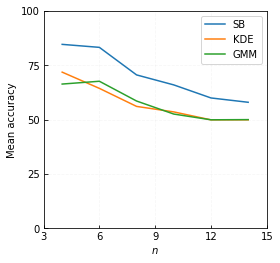

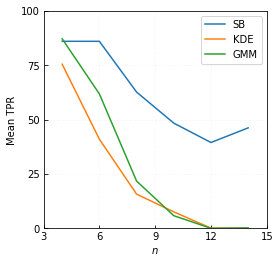

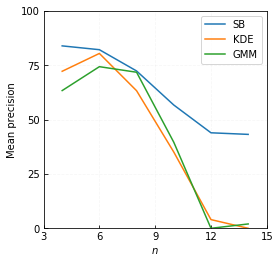

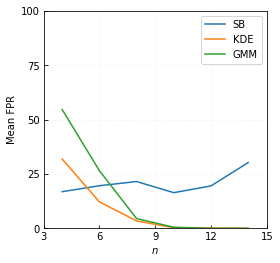

In [8]:
params = {
        'MAX_RUNS': 100,
        'size': -5,
        'scale': 0.5,
        'n_runs': 50,
        'n_samples': 200,
        'test_n_samples': 200,
        'pca_n_components': 0.99,
        'use_pca': False,
        'verbose': False,
    }
experiment_sweep_Rn_v2(params)

# Pause

In [12]:
df5 = pd.read_csv('experiment_sweep_Rn_pca5.csv')
df99 = pd.read_csv('experiment_sweep_Rn_pca99.csv')
print(df5.head())
print(df99.head())

   Unnamed: 0  gmm_acc  gmm_fpr  gmm_pre  gmm_rec  kde_acc  kde_fpr  kde_pre  \
0           0  0.56732  0.85220  0.54078  0.98466  0.58866  0.80480  0.55586   
1           1  0.56544  0.83136  0.54710  0.95852  0.57562  0.80896  0.55750   
2           2  0.56174  0.76920  0.52294  0.89112  0.55936  0.76510  0.52008   
3           3  0.56564  0.47550  0.53982  0.60666  0.56838  0.46960  0.53120   
4           4  0.54940  0.33580  0.38780  0.43510  0.53934  0.33770  0.36538   

   kde_rec  mcmc_acc  mcmc_fpr  mcmc_pre  mcmc_rec   n  
0  0.98006   0.87072   0.17290   0.84582   0.91410   4  
1  0.95660   0.79058   0.17310   0.80584   0.75448   6  
2  0.88228   0.71112   0.21864   0.71530   0.64124   8  
3  0.60624   0.58448   0.22790   0.46084   0.39774  10  
4  0.41704   0.60880   0.22830   0.47134   0.44666  12  
   Unnamed: 0  gmm_acc  gmm_fpr  gmm_pre  gmm_rec  kde_acc  kde_fpr  kde_pre  \
0           0  0.66338  0.54616  0.63340  0.87162  0.71814  0.31866  0.72214   
1           1  0.

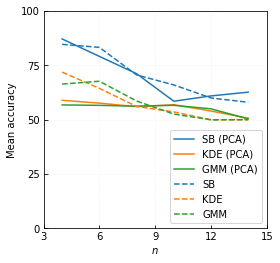

In [13]:
Rn = df5.n.values

mcmc5 = [
    100 * df5.mcmc_acc.values,
    100 * df5.mcmc_rec.values,
    100 * df5.mcmc_fpr.values,
    100 * df5.mcmc_pre.values,
]
kde5 = [
    100 * df5.kde_acc.values,
    100 * df5.kde_rec.values,
    100 * df5.kde_fpr.values,
    100 * df5.kde_pre.values,
]
gmm5 = [
    100 * df5.gmm_acc.values,
    100 * df5.gmm_rec.values,
    100 * df5.gmm_fpr.values,
    100 * df5.gmm_pre.values,
]

mcmc99 = [
    100 * df99.mcmc_acc.values,
    100 * df99.mcmc_rec.values,
    100 * df99.mcmc_fpr.values,
    100 * df99.mcmc_pre.values,
]
kde99 = [
    100 * df99.kde_acc.values,
    100 * df99.kde_rec.values,
    100 * df99.kde_fpr.values,
    100 * df99.kde_pre.values,
]
gmm99 = [
    100 * df99.gmm_acc.values,
    100 * df99.gmm_rec.values,
    100 * df99.gmm_fpr.values,
    100 * df99.gmm_pre.values,
]


fig, ax = plt.subplots(figsize=(4, 4))
ax.plot(Rn, mcmc5[0], label='SB (PCA)')
ax.plot(Rn, kde5[0], label='KDE (PCA)')
ax.plot(Rn, gmm5[0], label='GMM (PCA)')
ax.plot(Rn, mcmc99[0], label='SB', linestyle='dashed', color='tab:blue')
ax.plot(Rn, kde99[0], label='KDE', linestyle='dashed', color='tab:orange')
ax.plot(Rn, gmm99[0], label='GMM', linestyle='dashed', color='tab:green')
ax.tick_params(direction='in')
ax.grid(True, ls='--', alpha=0.1)
ax.set(
    xlabel='$n$', 
    ylabel='Mean accuracy',
    xlim=(3, 15),
    xticks=[3, 6, 9, 12, 15],
    ylim=(0, 100),
    yticks=[0, 25, 50, 75, 100],
)
ax.legend(loc='lower right')
save_settings = {
    'bbox_inches': 'tight',
    'dpi': 300,
}
fig.savefig(
    'img/sweep_Rn_pca_and_nopca.eps',
    **save_settings,
)

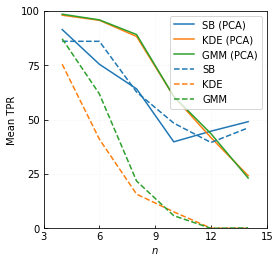

In [14]:
fig, ax = plt.subplots(figsize=(4, 4))
ax.plot(Rn, mcmc5[1], label='SB (PCA)')
ax.plot(Rn, kde5[1], label='KDE (PCA)')
ax.plot(Rn, gmm5[1], label='GMM (PCA)')
ax.plot(Rn, mcmc99[1], label='SB', linestyle='dashed', color='tab:blue')
ax.plot(Rn, kde99[1], label='KDE', linestyle='dashed', color='tab:orange')
ax.plot(Rn, gmm99[1], label='GMM', linestyle='dashed', color='tab:green')
ax.tick_params(direction='in')
ax.grid(True, ls='--', alpha=0.1)
ax.set(
    xlabel='$n$', 
    ylabel='Mean TPR',
    xlim=(3, 15),
    xticks=[3, 6, 9, 12, 15],
    ylim=(0, 100),
    yticks=[0, 25, 50, 75, 100],
)
ax.legend(loc='upper right')
save_settings = {
    'bbox_inches': 'tight',
    'dpi': 300,
}
fig.savefig(
    'img/sweep_Rn_TPR_pca_and_nopca.eps',
    **save_settings,
)

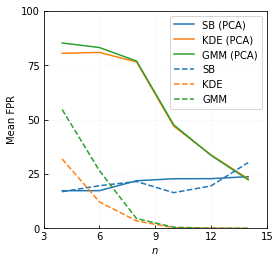

In [15]:
fig, ax = plt.subplots(figsize=(4, 4))
ax.plot(Rn, mcmc5[2], label='SB (PCA)')
ax.plot(Rn, kde5[2], label='KDE (PCA)')
ax.plot(Rn, gmm5[2], label='GMM (PCA)')
ax.plot(Rn, mcmc99[2], label='SB', linestyle='dashed', color='tab:blue')
ax.plot(Rn, kde99[2], label='KDE', linestyle='dashed', color='tab:orange')
ax.plot(Rn, gmm99[2], label='GMM', linestyle='dashed', color='tab:green')
ax.tick_params(direction='in')
ax.grid(True, ls='--', alpha=0.1)
ax.set(
    xlabel='$n$', 
    ylabel='Mean FPR',
    xlim=(3, 15),
    xticks=[3, 6, 9, 12, 15],
    ylim=(0, 100),
    yticks=[0, 25, 50, 75, 100],
)
ax.legend(loc='upper right')
save_settings = {
    'bbox_inches': 'tight',
    'dpi': 300,
}
fig.savefig(
    'img/sweep_Rn_FPR_pca_and_nopca.eps',
    **save_settings,
)

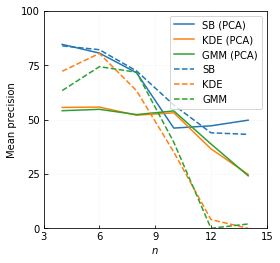

In [16]:
fig, ax = plt.subplots(figsize=(4, 4))
ax.plot(Rn, mcmc5[3], label='SB (PCA)')
ax.plot(Rn, kde5[3], label='KDE (PCA)')
ax.plot(Rn, gmm5[3], label='GMM (PCA)')
ax.plot(Rn, mcmc99[3], label='SB', linestyle='dashed', color='tab:blue')
ax.plot(Rn, kde99[3], label='KDE', linestyle='dashed', color='tab:orange')
ax.plot(Rn, gmm99[3], label='GMM', linestyle='dashed', color='tab:green')
ax.tick_params(direction='in')
ax.grid(True, ls='--', alpha=0.1)
ax.set(
    xlabel='$n$', 
    ylabel='Mean precision',
    xlim=(3, 15),
    xticks=[3, 6, 9, 12, 15],
    ylim=(0, 100),
    yticks=[0, 25, 50, 75, 100],
)
ax.legend(loc='upper right')
save_settings = {
    'bbox_inches': 'tight',
    'dpi': 300,
}
fig.savefig(
    'img/sweep_Rn_pre_pca_and_nopca.eps',
    **save_settings,
)